In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Adapted from: 
# lqr_neural_error_dynamics.ipynb

import scipy.io as sio
import scipy.stats as sio_stat
import scipy.interpolate
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt 

import os
import pickle
import sys
import copy

import time
import pylab as pl
from IPython import display

from bmi_dynamics_code import behavior_co_obs as bmi_b
from bmi_dynamics_code import data_for_v as preeyacode
from bmi_dynamics_code import util as bmi_util

import timeit
from sklearn import decomposition as skl_decomp

import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge

%matplotlib notebook

In [3]:
%matplotlib notebook

In [4]:
#Load a base file for simulation parameters: 
ext_list =['.png', '.eps']

plot_dir = r'D:\Dropbox\BMI_co_obs_paper\data\vivek\lqr'

home_dir = r'D:\Dropbox\Code\preeya_co_obstacle'
data_dir = r'D:\Dropbox\Data\preeya_co_obstacle'
data_path = os.path.join(data_dir, 'for_v_df.pkl')
print(os.path.exists(data_path))
d = pickle.load(open(data_path))

#UNPACK: 
decoder = d['decoder']
pre = d['pre']
num_targets = d['num_targets']
sample_period = d['sample_period']
target_hold_time = d['target_hold_time']
num_neurons = d['num_neurons']
target_color = d['target_color']
obs_big = d['obs_big']
obs_small = d['obs_small']
target_r_task = d['target_r_task'] #target_r_task = {0:1.7, 1:2.0}
cursor_r = d['cursor_r']
target_r_eff = d['target_r_eff']
target_pos = d['target_pos']
target_angle = np.arctan2(target_pos[:,1], target_pos[:,0])
target_dist = np.linalg.norm(target_pos, axis=1)
obs_pos = d['obs_pos']

tc_meta = d['tc_meta']
task_list = d['task_list']
num_tasks = len(task_list)
task2idx = d['task2idx']
idx2task = bmi_util.invert_dic(task2idx)
task2tc = d['task2tc']
tc_list = d['tc_list']
df = d['df']
df_label = d['df_label']

task_color = ['k', 'r']

#Pre-processing: 

bmi_b.preprocess_bmi_df(df, target_pos, pre, num_tasks, num_targets)
num_cw = 2
cw_label = ['cw', 'ccw']
task_rot_list = [0,1.1,1.2]

#Binning: 
#MAGNITUDE:
num_mag_bins = 5
num_mag_bins_analyze = 4
# mag_bin_perc = np.array([0,25,50,75,100])
mag_bin_perc = np.concatenate([np.linspace(0,95,5),np.array([100])])
#ANGLE:
num_angle_bins = 8
T0_angle = -3*(2*np.pi)/8
mag_bin, mag_bin_edges, mag_bin_c, angle_bin_c, angle_bin, angle_bin_edges =\
bmi_b.def_command_bin(df, mag_bin_perc, num_angle_bins, T0_angle)
#CENTER ANGLE DATA FOR BINNING (based on bin boundaries): 
angle_center_for_binning = bmi_b.df_center_angle_for_binning(df, angle_bin)
#BIN: 
bmi_b.df_bin_command(df, mag_bin_edges,angle_bin_edges)

#Pre-processing continued:

#Center angles to command bin, target: 
bmi_b.center_df_angle(df, angle_bin_c, target_angle)

True
('angle_center:', 22.5)
('min centered angle:', -157.47162455426732)
('max centered angle:', 202.46708261619673)


<IPython.core.display.Javascript object>


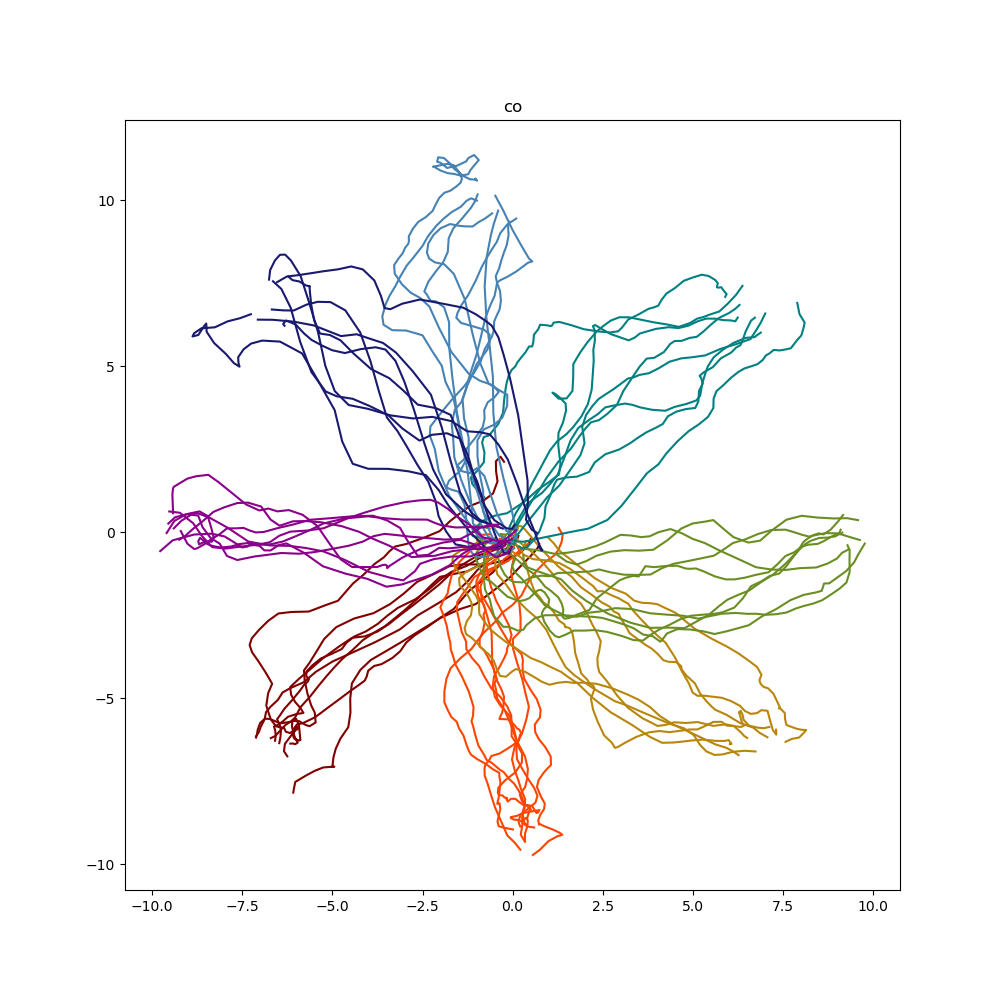

<IPython.core.display.Javascript object>


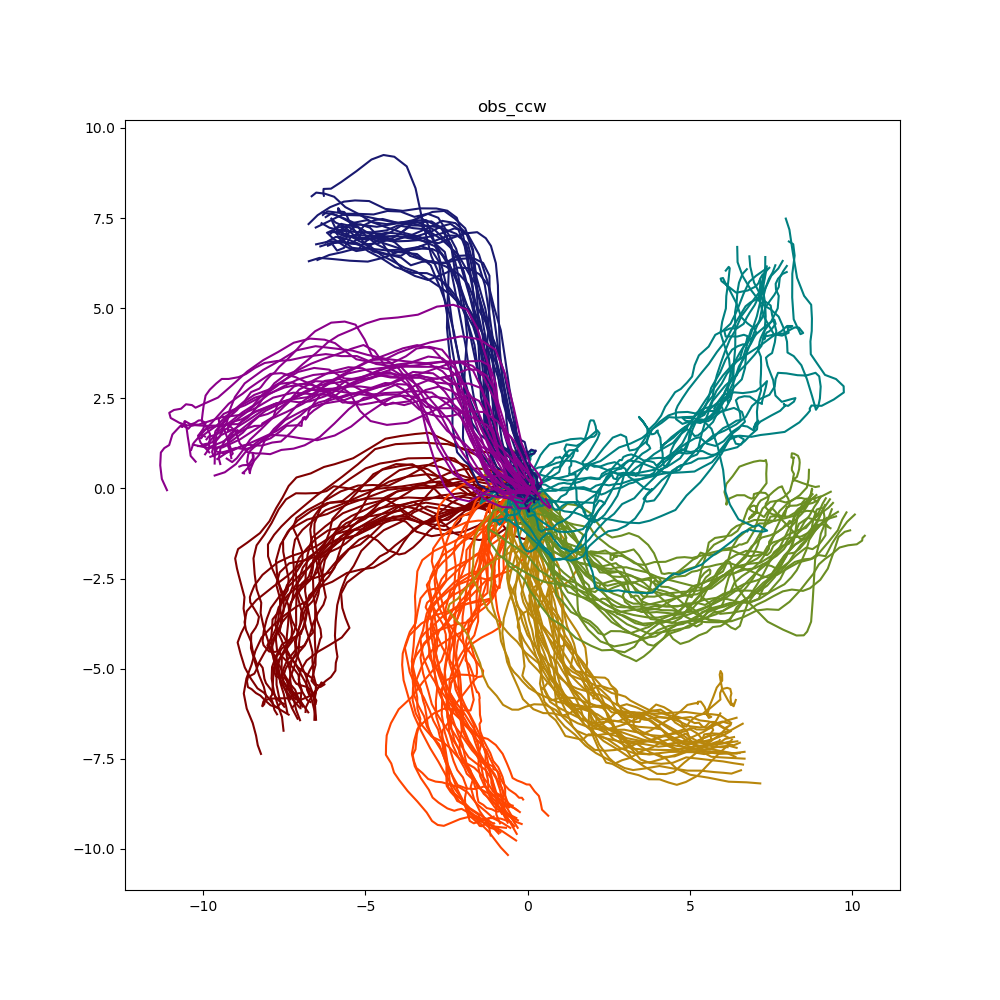

<IPython.core.display.Javascript object>


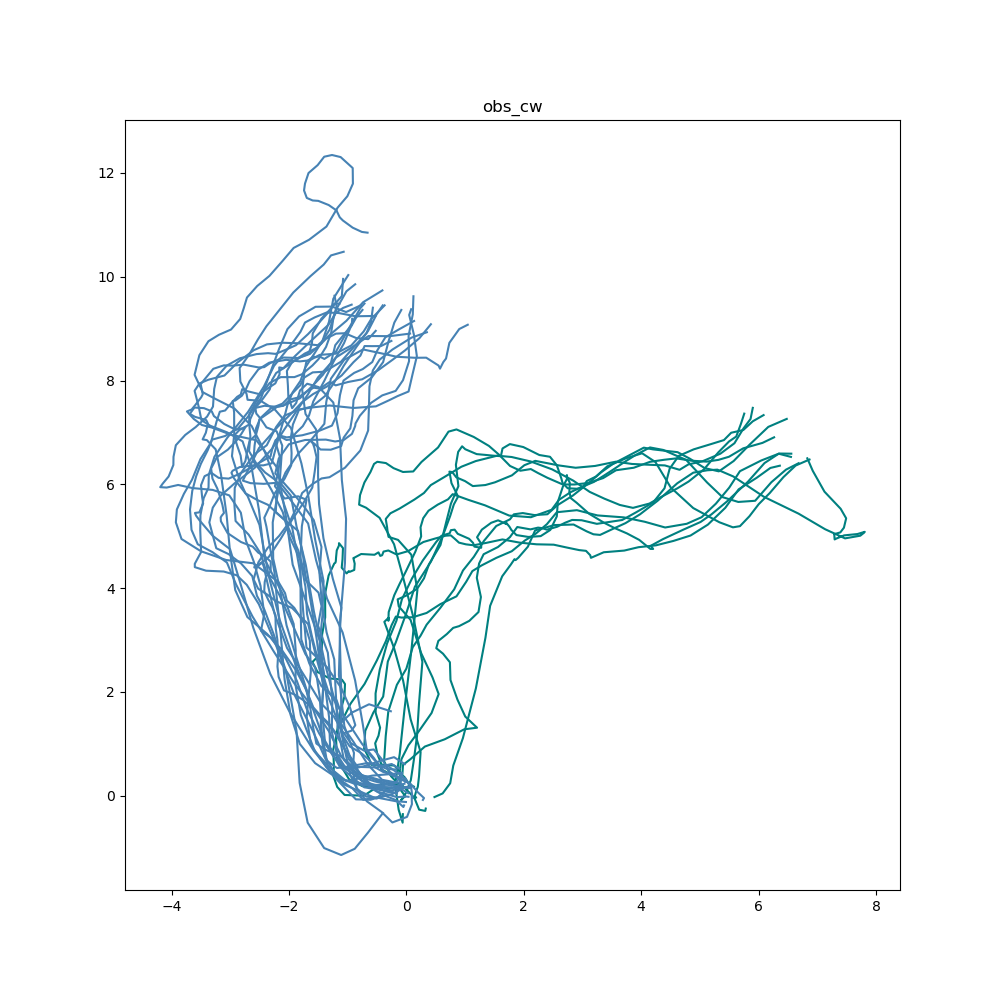

In [5]:
#Plot cw vs ccw trials, to confirm: 
plot = {}
plot['size'] = (10,10)
plot['xlim'] = (-12.5,12.5)
plot['ylim'] = (-12.5,12.5)
task_rot_list = [0,1.1,1.2]
task_rot_label = ['co','obs_ccw', 'obs_cw']

for i,task in enumerate(task_rot_list):
    plt.figure(figsize=plot['size'])
    plt.title(task_rot_label[i])
    for target in range(num_targets):    
            sel = (df['task_rot']==task) & (df['bin']>=0) & (df['target']==target)
            df_sel = df[sel]
            #------------------------------------------------------------------------------------
            #TRIALS: 
            trial_start = np.where(df_sel['bin']==0)[0]
            trial_stop = np.where(df_sel['bin_end']==0)[0]
            trial_bound = np.vstack((trial_start,trial_stop)).T
            #------------------------------------------------------------------------------------
            for bnd in trial_bound[:,:]: #trial_bound[0:1,:]:
    #             if (task_str == 'co') or (task_str == 'obs') and (df_sel['obs_size'][bnd[0]:bnd[0]+1] == obs_big).bool(): 
                x = df_sel['kin_px'][bnd[0]:bnd[1]+1]
                y = df_sel['kin_py'][bnd[0]:bnd[1]+1]
                color = target_color[target]
                plt.plot(x,y,'-',color=color)

In [6]:
save_home = r'D:\DATA\bmi_co_obs_backup'


dynamics_dir = r'D:\Dropbox\BMI_co_obs_paper\data'
dynamics_path = os.path.join(dynamics_dir, 'dynamics_for_v.pkl')
with open(dynamics_path, 'rb') as f: 
    dynamics_dic = pickle.load(f)

decoder_dir = r'D:\Dropbox\BMI_co_obs_paper\data'
decoder_path = os.path.join(decoder_dir, 'decoders_for_v.pkl')
with open(decoder_path, 'rb') as f: 
    decoder_dic = pickle.load(f)
    
a_list = ['grom', 'jeev']
a2num_days = {'grom':9, 'jeev':4}

# [('jeev', 1, 'F'),
#  ('grom', 5, 'KG'),
#  ('grom', 0, 'KG'),
#  ('grom', 6, 'F'),
#  ('grom', 2, 'KG'),
#  ('grom', 1, 'KG'),
#  ('grom', 4, 'KG'),
#  ('grom', 3, 'KG'),
#  ('grom', 8, 'F'),
#  ('jeev', 1, 'KG'),
#  ('grom', 6, 'KG'),
#  ('grom', 0, 'F'),
#  ('jeev', 0, 'KG'),
#  ('jeev', 2, 'F'),
#  ('grom', 7, 'KG'),
#  ('grom', 8, 'KG'),
#  ('jeev', 3, 'F'),
#  ('grom', 3, 'F'),
#  ('grom', 4, 'F'),
#  ('jeev', 3, 'KG'),
#  ('grom', 1, 'F'),
#  ('jeev', 0, 'F'),
#  ('grom', 5, 'F'),
#  ('grom', 2, 'F'),
#  ('grom', 7, 'F'),
#  ('jeev', 2, 'KG')]

In [ ]:
a_list

In [ ]:
a2num_days['grom']

In [ ]:
a2num_days['jeev']

In [19]:
for a in a_list: #
    for d in range(a2num_days[a]): #[0]: #
        t_iter_start = timeit.default_timer()
        print(a,d)
        load_dir = os.path.join(save_home, a, str(d))
#         print(os.path.exists(load_dir))
        load_file = 'lqr_sim_20trials.pkl'
        load_path = os.path.join(load_dir, load_file)
        with open(load_path, 'rb') as f: 
            r = pickle.load(f)        
        for (k,v) in r.items():
            exec(k+'=v')        
        
        #analyze u norm:
        model_pair = ['n_do', 'n_o']
        r_u = analyze_u_norm(norm_u_df_n, model_pair, target_list, task_rot_list)
        
        #analyze neural diff: 
        p_sig_match = 0.05
        shuffle_bool = True
        num_shuffle = 1000
        min_obs = 15
        
        m_list, c_list, n_list = def_var_lists(num_targets, task_rot_list, num_mag_bins_analyze, num_angle_bins, num_neurons)
        model_cm =  main_compute_neural_command_diff(df_lqr_n, model_list, m_list, c_list, n_list, p_sig_match, shuffle_bool, num_shuffle)
        model_diff = collect_neural_command_diff(model_cm, model_list, c_list, m_list, min_obs, shuffle_bool)
        
        r_n = analyze_n_diff(model_diff)
        
        #Save results: 
        r = {}
        r['num_targets'] = num_targets
        r['task_rot_list'] = task_rot_list
        r['num_mag_bins_analyze'] = num_mag_bins_analyze
        r['num_angle_bins'] = num_angle_bins
        r['num_neurons'] = num_neurons
        r['m_list'] = m_list
        r['c_list'] = c_list
        r['n_list'] = n_list
        r['p_sig_match'] = p_sig_match
        r['shuffle_bool'] = shuffle_bool
        r['num_shuffle'] = num_shuffle
        r['min_obs'] = min_obs
        r['model_cm'] = model_cm
        r['model_diff'] = model_diff
        r['norm_u_df_n'] = norm_u_df_n
        r['r_u'] = r_u
        r['r_n'] = r_n
        
        save_dir = os.path.join(save_home, a, str(d))
        save_path = os.path.join(save_dir, 'analysis_lqr_sim_'+str(num_trials)+'trials_'+ str(num_shuffle) + 'shuffles' +'.pkl')
        with open(save_path, 'wb') as f: 
            data = pickle.dump(r, f, protocol=pickle.HIGHEST_PROTOCOL)    
            
        t_iter_elapsed = timeit.default_timer()-t_iter_start
        print('time iteration: ' + str(t_iter_elapsed))
        print('DONE!')        
        
        

('grom', 0)
('n_do', (0, 0), (0, 0))
('n_do', (0, 0), (0, 1.1))
('n_do', (0, 0), (0, 1.2))
('n_do', (0, 0), (1, 0))
('n_do', (0, 0), (1, 1.1))
('n_do', (0, 0), (1, 1.2))
('n_do', (0, 0), (2, 0))
('n_do', (0, 0), (2, 1.1))
('n_do', (0, 0), (2, 1.2))
('n_do', (0, 0), (3, 0))
('n_do', (0, 0), (3, 1.1))
('n_do', (0, 0), (3, 1.2))
('n_do', (0, 0), (4, 0))
('n_do', (0, 0), (4, 1.1))
('n_do', (0, 0), (4, 1.2))
('n_do', (0, 0), (5, 0))
('n_do', (0, 0), (5, 1.1))
('n_do', (0, 0), (5, 1.2))
('n_do', (0, 0), (6, 0))
('n_do', (0, 0), (6, 1.1))
('n_do', (0, 0), (6, 1.2))
('n_do', (0, 0), (7, 0))
('n_do', (0, 0), (7, 1.1))
('n_do', (0, 0), (7, 1.2))
('n_do', (0, 1), (0, 0))
('n_do', (0, 1), (0, 1.1))
('n_do', (0, 1), (0, 1.2))
('n_do', (0, 1), (1, 0))
('n_do', (0, 1), (1, 1.1))
('n_do', (0, 1), (1, 1.2))
('n_do', (0, 1), (2, 0))
('n_do', (0, 1), (2, 1.1))
('n_do', (0, 1), (2, 1.2))
('n_do', (0, 1), (3, 0))
('n_do', (0, 1), (3, 1.1))
('n_do', (0, 1), (3, 1.2))
('n_do', (0, 1), (4, 0))
('n_do', (0, 1)

('n_do', (1, 6), (0, 1.2))
('n_do', (1, 6), (1, 0))
('n_do', (1, 6), (1, 1.1))
('n_do', (1, 6), (1, 1.2))
('n_do', (1, 6), (2, 0))
('n_do', (1, 6), (2, 1.1))
('n_do', (1, 6), (2, 1.2))
('n_do', (1, 6), (3, 0))
('n_do', (1, 6), (3, 1.1))
('n_do', (1, 6), (3, 1.2))
('n_do', (1, 6), (4, 0))
('n_do', (1, 6), (4, 1.1))
('n_do', (1, 6), (4, 1.2))
('n_do', (1, 6), (5, 0))
('n_do', (1, 6), (5, 1.1))
('n_do', (1, 6), (5, 1.2))
('n_do', (1, 6), (6, 0))
('n_do', (1, 6), (6, 1.1))
('n_do', (1, 6), (6, 1.2))
('n_do', (1, 6), (7, 0))
('n_do', (1, 6), (7, 1.1))
('n_do', (1, 6), (7, 1.2))
('n_do', (1, 7), (0, 0))
('n_do', (1, 7), (0, 1.1))
('n_do', (1, 7), (0, 1.2))
('n_do', (1, 7), (1, 0))
('n_do', (1, 7), (1, 1.1))
('n_do', (1, 7), (1, 1.2))
('n_do', (1, 7), (2, 0))
('n_do', (1, 7), (2, 1.1))
('n_do', (1, 7), (2, 1.2))
('n_do', (1, 7), (3, 0))
('n_do', (1, 7), (3, 1.1))
('n_do', (1, 7), (3, 1.2))
('n_do', (1, 7), (4, 0))
('n_do', (1, 7), (4, 1.1))
('n_do', (1, 7), (4, 1.2))
('n_do', (1, 7), (5, 0))


('n_do', (3, 4), (4, 1.1))
('n_do', (3, 4), (4, 1.2))
('n_do', (3, 4), (5, 0))
('n_do', (3, 4), (5, 1.1))
('n_do', (3, 4), (5, 1.2))
('n_do', (3, 4), (6, 0))
('n_do', (3, 4), (6, 1.1))
('n_do', (3, 4), (6, 1.2))
('n_do', (3, 4), (7, 0))
('n_do', (3, 4), (7, 1.1))
('n_do', (3, 4), (7, 1.2))
('n_do', (3, 5), (0, 0))
('n_do', (3, 5), (0, 1.1))
('n_do', (3, 5), (0, 1.2))
('n_do', (3, 5), (1, 0))
('n_do', (3, 5), (1, 1.1))
('n_do', (3, 5), (1, 1.2))
('n_do', (3, 5), (2, 0))
('n_do', (3, 5), (2, 1.1))
('n_do', (3, 5), (2, 1.2))
('n_do', (3, 5), (3, 0))
('n_do', (3, 5), (3, 1.1))
('n_do', (3, 5), (3, 1.2))
('n_do', (3, 5), (4, 0))
('n_do', (3, 5), (4, 1.1))
('n_do', (3, 5), (4, 1.2))
('n_do', (3, 5), (5, 0))
('n_do', (3, 5), (5, 1.1))
('n_do', (3, 5), (5, 1.2))
('n_do', (3, 5), (6, 0))
('n_do', (3, 5), (6, 1.1))
('n_do', (3, 5), (6, 1.2))
('n_do', (3, 5), (7, 0))
('n_do', (3, 5), (7, 1.1))
('n_do', (3, 5), (7, 1.2))
('n_do', (3, 6), (0, 0))
('n_do', (3, 6), (0, 1.1))
('n_do', (3, 6), (0, 1.2)

('n_null', (1, 2), (1, 0))
('n_null', (1, 2), (1, 1.1))
('n_null', (1, 2), (1, 1.2))
('n_null', (1, 2), (2, 0))
('n_null', (1, 2), (2, 1.1))
('n_null', (1, 2), (2, 1.2))
('n_null', (1, 2), (3, 0))
('n_null', (1, 2), (3, 1.1))
('n_null', (1, 2), (3, 1.2))
('n_null', (1, 2), (4, 0))
('n_null', (1, 2), (4, 1.1))
('n_null', (1, 2), (4, 1.2))
('n_null', (1, 2), (5, 0))
('n_null', (1, 2), (5, 1.1))
('n_null', (1, 2), (5, 1.2))
('n_null', (1, 2), (6, 0))
('n_null', (1, 2), (6, 1.1))
('n_null', (1, 2), (6, 1.2))
('n_null', (1, 2), (7, 0))
('n_null', (1, 2), (7, 1.1))
('n_null', (1, 2), (7, 1.2))
('n_null', (1, 3), (0, 0))
('n_null', (1, 3), (0, 1.1))
('n_null', (1, 3), (0, 1.2))
('n_null', (1, 3), (1, 0))
('n_null', (1, 3), (1, 1.1))
('n_null', (1, 3), (1, 1.2))
('n_null', (1, 3), (2, 0))
('n_null', (1, 3), (2, 1.1))
('n_null', (1, 3), (2, 1.2))
('n_null', (1, 3), (3, 0))
('n_null', (1, 3), (3, 1.1))
('n_null', (1, 3), (3, 1.2))
('n_null', (1, 3), (4, 0))
('n_null', (1, 3), (4, 1.1))
('n_null'

('n_null', (2, 7), (0, 1.1))
('n_null', (2, 7), (0, 1.2))
('n_null', (2, 7), (1, 0))
('n_null', (2, 7), (1, 1.1))
('n_null', (2, 7), (1, 1.2))
('n_null', (2, 7), (2, 0))
('n_null', (2, 7), (2, 1.1))
('n_null', (2, 7), (2, 1.2))
('n_null', (2, 7), (3, 0))
('n_null', (2, 7), (3, 1.1))
('n_null', (2, 7), (3, 1.2))
('n_null', (2, 7), (4, 0))
('n_null', (2, 7), (4, 1.1))
('n_null', (2, 7), (4, 1.2))
('n_null', (2, 7), (5, 0))
('n_null', (2, 7), (5, 1.1))
('n_null', (2, 7), (5, 1.2))
('n_null', (2, 7), (6, 0))
('n_null', (2, 7), (6, 1.1))
('n_null', (2, 7), (6, 1.2))
('n_null', (2, 7), (7, 0))
('n_null', (2, 7), (7, 1.1))
('n_null', (2, 7), (7, 1.2))
('n_null', (3, 0), (0, 0))
('n_null', (3, 0), (0, 1.1))
('n_null', (3, 0), (0, 1.2))
('n_null', (3, 0), (1, 0))
('n_null', (3, 0), (1, 1.1))
('n_null', (3, 0), (1, 1.2))
('n_null', (3, 0), (2, 0))
('n_null', (3, 0), (2, 1.1))
('n_null', (3, 0), (2, 1.2))
('n_null', (3, 0), (3, 0))
('n_null', (3, 0), (3, 1.1))
('n_null', (3, 0), (3, 1.2))
('n_nul

('n_o', (0, 3), (4, 0))
('n_o', (0, 3), (4, 1.1))
('n_o', (0, 3), (4, 1.2))
('n_o', (0, 3), (5, 0))
('n_o', (0, 3), (5, 1.1))
('n_o', (0, 3), (5, 1.2))
('n_o', (0, 3), (6, 0))
('n_o', (0, 3), (6, 1.1))
('n_o', (0, 3), (6, 1.2))
('n_o', (0, 3), (7, 0))
('n_o', (0, 3), (7, 1.1))
('n_o', (0, 3), (7, 1.2))
('n_o', (0, 4), (0, 0))
('n_o', (0, 4), (0, 1.1))
('n_o', (0, 4), (0, 1.2))
('n_o', (0, 4), (1, 0))
('n_o', (0, 4), (1, 1.1))
('n_o', (0, 4), (1, 1.2))
('n_o', (0, 4), (2, 0))
('n_o', (0, 4), (2, 1.1))
('n_o', (0, 4), (2, 1.2))
('n_o', (0, 4), (3, 0))
('n_o', (0, 4), (3, 1.1))
('n_o', (0, 4), (3, 1.2))
('n_o', (0, 4), (4, 0))
('n_o', (0, 4), (4, 1.1))
('n_o', (0, 4), (4, 1.2))
('n_o', (0, 4), (5, 0))
('n_o', (0, 4), (5, 1.1))
('n_o', (0, 4), (5, 1.2))
('n_o', (0, 4), (6, 0))
('n_o', (0, 4), (6, 1.1))
('n_o', (0, 4), (6, 1.2))
('n_o', (0, 4), (7, 0))
('n_o', (0, 4), (7, 1.1))
('n_o', (0, 4), (7, 1.2))
('n_o', (0, 5), (0, 0))
('n_o', (0, 5), (0, 1.1))
('n_o', (0, 5), (0, 1.2))
('n_o', (0, 

('n_o', (2, 2), (2, 0))
('n_o', (2, 2), (2, 1.1))
('n_o', (2, 2), (2, 1.2))
('n_o', (2, 2), (3, 0))
('n_o', (2, 2), (3, 1.1))
('n_o', (2, 2), (3, 1.2))
('n_o', (2, 2), (4, 0))
('n_o', (2, 2), (4, 1.1))
('n_o', (2, 2), (4, 1.2))
('n_o', (2, 2), (5, 0))
('n_o', (2, 2), (5, 1.1))
('n_o', (2, 2), (5, 1.2))
('n_o', (2, 2), (6, 0))
('n_o', (2, 2), (6, 1.1))
('n_o', (2, 2), (6, 1.2))
('n_o', (2, 2), (7, 0))
('n_o', (2, 2), (7, 1.1))
('n_o', (2, 2), (7, 1.2))
('n_o', (2, 3), (0, 0))
('n_o', (2, 3), (0, 1.1))
('n_o', (2, 3), (0, 1.2))
('n_o', (2, 3), (1, 0))
('n_o', (2, 3), (1, 1.1))
('n_o', (2, 3), (1, 1.2))
('n_o', (2, 3), (2, 0))
('n_o', (2, 3), (2, 1.1))
('n_o', (2, 3), (2, 1.2))
('n_o', (2, 3), (3, 0))
('n_o', (2, 3), (3, 1.1))
('n_o', (2, 3), (3, 1.2))
('n_o', (2, 3), (4, 0))
('n_o', (2, 3), (4, 1.1))
('n_o', (2, 3), (4, 1.2))
('n_o', (2, 3), (5, 0))
('n_o', (2, 3), (5, 1.1))
('n_o', (2, 3), (5, 1.2))
('n_o', (2, 3), (6, 0))
('n_o', (2, 3), (6, 1.1))
('n_o', (2, 3), (6, 1.2))
('n_o', (2, 

('n_d', (0, 0), (3, 0))
('n_d', (0, 0), (3, 1.1))
('n_d', (0, 0), (3, 1.2))
('n_d', (0, 0), (4, 0))
('n_d', (0, 0), (4, 1.1))
('n_d', (0, 0), (4, 1.2))
('n_d', (0, 0), (5, 0))
('n_d', (0, 0), (5, 1.1))
('n_d', (0, 0), (5, 1.2))
('n_d', (0, 0), (6, 0))
('n_d', (0, 0), (6, 1.1))
('n_d', (0, 0), (6, 1.2))
('n_d', (0, 0), (7, 0))
('n_d', (0, 0), (7, 1.1))
('n_d', (0, 0), (7, 1.2))
('n_d', (0, 1), (0, 0))
('n_d', (0, 1), (0, 1.1))
('n_d', (0, 1), (0, 1.2))
('n_d', (0, 1), (1, 0))
('n_d', (0, 1), (1, 1.1))
('n_d', (0, 1), (1, 1.2))
('n_d', (0, 1), (2, 0))
('n_d', (0, 1), (2, 1.1))
('n_d', (0, 1), (2, 1.2))
('n_d', (0, 1), (3, 0))
('n_d', (0, 1), (3, 1.1))
('n_d', (0, 1), (3, 1.2))
('n_d', (0, 1), (4, 0))
('n_d', (0, 1), (4, 1.1))
('n_d', (0, 1), (4, 1.2))
('n_d', (0, 1), (5, 0))
('n_d', (0, 1), (5, 1.1))
('n_d', (0, 1), (5, 1.2))
('n_d', (0, 1), (6, 0))
('n_d', (0, 1), (6, 1.1))
('n_d', (0, 1), (6, 1.2))
('n_d', (0, 1), (7, 0))
('n_d', (0, 1), (7, 1.1))
('n_d', (0, 1), (7, 1.2))
('n_d', (0, 

('n_d', (1, 6), (1, 1.1))
('n_d', (1, 6), (1, 1.2))
('n_d', (1, 6), (2, 0))
('n_d', (1, 6), (2, 1.1))
('n_d', (1, 6), (2, 1.2))
('n_d', (1, 6), (3, 0))
('n_d', (1, 6), (3, 1.1))
('n_d', (1, 6), (3, 1.2))
('n_d', (1, 6), (4, 0))
('n_d', (1, 6), (4, 1.1))
('n_d', (1, 6), (4, 1.2))
('n_d', (1, 6), (5, 0))
('n_d', (1, 6), (5, 1.1))
('n_d', (1, 6), (5, 1.2))
('n_d', (1, 6), (6, 0))
('n_d', (1, 6), (6, 1.1))
('n_d', (1, 6), (6, 1.2))
('n_d', (1, 6), (7, 0))
('n_d', (1, 6), (7, 1.1))
('n_d', (1, 6), (7, 1.2))
('n_d', (1, 7), (0, 0))
('n_d', (1, 7), (0, 1.1))
('n_d', (1, 7), (0, 1.2))
('n_d', (1, 7), (1, 0))
('n_d', (1, 7), (1, 1.1))
('n_d', (1, 7), (1, 1.2))
('n_d', (1, 7), (2, 0))
('n_d', (1, 7), (2, 1.1))
('n_d', (1, 7), (2, 1.2))
('n_d', (1, 7), (3, 0))
('n_d', (1, 7), (3, 1.1))
('n_d', (1, 7), (3, 1.2))
('n_d', (1, 7), (4, 0))
('n_d', (1, 7), (4, 1.1))
('n_d', (1, 7), (4, 1.2))
('n_d', (1, 7), (5, 0))
('n_d', (1, 7), (5, 1.1))
('n_d', (1, 7), (5, 1.2))
('n_d', (1, 7), (6, 0))
('n_d', (1, 

('n_d', (3, 4), (7, 1.1))
('n_d', (3, 4), (7, 1.2))
('n_d', (3, 5), (0, 0))
('n_d', (3, 5), (0, 1.1))
('n_d', (3, 5), (0, 1.2))
('n_d', (3, 5), (1, 0))
('n_d', (3, 5), (1, 1.1))
('n_d', (3, 5), (1, 1.2))
('n_d', (3, 5), (2, 0))
('n_d', (3, 5), (2, 1.1))
('n_d', (3, 5), (2, 1.2))
('n_d', (3, 5), (3, 0))
('n_d', (3, 5), (3, 1.1))
('n_d', (3, 5), (3, 1.2))
('n_d', (3, 5), (4, 0))
('n_d', (3, 5), (4, 1.1))
('n_d', (3, 5), (4, 1.2))
('n_d', (3, 5), (5, 0))
('n_d', (3, 5), (5, 1.1))
('n_d', (3, 5), (5, 1.2))
('n_d', (3, 5), (6, 0))
('n_d', (3, 5), (6, 1.1))
('n_d', (3, 5), (6, 1.2))
('n_d', (3, 5), (7, 0))
('n_d', (3, 5), (7, 1.1))
('n_d', (3, 5), (7, 1.2))
('n_d', (3, 6), (0, 0))
('n_d', (3, 6), (0, 1.1))
('n_d', (3, 6), (0, 1.2))
('n_d', (3, 6), (1, 0))
('n_d', (3, 6), (1, 1.1))
('n_d', (3, 6), (1, 1.2))
('n_d', (3, 6), (2, 0))
('n_d', (3, 6), (2, 1.1))
('n_d', (3, 6), (2, 1.2))
('n_d', (3, 6), (3, 0))
('n_d', (3, 6), (3, 1.1))
('n_d', (3, 6), (3, 1.2))
('n_d', (3, 6), (4, 0))
('n_d', (3, 

443
0.85
419
0.8
matched!
('n_do', (0, 3), (3, 0))
0.95
468
0.9
443
0.85
419
0.8
394
0.75
369
0.7
matched!
('n_do', (0, 3), (3, 1.1))
0.95
468
0.9
443
0.85
419
0.8
394
0.75
369
0.7
345
0.65
320
0.6
matched!
('n_do', (0, 3), (3, 1.2))
0.95
468
0.9
443
0.85
419
0.8
394
0.75
369
0.7
345
0.65
320
0.6
295
0.55
271
0.5
246
0.45
matched!
('n_do', (0, 3), (4, 0))
0.95
468
0.9
matched!
('n_do', (0, 3), (4, 1.1))
0.95
matched!
('n_do', (0, 3), (4, 1.2))
0.95
matched!
('n_do', (0, 3), (5, 0))
0.95
468
0.9
443
0.85
419
0.8
394
0.75
369
0.7
345
0.65
320
0.6
295
0.55
271
0.5
246
0.45
221
0.4
197
0.35
172
0.3
147
0.25
123
0.2
98
0.15
73
0.1
matched!
('n_do', (0, 3), (5, 1.1))
0.95
matched!
('n_do', (0, 3), (5, 1.2))
0.95
matched!
('n_do', (0, 3), (6, 0))
0.95
matched!
('n_do', (0, 3), (6, 1.1))
0.95
matched!
('n_do', (0, 3), (6, 1.2))
0.95
matched!
('n_do', (0, 3), (7, 0))
0.95
468
0.9
443
0.85
419
0.8
394
0.75
369
0.7
345
0.65
320
0.6
295
0.55
matched!
('n_do', (0, 3), (7, 1.1))
0.95
468
0.9
443
0.8

533
0.9
505
0.85
477
0.8
449
0.75
421
0.7
393
0.65
365
0.6
337
0.55
309
0.5
281
0.45
252
0.4
224
0.35
matched!
('n_do', (1, 0), (3, 1.2))
0.95
matched!
('n_do', (1, 0), (4, 0))
0.95
matched!
('n_do', (1, 0), (4, 1.1))
0.95
matched!
('n_do', (1, 0), (4, 1.2))
0.95
matched!
('n_do', (1, 0), (5, 0))
0.95
matched!
('n_do', (1, 0), (5, 1.1))
0.95
matched!
('n_do', (1, 0), (5, 1.2))
0.95
533
0.9
505
0.85
477
0.8
matched!
('n_do', (1, 0), (6, 0))
0.95
matched!
('n_do', (1, 0), (6, 1.1))
0.95
533
0.9
505
0.85
477
0.8
449
0.75
421
0.7
393
0.65
365
0.6
matched!
('n_do', (1, 0), (6, 1.2))
0.95
matched!
('n_do', (1, 0), (7, 0))
0.95
533
0.9
505
0.85
477
0.8
449
0.75
421
0.7
393
0.65
365
0.6
337
0.55
309
0.5
matched!
('n_do', (1, 0), (7, 1.1))
0.95
533
0.9
505
0.85
477
0.8
449
0.75
421
0.7
393
0.65
365
0.6
matched!
('n_do', (1, 0), (7, 1.2))
0.95
533
0.9
505
0.85
477
0.8
449
0.75
421
0.7
393
0.65
365
0.6
337
0.55
309
0.5
matched!
('n_do', (1, 1), (0, 0))
0.95
552
0.9
523
0.85
494
0.8
465
0.75
436
0

0.1
matched!
('n_do', (1, 5), (6, 1.2))
0.95
557
0.9
matched!
('n_do', (1, 5), (7, 0))
0.95
matched!
('n_do', (1, 5), (7, 1.1))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
matched!
('n_do', (1, 5), (7, 1.2))
0.95
557
0.9
528
0.85
498
0.8
matched!
('n_do', (1, 6), (0, 0))
0.95
matched!
('n_do', (1, 6), (0, 1.1))
0.95
439
0.9
416
0.85
393
0.8
matched!
('n_do', (1, 6), (0, 1.2))
0.95
matched!
('n_do', (1, 6), (1, 0))
0.95
matched!
('n_do', (1, 6), (1, 1.1))
0.95
matched!
('n_do', (1, 6), (1, 1.2))
0.95
matched!
('n_do', (1, 6), (2, 0))
0.95
matched!
('n_do', (1, 6), (2, 1.1))
0.95
matched!
('n_do', (1, 6), (2, 1.2))
0.95
matched!
('n_do', (1, 6), (3, 0))
0.95
matched!
('n_do', (1, 6), (3, 1.1))
0.95
439
0.9
matched!
('n_do', (1, 6), (3, 1.2))
0.95
matched!
('n_do', (1, 6), (4, 0))
0.95
matched!
('n_do', (1, 6), (4, 1.1))
0.95
439
0.9
416
0.85
393
0.8
370
0.75
347
0.7
324
0.65
300
0.6
277
0.55
254
0.5
231
0.45
208
0.4
matched!
('n_do', (1, 6), (4, 1.2))
0.95
439
0.9
416
0.85
ma

278
0.55
255
0.5
232
0.45
matched!
('n_do', (2, 3), (1, 1.2))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
324
0.65
301
0.6
278
0.55
matched!
('n_do', (2, 3), (2, 0))
0.95
matched!
('n_do', (2, 3), (2, 1.1))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
324
0.65
301
0.6
278
0.55
255
0.5
matched!
('n_do', (2, 3), (2, 1.2))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
324
0.65
301
0.6
matched!
('n_do', (2, 3), (3, 0))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
matched!
('n_do', (2, 3), (3, 1.1))
0.95
matched!
('n_do', (2, 3), (3, 1.2))
0.95
matched!
('n_do', (2, 3), (4, 0))
0.95
matched!
('n_do', (2, 3), (4, 1.1))
0.95
440
0.9
matched!
('n_do', (2, 3), (4, 1.2))
0.95
440
0.9
417
0.85
matched!
('n_do', (2, 3), (5, 0))
0.95
matched!
('n_do', (2, 3), (5, 1.1))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
324
0.65
301
0.6
278
0.55
255
0.5
232
0.45
208
0.4
185
0.35
matched!
('n_do', (2, 3), (5, 1.2))
0.95
440
0.9
417
0.85
394
0.8
371
0.75
348
0.7
324
0.65
301
0.6
278
0.55
255
0.5
2

0.95
524
0.9
matched!
('n_do', (3, 0), (1, 0))
0.95
matched!
('n_do', (3, 0), (1, 1.1))
0.95
524
0.9
496
0.85
matched!
('n_do', (3, 0), (1, 1.2))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
303
0.5
276
0.45
248
0.4
matched!
('n_do', (3, 0), (2, 0))
0.95
matched!
('n_do', (3, 0), (2, 1.1))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
matched!
('n_do', (3, 0), (2, 1.2))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
303
0.5
matched!
('n_do', (3, 0), (3, 0))
0.95
matched!
('n_do', (3, 0), (3, 1.1))
0.95
matched!
('n_do', (3, 0), (3, 1.2))
0.95
matched!
('n_do', (3, 0), (4, 0))
0.95
matched!
('n_do', (3, 0), (4, 1.1))
0.95
matched!
('n_do', (3, 0), (4, 1.2))
0.95
matched!
('n_do', (3, 0), (5, 0))
0.95
matched!
('n_do', (3, 0), (5, 1.1))
0.95
matched!
('n_do', (3, 0), (5, 1.2))
0.95
matched!
('n_do', (3, 0), (6, 0))
0.95
matched!
('n_do', (3, 0), (6, 1.1))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.

matched!
('n_do', (3, 5), (3, 0))
0.95
matched!
('n_do', (3, 5), (3, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
matched!
('n_do', (3, 5), (3, 1.2))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
290
0.35
254
0.3
217
0.25
181
0.2
145
0.15
matched!
('n_do', (3, 5), (4, 0))
0.95
matched!
('n_do', (3, 5), (4, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
290
0.35
254
0.3
217
0.25
181
0.2
matched!
('n_do', (3, 5), (4, 1.2))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
290
0.35
254
0.3
217
0.25
181
0.2
matched!
('n_do', (3, 5), (5, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
matched!
('n_do', (3, 5), (5, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
290
0.35
254
0.3
217
0.25
matched!
('n_do', (3, 5), (5, 1.2))
0.95
6

matched!
('n_null', (0, 1), (2, 1.2))
0.95
matched!
('n_null', (0, 1), (3, 0))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
442
0.7
413
0.65
383
0.6
354
0.55
324
0.5
matched!
('n_null', (0, 1), (3, 1.1))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
442
0.7
413
0.65
383
0.6
354
0.55
324
0.5
295
0.45
265
0.4
matched!
('n_null', (0, 1), (3, 1.2))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
442
0.7
413
0.65
383
0.6
354
0.55
324
0.5
matched!
('n_null', (0, 1), (4, 0))
0.95
matched!
('n_null', (0, 1), (4, 1.1))
0.95
matched!
('n_null', (0, 1), (4, 1.2))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
442
0.7
413
0.65
383
0.6
354
0.55
324
0.5
matched!
('n_null', (0, 1), (5, 0))
0.95
matched!
('n_null', (0, 1), (5, 1.1))
0.95
matched!
('n_null', (0, 1), (5, 1.2))
0.95
matched!
('n_null', (0, 1), (6, 0))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
matched!
('n_null', (0, 1), (6, 1.1))
0.95
560
0.9
531
0.85
501
0.8
472
0.75
442
0.7
matched!
('n_null', (0, 1), (6, 1.2))
0.95
matched!
('n_null', (0, 1), (7, 0))
0.95
560
0.9
531

286
0.55
matched!
('n_null', (0, 5), (5, 1.2))
0.95
454
0.9
430
0.85
406
0.8
382
0.75
358
0.7
334
0.65
310
0.6
286
0.55
262
0.5
239
0.45
215
0.4
191
0.35
167
0.3
matched!
('n_null', (0, 5), (6, 0))
0.95
454
0.9
430
0.85
406
0.8
382
0.75
358
0.7
matched!
('n_null', (0, 5), (6, 1.1))
0.95
454
0.9
430
0.85
matched!
('n_null', (0, 5), (6, 1.2))
0.95
454
0.9
430
0.85
matched!
('n_null', (0, 5), (7, 0))
0.95
454
0.9
430
0.85
406
0.8
382
0.75
358
0.7
334
0.65
310
0.6
matched!
('n_null', (0, 5), (7, 1.1))
0.95
454
0.9
matched!
('n_null', (0, 5), (7, 1.2))
0.95
454
0.9
430
0.85
406
0.8
382
0.75
358
0.7
334
0.65
310
0.6
matched!
('n_null', (0, 6), (0, 0))
0.95
matched!
('n_null', (0, 6), (0, 1.1))
0.95
341
0.9
matched!
('n_null', (0, 6), (0, 1.2))
0.95
matched!
('n_null', (0, 6), (1, 0))
0.95
matched!
('n_null', (0, 6), (1, 1.1))
0.95
matched!
('n_null', (0, 6), (1, 1.2))
0.95
matched!
('n_null', (0, 6), (2, 0))
0.95
matched!
('n_null', (0, 6), (2, 1.1))
0.95
matched!
('n_null', (0, 6), (2, 1.2)

matched!
('n_null', (1, 2), (5, 0))
0.95
matched!
('n_null', (1, 2), (5, 1.1))
0.95
matched!
('n_null', (1, 2), (5, 1.2))
0.95
matched!
('n_null', (1, 2), (6, 0))
0.95
matched!
('n_null', (1, 2), (6, 1.1))
0.95
matched!
('n_null', (1, 2), (6, 1.2))
0.95
matched!
('n_null', (1, 2), (7, 0))
0.95
matched!
('n_null', (1, 2), (7, 1.1))
0.95
matched!
('n_null', (1, 2), (7, 1.2))
0.95
matched!
('n_null', (1, 3), (0, 0))
0.95
matched!
('n_null', (1, 3), (0, 1.1))
0.95
matched!
('n_null', (1, 3), (0, 1.2))
0.95
matched!
('n_null', (1, 3), (1, 0))
0.95
matched!
('n_null', (1, 3), (1, 1.1))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
matched!
('n_null', (1, 3), (1, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
matched!
('n_null', (1, 3), (2, 0))
0.95
590
0.9
559
0.85
matched!
('n_null', (1, 3), (2, 1.1))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.45
matched!
('n_null', (1, 3), (2, 1.2))
0.95
5

matched!
('n_null', (1, 7), (2, 1.1))
0.95
matched!
('n_null', (1, 7), (2, 1.2))
0.95
matched!
('n_null', (1, 7), (3, 0))
0.95
matched!
('n_null', (1, 7), (3, 1.1))
0.95
matched!
('n_null', (1, 7), (3, 1.2))
0.95
matched!
('n_null', (1, 7), (4, 0))
0.95
matched!
('n_null', (1, 7), (4, 1.1))
0.95
matched!
('n_null', (1, 7), (4, 1.2))
0.95
matched!
('n_null', (1, 7), (5, 0))
0.95
matched!
('n_null', (1, 7), (5, 1.1))
0.95
597
0.9
566
0.85
534
0.8
503
0.75
471
0.7
440
0.65
408
0.6
377
0.55
345
0.5
314
0.45
283
0.4
251
0.35
matched!
('n_null', (1, 7), (5, 1.2))
0.95
matched!
('n_null', (1, 7), (6, 0))
0.95
597
0.9
566
0.85
534
0.8
503
0.75
471
0.7
440
0.65
408
0.6
377
0.55
345
0.5
314
0.45
283
0.4
251
0.35
220
0.3
matched!
('n_null', (1, 7), (6, 1.1))
0.95
matched!
('n_null', (1, 7), (6, 1.2))
0.95
597
0.9
566
0.85
534
0.8
503
0.75
471
0.7
440
0.65
408
0.6
377
0.55
345
0.5
314
0.45
283
0.4
251
0.35
220
0.3
matched!
('n_null', (1, 7), (7, 0))
0.95
597
0.9
566
0.85
534
0.8
matched!
('n_null'

matched!
('n_null', (2, 4), (2, 1.1))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
327
0.45
matched!
('n_null', (2, 4), (2, 1.2))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
matched!
('n_null', (2, 4), (3, 0))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
matched!
('n_null', (2, 4), (3, 1.1))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
327
0.45
294
0.4
261
0.35
229
0.3
matched!
('n_null', (2, 4), (3, 1.2))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
matched!
('n_null', (2, 4), (4, 0))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
327
0.45
294
0.4
261
0.35
229
0.3
196
0.25
163
0.2
130
0.15
matched!
('n_null', (2, 4), (4, 1.1))
0.95
matched!
('n_null', (2, 4), (4, 1.2))
0.95
matched!
('n_null', (2, 4), (5, 0))
0.95
matched!
('n_null', (2, 4), (5, 1.1))
0.95
622
0.9
589
0.85
556
0.8
matched!
('n_null', (2, 4), (5, 1.2))
0.95
622
0.9
589
0.85

matched!
('n_null', (3, 0), (3, 1.2))
0.95
matched!
('n_null', (3, 0), (4, 0))
0.95
matched!
('n_null', (3, 0), (4, 1.1))
0.95
matched!
('n_null', (3, 0), (4, 1.2))
0.95
matched!
('n_null', (3, 0), (5, 0))
0.95
matched!
('n_null', (3, 0), (5, 1.1))
0.95
matched!
('n_null', (3, 0), (5, 1.2))
0.95
matched!
('n_null', (3, 0), (6, 0))
0.95
matched!
('n_null', (3, 0), (6, 1.1))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
303
0.5
276
0.45
248
0.4
matched!
('n_null', (3, 0), (6, 1.2))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
303
0.5
276
0.45
248
0.4
220
0.35
matched!
('n_null', (3, 0), (7, 0))
0.95
matched!
('n_null', (3, 0), (7, 1.1))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
matched!
('n_null', (3, 0), (7, 1.2))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
matched!
('n_null', (3, 1), (0, 0))
0.95
matched!
('n_null', (3, 1), (0, 1.1))
0.95
353
0.9
334
0.85
316
0.8
297
0.75
279
0.7
260
0.65
matched!
('n_null

642
0.8
604
0.75
567
0.7
529
0.65
491
0.6
453
0.55
415
0.5
378
0.45
340
0.4
302
0.35
264
0.3
226
0.25
189
0.2
151
0.15
113
0.1
matched!
('n_null', (3, 5), (3, 1.2))
0.95
718
0.9
680
0.85
642
0.8
604
0.75
567
0.7
529
0.65
491
0.6
453
0.55
415
0.5
378
0.45
340
0.4
302
0.35
matched!
('n_null', (3, 5), (4, 0))
0.95
718
0.9
680
0.85
642
0.8
604
0.75
567
0.7
529
0.65
491
0.6
453
0.55
415
0.5
378
0.45
340
0.4
302
0.35
264
0.3
226
0.25
189
0.2
151
0.15
matched!
('n_null', (3, 5), (4, 1.1))
0.95
718
0.9
680
0.85
642
0.8
604
0.75
567
0.7
529
0.65
491
0.6
453
0.55
415
0.5
378
0.45
340
0.4
302
0.35
matched!
('n_null', (3, 5), (4, 1.2))
0.95
718
0.9
680
0.85
642
0.8
604
0.75
567
0.7
529
0.65
491
0.6
453
0.55
415
0.5
378
0.45
340
0.4
302
0.35
264
0.3
226
0.25
189
0.2
matched!
('n_null', (3, 5), (5, 0))
0.95
718
0.9
680
0.85
642
0.8
604
0.75
567
0.7
529
0.65
matched!
('n_null', (3, 5), (5, 1.1))
0.95
718
0.9
680
0.85
642
0.8
matched!
('n_null', (3, 5), (5, 1.2))
0.95
718
0.9
680
0.85
642
0.8
604
0.75

1124
0.8
1058
0.75
992
0.7
926
0.65
859
0.6
793
0.55
727
0.5
661
0.45
595
0.4
529
0.35
463
0.3
396
0.25
330
0.2
264
0.15
198
0.1
matched!
('n_o', (0, 1), (2, 1.1))
0.95
matched!
('n_o', (0, 1), (2, 1.2))
0.95
matched!
('n_o', (0, 1), (3, 0))
0.95
1256
0.9
1190
0.85
1124
0.8
matched!
('n_o', (0, 1), (3, 1.1))
0.95
matched!
('n_o', (0, 1), (3, 1.2))
0.95
1256
0.9
1190
0.85
1124
0.8
1058
0.75
992
0.7
926
0.65
859
0.6
793
0.55
727
0.5
661
0.45
595
0.4
529
0.35
463
0.3
396
0.25
330
0.2
264
0.15
198
0.1
matched!
('n_o', (0, 1), (4, 0))
0.95
matched!
('n_o', (0, 1), (4, 1.1))
0.95
matched!
('n_o', (0, 1), (4, 1.2))
0.95
matched!
('n_o', (0, 1), (5, 0))
0.95
matched!
('n_o', (0, 1), (5, 1.1))
0.95
1256
0.9
1190
0.85
1124
0.8
1058
0.75
matched!
('n_o', (0, 1), (5, 1.2))
0.95
1256
0.9
matched!
('n_o', (0, 1), (6, 0))
0.95
matched!
('n_o', (0, 1), (6, 1.1))
0.95
1256
0.9
1190
0.85
matched!
('n_o', (0, 1), (6, 1.2))
0.95
matched!
('n_o', (0, 1), (7, 0))
0.95
1256
0.9
matched!
('n_o', (0, 1), (7, 1

0.85
219
0.8
206
0.75
193
0.7
180
0.65
167
0.6
154
0.55
141
0.5
129
0.45
116
0.4
matched!
('n_o', (0, 6), (3, 0))
0.95
matched!
('n_o', (0, 6), (3, 1.1))
0.95
matched!
('n_o', (0, 6), (3, 1.2))
0.95
245
0.9
matched!
('n_o', (0, 6), (4, 0))
0.95
matched!
('n_o', (0, 6), (4, 1.1))
0.95
matched!
('n_o', (0, 6), (4, 1.2))
0.95
matched!
('n_o', (0, 6), (5, 0))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
193
0.7
180
0.65
167
0.6
154
0.55
141
0.5
129
0.45
matched!
('n_o', (0, 6), (5, 1.1))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
193
0.7
180
0.65
167
0.6
154
0.55
matched!
('n_o', (0, 6), (5, 1.2))
0.95
matched!
('n_o', (0, 6), (6, 0))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
matched!
('n_o', (0, 6), (6, 1.1))
0.95
matched!
('n_o', (0, 6), (6, 1.2))
0.95
matched!
('n_o', (0, 6), (7, 0))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
193
0.7
matched!
('n_o', (0, 6), (7, 1.1))
0.95
matched!
('n_o', (0, 6), (7, 1.2))
0.95
matched!
('n_o', (0, 7), (0, 0))
0.95
296
0.9
280
0.85
265
0.8
249
0.75
234
0.7
218
0.65
202

0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
384
0.6
354
0.55
325
0.5
295
0.45
matched!
('n_o', (1, 3), (3, 1.2))
0.95
matched!
('n_o', (1, 3), (4, 0))
0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
384
0.6
354
0.55
325
0.5
matched!
('n_o', (1, 3), (4, 1.1))
0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
matched!
('n_o', (1, 3), (4, 1.2))
0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
matched!
('n_o', (1, 3), (5, 0))
0.95
matched!
('n_o', (1, 3), (5, 1.1))
0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
384
0.6
354
0.55
325
0.5
295
0.45
265
0.4
matched!
('n_o', (1, 3), (5, 1.2))
0.95
561
0.9
531
0.85
502
0.8
472
0.75
443
0.7
413
0.65
384
0.6
matched!
('n_o', (1, 3), (6, 0))
0.95
matched!
('n_o', (1, 3), (6, 1.1))
0.95
matched!
('n_o', (1, 3), (6, 1.2))
0.95
matched!
('n_o', (1, 3), (7, 0))
0.95
matched!
('n_o', (1, 3), (7, 1.1))
0.95
matched!
('n_o', (1, 3), (7, 1.2))
0.95
matched!
('n_o', (1, 4), (0, 0))
0.95
matched!
('n_o', (1, 4), (0, 1

0.95
matched!
('n_o', (2, 0), (2, 1.1))
0.95
641
0.9
607
0.85
573
0.8
540
0.75
506
0.7
472
0.65
438
0.6
405
0.55
matched!
('n_o', (2, 0), (2, 1.2))
0.95
641
0.9
607
0.85
573
0.8
540
0.75
506
0.7
472
0.65
438
0.6
405
0.55
371
0.5
337
0.45
matched!
('n_o', (2, 0), (3, 0))
0.95
matched!
('n_o', (2, 0), (3, 1.1))
0.95
matched!
('n_o', (2, 0), (3, 1.2))
0.95
matched!
('n_o', (2, 0), (4, 0))
0.95
matched!
('n_o', (2, 0), (4, 1.1))
0.95
matched!
('n_o', (2, 0), (4, 1.2))
0.95
matched!
('n_o', (2, 0), (5, 0))
0.95
matched!
('n_o', (2, 0), (5, 1.1))
0.95
matched!
('n_o', (2, 0), (5, 1.2))
0.95
matched!
('n_o', (2, 0), (6, 0))
0.95
matched!
('n_o', (2, 0), (6, 1.1))
0.95
641
0.9
607
0.85
573
0.8
540
0.75
506
0.7
472
0.65
matched!
('n_o', (2, 0), (6, 1.2))
0.95
641
0.9
607
0.85
573
0.8
540
0.75
506
0.7
472
0.65
438
0.6
405
0.55
371
0.5
337
0.45
303
0.4
269
0.35
236
0.3
202
0.25
168
0.2
matched!
('n_o', (2, 0), (7, 0))
0.95
641
0.9
607
0.85
573
0.8
540
0.75
506
0.7
472
0.65
438
0.6
405
0.55
371
0.

matched!
('n_o', (2, 5), (3, 1.1))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
243
0.35
matched!
('n_o', (2, 5), (3, 1.2))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
matched!
('n_o', (2, 5), (4, 0))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
243
0.35
213
0.3
182
0.25
152
0.2
matched!
('n_o', (2, 5), (4, 1.1))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
243
0.35
matched!
('n_o', (2, 5), (4, 1.2))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
matched!
('n_o', (2, 5), (5, 0))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
matched!
('n_o', (2, 5), (5, 1.1))
0.95
matched!
('n_o', (2, 5), (5, 1.2))
0.95
matched!
('n_o', (2, 5), (6, 0))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
ma

0.95
matched!
('n_o', (3, 1), (5, 1.2))
0.95
matched!
('n_o', (3, 1), (6, 0))
0.95
matched!
('n_o', (3, 1), (6, 1.1))
0.95
matched!
('n_o', (3, 1), (6, 1.2))
0.95
matched!
('n_o', (3, 1), (7, 0))
0.95
matched!
('n_o', (3, 1), (7, 1.1))
0.95
311
0.9
295
0.85
278
0.8
262
0.75
246
0.7
229
0.65
213
0.6
196
0.55
180
0.5
164
0.45
matched!
('n_o', (3, 1), (7, 1.2))
0.95
311
0.9
295
0.85
278
0.8
262
0.75
246
0.7
229
0.65
213
0.6
196
0.55
180
0.5
matched!
('n_o', (3, 2), (0, 0))
0.95
matched!
('n_o', (3, 2), (0, 1.1))
0.95
212
0.9
201
0.85
190
0.8
179
0.75
168
0.7
156
0.65
145
0.6
134
0.55
123
0.5
112
0.45
100
0.4
matched!
('n_o', (3, 2), (0, 1.2))
0.95
212
0.9
201
0.85
190
0.8
179
0.75
168
0.7
156
0.65
145
0.6
134
0.55
123
0.5
112
0.45
100
0.4
89
0.35
78
0.3
matched!
('n_o', (3, 2), (1, 0))
0.95
matched!
('n_o', (3, 2), (1, 1.1))
0.95
212
0.9
201
0.85
190
0.8
179
0.75
matched!
('n_o', (3, 2), (1, 1.2))
0.95
212
0.9
201
0.85
matched!
('n_o', (3, 2), (2, 0))
0.95
matched!
('n_o', (3, 2), (2, 1.1

499
0.45
449
0.4
399
0.35
349
0.3
299
0.25
249
0.2
199
0.15
matched!
('n_o', (3, 6), (4, 1.2))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
599
0.55
549
0.5
499
0.45
449
0.4
399
0.35
349
0.3
matched!
('n_o', (3, 6), (5, 0))
0.95
matched!
('n_o', (3, 6), (5, 1.1))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
matched!
('n_o', (3, 6), (5, 1.2))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
matched!
('n_o', (3, 6), (6, 0))
0.95
949
0.9
matched!
('n_o', (3, 6), (6, 1.1))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
599
0.55
549
0.5
499
0.45
449
0.4
399
0.35
349
0.3
matched!
('n_o', (3, 6), (6, 1.2))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
599
0.55
549
0.5
499
0.45
449
0.4
399
0.35
349
0.3
299
0.25
249
0.2
199
0.15
matched!
('n_o', (3, 6), (7, 0))
0.95
949
0.9
899
0.85
849
0.8
799
0.75
749
0.7
699
0.65
649
0.6
599
0.55
549
0.5
499
0.45
449
0.4
399
0.35
349
0.3
299
0.25
249
0.2
199
0.15
matched!

0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
matched!
('n_d', (0, 3), (1, 1.1))
0.95
matched!
('n_d', (0, 3), (1, 1.2))
0.95
matched!
('n_d', (0, 3), (2, 0))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
633
0.6
584
0.55
535
0.5
487
0.45
438
0.4
389
0.35
340
0.3
292
0.25
243
0.2
194
0.15
146
0.1
matched!
('n_d', (0, 3), (2, 1.1))
0.95
matched!
('n_d', (0, 3), (2, 1.2))
0.95
925
0.9
876
0.85
matched!
('n_d', (0, 3), (3, 0))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
633
0.6
584
0.55
535
0.5
487
0.45
438
0.4
matched!
('n_d', (0, 3), (3, 1.1))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
633
0.6
matched!
('n_d', (0, 3), (3, 1.2))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
matched!
('n_d', (0, 3), (4, 0))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
681
0.65
633
0.6
584
0.55
535
0.5
487
0.45
438
0.4
389
0.35
340
0.3
292
0.25
243
0.2
194
0.15
146
0.1
failed!
('n_d', (0, 3), (4, 1.1))
0.95
925
0.9
876
0.85
827
0.8
779
0.75
730
0.7
6

329
0.55
301
0.5
274
0.45
247
0.4
219
0.35
192
0.3
matched!
('n_d', (1, 0), (1, 1.1))
0.95
521
0.9
494
0.85
466
0.8
439
0.75
matched!
('n_d', (1, 0), (1, 1.2))
0.95
521
0.9
494
0.85
466
0.8
matched!
('n_d', (1, 0), (2, 0))
0.95
matched!
('n_d', (1, 0), (2, 1.1))
0.95
521
0.9
494
0.85
466
0.8
439
0.75
matched!
('n_d', (1, 0), (2, 1.2))
0.95
521
0.9
494
0.85
matched!
('n_d', (1, 0), (3, 0))
0.95
matched!
('n_d', (1, 0), (3, 1.1))
0.95
matched!
('n_d', (1, 0), (3, 1.2))
0.95
matched!
('n_d', (1, 0), (4, 0))
0.95
matched!
('n_d', (1, 0), (4, 1.1))
0.95
matched!
('n_d', (1, 0), (4, 1.2))
0.95
matched!
('n_d', (1, 0), (5, 0))
0.95
matched!
('n_d', (1, 0), (5, 1.1))
0.95
matched!
('n_d', (1, 0), (5, 1.2))
0.95
matched!
('n_d', (1, 0), (6, 0))
0.95
matched!
('n_d', (1, 0), (6, 1.1))
0.95
521
0.9
494
0.85
466
0.8
matched!
('n_d', (1, 0), (6, 1.2))
0.95
matched!
('n_d', (1, 0), (7, 0))
0.95
521
0.9
494
0.85
466
0.8
439
0.75
411
0.7
384
0.65
356
0.6
329
0.55
301
0.5
274
0.45
247
0.4
219
0.35
matc

0.95
matched!
('n_d', (1, 5), (5, 0))
0.95
593
0.9
562
0.85
matched!
('n_d', (1, 5), (5, 1.1))
0.95
matched!
('n_d', (1, 5), (5, 1.2))
0.95
593
0.9
562
0.85
531
0.8
matched!
('n_d', (1, 5), (6, 0))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
375
0.55
343
0.5
matched!
('n_d', (1, 5), (6, 1.1))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
375
0.55
343
0.5
312
0.45
281
0.4
249
0.35
218
0.3
187
0.25
matched!
('n_d', (1, 5), (6, 1.2))
0.95
matched!
('n_d', (1, 5), (7, 0))
0.95
matched!
('n_d', (1, 5), (7, 1.1))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
matched!
('n_d', (1, 5), (7, 1.2))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
matched!
('n_d', (1, 6), (0, 0))
0.95
matched!
('n_d', (1, 6), (0, 1.1))
0.95
488
0.9
462
0.85
436
0.8
matched!
('n_d', (1, 6), (0, 1.2))
0.95
matched!
('n_d', (1, 6), (1, 0))
0.95
matched!
('n_d', (1, 6), (1, 1.1))
0.95
matched!
('n_d', (1, 6), (1, 1.2))
0.95
matched!
('n_d', (1, 6), (2, 0))
0.95
matched!
('n

matched!
('n_d', (2, 2), (5, 1.1))
0.95
matched!
('n_d', (2, 2), (5, 1.2))
0.95
matched!
('n_d', (2, 2), (6, 0))
0.95
matched!
('n_d', (2, 2), (6, 1.1))
0.95
matched!
('n_d', (2, 2), (6, 1.2))
0.95
matched!
('n_d', (2, 2), (7, 0))
0.95
matched!
('n_d', (2, 2), (7, 1.1))
0.95
matched!
('n_d', (2, 2), (7, 1.2))
0.95
matched!
('n_d', (2, 3), (0, 0))
0.95
matched!
('n_d', (2, 3), (0, 1.1))
0.95
matched!
('n_d', (2, 3), (0, 1.2))
0.95
matched!
('n_d', (2, 3), (1, 0))
0.95
matched!
('n_d', (2, 3), (1, 1.1))
0.95
417
0.9
395
0.85
373
0.8
351
0.75
329
0.7
307
0.65
285
0.6
matched!
('n_d', (2, 3), (1, 1.2))
0.95
417
0.9
395
0.85
373
0.8
351
0.75
329
0.7
307
0.65
285
0.6
263
0.55
241
0.5
matched!
('n_d', (2, 3), (2, 0))
0.95
matched!
('n_d', (2, 3), (2, 1.1))
0.95
417
0.9
395
0.85
373
0.8
351
0.75
329
0.7
307
0.65
285
0.6
263
0.55
241
0.5
matched!
('n_d', (2, 3), (2, 1.2))
0.95
417
0.9
395
0.85
373
0.8
351
0.75
329
0.7
307
0.65
285
0.6
matched!
('n_d', (2, 3), (3, 0))
0.95
417
0.9
395
0.85
373
0

280
0.5
255
0.45
229
0.4
matched!
('n_d', (2, 7), (6, 1.2))
0.95
484
0.9
459
0.85
433
0.8
408
0.75
382
0.7
357
0.65
331
0.6
306
0.55
280
0.5
matched!
('n_d', (2, 7), (7, 0))
0.95
484
0.9
459
0.85
433
0.8
408
0.75
382
0.7
357
0.65
331
0.6
306
0.55
280
0.5
matched!
('n_d', (2, 7), (7, 1.1))
0.95
matched!
('n_d', (2, 7), (7, 1.2))
0.95
matched!
('n_d', (3, 0), (0, 0))
0.95
matched!
('n_d', (3, 0), (0, 1.1))
0.95
matched!
('n_d', (3, 0), (0, 1.2))
0.95
542
0.9
513
0.85
485
0.8
456
0.75
428
0.7
399
0.65
371
0.6
342
0.55
314
0.5
285
0.45
256
0.4
228
0.35
199
0.3
171
0.25
142
0.2
114
0.15
matched!
('n_d', (3, 0), (1, 0))
0.95
matched!
('n_d', (3, 0), (1, 1.1))
0.95
542
0.9
513
0.85
485
0.8
456
0.75
428
0.7
matched!
('n_d', (3, 0), (1, 1.2))
0.95
542
0.9
513
0.85
485
0.8
456
0.75
428
0.7
399
0.65
371
0.6
342
0.55
314
0.5
285
0.45
matched!
('n_d', (3, 0), (2, 0))
0.95
matched!
('n_d', (3, 0), (2, 1.1))
0.95
542
0.9
513
0.85
485
0.8
456
0.75
428
0.7
matched!
('n_d', (3, 0), (2, 1.2))
0.95
542
0.

0.75
376
0.7
351
0.65
326
0.6
301
0.55
276
0.5
251
0.45
225
0.4
matched!
('n_d', (3, 4), (6, 1.2))
0.95
476
0.9
451
0.85
426
0.8
401
0.75
376
0.7
351
0.65
326
0.6
301
0.55
276
0.5
251
0.45
225
0.4
200
0.35
175
0.3
matched!
('n_d', (3, 4), (7, 0))
0.95
matched!
('n_d', (3, 4), (7, 1.1))
0.95
matched!
('n_d', (3, 4), (7, 1.2))
0.95
matched!
('n_d', (3, 5), (0, 0))
0.95
matched!
('n_d', (3, 5), (0, 1.1))
0.95
matched!
('n_d', (3, 5), (0, 1.2))
0.95
matched!
('n_d', (3, 5), (1, 0))
0.95
matched!
('n_d', (3, 5), (1, 1.1))
0.95
matched!
('n_d', (3, 5), (1, 1.2))
0.95
matched!
('n_d', (3, 5), (2, 0))
0.95
matched!
('n_d', (3, 5), (2, 1.1))
0.95
matched!
('n_d', (3, 5), (2, 1.2))
0.95
matched!
('n_d', (3, 5), (3, 0))
0.95
matched!
('n_d', (3, 5), (3, 1.1))
0.95
580
0.9
549
0.85
519
0.8
488
0.75
458
0.7
427
0.65
matched!
('n_d', (3, 5), (3, 1.2))
0.95
580
0.9
549
0.85
519
0.8
matched!
('n_d', (3, 5), (4, 0))
0.95
matched!
('n_d', (3, 5), (4, 1.1))
0.95
580
0.9
549
0.85
519
0.8
488
0.75
458
0.7


('n_do', (0, 3), (6, 0))
('n_do', (0, 3), (6, 1.1))
('n_do', (0, 3), (6, 1.2))
('n_do', (0, 3), (7, 0))
('n_do', (0, 3), (7, 1.1))
('n_do', (0, 3), (7, 1.2))
('n_do', (0, 4), (0, 0))
('n_do', (0, 4), (0, 1.1))
('n_do', (0, 4), (0, 1.2))
('n_do', (0, 4), (1, 0))
('n_do', (0, 4), (1, 1.1))
('n_do', (0, 4), (1, 1.2))
('n_do', (0, 4), (2, 0))
('n_do', (0, 4), (2, 1.1))
('n_do', (0, 4), (2, 1.2))
('n_do', (0, 4), (3, 0))
('n_do', (0, 4), (3, 1.1))
('n_do', (0, 4), (3, 1.2))
('n_do', (0, 4), (4, 0))
('n_do', (0, 4), (4, 1.1))
('n_do', (0, 4), (4, 1.2))
('n_do', (0, 4), (5, 0))
('n_do', (0, 4), (5, 1.1))
('n_do', (0, 4), (5, 1.2))
('n_do', (0, 4), (6, 0))
('n_do', (0, 4), (6, 1.1))
('n_do', (0, 4), (6, 1.2))
('n_do', (0, 4), (7, 0))
('n_do', (0, 4), (7, 1.1))
('n_do', (0, 4), (7, 1.2))
('n_do', (0, 5), (0, 0))
('n_do', (0, 5), (0, 1.1))
('n_do', (0, 5), (0, 1.2))
('n_do', (0, 5), (1, 0))
('n_do', (0, 5), (1, 1.1))
('n_do', (0, 5), (1, 1.2))
('n_do', (0, 5), (2, 0))
('n_do', (0, 5), (2, 1.1))


c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice.
c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: Mean of empty slice.


('n_do', (1, 0), (2, 1.1))
('n_do', (1, 0), (2, 1.2))
('n_do', (1, 0), (3, 0))
('n_do', (1, 0), (3, 1.1))
('n_do', (1, 0), (3, 1.2))
('n_do', (1, 0), (4, 0))
('n_do', (1, 0), (4, 1.1))
('n_do', (1, 0), (4, 1.2))
('n_do', (1, 0), (5, 0))
('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2))
('n_do', (1, 0), (6, 0))
('n_do', (1, 0), (6, 1.1))
('n_do', (1, 0), (6, 1.2))
('n_do', (1, 0), (7, 0))
('n_do', (1, 0), (7, 1.1))
('n_do', (1, 0), (7, 1.2))
('n_do', (1, 1), (0, 0))
('n_do', (1, 1), (0, 1.1))
('n_do', (1, 1), (0, 1.2))
('n_do', (1, 1), (1, 0))
('n_do', (1, 1), (1, 1.1))
('n_do', (1, 1), (1, 1.2))
('n_do', (1, 1), (2, 0))
('n_do', (1, 1), (2, 1.1))
('n_do', (1, 1), (2, 1.2))
('n_do', (1, 1), (3, 0))
('n_do', (1, 1), (3, 1.1))
('n_do', (1, 1), (3, 1.2))
('n_do', (1, 1), (4, 0))
('n_do', (1, 1), (4, 1.1))
('n_do', (1, 1), (4, 1.2))
('n_do', (1, 1), (5, 0))
('n_do', (1, 1), (5, 1.1))
('n_do', (1, 1), (5, 1.2))
('n_do', (1, 1), (6, 0))
('n_do', (1, 1), (6, 1.1))
('n_do', (1, 1), (6, 1.2)

('n_do', (2, 5), (2, 1.1))
('n_do', (2, 5), (2, 1.2))
('n_do', (2, 5), (3, 0))
('n_do', (2, 5), (3, 1.1))
('n_do', (2, 5), (3, 1.2))
('n_do', (2, 5), (4, 0))
('n_do', (2, 5), (4, 1.1))
('n_do', (2, 5), (4, 1.2))
('n_do', (2, 5), (5, 0))
('n_do', (2, 5), (5, 1.1))
('n_do', (2, 5), (5, 1.2))
('n_do', (2, 5), (6, 0))
('n_do', (2, 5), (6, 1.1))
('n_do', (2, 5), (6, 1.2))
('n_do', (2, 5), (7, 0))
('n_do', (2, 5), (7, 1.1))
('n_do', (2, 5), (7, 1.2))
('n_do', (2, 6), (0, 0))
('n_do', (2, 6), (0, 1.1))
('n_do', (2, 6), (0, 1.2))
('n_do', (2, 6), (1, 0))
('n_do', (2, 6), (1, 1.1))
('n_do', (2, 6), (1, 1.2))
('n_do', (2, 6), (2, 0))
('n_do', (2, 6), (2, 1.1))
('n_do', (2, 6), (2, 1.2))
('n_do', (2, 6), (3, 0))
('n_do', (2, 6), (3, 1.1))
('n_do', (2, 6), (3, 1.2))
('n_do', (2, 6), (4, 0))
('n_do', (2, 6), (4, 1.1))
('n_do', (2, 6), (4, 1.2))
('n_do', (2, 6), (5, 0))
('n_do', (2, 6), (5, 1.1))
('n_do', (2, 6), (5, 1.2))
('n_do', (2, 6), (6, 0))
('n_do', (2, 6), (6, 1.1))
('n_do', (2, 6), (6, 1.2)

('n_null', (0, 2), (1, 1.1))
('n_null', (0, 2), (1, 1.2))
('n_null', (0, 2), (2, 0))
('n_null', (0, 2), (2, 1.1))
('n_null', (0, 2), (2, 1.2))
('n_null', (0, 2), (3, 0))
('n_null', (0, 2), (3, 1.1))
('n_null', (0, 2), (3, 1.2))
('n_null', (0, 2), (4, 0))
('n_null', (0, 2), (4, 1.1))
('n_null', (0, 2), (4, 1.2))
('n_null', (0, 2), (5, 0))
('n_null', (0, 2), (5, 1.1))
('n_null', (0, 2), (5, 1.2))
('n_null', (0, 2), (6, 0))
('n_null', (0, 2), (6, 1.1))
('n_null', (0, 2), (6, 1.2))
('n_null', (0, 2), (7, 0))
('n_null', (0, 2), (7, 1.1))
('n_null', (0, 2), (7, 1.2))
('n_null', (0, 3), (0, 0))
('n_null', (0, 3), (0, 1.1))
('n_null', (0, 3), (0, 1.2))
('n_null', (0, 3), (1, 0))
('n_null', (0, 3), (1, 1.1))
('n_null', (0, 3), (1, 1.2))
('n_null', (0, 3), (2, 0))
('n_null', (0, 3), (2, 1.1))
('n_null', (0, 3), (2, 1.2))
('n_null', (0, 3), (3, 0))
('n_null', (0, 3), (3, 1.1))
('n_null', (0, 3), (3, 1.2))
('n_null', (0, 3), (4, 1.1))
('n_null', (0, 3), (4, 1.2))
('n_null', (0, 3), (5, 0))
('n_nul

('n_null', (1, 6), (2, 1.1))
('n_null', (1, 6), (2, 1.2))
('n_null', (1, 6), (3, 0))
('n_null', (1, 6), (3, 1.1))
('n_null', (1, 6), (3, 1.2))
('n_null', (1, 6), (4, 0))
('n_null', (1, 6), (4, 1.1))
('n_null', (1, 6), (4, 1.2))
('n_null', (1, 6), (5, 0))
('n_null', (1, 6), (5, 1.1))
('n_null', (1, 6), (5, 1.2))
('n_null', (1, 6), (6, 0))
('n_null', (1, 6), (6, 1.1))
('n_null', (1, 6), (6, 1.2))
('n_null', (1, 6), (7, 0))
('n_null', (1, 6), (7, 1.1))
('n_null', (1, 6), (7, 1.2))
('n_null', (1, 7), (0, 0))
('n_null', (1, 7), (0, 1.1))
('n_null', (1, 7), (0, 1.2))
('n_null', (1, 7), (1, 0))
('n_null', (1, 7), (1, 1.1))
('n_null', (1, 7), (1, 1.2))
('n_null', (1, 7), (2, 0))
('n_null', (1, 7), (2, 1.1))
('n_null', (1, 7), (2, 1.2))
('n_null', (1, 7), (3, 0))
('n_null', (1, 7), (3, 1.1))
('n_null', (1, 7), (3, 1.2))
('n_null', (1, 7), (4, 0))
('n_null', (1, 7), (4, 1.1))
('n_null', (1, 7), (4, 1.2))
('n_null', (1, 7), (5, 0))
('n_null', (1, 7), (5, 1.1))
('n_null', (1, 7), (5, 1.2))
('n_nul

('n_null', (3, 2), (4, 0))
('n_null', (3, 2), (4, 1.1))
('n_null', (3, 2), (4, 1.2))
('n_null', (3, 2), (5, 0))
('n_null', (3, 2), (5, 1.1))
('n_null', (3, 2), (5, 1.2))
('n_null', (3, 2), (6, 0))
('n_null', (3, 2), (6, 1.1))
('n_null', (3, 2), (6, 1.2))
('n_null', (3, 2), (7, 0))
('n_null', (3, 2), (7, 1.1))
('n_null', (3, 2), (7, 1.2))
('n_null', (3, 3), (0, 0))
('n_null', (3, 3), (0, 1.1))
('n_null', (3, 3), (0, 1.2))
('n_null', (3, 3), (1, 0))
('n_null', (3, 3), (1, 1.1))
('n_null', (3, 3), (1, 1.2))
('n_null', (3, 3), (2, 0))
('n_null', (3, 3), (2, 1.1))
('n_null', (3, 3), (2, 1.2))
('n_null', (3, 3), (3, 0))
('n_null', (3, 3), (3, 1.1))
('n_null', (3, 3), (3, 1.2))
('n_null', (3, 3), (4, 0))
('n_null', (3, 3), (4, 1.1))
('n_null', (3, 3), (4, 1.2))
('n_null', (3, 3), (5, 0))
('n_null', (3, 3), (5, 1.1))
('n_null', (3, 3), (5, 1.2))
('n_null', (3, 3), (6, 0))
('n_null', (3, 3), (6, 1.1))
('n_null', (3, 3), (6, 1.2))
('n_null', (3, 3), (7, 0))
('n_null', (3, 3), (7, 1.1))
('n_null'

('n_o', (0, 7), (4, 1.1))
('n_o', (0, 7), (4, 1.2))
('n_o', (0, 7), (5, 0))
('n_o', (0, 7), (5, 1.1))
('n_o', (0, 7), (5, 1.2))
('n_o', (0, 7), (6, 0))
('n_o', (0, 7), (6, 1.1))
('n_o', (0, 7), (6, 1.2))
('n_o', (0, 7), (7, 0))
('n_o', (0, 7), (7, 1.1))
('n_o', (0, 7), (7, 1.2))
('n_o', (1, 0), (0, 0))
('n_o', (1, 0), (0, 1.1))
('n_o', (1, 0), (0, 1.2))
('n_o', (1, 0), (1, 0))
('n_o', (1, 0), (1, 1.1))
('n_o', (1, 0), (1, 1.2))
('n_o', (1, 0), (2, 0))
('n_o', (1, 0), (2, 1.1))
('n_o', (1, 0), (2, 1.2))
('n_o', (1, 0), (3, 0))
('n_o', (1, 0), (3, 1.1))
('n_o', (1, 0), (3, 1.2))
('n_o', (1, 0), (4, 0))
('n_o', (1, 0), (4, 1.1))
('n_o', (1, 0), (4, 1.2))
('n_o', (1, 0), (5, 0))
('n_o', (1, 0), (5, 1.1))
('n_o', (1, 0), (5, 1.2))
('n_o', (1, 0), (6, 0))
('n_o', (1, 0), (6, 1.1))
('n_o', (1, 0), (6, 1.2))
('n_o', (1, 0), (7, 0))
('n_o', (1, 0), (7, 1.1))
('n_o', (1, 0), (7, 1.2))
('n_o', (1, 1), (0, 0))
('n_o', (1, 1), (0, 1.1))
('n_o', (1, 1), (0, 1.2))
('n_o', (1, 1), (1, 0))
('n_o', (1, 

('n_o', (2, 5), (0, 1.1))
('n_o', (2, 5), (0, 1.2))
('n_o', (2, 5), (1, 0))
('n_o', (2, 5), (1, 1.1))
('n_o', (2, 5), (1, 1.2))
('n_o', (2, 5), (2, 0))
('n_o', (2, 5), (2, 1.1))
('n_o', (2, 5), (2, 1.2))
('n_o', (2, 5), (3, 0))
('n_o', (2, 5), (3, 1.1))
('n_o', (2, 5), (3, 1.2))
('n_o', (2, 5), (4, 0))
('n_o', (2, 5), (4, 1.1))
('n_o', (2, 5), (4, 1.2))
('n_o', (2, 5), (5, 0))
('n_o', (2, 5), (5, 1.1))
('n_o', (2, 5), (5, 1.2))
('n_o', (2, 5), (6, 0))
('n_o', (2, 5), (6, 1.1))
('n_o', (2, 5), (6, 1.2))
('n_o', (2, 5), (7, 0))
('n_o', (2, 5), (7, 1.1))
('n_o', (2, 5), (7, 1.2))
('n_o', (2, 6), (0, 0))
('n_o', (2, 6), (0, 1.1))
('n_o', (2, 6), (0, 1.2))
('n_o', (2, 6), (1, 0))
('n_o', (2, 6), (1, 1.1))
('n_o', (2, 6), (1, 1.2))
('n_o', (2, 6), (2, 0))
('n_o', (2, 6), (2, 1.1))
('n_o', (2, 6), (2, 1.2))
('n_o', (2, 6), (3, 0))
('n_o', (2, 6), (3, 1.1))
('n_o', (2, 6), (3, 1.2))
('n_o', (2, 6), (4, 0))
('n_o', (2, 6), (4, 1.1))
('n_o', (2, 6), (4, 1.2))
('n_o', (2, 6), (5, 0))
('n_o', (2, 

('n_d', (0, 2), (6, 1.1))
('n_d', (0, 2), (6, 1.2))
('n_d', (0, 2), (7, 0))
('n_d', (0, 2), (7, 1.1))
('n_d', (0, 2), (7, 1.2))
('n_d', (0, 3), (0, 0))
('n_d', (0, 3), (0, 1.1))
('n_d', (0, 3), (0, 1.2))
('n_d', (0, 3), (1, 0))
('n_d', (0, 3), (1, 1.1))
('n_d', (0, 3), (1, 1.2))
('n_d', (0, 3), (2, 0))
('n_d', (0, 3), (2, 1.1))
('n_d', (0, 3), (2, 1.2))
('n_d', (0, 3), (3, 0))
('n_d', (0, 3), (3, 1.1))
('n_d', (0, 3), (3, 1.2))
('n_d', (0, 3), (4, 1.2))
('n_d', (0, 3), (5, 0))
('n_d', (0, 3), (5, 1.2))
('n_d', (0, 3), (6, 0))
('n_d', (0, 3), (6, 1.1))
('n_d', (0, 3), (6, 1.2))
('n_d', (0, 3), (7, 0))
('n_d', (0, 3), (7, 1.1))
('n_d', (0, 3), (7, 1.2))
('n_d', (0, 4), (0, 0))
('n_d', (0, 4), (0, 1.1))
('n_d', (0, 4), (0, 1.2))
('n_d', (0, 4), (1, 0))
('n_d', (0, 4), (1, 1.1))
('n_d', (0, 4), (1, 1.2))
('n_d', (0, 4), (2, 0))
('n_d', (0, 4), (2, 1.1))
('n_d', (0, 4), (2, 1.2))
('n_d', (0, 4), (3, 0))
('n_d', (0, 4), (3, 1.1))
('n_d', (0, 4), (3, 1.2))
('n_d', (0, 4), (4, 0))
('n_d', (0, 

('n_d', (2, 0), (3, 1.1))
('n_d', (2, 0), (3, 1.2))
('n_d', (2, 0), (4, 0))
('n_d', (2, 0), (4, 1.1))
('n_d', (2, 0), (4, 1.2))
('n_d', (2, 0), (5, 0))
('n_d', (2, 0), (5, 1.1))
('n_d', (2, 0), (5, 1.2))
('n_d', (2, 0), (6, 0))
('n_d', (2, 0), (6, 1.1))
('n_d', (2, 0), (6, 1.2))
('n_d', (2, 0), (7, 0))
('n_d', (2, 0), (7, 1.1))
('n_d', (2, 0), (7, 1.2))
('n_d', (2, 1), (0, 0))
('n_d', (2, 1), (0, 1.1))
('n_d', (2, 1), (0, 1.2))
('n_d', (2, 1), (1, 0))
('n_d', (2, 1), (1, 1.1))
('n_d', (2, 1), (1, 1.2))
('n_d', (2, 1), (2, 0))
('n_d', (2, 1), (2, 1.1))
('n_d', (2, 1), (2, 1.2))
('n_d', (2, 1), (3, 0))
('n_d', (2, 1), (3, 1.1))
('n_d', (2, 1), (3, 1.2))
('n_d', (2, 1), (4, 0))
('n_d', (2, 1), (4, 1.1))
('n_d', (2, 1), (4, 1.2))
('n_d', (2, 1), (5, 0))
('n_d', (2, 1), (5, 1.1))
('n_d', (2, 1), (5, 1.2))
('n_d', (2, 1), (6, 0))
('n_d', (2, 1), (6, 1.1))
('n_d', (2, 1), (6, 1.2))
('n_d', (2, 1), (7, 0))
('n_d', (2, 1), (7, 1.1))
('n_d', (2, 1), (7, 1.2))
('n_d', (2, 2), (0, 0))
('n_d', (2, 

('n_d', (3, 6), (0, 0))
('n_d', (3, 6), (0, 1.1))
('n_d', (3, 6), (0, 1.2))
('n_d', (3, 6), (1, 0))
('n_d', (3, 6), (1, 1.1))
('n_d', (3, 6), (1, 1.2))
('n_d', (3, 6), (2, 0))
('n_d', (3, 6), (2, 1.1))
('n_d', (3, 6), (2, 1.2))
('n_d', (3, 6), (3, 0))
('n_d', (3, 6), (3, 1.1))
('n_d', (3, 6), (3, 1.2))
('n_d', (3, 6), (4, 0))
('n_d', (3, 6), (4, 1.1))
('n_d', (3, 6), (4, 1.2))
('n_d', (3, 6), (5, 0))
('n_d', (3, 6), (5, 1.1))
('n_d', (3, 6), (5, 1.2))
('n_d', (3, 6), (6, 1.1))
('n_d', (3, 6), (6, 1.2))
('n_d', (3, 6), (7, 0))
('n_d', (3, 6), (7, 1.1))
('n_d', (3, 6), (7, 1.2))
('n_d', (3, 7), (0, 0))
('n_d', (3, 7), (0, 1.1))
('n_d', (3, 7), (0, 1.2))
('n_d', (3, 7), (1, 0))
('n_d', (3, 7), (1, 1.1))
('n_d', (3, 7), (1, 1.2))
('n_d', (3, 7), (2, 0))
('n_d', (3, 7), (2, 1.1))
('n_d', (3, 7), (2, 1.2))
('n_d', (3, 7), (3, 0))
('n_d', (3, 7), (3, 1.1))
('n_d', (3, 7), (3, 1.2))
('n_d', (3, 7), (4, 0))
('n_d', (3, 7), (4, 1.1))
('n_d', (3, 7), (4, 1.2))
('n_d', (3, 7), (5, 0))
('n_d', (3, 

('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2))
('n_do', (1, 3), (2, 0))
('n_do', (1, 3), (2, 1.1))
('n_do', (1, 3), (2, 1.2))
('n_do', (1, 3), (3, 0))
('n_do', (1, 3), (3, 1.1))
('n_do', (1, 3), (3, 1.2))
('n_do', (1, 3), (4, 0))
('n_do', (1, 3), (4, 1.1))
('n_do', (1, 3), (4, 1.2))
('n_do', (1, 3), (5, 0))
('n_do', (1, 3), (5, 1.1))
('n_do', (1, 3), (5, 1.2))
('n_do', (1, 3), (6, 0))
('n_do', (1, 3), (6, 1.1))
('n_do', (1, 3), (6, 1.2))
('n_do', (1, 3), (7, 0))
('n_do', (1, 3), (7, 1.1))
('n_do', (1, 3), (7, 1.2))
('n_do', (1, 4), (0, 0))
('n_do', (1, 4), (0, 1.1))
('n_do', (1, 4), (0, 1.2))
('n_do', (1, 4), (1, 0))
('n_do', (1, 4), (1, 1.1))
('n_do', (1, 4), (1, 1.2))
('n_do', (1, 4), (2, 0))
('n_do', (1, 4), (2, 1.1))
('n_do', (1, 4), (2, 1.2))
('n_do', (1, 4), (3, 0))
('n_do', (1, 4), (3, 1.1))
('n_do', (1, 4), (3, 1.2))
('n_do', (1, 4), (4, 0))
('n_do', (1, 4), (4, 1.1))
('n_do', (1, 4), (4, 1.2)

('n_do', (3, 0), (2, 0))
('n_do', (3, 0), (2, 1.1))
('n_do', (3, 0), (2, 1.2))
('n_do', (3, 0), (3, 0))
('n_do', (3, 0), (3, 1.1))
('n_do', (3, 0), (3, 1.2))
('n_do', (3, 0), (4, 0))
('n_do', (3, 0), (4, 1.1))
('n_do', (3, 0), (4, 1.2))
('n_do', (3, 0), (5, 0))
('n_do', (3, 0), (5, 1.1))
('n_do', (3, 0), (5, 1.2))
('n_do', (3, 0), (6, 0))
('n_do', (3, 0), (6, 1.1))
('n_do', (3, 0), (6, 1.2))
('n_do', (3, 0), (7, 0))
('n_do', (3, 0), (7, 1.1))
('n_do', (3, 0), (7, 1.2))
('n_do', (3, 1), (0, 0))
('n_do', (3, 1), (0, 1.1))
('n_do', (3, 1), (0, 1.2))
('n_do', (3, 1), (1, 0))
('n_do', (3, 1), (1, 1.1))
('n_do', (3, 1), (1, 1.2))
('n_do', (3, 1), (2, 0))
('n_do', (3, 1), (2, 1.1))
('n_do', (3, 1), (2, 1.2))
('n_do', (3, 1), (3, 0))
('n_do', (3, 1), (3, 1.1))
('n_do', (3, 1), (3, 1.2))
('n_do', (3, 1), (4, 0))
('n_do', (3, 1), (4, 1.1))
('n_do', (3, 1), (4, 1.2))
('n_do', (3, 1), (5, 0))
('n_do', (3, 1), (5, 1.1))
('n_do', (3, 1), (5, 1.2))
('n_do', (3, 1), (6, 0))
('n_do', (3, 1), (6, 1.1))


('n_null', (0, 5), (2, 1.2))
('n_null', (0, 5), (3, 0))
('n_null', (0, 5), (3, 1.1))
('n_null', (0, 5), (3, 1.2))
('n_null', (0, 5), (4, 0))
('n_null', (0, 5), (4, 1.1))
('n_null', (0, 5), (4, 1.2))
('n_null', (0, 5), (5, 0))
('n_null', (0, 5), (5, 1.1))
('n_null', (0, 5), (5, 1.2))
('n_null', (0, 5), (6, 0))
('n_null', (0, 5), (6, 1.1))
('n_null', (0, 5), (6, 1.2))
('n_null', (0, 5), (7, 0))
('n_null', (0, 5), (7, 1.1))
('n_null', (0, 5), (7, 1.2))
('n_null', (0, 6), (0, 0))
('n_null', (0, 6), (0, 1.1))
('n_null', (0, 6), (0, 1.2))
('n_null', (0, 6), (1, 0))
('n_null', (0, 6), (1, 1.1))
('n_null', (0, 6), (1, 1.2))
('n_null', (0, 6), (2, 0))
('n_null', (0, 6), (2, 1.1))
('n_null', (0, 6), (2, 1.2))
('n_null', (0, 6), (3, 0))
('n_null', (0, 6), (3, 1.1))
('n_null', (0, 6), (3, 1.2))
('n_null', (0, 6), (4, 0))
('n_null', (0, 6), (4, 1.1))
('n_null', (0, 6), (4, 1.2))
('n_null', (0, 6), (5, 0))
('n_null', (0, 6), (5, 1.1))
('n_null', (0, 6), (5, 1.2))
('n_null', (0, 6), (6, 0))
('n_null'

('n_null', (2, 2), (3, 1.1))
('n_null', (2, 2), (3, 1.2))
('n_null', (2, 2), (4, 0))
('n_null', (2, 2), (4, 1.1))
('n_null', (2, 2), (4, 1.2))
('n_null', (2, 2), (5, 0))
('n_null', (2, 2), (5, 1.1))
('n_null', (2, 2), (5, 1.2))
('n_null', (2, 2), (6, 0))
('n_null', (2, 2), (6, 1.1))
('n_null', (2, 2), (6, 1.2))
('n_null', (2, 2), (7, 0))
('n_null', (2, 2), (7, 1.1))
('n_null', (2, 2), (7, 1.2))
('n_null', (2, 3), (0, 0))
('n_null', (2, 3), (0, 1.1))
('n_null', (2, 3), (0, 1.2))
('n_null', (2, 3), (1, 0))
('n_null', (2, 3), (1, 1.1))
('n_null', (2, 3), (1, 1.2))
('n_null', (2, 3), (2, 0))
('n_null', (2, 3), (2, 1.1))
('n_null', (2, 3), (2, 1.2))
('n_null', (2, 3), (3, 0))
('n_null', (2, 3), (3, 1.1))
('n_null', (2, 3), (3, 1.2))
('n_null', (2, 3), (4, 0))
('n_null', (2, 3), (4, 1.1))
('n_null', (2, 3), (4, 1.2))
('n_null', (2, 3), (5, 0))
('n_null', (2, 3), (5, 1.1))
('n_null', (2, 3), (5, 1.2))
('n_null', (2, 3), (6, 0))
('n_null', (2, 3), (6, 1.1))
('n_null', (2, 3), (6, 1.2))
('n_nul

('n_null', (3, 7), (3, 0))
('n_null', (3, 7), (3, 1.1))
('n_null', (3, 7), (3, 1.2))
('n_null', (3, 7), (4, 0))
('n_null', (3, 7), (4, 1.1))
('n_null', (3, 7), (4, 1.2))
('n_null', (3, 7), (5, 0))
('n_null', (3, 7), (5, 1.1))
('n_null', (3, 7), (5, 1.2))
('n_null', (3, 7), (6, 0))
('n_null', (3, 7), (6, 1.1))
('n_null', (3, 7), (6, 1.2))
('n_null', (3, 7), (7, 0))
('n_null', (3, 7), (7, 1.1))
('n_null', (3, 7), (7, 1.2))
('n_o', (0, 0), (0, 0))
('n_o', (0, 0), (0, 1.1))
('n_o', (0, 0), (0, 1.2))
('n_o', (0, 0), (1, 0))
('n_o', (0, 0), (1, 1.1))
('n_o', (0, 0), (1, 1.2))
('n_o', (0, 0), (2, 0))
('n_o', (0, 0), (2, 1.1))
('n_o', (0, 0), (2, 1.2))
('n_o', (0, 0), (3, 0))
('n_o', (0, 0), (3, 1.1))
('n_o', (0, 0), (3, 1.2))
('n_o', (0, 0), (4, 0))
('n_o', (0, 0), (4, 1.1))
('n_o', (0, 0), (4, 1.2))
('n_o', (0, 0), (5, 0))
('n_o', (0, 0), (5, 1.1))
('n_o', (0, 0), (5, 1.2))
('n_o', (0, 0), (6, 0))
('n_o', (0, 0), (6, 1.1))
('n_o', (0, 0), (6, 1.2))
('n_o', (0, 0), (7, 0))
('n_o', (0, 0), (7,

('n_o', (1, 4), (7, 0))
('n_o', (1, 4), (7, 1.1))
('n_o', (1, 4), (7, 1.2))
('n_o', (1, 5), (0, 0))
('n_o', (1, 5), (0, 1.1))
('n_o', (1, 5), (0, 1.2))
('n_o', (1, 5), (1, 0))
('n_o', (1, 5), (1, 1.1))
('n_o', (1, 5), (1, 1.2))
('n_o', (1, 5), (2, 0))
('n_o', (1, 5), (2, 1.1))
('n_o', (1, 5), (2, 1.2))
('n_o', (1, 5), (3, 0))
('n_o', (1, 5), (3, 1.1))
('n_o', (1, 5), (3, 1.2))
('n_o', (1, 5), (4, 0))
('n_o', (1, 5), (4, 1.1))
('n_o', (1, 5), (4, 1.2))
('n_o', (1, 5), (5, 0))
('n_o', (1, 5), (5, 1.1))
('n_o', (1, 5), (5, 1.2))
('n_o', (1, 5), (6, 0))
('n_o', (1, 5), (6, 1.1))
('n_o', (1, 5), (6, 1.2))
('n_o', (1, 5), (7, 0))
('n_o', (1, 5), (7, 1.1))
('n_o', (1, 5), (7, 1.2))
('n_o', (1, 6), (0, 0))
('n_o', (1, 6), (0, 1.1))
('n_o', (1, 6), (0, 1.2))
('n_o', (1, 6), (1, 0))
('n_o', (1, 6), (1, 1.1))
('n_o', (1, 6), (1, 1.2))
('n_o', (1, 6), (2, 0))
('n_o', (1, 6), (2, 1.1))
('n_o', (1, 6), (2, 1.2))
('n_o', (1, 6), (3, 0))
('n_o', (1, 6), (3, 1.1))
('n_o', (1, 6), (3, 1.2))
('n_o', (1, 

('n_o', (3, 3), (1, 1.2))
('n_o', (3, 3), (2, 0))
('n_o', (3, 3), (2, 1.1))
('n_o', (3, 3), (2, 1.2))
('n_o', (3, 3), (3, 0))
('n_o', (3, 3), (3, 1.1))
('n_o', (3, 3), (3, 1.2))
('n_o', (3, 3), (4, 0))
('n_o', (3, 3), (4, 1.1))
('n_o', (3, 3), (4, 1.2))
('n_o', (3, 3), (5, 0))
('n_o', (3, 3), (5, 1.1))
('n_o', (3, 3), (5, 1.2))
('n_o', (3, 3), (6, 0))
('n_o', (3, 3), (6, 1.1))
('n_o', (3, 3), (6, 1.2))
('n_o', (3, 3), (7, 0))
('n_o', (3, 3), (7, 1.1))
('n_o', (3, 3), (7, 1.2))
('n_o', (3, 4), (0, 0))
('n_o', (3, 4), (0, 1.1))
('n_o', (3, 4), (0, 1.2))
('n_o', (3, 4), (1, 0))
('n_o', (3, 4), (1, 1.1))
('n_o', (3, 4), (1, 1.2))
('n_o', (3, 4), (2, 0))
('n_o', (3, 4), (2, 1.1))
('n_o', (3, 4), (2, 1.2))
('n_o', (3, 4), (3, 0))
('n_o', (3, 4), (3, 1.1))
('n_o', (3, 4), (3, 1.2))
('n_o', (3, 4), (4, 0))
('n_o', (3, 4), (4, 1.1))
('n_o', (3, 4), (4, 1.2))
('n_o', (3, 4), (5, 0))
('n_o', (3, 4), (5, 1.1))
('n_o', (3, 4), (5, 1.2))
('n_o', (3, 4), (6, 0))
('n_o', (3, 4), (6, 1.1))
('n_o', (3, 

('n_d', (1, 0), (6, 1.2))
('n_d', (1, 0), (7, 0))
('n_d', (1, 0), (7, 1.1))
('n_d', (1, 0), (7, 1.2))
('n_d', (1, 1), (0, 0))
('n_d', (1, 1), (0, 1.1))
('n_d', (1, 1), (0, 1.2))
('n_d', (1, 1), (1, 0))
('n_d', (1, 1), (1, 1.1))
('n_d', (1, 1), (1, 1.2))
('n_d', (1, 1), (2, 0))
('n_d', (1, 1), (2, 1.1))
('n_d', (1, 1), (2, 1.2))
('n_d', (1, 1), (3, 0))
('n_d', (1, 1), (3, 1.1))
('n_d', (1, 1), (3, 1.2))
('n_d', (1, 1), (4, 0))
('n_d', (1, 1), (4, 1.1))
('n_d', (1, 1), (4, 1.2))
('n_d', (1, 1), (5, 0))
('n_d', (1, 1), (5, 1.1))
('n_d', (1, 1), (5, 1.2))
('n_d', (1, 1), (6, 0))
('n_d', (1, 1), (6, 1.1))
('n_d', (1, 1), (6, 1.2))
('n_d', (1, 1), (7, 0))
('n_d', (1, 1), (7, 1.1))
('n_d', (1, 1), (7, 1.2))
('n_d', (1, 2), (0, 0))
('n_d', (1, 2), (0, 1.1))
('n_d', (1, 2), (0, 1.2))
('n_d', (1, 2), (1, 0))
('n_d', (1, 2), (1, 1.1))
('n_d', (1, 2), (1, 1.2))
('n_d', (1, 2), (2, 0))
('n_d', (1, 2), (2, 1.1))
('n_d', (1, 2), (2, 1.2))
('n_d', (1, 2), (3, 0))
('n_d', (1, 2), (3, 1.1))
('n_d', (1, 

('n_d', (2, 6), (6, 1.1))
('n_d', (2, 6), (6, 1.2))
('n_d', (2, 6), (7, 0))
('n_d', (2, 6), (7, 1.1))
('n_d', (2, 6), (7, 1.2))
('n_d', (2, 7), (0, 0))
('n_d', (2, 7), (0, 1.1))
('n_d', (2, 7), (0, 1.2))
('n_d', (2, 7), (1, 0))
('n_d', (2, 7), (1, 1.1))
('n_d', (2, 7), (1, 1.2))
('n_d', (2, 7), (2, 0))
('n_d', (2, 7), (2, 1.1))
('n_d', (2, 7), (2, 1.2))
('n_d', (2, 7), (3, 0))
('n_d', (2, 7), (3, 1.1))
('n_d', (2, 7), (3, 1.2))
('n_d', (2, 7), (4, 0))
('n_d', (2, 7), (4, 1.1))
('n_d', (2, 7), (4, 1.2))
('n_d', (2, 7), (5, 0))
('n_d', (2, 7), (5, 1.1))
('n_d', (2, 7), (5, 1.2))
('n_d', (2, 7), (6, 0))
('n_d', (2, 7), (6, 1.1))
('n_d', (2, 7), (6, 1.2))
('n_d', (2, 7), (7, 0))
('n_d', (2, 7), (7, 1.1))
('n_d', (2, 7), (7, 1.2))
('n_d', (3, 0), (0, 0))
('n_d', (3, 0), (0, 1.1))
('n_d', (3, 0), (0, 1.2))
('n_d', (3, 0), (1, 0))
('n_d', (3, 0), (1, 1.1))
('n_d', (3, 0), (1, 1.2))
('n_d', (3, 0), (2, 0))
('n_d', (3, 0), (2, 1.1))
('n_d', (3, 0), (2, 1.2))
('n_d', (3, 0), (3, 0))
('n_d', (3, 

matched!
('n_do', (0, 1), (7, 0))
0.95
426
0.9
404
0.85
381
0.8
359
0.75
336
0.7
314
0.65
matched!
('n_do', (0, 1), (7, 1.1))
0.95
426
0.9
404
0.85
381
0.8
359
0.75
336
0.7
314
0.65
matched!
('n_do', (0, 1), (7, 1.2))
0.95
426
0.9
404
0.85
381
0.8
359
0.75
336
0.7
314
0.65
matched!
('n_do', (0, 2), (0, 0))
0.95
453
0.9
429
0.85
405
0.8
381
0.75
357
0.7
333
0.65
310
0.6
286
0.55
262
0.5
238
0.45
matched!
('n_do', (0, 2), (0, 1.1))
0.95
453
0.9
matched!
('n_do', (0, 2), (0, 1.2))
0.95
453
0.9
429
0.85
405
0.8
matched!
('n_do', (0, 2), (1, 0))
0.95
453
0.9
matched!
('n_do', (0, 2), (1, 1.1))
0.95
matched!
('n_do', (0, 2), (1, 1.2))
0.95
matched!
('n_do', (0, 2), (2, 0))
0.95
453
0.9
429
0.85
405
0.8
381
0.75
357
0.7
333
0.65
310
0.6
286
0.55
262
0.5
matched!
('n_do', (0, 2), (2, 1.1))
0.95
matched!
('n_do', (0, 2), (2, 1.2))
0.95
matched!
('n_do', (0, 2), (3, 0))
0.95
matched!
('n_do', (0, 2), (3, 1.1))
0.95
453
0.9
429
0.85
matched!
('n_do', (0, 2), (3, 1.2))
0.95
453
0.9
matched!
('n_do

matched!
('n_do', (1, 0), (0, 0))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
243
0.7
226
0.65
210
0.6
194
0.55
178
0.5
162
0.45
matched!
('n_do', (1, 0), (0, 1.1))
0.95
matched!
('n_do', (1, 0), (0, 1.2))
0.95
matched!
('n_do', (1, 0), (1, 0))
0.95
matched!
('n_do', (1, 0), (1, 1.1))
0.95
matched!
('n_do', (1, 0), (1, 1.2))
0.95
matched!
('n_do', (1, 0), (2, 0))
0.95
matched!
('n_do', (1, 0), (2, 1.1))
0.95
matched!
('n_do', (1, 0), (2, 1.2))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
243
0.7
matched!
('n_do', (1, 0), (3, 0))
0.95
matched!
('n_do', (1, 0), (3, 1.1))
0.95
matched!
('n_do', (1, 0), (3, 1.2))
0.95
matched!
('n_do', (1, 0), (4, 0))
0.95
matched!
('n_do', (1, 0), (4, 1.1))
0.95
matched!
('n_do', (1, 0), (4, 1.2))
0.95
matched!
('n_do', (1, 0), (5, 0))
0.95
matched!
('n_do', (1, 0), (5, 1.1))
0.95
matched!
('n_do', (1, 0), (5, 1.2))
0.95
matched!
('n_do', (1, 0), (6, 0))
0.95
matched!
('n_do', (1, 0), (6, 1.1))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
243
0.7
matched!
('n_do', (1, 0),

0.95
matched!
('n_do', (1, 6), (0, 0))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
483
0.7
450
0.65
418
0.6
386
0.55
354
0.5
matched!
('n_do', (1, 6), (0, 1.1))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
matched!
('n_do', (1, 6), (0, 1.2))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
483
0.7
450
0.65
418
0.6
386
0.55
354
0.5
322
0.45
matched!
('n_do', (1, 6), (1, 0))
0.95
matched!
('n_do', (1, 6), (1, 1.1))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
483
0.7
450
0.65
418
0.6
386
0.55
matched!
('n_do', (1, 6), (1, 1.2))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
483
0.7
450
0.65
418
0.6
matched!
('n_do', (1, 6), (2, 0))
0.95
matched!
('n_do', (1, 6), (2, 1.1))
0.95
matched!
('n_do', (1, 6), (2, 1.2))
0.95
matched!
('n_do', (1, 6), (3, 0))
0.95
matched!
('n_do', (1, 6), (3, 1.1))
0.95
matched!
('n_do', (1, 6), (3, 1.2))
0.95
matched!
('n_do', (1, 6), (4, 0))
0.95
matched!
('n_do', (1, 6), (4, 1.1))
0.95
matched!
('n_do', (1, 6), (4, 1.2))
0.95
611
0.9
579
0.85
547
0.8
515
0.75
483
0.7
450
0.65
matched!
('n_do',

894
0.9
847
0.85
800
0.8
753
0.75
706
0.7
659
0.65
612
0.6
565
0.55
518
0.5
471
0.45
matched!
('n_do', (2, 3), (6, 0))
0.95
matched!
('n_do', (2, 3), (6, 1.1))
0.95
894
0.9
847
0.85
800
0.8
753
0.75
706
0.7
matched!
('n_do', (2, 3), (6, 1.2))
0.95
matched!
('n_do', (2, 3), (7, 0))
0.95
894
0.9
matched!
('n_do', (2, 3), (7, 1.1))
0.95
894
0.9
847
0.85
800
0.8
753
0.75
706
0.7
matched!
('n_do', (2, 3), (7, 1.2))
0.95
matched!
('n_do', (2, 4), (0, 0))
0.95
matched!
('n_do', (2, 4), (0, 1.1))
0.95
matched!
('n_do', (2, 4), (0, 1.2))
0.95
852
0.9
807
0.85
762
0.8
matched!
('n_do', (2, 4), (1, 0))
0.95
852
0.9
807
0.85
762
0.8
717
0.75
672
0.7
627
0.65
583
0.6
538
0.55
493
0.5
448
0.45
403
0.4
matched!
('n_do', (2, 4), (1, 1.1))
0.95
852
0.9
807
0.85
762
0.8
717
0.75
672
0.7
627
0.65
583
0.6
538
0.55
493
0.5
448
0.45
403
0.4
matched!
('n_do', (2, 4), (1, 1.2))
0.95
852
0.9
807
0.85
762
0.8
717
0.75
672
0.7
627
0.65
583
0.6
538
0.55
493
0.5
448
0.45
matched!
('n_do', (2, 4), (2, 0))
0.95
matc

('n_do', (3, 1), (0, 0))
0.95
matched!
('n_do', (3, 1), (0, 1.1))
0.95
matched!
('n_do', (3, 1), (0, 1.2))
0.95
matched!
('n_do', (3, 1), (1, 0))
0.95
matched!
('n_do', (3, 1), (1, 1.1))
0.95
matched!
('n_do', (3, 1), (1, 1.2))
0.95
matched!
('n_do', (3, 1), (2, 0))
0.95
matched!
('n_do', (3, 1), (2, 1.1))
0.95
matched!
('n_do', (3, 1), (2, 1.2))
0.95
matched!
('n_do', (3, 1), (3, 0))
0.95
matched!
('n_do', (3, 1), (3, 1.1))
0.95
matched!
('n_do', (3, 1), (3, 1.2))
0.95
matched!
('n_do', (3, 1), (4, 0))
0.95
matched!
('n_do', (3, 1), (4, 1.1))
0.95
matched!
('n_do', (3, 1), (4, 1.2))
0.95
matched!
('n_do', (3, 1), (5, 0))
0.95
matched!
('n_do', (3, 1), (5, 1.1))
0.95
matched!
('n_do', (3, 1), (5, 1.2))
0.95
matched!
('n_do', (3, 1), (6, 0))
0.95
matched!
('n_do', (3, 1), (6, 1.1))
0.95
matched!
('n_do', (3, 1), (6, 1.2))
0.95
matched!
('n_do', (3, 1), (7, 0))
0.95
matched!
('n_do', (3, 1), (7, 1.1))
0.95
matched!
('n_do', (3, 1), (7, 1.2))
0.95
matched!
('n_do', (3, 2), (0, 0))
0.95
ma

708
0.6
654
0.55
599
0.5
545
0.45
matched!
('n_do', (3, 5), (4, 1.1))
0.95
1035
0.9
981
0.85
matched!
('n_do', (3, 5), (4, 1.2))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.5
545
0.45
490
0.4
435
0.35
381
0.3
326
0.25
272
0.2
matched!
('n_do', (3, 5), (5, 0))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.5
545
0.45
490
0.4
435
0.35
381
0.3
326
0.25
272
0.2
matched!
('n_do', (3, 5), (5, 1.1))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.5
545
0.45
490
0.4
435
0.35
381
0.3
326
0.25
272
0.2
matched!
('n_do', (3, 5), (5, 1.2))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.5
545
0.45
490
0.4
435
0.35
381
0.3
326
0.25
matched!
('n_do', (3, 5), (6, 0))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.5
545
0.45
matched!
('n_do', (3, 5), (6, 1.1))
0.95
1035
0.9
981
0.85
926
0.8
872
0.75
817
0.7
763
0.65
708
0.6
654
0.55
599
0.

0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
406
0.6
375
0.55
344
0.5
matched!
('n_null', (0, 2), (2, 1.2))
0.95
matched!
('n_null', (0, 2), (3, 0))
0.95
matched!
('n_null', (0, 2), (3, 1.1))
0.95
matched!
('n_null', (0, 2), (3, 1.2))
0.95
matched!
('n_null', (0, 2), (4, 0))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
406
0.6
375
0.55
344
0.5
matched!
('n_null', (0, 2), (4, 1.1))
0.95
matched!
('n_null', (0, 2), (4, 1.2))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
406
0.6
375
0.55
344
0.5
313
0.45
281
0.4
250
0.35
matched!
('n_null', (0, 2), (5, 0))
0.95
matched!
('n_null', (0, 2), (5, 1.1))
0.95
matched!
('n_null', (0, 2), (5, 1.2))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
406
0.6
375
0.55
344
0.5
313
0.45
281
0.4
matched!
('n_null', (0, 2), (6, 0))
0.95
matched!
('n_null', (0, 2), (6, 1.1))
0.95
matched!
('n_null', (0, 2), (6, 1.2))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
406
0.6
375
0.55
344
0.5
313
0.45
281
0.4
250
0.35
219


247
0.9
234
0.85
221
0.8
208
0.75
195
0.7
182
0.65
168
0.6
156
0.55
143
0.5
matched!
('n_null', (1, 0), (0, 1.1))
0.95
matched!
('n_null', (1, 0), (0, 1.2))
0.95
matched!
('n_null', (1, 0), (1, 0))
0.95
matched!
('n_null', (1, 0), (1, 1.1))
0.95
matched!
('n_null', (1, 0), (1, 1.2))
0.95
247
0.9
234
0.85
221
0.8
208
0.75
195
0.7
182
0.65
168
0.6
156
0.55
143
0.5
matched!
('n_null', (1, 0), (2, 0))
0.95
matched!
('n_null', (1, 0), (2, 1.1))
0.95
247
0.9
234
0.85
221
0.8
208
0.75
195
0.7
matched!
('n_null', (1, 0), (2, 1.2))
0.95
matched!
('n_null', (1, 0), (3, 0))
0.95
matched!
('n_null', (1, 0), (3, 1.1))
0.95
matched!
('n_null', (1, 0), (3, 1.2))
0.95
matched!
('n_null', (1, 0), (4, 0))
0.95
matched!
('n_null', (1, 0), (4, 1.1))
0.95
matched!
('n_null', (1, 0), (4, 1.2))
0.95
matched!
('n_null', (1, 0), (5, 0))
0.95
matched!
('n_null', (1, 0), (5, 1.1))
0.95
matched!
('n_null', (1, 0), (5, 1.2))
0.95
matched!
('n_null', (1, 0), (6, 0))
0.95
matched!
('n_null', (1, 0), (6, 1.1))
0.95
m

0.95
642
0.9
matched!
('n_null', (1, 5), (4, 0))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
473
0.65
439
0.6
405
0.55
371
0.5
338
0.45
304
0.4
270
0.35
matched!
('n_null', (1, 5), (4, 1.1))
0.95
matched!
('n_null', (1, 5), (4, 1.2))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
473
0.65
439
0.6
405
0.55
371
0.5
338
0.45
304
0.4
270
0.35
236
0.3
202
0.25
169
0.2
135
0.15
101
0.1
matched!
('n_null', (1, 5), (5, 0))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
473
0.65
439
0.6
405
0.55
371
0.5
matched!
('n_null', (1, 5), (5, 1.1))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
matched!
('n_null', (1, 5), (5, 1.2))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
matched!
('n_null', (1, 5), (6, 0))
0.95
matched!
('n_null', (1, 5), (6, 1.1))
0.95
matched!
('n_null', (1, 5), (6, 1.2))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
matched!
('n_null', (1, 5), (7, 0))
0.95
642
0.9
608
0.85
574
0.8
540
0.75
507
0.7
473
0.65
439
0.6
405
0.55
371
0.5
338
0.45
304
0.4
270
0.35
236
0.3
202
0.25
169
0.

969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
matched!
('n_null', (2, 3), (0, 1.2))
0.95
969
0.9
matched!
('n_null', (2, 3), (1, 0))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
612
0.55
matched!
('n_null', (2, 3), (1, 1.1))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
612
0.55
matched!
('n_null', (2, 3), (1, 1.2))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
matched!
('n_null', (2, 3), (2, 0))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
612
0.55
561
0.5
510
0.45
459
0.4
matched!
('n_null', (2, 3), (2, 1.1))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
612
0.55
561
0.5
510
0.45
459
0.4
408
0.35
357
0.3
306
0.25
255
0.2
204
0.15
matched!
('n_null', (2, 3), (2, 1.2))
0.95
969
0.9
matched!
('n_null', (2, 3), (3, 0))
0.95
969
0.9
918
0.85
867
0.8
816
0.75
765
0.7
714
0.65
663
0.6
612
0.55
561
0.5
510
0.45
459
0.4
408
0.35
357
0.3
matched!
('n_null', (2, 3), (3, 1.1))
0.95
969
0.9
918
0.85
8

170
0.8
160
0.75
150
0.7
140
0.65
129
0.6
matched!
('n_null', (2, 7), (1, 0))
0.95
matched!
('n_null', (2, 7), (1, 1.1))
0.95
matched!
('n_null', (2, 7), (1, 1.2))
0.95
190
0.9
180
0.85
170
0.8
160
0.75
150
0.7
140
0.65
129
0.6
120
0.55
110
0.5
100
0.45
89
0.4
matched!
('n_null', (2, 7), (2, 0))
0.95
matched!
('n_null', (2, 7), (2, 1.1))
0.95
matched!
('n_null', (2, 7), (2, 1.2))
0.95
matched!
('n_null', (2, 7), (3, 0))
0.95
matched!
('n_null', (2, 7), (3, 1.1))
0.95
matched!
('n_null', (2, 7), (3, 1.2))
0.95
matched!
('n_null', (2, 7), (4, 0))
0.95
matched!
('n_null', (2, 7), (4, 1.1))
0.95
matched!
('n_null', (2, 7), (4, 1.2))
0.95
matched!
('n_null', (2, 7), (5, 0))
0.95
matched!
('n_null', (2, 7), (5, 1.1))
0.95
matched!
('n_null', (2, 7), (5, 1.2))
0.95
matched!
('n_null', (2, 7), (6, 0))
0.95
matched!
('n_null', (2, 7), (6, 1.1))
0.95
190
0.9
180
0.85
170
0.8
matched!
('n_null', (2, 7), (6, 1.2))
0.95
matched!
('n_null', (2, 7), (7, 0))
0.95
190
0.9
180
0.85
170
0.8
160
0.75
150


1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
1090
0.55
999
0.5
908
0.45
817
0.4
726
0.35
635
0.3
545
0.25
454
0.2
363
0.15
272
0.1
failed!
('n_null', (3, 4), (4, 0))
0.95
1726
0.9
1635
0.85
1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
1090
0.55
999
0.5
908
0.45
817
0.4
726
0.35
635
0.3
545
0.25
454
0.2
363
0.15
matched!
('n_null', (3, 4), (4, 1.1))
0.95
matched!
('n_null', (3, 4), (4, 1.2))
0.95
1726
0.9
1635
0.85
1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
1090
0.55
999
0.5
908
0.45
817
0.4
726
0.35
635
0.3
545
0.25
454
0.2
363
0.15
272
0.1
matched!
('n_null', (3, 4), (5, 0))
0.95
1726
0.9
1635
0.85
1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
1090
0.55
999
0.5
908
0.45
817
0.4
726
0.35
635
0.3
545
0.25
454
0.2
363
0.15
272
0.1
matched!
('n_null', (3, 4), (5, 1.1))
0.95
1726
0.9
1635
0.85
1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
matched!
('n_null', (3, 4), (5, 1.2))
0.95
1726
0.9
1635
0.85
1544
0.8
1453
0.75
1362
0.7
1271
0.65
1181
0.6
1090
0.55
999
0.5
908
0.45
817
0.4

0.6
319
0.55
293
0.5
266
0.45
239
0.4
matched!
('n_o', (0, 0), (7, 1.1))
0.95
506
0.9
479
0.85
453
0.8
426
0.75
399
0.7
373
0.65
346
0.6
319
0.55
293
0.5
266
0.45
matched!
('n_o', (0, 0), (7, 1.2))
0.95
506
0.9
479
0.85
453
0.8
426
0.75
399
0.7
373
0.65
346
0.6
319
0.55
293
0.5
266
0.45
239
0.4
matched!
('n_o', (0, 1), (0, 0))
0.95
547
0.9
518
0.85
489
0.8
460
0.75
432
0.7
403
0.65
374
0.6
345
0.55
316
0.5
288
0.45
259
0.4
matched!
('n_o', (0, 1), (0, 1.1))
0.95
matched!
('n_o', (0, 1), (0, 1.2))
0.95
matched!
('n_o', (0, 1), (1, 0))
0.95
547
0.9
518
0.85
489
0.8
460
0.75
432
0.7
403
0.65
374
0.6
matched!
('n_o', (0, 1), (1, 1.1))
0.95
matched!
('n_o', (0, 1), (1, 1.2))
0.95
547
0.9
518
0.85
489
0.8
460
0.75
matched!
('n_o', (0, 1), (2, 0))
0.95
matched!
('n_o', (0, 1), (2, 1.1))
0.95
547
0.9
518
0.85
489
0.8
460
0.75
432
0.7
403
0.65
374
0.6
matched!
('n_o', (0, 1), (2, 1.2))
0.95
547
0.9
518
0.85
489
0.8
460
0.75
432
0.7
matched!
('n_o', (0, 1), (3, 0))
0.95
matched!
('n_o', (0, 1), 

144
0.25
120
0.2
96
0.15
72
0.1
failed!
('n_o', (0, 6), (4, 1.2))
0.95
matched!
('n_o', (0, 6), (5, 0))
0.95
matched!
('n_o', (0, 6), (5, 1.1))
0.95
matched!
('n_o', (0, 6), (5, 1.2))
0.95
458
0.9
434
0.85
410
0.8
386
0.75
362
0.7
338
0.65
matched!
('n_o', (0, 6), (6, 0))
0.95
matched!
('n_o', (0, 6), (6, 1.1))
0.95
matched!
('n_o', (0, 6), (6, 1.2))
0.95
458
0.9
434
0.85
410
0.8
386
0.75
362
0.7
338
0.65
313
0.6
289
0.55
265
0.5
241
0.45
matched!
('n_o', (0, 6), (7, 0))
0.95
458
0.9
434
0.85
410
0.8
matched!
('n_o', (0, 6), (7, 1.1))
0.95
458
0.9
434
0.85
matched!
('n_o', (0, 6), (7, 1.2))
0.95
matched!
('n_o', (0, 7), (0, 0))
0.95
665
0.9
630
0.85
595
0.8
560
0.75
matched!
('n_o', (0, 7), (0, 1.1))
0.95
matched!
('n_o', (0, 7), (0, 1.2))
0.95
665
0.9
matched!
('n_o', (0, 7), (1, 0))
0.95
665
0.9
630
0.85
595
0.8
560
0.75
525
0.7
matched!
('n_o', (0, 7), (1, 1.1))
0.95
665
0.9
630
0.85
595
0.8
560
0.75
525
0.7
490
0.65
455
0.6
matched!
('n_o', (0, 7), (1, 1.2))
0.95
665
0.9
630
0.85
5

0.95
411
0.9
389
0.85
368
0.8
346
0.75
324
0.7
303
0.65
281
0.6
259
0.55
matched!
('n_o', (1, 4), (3, 1.1))
0.95
matched!
('n_o', (1, 4), (3, 1.2))
0.95
matched!
('n_o', (1, 4), (4, 0))
0.95
411
0.9
389
0.85
368
0.8
346
0.75
324
0.7
303
0.65
281
0.6
259
0.55
238
0.5
matched!
('n_o', (1, 4), (4, 1.1))
0.95
matched!
('n_o', (1, 4), (4, 1.2))
0.95
matched!
('n_o', (1, 4), (5, 0))
0.95
411
0.9
389
0.85
368
0.8
346
0.75
324
0.7
303
0.65
281
0.6
259
0.55
238
0.5
matched!
('n_o', (1, 4), (5, 1.1))
0.95
411
0.9
389
0.85
368
0.8
matched!
('n_o', (1, 4), (5, 1.2))
0.95
matched!
('n_o', (1, 4), (6, 0))
0.95
411
0.9
389
0.85
368
0.8
346
0.75
324
0.7
matched!
('n_o', (1, 4), (6, 1.1))
0.95
matched!
('n_o', (1, 4), (6, 1.2))
0.95
411
0.9
389
0.85
matched!
('n_o', (1, 4), (7, 0))
0.95
matched!
('n_o', (1, 4), (7, 1.1))
0.95
411
0.9
389
0.85
matched!
('n_o', (1, 4), (7, 1.2))
0.95
matched!
('n_o', (1, 5), (0, 0))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
matched!
('n_o', (1, 5), 

472
0.9
447
0.85
422
0.8
397
0.75
372
0.7
347
0.65
323
0.6
298
0.55
273
0.5
248
0.45
223
0.4
198
0.35
173
0.3
149
0.25
124
0.2
99
0.15
matched!
('n_o', (2, 2), (2, 1.1))
0.95
472
0.9
447
0.85
422
0.8
397
0.75
372
0.7
347
0.65
323
0.6
298
0.55
273
0.5
248
0.45
223
0.4
matched!
('n_o', (2, 2), (2, 1.2))
0.95
472
0.9
447
0.85
422
0.8
397
0.75
372
0.7
347
0.65
323
0.6
298
0.55
273
0.5
248
0.45
223
0.4
198
0.35
173
0.3
149
0.25
matched!
('n_o', (2, 2), (3, 0))
0.95
matched!
('n_o', (2, 2), (3, 1.1))
0.95
472
0.9
matched!
('n_o', (2, 2), (3, 1.2))
0.95
472
0.9
447
0.85
422
0.8
397
0.75
matched!
('n_o', (2, 2), (4, 0))
0.95
matched!
('n_o', (2, 2), (4, 1.1))
0.95
matched!
('n_o', (2, 2), (4, 1.2))
0.95
matched!
('n_o', (2, 2), (5, 0))
0.95
matched!
('n_o', (2, 2), (5, 1.1))
0.95
matched!
('n_o', (2, 2), (5, 1.2))
0.95
matched!
('n_o', (2, 2), (6, 0))
0.95
matched!
('n_o', (2, 2), (6, 1.1))
0.95
matched!
('n_o', (2, 2), (6, 1.2))
0.95
matched!
('n_o', (2, 2), (7, 0))
0.95
matched!
('n_o', (2, 

136
0.15
matched!
('n_o', (2, 6), (5, 0))
0.95
646
0.9
612
0.85
matched!
('n_o', (2, 6), (5, 1.1))
0.95
646
0.9
612
0.85
578
0.8
544
0.75
510
0.7
476
0.65
442
0.6
408
0.55
374
0.5
340
0.45
306
0.4
matched!
('n_o', (2, 6), (5, 1.2))
0.95
646
0.9
612
0.85
matched!
('n_o', (2, 6), (6, 0))
0.95
646
0.9
612
0.85
578
0.8
544
0.75
510
0.7
476
0.65
442
0.6
408
0.55
374
0.5
340
0.45
matched!
('n_o', (2, 6), (6, 1.1))
0.95
646
0.9
612
0.85
578
0.8
544
0.75
510
0.7
476
0.65
442
0.6
408
0.55
374
0.5
340
0.45
306
0.4
272
0.35
238
0.3
204
0.25
170
0.2
136
0.15
102
0.1
failed!
('n_o', (2, 6), (6, 1.2))
0.95
646
0.9
612
0.85
578
0.8
544
0.75
510
0.7
476
0.65
442
0.6
408
0.55
374
0.5
340
0.45
matched!
('n_o', (2, 6), (7, 0))
0.95
646
0.9
612
0.85
578
0.8
544
0.75
510
0.7
476
0.65
442
0.6
408
0.55
374
0.5
340
0.45
306
0.4
272
0.35
238
0.3
204
0.25
170
0.2
136
0.15
matched!
('n_o', (2, 6), (7, 1.1))
0.95
matched!
('n_o', (2, 6), (7, 1.2))
0.95
646
0.9
matched!
('n_o', (2, 7), (0, 0))
0.95
matched!
('n_o'

0.95
matched!
('n_o', (3, 4), (2, 0))
0.95
matched!
('n_o', (3, 4), (2, 1.1))
0.95
1706
0.9
1616
0.85
1526
0.8
1436
0.75
1347
0.7
1257
0.65
1167
0.6
1077
0.55
987
0.5
898
0.45
808
0.4
718
0.35
628
0.3
538
0.25
449
0.2
matched!
('n_o', (3, 4), (2, 1.2))
0.95
1706
0.9
1616
0.85
1526
0.8
1436
0.75
1347
0.7
1257
0.65
1167
0.6
1077
0.55
987
0.5
898
0.45
808
0.4
718
0.35
matched!
('n_o', (3, 4), (3, 0))
0.95
1706
0.9
1616
0.85
1526
0.8
1436
0.75
1347
0.7
1257
0.65
1167
0.6
1077
0.55
987
0.5
898
0.45
808
0.4
718
0.35
628
0.3
538
0.25
449
0.2
359
0.15
269
0.1
failed!
('n_o', (3, 4), (3, 1.1))
0.95
1706
0.9
1616
0.85
1526
0.8
1436
0.75
1347
0.7
1257
0.65
1167
0.6
1077
0.55
987
0.5
898
0.45
808
0.4
718
0.35
628
0.3
538
0.25
449
0.2
359
0.15
269
0.1
matched!
('n_o', (3, 4), (3, 1.2))
0.95
1706
0.9
1616
0.85
1526
0.8
1436
0.75
1347
0.7
1257
0.65
1167
0.6
1077
0.55
987
0.5
898
0.45
808
0.4
718
0.35
628
0.3
538
0.25
449
0.2
359
0.15
269
0.1
matched!
('n_o', (3, 4), (4, 0))
0.95
1706
0.9
1616
0.85
15

451
0.85
matched!
('n_d', (0, 0), (7, 0))
0.95
matched!
('n_d', (0, 0), (7, 1.1))
0.95
476
0.9
451
0.85
426
0.8
401
0.75
376
0.7
matched!
('n_d', (0, 0), (7, 1.2))
0.95
476
0.9
matched!
('n_d', (0, 1), (0, 0))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305
0.65
matched!
('n_d', (0, 1), (0, 1.1))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305
0.65
284
0.6
262
0.55
240
0.5
218
0.45
196
0.4
matched!
('n_d', (0, 1), (0, 1.2))
0.95
matched!
('n_d', (0, 1), (1, 0))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305
0.65
matched!
('n_d', (0, 1), (1, 1.1))
0.95
matched!
('n_d', (0, 1), (1, 1.2))
0.95
matched!
('n_d', (0, 1), (2, 0))
0.95
matched!
('n_d', (0, 1), (2, 1.1))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305
0.65
matched!
('n_d', (0, 1), (2, 1.2))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305
0.65
matched!
('n_d', (0, 1), (3, 0))
0.95
matched!
('n_d', (0, 1), (3, 1.1))
0.95
415
0.9
matched!
('n_d', (0, 1), (3, 1.2))
0.95
415
0.9
393
0.85
371
0.8
349
0.75
327
0.7
305


0.95
matched!
('n_d', (0, 7), (1, 0))
0.95
401
0.9
380
0.85
359
0.8
338
0.75
317
0.7
matched!
('n_d', (0, 7), (1, 1.1))
0.95
401
0.9
380
0.85
359
0.8
matched!
('n_d', (0, 7), (1, 1.2))
0.95
401
0.9
380
0.85
359
0.8
matched!
('n_d', (0, 7), (2, 0))
0.95
matched!
('n_d', (0, 7), (2, 1.1))
0.95
matched!
('n_d', (0, 7), (2, 1.2))
0.95
matched!
('n_d', (0, 7), (3, 0))
0.95
matched!
('n_d', (0, 7), (3, 1.1))
0.95
matched!
('n_d', (0, 7), (3, 1.2))
0.95
matched!
('n_d', (0, 7), (4, 0))
0.95
matched!
('n_d', (0, 7), (4, 1.1))
0.95
matched!
('n_d', (0, 7), (4, 1.2))
0.95
matched!
('n_d', (0, 7), (5, 0))
0.95
matched!
('n_d', (0, 7), (5, 1.1))
0.95
matched!
('n_d', (0, 7), (5, 1.2))
0.95
matched!
('n_d', (0, 7), (6, 0))
0.95
matched!
('n_d', (0, 7), (6, 1.1))
0.95
401
0.9
380
0.85
359
0.8
338
0.75
matched!
('n_d', (0, 7), (6, 1.2))
0.95
401
0.9
380
0.85
359
0.8
matched!
('n_d', (0, 7), (7, 0))
0.95
401
0.9
380
0.85
359
0.8
338
0.75
317
0.7
296
0.65
274
0.6
253
0.55
232
0.5
matched!
('n_d', (0, 7

0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
matched!
('n_d', (1, 5), (2, 0))
0.95
595
0.9
564
0.85
matched!
('n_d', (1, 5), (2, 1.1))
0.95
matched!
('n_d', (1, 5), (2, 1.2))
0.95
matched!
('n_d', (1, 5), (3, 0))
0.95
matched!
('n_d', (1, 5), (3, 1.1))
0.95
matched!
('n_d', (1, 5), (3, 1.2))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
matched!
('n_d', (1, 5), (4, 0))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
376
0.55
344
0.5
matched!
('n_d', (1, 5), (4, 1.1))
0.95
matched!
('n_d', (1, 5), (4, 1.2))
0.95
matched!
('n_d', (1, 5), (5, 0))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
matched!
('n_d', (1, 5), (5, 1.1))
0.95
matched!
('n_d', (1, 5), (5, 1.2))
0.95
matched!
('n_d', (1, 5), (6, 0))
0.95
595
0.9
matched!
('n_d', (1, 5), (6, 1.1))
0.95
matched!
('n_d', (1, 5), (6, 1.2))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
376
0.55
344
0.5
matched!
('n_d', (1, 5), (7, 0))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470


0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
512
0.5
matched!
('n_d', (2, 3), (2, 1.1))
0.95
884
0.9
837
0.85
matched!
('n_d', (2, 3), (2, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
matched!
('n_d', (2, 3), (3, 0))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
512
0.5
465
0.45
418
0.4
matched!
('n_d', (2, 3), (3, 1.1))
0.95
884
0.9
837
0.85
791
0.8
matched!
('n_d', (2, 3), (3, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
matched!
('n_d', (2, 3), (4, 0))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
matched!
('n_d', (2, 3), (4, 1.1))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
matched!
('n_d', (2, 3), (4, 1.2))
0.95
884
0.9
matched!
('n_d', (2, 3), (5, 0))
0.95
matched!
('n_d', (2, 3), (5, 1.1))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
matched!
('n_d', (2, 3), (5, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558


matched!
('n_d', (3, 0), (5, 1.1))
0.95
matched!
('n_d', (3, 0), (5, 1.2))
0.95
matched!
('n_d', (3, 0), (6, 0))
0.95
matched!
('n_d', (3, 0), (6, 1.1))
0.95
matched!
('n_d', (3, 0), (6, 1.2))
0.95
matched!
('n_d', (3, 0), (7, 0))
0.95
matched!
('n_d', (3, 0), (7, 1.1))
0.95
matched!
('n_d', (3, 0), (7, 1.2))
0.95
matched!
('n_d', (3, 1), (0, 0))
0.95
matched!
('n_d', (3, 1), (0, 1.1))
0.95
80
0.9
76
0.85
72
0.8
68
0.75
matched!
('n_d', (3, 1), (0, 1.2))
0.95
80
0.9
76
0.85
72
0.8
68
0.75
63
0.7
59
0.65
matched!
('n_d', (3, 1), (1, 0))
0.95
matched!
('n_d', (3, 1), (1, 1.1))
0.95
matched!
('n_d', (3, 1), (1, 1.2))
0.95
matched!
('n_d', (3, 1), (2, 0))
0.95
matched!
('n_d', (3, 1), (2, 1.1))
0.95
matched!
('n_d', (3, 1), (2, 1.2))
0.95
matched!
('n_d', (3, 1), (3, 0))
0.95
matched!
('n_d', (3, 1), (3, 1.1))
0.95
matched!
('n_d', (3, 1), (3, 1.2))
0.95
matched!
('n_d', (3, 1), (4, 0))
0.95
matched!
('n_d', (3, 1), (4, 1.1))
0.95
matched!
('n_d', (3, 1), (4, 1.2))
0.95
matched!
('n_d', (3

0.95
matched!
('n_d', (3, 5), (2, 0))
0.95
matched!
('n_d', (3, 5), (2, 1.1))
0.95
matched!
('n_d', (3, 5), (2, 1.2))
0.95
matched!
('n_d', (3, 5), (3, 0))
0.95
matched!
('n_d', (3, 5), (3, 1.1))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716
0.6
661
0.55
606
0.5
551
0.45
495
0.4
440
0.35
385
0.3
330
0.25
matched!
('n_d', (3, 5), (3, 1.2))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716
0.6
661
0.55
606
0.5
551
0.45
495
0.4
440
0.35
385
0.3
330
0.25
275
0.2
matched!
('n_d', (3, 5), (4, 0))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716
0.6
661
0.55
606
0.5
551
0.45
495
0.4
440
0.35
matched!
('n_d', (3, 5), (4, 1.1))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716
0.6
661
0.55
606
0.5
matched!
('n_d', (3, 5), (4, 1.2))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716
0.6
661
0.55
606
0.5
551
0.45
495
0.4
440
0.35
385
0.3
330
0.25
matched!
('n_d', (3, 5), (5, 0))
0.95
1046
0.9
991
0.85
936
0.8
881
0.75
826
0.7
771
0.65
716

('n_do', (0, 5), (3, 0))
('n_do', (0, 5), (3, 1.1))
('n_do', (0, 5), (3, 1.2))
('n_do', (0, 5), (4, 0))
('n_do', (0, 5), (4, 1.1))
('n_do', (0, 5), (4, 1.2))
('n_do', (0, 5), (5, 0))
('n_do', (0, 5), (5, 1.1))
('n_do', (0, 5), (5, 1.2))
('n_do', (0, 5), (6, 0))
('n_do', (0, 5), (6, 1.1))
('n_do', (0, 5), (6, 1.2))
('n_do', (0, 5), (7, 0))
('n_do', (0, 5), (7, 1.1))
('n_do', (0, 5), (7, 1.2))
('n_do', (0, 6), (0, 0))
('n_do', (0, 6), (0, 1.1))
('n_do', (0, 6), (0, 1.2))
('n_do', (0, 6), (1, 0))
('n_do', (0, 6), (1, 1.1))
('n_do', (0, 6), (1, 1.2))
('n_do', (0, 6), (2, 0))
('n_do', (0, 6), (2, 1.1))
('n_do', (0, 6), (2, 1.2))
('n_do', (0, 6), (3, 0))
('n_do', (0, 6), (3, 1.1))
('n_do', (0, 6), (3, 1.2))
('n_do', (0, 6), (4, 0))
('n_do', (0, 6), (4, 1.1))
('n_do', (0, 6), (4, 1.2))
('n_do', (0, 6), (5, 0))
('n_do', (0, 6), (5, 1.1))
('n_do', (0, 6), (5, 1.2))
('n_do', (0, 6), (6, 0))
('n_do', (0, 6), (6, 1.1))
('n_do', (0, 6), (6, 1.2))
('n_do', (0, 6), (7, 0))
('n_do', (0, 6), (7, 1.1))


('n_do', (2, 2), (3, 0))
('n_do', (2, 2), (3, 1.1))
('n_do', (2, 2), (3, 1.2))
('n_do', (2, 2), (4, 0))
('n_do', (2, 2), (4, 1.1))
('n_do', (2, 2), (4, 1.2))
('n_do', (2, 2), (5, 0))
('n_do', (2, 2), (5, 1.1))
('n_do', (2, 2), (5, 1.2))
('n_do', (2, 2), (6, 0))
('n_do', (2, 2), (6, 1.1))
('n_do', (2, 2), (6, 1.2))
('n_do', (2, 2), (7, 0))
('n_do', (2, 2), (7, 1.1))
('n_do', (2, 2), (7, 1.2))
('n_do', (2, 3), (0, 0))
('n_do', (2, 3), (0, 1.1))
('n_do', (2, 3), (0, 1.2))
('n_do', (2, 3), (1, 0))
('n_do', (2, 3), (1, 1.1))
('n_do', (2, 3), (1, 1.2))
('n_do', (2, 3), (2, 0))
('n_do', (2, 3), (2, 1.1))
('n_do', (2, 3), (2, 1.2))
('n_do', (2, 3), (3, 0))
('n_do', (2, 3), (3, 1.1))
('n_do', (2, 3), (3, 1.2))
('n_do', (2, 3), (4, 0))
('n_do', (2, 3), (4, 1.1))
('n_do', (2, 3), (4, 1.2))
('n_do', (2, 3), (5, 0))
('n_do', (2, 3), (5, 1.1))
('n_do', (2, 3), (5, 1.2))
('n_do', (2, 3), (6, 0))
('n_do', (2, 3), (6, 1.1))
('n_do', (2, 3), (6, 1.2))
('n_do', (2, 3), (7, 0))
('n_do', (2, 3), (7, 1.1))


('n_do', (3, 7), (3, 1.2))
('n_do', (3, 7), (4, 0))
('n_do', (3, 7), (4, 1.1))
('n_do', (3, 7), (4, 1.2))
('n_do', (3, 7), (5, 0))
('n_do', (3, 7), (5, 1.1))
('n_do', (3, 7), (5, 1.2))
('n_do', (3, 7), (6, 0))
('n_do', (3, 7), (6, 1.1))
('n_do', (3, 7), (6, 1.2))
('n_do', (3, 7), (7, 0))
('n_do', (3, 7), (7, 1.1))
('n_do', (3, 7), (7, 1.2))
('n_null', (0, 0), (0, 0))
('n_null', (0, 0), (0, 1.1))
('n_null', (0, 0), (0, 1.2))
('n_null', (0, 0), (1, 0))
('n_null', (0, 0), (1, 1.1))
('n_null', (0, 0), (1, 1.2))
('n_null', (0, 0), (2, 0))
('n_null', (0, 0), (2, 1.1))
('n_null', (0, 0), (2, 1.2))
('n_null', (0, 0), (3, 0))
('n_null', (0, 0), (3, 1.1))
('n_null', (0, 0), (3, 1.2))
('n_null', (0, 0), (4, 0))
('n_null', (0, 0), (4, 1.1))
('n_null', (0, 0), (4, 1.2))
('n_null', (0, 0), (5, 0))
('n_null', (0, 0), (5, 1.1))
('n_null', (0, 0), (5, 1.2))
('n_null', (0, 0), (6, 0))
('n_null', (0, 0), (6, 1.1))
('n_null', (0, 0), (6, 1.2))
('n_null', (0, 0), (7, 0))
('n_null', (0, 0), (7, 1.1))
('n_nu

('n_null', (1, 3), (5, 1.1))
('n_null', (1, 3), (5, 1.2))
('n_null', (1, 3), (6, 0))
('n_null', (1, 3), (6, 1.1))
('n_null', (1, 3), (6, 1.2))
('n_null', (1, 3), (7, 0))
('n_null', (1, 3), (7, 1.1))
('n_null', (1, 3), (7, 1.2))
('n_null', (1, 4), (0, 0))
('n_null', (1, 4), (0, 1.1))
('n_null', (1, 4), (0, 1.2))
('n_null', (1, 4), (1, 0))
('n_null', (1, 4), (1, 1.1))
('n_null', (1, 4), (1, 1.2))
('n_null', (1, 4), (2, 0))
('n_null', (1, 4), (2, 1.1))
('n_null', (1, 4), (2, 1.2))
('n_null', (1, 4), (3, 0))
('n_null', (1, 4), (3, 1.1))
('n_null', (1, 4), (3, 1.2))
('n_null', (1, 4), (4, 0))
('n_null', (1, 4), (4, 1.1))
('n_null', (1, 4), (4, 1.2))
('n_null', (1, 4), (5, 0))
('n_null', (1, 4), (5, 1.1))
('n_null', (1, 4), (5, 1.2))
('n_null', (1, 4), (6, 0))
('n_null', (1, 4), (6, 1.1))
('n_null', (1, 4), (6, 1.2))
('n_null', (1, 4), (7, 0))
('n_null', (1, 4), (7, 1.1))
('n_null', (1, 4), (7, 1.2))
('n_null', (1, 5), (0, 0))
('n_null', (1, 5), (0, 1.1))
('n_null', (1, 5), (0, 1.2))
('n_nul

('n_null', (2, 7), (6, 1.1))
('n_null', (2, 7), (6, 1.2))
('n_null', (2, 7), (7, 0))
('n_null', (2, 7), (7, 1.1))
('n_null', (3, 0), (0, 0))
('n_null', (3, 0), (0, 1.1))
('n_null', (3, 0), (0, 1.2))
('n_null', (3, 0), (1, 0))
('n_null', (3, 0), (1, 1.1))
('n_null', (3, 0), (1, 1.2))
('n_null', (3, 0), (2, 0))
('n_null', (3, 0), (2, 1.1))
('n_null', (3, 0), (2, 1.2))
('n_null', (3, 0), (3, 0))
('n_null', (3, 0), (3, 1.1))
('n_null', (3, 0), (3, 1.2))
('n_null', (3, 0), (4, 0))
('n_null', (3, 0), (4, 1.1))
('n_null', (3, 0), (4, 1.2))
('n_null', (3, 0), (5, 0))
('n_null', (3, 0), (5, 1.1))
('n_null', (3, 0), (5, 1.2))
('n_null', (3, 0), (6, 0))
('n_null', (3, 0), (6, 1.1))
('n_null', (3, 0), (6, 1.2))
('n_null', (3, 0), (7, 0))
('n_null', (3, 0), (7, 1.1))
('n_null', (3, 0), (7, 1.2))
('n_null', (3, 1), (0, 0))
('n_null', (3, 1), (0, 1.1))
('n_null', (3, 1), (0, 1.2))
('n_null', (3, 1), (1, 0))
('n_null', (3, 1), (1, 1.1))
('n_null', (3, 1), (1, 1.2))
('n_null', (3, 1), (2, 0))
('n_null'

('n_o', (0, 4), (4, 1.2))
('n_o', (0, 4), (5, 0))
('n_o', (0, 4), (5, 1.1))
('n_o', (0, 4), (5, 1.2))
('n_o', (0, 4), (6, 0))
('n_o', (0, 4), (6, 1.1))
('n_o', (0, 4), (6, 1.2))
('n_o', (0, 4), (7, 0))
('n_o', (0, 4), (7, 1.1))
('n_o', (0, 4), (7, 1.2))
('n_o', (0, 5), (0, 0))
('n_o', (0, 5), (0, 1.1))
('n_o', (0, 5), (0, 1.2))
('n_o', (0, 5), (1, 0))
('n_o', (0, 5), (1, 1.1))
('n_o', (0, 5), (1, 1.2))
('n_o', (0, 5), (2, 0))
('n_o', (0, 5), (2, 1.1))
('n_o', (0, 5), (2, 1.2))
('n_o', (0, 5), (3, 0))
('n_o', (0, 5), (3, 1.1))
('n_o', (0, 5), (3, 1.2))
('n_o', (0, 5), (4, 0))
('n_o', (0, 5), (4, 1.1))
('n_o', (0, 5), (4, 1.2))
('n_o', (0, 5), (5, 0))
('n_o', (0, 5), (5, 1.1))
('n_o', (0, 5), (5, 1.2))
('n_o', (0, 5), (6, 0))
('n_o', (0, 5), (6, 1.1))
('n_o', (0, 5), (6, 1.2))
('n_o', (0, 5), (7, 0))
('n_o', (0, 5), (7, 1.1))
('n_o', (0, 5), (7, 1.2))
('n_o', (0, 6), (0, 0))
('n_o', (0, 6), (0, 1.1))
('n_o', (0, 6), (0, 1.2))
('n_o', (0, 6), (1, 0))
('n_o', (0, 6), (1, 1.1))
('n_o', (0, 

('n_o', (2, 2), (1, 0))
('n_o', (2, 2), (1, 1.1))
('n_o', (2, 2), (1, 1.2))
('n_o', (2, 2), (2, 0))
('n_o', (2, 2), (2, 1.1))
('n_o', (2, 2), (2, 1.2))
('n_o', (2, 2), (3, 0))
('n_o', (2, 2), (3, 1.1))
('n_o', (2, 2), (3, 1.2))
('n_o', (2, 2), (4, 0))
('n_o', (2, 2), (4, 1.1))
('n_o', (2, 2), (4, 1.2))
('n_o', (2, 2), (5, 0))
('n_o', (2, 2), (5, 1.1))
('n_o', (2, 2), (5, 1.2))
('n_o', (2, 2), (6, 0))
('n_o', (2, 2), (6, 1.1))
('n_o', (2, 2), (6, 1.2))
('n_o', (2, 2), (7, 0))
('n_o', (2, 2), (7, 1.1))
('n_o', (2, 2), (7, 1.2))
('n_o', (2, 3), (0, 0))
('n_o', (2, 3), (0, 1.1))
('n_o', (2, 3), (0, 1.2))
('n_o', (2, 3), (1, 0))
('n_o', (2, 3), (1, 1.1))
('n_o', (2, 3), (1, 1.2))
('n_o', (2, 3), (2, 0))
('n_o', (2, 3), (2, 1.1))
('n_o', (2, 3), (2, 1.2))
('n_o', (2, 3), (3, 0))
('n_o', (2, 3), (3, 1.1))
('n_o', (2, 3), (3, 1.2))
('n_o', (2, 3), (4, 0))
('n_o', (2, 3), (4, 1.1))
('n_o', (2, 3), (4, 1.2))
('n_o', (2, 3), (5, 0))
('n_o', (2, 3), (5, 1.1))
('n_o', (2, 3), (5, 1.2))
('n_o', (2, 

('n_o', (3, 7), (7, 0))
('n_o', (3, 7), (7, 1.1))
('n_o', (3, 7), (7, 1.2))
('n_d', (0, 0), (0, 0))
('n_d', (0, 0), (0, 1.1))
('n_d', (0, 0), (0, 1.2))
('n_d', (0, 0), (1, 0))
('n_d', (0, 0), (1, 1.1))
('n_d', (0, 0), (1, 1.2))
('n_d', (0, 0), (2, 0))
('n_d', (0, 0), (2, 1.1))
('n_d', (0, 0), (2, 1.2))
('n_d', (0, 0), (3, 0))
('n_d', (0, 0), (3, 1.1))
('n_d', (0, 0), (3, 1.2))
('n_d', (0, 0), (4, 0))
('n_d', (0, 0), (4, 1.1))
('n_d', (0, 0), (4, 1.2))
('n_d', (0, 0), (5, 0))
('n_d', (0, 0), (5, 1.1))
('n_d', (0, 0), (5, 1.2))
('n_d', (0, 0), (6, 0))
('n_d', (0, 0), (6, 1.1))
('n_d', (0, 0), (6, 1.2))
('n_d', (0, 0), (7, 0))
('n_d', (0, 0), (7, 1.1))
('n_d', (0, 0), (7, 1.2))
('n_d', (0, 1), (0, 0))
('n_d', (0, 1), (0, 1.1))
('n_d', (0, 1), (0, 1.2))
('n_d', (0, 1), (1, 0))
('n_d', (0, 1), (1, 1.1))
('n_d', (0, 1), (1, 1.2))
('n_d', (0, 1), (2, 0))
('n_d', (0, 1), (2, 1.1))
('n_d', (0, 1), (2, 1.2))
('n_d', (0, 1), (3, 0))
('n_d', (0, 1), (3, 1.1))
('n_d', (0, 1), (3, 1.2))
('n_d', (0, 

('n_d', (1, 5), (3, 1.2))
('n_d', (1, 5), (4, 0))
('n_d', (1, 5), (4, 1.1))
('n_d', (1, 5), (4, 1.2))
('n_d', (1, 5), (5, 0))
('n_d', (1, 5), (5, 1.1))
('n_d', (1, 5), (5, 1.2))
('n_d', (1, 5), (6, 0))
('n_d', (1, 5), (6, 1.1))
('n_d', (1, 5), (6, 1.2))
('n_d', (1, 5), (7, 0))
('n_d', (1, 5), (7, 1.1))
('n_d', (1, 5), (7, 1.2))
('n_d', (1, 6), (0, 0))
('n_d', (1, 6), (0, 1.1))
('n_d', (1, 6), (0, 1.2))
('n_d', (1, 6), (1, 0))
('n_d', (1, 6), (1, 1.1))
('n_d', (1, 6), (1, 1.2))
('n_d', (1, 6), (2, 0))
('n_d', (1, 6), (2, 1.1))
('n_d', (1, 6), (2, 1.2))
('n_d', (1, 6), (3, 0))
('n_d', (1, 6), (3, 1.1))
('n_d', (1, 6), (3, 1.2))
('n_d', (1, 6), (4, 0))
('n_d', (1, 6), (4, 1.1))
('n_d', (1, 6), (4, 1.2))
('n_d', (1, 6), (5, 0))
('n_d', (1, 6), (5, 1.1))
('n_d', (1, 6), (5, 1.2))
('n_d', (1, 6), (6, 0))
('n_d', (1, 6), (6, 1.1))
('n_d', (1, 6), (6, 1.2))
('n_d', (1, 6), (7, 0))
('n_d', (1, 6), (7, 1.1))
('n_d', (1, 6), (7, 1.2))
('n_d', (1, 7), (0, 0))
('n_d', (1, 7), (0, 1.1))
('n_d', (1, 

('n_d', (3, 3), (0, 0))
('n_d', (3, 3), (0, 1.1))
('n_d', (3, 3), (0, 1.2))
('n_d', (3, 3), (1, 0))
('n_d', (3, 3), (1, 1.1))
('n_d', (3, 3), (1, 1.2))
('n_d', (3, 3), (2, 0))
('n_d', (3, 3), (2, 1.1))
('n_d', (3, 3), (2, 1.2))
('n_d', (3, 3), (3, 0))
('n_d', (3, 3), (3, 1.1))
('n_d', (3, 3), (3, 1.2))
('n_d', (3, 3), (4, 0))
('n_d', (3, 3), (4, 1.1))
('n_d', (3, 3), (4, 1.2))
('n_d', (3, 3), (5, 0))
('n_d', (3, 3), (5, 1.1))
('n_d', (3, 3), (6, 0))
('n_d', (3, 3), (6, 1.1))
('n_d', (3, 3), (6, 1.2))
('n_d', (3, 3), (7, 0))
('n_d', (3, 3), (7, 1.1))
('n_d', (3, 3), (7, 1.2))
('n_d', (3, 4), (0, 0))
('n_d', (3, 4), (0, 1.1))
('n_d', (3, 4), (0, 1.2))
('n_d', (3, 4), (1, 0))
('n_d', (3, 4), (1, 1.1))
('n_d', (3, 4), (1, 1.2))
('n_d', (3, 4), (2, 0))
('n_d', (3, 4), (2, 1.1))
('n_d', (3, 4), (2, 1.2))
('n_d', (3, 4), (3, 1.1))
('n_d', (3, 4), (3, 1.2))
('n_d', (3, 4), (4, 0))
('n_d', (3, 4), (4, 1.1))
('n_d', (3, 4), (4, 1.2))
('n_d', (3, 4), (5, 0))
('n_d', (3, 4), (5, 1.1))
('n_d', (3, 

('n_do', (1, 0), (5, 0))
('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2))
('n_do', (1, 0), (6, 0))
('n_do', (1, 0), (6, 1.1))
('n_do', (1, 0), (6, 1.2))
('n_do', (1, 0), (7, 0))
('n_do', (1, 0), (7, 1.1))
('n_do', (1, 0), (7, 1.2))
('n_do', (1, 1), (0, 0))
('n_do', (1, 1), (0, 1.1))
('n_do', (1, 1), (0, 1.2))
('n_do', (1, 1), (1, 0))
('n_do', (1, 1), (1, 1.1))
('n_do', (1, 1), (1, 1.2))
('n_do', (1, 1), (2, 0))
('n_do', (1, 1), (2, 1.1))
('n_do', (1, 1), (2, 1.2))
('n_do', (1, 1), (3, 0))
('n_do', (1, 1), (3, 1.1))
('n_do', (1, 1), (3, 1.2))
('n_do', (1, 1), (4, 0))
('n_do', (1, 1), (4, 1.1))
('n_do', (1, 1), (4, 1.2))
('n_do', (1, 1), (5, 0))
('n_do', (1, 1), (5, 1.1))
('n_do', (1, 1), (5, 1.2))
('n_do', (1, 1), (6, 0))
('n_do', (1, 1), (6, 1.1))
('n_do', (1, 1), (6, 1.2))
('n_do', (1, 1), (7, 0))
('n_do', (1, 1), (7, 1.1))
('n_do', (1, 1), (7, 1.2))
('n_do', (1, 2), (0, 0))
('n_do', (1, 2), (0, 1.1))
('n_do', (1, 2), (0, 1.2))
('n_do', (1, 2), (1, 0))
('n_do', (1, 2), (1, 1.1))


('n_do', (2, 6), (6, 0))
('n_do', (2, 6), (6, 1.1))
('n_do', (2, 6), (6, 1.2))
('n_do', (2, 6), (7, 0))
('n_do', (2, 6), (7, 1.1))
('n_do', (2, 6), (7, 1.2))
('n_do', (2, 7), (0, 0))
('n_do', (2, 7), (0, 1.1))
('n_do', (2, 7), (0, 1.2))
('n_do', (2, 7), (1, 0))
('n_do', (2, 7), (1, 1.1))
('n_do', (2, 7), (1, 1.2))
('n_do', (2, 7), (2, 0))
('n_do', (2, 7), (2, 1.1))
('n_do', (2, 7), (2, 1.2))
('n_do', (2, 7), (3, 0))
('n_do', (2, 7), (3, 1.1))
('n_do', (2, 7), (3, 1.2))
('n_do', (2, 7), (4, 0))
('n_do', (2, 7), (4, 1.1))
('n_do', (2, 7), (4, 1.2))
('n_do', (2, 7), (5, 0))
('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))
('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))
('n_do', (3, 0), (1, 1.2))
('n_do', (3, 0), (2, 0))
('n_do', (3, 0), (2, 1.1))


('n_null', (0, 3), (3, 1.2))
('n_null', (0, 3), (4, 0))
('n_null', (0, 3), (4, 1.1))
('n_null', (0, 3), (4, 1.2))
('n_null', (0, 3), (5, 0))
('n_null', (0, 3), (5, 1.1))
('n_null', (0, 3), (5, 1.2))
('n_null', (0, 3), (6, 0))
('n_null', (0, 3), (6, 1.1))
('n_null', (0, 3), (6, 1.2))
('n_null', (0, 3), (7, 0))
('n_null', (0, 3), (7, 1.1))
('n_null', (0, 3), (7, 1.2))
('n_null', (0, 4), (0, 0))
('n_null', (0, 4), (0, 1.1))
('n_null', (0, 4), (0, 1.2))
('n_null', (0, 4), (1, 0))
('n_null', (0, 4), (1, 1.1))
('n_null', (0, 4), (1, 1.2))
('n_null', (0, 4), (2, 0))
('n_null', (0, 4), (2, 1.1))
('n_null', (0, 4), (2, 1.2))
('n_null', (0, 4), (3, 0))
('n_null', (0, 4), (3, 1.1))
('n_null', (0, 4), (3, 1.2))
('n_null', (0, 4), (4, 0))
('n_null', (0, 4), (4, 1.1))
('n_null', (0, 4), (4, 1.2))
('n_null', (0, 4), (5, 0))
('n_null', (0, 4), (5, 1.1))
('n_null', (0, 4), (5, 1.2))
('n_null', (0, 4), (6, 0))
('n_null', (0, 4), (6, 1.1))
('n_null', (0, 4), (6, 1.2))
('n_null', (0, 4), (7, 0))
('n_null'

('n_null', (1, 7), (7, 1.2))
('n_null', (2, 0), (0, 0))
('n_null', (2, 0), (0, 1.1))
('n_null', (2, 0), (0, 1.2))
('n_null', (2, 0), (1, 0))
('n_null', (2, 0), (1, 1.1))
('n_null', (2, 0), (1, 1.2))
('n_null', (2, 0), (2, 0))
('n_null', (2, 0), (2, 1.1))
('n_null', (2, 0), (2, 1.2))
('n_null', (2, 0), (3, 0))
('n_null', (2, 0), (3, 1.1))
('n_null', (2, 0), (3, 1.2))
('n_null', (2, 0), (4, 0))
('n_null', (2, 0), (4, 1.1))
('n_null', (2, 0), (4, 1.2))
('n_null', (2, 0), (5, 0))
('n_null', (2, 0), (5, 1.1))
('n_null', (2, 0), (5, 1.2))
('n_null', (2, 0), (6, 0))
('n_null', (2, 0), (6, 1.1))
('n_null', (2, 0), (6, 1.2))
('n_null', (2, 0), (7, 0))
('n_null', (2, 0), (7, 1.1))
('n_null', (2, 0), (7, 1.2))
('n_null', (2, 1), (0, 0))
('n_null', (2, 1), (0, 1.1))
('n_null', (2, 1), (0, 1.2))
('n_null', (2, 1), (1, 0))
('n_null', (2, 1), (1, 1.1))
('n_null', (2, 1), (1, 1.2))
('n_null', (2, 1), (2, 0))
('n_null', (2, 1), (2, 1.1))
('n_null', (2, 1), (2, 1.2))
('n_null', (2, 1), (3, 0))
('n_null'

('n_null', (3, 4), (3, 0))
('n_null', (3, 4), (3, 1.1))
('n_null', (3, 4), (3, 1.2))
('n_null', (3, 4), (4, 0))
('n_null', (3, 4), (4, 1.1))
('n_null', (3, 4), (4, 1.2))
('n_null', (3, 4), (5, 0))
('n_null', (3, 4), (5, 1.1))
('n_null', (3, 4), (5, 1.2))
('n_null', (3, 4), (6, 0))
('n_null', (3, 4), (6, 1.1))
('n_null', (3, 4), (6, 1.2))
('n_null', (3, 4), (7, 0))
('n_null', (3, 4), (7, 1.1))
('n_null', (3, 4), (7, 1.2))
('n_null', (3, 5), (0, 0))
('n_null', (3, 5), (0, 1.1))
('n_null', (3, 5), (0, 1.2))
('n_null', (3, 5), (1, 0))
('n_null', (3, 5), (1, 1.1))
('n_null', (3, 5), (1, 1.2))
('n_null', (3, 5), (2, 0))
('n_null', (3, 5), (2, 1.1))
('n_null', (3, 5), (2, 1.2))
('n_null', (3, 5), (3, 0))
('n_null', (3, 5), (3, 1.1))
('n_null', (3, 5), (3, 1.2))
('n_null', (3, 5), (4, 0))
('n_null', (3, 5), (4, 1.1))
('n_null', (3, 5), (4, 1.2))
('n_null', (3, 5), (5, 0))
('n_null', (3, 5), (5, 1.1))
('n_null', (3, 5), (5, 1.2))
('n_null', (3, 5), (6, 0))
('n_null', (3, 5), (6, 1.1))
('n_null'

('n_o', (1, 1), (5, 0))
('n_o', (1, 1), (5, 1.1))
('n_o', (1, 1), (5, 1.2))
('n_o', (1, 1), (6, 0))
('n_o', (1, 1), (6, 1.1))
('n_o', (1, 1), (6, 1.2))
('n_o', (1, 1), (7, 0))
('n_o', (1, 1), (7, 1.1))
('n_o', (1, 1), (7, 1.2))
('n_o', (1, 2), (0, 0))
('n_o', (1, 2), (0, 1.1))
('n_o', (1, 2), (0, 1.2))
('n_o', (1, 2), (1, 0))
('n_o', (1, 2), (1, 1.1))
('n_o', (1, 2), (1, 1.2))
('n_o', (1, 2), (2, 0))
('n_o', (1, 2), (2, 1.1))
('n_o', (1, 2), (2, 1.2))
('n_o', (1, 2), (3, 0))
('n_o', (1, 2), (3, 1.1))
('n_o', (1, 2), (3, 1.2))
('n_o', (1, 2), (4, 0))
('n_o', (1, 2), (4, 1.1))
('n_o', (1, 2), (4, 1.2))
('n_o', (1, 2), (5, 0))
('n_o', (1, 2), (5, 1.1))
('n_o', (1, 2), (5, 1.2))
('n_o', (1, 2), (6, 0))
('n_o', (1, 2), (6, 1.1))
('n_o', (1, 2), (6, 1.2))
('n_o', (1, 2), (7, 0))
('n_o', (1, 2), (7, 1.1))
('n_o', (1, 2), (7, 1.2))
('n_o', (1, 3), (0, 0))
('n_o', (1, 3), (0, 1.1))
('n_o', (1, 3), (0, 1.2))
('n_o', (1, 3), (1, 0))
('n_o', (1, 3), (1, 1.1))
('n_o', (1, 3), (1, 1.2))
('n_o', (1, 

('n_o', (3, 0), (2, 1.1))
('n_o', (3, 0), (2, 1.2))
('n_o', (3, 0), (3, 0))
('n_o', (3, 0), (3, 1.1))
('n_o', (3, 0), (3, 1.2))
('n_o', (3, 0), (4, 0))
('n_o', (3, 0), (4, 1.1))
('n_o', (3, 0), (4, 1.2))
('n_o', (3, 0), (5, 0))
('n_o', (3, 0), (5, 1.1))
('n_o', (3, 0), (5, 1.2))
('n_o', (3, 0), (6, 0))
('n_o', (3, 0), (6, 1.1))
('n_o', (3, 0), (6, 1.2))
('n_o', (3, 0), (7, 0))
('n_o', (3, 0), (7, 1.1))
('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 1), (3, 1.2))
('n_o', (3, 1), (4, 0))
('n_o', (3, 1), (4, 1.1))
('n_o', (3, 1), (4, 1.2))
('n_o', (3, 1), (5, 0))
('n_o', (3, 1), (5, 1.1))
('n_o', (3, 1), (5, 1.2))
('n_o', (3, 1), (6, 0))
('n_o', (3, 1), (6, 1.1))
('n_o', (3, 1), (6, 1.2))
('n_o', (3, 1), (7, 0))
('n_o', (3, 

('n_d', (0, 5), (7, 1.2))
('n_d', (0, 6), (0, 0))
('n_d', (0, 6), (0, 1.1))
('n_d', (0, 6), (0, 1.2))
('n_d', (0, 6), (1, 0))
('n_d', (0, 6), (1, 1.1))
('n_d', (0, 6), (1, 1.2))
('n_d', (0, 6), (2, 0))
('n_d', (0, 6), (2, 1.1))
('n_d', (0, 6), (2, 1.2))
('n_d', (0, 6), (3, 0))
('n_d', (0, 6), (3, 1.1))
('n_d', (0, 6), (3, 1.2))
('n_d', (0, 6), (4, 0))
('n_d', (0, 6), (4, 1.1))
('n_d', (0, 6), (4, 1.2))
('n_d', (0, 6), (5, 0))
('n_d', (0, 6), (5, 1.1))
('n_d', (0, 6), (5, 1.2))
('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 7), (0, 1.1))
('n_d', (0, 7), (0, 1.2))
('n_d', (0, 7), (1, 0))
('n_d', (0, 7), (1, 1.1))
('n_d', (0, 7), (1, 1.2))
('n_d', (0, 7), (2, 0))
('n_d', (0, 7), (2, 1.1))
('n_d', (0, 7), (2, 1.2))
('n_d', (0, 7), (3, 0))
('n_d', (0, 7), (3, 1.1))
('n_d', (0, 7), (3, 1.2))
('n_d', (0, 7), (4, 0))
('n_d', (0, 7), (4, 1.1))
('n_d', (0, 

('n_d', (2, 3), (7, 0))
('n_d', (2, 3), (7, 1.1))
('n_d', (2, 3), (7, 1.2))
('n_d', (2, 4), (0, 0))
('n_d', (2, 4), (0, 1.1))
('n_d', (2, 4), (0, 1.2))
('n_d', (2, 4), (1, 0))
('n_d', (2, 4), (1, 1.1))
('n_d', (2, 4), (1, 1.2))
('n_d', (2, 4), (2, 0))
('n_d', (2, 4), (2, 1.1))
('n_d', (2, 4), (2, 1.2))
('n_d', (2, 4), (3, 0))
('n_d', (2, 4), (3, 1.1))
('n_d', (2, 4), (3, 1.2))
('n_d', (2, 4), (4, 0))
('n_d', (2, 4), (4, 1.1))
('n_d', (2, 4), (4, 1.2))
('n_d', (2, 4), (5, 0))
('n_d', (2, 4), (5, 1.1))
('n_d', (2, 4), (5, 1.2))
('n_d', (2, 4), (6, 0))
('n_d', (2, 4), (6, 1.1))
('n_d', (2, 4), (6, 1.2))
('n_d', (2, 4), (7, 0))
('n_d', (2, 4), (7, 1.1))
('n_d', (2, 4), (7, 1.2))
('n_d', (2, 5), (0, 0))
('n_d', (2, 5), (0, 1.1))
('n_d', (2, 5), (0, 1.2))
('n_d', (2, 5), (1, 0))
('n_d', (2, 5), (1, 1.1))
('n_d', (2, 5), (1, 1.2))
('n_d', (2, 5), (2, 0))
('n_d', (2, 5), (2, 1.1))
('n_d', (2, 5), (2, 1.2))
('n_d', (2, 5), (3, 0))
('n_d', (2, 5), (3, 1.1))
('n_d', (2, 5), (3, 1.2))
('n_d', (2, 

0.95
164
0.9
155
0.85
matched!
('n_do', (0, 0), (7, 0))
0.95
matched!
('n_do', (0, 0), (7, 1.1))
0.95
matched!
('n_do', (0, 0), (7, 1.2))
0.95
matched!
('n_do', (0, 1), (0, 0))
0.95
matched!
('n_do', (0, 1), (0, 1.1))
0.95
matched!
('n_do', (0, 1), (0, 1.2))
0.95
matched!
('n_do', (0, 1), (1, 0))
0.95
170
0.9
161
0.85
152
0.8
143
0.75
matched!
('n_do', (0, 1), (1, 1.1))
0.95
matched!
('n_do', (0, 1), (1, 1.2))
0.95
matched!
('n_do', (0, 1), (2, 0))
0.95
matched!
('n_do', (0, 1), (2, 1.1))
0.95
matched!
('n_do', (0, 1), (2, 1.2))
0.95
170
0.9
161
0.85
152
0.8
143
0.75
matched!
('n_do', (0, 1), (3, 0))
0.95
matched!
('n_do', (0, 1), (3, 1.1))
0.95
matched!
('n_do', (0, 1), (3, 1.2))
0.95
matched!
('n_do', (0, 1), (4, 0))
0.95
matched!
('n_do', (0, 1), (4, 1.1))
0.95
matched!
('n_do', (0, 1), (4, 1.2))
0.95
matched!
('n_do', (0, 1), (5, 0))
0.95
matched!
('n_do', (0, 1), (5, 1.1))
0.95
matched!
('n_do', (0, 1), (5, 1.2))
0.95
170
0.9
161
0.85
152
0.8
143
0.75
matched!
('n_do', (0, 1), (6,

0.95
matched!
('n_do', (0, 6), (7, 1.2))
0.95
matched!
('n_do', (0, 7), (0, 0))
0.95
matched!
('n_do', (0, 7), (0, 1.1))
0.95
matched!
('n_do', (0, 7), (0, 1.2))
0.95
matched!
('n_do', (0, 7), (1, 0))
0.95
300
0.9
284
0.85
268
0.8
252
0.75
237
0.7
221
0.65
205
0.6
189
0.55
173
0.5
158
0.45
matched!
('n_do', (0, 7), (1, 1.1))
0.95
300
0.9
284
0.85
268
0.8
252
0.75
matched!
('n_do', (0, 7), (1, 1.2))
0.95
300
0.9
matched!
('n_do', (0, 7), (2, 0))
0.95
matched!
('n_do', (0, 7), (2, 1.1))
0.95
matched!
('n_do', (0, 7), (2, 1.2))
0.95
300
0.9
284
0.85
matched!
('n_do', (0, 7), (3, 0))
0.95
matched!
('n_do', (0, 7), (3, 1.1))
0.95
matched!
('n_do', (0, 7), (3, 1.2))
0.95
matched!
('n_do', (0, 7), (4, 0))
0.95
matched!
('n_do', (0, 7), (4, 1.1))
0.95
matched!
('n_do', (0, 7), (4, 1.2))
0.95
matched!
('n_do', (0, 7), (5, 0))
0.95
matched!
('n_do', (0, 7), (5, 1.1))
0.95
300
0.9
284
0.85
268
0.8
matched!
('n_do', (0, 7), (5, 1.2))
0.95
matched!
('n_do', (0, 7), (6, 0))
0.95
matched!
('n_do', (0

0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
541
0.55
496
0.5
matched!
('n_do', (1, 5), (1, 1.2))
0.95
matched!
('n_do', (1, 5), (2, 0))
0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
541
0.55
496
0.5
451
0.45
406
0.4
361
0.35
316
0.3
270
0.25
matched!
('n_do', (1, 5), (2, 1.1))
0.95
857
0.9
812
0.85
767
0.8
matched!
('n_do', (1, 5), (2, 1.2))
0.95
matched!
('n_do', (1, 5), (3, 0))
0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
541
0.55
496
0.5
451
0.45
406
0.4
361
0.35
316
0.3
matched!
('n_do', (1, 5), (3, 1.1))
0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
matched!
('n_do', (1, 5), (3, 1.2))
0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
541
0.55
496
0.5
451
0.45
406
0.4
361
0.35
316
0.3
matched!
('n_do', (1, 5), (4, 0))
0.95
857
0.9
812
0.85
767
0.8
722
0.75
677
0.7
632
0.65
586
0.6
541
0.55
496
0.5
451
0.45
406
0.4
361
0.35
316
0.3
matched!
('n_do', (1, 5), (4, 1.1))
0.95
857
0.9
812
0.85
767
0.

0.75
354
0.7
331
0.65
307
0.6
283
0.55
260
0.5
236
0.45
212
0.4
189
0.35
165
0.3
matched!
('n_do', (2, 3), (1, 0))
0.95
449
0.9
425
0.85
402
0.8
378
0.75
354
0.7
331
0.65
307
0.6
283
0.55
260
0.5
236
0.45
212
0.4
189
0.35
165
0.3
141
0.25
118
0.2
matched!
('n_do', (2, 3), (1, 1.1))
0.95
449
0.9
425
0.85
402
0.8
378
0.75
matched!
('n_do', (2, 3), (1, 1.2))
0.95
449
0.9
425
0.85
402
0.8
378
0.75
354
0.7
331
0.65
matched!
('n_do', (2, 3), (2, 0))
0.95
449
0.9
425
0.85
402
0.8
378
0.75
matched!
('n_do', (2, 3), (2, 1.1))
0.95
matched!
('n_do', (2, 3), (2, 1.2))
0.95
449
0.9
matched!
('n_do', (2, 3), (3, 0))
0.95
449
0.9
matched!
('n_do', (2, 3), (3, 1.1))
0.95
matched!
('n_do', (2, 3), (3, 1.2))
0.95
449
0.9
425
0.85
402
0.8
matched!
('n_do', (2, 3), (4, 0))
0.95
matched!
('n_do', (2, 3), (4, 1.1))
0.95
matched!
('n_do', (2, 3), (4, 1.2))
0.95
449
0.9
matched!
('n_do', (2, 3), (5, 0))
0.95
matched!
('n_do', (2, 3), (5, 1.1))
0.95
449
0.9
425
0.85
402
0.8
378
0.75
354
0.7
331
0.65
307
0.6
2

matched!
('n_do', (2, 7), (2, 1.1))
0.95
matched!
('n_do', (2, 7), (2, 1.2))
0.95
matched!
('n_do', (2, 7), (3, 0))
0.95
matched!
('n_do', (2, 7), (3, 1.1))
0.95
matched!
('n_do', (2, 7), (3, 1.2))
0.95
matched!
('n_do', (2, 7), (4, 0))
0.95
matched!
('n_do', (2, 7), (4, 1.1))
0.95
matched!
('n_do', (2, 7), (4, 1.2))
0.95
matched!
('n_do', (2, 7), (5, 0))
0.95
matched!
('n_do', (2, 7), (5, 1.1))
0.95
matched!
('n_do', (2, 7), (5, 1.2))
0.95
matched!
('n_do', (2, 7), (6, 0))
0.95
matched!
('n_do', (2, 7), (6, 1.1))
0.95
matched!
('n_do', (2, 7), (6, 1.2))
0.95
matched!
('n_do', (2, 7), (7, 0))
0.95
matched!
('n_do', (2, 7), (7, 1.1))
0.95
48
0.9
45
0.85
43
0.8
40
0.75
38
0.7
35
0.65
33
0.6
30
0.55
28
0.5
25
0.45
22
0.4
20
0.35
matched!
('n_do', (2, 7), (7, 1.2))
0.95
matched!
('n_do', (3, 0), (0, 0))
0.95
matched!
('n_do', (3, 0), (0, 1.1))
0.95
matched!
('n_do', (3, 0), (0, 1.2))
0.95
matched!
('n_do', (3, 0), (1, 0))
0.95
matched!
('n_do', (3, 0), (1, 1.1))
0.95
matched!
('n_do', (3, 

495
0.5
450
0.45
404
0.4
359
0.35
315
0.3
269
0.25
225
0.2
matched!
('n_do', (3, 4), (5, 1.1))
0.95
matched!
('n_do', (3, 4), (5, 1.2))
0.95
matched!
('n_do', (3, 4), (6, 0))
0.95
matched!
('n_do', (3, 4), (6, 1.1))
0.95
matched!
('n_do', (3, 4), (6, 1.2))
0.95
855
0.9
810
0.85
765
0.8
720
0.75
675
0.7
630
0.65
584
0.6
540
0.55
495
0.5
450
0.45
404
0.4
matched!
('n_do', (3, 4), (7, 0))
0.95
matched!
('n_do', (3, 4), (7, 1.1))
0.95
matched!
('n_do', (3, 4), (7, 1.2))
0.95
matched!
('n_do', (3, 5), (0, 0))
0.95
2760
0.9
2615
0.85
2470
0.8
2324
0.75
2179
0.7
2034
0.65
1888
0.6
1743
0.55
1598
0.5
1453
0.45
1307
0.4
1162
0.35
matched!
('n_do', (3, 5), (0, 1.1))
0.95
2760
0.9
2615
0.85
2470
0.8
2324
0.75
2179
0.7
2034
0.65
1888
0.6
1743
0.55
1598
0.5
1453
0.45
1307
0.4
1162
0.35
1017
0.3
871
0.25
726
0.2
581
0.15
435
0.1
matched!
('n_do', (3, 5), (0, 1.2))
0.95
2760
0.9
2615
0.85
2470
0.8
2324
0.75
2179
0.7
2034
0.65
1888
0.6
1743
0.55
matched!
('n_do', (3, 5), (1, 0))
0.95
2760
0.9
2615
0.8

0.95
matched!
('n_null', (0, 0), (3, 1.1))
0.95
matched!
('n_null', (0, 0), (3, 1.2))
0.95
matched!
('n_null', (0, 0), (4, 0))
0.95
matched!
('n_null', (0, 0), (4, 1.1))
0.95
matched!
('n_null', (0, 0), (4, 1.2))
0.95
matched!
('n_null', (0, 0), (5, 0))
0.95
matched!
('n_null', (0, 0), (5, 1.1))
0.95
matched!
('n_null', (0, 0), (5, 1.2))
0.95
405
0.9
384
0.85
362
0.8
341
0.75
320
0.7
298
0.65
277
0.6
256
0.55
234
0.5
213
0.45
192
0.4
170
0.35
matched!
('n_null', (0, 0), (6, 0))
0.95
matched!
('n_null', (0, 0), (6, 1.1))
0.95
matched!
('n_null', (0, 0), (6, 1.2))
0.95
matched!
('n_null', (0, 0), (7, 0))
0.95
matched!
('n_null', (0, 0), (7, 1.1))
0.95
405
0.9
matched!
('n_null', (0, 0), (7, 1.2))
0.95
matched!
('n_null', (0, 1), (0, 0))
0.95
matched!
('n_null', (0, 1), (0, 1.1))
0.95
matched!
('n_null', (0, 1), (0, 1.2))
0.95
matched!
('n_null', (0, 1), (1, 0))
0.95
355
0.9
336
0.85
317
0.8
matched!
('n_null', (0, 1), (1, 1.1))
0.95
matched!
('n_null', (0, 1), (1, 1.2))
0.95
matched!
('n

659
0.9
624
0.85
589
0.8
555
0.75
520
0.7
485
0.65
451
0.6
matched!
('n_null', (0, 6), (0, 0))
0.95
matched!
('n_null', (0, 6), (0, 1.1))
0.95
matched!
('n_null', (0, 6), (0, 1.2))
0.95
731
0.9
matched!
('n_null', (0, 6), (1, 0))
0.95
731
0.9
693
0.85
654
0.8
616
0.75
577
0.7
539
0.65
500
0.6
462
0.55
423
0.5
385
0.45
matched!
('n_null', (0, 6), (1, 1.1))
0.95
matched!
('n_null', (0, 6), (1, 1.2))
0.95
731
0.9
693
0.85
matched!
('n_null', (0, 6), (2, 0))
0.95
matched!
('n_null', (0, 6), (2, 1.1))
0.95
731
0.9
matched!
('n_null', (0, 6), (2, 1.2))
0.95
731
0.9
693
0.85
654
0.8
616
0.75
matched!
('n_null', (0, 6), (3, 0))
0.95
matched!
('n_null', (0, 6), (3, 1.1))
0.95
matched!
('n_null', (0, 6), (3, 1.2))
0.95
matched!
('n_null', (0, 6), (4, 0))
0.95
matched!
('n_null', (0, 6), (4, 1.1))
0.95
731
0.9
693
0.85
654
0.8
616
0.75
577
0.7
539
0.65
500
0.6
462
0.55
423
0.5
matched!
('n_null', (0, 6), (4, 1.2))
0.95
matched!
('n_null', (0, 6), (5, 0))
0.95
matched!
('n_null', (0, 6), (5, 1.1))

0.95
matched!
('n_null', (1, 3), (5, 1.1))
0.95
matched!
('n_null', (1, 3), (5, 1.2))
0.95
matched!
('n_null', (1, 3), (6, 0))
0.95
matched!
('n_null', (1, 3), (6, 1.1))
0.95
829
0.9
785
0.85
742
0.8
698
0.75
654
0.7
611
0.65
567
0.6
523
0.55
480
0.5
436
0.45
392
0.4
349
0.35
305
0.3
261
0.25
matched!
('n_null', (1, 3), (6, 1.2))
0.95
matched!
('n_null', (1, 3), (7, 0))
0.95
matched!
('n_null', (1, 3), (7, 1.1))
0.95
matched!
('n_null', (1, 3), (7, 1.2))
0.95
matched!
('n_null', (1, 4), (0, 0))
0.95
936
0.9
887
0.85
838
0.8
788
0.75
739
0.7
690
0.65
640
0.6
matched!
('n_null', (1, 4), (0, 1.1))
0.95
936
0.9
887
0.85
838
0.8
788
0.75
739
0.7
690
0.65
matched!
('n_null', (1, 4), (0, 1.2))
0.95
matched!
('n_null', (1, 4), (1, 0))
0.95
936
0.9
887
0.85
838
0.8
788
0.75
739
0.7
690
0.65
640
0.6
591
0.55
matched!
('n_null', (1, 4), (1, 1.1))
0.95
matched!
('n_null', (1, 4), (1, 1.2))
0.95
matched!
('n_null', (1, 4), (2, 0))
0.95
936
0.9
887
0.85
838
0.8
788
0.75
739
0.7
690
0.65
640
0.6
591


0.95
matched!
('n_null', (2, 0), (5, 0))
0.95
matched!
('n_null', (2, 0), (5, 1.1))
0.95
matched!
('n_null', (2, 0), (5, 1.2))
0.95
matched!
('n_null', (2, 0), (6, 0))
0.95
matched!
('n_null', (2, 0), (6, 1.1))
0.95
matched!
('n_null', (2, 0), (6, 1.2))
0.95
matched!
('n_null', (2, 0), (7, 0))
0.95
matched!
('n_null', (2, 0), (7, 1.1))
0.95
matched!
('n_null', (2, 0), (7, 1.2))
0.95
matched!
('n_null', (2, 1), (0, 0))
0.95
matched!
('n_null', (2, 1), (0, 1.1))
0.95
matched!
('n_null', (2, 1), (0, 1.2))
0.95
matched!
('n_null', (2, 1), (1, 0))
0.95
matched!
('n_null', (2, 1), (1, 1.1))
0.95
matched!
('n_null', (2, 1), (1, 1.2))
0.95
matched!
('n_null', (2, 1), (2, 0))
0.95
matched!
('n_null', (2, 1), (2, 1.1))
0.95
matched!
('n_null', (2, 1), (2, 1.2))
0.95
matched!
('n_null', (2, 1), (3, 0))
0.95
matched!
('n_null', (2, 1), (3, 1.1))
0.95
matched!
('n_null', (2, 1), (3, 1.2))
0.95
matched!
('n_null', (2, 1), (4, 0))
0.95
matched!
('n_null', (2, 1), (4, 1.1))
0.95
matched!
('n_null', (2

0.95
matched!
('n_null', (2, 5), (3, 1.1))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985
0.55
903
0.5
matched!
('n_null', (2, 5), (3, 1.2))
0.95
matched!
('n_null', (2, 5), (4, 0))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985
0.55
903
0.5
821
0.45
738
0.4
656
0.35
574
0.3
492
0.25
410
0.2
matched!
('n_null', (2, 5), (4, 1.1))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985
0.55
903
0.5
821
0.45
738
0.4
656
0.35
matched!
('n_null', (2, 5), (4, 1.2))
0.95
matched!
('n_null', (2, 5), (5, 0))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985
0.55
matched!
('n_null', (2, 5), (5, 1.1))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985
0.55
903
0.5
821
0.45
738
0.4
656
0.35
574
0.3
492
0.25
410
0.2
328
0.15
matched!
('n_null', (2, 5), (5, 1.2))
0.95
matched!
('n_null', (2, 5), (6, 0))
0.95
1559
0.9
1477
0.85
1395
0.8
1313
0.75
1231
0.7
1149
0.65
1067
0.6
985


149
0.8
140
0.75
132
0.7
123
0.65
114
0.6
105
0.55
96
0.5
88
0.45
79
0.4
70
0.35
61
0.3
52
0.25
44
0.2
matched!
('n_null', (3, 2), (6, 1.2))
0.95
matched!
('n_null', (3, 2), (7, 0))
0.95
matched!
('n_null', (3, 2), (7, 1.1))
0.95
matched!
('n_null', (3, 2), (7, 1.2))
0.95
matched!
('n_null', (3, 3), (0, 0))
0.95
matched!
('n_null', (3, 3), (0, 1.1))
0.95
matched!
('n_null', (3, 3), (0, 1.2))
0.95
289
0.9
274
0.85
259
0.8
244
0.75
228
0.7
213
0.65
198
0.6
183
0.55
matched!
('n_null', (3, 3), (1, 0))
0.95
matched!
('n_null', (3, 3), (1, 1.1))
0.95
289
0.9
274
0.85
259
0.8
244
0.75
228
0.7
213
0.65
198
0.6
183
0.55
167
0.5
152
0.45
137
0.4
matched!
('n_null', (3, 3), (1, 1.2))
0.95
289
0.9
274
0.85
259
0.8
244
0.75
228
0.7
213
0.65
198
0.6
183
0.55
167
0.5
matched!
('n_null', (3, 3), (2, 0))
0.95
matched!
('n_null', (3, 3), (2, 1.1))
0.95
289
0.9
274
0.85
259
0.8
244
0.75
228
0.7
213
0.65
198
0.6
matched!
('n_null', (3, 3), (2, 1.2))
0.95
matched!
('n_null', (3, 3), (3, 0))
0.95
289
0.9
2

0.95
matched!
('n_null', (3, 6), (5, 1.1))
0.95
288
0.9
273
0.85
258
0.8
243
0.75
228
0.7
212
0.65
197
0.6
182
0.55
167
0.5
152
0.45
136
0.4
121
0.35
106
0.3
91
0.25
76
0.2
matched!
('n_null', (3, 6), (5, 1.2))
0.95
matched!
('n_null', (3, 6), (6, 0))
0.95
matched!
('n_null', (3, 6), (6, 1.1))
0.95
matched!
('n_null', (3, 6), (6, 1.2))
0.95
288
0.9
273
0.85
258
0.8
243
0.75
228
0.7
matched!
('n_null', (3, 6), (7, 0))
0.95
matched!
('n_null', (3, 6), (7, 1.1))
0.95
matched!
('n_null', (3, 6), (7, 1.2))
0.95
288
0.9
273
0.85
258
0.8
243
0.75
228
0.7
212
0.65
197
0.6
182
0.55
167
0.5
152
0.45
136
0.4
121
0.35
106
0.3
91
0.25
76
0.2
matched!
('n_null', (3, 7), (0, 0))
0.95
matched!
('n_null', (3, 7), (0, 1.1))
0.95
matched!
('n_null', (3, 7), (0, 1.2))
0.95
matched!
('n_null', (3, 7), (1, 0))
0.95
matched!
('n_null', (3, 7), (1, 1.1))
0.95
matched!
('n_null', (3, 7), (1, 1.2))
0.95
matched!
('n_null', (3, 7), (2, 0))
0.95
matched!
('n_null', (3, 7), (2, 1.1))
0.95
matched!
('n_null', (3, 7

matched!
('n_o', (0, 5), (3, 0))
0.95
matched!
('n_o', (0, 5), (3, 1.1))
0.95
509
0.9
matched!
('n_o', (0, 5), (3, 1.2))
0.95
matched!
('n_o', (0, 5), (4, 0))
0.95
matched!
('n_o', (0, 5), (4, 1.1))
0.95
matched!
('n_o', (0, 5), (4, 1.2))
0.95
509
0.9
482
0.85
455
0.8
428
0.75
402
0.7
375
0.65
348
0.6
321
0.55
matched!
('n_o', (0, 5), (5, 0))
0.95
matched!
('n_o', (0, 5), (5, 1.1))
0.95
matched!
('n_o', (0, 5), (5, 1.2))
0.95
matched!
('n_o', (0, 5), (6, 0))
0.95
matched!
('n_o', (0, 5), (6, 1.1))
0.95
matched!
('n_o', (0, 5), (6, 1.2))
0.95
509
0.9
482
0.85
455
0.8
428
0.75
402
0.7
375
0.65
348
0.6
321
0.55
294
0.5
268
0.45
241
0.4
214
0.35
187
0.3
160
0.25
matched!
('n_o', (0, 5), (7, 0))
0.95
509
0.9
482
0.85
455
0.8
428
0.75
402
0.7
375
0.65
348
0.6
matched!
('n_o', (0, 5), (7, 1.1))
0.95
matched!
('n_o', (0, 5), (7, 1.2))
0.95
matched!
('n_o', (0, 6), (0, 0))
0.95
601
0.9
matched!
('n_o', (0, 6), (0, 1.1))
0.95
601
0.9
569
0.85
538
0.8
matched!
('n_o', (0, 6), (0, 1.2))
0.95
match

491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
327
0.45
294
0.4
261
0.35
229
0.3
matched!
('n_o', (1, 3), (5, 1.2))
0.95
matched!
('n_o', (1, 3), (6, 0))
0.95
matched!
('n_o', (1, 3), (6, 1.1))
0.95
matched!
('n_o', (1, 3), (6, 1.2))
0.95
matched!
('n_o', (1, 3), (7, 0))
0.95
matched!
('n_o', (1, 3), (7, 1.1))
0.95
matched!
('n_o', (1, 3), (7, 1.2))
0.95
622
0.9
589
0.85
556
0.8
524
0.75
491
0.7
458
0.65
425
0.6
393
0.55
360
0.5
327
0.45
294
0.4
261
0.35
matched!
('n_o', (1, 4), (0, 0))
0.95
870
0.9
824
0.85
778
0.8
732
0.75
687
0.7
641
0.65
595
0.6
549
0.55
503
0.5
458
0.45
412
0.4
366
0.35
320
0.3
274
0.25
229
0.2
matched!
('n_o', (1, 4), (0, 1.1))
0.95
870
0.9
824
0.85
778
0.8
732
0.75
687
0.7
641
0.65
595
0.6
549
0.55
503
0.5
matched!
('n_o', (1, 4), (0, 1.2))
0.95
870
0.9
824
0.85
778
0.8
732
0.75
687
0.7
641
0.65
595
0.6
549
0.55
503
0.5
458
0.45
412
0.4
366
0.35
320
0.3
274
0.25
229
0.2
183
0.15
matched!
('n_o', (1, 4), (1, 0))
0.95
870
0.9
824
0.85
778
0.8
732
0.75
687
0.7
641
0.65


matched!
('n_o', (2, 0), (5, 0))
0.95
matched!
('n_o', (2, 0), (5, 1.1))
0.95
matched!
('n_o', (2, 0), (5, 1.2))
0.95
matched!
('n_o', (2, 0), (6, 0))
0.95
matched!
('n_o', (2, 0), (6, 1.1))
0.95
matched!
('n_o', (2, 0), (6, 1.2))
0.95
matched!
('n_o', (2, 0), (7, 0))
0.95
matched!
('n_o', (2, 0), (7, 1.1))
0.95
matched!
('n_o', (2, 0), (7, 1.2))
0.95
matched!
('n_o', (2, 1), (0, 0))
0.95
matched!
('n_o', (2, 1), (0, 1.1))
0.95
matched!
('n_o', (2, 1), (0, 1.2))
0.95
matched!
('n_o', (2, 1), (1, 0))
0.95
matched!
('n_o', (2, 1), (1, 1.1))
0.95
matched!
('n_o', (2, 1), (1, 1.2))
0.95
matched!
('n_o', (2, 1), (2, 0))
0.95
matched!
('n_o', (2, 1), (2, 1.1))
0.95
matched!
('n_o', (2, 1), (2, 1.2))
0.95
matched!
('n_o', (2, 1), (3, 0))
0.95
matched!
('n_o', (2, 1), (3, 1.1))
0.95
matched!
('n_o', (2, 1), (3, 1.2))
0.95
matched!
('n_o', (2, 1), (4, 0))
0.95
matched!
('n_o', (2, 1), (4, 1.1))
0.95
matched!
('n_o', (2, 1), (4, 1.2))
0.95
matched!
('n_o', (2, 1), (5, 0))
0.95
matched!
('n_o', (

1100
0.75
1031
0.7
962
0.65
893
0.6
825
0.55
756
0.5
687
0.45
618
0.4
549
0.35
481
0.3
412
0.25
343
0.2
matched!
('n_o', (2, 5), (7, 1.1))
0.95
matched!
('n_o', (2, 5), (7, 1.2))
0.95
1306
0.9
1237
0.85
1168
0.8
1100
0.75
1031
0.7
962
0.65
893
0.6
825
0.55
756
0.5
687
0.45
618
0.4
549
0.35
matched!
('n_o', (2, 6), (0, 0))
0.95
matched!
('n_o', (2, 6), (0, 1.1))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.45
279
0.4
matched!
('n_o', (2, 6), (0, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.45
279
0.4
248
0.35
217
0.3
186
0.25
155
0.2
124
0.15
matched!
('n_o', (2, 6), (1, 0))
0.95
matched!
('n_o', (2, 6), (1, 1.1))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.45
279
0.4
248
0.35
matched!
('n_o', (2, 6), (1, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.45
279
0.4
248
0.35
217
0.3
186
0.25
matched!
('n_o', (2, 6)

0.95
matched!
('n_o', (3, 3), (4, 1.1))
0.95
matched!
('n_o', (3, 3), (4, 1.2))
0.95
matched!
('n_o', (3, 3), (5, 0))
0.95
matched!
('n_o', (3, 3), (5, 1.1))
0.95
matched!
('n_o', (3, 3), (5, 1.2))
0.95
matched!
('n_o', (3, 3), (6, 0))
0.95
matched!
('n_o', (3, 3), (6, 1.1))
0.95
matched!
('n_o', (3, 3), (6, 1.2))
0.95
matched!
('n_o', (3, 3), (7, 0))
0.95
matched!
('n_o', (3, 3), (7, 1.1))
0.95
matched!
('n_o', (3, 3), (7, 1.2))
0.95
matched!
('n_o', (3, 4), (0, 0))
0.95
matched!
('n_o', (3, 4), (0, 1.1))
0.95
matched!
('n_o', (3, 4), (0, 1.2))
0.95
matched!
('n_o', (3, 4), (1, 0))
0.95
matched!
('n_o', (3, 4), (1, 1.1))
0.95
860
0.9
815
0.85
770
0.8
724
0.75
679
0.7
634
0.65
588
0.6
543
0.55
498
0.5
453
0.45
407
0.4
362
0.35
317
0.3
271
0.25
226
0.2
181
0.15
135
0.1
failed!
('n_o', (3, 4), (1, 1.2))
0.95
860
0.9
815
0.85
770
0.8
724
0.75
679
0.7
634
0.65
588
0.6
543
0.55
498
0.5
453
0.45
407
0.4
362
0.35
317
0.3
271
0.25
matched!
('n_o', (3, 4), (2, 0))
0.95
matched!
('n_o', (3, 4), 

matched!
('n_o', (3, 6), (5, 0))
0.95
matched!
('n_o', (3, 6), (5, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
225
0.35
197
0.3
matched!
('n_o', (3, 6), (5, 1.2))
0.95
matched!
('n_o', (3, 6), (6, 0))
0.95
matched!
('n_o', (3, 6), (6, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
225
0.35
197
0.3
169
0.25
141
0.2
112
0.15
matched!
('n_o', (3, 6), (6, 1.2))
0.95
matched!
('n_o', (3, 6), (7, 0))
0.95
matched!
('n_o', (3, 6), (7, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
matched!
('n_o', (3, 6), (7, 1.2))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
225
0.35
197
0.3
169
0.25
matched!
('n_o', (3, 7), (0, 0))
0.95
matched!
('n_o', (3, 7), (0, 1.1))
0.95
matched!
('n_o', (3, 7), (0, 1.2))
0.95
matched!
('n_o', (3, 7), (1, 0))
0.95
matched!
('n_o', (3, 7), (1, 1.1))
0.95
matched!
('n_o', (3, 7), (1, 1.2))
0.95
matched!
('

0.95
matched!
('n_d', (0, 4), (5, 1.2))
0.95
matched!
('n_d', (0, 4), (6, 0))
0.95
matched!
('n_d', (0, 4), (6, 1.1))
0.95
matched!
('n_d', (0, 4), (6, 1.2))
0.95
matched!
('n_d', (0, 4), (7, 0))
0.95
matched!
('n_d', (0, 4), (7, 1.1))
0.95
matched!
('n_d', (0, 4), (7, 1.2))
0.95
matched!
('n_d', (0, 5), (0, 0))
0.95
matched!
('n_d', (0, 5), (0, 1.1))
0.95
610
0.9
578
0.85
matched!
('n_d', (0, 5), (0, 1.2))
0.95
matched!
('n_d', (0, 5), (1, 0))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
450
0.65
417
0.6
385
0.55
353
0.5
matched!
('n_d', (0, 5), (1, 1.1))
0.95
matched!
('n_d', (0, 5), (1, 1.2))
0.95
matched!
('n_d', (0, 5), (2, 0))
0.95
matched!
('n_d', (0, 5), (2, 1.1))
0.95
matched!
('n_d', (0, 5), (2, 1.2))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
matched!
('n_d', (0, 5), (3, 0))
0.95
matched!
('n_d', (0, 5), (3, 1.1))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
450
0.65
417
0.6
385
0.55
353
0.5
matched!
('n_d', (0, 5), (3, 1.2))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
48

matched!
('n_d', (1, 3), (0, 0))
0.95
matched!
('n_d', (1, 3), (0, 1.1))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
573
0.6
529
0.55
485
0.5
441
0.45
397
0.4
353
0.35
309
0.3
264
0.25
matched!
('n_d', (1, 3), (0, 1.2))
0.95
matched!
('n_d', (1, 3), (1, 0))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
matched!
('n_d', (1, 3), (1, 1.1))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
573
0.6
529
0.55
matched!
('n_d', (1, 3), (1, 1.2))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
573
0.6
529
0.55
matched!
('n_d', (1, 3), (2, 0))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
matched!
('n_d', (1, 3), (2, 1.1))
0.95
matched!
('n_d', (1, 3), (2, 1.2))
0.95
838
0.9
794
0.85
matched!
('n_d', (1, 3), (3, 0))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
573
0.6
529
0.55
485
0.5
441
0.45
397
0.4
matched!
('n_d', (1, 3), (3, 1.1))
0.95
838
0.9
794
0.85
matched!
('n_d', (1, 3), (3, 1.2))
0.95
838
0.9
794
0.85
750
0.8
706
0.75
662
0.7
618
0.65
57

271
0.8
255
0.75
239
0.7
223
0.65
207
0.6
191
0.55
175
0.5
159
0.45
143
0.4
127
0.35
111
0.3
95
0.25
matched!
('n_d', (1, 7), (6, 1.2))
0.95
matched!
('n_d', (1, 7), (7, 0))
0.95
matched!
('n_d', (1, 7), (7, 1.1))
0.95
303
0.9
287
0.85
271
0.8
255
0.75
239
0.7
223
0.65
207
0.6
191
0.55
175
0.5
159
0.45
matched!
('n_d', (1, 7), (7, 1.2))
0.95
matched!
('n_d', (2, 0), (0, 0))
0.95
matched!
('n_d', (2, 0), (0, 1.1))
0.95
matched!
('n_d', (2, 0), (0, 1.2))
0.95
matched!
('n_d', (2, 0), (1, 0))
0.95
matched!
('n_d', (2, 0), (1, 1.1))
0.95
matched!
('n_d', (2, 0), (1, 1.2))
0.95
matched!
('n_d', (2, 0), (2, 0))
0.95
matched!
('n_d', (2, 0), (2, 1.1))
0.95
matched!
('n_d', (2, 0), (2, 1.2))
0.95
matched!
('n_d', (2, 0), (3, 0))
0.95
matched!
('n_d', (2, 0), (3, 1.1))
0.95
matched!
('n_d', (2, 0), (3, 1.2))
0.95
matched!
('n_d', (2, 0), (4, 0))
0.95
matched!
('n_d', (2, 0), (4, 1.1))
0.95
matched!
('n_d', (2, 0), (4, 1.2))
0.95
matched!
('n_d', (2, 0), (5, 0))
0.95
matched!
('n_d', (2, 0), (5,

0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
1126
0.65
1045
0.6
965
0.55
884
0.5
804
0.45
724
0.4
matched!
('n_d', (2, 5), (2, 1.2))
0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
1126
0.65
1045
0.6
965
0.55
matched!
('n_d', (2, 5), (3, 0))
0.95
matched!
('n_d', (2, 5), (3, 1.1))
0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
matched!
('n_d', (2, 5), (3, 1.2))
0.95
matched!
('n_d', (2, 5), (4, 0))
0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
1126
0.65
1045
0.6
965
0.55
884
0.5
804
0.45
724
0.4
643
0.35
563
0.3
482
0.25
402
0.2
321
0.15
matched!
('n_d', (2, 5), (4, 1.1))
0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
1126
0.65
1045
0.6
965
0.55
884
0.5
804
0.45
724
0.4
643
0.35
563
0.3
482
0.25
402
0.2
321
0.15
matched!
('n_d', (2, 5), (4, 1.2))
0.95
1528
0.9
1448
0.85
matched!
('n_d', (2, 5), (5, 0))
0.95
1528
0.9
1448
0.85
1367
0.8
1287
0.75
1206
0.7
1126
0.65
1045
0.6
965
0.55
884
0.5
matched!
('n_d', (2, 5), (5, 1.1))
0.95
1528
0.9
1448
0.85
1367
0.8
128

0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
163
0.45
146
0.4
130
0.35
114
0.3
97
0.25
81
0.2
65
0.15
48
0.1
failed!
('n_d', (3, 2), (6, 1.2))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
163
0.45
146
0.4
130
0.35
114
0.3
97
0.25
81
0.2
65
0.15
48
0.1
failed!
('n_d', (3, 2), (7, 0))
0.95
matched!
('n_d', (3, 2), (7, 1.1))
0.95
matched!
('n_d', (3, 2), (7, 1.2))
0.95
matched!
('n_d', (3, 3), (0, 0))
0.95
matched!
('n_d', (3, 3), (0, 1.1))
0.95
matched!
('n_d', (3, 3), (0, 1.2))
0.95
239
0.9
226
0.85
214
0.8
201
0.75
189
0.7
176
0.65
163
0.6
151
0.55
138
0.5
matched!
('n_d', (3, 3), (1, 0))
0.95
matched!
('n_d', (3, 3), (1, 1.1))
0.95
239
0.9
226
0.85
214
0.8
201
0.75
189
0.7
176
0.65
163
0.6
151
0.55
matched!
('n_d', (3, 3), (1, 1.2))
0.95
239
0.9
226
0.85
214
0.8
201
0.75
189
0.7
176
0.65
matched!
('n_d', (3, 3), (2, 0))
0.95
matched!
('n_d', (3, 3), (2, 1.1))
0.95
239
0.9
226
0.85
214
0.8
201
0.75
189
0.7
176
0.65

0.95
matched!
('n_d', (3, 6), (3, 1.2))
0.95
matched!
('n_d', (3, 6), (4, 0))
0.95
matched!
('n_d', (3, 6), (4, 1.1))
0.95
matched!
('n_d', (3, 6), (4, 1.2))
0.95
328
0.9
311
0.85
294
0.8
276
0.75
259
0.7
242
0.65
224
0.6
207
0.55
190
0.5
173
0.45
155
0.4
138
0.35
121
0.3
103
0.25
86
0.2
matched!
('n_d', (3, 6), (5, 0))
0.95
matched!
('n_d', (3, 6), (5, 1.1))
0.95
328
0.9
311
0.85
294
0.8
276
0.75
259
0.7
242
0.65
224
0.6
207
0.55
190
0.5
173
0.45
155
0.4
138
0.35
121
0.3
103
0.25
86
0.2
matched!
('n_d', (3, 6), (5, 1.2))
0.95
matched!
('n_d', (3, 6), (6, 0))
0.95
matched!
('n_d', (3, 6), (6, 1.1))
0.95
matched!
('n_d', (3, 6), (6, 1.2))
0.95
328
0.9
311
0.85
294
0.8
matched!
('n_d', (3, 6), (7, 0))
0.95
matched!
('n_d', (3, 6), (7, 1.1))
0.95
matched!
('n_d', (3, 6), (7, 1.2))
0.95
328
0.9
311
0.85
294
0.8
276
0.75
259
0.7
242
0.65
224
0.6
207
0.55
190
0.5
173
0.45
155
0.4
matched!
('n_d', (3, 7), (0, 0))
0.95
matched!
('n_d', (3, 7), (0, 1.1))
0.95
matched!
('n_d', (3, 7), (0, 1.2))


('n_do', (1, 2), (1, 1.1))
('n_do', (1, 2), (1, 1.2))
('n_do', (1, 2), (2, 0))
('n_do', (1, 2), (2, 1.1))
('n_do', (1, 2), (2, 1.2))
('n_do', (1, 2), (3, 0))
('n_do', (1, 2), (3, 1.1))
('n_do', (1, 2), (3, 1.2))
('n_do', (1, 2), (4, 0))
('n_do', (1, 2), (4, 1.1))
('n_do', (1, 2), (4, 1.2))
('n_do', (1, 2), (5, 0))
('n_do', (1, 2), (5, 1.1))
('n_do', (1, 2), (5, 1.2))
('n_do', (1, 2), (6, 0))
('n_do', (1, 2), (6, 1.1))
('n_do', (1, 2), (6, 1.2))
('n_do', (1, 2), (7, 0))
('n_do', (1, 2), (7, 1.1))
('n_do', (1, 2), (7, 1.2))
('n_do', (1, 3), (0, 0))
('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2))
('n_do', (1, 3), (2, 0))
('n_do', (1, 3), (2, 1.1))
('n_do', (1, 3), (2, 1.2))
('n_do', (1, 3), (3, 0))
('n_do', (1, 3), (3, 1.1))
('n_do', (1, 3), (3, 1.2))
('n_do', (1, 3), (4, 0))
('n_do', (1, 3), (4, 1.1))
('n_do', (1, 3), (4, 1.2))
('n_do', (1, 3), (5, 0))
('n_do', (1, 3), (5, 1.1))
('n_do', (1, 3), (5, 1.2)

('n_do', (2, 7), (1, 1.1))
('n_do', (2, 7), (1, 1.2))
('n_do', (2, 7), (2, 0))
('n_do', (2, 7), (2, 1.1))
('n_do', (2, 7), (2, 1.2))
('n_do', (2, 7), (3, 0))
('n_do', (2, 7), (3, 1.1))
('n_do', (2, 7), (3, 1.2))
('n_do', (2, 7), (4, 0))
('n_do', (2, 7), (4, 1.1))
('n_do', (2, 7), (4, 1.2))
('n_do', (2, 7), (5, 0))
('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))


c:\anaconda3\envs\py2\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice.
  from ipykernel import kernelapp as app


('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))
('n_do', (3, 0), (1, 1.2))
('n_do', (3, 0), (2, 0))
('n_do', (3, 0), (2, 1.1))
('n_do', (3, 0), (2, 1.2))
('n_do', (3, 0), (3, 0))
('n_do', (3, 0), (3, 1.1))
('n_do', (3, 0), (3, 1.2))
('n_do', (3, 0), (4, 0))
('n_do', (3, 0), (4, 1.1))
('n_do', (3, 0), (4, 1.2))
('n_do', (3, 0), (5, 0))
('n_do', (3, 0), (5, 1.1))
('n_do', (3, 0), (5, 1.2))
('n_do', (3, 0), (6, 0))
('n_do', (3, 0), (6, 1.1))
('n_do', (3, 0), (6, 1.2))
('n_do', (3, 0), (7, 0))
('n_do', (3, 0), (7, 1.1))
('n_do', (3, 0), (7, 1.2))
('n_do', (3, 1), (0, 0))
('n_do', (3, 1), (0, 1.1))
('n_do', (3, 1), (0, 1.2))
('n_do', (3, 1), (1, 0))
('n_do', (3, 1), (1, 1.1))
('n_do', (3, 1), (1, 1.2))
('n_do', (3, 1), (2, 0))
('n_do', (3, 1), (2, 1.1))
('n_do', (3, 1), (2, 1.2))
('n_do', (3, 1), (3, 0))
('n_do', (3, 1), (3, 1.1))
('n_do', (3, 1), (3, 1.2))
('n_do', (3, 1), (4, 0))
('n_do', (3, 1), (4, 1.1))
('n_do', (3, 1), (4, 1.2)

('n_null', (0, 5), (1, 0))
('n_null', (0, 5), (1, 1.1))
('n_null', (0, 5), (1, 1.2))
('n_null', (0, 5), (2, 0))
('n_null', (0, 5), (2, 1.1))
('n_null', (0, 5), (2, 1.2))
('n_null', (0, 5), (3, 0))
('n_null', (0, 5), (3, 1.1))
('n_null', (0, 5), (3, 1.2))
('n_null', (0, 5), (4, 0))
('n_null', (0, 5), (4, 1.1))
('n_null', (0, 5), (4, 1.2))
('n_null', (0, 5), (5, 0))
('n_null', (0, 5), (5, 1.1))
('n_null', (0, 5), (5, 1.2))
('n_null', (0, 5), (6, 0))
('n_null', (0, 5), (6, 1.1))
('n_null', (0, 5), (6, 1.2))
('n_null', (0, 5), (7, 0))
('n_null', (0, 5), (7, 1.1))
('n_null', (0, 5), (7, 1.2))
('n_null', (0, 6), (0, 0))
('n_null', (0, 6), (0, 1.1))
('n_null', (0, 6), (0, 1.2))
('n_null', (0, 6), (1, 0))
('n_null', (0, 6), (1, 1.1))
('n_null', (0, 6), (1, 1.2))
('n_null', (0, 6), (2, 0))
('n_null', (0, 6), (2, 1.1))
('n_null', (0, 6), (2, 1.2))
('n_null', (0, 6), (3, 0))
('n_null', (0, 6), (3, 1.1))
('n_null', (0, 6), (3, 1.2))
('n_null', (0, 6), (4, 0))
('n_null', (0, 6), (4, 1.1))
('n_null'

('n_null', (2, 1), (1, 1.2))
('n_null', (2, 1), (2, 0))
('n_null', (2, 1), (2, 1.1))
('n_null', (2, 1), (2, 1.2))
('n_null', (2, 1), (3, 0))
('n_null', (2, 1), (3, 1.1))
('n_null', (2, 1), (3, 1.2))
('n_null', (2, 1), (4, 0))
('n_null', (2, 1), (4, 1.1))
('n_null', (2, 1), (4, 1.2))
('n_null', (2, 1), (5, 0))
('n_null', (2, 1), (5, 1.1))
('n_null', (2, 1), (5, 1.2))
('n_null', (2, 1), (6, 0))
('n_null', (2, 1), (6, 1.1))
('n_null', (2, 1), (6, 1.2))
('n_null', (2, 1), (7, 0))
('n_null', (2, 1), (7, 1.1))
('n_null', (2, 1), (7, 1.2))
('n_null', (2, 2), (0, 0))
('n_null', (2, 2), (0, 1.1))
('n_null', (2, 2), (0, 1.2))
('n_null', (2, 2), (1, 0))
('n_null', (2, 2), (1, 1.1))
('n_null', (2, 2), (1, 1.2))
('n_null', (2, 2), (2, 0))
('n_null', (2, 2), (2, 1.1))
('n_null', (2, 2), (2, 1.2))
('n_null', (2, 2), (3, 0))
('n_null', (2, 2), (3, 1.1))
('n_null', (2, 2), (3, 1.2))
('n_null', (2, 2), (4, 0))
('n_null', (2, 2), (4, 1.1))
('n_null', (2, 2), (4, 1.2))
('n_null', (2, 2), (5, 0))
('n_null'

('n_null', (3, 5), (3, 1.1))
('n_null', (3, 5), (4, 1.1))
('n_null', (3, 5), (5, 0))
('n_null', (3, 5), (5, 1.1))
('n_null', (3, 5), (5, 1.2))
('n_null', (3, 5), (6, 0))
('n_null', (3, 5), (6, 1.1))
('n_null', (3, 5), (7, 0))
('n_null', (3, 6), (0, 0))
('n_null', (3, 6), (1, 0))
('n_null', (3, 6), (1, 1.1))
('n_null', (3, 6), (1, 1.2))
('n_null', (3, 6), (2, 0))
('n_null', (3, 6), (2, 1.1))
('n_null', (3, 6), (2, 1.2))
('n_null', (3, 6), (3, 0))
('n_null', (3, 6), (3, 1.1))
('n_null', (3, 6), (3, 1.2))
('n_null', (3, 6), (4, 0))
('n_null', (3, 6), (4, 1.1))
('n_null', (3, 6), (4, 1.2))
('n_null', (3, 6), (5, 0))
('n_null', (3, 6), (5, 1.1))
('n_null', (3, 6), (5, 1.2))
('n_null', (3, 6), (6, 0))
('n_null', (3, 6), (6, 1.1))
('n_null', (3, 6), (6, 1.2))
('n_null', (3, 6), (7, 0))
('n_null', (3, 6), (7, 1.1))
('n_null', (3, 6), (7, 1.2))
('n_null', (3, 7), (0, 0))
('n_null', (3, 7), (0, 1.1))
('n_null', (3, 7), (0, 1.2))
('n_null', (3, 7), (1, 0))
('n_null', (3, 7), (1, 1.1))
('n_null', 

('n_o', (1, 3), (0, 0))
('n_o', (1, 3), (0, 1.1))
('n_o', (1, 3), (0, 1.2))
('n_o', (1, 3), (1, 0))
('n_o', (1, 3), (1, 1.1))
('n_o', (1, 3), (1, 1.2))
('n_o', (1, 3), (2, 0))
('n_o', (1, 3), (2, 1.1))
('n_o', (1, 3), (2, 1.2))
('n_o', (1, 3), (3, 0))
('n_o', (1, 3), (3, 1.1))
('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.1))
('n_o', (1, 3), (4, 1.2))
('n_o', (1, 3), (5, 0))
('n_o', (1, 3), (5, 1.1))
('n_o', (1, 3), (5, 1.2))
('n_o', (1, 3), (6, 0))
('n_o', (1, 3), (6, 1.1))
('n_o', (1, 3), (6, 1.2))
('n_o', (1, 3), (7, 0))
('n_o', (1, 3), (7, 1.1))
('n_o', (1, 3), (7, 1.2))
('n_o', (1, 4), (0, 0))
('n_o', (1, 4), (0, 1.1))
('n_o', (1, 4), (0, 1.2))
('n_o', (1, 4), (1, 0))
('n_o', (1, 4), (1, 1.1))
('n_o', (1, 4), (1, 1.2))
('n_o', (1, 4), (2, 0))
('n_o', (1, 4), (2, 1.1))
('n_o', (1, 4), (2, 1.2))
('n_o', (1, 4), (3, 0))
('n_o', (1, 4), (3, 1.1))
('n_o', (1, 4), (3, 1.2))
('n_o', (1, 4), (4, 0))
('n_o', (1, 4), (4, 1.1))
('n_o', (1, 4), (4, 1.2))
('n_o', (1, 

('n_o', (3, 0), (4, 1.1))
('n_o', (3, 0), (4, 1.2))
('n_o', (3, 0), (5, 0))
('n_o', (3, 0), (5, 1.1))
('n_o', (3, 0), (5, 1.2))
('n_o', (3, 0), (6, 0))
('n_o', (3, 0), (6, 1.1))
('n_o', (3, 0), (6, 1.2))
('n_o', (3, 0), (7, 0))
('n_o', (3, 0), (7, 1.1))
('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 1), (3, 1.2))
('n_o', (3, 1), (4, 0))
('n_o', (3, 1), (4, 1.1))
('n_o', (3, 1), (4, 1.2))
('n_o', (3, 1), (5, 0))
('n_o', (3, 1), (5, 1.1))
('n_o', (3, 1), (5, 1.2))
('n_o', (3, 1), (6, 0))
('n_o', (3, 1), (6, 1.1))
('n_o', (3, 1), (6, 1.2))
('n_o', (3, 1), (7, 0))
('n_o', (3, 1), (7, 1.1))
('n_o', (3, 1), (7, 1.2))
('n_o', (3, 2), (0, 0))
('n_o', (3, 2), (0, 1.1))
('n_o', (3, 2), (1, 0))
('n_o', (3, 2), (1, 1.1))
('n_o', (3, 

('n_d', (0, 6), (4, 1.1))
('n_d', (0, 6), (4, 1.2))
('n_d', (0, 6), (5, 0))
('n_d', (0, 6), (5, 1.1))
('n_d', (0, 6), (5, 1.2))
('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 7), (0, 1.1))
('n_d', (0, 7), (0, 1.2))
('n_d', (0, 7), (1, 0))
('n_d', (0, 7), (1, 1.1))
('n_d', (0, 7), (1, 1.2))
('n_d', (0, 7), (2, 0))
('n_d', (0, 7), (2, 1.1))
('n_d', (0, 7), (2, 1.2))
('n_d', (0, 7), (3, 0))
('n_d', (0, 7), (3, 1.1))
('n_d', (0, 7), (3, 1.2))
('n_d', (0, 7), (4, 0))
('n_d', (0, 7), (4, 1.1))
('n_d', (0, 7), (4, 1.2))
('n_d', (0, 7), (5, 0))
('n_d', (0, 7), (5, 1.1))
('n_d', (0, 7), (5, 1.2))
('n_d', (0, 7), (6, 0))
('n_d', (0, 7), (6, 1.1))
('n_d', (0, 7), (6, 1.2))
('n_d', (0, 7), (7, 0))
('n_d', (0, 7), (7, 1.1))
('n_d', (0, 7), (7, 1.2))
('n_d', (1, 0), (0, 0))
('n_d', (1, 0), (0, 1.1))
('n_d', (1, 0), (0, 1.2))
('n_d', (1, 0), (1, 0))
('n_d', (1, 

('n_d', (2, 4), (1, 1.1))
('n_d', (2, 4), (1, 1.2))
('n_d', (2, 4), (2, 0))
('n_d', (2, 4), (2, 1.1))
('n_d', (2, 4), (2, 1.2))
('n_d', (2, 4), (3, 0))
('n_d', (2, 4), (3, 1.1))
('n_d', (2, 4), (3, 1.2))
('n_d', (2, 4), (4, 0))
('n_d', (2, 4), (4, 1.1))
('n_d', (2, 4), (4, 1.2))
('n_d', (2, 4), (5, 0))
('n_d', (2, 4), (5, 1.1))
('n_d', (2, 4), (5, 1.2))
('n_d', (2, 4), (6, 0))
('n_d', (2, 4), (6, 1.1))
('n_d', (2, 4), (6, 1.2))
('n_d', (2, 4), (7, 0))
('n_d', (2, 4), (7, 1.1))
('n_d', (2, 4), (7, 1.2))
('n_d', (2, 5), (0, 0))
('n_d', (2, 5), (0, 1.1))
('n_d', (2, 5), (0, 1.2))
('n_d', (2, 5), (1, 0))
('n_d', (2, 5), (1, 1.1))
('n_d', (2, 5), (1, 1.2))
('n_d', (2, 5), (2, 0))
('n_d', (2, 5), (2, 1.1))
('n_d', (2, 5), (2, 1.2))
('n_d', (2, 5), (3, 0))
('n_d', (2, 5), (3, 1.1))
('n_d', (2, 5), (3, 1.2))
('n_d', (2, 5), (4, 0))
('n_d', (2, 5), (4, 1.1))
('n_d', (2, 5), (4, 1.2))
('n_d', (2, 5), (5, 0))
('n_d', (2, 5), (5, 1.1))
('n_d', (2, 5), (5, 1.2))
('n_d', (2, 5), (6, 0))
('n_d', (2, 

('n_do', (0, 2), (0, 0))
('n_do', (0, 2), (0, 1.1))
('n_do', (0, 2), (0, 1.2))
('n_do', (0, 2), (1, 0))
('n_do', (0, 2), (1, 1.1))
('n_do', (0, 2), (1, 1.2))
('n_do', (0, 2), (2, 0))
('n_do', (0, 2), (2, 1.1))
('n_do', (0, 2), (2, 1.2))
('n_do', (0, 2), (3, 0))
('n_do', (0, 2), (3, 1.1))
('n_do', (0, 2), (3, 1.2))
('n_do', (0, 2), (4, 0))
('n_do', (0, 2), (4, 1.1))
('n_do', (0, 2), (4, 1.2))
('n_do', (0, 2), (5, 0))
('n_do', (0, 2), (5, 1.1))
('n_do', (0, 2), (5, 1.2))
('n_do', (0, 2), (6, 0))
('n_do', (0, 2), (6, 1.1))
('n_do', (0, 2), (6, 1.2))
('n_do', (0, 2), (7, 0))
('n_do', (0, 2), (7, 1.1))
('n_do', (0, 2), (7, 1.2))
('n_do', (0, 3), (0, 0))
('n_do', (0, 3), (0, 1.1))
('n_do', (0, 3), (0, 1.2))
('n_do', (0, 3), (1, 0))
('n_do', (0, 3), (1, 1.1))
('n_do', (0, 3), (1, 1.2))
('n_do', (0, 3), (2, 0))
('n_do', (0, 3), (2, 1.1))
('n_do', (0, 3), (2, 1.2))
('n_do', (0, 3), (3, 0))
('n_do', (0, 3), (3, 1.1))
('n_do', (0, 3), (3, 1.2))
('n_do', (0, 3), (4, 0))
('n_do', (0, 3), (4, 1.1))


('n_do', (1, 7), (2, 0))
('n_do', (1, 7), (2, 1.1))
('n_do', (1, 7), (2, 1.2))
('n_do', (1, 7), (3, 0))
('n_do', (1, 7), (3, 1.1))
('n_do', (1, 7), (3, 1.2))
('n_do', (1, 7), (4, 0))
('n_do', (1, 7), (4, 1.1))
('n_do', (1, 7), (4, 1.2))
('n_do', (1, 7), (5, 0))
('n_do', (1, 7), (5, 1.1))
('n_do', (1, 7), (5, 1.2))
('n_do', (1, 7), (6, 0))
('n_do', (1, 7), (6, 1.1))
('n_do', (1, 7), (6, 1.2))
('n_do', (1, 7), (7, 0))
('n_do', (1, 7), (7, 1.1))
('n_do', (1, 7), (7, 1.2))
('n_do', (2, 0), (0, 0))
('n_do', (2, 0), (0, 1.1))
('n_do', (2, 0), (0, 1.2))
('n_do', (2, 0), (1, 0))
('n_do', (2, 0), (1, 1.1))
('n_do', (2, 0), (1, 1.2))
('n_do', (2, 0), (2, 0))
('n_do', (2, 0), (2, 1.1))
('n_do', (2, 0), (2, 1.2))
('n_do', (2, 0), (3, 0))
('n_do', (2, 0), (3, 1.1))
('n_do', (2, 0), (3, 1.2))
('n_do', (2, 0), (4, 0))
('n_do', (2, 0), (4, 1.1))
('n_do', (2, 0), (4, 1.2))
('n_do', (2, 0), (5, 0))
('n_do', (2, 0), (5, 1.1))
('n_do', (2, 0), (5, 1.2))
('n_do', (2, 0), (6, 0))
('n_do', (2, 0), (6, 1.1))


('n_do', (3, 4), (5, 1.1))
('n_do', (3, 4), (5, 1.2))
('n_do', (3, 4), (6, 0))
('n_do', (3, 4), (6, 1.1))
('n_do', (3, 4), (6, 1.2))
('n_do', (3, 4), (7, 0))
('n_do', (3, 4), (7, 1.1))
('n_do', (3, 4), (7, 1.2))
('n_do', (3, 5), (0, 0))
('n_do', (3, 5), (0, 1.1))
('n_do', (3, 5), (0, 1.2))
('n_do', (3, 5), (1, 0))
('n_do', (3, 5), (1, 1.1))
('n_do', (3, 5), (1, 1.2))
('n_do', (3, 5), (2, 0))
('n_do', (3, 5), (2, 1.1))
('n_do', (3, 5), (2, 1.2))
('n_do', (3, 5), (3, 0))
('n_do', (3, 5), (3, 1.1))
('n_do', (3, 5), (3, 1.2))
('n_do', (3, 5), (4, 0))
('n_do', (3, 5), (4, 1.1))
('n_do', (3, 5), (4, 1.2))
('n_do', (3, 5), (5, 0))
('n_do', (3, 5), (5, 1.1))
('n_do', (3, 5), (5, 1.2))
('n_do', (3, 5), (6, 0))
('n_do', (3, 5), (6, 1.1))
('n_do', (3, 5), (6, 1.2))
('n_do', (3, 5), (7, 0))
('n_do', (3, 5), (7, 1.1))
('n_do', (3, 5), (7, 1.2))
('n_do', (3, 6), (0, 0))
('n_do', (3, 6), (0, 1.1))
('n_do', (3, 6), (0, 1.2))
('n_do', (3, 6), (1, 0))
('n_do', (3, 6), (1, 1.1))
('n_do', (3, 6), (1, 1.2)

('n_null', (1, 1), (6, 1.2))
('n_null', (1, 1), (7, 0))
('n_null', (1, 1), (7, 1.1))
('n_null', (1, 1), (7, 1.2))
('n_null', (1, 2), (0, 0))
('n_null', (1, 2), (0, 1.1))
('n_null', (1, 2), (0, 1.2))
('n_null', (1, 2), (1, 0))
('n_null', (1, 2), (1, 1.1))
('n_null', (1, 2), (1, 1.2))
('n_null', (1, 2), (2, 0))
('n_null', (1, 2), (2, 1.1))
('n_null', (1, 2), (2, 1.2))
('n_null', (1, 2), (3, 0))
('n_null', (1, 2), (3, 1.1))
('n_null', (1, 2), (3, 1.2))
('n_null', (1, 2), (4, 0))
('n_null', (1, 2), (4, 1.1))
('n_null', (1, 2), (4, 1.2))
('n_null', (1, 2), (5, 0))
('n_null', (1, 2), (5, 1.1))
('n_null', (1, 2), (5, 1.2))
('n_null', (1, 2), (6, 0))
('n_null', (1, 2), (6, 1.1))
('n_null', (1, 2), (6, 1.2))
('n_null', (1, 2), (7, 0))
('n_null', (1, 2), (7, 1.1))
('n_null', (1, 2), (7, 1.2))
('n_null', (1, 3), (0, 0))
('n_null', (1, 3), (0, 1.1))
('n_null', (1, 3), (0, 1.2))
('n_null', (1, 3), (1, 0))
('n_null', (1, 3), (1, 1.1))
('n_null', (1, 3), (1, 1.2))
('n_null', (1, 3), (2, 0))
('n_null'

('n_null', (2, 6), (1, 0))
('n_null', (2, 6), (1, 1.1))
('n_null', (2, 6), (1, 1.2))
('n_null', (2, 6), (2, 0))
('n_null', (2, 6), (2, 1.1))
('n_null', (2, 6), (2, 1.2))
('n_null', (2, 6), (3, 0))
('n_null', (2, 6), (3, 1.1))
('n_null', (2, 6), (3, 1.2))
('n_null', (2, 6), (4, 0))
('n_null', (2, 6), (4, 1.1))
('n_null', (2, 6), (4, 1.2))
('n_null', (2, 6), (5, 0))
('n_null', (2, 6), (5, 1.1))
('n_null', (2, 6), (5, 1.2))
('n_null', (2, 6), (6, 0))
('n_null', (2, 6), (6, 1.1))
('n_null', (2, 6), (6, 1.2))
('n_null', (2, 6), (7, 0))
('n_null', (2, 6), (7, 1.1))
('n_null', (2, 6), (7, 1.2))
('n_null', (2, 7), (0, 0))
('n_null', (2, 7), (0, 1.1))
('n_null', (2, 7), (0, 1.2))
('n_null', (2, 7), (1, 0))
('n_null', (2, 7), (1, 1.1))
('n_null', (2, 7), (1, 1.2))
('n_null', (2, 7), (2, 0))
('n_null', (2, 7), (2, 1.1))
('n_null', (2, 7), (2, 1.2))
('n_null', (2, 7), (3, 0))
('n_null', (2, 7), (3, 1.1))
('n_null', (2, 7), (3, 1.2))
('n_null', (2, 7), (4, 0))
('n_null', (2, 7), (4, 1.1))
('n_null'

('n_o', (0, 3), (4, 1.2))
('n_o', (0, 3), (5, 0))
('n_o', (0, 3), (5, 1.1))
('n_o', (0, 3), (5, 1.2))
('n_o', (0, 3), (6, 0))
('n_o', (0, 3), (6, 1.1))
('n_o', (0, 3), (6, 1.2))
('n_o', (0, 3), (7, 0))
('n_o', (0, 3), (7, 1.1))
('n_o', (0, 3), (7, 1.2))
('n_o', (0, 4), (0, 0))
('n_o', (0, 4), (0, 1.1))
('n_o', (0, 4), (0, 1.2))
('n_o', (0, 4), (1, 0))
('n_o', (0, 4), (1, 1.1))
('n_o', (0, 4), (1, 1.2))
('n_o', (0, 4), (2, 0))
('n_o', (0, 4), (2, 1.1))
('n_o', (0, 4), (2, 1.2))
('n_o', (0, 4), (3, 0))
('n_o', (0, 4), (3, 1.1))
('n_o', (0, 4), (3, 1.2))
('n_o', (0, 4), (4, 0))
('n_o', (0, 4), (4, 1.1))
('n_o', (0, 4), (4, 1.2))
('n_o', (0, 4), (5, 0))
('n_o', (0, 4), (5, 1.1))
('n_o', (0, 4), (5, 1.2))
('n_o', (0, 4), (6, 0))
('n_o', (0, 4), (6, 1.1))
('n_o', (0, 4), (6, 1.2))
('n_o', (0, 4), (7, 0))
('n_o', (0, 4), (7, 1.1))
('n_o', (0, 4), (7, 1.2))
('n_o', (0, 5), (0, 0))
('n_o', (0, 5), (0, 1.1))
('n_o', (0, 5), (0, 1.2))
('n_o', (0, 5), (1, 0))
('n_o', (0, 5), (1, 1.1))
('n_o', (0, 

('n_o', (2, 2), (3, 1.2))
('n_o', (2, 2), (4, 0))
('n_o', (2, 2), (4, 1.1))
('n_o', (2, 2), (4, 1.2))
('n_o', (2, 2), (5, 0))
('n_o', (2, 2), (5, 1.1))
('n_o', (2, 2), (5, 1.2))
('n_o', (2, 2), (6, 0))
('n_o', (2, 2), (6, 1.1))
('n_o', (2, 2), (6, 1.2))
('n_o', (2, 2), (7, 0))
('n_o', (2, 2), (7, 1.1))
('n_o', (2, 2), (7, 1.2))
('n_o', (2, 3), (0, 0))
('n_o', (2, 3), (0, 1.1))
('n_o', (2, 3), (0, 1.2))
('n_o', (2, 3), (1, 0))
('n_o', (2, 3), (1, 1.1))
('n_o', (2, 3), (1, 1.2))
('n_o', (2, 3), (2, 0))
('n_o', (2, 3), (2, 1.1))
('n_o', (2, 3), (2, 1.2))
('n_o', (2, 3), (3, 0))
('n_o', (2, 3), (3, 1.1))
('n_o', (2, 3), (3, 1.2))
('n_o', (2, 3), (4, 0))
('n_o', (2, 3), (4, 1.1))
('n_o', (2, 3), (4, 1.2))
('n_o', (2, 3), (5, 0))
('n_o', (2, 3), (5, 1.1))
('n_o', (2, 3), (5, 1.2))
('n_o', (2, 3), (6, 0))
('n_o', (2, 3), (6, 1.1))
('n_o', (2, 3), (6, 1.2))
('n_o', (2, 3), (7, 0))
('n_o', (2, 3), (7, 1.1))
('n_o', (2, 3), (7, 1.2))
('n_o', (2, 4), (0, 0))
('n_o', (2, 4), (0, 1.1))
('n_o', (2, 

('n_d', (0, 1), (0, 0))
('n_d', (0, 1), (0, 1.1))
('n_d', (0, 1), (0, 1.2))
('n_d', (0, 1), (1, 0))
('n_d', (0, 1), (1, 1.1))
('n_d', (0, 1), (1, 1.2))
('n_d', (0, 1), (2, 0))
('n_d', (0, 1), (2, 1.1))
('n_d', (0, 1), (2, 1.2))
('n_d', (0, 1), (3, 0))
('n_d', (0, 1), (3, 1.1))
('n_d', (0, 1), (3, 1.2))
('n_d', (0, 1), (4, 0))
('n_d', (0, 1), (4, 1.1))
('n_d', (0, 1), (4, 1.2))
('n_d', (0, 1), (5, 0))
('n_d', (0, 1), (5, 1.1))
('n_d', (0, 1), (5, 1.2))
('n_d', (0, 1), (6, 0))
('n_d', (0, 1), (6, 1.1))
('n_d', (0, 1), (6, 1.2))
('n_d', (0, 1), (7, 0))
('n_d', (0, 1), (7, 1.1))
('n_d', (0, 1), (7, 1.2))
('n_d', (0, 2), (0, 0))
('n_d', (0, 2), (0, 1.1))
('n_d', (0, 2), (0, 1.2))
('n_d', (0, 2), (1, 0))
('n_d', (0, 2), (1, 1.1))
('n_d', (0, 2), (1, 1.2))
('n_d', (0, 2), (2, 0))
('n_d', (0, 2), (2, 1.1))
('n_d', (0, 2), (2, 1.2))
('n_d', (0, 2), (3, 0))
('n_d', (0, 2), (3, 1.1))
('n_d', (0, 2), (3, 1.2))
('n_d', (0, 2), (4, 0))
('n_d', (0, 2), (4, 1.1))
('n_d', (0, 2), (4, 1.2))
('n_d', (0, 

('n_d', (1, 7), (2, 1.1))
('n_d', (1, 7), (2, 1.2))
('n_d', (1, 7), (3, 0))
('n_d', (1, 7), (3, 1.1))
('n_d', (1, 7), (3, 1.2))
('n_d', (1, 7), (4, 0))
('n_d', (1, 7), (4, 1.1))
('n_d', (1, 7), (4, 1.2))
('n_d', (1, 7), (5, 0))
('n_d', (1, 7), (5, 1.1))
('n_d', (1, 7), (5, 1.2))
('n_d', (1, 7), (6, 0))
('n_d', (1, 7), (6, 1.1))
('n_d', (1, 7), (6, 1.2))
('n_d', (1, 7), (7, 0))
('n_d', (1, 7), (7, 1.1))
('n_d', (1, 7), (7, 1.2))
('n_d', (2, 0), (0, 0))
('n_d', (2, 0), (0, 1.1))
('n_d', (2, 0), (0, 1.2))
('n_d', (2, 0), (1, 0))
('n_d', (2, 0), (1, 1.1))
('n_d', (2, 0), (1, 1.2))
('n_d', (2, 0), (2, 0))
('n_d', (2, 0), (2, 1.1))
('n_d', (2, 0), (2, 1.2))
('n_d', (2, 0), (3, 0))
('n_d', (2, 0), (3, 1.1))
('n_d', (2, 0), (3, 1.2))
('n_d', (2, 0), (4, 0))
('n_d', (2, 0), (4, 1.1))
('n_d', (2, 0), (4, 1.2))
('n_d', (2, 0), (5, 0))
('n_d', (2, 0), (5, 1.1))
('n_d', (2, 0), (5, 1.2))
('n_d', (2, 0), (6, 0))
('n_d', (2, 0), (6, 1.1))
('n_d', (2, 0), (6, 1.2))
('n_d', (2, 0), (7, 0))
('n_d', (2, 

('n_d', (3, 5), (1, 1.2))
('n_d', (3, 5), (2, 0))
('n_d', (3, 5), (2, 1.1))
('n_d', (3, 5), (2, 1.2))
('n_d', (3, 5), (3, 0))
('n_d', (3, 5), (3, 1.1))
('n_d', (3, 5), (3, 1.2))
('n_d', (3, 5), (4, 0))
('n_d', (3, 5), (4, 1.1))
('n_d', (3, 5), (4, 1.2))
('n_d', (3, 5), (5, 0))
('n_d', (3, 5), (5, 1.1))
('n_d', (3, 5), (5, 1.2))
('n_d', (3, 5), (6, 0))
('n_d', (3, 5), (6, 1.1))
('n_d', (3, 5), (6, 1.2))
('n_d', (3, 5), (7, 0))
('n_d', (3, 5), (7, 1.1))
('n_d', (3, 5), (7, 1.2))
('n_d', (3, 6), (0, 0))
('n_d', (3, 6), (0, 1.1))
('n_d', (3, 6), (0, 1.2))
('n_d', (3, 6), (1, 0))
('n_d', (3, 6), (1, 1.1))
('n_d', (3, 6), (1, 1.2))
('n_d', (3, 6), (2, 0))
('n_d', (3, 6), (2, 1.1))
('n_d', (3, 6), (2, 1.2))
('n_d', (3, 6), (3, 0))
('n_d', (3, 6), (3, 1.1))
('n_d', (3, 6), (3, 1.2))
('n_d', (3, 6), (4, 0))
('n_d', (3, 6), (4, 1.1))
('n_d', (3, 6), (4, 1.2))
('n_d', (3, 6), (5, 0))
('n_d', (3, 6), (5, 1.1))
('n_d', (3, 6), (5, 1.2))
('n_d', (3, 6), (6, 0))
('n_d', (3, 6), (6, 1.1))
('n_d', (3, 

0.9
351
0.85
331
0.8
312
0.75
292
0.7
matched!
('n_do', (0, 5), (3, 1.1))
0.95
matched!
('n_do', (0, 5), (3, 1.2))
0.95
matched!
('n_do', (0, 5), (4, 0))
0.95
370
0.9
351
0.85
331
0.8
312
0.75
292
0.7
matched!
('n_do', (0, 5), (4, 1.1))
0.95
matched!
('n_do', (0, 5), (4, 1.2))
0.95
matched!
('n_do', (0, 5), (5, 0))
0.95
370
0.9
351
0.85
331
0.8
matched!
('n_do', (0, 5), (5, 1.1))
0.95
matched!
('n_do', (0, 5), (5, 1.2))
0.95
matched!
('n_do', (0, 5), (6, 0))
0.95
370
0.9
351
0.85
331
0.8
312
0.75
292
0.7
273
0.65
253
0.6
234
0.55
214
0.5
195
0.45
175
0.4
matched!
('n_do', (0, 5), (6, 1.1))
0.95
matched!
('n_do', (0, 5), (6, 1.2))
0.95
matched!
('n_do', (0, 5), (7, 0))
0.95
370
0.9
351
0.85
331
0.8
312
0.75
292
0.7
273
0.65
253
0.6
234
0.55
214
0.5
195
0.45
175
0.4
155
0.35
136
0.3
116
0.25
97
0.2
77
0.15
58
0.1
failed!
('n_do', (0, 5), (7, 1.1))
0.95
matched!
('n_do', (0, 5), (7, 1.2))
0.95
matched!
('n_do', (0, 6), (0, 0))
0.95
matched!
('n_do', (0, 6), (0, 1.1))
0.95
matched!
('n_do'

0.95
598
0.9
567
0.85
535
0.8
504
0.75
472
0.7
441
0.65
409
0.6
378
0.55
matched!
('n_do', (1, 3), (3, 1.1))
0.95
matched!
('n_do', (1, 3), (3, 1.2))
0.95
matched!
('n_do', (1, 3), (4, 0))
0.95
598
0.9
567
0.85
535
0.8
504
0.75
472
0.7
matched!
('n_do', (1, 3), (4, 1.1))
0.95
matched!
('n_do', (1, 3), (4, 1.2))
0.95
matched!
('n_do', (1, 3), (5, 0))
0.95
598
0.9
567
0.85
535
0.8
504
0.75
472
0.7
441
0.65
409
0.6
378
0.55
346
0.5
matched!
('n_do', (1, 3), (5, 1.1))
0.95
matched!
('n_do', (1, 3), (5, 1.2))
0.95
matched!
('n_do', (1, 3), (6, 0))
0.95
matched!
('n_do', (1, 3), (6, 1.1))
0.95
matched!
('n_do', (1, 3), (6, 1.2))
0.95
598
0.9
567
0.85
matched!
('n_do', (1, 3), (7, 0))
0.95
matched!
('n_do', (1, 3), (7, 1.1))
0.95
matched!
('n_do', (1, 3), (7, 1.2))
0.95
matched!
('n_do', (1, 4), (0, 0))
0.95
matched!
('n_do', (1, 4), (0, 1.1))
0.95
matched!
('n_do', (1, 4), (0, 1.2))
0.95
matched!
('n_do', (1, 4), (1, 0))
0.95
matched!
('n_do', (1, 4), (1, 1.1))
0.95
491
0.9
465
0.85
439
0.8


403
0.45
363
0.4
322
0.35
282
0.3
242
0.25
201
0.2
matched!
('n_do', (2, 1), (2, 1.1))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
matched!
('n_do', (2, 1), (2, 1.2))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
605
0.7
564
0.65
524
0.6
484
0.55
443
0.5
matched!
('n_do', (2, 1), (3, 0))
0.95
matched!
('n_do', (2, 1), (3, 1.1))
0.95
matched!
('n_do', (2, 1), (3, 1.2))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
605
0.7
564
0.65
524
0.6
matched!
('n_do', (2, 1), (4, 0))
0.95
matched!
('n_do', (2, 1), (4, 1.1))
0.95
766
0.9
726
0.85
matched!
('n_do', (2, 1), (4, 1.2))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
605
0.7
564
0.65
524
0.6
484
0.55
matched!
('n_do', (2, 1), (5, 0))
0.95
matched!
('n_do', (2, 1), (5, 1.1))
0.95
matched!
('n_do', (2, 1), (5, 1.2))
0.95
matched!
('n_do', (2, 1), (6, 0))
0.95
matched!
('n_do', (2, 1), (6, 1.1))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
605
0.7
564
0.65
524
0.6
484
0.55
443
0.5
403
0.45
matched!
('n_do', (2, 1), (6, 1.2))
0.95
766
0.9
726
0.85
685
0.8
645
0.75
605
0.7
56

0.95
matched!
('n_do', (2, 6), (5, 1.2))
0.95
282
0.9
267
0.85
252
0.8
matched!
('n_do', (2, 6), (6, 0))
0.95
matched!
('n_do', (2, 6), (6, 1.1))
0.95
282
0.9
267
0.85
252
0.8
237
0.75
222
0.7
207
0.65
193
0.6
178
0.55
163
0.5
matched!
('n_do', (2, 6), (6, 1.2))
0.95
282
0.9
267
0.85
252
0.8
237
0.75
222
0.7
207
0.65
193
0.6
178
0.55
163
0.5
148
0.45
133
0.4
118
0.35
103
0.3
89
0.25
matched!
('n_do', (2, 6), (7, 0))
0.95
matched!
('n_do', (2, 6), (7, 1.1))
0.95
matched!
('n_do', (2, 6), (7, 1.2))
0.95
matched!
('n_do', (2, 7), (0, 0))
0.95
matched!
('n_do', (2, 7), (0, 1.1))
0.95
matched!
('n_do', (2, 7), (0, 1.2))
0.95
matched!
('n_do', (2, 7), (1, 0))
0.95
matched!
('n_do', (2, 7), (1, 1.1))
0.95
matched!
('n_do', (2, 7), (1, 1.2))
0.95
matched!
('n_do', (2, 7), (2, 0))
0.95
matched!
('n_do', (2, 7), (2, 1.1))
0.95
316
0.9
299
0.85
283
0.8
266
0.75
249
0.7
233
0.65
216
0.6
199
0.55
183
0.5
166
0.45
149
0.4
133
0.35
matched!
('n_do', (2, 7), (2, 1.2))
0.95
matched!
('n_do', (2, 7), (3

0.85
1094
0.8
1030
0.75
matched!
('n_do', (3, 2), (5, 0))
0.95
1223
0.9
1159
0.85
1094
0.8
1030
0.75
966
0.7
901
0.65
837
0.6
772
0.55
matched!
('n_do', (3, 2), (5, 1.1))
0.95
1223
0.9
1159
0.85
1094
0.8
1030
0.75
966
0.7
901
0.65
837
0.6
772
0.55
708
0.5
644
0.45
579
0.4
515
0.35
450
0.3
386
0.25
322
0.2
257
0.15
193
0.1
matched!
('n_do', (3, 2), (5, 1.2))
0.95
1223
0.9
1159
0.85
1094
0.8
1030
0.75
966
0.7
901
0.65
837
0.6
772
0.55
708
0.5
644
0.45
579
0.4
515
0.35
450
0.3
386
0.25
322
0.2
257
0.15
193
0.1
matched!
('n_do', (3, 2), (6, 0))
0.95
matched!
('n_do', (3, 2), (6, 1.1))
0.95
1223
0.9
1159
0.85
1094
0.8
1030
0.75
966
0.7
901
0.65
837
0.6
772
0.55
708
0.5
644
0.45
579
0.4
515
0.35
matched!
('n_do', (3, 2), (6, 1.2))
0.95
matched!
('n_do', (3, 2), (7, 0))
0.95
matched!
('n_do', (3, 2), (7, 1.1))
0.95
1223
0.9
1159
0.85
1094
0.8
1030
0.75
966
0.7
901
0.65
837
0.6
772
0.55
708
0.5
644
0.45
579
0.4
515
0.35
450
0.3
386
0.25
322
0.2
matched!
('n_do', (3, 2), (7, 1.2))
0.95
1223
0.9

0.95
matched!
('n_do', (3, 6), (6, 1.1))
0.95
196
0.9
186
0.85
175
0.8
165
0.75
155
0.7
144
0.65
134
0.6
124
0.55
113
0.5
103
0.45
93
0.4
82
0.35
matched!
('n_do', (3, 6), (6, 1.2))
0.95
196
0.9
186
0.85
175
0.8
165
0.75
155
0.7
144
0.65
134
0.6
124
0.55
113
0.5
103
0.45
93
0.4
82
0.35
matched!
('n_do', (3, 6), (7, 0))
0.95
matched!
('n_do', (3, 6), (7, 1.1))
0.95
196
0.9
186
0.85
175
0.8
165
0.75
155
0.7
144
0.65
134
0.6
124
0.55
matched!
('n_do', (3, 6), (7, 1.2))
0.95
matched!
('n_do', (3, 7), (0, 0))
0.95
matched!
('n_do', (3, 7), (0, 1.1))
0.95
319
0.9
302
0.85
285
0.8
268
0.75
252
0.7
235
0.65
218
0.6
201
0.55
184
0.5
168
0.45
151
0.4
matched!
('n_do', (3, 7), (0, 1.2))
0.95
matched!
('n_do', (3, 7), (1, 0))
0.95
matched!
('n_do', (3, 7), (1, 1.1))
0.95
matched!
('n_do', (3, 7), (1, 1.2))
0.95
319
0.9
302
0.85
285
0.8
268
0.75
252
0.7
235
0.65
218
0.6
201
0.55
184
0.5
matched!
('n_do', (3, 7), (2, 0))
0.95
matched!
('n_do', (3, 7), (2, 1.1))
0.95
319
0.9
302
0.85
285
0.8
268
0.75

0.85
476
0.8
448
0.75
420
0.7
392
0.65
363
0.6
336
0.55
308
0.5
matched!
('n_null', (0, 4), (2, 1.1))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
matched!
('n_null', (0, 4), (2, 1.2))
0.95
matched!
('n_null', (0, 4), (3, 0))
0.95
matched!
('n_null', (0, 4), (3, 1.1))
0.95
matched!
('n_null', (0, 4), (3, 1.2))
0.95
matched!
('n_null', (0, 4), (4, 0))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
392
0.65
363
0.6
matched!
('n_null', (0, 4), (4, 1.1))
0.95
matched!
('n_null', (0, 4), (4, 1.2))
0.95
matched!
('n_null', (0, 4), (5, 0))
0.95
532
0.9
504
0.85
matched!
('n_null', (0, 4), (5, 1.1))
0.95
matched!
('n_null', (0, 4), (5, 1.2))
0.95
matched!
('n_null', (0, 4), (6, 0))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
392
0.65
363
0.6
336
0.55
308
0.5
matched!
('n_null', (0, 4), (6, 1.1))
0.95
matched!
('n_null', (0, 4), (6, 1.2))
0.95
matched!
('n_null', (0, 4), (7, 0))
0.95
matched!
('n_null', (0, 4), (7, 1.1))
0.95
532
0.9
504
0.85
matched!
('n_null', (0, 4), (7, 1.2))
0.95
matc

595
0.8
560
0.75
matched!
('n_null', (1, 1), (7, 1.2))
0.95
matched!
('n_null', (1, 2), (0, 0))
0.95
matched!
('n_null', (1, 2), (0, 1.1))
0.95
621
0.9
588
0.85
555
0.8
matched!
('n_null', (1, 2), (0, 1.2))
0.95
matched!
('n_null', (1, 2), (1, 0))
0.95
621
0.9
588
0.85
555
0.8
523
0.75
490
0.7
457
0.65
425
0.6
392
0.55
359
0.5
327
0.45
matched!
('n_null', (1, 2), (1, 1.1))
0.95
621
0.9
588
0.85
matched!
('n_null', (1, 2), (1, 1.2))
0.95
matched!
('n_null', (1, 2), (2, 0))
0.95
621
0.9
588
0.85
555
0.8
523
0.75
490
0.7
457
0.65
425
0.6
392
0.55
matched!
('n_null', (1, 2), (2, 1.1))
0.95
621
0.9
588
0.85
matched!
('n_null', (1, 2), (2, 1.2))
0.95
621
0.9
588
0.85
555
0.8
523
0.75
matched!
('n_null', (1, 2), (3, 0))
0.95
621
0.9
588
0.85
555
0.8
523
0.75
490
0.7
457
0.65
425
0.6
392
0.55
matched!
('n_null', (1, 2), (3, 1.1))
0.95
621
0.9
588
0.85
matched!
('n_null', (1, 2), (3, 1.2))
0.95
621
0.9
588
0.85
555
0.8
523
0.75
490
0.7
457
0.65
matched!
('n_null', (1, 2), (4, 0))
0.95
621
0.9
5

422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
281
0.55
matched!
('n_null', (1, 7), (2, 0))
0.95
matched!
('n_null', (1, 7), (2, 1.1))
0.95
matched!
('n_null', (1, 7), (2, 1.2))
0.95
matched!
('n_null', (1, 7), (3, 0))
0.95
matched!
('n_null', (1, 7), (3, 1.1))
0.95
matched!
('n_null', (1, 7), (3, 1.2))
0.95
matched!
('n_null', (1, 7), (4, 0))
0.95
matched!
('n_null', (1, 7), (4, 1.1))
0.95
matched!
('n_null', (1, 7), (4, 1.2))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
281
0.55
matched!
('n_null', (1, 7), (5, 0))
0.95
matched!
('n_null', (1, 7), (5, 1.1))
0.95
445
0.9
matched!
('n_null', (1, 7), (5, 1.2))
0.95
matched!
('n_null', (1, 7), (6, 0))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
281
0.55
257
0.5
matched!
('n_null', (1, 7), (6, 1.1))
0.95
matched!
('n_null', (1, 7), (6, 1.2))
0.95
matched!
('n_null', (1, 7), (7, 0))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
matched!
('n_null', (1, 7), (7, 1.1))
0.95
matched!
('n_null'

588
0.65
546
0.6
matched!
('n_null', (2, 3), (6, 1.2))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
546
0.6
504
0.55
462
0.5
420
0.45
378
0.4
336
0.35
294
0.3
252
0.25
matched!
('n_null', (2, 3), (7, 0))
0.95
matched!
('n_null', (2, 3), (7, 1.1))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
546
0.6
504
0.55
462
0.5
420
0.45
378
0.4
matched!
('n_null', (2, 3), (7, 1.2))
0.95
matched!
('n_null', (2, 4), (0, 0))
0.95
matched!
('n_null', (2, 4), (0, 1.1))
0.95
matched!
('n_null', (2, 4), (0, 1.2))
0.95
matched!
('n_null', (2, 4), (1, 0))
0.95
matched!
('n_null', (2, 4), (1, 1.1))
0.95
matched!
('n_null', (2, 4), (1, 1.2))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
290
0.55
266
0.5
242
0.45
217
0.4
193
0.35
matched!
('n_null', (2, 4), (2, 0))
0.95
matched!
('n_null', (2, 4), (2, 1.1))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
290
0.55
266
0.5
242
0.45
217
0.4
193
0.35
matched!
('n_null', (2, 4), (2, 1.2))
0.95
459
0.9
435
0.85

0.65
matched!
('n_null', (3, 0), (6, 1.2))
0.95
346
0.9
328
0.85
matched!
('n_null', (3, 0), (7, 0))
0.95
matched!
('n_null', (3, 0), (7, 1.1))
0.95
matched!
('n_null', (3, 0), (7, 1.2))
0.95
346
0.9
328
0.85
310
0.8
292
0.75
273
0.7
255
0.65
237
0.6
219
0.55
200
0.5
182
0.45
164
0.4
145
0.35
127
0.3
109
0.25
91
0.2
72
0.15
54
0.1
failed!
('n_null', (3, 1), (0, 0))
0.95
902
0.9
855
0.85
807
0.8
760
0.75
712
0.7
665
0.65
617
0.6
570
0.55
522
0.5
475
0.45
427
0.4
379
0.35
332
0.3
284
0.25
237
0.2
189
0.15
142
0.1
failed!
('n_null', (3, 1), (0, 1.1))
0.95
902
0.9
855
0.85
807
0.8
760
0.75
712
0.7
665
0.65
617
0.6
570
0.55
522
0.5
475
0.45
427
0.4
379
0.35
332
0.3
284
0.25
237
0.2
matched!
('n_null', (3, 1), (0, 1.2))
0.95
902
0.9
855
0.85
807
0.8
760
0.75
712
0.7
665
0.65
617
0.6
570
0.55
522
0.5
475
0.45
427
0.4
379
0.35
332
0.3
284
0.25
237
0.2
189
0.15
142
0.1
failed!
('n_null', (3, 1), (1, 0))
0.95
902
0.9
855
0.85
807
0.8
760
0.75
712
0.7
665
0.65
617
0.6
570
0.55
522
0.5
475
0.45
42

0.95
matched!
('n_null', (3, 4), (0, 0))
0.95
matched!
('n_null', (3, 4), (0, 1.1))
0.95
matched!
('n_null', (3, 4), (0, 1.2))
0.95
matched!
('n_null', (3, 4), (1, 0))
0.95
matched!
('n_null', (3, 4), (1, 1.1))
0.95
matched!
('n_null', (3, 4), (1, 1.2))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
179
0.65
166
0.6
153
0.55
140
0.5
128
0.45
115
0.4
102
0.35
89
0.3
76
0.25
matched!
('n_null', (3, 4), (2, 0))
0.95
matched!
('n_null', (3, 4), (2, 1.1))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
179
0.65
166
0.6
153
0.55
140
0.5
128
0.45
115
0.4
102
0.35
89
0.3
matched!
('n_null', (3, 4), (2, 1.2))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
179
0.65
166
0.6
153
0.55
140
0.5
128
0.45
115
0.4
102
0.35
matched!
('n_null', (3, 4), (3, 0))
0.95
matched!
('n_null', (3, 4), (3, 1.1))
0.95
matched!
('n_null', (3, 4), (3, 1.2))
0.95
matched!
('n_null', (3, 4), (4, 0))
0.95
matched!
('n_null', (3, 4), (4, 1.1))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
179
0.65
166
0.6
153
0.55
140
0.5

0.6
693
0.55
635
0.5
577
0.45
519
0.4
461
0.35
404
0.3
346
0.25
288
0.2
230
0.15
173
0.1
failed!
('n_o', (0, 1), (2, 1.2))
0.95
matched!
('n_o', (0, 1), (3, 0))
0.95
matched!
('n_o', (0, 1), (3, 1.1))
0.95
matched!
('n_o', (0, 1), (3, 1.2))
0.95
matched!
('n_o', (0, 1), (4, 0))
0.95
1097
0.9
1039
0.85
981
0.8
924
0.75
866
0.7
808
0.65
750
0.6
693
0.55
635
0.5
577
0.45
519
0.4
461
0.35
404
0.3
346
0.25
288
0.2
230
0.15
173
0.1
failed!
('n_o', (0, 1), (4, 1.1))
0.95
matched!
('n_o', (0, 1), (4, 1.2))
0.95
matched!
('n_o', (0, 1), (5, 0))
0.95
matched!
('n_o', (0, 1), (5, 1.1))
0.95
matched!
('n_o', (0, 1), (5, 1.2))
0.95
matched!
('n_o', (0, 1), (6, 0))
0.95
1097
0.9
1039
0.85
matched!
('n_o', (0, 1), (6, 1.1))
0.95
matched!
('n_o', (0, 1), (6, 1.2))
0.95
1097
0.9
1039
0.85
981
0.8
924
0.75
866
0.7
808
0.65
750
0.6
693
0.55
635
0.5
577
0.45
519
0.4
461
0.35
404
0.3
346
0.25
288
0.2
230
0.15
173
0.1
failed!
('n_o', (0, 1), (7, 0))
0.95
1097
0.9
1039
0.85
981
0.8
924
0.75
866
0.7
808
0.65


448
0.9
424
0.85
matched!
('n_o', (0, 7), (6, 0))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
matched!
('n_o', (0, 7), (6, 1.1))
0.95
448
0.9
424
0.85
matched!
('n_o', (0, 7), (6, 1.2))
0.95
matched!
('n_o', (0, 7), (7, 0))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
matched!
('n_o', (0, 7), (7, 1.1))
0.95
matched!
('n_o', (0, 7), (7, 1.2))
0.95
matched!
('n_o', (1, 0), (0, 0))
0.95
592
0.9
561
0.85
530
0.8
499
0.75
468
0.7
436
0.65
matched!
('n_o', (1, 0), (0, 1.1))
0.95
592
0.9
561
0.85
530
0.8
matched!
('n_o', (1, 0), (0, 1.2))
0.95
matched!
('n_o', (1, 0), (1, 0))
0.95
matched!
('n_o', (1, 0), (1, 1.1))
0.95
matched!
('n_o', (1, 0), (1, 1.2))
0.95
592
0.9
561
0.85
530
0.8
499
0.75
468
0.7
matched!
('n_o', (1, 0), (2, 0))
0.95
matched!
('n_o', (1, 0), (2, 1.1))
0.95
matched!
('n_o', (1, 0), (2, 1.2))
0.95
592
0.9
561
0.85
530
0.8
499
0.75
468
0.7
436
0.65
matched!
('n_o', (1, 0), (3, 0))
0.95
matched!
('n_o', (1, 0), (3, 1.1))
0.95
matched!
('

0.7
298
0.65
277
0.6
256
0.55
234
0.5
213
0.45
192
0.4
matched!
('n_o', (1, 5), (3, 1.2))
0.95
405
0.9
384
0.85
362
0.8
341
0.75
320
0.7
matched!
('n_o', (1, 5), (4, 0))
0.95
matched!
('n_o', (1, 5), (4, 1.1))
0.95
405
0.9
384
0.85
362
0.8
341
0.75
320
0.7
298
0.65
277
0.6
256
0.55
234
0.5
matched!
('n_o', (1, 5), (4, 1.2))
0.95
matched!
('n_o', (1, 5), (5, 0))
0.95
405
0.9
384
0.85
362
0.8
341
0.75
320
0.7
298
0.65
matched!
('n_o', (1, 5), (5, 1.1))
0.95
matched!
('n_o', (1, 5), (5, 1.2))
0.95
405
0.9
matched!
('n_o', (1, 5), (6, 0))
0.95
405
0.9
384
0.85
matched!
('n_o', (1, 5), (6, 1.1))
0.95
matched!
('n_o', (1, 5), (6, 1.2))
0.95
matched!
('n_o', (1, 5), (7, 0))
0.95
matched!
('n_o', (1, 5), (7, 1.1))
0.95
matched!
('n_o', (1, 5), (7, 1.2))
0.95
matched!
('n_o', (1, 6), (0, 0))
0.95
matched!
('n_o', (1, 6), (0, 1.1))
0.95
matched!
('n_o', (1, 6), (0, 1.2))
0.95
408
0.9
387
0.85
365
0.8
344
0.75
matched!
('n_o', (1, 6), (1, 0))
0.95
matched!
('n_o', (1, 6), (1, 1.1))
0.95
408
0.9
3

0.95
938
0.9
889
0.85
matched!
('n_o', (2, 2), (3, 1.2))
0.95
938
0.9
889
0.85
839
0.8
790
0.75
741
0.7
691
0.65
642
0.6
592
0.55
543
0.5
matched!
('n_o', (2, 2), (4, 0))
0.95
matched!
('n_o', (2, 2), (4, 1.1))
0.95
938
0.9
889
0.85
839
0.8
matched!
('n_o', (2, 2), (4, 1.2))
0.95
938
0.9
889
0.85
839
0.8
matched!
('n_o', (2, 2), (5, 0))
0.95
matched!
('n_o', (2, 2), (5, 1.1))
0.95
938
0.9
889
0.85
839
0.8
790
0.75
matched!
('n_o', (2, 2), (5, 1.2))
0.95
938
0.9
889
0.85
839
0.8
790
0.75
741
0.7
matched!
('n_o', (2, 2), (6, 0))
0.95
matched!
('n_o', (2, 2), (6, 1.1))
0.95
matched!
('n_o', (2, 2), (6, 1.2))
0.95
matched!
('n_o', (2, 2), (7, 0))
0.95
938
0.9
889
0.85
matched!
('n_o', (2, 2), (7, 1.1))
0.95
938
0.9
889
0.85
839
0.8
790
0.75
741
0.7
691
0.65
642
0.6
592
0.55
543
0.5
matched!
('n_o', (2, 2), (7, 1.2))
0.95
938
0.9
889
0.85
839
0.8
790
0.75
741
0.7
691
0.65
642
0.6
592
0.55
543
0.5
494
0.45
444
0.4
395
0.35
matched!
('n_o', (2, 3), (0, 0))
0.95
matched!
('n_o', (2, 3), (0, 1.

matched!
('n_o', (2, 7), (7, 0))
0.95
315
0.9
matched!
('n_o', (2, 7), (7, 1.1))
0.95
315
0.9
298
0.85
282
0.8
265
0.75
matched!
('n_o', (2, 7), (7, 1.2))
0.95
matched!
('n_o', (3, 0), (0, 0))
0.95
matched!
('n_o', (3, 0), (0, 1.1))
0.95
336
0.9
318
0.85
300
0.8
283
0.75
265
0.7
247
0.65
230
0.6
212
0.55
194
0.5
177
0.45
159
0.4
141
0.35
123
0.3
106
0.25
88
0.2
70
0.15
matched!
('n_o', (3, 0), (0, 1.2))
0.95
336
0.9
318
0.85
300
0.8
283
0.75
265
0.7
247
0.65
230
0.6
212
0.55
194
0.5
177
0.45
159
0.4
141
0.35
123
0.3
106
0.25
88
0.2
70
0.15
matched!
('n_o', (3, 0), (1, 0))
0.95
matched!
('n_o', (3, 0), (1, 1.1))
0.95
336
0.9
318
0.85
300
0.8
283
0.75
265
0.7
247
0.65
230
0.6
212
0.55
194
0.5
matched!
('n_o', (3, 0), (1, 1.2))
0.95
336
0.9
318
0.85
300
0.8
283
0.75
265
0.7
247
0.65
230
0.6
212
0.55
194
0.5
177
0.45
159
0.4
141
0.35
123
0.3
matched!
('n_o', (3, 0), (2, 0))
0.95
matched!
('n_o', (3, 0), (2, 1.1))
0.95
336
0.9
318
0.85
300
0.8
283
0.75
265
0.7
247
0.65
230
0.6
212
0.55
194


571
0.65
531
0.6
490
0.55
449
0.5
408
0.45
367
0.4
326
0.35
285
0.3
matched!
('n_o', (3, 3), (3, 1.1))
0.95
776
0.9
735
0.85
694
0.8
653
0.75
612
0.7
571
0.65
531
0.6
490
0.55
449
0.5
408
0.45
367
0.4
326
0.35
285
0.3
245
0.25
204
0.2
163
0.15
122
0.1
failed!
('n_o', (3, 3), (3, 1.2))
0.95
776
0.9
735
0.85
694
0.8
653
0.75
612
0.7
571
0.65
531
0.6
490
0.55
449
0.5
408
0.45
367
0.4
326
0.35
285
0.3
245
0.25
204
0.2
163
0.15
122
0.1
failed!
('n_o', (3, 3), (4, 0))
0.95
matched!
('n_o', (3, 3), (4, 1.1))
0.95
776
0.9
735
0.85
694
0.8
653
0.75
612
0.7
571
0.65
531
0.6
490
0.55
449
0.5
408
0.45
367
0.4
326
0.35
285
0.3
245
0.25
204
0.2
163
0.15
122
0.1
failed!
('n_o', (3, 3), (4, 1.2))
0.95
matched!
('n_o', (3, 3), (5, 0))
0.95
matched!
('n_o', (3, 3), (5, 1.1))
0.95
776
0.9
735
0.85
694
0.8
653
0.75
612
0.7
571
0.65
531
0.6
490
0.55
matched!
('n_o', (3, 3), (5, 1.2))
0.95
776
0.9
735
0.85
matched!
('n_o', (3, 3), (6, 0))
0.95
matched!
('n_o', (3, 3), (6, 1.1))
0.95
776
0.9
735
0.85
694
0.8

268
0.5
244
0.45
220
0.4
195
0.35
matched!
('n_d', (0, 0), (6, 1.1))
0.95
matched!
('n_d', (0, 0), (6, 1.2))
0.95
matched!
('n_d', (0, 0), (7, 0))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
matched!
('n_d', (0, 0), (7, 1.1))
0.95
matched!
('n_d', (0, 0), (7, 1.2))
0.95
matched!
('n_d', (0, 1), (0, 0))
0.95
467
0.9
442
0.85
418
0.8
393
0.75
369
0.7
344
0.65
319
0.6
matched!
('n_d', (0, 1), (0, 1.1))
0.95
matched!
('n_d', (0, 1), (0, 1.2))
0.95
467
0.9
matched!
('n_d', (0, 1), (1, 0))
0.95
467
0.9
442
0.85
418
0.8
393
0.75
369
0.7
344
0.65
319
0.6
295
0.55
matched!
('n_d', (0, 1), (1, 1.1))
0.95
matched!
('n_d', (0, 1), (1, 1.2))
0.95
matched!
('n_d', (0, 1), (2, 0))
0.95
matched!
('n_d', (0, 1), (2, 1.1))
0.95
matched!
('n_d', (0, 1), (2, 1.2))
0.95
matched!
('n_d', (0, 1), (3, 0))
0.95
matched!
('n_d', (0, 1), (3, 1.1))
0.95
matched!
('n_d', (0, 1), (3, 1.2))
0.95
matched!
('n_d', (0, 1), (4, 0))
0.95
matched!
('n_d', (0, 1), (4, 1.1))
0.95
matched!
('n_d', (0, 1), (4, 1.2))
0.95
matched!


396
0.8
373
0.75
350
0.7
326
0.65
303
0.6
280
0.55
256
0.5
233
0.45
210
0.4
matched!
('n_d', (0, 7), (2, 1.2))
0.95
matched!
('n_d', (0, 7), (3, 0))
0.95
443
0.9
matched!
('n_d', (0, 7), (3, 1.1))
0.95
443
0.9
420
0.85
396
0.8
373
0.75
matched!
('n_d', (0, 7), (3, 1.2))
0.95
matched!
('n_d', (0, 7), (4, 0))
0.95
matched!
('n_d', (0, 7), (4, 1.1))
0.95
matched!
('n_d', (0, 7), (4, 1.2))
0.95
matched!
('n_d', (0, 7), (5, 0))
0.95
443
0.9
420
0.85
396
0.8
373
0.75
350
0.7
matched!
('n_d', (0, 7), (5, 1.1))
0.95
matched!
('n_d', (0, 7), (5, 1.2))
0.95
matched!
('n_d', (0, 7), (6, 0))
0.95
443
0.9
420
0.85
396
0.8
373
0.75
350
0.7
326
0.65
303
0.6
matched!
('n_d', (0, 7), (6, 1.1))
0.95
matched!
('n_d', (0, 7), (6, 1.2))
0.95
443
0.9
420
0.85
matched!
('n_d', (0, 7), (7, 0))
0.95
443
0.9
420
0.85
396
0.8
373
0.75
350
0.7
326
0.65
303
0.6
280
0.55
256
0.5
matched!
('n_d', (0, 7), (7, 1.1))
0.95
matched!
('n_d', (0, 7), (7, 1.2))
0.95
matched!
('n_d', (1, 0), (0, 0))
0.95
521
0.9
494
0.85
466

matched!
('n_d', (1, 5), (4, 1.2))
0.95
matched!
('n_d', (1, 5), (5, 0))
0.95
339
0.9
321
0.85
303
0.8
285
0.75
matched!
('n_d', (1, 5), (5, 1.1))
0.95
matched!
('n_d', (1, 5), (5, 1.2))
0.95
339
0.9
matched!
('n_d', (1, 5), (6, 0))
0.95
339
0.9
321
0.85
303
0.8
285
0.75
267
0.7
249
0.65
232
0.6
matched!
('n_d', (1, 5), (6, 1.1))
0.95
matched!
('n_d', (1, 5), (6, 1.2))
0.95
matched!
('n_d', (1, 5), (7, 0))
0.95
matched!
('n_d', (1, 5), (7, 1.1))
0.95
matched!
('n_d', (1, 5), (7, 1.2))
0.95
339
0.9
321
0.85
303
0.8
285
0.75
matched!
('n_d', (1, 6), (0, 0))
0.95
matched!
('n_d', (1, 6), (0, 1.1))
0.95
matched!
('n_d', (1, 6), (0, 1.2))
0.95
matched!
('n_d', (1, 6), (1, 0))
0.95
matched!
('n_d', (1, 6), (1, 1.1))
0.95
324
0.9
307
0.85
matched!
('n_d', (1, 6), (1, 1.2))
0.95
matched!
('n_d', (1, 6), (2, 0))
0.95
matched!
('n_d', (1, 6), (2, 1.1))
0.95
matched!
('n_d', (1, 6), (2, 1.2))
0.95
matched!
('n_d', (1, 6), (3, 0))
0.95
matched!
('n_d', (1, 6), (3, 1.1))
0.95
324
0.9
307
0.85
290
0

653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
matched!
('n_d', (2, 3), (2, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
matched!
('n_d', (2, 3), (2, 1.2))
0.95
689
0.9
matched!
('n_d', (2, 3), (3, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
matched!
('n_d', (2, 3), (3, 1.1))
0.95
matched!
('n_d', (2, 3), (3, 1.2))
0.95
689
0.9
653
0.85
matched!
('n_d', (2, 3), (4, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
matched!
('n_d', (2, 3), (4, 1.1))
0.95
matched!
('n_d', (2, 3), (4, 1.2))
0.95
689
0.9
653
0.85
matched!
('n_d', (2, 3), (5, 0))
0.95
matched!
('n_d', (2, 3), (5, 1.1))
0.95
689
0.9
653
0.85
matched!
('n_d', (2, 3), (5, 1.2))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
matched!
('n_d', (2, 3), (6, 0))
0.95
matched!
('n_d', (2, 3), (6, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
matched!
('n_d', (2, 3

matched!
('n_d', (3, 0), (5, 0))
0.95
matched!
('n_d', (3, 0), (5, 1.1))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
242
0.4
215
0.35
189
0.3
161
0.25
135
0.2
107
0.15
80
0.1
matched!
('n_d', (3, 0), (5, 1.2))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
242
0.4
215
0.35
189
0.3
161
0.25
135
0.2
107
0.15
matched!
('n_d', (3, 0), (6, 0))
0.95
matched!
('n_d', (3, 0), (6, 1.1))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
matched!
('n_d', (3, 0), (6, 1.2))
0.95
matched!
('n_d', (3, 0), (7, 0))
0.95
matched!
('n_d', (3, 0), (7, 1.1))
0.95
513
0.9
486
0.85
matched!
('n_d', (3, 0), (7, 1.2))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
242
0.4
215
0.35
189
0.3
161
0.25
135
0.2
107
0.15
matched!
('n_d', (3, 1), (0, 0))
0.95
matched!
('n_d', (3, 1), (0, 1.1))
0.95
matched!
('n_d', (3, 1), (0, 1.2))
0.95
924
0.9
875
0.85
827
0.8
778
0.75
729
0.7
matched!
('n

matched!
('n_d', (3, 3), (6, 0))
0.95
matched!
('n_d', (3, 3), (6, 1.1))
0.95
matched!
('n_d', (3, 3), (6, 1.2))
0.95
948
0.9
898
0.85
848
0.8
798
0.75
748
0.7
698
0.65
648
0.6
598
0.55
548
0.5
499
0.45
449
0.4
399
0.35
349
0.3
299
0.25
matched!
('n_d', (3, 3), (7, 0))
0.95
matched!
('n_d', (3, 3), (7, 1.1))
0.95
948
0.9
898
0.85
848
0.8
798
0.75
748
0.7
698
0.65
648
0.6
598
0.55
548
0.5
499
0.45
449
0.4
399
0.35
349
0.3
299
0.25
249
0.2
199
0.15
149
0.1
matched!
('n_d', (3, 3), (7, 1.2))
0.95
matched!
('n_d', (3, 4), (0, 0))
0.95
matched!
('n_d', (3, 4), (0, 1.1))
0.95
matched!
('n_d', (3, 4), (0, 1.2))
0.95
matched!
('n_d', (3, 4), (1, 0))
0.95
matched!
('n_d', (3, 4), (1, 1.1))
0.95
matched!
('n_d', (3, 4), (1, 1.2))
0.95
355
0.9
336
0.85
317
0.8
299
0.75
280
0.7
261
0.65
243
0.6
224
0.55
205
0.5
187
0.45
168
0.4
149
0.35
130
0.3
matched!
('n_d', (3, 4), (2, 0))
0.95
matched!
('n_d', (3, 4), (2, 1.1))
0.95
355
0.9
336
0.85
317
0.8
299
0.75
280
0.7
261
0.65
243
0.6
224
0.55
205
0.5
1

('n_do', (0, 1), (5, 1.1))
('n_do', (0, 1), (5, 1.2))
('n_do', (0, 1), (6, 0))
('n_do', (0, 1), (6, 1.1))
('n_do', (0, 1), (6, 1.2))
('n_do', (0, 1), (7, 0))
('n_do', (0, 1), (7, 1.1))
('n_do', (0, 1), (7, 1.2))
('n_do', (0, 2), (0, 0))
('n_do', (0, 2), (0, 1.1))
('n_do', (0, 2), (0, 1.2))
('n_do', (0, 2), (1, 0))
('n_do', (0, 2), (1, 1.1))
('n_do', (0, 2), (1, 1.2))
('n_do', (0, 2), (2, 0))
('n_do', (0, 2), (2, 1.1))
('n_do', (0, 2), (2, 1.2))
('n_do', (0, 2), (3, 0))
('n_do', (0, 2), (3, 1.1))
('n_do', (0, 2), (3, 1.2))
('n_do', (0, 2), (4, 0))
('n_do', (0, 2), (4, 1.1))
('n_do', (0, 2), (4, 1.2))
('n_do', (0, 2), (5, 0))
('n_do', (0, 2), (5, 1.1))
('n_do', (0, 2), (5, 1.2))
('n_do', (0, 2), (6, 0))
('n_do', (0, 2), (6, 1.1))
('n_do', (0, 2), (6, 1.2))
('n_do', (0, 2), (7, 0))
('n_do', (0, 2), (7, 1.1))
('n_do', (0, 2), (7, 1.2))
('n_do', (0, 3), (0, 0))
('n_do', (0, 3), (0, 1.1))
('n_do', (0, 3), (0, 1.2))
('n_do', (0, 3), (1, 0))
('n_do', (0, 3), (1, 1.1))
('n_do', (0, 3), (1, 1.2)

('n_do', (1, 6), (5, 1.2))
('n_do', (1, 6), (6, 0))
('n_do', (1, 6), (6, 1.1))
('n_do', (1, 6), (6, 1.2))
('n_do', (1, 6), (7, 0))
('n_do', (1, 6), (7, 1.1))
('n_do', (1, 6), (7, 1.2))
('n_do', (1, 7), (0, 0))
('n_do', (1, 7), (0, 1.1))
('n_do', (1, 7), (0, 1.2))
('n_do', (1, 7), (1, 0))
('n_do', (1, 7), (1, 1.1))
('n_do', (1, 7), (1, 1.2))
('n_do', (1, 7), (2, 0))
('n_do', (1, 7), (2, 1.1))
('n_do', (1, 7), (2, 1.2))
('n_do', (1, 7), (3, 0))
('n_do', (1, 7), (3, 1.1))
('n_do', (1, 7), (3, 1.2))
('n_do', (1, 7), (4, 0))
('n_do', (1, 7), (4, 1.1))
('n_do', (1, 7), (4, 1.2))
('n_do', (1, 7), (5, 0))
('n_do', (1, 7), (5, 1.1))
('n_do', (1, 7), (5, 1.2))
('n_do', (1, 7), (6, 0))
('n_do', (1, 7), (6, 1.1))
('n_do', (1, 7), (6, 1.2))
('n_do', (1, 7), (7, 0))
('n_do', (1, 7), (7, 1.1))
('n_do', (1, 7), (7, 1.2))
('n_do', (2, 0), (0, 0))
('n_do', (2, 0), (0, 1.1))
('n_do', (2, 0), (0, 1.2))
('n_do', (2, 0), (1, 0))
('n_do', (2, 0), (1, 1.1))
('n_do', (2, 0), (1, 1.2))
('n_do', (2, 0), (2, 0))


('n_do', (3, 4), (1, 1.2))
('n_do', (3, 4), (2, 0))
('n_do', (3, 4), (2, 1.1))
('n_do', (3, 4), (2, 1.2))
('n_do', (3, 4), (3, 0))
('n_do', (3, 4), (3, 1.1))
('n_do', (3, 4), (3, 1.2))
('n_do', (3, 4), (4, 0))
('n_do', (3, 4), (4, 1.1))
('n_do', (3, 4), (4, 1.2))
('n_do', (3, 4), (5, 0))
('n_do', (3, 4), (5, 1.2))
('n_do', (3, 4), (6, 0))
('n_do', (3, 4), (6, 1.1))
('n_do', (3, 4), (6, 1.2))
('n_do', (3, 4), (7, 0))
('n_do', (3, 4), (7, 1.1))
('n_do', (3, 4), (7, 1.2))
('n_do', (3, 5), (0, 0))
('n_do', (3, 5), (0, 1.1))
('n_do', (3, 5), (0, 1.2))
('n_do', (3, 5), (1, 0))
('n_do', (3, 5), (1, 1.1))
('n_do', (3, 5), (1, 1.2))
('n_do', (3, 5), (2, 0))
('n_do', (3, 5), (2, 1.1))
('n_do', (3, 5), (2, 1.2))
('n_do', (3, 5), (3, 0))
('n_do', (3, 5), (3, 1.1))
('n_do', (3, 5), (3, 1.2))
('n_do', (3, 5), (4, 0))
('n_do', (3, 5), (4, 1.1))
('n_do', (3, 5), (4, 1.2))
('n_do', (3, 5), (5, 0))
('n_do', (3, 5), (5, 1.1))
('n_do', (3, 5), (5, 1.2))
('n_do', (3, 5), (6, 0))
('n_do', (3, 5), (6, 1.1))


('n_null', (1, 0), (5, 0))
('n_null', (1, 0), (5, 1.1))
('n_null', (1, 0), (5, 1.2))
('n_null', (1, 0), (6, 0))
('n_null', (1, 0), (6, 1.1))
('n_null', (1, 0), (6, 1.2))
('n_null', (1, 0), (7, 0))
('n_null', (1, 0), (7, 1.1))
('n_null', (1, 0), (7, 1.2))
('n_null', (1, 1), (0, 0))
('n_null', (1, 1), (0, 1.1))
('n_null', (1, 1), (0, 1.2))
('n_null', (1, 1), (1, 0))
('n_null', (1, 1), (1, 1.1))
('n_null', (1, 1), (1, 1.2))
('n_null', (1, 1), (2, 0))
('n_null', (1, 1), (2, 1.1))
('n_null', (1, 1), (2, 1.2))
('n_null', (1, 1), (3, 0))
('n_null', (1, 1), (3, 1.1))
('n_null', (1, 1), (3, 1.2))
('n_null', (1, 1), (4, 0))
('n_null', (1, 1), (4, 1.1))
('n_null', (1, 1), (4, 1.2))
('n_null', (1, 1), (5, 0))
('n_null', (1, 1), (5, 1.1))
('n_null', (1, 1), (5, 1.2))
('n_null', (1, 1), (6, 0))
('n_null', (1, 1), (6, 1.1))
('n_null', (1, 1), (6, 1.2))
('n_null', (1, 1), (7, 0))
('n_null', (1, 1), (7, 1.1))
('n_null', (1, 1), (7, 1.2))
('n_null', (1, 2), (0, 0))
('n_null', (1, 2), (0, 1.1))
('n_null'

('n_null', (2, 4), (5, 1.2))
('n_null', (2, 4), (6, 0))
('n_null', (2, 4), (6, 1.1))
('n_null', (2, 4), (6, 1.2))
('n_null', (2, 4), (7, 0))
('n_null', (2, 4), (7, 1.1))
('n_null', (2, 4), (7, 1.2))
('n_null', (2, 5), (0, 0))
('n_null', (2, 5), (0, 1.1))
('n_null', (2, 5), (0, 1.2))
('n_null', (2, 5), (1, 0))
('n_null', (2, 5), (1, 1.1))
('n_null', (2, 5), (1, 1.2))
('n_null', (2, 5), (2, 0))
('n_null', (2, 5), (2, 1.1))
('n_null', (2, 5), (2, 1.2))
('n_null', (2, 5), (3, 0))
('n_null', (2, 5), (3, 1.1))
('n_null', (2, 5), (3, 1.2))
('n_null', (2, 5), (4, 0))
('n_null', (2, 5), (4, 1.1))
('n_null', (2, 5), (4, 1.2))
('n_null', (2, 5), (5, 0))
('n_null', (2, 5), (5, 1.1))
('n_null', (2, 5), (5, 1.2))
('n_null', (2, 5), (6, 0))
('n_null', (2, 5), (6, 1.1))
('n_null', (2, 5), (6, 1.2))
('n_null', (2, 5), (7, 0))
('n_null', (2, 5), (7, 1.1))
('n_null', (2, 5), (7, 1.2))
('n_null', (2, 6), (0, 0))
('n_null', (2, 6), (0, 1.1))
('n_null', (2, 6), (0, 1.2))
('n_null', (2, 6), (1, 0))
('n_null'

('n_o', (0, 1), (4, 1.1))
('n_o', (0, 1), (4, 1.2))
('n_o', (0, 1), (5, 0))
('n_o', (0, 1), (5, 1.1))
('n_o', (0, 1), (5, 1.2))
('n_o', (0, 1), (6, 0))
('n_o', (0, 1), (6, 1.1))
('n_o', (0, 1), (7, 1.1))
('n_o', (0, 1), (7, 1.2))
('n_o', (0, 2), (0, 0))
('n_o', (0, 2), (0, 1.1))
('n_o', (0, 2), (0, 1.2))
('n_o', (0, 2), (1, 0))
('n_o', (0, 2), (1, 1.1))
('n_o', (0, 2), (1, 1.2))
('n_o', (0, 2), (2, 0))
('n_o', (0, 2), (2, 1.1))
('n_o', (0, 2), (2, 1.2))
('n_o', (0, 2), (3, 0))
('n_o', (0, 2), (3, 1.1))
('n_o', (0, 2), (3, 1.2))
('n_o', (0, 2), (4, 0))
('n_o', (0, 2), (4, 1.1))
('n_o', (0, 2), (4, 1.2))
('n_o', (0, 2), (5, 0))
('n_o', (0, 2), (5, 1.1))
('n_o', (0, 2), (5, 1.2))
('n_o', (0, 2), (6, 0))
('n_o', (0, 2), (6, 1.1))
('n_o', (0, 2), (6, 1.2))
('n_o', (0, 2), (7, 0))
('n_o', (0, 2), (7, 1.1))
('n_o', (0, 2), (7, 1.2))
('n_o', (0, 3), (0, 0))
('n_o', (0, 3), (0, 1.1))
('n_o', (0, 3), (0, 1.2))
('n_o', (0, 3), (1, 0))
('n_o', (0, 3), (1, 1.1))
('n_o', (0, 3), (1, 1.2))
('n_o', (0

('n_o', (1, 7), (1, 1.1))
('n_o', (1, 7), (1, 1.2))
('n_o', (1, 7), (2, 0))
('n_o', (1, 7), (2, 1.1))
('n_o', (1, 7), (2, 1.2))
('n_o', (1, 7), (3, 0))
('n_o', (1, 7), (3, 1.1))
('n_o', (1, 7), (3, 1.2))
('n_o', (1, 7), (4, 0))
('n_o', (1, 7), (4, 1.1))
('n_o', (1, 7), (4, 1.2))
('n_o', (1, 7), (5, 0))
('n_o', (1, 7), (5, 1.1))
('n_o', (1, 7), (5, 1.2))
('n_o', (1, 7), (6, 0))
('n_o', (1, 7), (6, 1.1))
('n_o', (1, 7), (6, 1.2))
('n_o', (1, 7), (7, 0))
('n_o', (1, 7), (7, 1.1))
('n_o', (1, 7), (7, 1.2))
('n_o', (2, 0), (0, 0))
('n_o', (2, 0), (0, 1.1))
('n_o', (2, 0), (0, 1.2))
('n_o', (2, 0), (1, 0))
('n_o', (2, 0), (1, 1.1))
('n_o', (2, 0), (1, 1.2))
('n_o', (2, 0), (2, 0))
('n_o', (2, 0), (2, 1.1))
('n_o', (2, 0), (2, 1.2))
('n_o', (2, 0), (3, 0))
('n_o', (2, 0), (3, 1.1))
('n_o', (2, 0), (3, 1.2))
('n_o', (2, 0), (4, 0))
('n_o', (2, 0), (4, 1.1))
('n_o', (2, 0), (4, 1.2))
('n_o', (2, 0), (5, 0))
('n_o', (2, 0), (5, 1.1))
('n_o', (2, 0), (5, 1.2))
('n_o', (2, 0), (6, 0))
('n_o', (2, 

('n_o', (3, 5), (1, 0))
('n_o', (3, 5), (1, 1.1))
('n_o', (3, 5), (1, 1.2))
('n_o', (3, 5), (2, 0))
('n_o', (3, 5), (2, 1.1))
('n_o', (3, 5), (2, 1.2))
('n_o', (3, 5), (3, 0))
('n_o', (3, 5), (3, 1.1))
('n_o', (3, 5), (3, 1.2))
('n_o', (3, 5), (4, 0))
('n_o', (3, 5), (4, 1.1))
('n_o', (3, 5), (4, 1.2))
('n_o', (3, 5), (5, 0))
('n_o', (3, 5), (5, 1.1))
('n_o', (3, 5), (5, 1.2))
('n_o', (3, 5), (6, 0))
('n_o', (3, 5), (6, 1.1))
('n_o', (3, 5), (6, 1.2))
('n_o', (3, 5), (7, 0))
('n_o', (3, 5), (7, 1.1))
('n_o', (3, 5), (7, 1.2))
('n_o', (3, 6), (0, 0))
('n_o', (3, 6), (0, 1.1))
('n_o', (3, 6), (0, 1.2))
('n_o', (3, 6), (1, 0))
('n_o', (3, 6), (1, 1.1))
('n_o', (3, 6), (1, 1.2))
('n_o', (3, 6), (2, 0))
('n_o', (3, 6), (2, 1.1))
('n_o', (3, 6), (2, 1.2))
('n_o', (3, 6), (3, 0))
('n_o', (3, 6), (3, 1.1))
('n_o', (3, 6), (3, 1.2))
('n_o', (3, 6), (4, 0))
('n_o', (3, 6), (4, 1.1))
('n_o', (3, 6), (4, 1.2))
('n_o', (3, 6), (5, 0))
('n_o', (3, 6), (5, 1.1))
('n_o', (3, 6), (5, 1.2))
('n_o', (3, 

('n_d', (1, 2), (5, 0))
('n_d', (1, 2), (5, 1.1))
('n_d', (1, 2), (5, 1.2))
('n_d', (1, 2), (6, 0))
('n_d', (1, 2), (6, 1.1))
('n_d', (1, 2), (6, 1.2))
('n_d', (1, 2), (7, 0))
('n_d', (1, 2), (7, 1.1))
('n_d', (1, 2), (7, 1.2))
('n_d', (1, 3), (0, 0))
('n_d', (1, 3), (0, 1.1))
('n_d', (1, 3), (0, 1.2))
('n_d', (1, 3), (1, 0))
('n_d', (1, 3), (1, 1.1))
('n_d', (1, 3), (1, 1.2))
('n_d', (1, 3), (2, 0))
('n_d', (1, 3), (2, 1.1))
('n_d', (1, 3), (2, 1.2))
('n_d', (1, 3), (3, 0))
('n_d', (1, 3), (3, 1.1))
('n_d', (1, 3), (3, 1.2))
('n_d', (1, 3), (4, 0))
('n_d', (1, 3), (4, 1.1))
('n_d', (1, 3), (4, 1.2))
('n_d', (1, 3), (5, 0))
('n_d', (1, 3), (5, 1.1))
('n_d', (1, 3), (5, 1.2))
('n_d', (1, 3), (6, 0))
('n_d', (1, 3), (6, 1.1))
('n_d', (1, 3), (6, 1.2))
('n_d', (1, 3), (7, 0))
('n_d', (1, 3), (7, 1.1))
('n_d', (1, 3), (7, 1.2))
('n_d', (1, 4), (0, 0))
('n_d', (1, 4), (0, 1.1))
('n_d', (1, 4), (0, 1.2))
('n_d', (1, 4), (1, 0))
('n_d', (1, 4), (1, 1.1))
('n_d', (1, 4), (1, 1.2))
('n_d', (1, 

('n_d', (3, 0), (1, 1.2))
('n_d', (3, 0), (2, 0))
('n_d', (3, 0), (2, 1.1))
('n_d', (3, 0), (2, 1.2))
('n_d', (3, 0), (3, 0))
('n_d', (3, 0), (3, 1.1))
('n_d', (3, 0), (3, 1.2))
('n_d', (3, 0), (4, 0))
('n_d', (3, 0), (4, 1.1))
('n_d', (3, 0), (4, 1.2))
('n_d', (3, 0), (5, 0))
('n_d', (3, 0), (5, 1.1))
('n_d', (3, 0), (5, 1.2))
('n_d', (3, 0), (6, 0))
('n_d', (3, 0), (6, 1.1))
('n_d', (3, 0), (6, 1.2))
('n_d', (3, 0), (7, 0))
('n_d', (3, 0), (7, 1.1))
('n_d', (3, 0), (7, 1.2))
('n_d', (3, 1), (0, 0))
('n_d', (3, 1), (0, 1.1))
('n_d', (3, 1), (0, 1.2))
('n_d', (3, 1), (1, 0))
('n_d', (3, 1), (2, 0))
('n_d', (3, 1), (2, 1.1))
('n_d', (3, 1), (2, 1.2))
('n_d', (3, 1), (3, 0))
('n_d', (3, 1), (3, 1.1))
('n_d', (3, 1), (3, 1.2))
('n_d', (3, 1), (4, 0))
('n_d', (3, 1), (4, 1.1))
('n_d', (3, 1), (4, 1.2))
('n_d', (3, 1), (5, 0))
('n_d', (3, 1), (5, 1.1))
('n_d', (3, 1), (5, 1.2))
('n_d', (3, 1), (6, 0))
('n_d', (3, 1), (6, 1.1))
('n_d', (3, 1), (6, 1.2))
('n_d', (3, 1), (7, 0))
('n_d', (3, 1)

('n_do', (0, 6), (7, 1.1))
('n_do', (0, 6), (7, 1.2))
('n_do', (0, 7), (0, 0))
('n_do', (0, 7), (0, 1.1))
('n_do', (0, 7), (0, 1.2))
('n_do', (0, 7), (1, 0))
('n_do', (0, 7), (1, 1.1))
('n_do', (0, 7), (1, 1.2))
('n_do', (0, 7), (2, 0))
('n_do', (0, 7), (2, 1.1))
('n_do', (0, 7), (2, 1.2))
('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))
('n_do', (0, 7), (7, 1.2))
('n_do', (1, 0), (0, 0))
('n_do', (1, 0), (0, 1.1))
('n_do', (1, 0), (0, 1.2))
('n_do', (1, 0), (1, 0))
('n_do', (1, 0), (1, 1.1))
('n_do', (1, 0), (1, 1.2))
('n_do', (1, 0), (2, 0))
('n_do', (1, 0), (2, 1.1))
('n_do', (1, 0), (2, 1.2))
('n_do', (1, 0), (3, 0))
('n_do', (1, 0), (3, 1.1))
('n_do', (1, 0), (3, 1.2)

('n_do', (2, 4), (4, 0))
('n_do', (2, 4), (4, 1.1))
('n_do', (2, 4), (4, 1.2))
('n_do', (2, 4), (5, 0))
('n_do', (2, 4), (5, 1.1))
('n_do', (2, 4), (5, 1.2))
('n_do', (2, 4), (6, 0))
('n_do', (2, 4), (6, 1.1))
('n_do', (2, 4), (6, 1.2))
('n_do', (2, 4), (7, 0))
('n_do', (2, 4), (7, 1.1))
('n_do', (2, 4), (7, 1.2))
('n_do', (2, 5), (0, 0))
('n_do', (2, 5), (0, 1.1))
('n_do', (2, 5), (0, 1.2))
('n_do', (2, 5), (1, 0))
('n_do', (2, 5), (1, 1.1))
('n_do', (2, 5), (1, 1.2))
('n_do', (2, 5), (2, 0))
('n_do', (2, 5), (2, 1.1))
('n_do', (2, 5), (2, 1.2))
('n_do', (2, 5), (3, 0))
('n_do', (2, 5), (3, 1.1))
('n_do', (2, 5), (3, 1.2))
('n_do', (2, 5), (4, 0))
('n_do', (2, 5), (4, 1.1))
('n_do', (2, 5), (4, 1.2))
('n_do', (2, 5), (5, 0))
('n_do', (2, 5), (5, 1.1))
('n_do', (2, 5), (5, 1.2))
('n_do', (2, 5), (6, 0))
('n_do', (2, 5), (6, 1.1))
('n_do', (2, 5), (6, 1.2))
('n_do', (2, 5), (7, 0))
('n_do', (2, 5), (7, 1.1))
('n_do', (2, 5), (7, 1.2))
('n_do', (2, 6), (0, 0))
('n_do', (2, 6), (0, 1.1))


('n_null', (0, 2), (1, 1.1))
('n_null', (0, 2), (1, 1.2))
('n_null', (0, 2), (2, 0))
('n_null', (0, 2), (2, 1.1))
('n_null', (0, 2), (2, 1.2))
('n_null', (0, 2), (3, 0))
('n_null', (0, 2), (3, 1.1))
('n_null', (0, 2), (3, 1.2))
('n_null', (0, 2), (4, 0))
('n_null', (0, 2), (4, 1.1))
('n_null', (0, 2), (4, 1.2))
('n_null', (0, 2), (5, 0))
('n_null', (0, 2), (5, 1.1))
('n_null', (0, 2), (5, 1.2))
('n_null', (0, 2), (6, 0))
('n_null', (0, 2), (6, 1.1))
('n_null', (0, 2), (6, 1.2))
('n_null', (0, 2), (7, 0))
('n_null', (0, 2), (7, 1.1))
('n_null', (0, 2), (7, 1.2))
('n_null', (0, 3), (0, 0))
('n_null', (0, 3), (0, 1.1))
('n_null', (0, 3), (0, 1.2))
('n_null', (0, 3), (1, 0))
('n_null', (0, 3), (1, 1.1))
('n_null', (0, 3), (1, 1.2))
('n_null', (0, 3), (2, 0))
('n_null', (0, 3), (2, 1.1))
('n_null', (0, 3), (2, 1.2))
('n_null', (0, 3), (3, 0))
('n_null', (0, 3), (3, 1.1))
('n_null', (0, 3), (3, 1.2))
('n_null', (0, 3), (4, 0))
('n_null', (0, 3), (4, 1.1))
('n_null', (0, 3), (4, 1.2))
('n_nul

('n_null', (1, 6), (7, 0))
('n_null', (1, 6), (7, 1.1))
('n_null', (1, 6), (7, 1.2))
('n_null', (1, 7), (0, 0))
('n_null', (1, 7), (0, 1.1))
('n_null', (1, 7), (0, 1.2))
('n_null', (1, 7), (1, 0))
('n_null', (1, 7), (1, 1.1))
('n_null', (1, 7), (1, 1.2))
('n_null', (1, 7), (2, 0))
('n_null', (1, 7), (2, 1.1))
('n_null', (1, 7), (2, 1.2))
('n_null', (1, 7), (3, 0))
('n_null', (1, 7), (3, 1.1))
('n_null', (1, 7), (3, 1.2))
('n_null', (1, 7), (4, 0))
('n_null', (1, 7), (4, 1.1))
('n_null', (1, 7), (4, 1.2))
('n_null', (1, 7), (5, 0))
('n_null', (1, 7), (5, 1.1))
('n_null', (1, 7), (5, 1.2))
('n_null', (1, 7), (6, 0))
('n_null', (1, 7), (6, 1.1))
('n_null', (1, 7), (6, 1.2))
('n_null', (1, 7), (7, 0))
('n_null', (1, 7), (7, 1.1))
('n_null', (1, 7), (7, 1.2))
('n_null', (2, 0), (0, 0))
('n_null', (2, 0), (0, 1.1))
('n_null', (2, 0), (0, 1.2))
('n_null', (2, 0), (1, 0))
('n_null', (2, 0), (1, 1.1))
('n_null', (2, 0), (1, 1.2))
('n_null', (2, 0), (2, 0))
('n_null', (2, 0), (2, 1.1))
('n_null'

('n_null', (3, 3), (2, 0))
('n_null', (3, 3), (2, 1.1))
('n_null', (3, 3), (2, 1.2))
('n_null', (3, 3), (3, 0))
('n_null', (3, 3), (3, 1.1))
('n_null', (3, 3), (3, 1.2))
('n_null', (3, 3), (4, 0))
('n_null', (3, 3), (4, 1.1))
('n_null', (3, 3), (4, 1.2))
('n_null', (3, 3), (5, 0))
('n_null', (3, 3), (5, 1.1))
('n_null', (3, 3), (5, 1.2))
('n_null', (3, 3), (6, 0))
('n_null', (3, 3), (6, 1.1))
('n_null', (3, 3), (6, 1.2))
('n_null', (3, 3), (7, 0))
('n_null', (3, 3), (7, 1.1))
('n_null', (3, 3), (7, 1.2))
('n_null', (3, 4), (0, 0))
('n_null', (3, 4), (0, 1.1))
('n_null', (3, 4), (0, 1.2))
('n_null', (3, 4), (1, 0))
('n_null', (3, 4), (1, 1.1))
('n_null', (3, 4), (1, 1.2))
('n_null', (3, 4), (2, 0))
('n_null', (3, 4), (2, 1.1))
('n_null', (3, 4), (2, 1.2))
('n_null', (3, 4), (3, 0))
('n_null', (3, 4), (3, 1.1))
('n_null', (3, 4), (3, 1.2))
('n_null', (3, 4), (4, 0))
('n_null', (3, 4), (4, 1.1))
('n_null', (3, 4), (4, 1.2))
('n_null', (3, 4), (5, 0))
('n_null', (3, 4), (5, 1.1))
('n_null'

('n_o', (1, 0), (3, 0))
('n_o', (1, 0), (3, 1.1))
('n_o', (1, 0), (3, 1.2))
('n_o', (1, 0), (4, 0))
('n_o', (1, 0), (4, 1.1))
('n_o', (1, 0), (4, 1.2))
('n_o', (1, 0), (5, 0))
('n_o', (1, 0), (5, 1.1))
('n_o', (1, 0), (5, 1.2))
('n_o', (1, 0), (6, 0))
('n_o', (1, 0), (6, 1.1))
('n_o', (1, 0), (6, 1.2))
('n_o', (1, 0), (7, 0))
('n_o', (1, 0), (7, 1.1))
('n_o', (1, 0), (7, 1.2))
('n_o', (1, 1), (0, 0))
('n_o', (1, 1), (0, 1.1))
('n_o', (1, 1), (0, 1.2))
('n_o', (1, 1), (1, 0))
('n_o', (1, 1), (1, 1.1))
('n_o', (1, 1), (1, 1.2))
('n_o', (1, 1), (2, 0))
('n_o', (1, 1), (2, 1.1))
('n_o', (1, 1), (2, 1.2))
('n_o', (1, 1), (3, 0))
('n_o', (1, 1), (3, 1.1))
('n_o', (1, 1), (3, 1.2))
('n_o', (1, 1), (4, 0))
('n_o', (1, 1), (4, 1.1))
('n_o', (1, 1), (4, 1.2))
('n_o', (1, 1), (5, 0))
('n_o', (1, 1), (5, 1.1))
('n_o', (1, 1), (5, 1.2))
('n_o', (1, 1), (6, 0))
('n_o', (1, 1), (6, 1.1))
('n_o', (1, 1), (6, 1.2))
('n_o', (1, 1), (7, 0))
('n_o', (1, 1), (7, 1.1))
('n_o', (1, 1), (7, 1.2))
('n_o', (1, 

('n_o', (2, 6), (2, 1.1))
('n_o', (2, 6), (2, 1.2))
('n_o', (2, 6), (3, 0))
('n_o', (2, 6), (3, 1.1))
('n_o', (2, 6), (3, 1.2))
('n_o', (2, 6), (4, 0))
('n_o', (2, 6), (4, 1.1))
('n_o', (2, 6), (4, 1.2))
('n_o', (2, 6), (5, 0))
('n_o', (2, 6), (5, 1.1))
('n_o', (2, 6), (5, 1.2))
('n_o', (2, 6), (6, 0))
('n_o', (2, 6), (6, 1.1))
('n_o', (2, 6), (6, 1.2))
('n_o', (2, 6), (7, 0))
('n_o', (2, 6), (7, 1.1))
('n_o', (2, 6), (7, 1.2))
('n_o', (2, 7), (0, 0))
('n_o', (2, 7), (0, 1.1))
('n_o', (2, 7), (0, 1.2))
('n_o', (2, 7), (1, 0))
('n_o', (2, 7), (1, 1.1))
('n_o', (2, 7), (1, 1.2))
('n_o', (2, 7), (2, 0))
('n_o', (2, 7), (2, 1.1))
('n_o', (2, 7), (2, 1.2))
('n_o', (2, 7), (3, 0))
('n_o', (2, 7), (3, 1.1))
('n_o', (2, 7), (3, 1.2))
('n_o', (2, 7), (4, 0))
('n_o', (2, 7), (4, 1.1))
('n_o', (2, 7), (4, 1.2))
('n_o', (2, 7), (5, 0))
('n_o', (2, 7), (5, 1.1))
('n_o', (2, 7), (5, 1.2))
('n_o', (2, 7), (6, 0))
('n_o', (2, 7), (6, 1.1))
('n_o', (2, 7), (6, 1.2))
('n_o', (2, 7), (7, 0))
('n_o', (2, 

('n_d', (0, 4), (0, 0))
('n_d', (0, 4), (0, 1.1))
('n_d', (0, 4), (0, 1.2))
('n_d', (0, 4), (1, 0))
('n_d', (0, 4), (1, 1.1))
('n_d', (0, 4), (1, 1.2))
('n_d', (0, 4), (2, 0))
('n_d', (0, 4), (2, 1.1))
('n_d', (0, 4), (2, 1.2))
('n_d', (0, 4), (3, 0))
('n_d', (0, 4), (3, 1.1))
('n_d', (0, 4), (3, 1.2))
('n_d', (0, 4), (4, 0))
('n_d', (0, 4), (4, 1.1))
('n_d', (0, 4), (4, 1.2))
('n_d', (0, 4), (5, 0))
('n_d', (0, 4), (5, 1.1))
('n_d', (0, 4), (5, 1.2))
('n_d', (0, 4), (6, 0))
('n_d', (0, 4), (6, 1.1))
('n_d', (0, 4), (6, 1.2))
('n_d', (0, 4), (7, 0))
('n_d', (0, 4), (7, 1.1))
('n_d', (0, 4), (7, 1.2))
('n_d', (0, 5), (0, 0))
('n_d', (0, 5), (0, 1.1))
('n_d', (0, 5), (0, 1.2))
('n_d', (0, 5), (1, 0))
('n_d', (0, 5), (1, 1.1))
('n_d', (0, 5), (1, 1.2))
('n_d', (0, 5), (2, 0))
('n_d', (0, 5), (2, 1.1))
('n_d', (0, 5), (2, 1.2))
('n_d', (0, 5), (3, 0))
('n_d', (0, 5), (3, 1.1))
('n_d', (0, 5), (3, 1.2))
('n_d', (0, 5), (4, 0))
('n_d', (0, 5), (4, 1.1))
('n_d', (0, 5), (4, 1.2))
('n_d', (0, 

('n_d', (2, 2), (0, 1.2))
('n_d', (2, 2), (1, 0))
('n_d', (2, 2), (1, 1.1))
('n_d', (2, 2), (1, 1.2))
('n_d', (2, 2), (2, 0))
('n_d', (2, 2), (2, 1.1))
('n_d', (2, 2), (2, 1.2))
('n_d', (2, 2), (3, 0))
('n_d', (2, 2), (3, 1.1))
('n_d', (2, 2), (3, 1.2))
('n_d', (2, 2), (4, 0))
('n_d', (2, 2), (4, 1.1))
('n_d', (2, 2), (4, 1.2))
('n_d', (2, 2), (5, 0))
('n_d', (2, 2), (5, 1.1))
('n_d', (2, 2), (5, 1.2))
('n_d', (2, 2), (6, 0))
('n_d', (2, 2), (6, 1.1))
('n_d', (2, 2), (6, 1.2))
('n_d', (2, 2), (7, 0))
('n_d', (2, 2), (7, 1.1))
('n_d', (2, 2), (7, 1.2))
('n_d', (2, 3), (0, 0))
('n_d', (2, 3), (0, 1.1))
('n_d', (2, 3), (0, 1.2))
('n_d', (2, 3), (1, 0))
('n_d', (2, 3), (1, 1.1))
('n_d', (2, 3), (1, 1.2))
('n_d', (2, 3), (2, 0))
('n_d', (2, 3), (2, 1.1))
('n_d', (2, 3), (2, 1.2))
('n_d', (2, 3), (3, 0))
('n_d', (2, 3), (3, 1.1))
('n_d', (2, 3), (3, 1.2))
('n_d', (2, 3), (4, 0))
('n_d', (2, 3), (4, 1.1))
('n_d', (2, 3), (4, 1.2))
('n_d', (2, 3), (5, 0))
('n_d', (2, 3), (5, 1.1))
('n_d', (2, 

('n_do', (0, 0), (0, 0))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
195
0.6
180
0.55
165
0.5
150
0.45
135
0.4
120
0.35
matched!
('n_do', (0, 0), (0, 1.1))
0.95
matched!
('n_do', (0, 0), (0, 1.2))
0.95
matched!
('n_do', (0, 0), (1, 0))
0.95
285
0.9
270
0.85
255
0.8
matched!
('n_do', (0, 0), (1, 1.1))
0.95
matched!
('n_do', (0, 0), (1, 1.2))
0.95
285
0.9
270
0.85
255
0.8
matched!
('n_do', (0, 0), (2, 0))
0.95
matched!
('n_do', (0, 0), (2, 1.1))
0.95
matched!
('n_do', (0, 0), (2, 1.2))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
matched!
('n_do', (0, 0), (3, 0))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
195
0.6
matched!
('n_do', (0, 0), (3, 1.1))
0.95
285
0.9
matched!
('n_do', (0, 0), (3, 1.2))
0.95
matched!
('n_do', (0, 0), (4, 0))
0.95
matched!
('n_do', (0, 0), (4, 1.1))
0.95
matched!
('n_do', (0, 0), (4, 1.2))
0.95
matched!
('n_do', (0, 0), (5, 0))
0.95
matched!
('n_do', (0, 0), (5, 1.1))
0.95
matched!
('n_do', (0, 0), (5, 1.2))
0.95
285
0.9
match

467
0.75
438
0.7
408
0.65
matched!
('n_do', (0, 5), (6, 1.1))
0.95
matched!
('n_do', (0, 5), (6, 1.2))
0.95
matched!
('n_do', (0, 5), (7, 0))
0.95
554
0.9
525
0.85
496
0.8
467
0.75
matched!
('n_do', (0, 5), (7, 1.1))
0.95
554
0.9
525
0.85
496
0.8
467
0.75
438
0.7
408
0.65
379
0.6
matched!
('n_do', (0, 5), (7, 1.2))
0.95
matched!
('n_do', (0, 6), (0, 0))
0.95
339
0.9
321
0.85
303
0.8
285
0.75
267
0.7
249
0.65
232
0.6
matched!
('n_do', (0, 6), (0, 1.1))
0.95
matched!
('n_do', (0, 6), (0, 1.2))
0.95
339
0.9
321
0.85
303
0.8
matched!
('n_do', (0, 6), (1, 0))
0.95
matched!
('n_do', (0, 6), (1, 1.1))
0.95
339
0.9
321
0.85
303
0.8
285
0.75
matched!
('n_do', (0, 6), (1, 1.2))
0.95
339
0.9
321
0.85
matched!
('n_do', (0, 6), (2, 0))
0.95
matched!
('n_do', (0, 6), (2, 1.1))
0.95
matched!
('n_do', (0, 6), (2, 1.2))
0.95
matched!
('n_do', (0, 6), (3, 0))
0.95
matched!
('n_do', (0, 6), (3, 1.1))
0.95
matched!
('n_do', (0, 6), (3, 1.2))
0.95
matched!
('n_do', (0, 6), (4, 0))
0.95
matched!
('n_do', (0

0.55
matched!
('n_do', (1, 3), (6, 1.1))
0.95
matched!
('n_do', (1, 3), (6, 1.2))
0.95
matched!
('n_do', (1, 3), (7, 0))
0.95
matched!
('n_do', (1, 3), (7, 1.1))
0.95
matched!
('n_do', (1, 3), (7, 1.2))
0.95
matched!
('n_do', (1, 4), (0, 0))
0.95
1115
0.9
1056
0.85
matched!
('n_do', (1, 4), (0, 1.1))
0.95
matched!
('n_do', (1, 4), (0, 1.2))
0.95
matched!
('n_do', (1, 4), (1, 0))
0.95
matched!
('n_do', (1, 4), (1, 1.1))
0.95
matched!
('n_do', (1, 4), (1, 1.2))
0.95
1115
0.9
matched!
('n_do', (1, 4), (2, 0))
0.95
1115
0.9
1056
0.85
997
0.8
939
0.75
880
0.7
821
0.65
matched!
('n_do', (1, 4), (2, 1.1))
0.95
1115
0.9
matched!
('n_do', (1, 4), (2, 1.2))
0.95
matched!
('n_do', (1, 4), (3, 0))
0.95
1115
0.9
1056
0.85
997
0.8
939
0.75
880
0.7
821
0.65
763
0.6
704
0.55
matched!
('n_do', (1, 4), (3, 1.1))
0.95
1115
0.9
matched!
('n_do', (1, 4), (3, 1.2))
0.95
1115
0.9
1056
0.85
997
0.8
matched!
('n_do', (1, 4), (4, 0))
0.95
1115
0.9
1056
0.85
997
0.8
939
0.75
880
0.7
821
0.65
763
0.6
704
0.55
645

matched!
('n_do', (2, 2), (0, 1.1))
0.95
402
0.9
381
0.85
360
0.8
matched!
('n_do', (2, 2), (0, 1.2))
0.95
matched!
('n_do', (2, 2), (1, 0))
0.95
402
0.9
381
0.85
360
0.8
339
0.75
318
0.7
matched!
('n_do', (2, 2), (1, 1.1))
0.95
matched!
('n_do', (2, 2), (1, 1.2))
0.95
matched!
('n_do', (2, 2), (2, 0))
0.95
402
0.9
381
0.85
360
0.8
339
0.75
318
0.7
296
0.65
matched!
('n_do', (2, 2), (2, 1.1))
0.95
matched!
('n_do', (2, 2), (2, 1.2))
0.95
matched!
('n_do', (2, 2), (3, 0))
0.95
matched!
('n_do', (2, 2), (3, 1.1))
0.95
matched!
('n_do', (2, 2), (3, 1.2))
0.95
402
0.9
381
0.85
360
0.8
339
0.75
318
0.7
296
0.65
275
0.6
254
0.55
233
0.5
212
0.45
190
0.4
matched!
('n_do', (2, 2), (4, 0))
0.95
matched!
('n_do', (2, 2), (4, 1.1))
0.95
402
0.9
381
0.85
360
0.8
339
0.75
318
0.7
296
0.65
275
0.6
254
0.55
233
0.5
matched!
('n_do', (2, 2), (4, 1.2))
0.95
402
0.9
381
0.85
360
0.8
339
0.75
318
0.7
296
0.65
275
0.6
254
0.55
233
0.5
matched!
('n_do', (2, 2), (5, 0))
0.95
matched!
('n_do', (2, 2), (5, 1.

0.7
236
0.65
219
0.6
202
0.55
185
0.5
matched!
('n_do', (2, 6), (5, 0))
0.95
matched!
('n_do', (2, 6), (5, 1.1))
0.95
matched!
('n_do', (2, 6), (5, 1.2))
0.95
matched!
('n_do', (2, 6), (6, 0))
0.95
matched!
('n_do', (2, 6), (6, 1.1))
0.95
matched!
('n_do', (2, 6), (6, 1.2))
0.95
matched!
('n_do', (2, 6), (7, 0))
0.95
matched!
('n_do', (2, 6), (7, 1.1))
0.95
matched!
('n_do', (2, 6), (7, 1.2))
0.95
matched!
('n_do', (2, 7), (0, 0))
0.95
matched!
('n_do', (2, 7), (0, 1.1))
0.95
matched!
('n_do', (2, 7), (0, 1.2))
0.95
matched!
('n_do', (2, 7), (1, 0))
0.95
matched!
('n_do', (2, 7), (1, 1.1))
0.95
matched!
('n_do', (2, 7), (1, 1.2))
0.95
106
0.9
100
0.85
matched!
('n_do', (2, 7), (2, 0))
0.95
matched!
('n_do', (2, 7), (2, 1.1))
0.95
106
0.9
100
0.85
matched!
('n_do', (2, 7), (2, 1.2))
0.95
matched!
('n_do', (2, 7), (3, 0))
0.95
matched!
('n_do', (2, 7), (3, 1.1))
0.95
106
0.9
100
0.85
95
0.8
89
0.75
84
0.7
78
0.65
72
0.6
67
0.55
61
0.5
56
0.45
50
0.4
44
0.35
matched!
('n_do', (2, 7), (3, 

867
0.55
794
0.5
722
0.45
650
0.4
577
0.35
505
0.3
433
0.25
361
0.2
288
0.15
216
0.1
matched!
('n_do', (3, 3), (4, 1.2))
0.95
1372
0.9
matched!
('n_do', (3, 3), (5, 0))
0.95
matched!
('n_do', (3, 3), (5, 1.1))
0.95
1372
0.9
1300
0.85
1228
0.8
1156
0.75
1083
0.7
1011
0.65
939
0.6
867
0.55
794
0.5
722
0.45
matched!
('n_do', (3, 3), (5, 1.2))
0.95
1372
0.9
1300
0.85
1228
0.8
1156
0.75
1083
0.7
1011
0.65
939
0.6
867
0.55
794
0.5
722
0.45
650
0.4
577
0.35
matched!
('n_do', (3, 3), (6, 0))
0.95
1372
0.9
1300
0.85
1228
0.8
1156
0.75
1083
0.7
1011
0.65
939
0.6
867
0.55
794
0.5
722
0.45
650
0.4
577
0.35
505
0.3
433
0.25
361
0.2
288
0.15
matched!
('n_do', (3, 3), (6, 1.1))
0.95
matched!
('n_do', (3, 3), (6, 1.2))
0.95
matched!
('n_do', (3, 3), (7, 0))
0.95
1372
0.9
1300
0.85
1228
0.8
1156
0.75
1083
0.7
1011
0.65
939
0.6
867
0.55
794
0.5
722
0.45
650
0.4
577
0.35
505
0.3
433
0.25
361
0.2
matched!
('n_do', (3, 3), (7, 1.1))
0.95
1372
0.9
1300
0.85
1228
0.8
1156
0.75
1083
0.7
1011
0.65
939
0.6
867


169
0.4
150
0.35
matched!
('n_do', (3, 7), (2, 0))
0.95
matched!
('n_do', (3, 7), (2, 1.1))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
matched!
('n_do', (3, 7), (2, 1.2))
0.95
matched!
('n_do', (3, 7), (3, 0))
0.95
matched!
('n_do', (3, 7), (3, 1.1))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
matched!
('n_do', (3, 7), (3, 1.2))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
206
0.5
188
0.45
matched!
('n_do', (3, 7), (4, 0))
0.95
matched!
('n_do', (3, 7), (4, 1.1))
0.95
matched!
('n_do', (3, 7), (4, 1.2))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
matched!
('n_do', (3, 7), (5, 0))
0.95
matched!
('n_do', (3, 7), (5, 1.1))
0.95
matched!
('n_do', (3, 7), (5, 1.2))
0.95
matched!
('n_do', (3, 7), (6, 0))
0.95
357
0.9
338
0.85
319
0.8
matched!
('n_do', (3, 7), (6, 1.1))
0.95
matched!
('n_do', (3, 7), (6, 1.2))
0.95
matched!
('n_do', (3, 7), (7, 0))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
206
0.5
188
0.45
169
0.4


0.65
471
0.6
435
0.55
399
0.5
363
0.45
matched!
('n_null', (0, 5), (3, 0))
0.95
matched!
('n_null', (0, 5), (3, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
matched!
('n_null', (0, 5), (3, 1.2))
0.95
matched!
('n_null', (0, 5), (4, 0))
0.95
matched!
('n_null', (0, 5), (4, 1.1))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
matched!
('n_null', (0, 5), (4, 1.2))
0.95
matched!
('n_null', (0, 5), (5, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
matched!
('n_null', (0, 5), (5, 1.1))
0.95
matched!
('n_null', (0, 5), (5, 1.2))
0.95
matched!
('n_null', (0, 5), (6, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
matched!
('n_null', (0, 5), (6, 1.1))
0.95
689
0.9
matched!
('n_null', (0, 5), (6, 1.2))
0.95
matched!
('n_null', (0, 5), (7, 0))
0.95
matched!
('n_null', (0, 5), (7, 1.1))
0.95
matched!
('n_null', (0, 5), (7, 1.2))
0.95
matched!
('n_null', (0, 6), (0, 0))
0.95
416
0.9
394
0.85
372
0.8
350
0.75
328
0.

890
0.8
838
0.75
786
0.7
733
0.65
681
0.6
628
0.55
576
0.5
524
0.45
471
0.4
419
0.35
366
0.3
matched!
('n_null', (1, 3), (1, 1.1))
0.95
matched!
('n_null', (1, 3), (1, 1.2))
0.95
matched!
('n_null', (1, 3), (2, 0))
0.95
995
0.9
943
0.85
890
0.8
838
0.75
786
0.7
733
0.65
681
0.6
matched!
('n_null', (1, 3), (2, 1.1))
0.95
matched!
('n_null', (1, 3), (2, 1.2))
0.95
995
0.9
matched!
('n_null', (1, 3), (3, 0))
0.95
995
0.9
943
0.85
890
0.8
838
0.75
786
0.7
733
0.65
matched!
('n_null', (1, 3), (3, 1.1))
0.95
matched!
('n_null', (1, 3), (3, 1.2))
0.95
995
0.9
943
0.85
890
0.8
838
0.75
786
0.7
733
0.65
matched!
('n_null', (1, 3), (4, 0))
0.95
995
0.9
943
0.85
890
0.8
838
0.75
786
0.7
733
0.65
681
0.6
628
0.55
576
0.5
524
0.45
matched!
('n_null', (1, 3), (4, 1.1))
0.95
matched!
('n_null', (1, 3), (4, 1.2))
0.95
matched!
('n_null', (1, 3), (5, 0))
0.95
995
0.9
943
0.85
890
0.8
838
0.75
786
0.7
733
0.65
681
0.6
628
0.55
576
0.5
524
0.45
matched!
('n_null', (1, 3), (5, 1.1))
0.95
matched!
('n_null

0.95
matched!
('n_null', (2, 0), (7, 1.1))
0.95
matched!
('n_null', (2, 0), (7, 1.2))
0.95
matched!
('n_null', (2, 1), (0, 0))
0.95
matched!
('n_null', (2, 1), (0, 1.1))
0.95
matched!
('n_null', (2, 1), (0, 1.2))
0.95
matched!
('n_null', (2, 1), (1, 0))
0.95
matched!
('n_null', (2, 1), (1, 1.1))
0.95
matched!
('n_null', (2, 1), (1, 1.2))
0.95
matched!
('n_null', (2, 1), (2, 0))
0.95
matched!
('n_null', (2, 1), (2, 1.1))
0.95
matched!
('n_null', (2, 1), (2, 1.2))
0.95
115
0.9
109
0.85
103
0.8
97
0.75
91
0.7
85
0.65
79
0.6
73
0.55
67
0.5
61
0.45
54
0.4
48
0.35
42
0.3
36
0.25
30
0.2
matched!
('n_null', (2, 1), (3, 0))
0.95
matched!
('n_null', (2, 1), (3, 1.1))
0.95
matched!
('n_null', (2, 1), (3, 1.2))
0.95
115
0.9
matched!
('n_null', (2, 1), (4, 0))
0.95
matched!
('n_null', (2, 1), (4, 1.1))
0.95
115
0.9
109
0.85
103
0.8
matched!
('n_null', (2, 1), (4, 1.2))
0.95
matched!
('n_null', (2, 1), (5, 0))
0.95
matched!
('n_null', (2, 1), (5, 1.1))
0.95
matched!
('n_null', (2, 1), (5, 1.2))
0.95

271
0.55
249
0.5
226
0.45
203
0.4
181
0.35
158
0.3
matched!
('n_null', (2, 5), (4, 1.2))
0.95
430
0.9
407
0.85
385
0.8
362
0.75
339
0.7
317
0.65
matched!
('n_null', (2, 5), (5, 0))
0.95
430
0.9
407
0.85
385
0.8
362
0.75
339
0.7
317
0.65
294
0.6
271
0.55
249
0.5
226
0.45
203
0.4
matched!
('n_null', (2, 5), (5, 1.1))
0.95
matched!
('n_null', (2, 5), (5, 1.2))
0.95
matched!
('n_null', (2, 5), (6, 0))
0.95
430
0.9
407
0.85
385
0.8
362
0.75
339
0.7
matched!
('n_null', (2, 5), (6, 1.1))
0.95
matched!
('n_null', (2, 5), (6, 1.2))
0.95
matched!
('n_null', (2, 5), (7, 0))
0.95
matched!
('n_null', (2, 5), (7, 1.1))
0.95
matched!
('n_null', (2, 5), (7, 1.2))
0.95
430
0.9
407
0.85
385
0.8
matched!
('n_null', (2, 6), (0, 0))
0.95
matched!
('n_null', (2, 6), (0, 1.1))
0.95
matched!
('n_null', (2, 6), (0, 1.2))
0.95
283
0.9
268
0.85
253
0.8
238
0.75
223
0.7
208
0.65
193
0.6
178
0.55
matched!
('n_null', (2, 6), (1, 0))
0.95
matched!
('n_null', (2, 6), (1, 1.1))
0.95
matched!
('n_null', (2, 6), (1, 1.2

833
0.5
757
0.45
681
0.4
605
0.35
530
0.3
454
0.25
378
0.2
302
0.15
227
0.1
failed!
('n_null', (3, 3), (0, 1.2))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
909
0.55
833
0.5
757
0.45
681
0.4
605
0.35
530
0.3
454
0.25
378
0.2
302
0.15
227
0.1
matched!
('n_null', (3, 3), (1, 0))
0.95
matched!
('n_null', (3, 3), (1, 1.1))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
909
0.55
833
0.5
757
0.45
681
0.4
matched!
('n_null', (3, 3), (1, 1.2))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
909
0.55
matched!
('n_null', (3, 3), (2, 0))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
matched!
('n_null', (3, 3), (2, 1.1))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
909
0.55
833
0.5
757
0.45
681
0.4
605
0.35
530
0.3
454
0.25
378
0.2
302
0.15
227
0.1
matched!
('n_null', (3, 3), (2, 1.2))
0.95
1439
0.9
1363
0.85
1287
0.8
1212
0.75
1136
0.7
1060
0.65
984
0.6
909
0.55
833
0.5
757
0.45

285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
matched!
('n_null', (3, 6), (1, 1.2))
0.95
matched!
('n_null', (3, 6), (2, 0))
0.95
matched!
('n_null', (3, 6), (2, 1.1))
0.95
matched!
('n_null', (3, 6), (2, 1.2))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
195
0.6
180
0.55
165
0.5
150
0.45
135
0.4
matched!
('n_null', (3, 6), (3, 0))
0.95
matched!
('n_null', (3, 6), (3, 1.1))
0.95
matched!
('n_null', (3, 6), (3, 1.2))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
matched!
('n_null', (3, 6), (4, 0))
0.95
matched!
('n_null', (3, 6), (4, 1.1))
0.95
matched!
('n_null', (3, 6), (4, 1.2))
0.95
285
0.9
270
0.85
255
0.8
240
0.75
225
0.7
210
0.65
195
0.6
180
0.55
165
0.5
150
0.45
135
0.4
120
0.35
105
0.3
90
0.25
75
0.2
60
0.15
45
0.1
failed!
('n_null', (3, 6), (5, 0))
0.95
matched!
('n_null', (3, 6), (5, 1.1))
0.95
matched!
('n_null', (3, 6), (5, 1.2))
0.95
matched!
('n_null', (3, 6), (6, 0))
0.95
matched!
('n_null', (3, 6), (6, 1.1))
0.95
285
0.9
270
0.85
255
0.8
240
0.

1189
0.9
1126
0.85
1064
0.8
matched!
('n_o', (0, 3), (2, 1.1))
0.95
matched!
('n_o', (0, 3), (2, 1.2))
0.95
matched!
('n_o', (0, 3), (3, 0))
0.95
1189
0.9
matched!
('n_o', (0, 3), (3, 1.1))
0.95
matched!
('n_o', (0, 3), (3, 1.2))
0.95
matched!
('n_o', (0, 3), (4, 0))
0.95
1189
0.9
1126
0.85
matched!
('n_o', (0, 3), (4, 1.1))
0.95
matched!
('n_o', (0, 3), (4, 1.2))
0.95
1189
0.9
matched!
('n_o', (0, 3), (5, 0))
0.95
1189
0.9
matched!
('n_o', (0, 3), (5, 1.1))
0.95
matched!
('n_o', (0, 3), (5, 1.2))
0.95
1189
0.9
1126
0.85
1064
0.8
1001
0.75
matched!
('n_o', (0, 3), (6, 0))
0.95
matched!
('n_o', (0, 3), (6, 1.1))
0.95
matched!
('n_o', (0, 3), (6, 1.2))
0.95
matched!
('n_o', (0, 3), (7, 0))
0.95
1189
0.9
1126
0.85
1064
0.8
1001
0.75
939
0.7
876
0.65
813
0.6
751
0.55
688
0.5
626
0.45
563
0.4
500
0.35
438
0.3
375
0.25
313
0.2
matched!
('n_o', (0, 3), (7, 1.1))
0.95
matched!
('n_o', (0, 3), (7, 1.2))
0.95
matched!
('n_o', (0, 4), (0, 0))
0.95
546
0.9
517
0.85
488
0.8
460
0.75
431
0.7
402
0.6

257
0.9
243
0.85
230
0.8
216
0.75
matched!
('n_o', (1, 1), (5, 1.1))
0.95
matched!
('n_o', (1, 1), (5, 1.2))
0.95
257
0.9
243
0.85
230
0.8
216
0.75
203
0.7
189
0.65
176
0.6
162
0.55
149
0.5
135
0.45
matched!
('n_o', (1, 1), (6, 0))
0.95
matched!
('n_o', (1, 1), (6, 1.1))
0.95
257
0.9
243
0.85
230
0.8
216
0.75
203
0.7
189
0.65
176
0.6
162
0.55
149
0.5
matched!
('n_o', (1, 1), (6, 1.2))
0.95
257
0.9
243
0.85
230
0.8
216
0.75
203
0.7
matched!
('n_o', (1, 1), (7, 0))
0.95
matched!
('n_o', (1, 1), (7, 1.1))
0.95
257
0.9
243
0.85
230
0.8
216
0.75
matched!
('n_o', (1, 1), (7, 1.2))
0.95
matched!
('n_o', (1, 2), (0, 0))
0.95
805
0.9
763
0.85
720
0.8
678
0.75
636
0.7
593
0.65
551
0.6
508
0.55
466
0.5
matched!
('n_o', (1, 2), (0, 1.1))
0.95
805
0.9
763
0.85
720
0.8
678
0.75
636
0.7
593
0.65
551
0.6
508
0.55
466
0.5
matched!
('n_o', (1, 2), (0, 1.2))
0.95
matched!
('n_o', (1, 2), (1, 0))
0.95
805
0.9
763
0.85
720
0.8
678
0.75
636
0.7
593
0.65
551
0.6
matched!
('n_o', (1, 2), (1, 1.1))
0.95
matche

matched!
('n_o', (1, 7), (0, 1.2))
0.95
matched!
('n_o', (1, 7), (1, 0))
0.95
matched!
('n_o', (1, 7), (1, 1.1))
0.95
171
0.9
162
0.85
153
0.8
144
0.75
135
0.7
matched!
('n_o', (1, 7), (1, 1.2))
0.95
matched!
('n_o', (1, 7), (2, 0))
0.95
matched!
('n_o', (1, 7), (2, 1.1))
0.95
matched!
('n_o', (1, 7), (2, 1.2))
0.95
matched!
('n_o', (1, 7), (3, 0))
0.95
matched!
('n_o', (1, 7), (3, 1.1))
0.95
171
0.9
162
0.85
153
0.8
144
0.75
135
0.7
125
0.65
116
0.6
108
0.55
matched!
('n_o', (1, 7), (3, 1.2))
0.95
matched!
('n_o', (1, 7), (4, 0))
0.95
matched!
('n_o', (1, 7), (4, 1.1))
0.95
matched!
('n_o', (1, 7), (4, 1.2))
0.95
171
0.9
162
0.85
153
0.8
144
0.75
135
0.7
125
0.65
116
0.6
108
0.55
99
0.5
90
0.45
80
0.4
71
0.35
matched!
('n_o', (1, 7), (5, 0))
0.95
matched!
('n_o', (1, 7), (5, 1.1))
0.95
171
0.9
162
0.85
153
0.8
144
0.75
matched!
('n_o', (1, 7), (5, 1.2))
0.95
matched!
('n_o', (1, 7), (6, 0))
0.95
matched!
('n_o', (1, 7), (6, 1.1))
0.95
171
0.9
162
0.85
153
0.8
144
0.75
135
0.7
matched!

0.45
671
0.4
597
0.35
matched!
('n_o', (2, 4), (5, 1.1))
0.95
1418
0.9
1343
0.85
1269
0.8
1194
0.75
1119
0.7
matched!
('n_o', (2, 4), (5, 1.2))
0.95
matched!
('n_o', (2, 4), (6, 0))
0.95
matched!
('n_o', (2, 4), (6, 1.1))
0.95
1418
0.9
matched!
('n_o', (2, 4), (6, 1.2))
0.95
1418
0.9
1343
0.85
1269
0.8
1194
0.75
1119
0.7
1045
0.65
970
0.6
895
0.55
821
0.5
746
0.45
671
0.4
597
0.35
522
0.3
matched!
('n_o', (2, 4), (7, 0))
0.95
matched!
('n_o', (2, 4), (7, 1.1))
0.95
matched!
('n_o', (2, 4), (7, 1.2))
0.95
1418
0.9
1343
0.85
1269
0.8
1194
0.75
1119
0.7
1045
0.65
970
0.6
matched!
('n_o', (2, 5), (0, 0))
0.95
matched!
('n_o', (2, 5), (0, 1.1))
0.95
matched!
('n_o', (2, 5), (0, 1.2))
0.95
488
0.9
462
0.85
436
0.8
411
0.75
385
0.7
359
0.65
334
0.6
308
0.55
282
0.5
matched!
('n_o', (2, 5), (1, 0))
0.95
matched!
('n_o', (2, 5), (1, 1.1))
0.95
matched!
('n_o', (2, 5), (1, 1.2))
0.95
matched!
('n_o', (2, 5), (2, 0))
0.95
matched!
('n_o', (2, 5), (2, 1.1))
0.95
488
0.9
462
0.85
436
0.8
411
0.75
3

matched!
('n_o', (3, 2), (4, 1.2))
0.95
270
0.9
256
0.85
242
0.8
228
0.75
213
0.7
199
0.65
185
0.6
171
0.55
156
0.5
142
0.45
128
0.4
113
0.35
99
0.3
matched!
('n_o', (3, 2), (5, 0))
0.95
matched!
('n_o', (3, 2), (5, 1.1))
0.95
270
0.9
256
0.85
242
0.8
228
0.75
213
0.7
199
0.65
185
0.6
171
0.55
156
0.5
142
0.45
128
0.4
113
0.35
99
0.3
85
0.25
matched!
('n_o', (3, 2), (5, 1.2))
0.95
matched!
('n_o', (3, 2), (6, 0))
0.95
matched!
('n_o', (3, 2), (6, 1.1))
0.95
matched!
('n_o', (3, 2), (6, 1.2))
0.95
270
0.9
256
0.85
242
0.8
228
0.75
213
0.7
199
0.65
185
0.6
171
0.55
156
0.5
142
0.45
128
0.4
matched!
('n_o', (3, 2), (7, 0))
0.95
matched!
('n_o', (3, 2), (7, 1.1))
0.95
matched!
('n_o', (3, 2), (7, 1.2))
0.95
270
0.9
256
0.85
242
0.8
228
0.75
213
0.7
199
0.65
185
0.6
171
0.55
156
0.5
142
0.45
128
0.4
113
0.35
99
0.3
85
0.25
71
0.2
matched!
('n_o', (3, 3), (0, 0))
0.95
matched!
('n_o', (3, 3), (0, 1.1))
0.95
1316
0.9
1247
0.85
1178
0.8
1108
0.75
1039
0.7
970
0.65
900
0.6
831
0.55
762
0.5
693


266
0.7
248
0.65
230
0.6
213
0.55
195
0.5
177
0.45
159
0.4
141
0.35
124
0.3
106
0.25
88
0.2
70
0.15
matched!
('n_o', (3, 5), (6, 0))
0.95
matched!
('n_o', (3, 5), (6, 1.1))
0.95
337
0.9
319
0.85
301
0.8
284
0.75
266
0.7
248
0.65
230
0.6
213
0.55
195
0.5
177
0.45
matched!
('n_o', (3, 5), (6, 1.2))
0.95
matched!
('n_o', (3, 5), (7, 0))
0.95
matched!
('n_o', (3, 5), (7, 1.1))
0.95
337
0.9
319
0.85
301
0.8
284
0.75
matched!
('n_o', (3, 5), (7, 1.2))
0.95
337
0.9
319
0.85
301
0.8
284
0.75
266
0.7
248
0.65
230
0.6
213
0.55
195
0.5
177
0.45
159
0.4
matched!
('n_o', (3, 6), (0, 0))
0.95
matched!
('n_o', (3, 6), (0, 1.1))
0.95
matched!
('n_o', (3, 6), (0, 1.2))
0.95
matched!
('n_o', (3, 6), (1, 0))
0.95
matched!
('n_o', (3, 6), (1, 1.1))
0.95
283
0.9
268
0.85
253
0.8
238
0.75
223
0.7
208
0.65
matched!
('n_o', (3, 6), (1, 1.2))
0.95
matched!
('n_o', (3, 6), (2, 0))
0.95
matched!
('n_o', (3, 6), (2, 1.1))
0.95
matched!
('n_o', (3, 6), (2, 1.2))
0.95
283
0.9
268
0.85
253
0.8
238
0.75
223
0.7
208
0

1009
0.9
956
0.85
matched!
('n_d', (0, 3), (1, 0))
0.95
1009
0.9
956
0.85
903
0.8
850
0.75
797
0.7
744
0.65
690
0.6
637
0.55
584
0.5
531
0.45
478
0.4
425
0.35
372
0.3
matched!
('n_d', (0, 3), (1, 1.1))
0.95
matched!
('n_d', (0, 3), (1, 1.2))
0.95
1009
0.9
956
0.85
903
0.8
850
0.75
matched!
('n_d', (0, 3), (2, 0))
0.95
1009
0.9
956
0.85
903
0.8
850
0.75
797
0.7
744
0.65
690
0.6
637
0.55
584
0.5
531
0.45
478
0.4
425
0.35
372
0.3
318
0.25
265
0.2
matched!
('n_d', (0, 3), (2, 1.1))
0.95
matched!
('n_d', (0, 3), (2, 1.2))
0.95
matched!
('n_d', (0, 3), (3, 0))
0.95
1009
0.9
matched!
('n_d', (0, 3), (3, 1.1))
0.95
matched!
('n_d', (0, 3), (3, 1.2))
0.95
matched!
('n_d', (0, 3), (4, 0))
0.95
1009
0.9
matched!
('n_d', (0, 3), (4, 1.1))
0.95
matched!
('n_d', (0, 3), (4, 1.2))
0.95
1009
0.9
956
0.85
903
0.8
matched!
('n_d', (0, 3), (5, 0))
0.95
matched!
('n_d', (0, 3), (5, 1.1))
0.95
1009
0.9
956
0.85
903
0.8
matched!
('n_d', (0, 3), (5, 1.2))
0.95
1009
0.9
956
0.85
matched!
('n_d', (0, 3), (6, 0

233
0.8
220
0.75
206
0.7
192
0.65
178
0.6
165
0.55
151
0.5
137
0.45
123
0.4
109
0.35
96
0.3
matched!
('n_d', (1, 1), (4, 0))
0.95
matched!
('n_d', (1, 1), (4, 1.1))
0.95
261
0.9
247
0.85
233
0.8
220
0.75
206
0.7
192
0.65
178
0.6
matched!
('n_d', (1, 1), (4, 1.2))
0.95
matched!
('n_d', (1, 1), (5, 0))
0.95
matched!
('n_d', (1, 1), (5, 1.1))
0.95
matched!
('n_d', (1, 1), (5, 1.2))
0.95
261
0.9
247
0.85
233
0.8
220
0.75
206
0.7
192
0.65
178
0.6
165
0.55
151
0.5
137
0.45
123
0.4
109
0.35
96
0.3
82
0.25
68
0.2
matched!
('n_d', (1, 1), (6, 0))
0.95
matched!
('n_d', (1, 1), (6, 1.1))
0.95
261
0.9
247
0.85
233
0.8
220
0.75
206
0.7
matched!
('n_d', (1, 1), (6, 1.2))
0.95
261
0.9
247
0.85
matched!
('n_d', (1, 1), (7, 0))
0.95
matched!
('n_d', (1, 1), (7, 1.1))
0.95
261
0.9
247
0.85
233
0.8
matched!
('n_d', (1, 1), (7, 1.2))
0.95
matched!
('n_d', (1, 2), (0, 0))
0.95
554
0.9
525
0.85
496
0.8
467
0.75
438
0.7
408
0.65
379
0.6
350
0.55
matched!
('n_d', (1, 2), (0, 1.1))
0.95
554
0.9
525
0.85
496
0.

149
0.65
matched!
('n_d', (1, 7), (1, 0))
0.95
matched!
('n_d', (1, 7), (1, 1.1))
0.95
matched!
('n_d', (1, 7), (1, 1.2))
0.95
matched!
('n_d', (1, 7), (2, 0))
0.95
matched!
('n_d', (1, 7), (2, 1.1))
0.95
matched!
('n_d', (1, 7), (2, 1.2))
0.95
matched!
('n_d', (1, 7), (3, 0))
0.95
matched!
('n_d', (1, 7), (3, 1.1))
0.95
203
0.9
192
0.85
181
0.8
171
0.75
160
0.7
149
0.65
matched!
('n_d', (1, 7), (3, 1.2))
0.95
matched!
('n_d', (1, 7), (4, 0))
0.95
matched!
('n_d', (1, 7), (4, 1.1))
0.95
matched!
('n_d', (1, 7), (4, 1.2))
0.95
203
0.9
matched!
('n_d', (1, 7), (5, 0))
0.95
matched!
('n_d', (1, 7), (5, 1.1))
0.95
matched!
('n_d', (1, 7), (5, 1.2))
0.95
matched!
('n_d', (1, 7), (6, 0))
0.95
matched!
('n_d', (1, 7), (6, 1.1))
0.95
matched!
('n_d', (1, 7), (6, 1.2))
0.95
matched!
('n_d', (1, 7), (7, 0))
0.95
matched!
('n_d', (1, 7), (7, 1.1))
0.95
203
0.9
192
0.85
181
0.8
171
0.75
160
0.7
149
0.65
139
0.6
128
0.55
117
0.5
107
0.45
matched!
('n_d', (1, 7), (7, 1.2))
0.95
matched!
('n_d', (2, 

0.55
762
0.5
693
0.45
matched!
('n_d', (2, 4), (3, 1.2))
0.95
matched!
('n_d', (2, 4), (4, 0))
0.95
1316
0.9
1247
0.85
matched!
('n_d', (2, 4), (4, 1.1))
0.95
matched!
('n_d', (2, 4), (4, 1.2))
0.95
matched!
('n_d', (2, 4), (5, 0))
0.95
1316
0.9
1247
0.85
1178
0.8
1108
0.75
1039
0.7
970
0.65
900
0.6
831
0.55
762
0.5
693
0.45
623
0.4
554
0.35
485
0.3
matched!
('n_d', (2, 4), (5, 1.1))
0.95
1316
0.9
matched!
('n_d', (2, 4), (5, 1.2))
0.95
1316
0.9
1247
0.85
1178
0.8
1108
0.75
1039
0.7
970
0.65
900
0.6
matched!
('n_d', (2, 4), (6, 0))
0.95
matched!
('n_d', (2, 4), (6, 1.1))
0.95
matched!
('n_d', (2, 4), (6, 1.2))
0.95
1316
0.9
1247
0.85
1178
0.8
matched!
('n_d', (2, 4), (7, 0))
0.95
matched!
('n_d', (2, 4), (7, 1.1))
0.95
1316
0.9
matched!
('n_d', (2, 4), (7, 1.2))
0.95
1316
0.9
1247
0.85
1178
0.8
1108
0.75
1039
0.7
970
0.65
900
0.6
831
0.55
762
0.5
693
0.45
623
0.4
554
0.35
485
0.3
matched!
('n_d', (2, 5), (0, 0))
0.95
matched!
('n_d', (2, 5), (0, 1.1))
0.95
matched!
('n_d', (2, 5), (0, 

0.75
209
0.7
195
0.65
181
0.6
167
0.55
153
0.5
139
0.45
125
0.4
111
0.35
97
0.3
83
0.25
69
0.2
55
0.15
matched!
('n_d', (3, 2), (2, 1.2))
0.95
matched!
('n_d', (3, 2), (3, 0))
0.95
matched!
('n_d', (3, 2), (3, 1.1))
0.95
matched!
('n_d', (3, 2), (3, 1.2))
0.95
265
0.9
251
0.85
237
0.8
223
0.75
209
0.7
195
0.65
181
0.6
matched!
('n_d', (3, 2), (4, 0))
0.95
matched!
('n_d', (3, 2), (4, 1.1))
0.95
matched!
('n_d', (3, 2), (4, 1.2))
0.95
265
0.9
251
0.85
237
0.8
223
0.75
209
0.7
195
0.65
181
0.6
167
0.55
153
0.5
139
0.45
125
0.4
111
0.35
97
0.3
83
0.25
matched!
('n_d', (3, 2), (5, 0))
0.95
matched!
('n_d', (3, 2), (5, 1.1))
0.95
265
0.9
251
0.85
237
0.8
223
0.75
209
0.7
195
0.65
181
0.6
167
0.55
153
0.5
matched!
('n_d', (3, 2), (5, 1.2))
0.95
matched!
('n_d', (3, 2), (6, 0))
0.95
matched!
('n_d', (3, 2), (6, 1.1))
0.95
matched!
('n_d', (3, 2), (6, 1.2))
0.95
265
0.9
251
0.85
237
0.8
223
0.75
209
0.7
195
0.65
181
0.6
167
0.55
153
0.5
139
0.45
125
0.4
111
0.35
97
0.3
83
0.25
69
0.2
matched!


0.95
317
0.9
300
0.85
283
0.8
267
0.75
250
0.7
233
0.65
217
0.6
200
0.55
183
0.5
167
0.45
matched!
('n_d', (3, 6), (0, 0))
0.95
matched!
('n_d', (3, 6), (0, 1.1))
0.95
matched!
('n_d', (3, 6), (0, 1.2))
0.95
matched!
('n_d', (3, 6), (1, 0))
0.95
matched!
('n_d', (3, 6), (1, 1.1))
0.95
263
0.9
249
0.85
235
0.8
221
0.75
207
0.7
193
0.65
180
0.6
matched!
('n_d', (3, 6), (1, 1.2))
0.95
matched!
('n_d', (3, 6), (2, 0))
0.95
matched!
('n_d', (3, 6), (2, 1.1))
0.95
263
0.9
249
0.85
235
0.8
221
0.75
207
0.7
193
0.65
180
0.6
166
0.55
152
0.5
138
0.45
124
0.4
110
0.35
96
0.3
matched!
('n_d', (3, 6), (2, 1.2))
0.95
263
0.9
249
0.85
235
0.8
221
0.75
207
0.7
193
0.65
180
0.6
166
0.55
152
0.5
138
0.45
124
0.4
110
0.35
96
0.3
matched!
('n_d', (3, 6), (3, 0))
0.95
matched!
('n_d', (3, 6), (3, 1.1))
0.95
matched!
('n_d', (3, 6), (3, 1.2))
0.95
263
0.9
249
0.85
235
0.8
221
0.75
207
0.7
193
0.65
matched!
('n_d', (3, 6), (4, 0))
0.95
matched!
('n_d', (3, 6), (4, 1.1))
0.95
263
0.9
249
0.85
235
0.8
221
0.7

('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))
('n_do', (0, 7), (7, 1.2))
('n_do', (1, 0), (0, 0))
('n_do', (1, 0), (0, 1.1))
('n_do', (1, 0), (0, 1.2))
('n_do', (1, 0), (1, 0))
('n_do', (1, 0), (1, 1.1))
('n_do', (1, 0), (1, 1.2))
('n_do', (1, 0), (2, 0))
('n_do', (1, 0), (2, 1.1))
('n_do', (1, 0), (2, 1.2))
('n_do', (1, 0), (3, 0))
('n_do', (1, 0), (3, 1.1))
('n_do', (1, 0), (3, 1.2))
('n_do', (1, 0), (4, 0))
('n_do', (1, 0), (4, 1.1))
('n_do', (1, 0), (4, 1.2))
('n_do', (1, 0), (5, 0))
('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2))
('n_do', (1, 0), (6, 0))
('n_do', (1, 0), (6, 1.1))
('n_do', (1, 0), (6, 1.2))
('n_do', (1, 0), (7, 0))
('n_do', (1, 0), (7, 1.1))


('n_do', (2, 4), (3, 0))
('n_do', (2, 4), (3, 1.1))
('n_do', (2, 4), (3, 1.2))
('n_do', (2, 4), (4, 0))
('n_do', (2, 4), (4, 1.1))
('n_do', (2, 4), (4, 1.2))
('n_do', (2, 4), (5, 0))
('n_do', (2, 4), (5, 1.1))
('n_do', (2, 4), (5, 1.2))
('n_do', (2, 4), (6, 0))
('n_do', (2, 4), (6, 1.1))
('n_do', (2, 4), (6, 1.2))
('n_do', (2, 4), (7, 0))
('n_do', (2, 4), (7, 1.1))
('n_do', (2, 4), (7, 1.2))
('n_do', (2, 5), (0, 0))
('n_do', (2, 5), (0, 1.1))
('n_do', (2, 5), (0, 1.2))
('n_do', (2, 5), (1, 0))
('n_do', (2, 5), (1, 1.1))
('n_do', (2, 5), (1, 1.2))
('n_do', (2, 5), (2, 0))
('n_do', (2, 5), (2, 1.1))
('n_do', (2, 5), (2, 1.2))
('n_do', (2, 5), (3, 0))
('n_do', (2, 5), (3, 1.1))
('n_do', (2, 5), (3, 1.2))
('n_do', (2, 5), (4, 0))
('n_do', (2, 5), (4, 1.1))
('n_do', (2, 5), (4, 1.2))
('n_do', (2, 5), (5, 0))
('n_do', (2, 5), (5, 1.1))
('n_do', (2, 5), (5, 1.2))
('n_do', (2, 5), (6, 0))
('n_do', (2, 5), (6, 1.1))
('n_do', (2, 5), (6, 1.2))
('n_do', (2, 5), (7, 0))
('n_do', (2, 5), (7, 1.1))


('n_null', (0, 1), (4, 1.2))
('n_null', (0, 1), (5, 0))
('n_null', (0, 1), (5, 1.1))
('n_null', (0, 1), (5, 1.2))
('n_null', (0, 1), (6, 0))
('n_null', (0, 1), (6, 1.1))
('n_null', (0, 1), (6, 1.2))
('n_null', (0, 1), (7, 0))
('n_null', (0, 1), (7, 1.1))
('n_null', (0, 1), (7, 1.2))
('n_null', (0, 2), (0, 0))
('n_null', (0, 2), (0, 1.1))
('n_null', (0, 2), (0, 1.2))
('n_null', (0, 2), (1, 0))
('n_null', (0, 2), (1, 1.1))
('n_null', (0, 2), (1, 1.2))
('n_null', (0, 2), (2, 0))
('n_null', (0, 2), (2, 1.1))
('n_null', (0, 2), (2, 1.2))
('n_null', (0, 2), (3, 0))
('n_null', (0, 2), (3, 1.1))
('n_null', (0, 2), (3, 1.2))
('n_null', (0, 2), (4, 0))
('n_null', (0, 2), (4, 1.1))
('n_null', (0, 2), (4, 1.2))
('n_null', (0, 2), (5, 0))
('n_null', (0, 2), (5, 1.1))
('n_null', (0, 2), (5, 1.2))
('n_null', (0, 2), (6, 0))
('n_null', (0, 2), (6, 1.1))
('n_null', (0, 2), (6, 1.2))
('n_null', (0, 2), (7, 0))
('n_null', (0, 2), (7, 1.1))
('n_null', (0, 2), (7, 1.2))
('n_null', (0, 3), (0, 0))
('n_null'

('n_null', (1, 5), (5, 1.1))
('n_null', (1, 5), (5, 1.2))
('n_null', (1, 5), (6, 0))
('n_null', (1, 5), (6, 1.1))
('n_null', (1, 5), (6, 1.2))
('n_null', (1, 5), (7, 0))
('n_null', (1, 5), (7, 1.1))
('n_null', (1, 5), (7, 1.2))
('n_null', (1, 6), (0, 0))
('n_null', (1, 6), (0, 1.1))
('n_null', (1, 6), (0, 1.2))
('n_null', (1, 6), (1, 0))
('n_null', (1, 6), (1, 1.1))
('n_null', (1, 6), (1, 1.2))
('n_null', (1, 6), (2, 0))
('n_null', (1, 6), (2, 1.1))
('n_null', (1, 6), (2, 1.2))
('n_null', (1, 6), (3, 0))
('n_null', (1, 6), (3, 1.1))
('n_null', (1, 6), (3, 1.2))
('n_null', (1, 6), (4, 0))
('n_null', (1, 6), (4, 1.1))
('n_null', (1, 6), (4, 1.2))
('n_null', (1, 6), (5, 0))
('n_null', (1, 6), (5, 1.1))
('n_null', (1, 6), (5, 1.2))
('n_null', (1, 6), (6, 0))
('n_null', (1, 6), (6, 1.1))
('n_null', (1, 6), (6, 1.2))
('n_null', (1, 6), (7, 0))
('n_null', (1, 6), (7, 1.1))
('n_null', (1, 6), (7, 1.2))
('n_null', (1, 7), (0, 0))
('n_null', (1, 7), (0, 1.1))
('n_null', (1, 7), (0, 1.2))
('n_nul

('n_null', (3, 1), (6, 1.1))
('n_null', (3, 1), (6, 1.2))
('n_null', (3, 1), (7, 0))
('n_null', (3, 1), (7, 1.1))
('n_null', (3, 1), (7, 1.2))
('n_null', (3, 2), (0, 0))
('n_null', (3, 2), (0, 1.1))
('n_null', (3, 2), (0, 1.2))
('n_null', (3, 2), (1, 0))
('n_null', (3, 2), (1, 1.1))
('n_null', (3, 2), (1, 1.2))
('n_null', (3, 2), (2, 0))
('n_null', (3, 2), (2, 1.1))
('n_null', (3, 2), (2, 1.2))
('n_null', (3, 2), (3, 0))
('n_null', (3, 2), (3, 1.1))
('n_null', (3, 2), (3, 1.2))
('n_null', (3, 2), (4, 0))
('n_null', (3, 2), (4, 1.1))
('n_null', (3, 2), (4, 1.2))
('n_null', (3, 2), (5, 0))
('n_null', (3, 2), (5, 1.1))
('n_null', (3, 2), (5, 1.2))
('n_null', (3, 2), (6, 0))
('n_null', (3, 2), (6, 1.1))
('n_null', (3, 2), (6, 1.2))
('n_null', (3, 2), (7, 0))
('n_null', (3, 2), (7, 1.1))
('n_null', (3, 2), (7, 1.2))
('n_null', (3, 3), (0, 0))
('n_null', (3, 3), (0, 1.2))
('n_null', (3, 3), (1, 0))
('n_null', (3, 3), (1, 1.1))
('n_null', (3, 3), (1, 1.2))
('n_null', (3, 3), (2, 0))
('n_null'

('n_o', (0, 6), (7, 0))
('n_o', (0, 6), (7, 1.1))
('n_o', (0, 6), (7, 1.2))
('n_o', (0, 7), (0, 0))
('n_o', (0, 7), (0, 1.1))
('n_o', (0, 7), (0, 1.2))
('n_o', (0, 7), (1, 0))
('n_o', (0, 7), (1, 1.1))
('n_o', (0, 7), (1, 1.2))
('n_o', (0, 7), (2, 0))
('n_o', (0, 7), (2, 1.1))
('n_o', (0, 7), (2, 1.2))
('n_o', (0, 7), (3, 0))
('n_o', (0, 7), (3, 1.1))
('n_o', (0, 7), (3, 1.2))
('n_o', (0, 7), (4, 0))
('n_o', (0, 7), (4, 1.1))
('n_o', (0, 7), (4, 1.2))
('n_o', (0, 7), (5, 0))
('n_o', (0, 7), (5, 1.1))
('n_o', (0, 7), (5, 1.2))
('n_o', (0, 7), (6, 0))
('n_o', (0, 7), (6, 1.1))
('n_o', (0, 7), (6, 1.2))
('n_o', (0, 7), (7, 0))
('n_o', (0, 7), (7, 1.1))
('n_o', (0, 7), (7, 1.2))
('n_o', (1, 0), (0, 0))
('n_o', (1, 0), (0, 1.1))
('n_o', (1, 0), (0, 1.2))
('n_o', (1, 0), (1, 0))
('n_o', (1, 0), (1, 1.1))
('n_o', (1, 0), (1, 1.2))
('n_o', (1, 0), (2, 0))
('n_o', (1, 0), (2, 1.1))
('n_o', (1, 0), (2, 1.2))
('n_o', (1, 0), (3, 0))
('n_o', (1, 0), (3, 1.1))
('n_o', (1, 0), (3, 1.2))
('n_o', (1, 

('n_o', (2, 4), (3, 0))
('n_o', (2, 4), (3, 1.1))
('n_o', (2, 4), (3, 1.2))
('n_o', (2, 4), (4, 0))
('n_o', (2, 4), (4, 1.1))
('n_o', (2, 4), (4, 1.2))
('n_o', (2, 4), (5, 0))
('n_o', (2, 4), (5, 1.1))
('n_o', (2, 4), (5, 1.2))
('n_o', (2, 4), (6, 0))
('n_o', (2, 4), (6, 1.1))
('n_o', (2, 4), (6, 1.2))
('n_o', (2, 4), (7, 0))
('n_o', (2, 4), (7, 1.1))
('n_o', (2, 4), (7, 1.2))
('n_o', (2, 5), (0, 0))
('n_o', (2, 5), (0, 1.1))
('n_o', (2, 5), (0, 1.2))
('n_o', (2, 5), (1, 0))
('n_o', (2, 5), (1, 1.1))
('n_o', (2, 5), (1, 1.2))
('n_o', (2, 5), (2, 0))
('n_o', (2, 5), (2, 1.1))
('n_o', (2, 5), (2, 1.2))
('n_o', (2, 5), (3, 0))
('n_o', (2, 5), (3, 1.1))
('n_o', (2, 5), (3, 1.2))
('n_o', (2, 5), (4, 0))
('n_o', (2, 5), (4, 1.1))
('n_o', (2, 5), (4, 1.2))
('n_o', (2, 5), (5, 0))
('n_o', (2, 5), (5, 1.1))
('n_o', (2, 5), (5, 1.2))
('n_o', (2, 5), (6, 0))
('n_o', (2, 5), (6, 1.1))
('n_o', (2, 5), (6, 1.2))
('n_o', (2, 5), (7, 0))
('n_o', (2, 5), (7, 1.1))
('n_o', (2, 5), (7, 1.2))
('n_o', (2, 

('n_d', (0, 2), (1, 1.1))
('n_d', (0, 2), (1, 1.2))
('n_d', (0, 2), (2, 0))
('n_d', (0, 2), (2, 1.1))
('n_d', (0, 2), (2, 1.2))
('n_d', (0, 2), (3, 0))
('n_d', (0, 2), (3, 1.1))
('n_d', (0, 2), (3, 1.2))
('n_d', (0, 2), (4, 0))
('n_d', (0, 2), (4, 1.1))
('n_d', (0, 2), (4, 1.2))
('n_d', (0, 2), (5, 0))
('n_d', (0, 2), (5, 1.1))
('n_d', (0, 2), (5, 1.2))
('n_d', (0, 2), (6, 0))
('n_d', (0, 2), (6, 1.1))
('n_d', (0, 2), (6, 1.2))
('n_d', (0, 2), (7, 0))
('n_d', (0, 2), (7, 1.1))
('n_d', (0, 2), (7, 1.2))
('n_d', (0, 3), (0, 0))
('n_d', (0, 3), (0, 1.1))
('n_d', (0, 3), (0, 1.2))
('n_d', (0, 3), (1, 0))
('n_d', (0, 3), (1, 1.1))
('n_d', (0, 3), (1, 1.2))
('n_d', (0, 3), (2, 0))
('n_d', (0, 3), (2, 1.1))
('n_d', (0, 3), (2, 1.2))
('n_d', (0, 3), (3, 0))
('n_d', (0, 3), (3, 1.1))
('n_d', (0, 3), (3, 1.2))
('n_d', (0, 3), (4, 0))
('n_d', (0, 3), (4, 1.1))
('n_d', (0, 3), (4, 1.2))
('n_d', (0, 3), (5, 0))
('n_d', (0, 3), (5, 1.1))
('n_d', (0, 3), (5, 1.2))
('n_d', (0, 3), (6, 0))
('n_d', (0, 

('n_d', (1, 7), (5, 1.1))
('n_d', (1, 7), (5, 1.2))
('n_d', (1, 7), (6, 0))
('n_d', (1, 7), (6, 1.1))
('n_d', (1, 7), (6, 1.2))
('n_d', (1, 7), (7, 0))
('n_d', (1, 7), (7, 1.1))
('n_d', (1, 7), (7, 1.2))
('n_d', (2, 0), (0, 0))
('n_d', (2, 0), (0, 1.1))
('n_d', (2, 0), (0, 1.2))
('n_d', (2, 0), (1, 0))
('n_d', (2, 0), (1, 1.1))
('n_d', (2, 0), (1, 1.2))
('n_d', (2, 0), (2, 0))
('n_d', (2, 0), (2, 1.1))
('n_d', (2, 0), (2, 1.2))
('n_d', (2, 0), (3, 0))
('n_d', (2, 0), (3, 1.1))
('n_d', (2, 0), (3, 1.2))
('n_d', (2, 0), (4, 0))
('n_d', (2, 0), (4, 1.1))
('n_d', (2, 0), (4, 1.2))
('n_d', (2, 0), (5, 0))
('n_d', (2, 0), (5, 1.1))
('n_d', (2, 0), (5, 1.2))
('n_d', (2, 0), (6, 0))
('n_d', (2, 0), (6, 1.1))
('n_d', (2, 0), (6, 1.2))
('n_d', (2, 0), (7, 0))
('n_d', (2, 0), (7, 1.1))
('n_d', (2, 0), (7, 1.2))
('n_d', (2, 1), (0, 0))
('n_d', (2, 1), (0, 1.1))
('n_d', (2, 1), (0, 1.2))
('n_d', (2, 1), (1, 0))
('n_d', (2, 1), (1, 1.1))
('n_d', (2, 1), (1, 1.2))
('n_d', (2, 1), (2, 0))
('n_d', (2, 

('n_d', (3, 5), (4, 0))
('n_d', (3, 5), (4, 1.1))
('n_d', (3, 5), (4, 1.2))
('n_d', (3, 5), (5, 0))
('n_d', (3, 5), (5, 1.1))
('n_d', (3, 5), (5, 1.2))
('n_d', (3, 5), (6, 0))
('n_d', (3, 5), (6, 1.1))
('n_d', (3, 5), (6, 1.2))
('n_d', (3, 5), (7, 0))
('n_d', (3, 5), (7, 1.1))
('n_d', (3, 5), (7, 1.2))
('n_d', (3, 6), (0, 0))
('n_d', (3, 6), (0, 1.1))
('n_d', (3, 6), (0, 1.2))
('n_d', (3, 6), (1, 0))
('n_d', (3, 6), (1, 1.1))
('n_d', (3, 6), (1, 1.2))
('n_d', (3, 6), (2, 0))
('n_d', (3, 6), (2, 1.1))
('n_d', (3, 6), (2, 1.2))
('n_d', (3, 6), (3, 0))
('n_d', (3, 6), (3, 1.1))
('n_d', (3, 6), (3, 1.2))
('n_d', (3, 6), (4, 0))
('n_d', (3, 6), (4, 1.1))
('n_d', (3, 6), (4, 1.2))
('n_d', (3, 6), (5, 0))
('n_d', (3, 6), (5, 1.1))
('n_d', (3, 6), (5, 1.2))
('n_d', (3, 6), (6, 0))
('n_d', (3, 6), (6, 1.1))
('n_d', (3, 6), (6, 1.2))
('n_d', (3, 6), (7, 0))
('n_d', (3, 6), (7, 1.1))
('n_d', (3, 6), (7, 1.2))
('n_d', (3, 7), (0, 0))
('n_d', (3, 7), (0, 1.1))
('n_d', (3, 7), (0, 1.2))
('n_d', (3, 

('n_do', (1, 2), (4, 1.1))
('n_do', (1, 2), (4, 1.2))
('n_do', (1, 2), (5, 0))
('n_do', (1, 2), (5, 1.1))
('n_do', (1, 2), (5, 1.2))
('n_do', (1, 2), (6, 0))
('n_do', (1, 2), (6, 1.1))
('n_do', (1, 2), (6, 1.2))
('n_do', (1, 2), (7, 0))
('n_do', (1, 2), (7, 1.1))
('n_do', (1, 2), (7, 1.2))
('n_do', (1, 3), (0, 0))
('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2))
('n_do', (1, 3), (2, 0))
('n_do', (1, 3), (2, 1.1))
('n_do', (1, 3), (2, 1.2))
('n_do', (1, 3), (3, 0))
('n_do', (1, 3), (3, 1.1))
('n_do', (1, 3), (3, 1.2))
('n_do', (1, 3), (4, 0))
('n_do', (1, 3), (4, 1.1))
('n_do', (1, 3), (4, 1.2))
('n_do', (1, 3), (5, 0))
('n_do', (1, 3), (5, 1.1))
('n_do', (1, 3), (5, 1.2))
('n_do', (1, 3), (6, 0))
('n_do', (1, 3), (6, 1.1))
('n_do', (1, 3), (6, 1.2))
('n_do', (1, 3), (7, 0))
('n_do', (1, 3), (7, 1.1))
('n_do', (1, 3), (7, 1.2))
('n_do', (1, 4), (0, 0))
('n_do', (1, 4), (0, 1.1))
('n_do', (1, 4), (0, 1.2)

('n_do', (3, 0), (3, 1.1))
('n_do', (3, 0), (3, 1.2))
('n_do', (3, 0), (4, 0))
('n_do', (3, 0), (4, 1.1))
('n_do', (3, 0), (4, 1.2))
('n_do', (3, 0), (5, 0))
('n_do', (3, 0), (5, 1.1))
('n_do', (3, 0), (5, 1.2))
('n_do', (3, 0), (6, 0))
('n_do', (3, 0), (6, 1.1))
('n_do', (3, 0), (6, 1.2))
('n_do', (3, 0), (7, 0))
('n_do', (3, 0), (7, 1.1))
('n_do', (3, 0), (7, 1.2))
('n_do', (3, 1), (0, 0))
('n_do', (3, 1), (0, 1.1))
('n_do', (3, 1), (0, 1.2))
('n_do', (3, 1), (1, 0))
('n_do', (3, 1), (1, 1.1))
('n_do', (3, 1), (1, 1.2))
('n_do', (3, 1), (2, 0))
('n_do', (3, 1), (2, 1.1))
('n_do', (3, 1), (2, 1.2))
('n_do', (3, 1), (3, 0))
('n_do', (3, 1), (3, 1.1))
('n_do', (3, 1), (3, 1.2))
('n_do', (3, 1), (4, 0))
('n_do', (3, 1), (4, 1.1))
('n_do', (3, 1), (4, 1.2))
('n_do', (3, 1), (5, 0))
('n_do', (3, 1), (5, 1.1))
('n_do', (3, 1), (5, 1.2))
('n_do', (3, 1), (6, 0))
('n_do', (3, 1), (6, 1.1))
('n_do', (3, 1), (6, 1.2))
('n_do', (3, 1), (7, 0))
('n_do', (3, 1), (7, 1.1))
('n_do', (3, 1), (7, 1.2)

('n_null', (0, 5), (3, 0))
('n_null', (0, 5), (3, 1.1))
('n_null', (0, 5), (3, 1.2))
('n_null', (0, 5), (4, 0))
('n_null', (0, 5), (4, 1.1))
('n_null', (0, 5), (4, 1.2))
('n_null', (0, 5), (5, 0))
('n_null', (0, 5), (5, 1.1))
('n_null', (0, 5), (5, 1.2))
('n_null', (0, 5), (6, 0))
('n_null', (0, 5), (6, 1.1))
('n_null', (0, 5), (6, 1.2))
('n_null', (0, 5), (7, 0))
('n_null', (0, 5), (7, 1.1))
('n_null', (0, 5), (7, 1.2))
('n_null', (0, 6), (0, 0))
('n_null', (0, 6), (0, 1.1))
('n_null', (0, 6), (0, 1.2))
('n_null', (0, 6), (1, 0))
('n_null', (0, 6), (1, 1.1))
('n_null', (0, 6), (1, 1.2))
('n_null', (0, 6), (2, 0))
('n_null', (0, 6), (2, 1.1))
('n_null', (0, 6), (2, 1.2))
('n_null', (0, 6), (3, 0))
('n_null', (0, 6), (3, 1.1))
('n_null', (0, 6), (3, 1.2))
('n_null', (0, 6), (4, 0))
('n_null', (0, 6), (4, 1.1))
('n_null', (0, 6), (4, 1.2))
('n_null', (0, 6), (5, 0))
('n_null', (0, 6), (5, 1.1))
('n_null', (0, 6), (5, 1.2))
('n_null', (0, 6), (6, 0))
('n_null', (0, 6), (6, 1.1))
('n_null'

('n_null', (2, 2), (2, 1.1))
('n_null', (2, 2), (2, 1.2))
('n_null', (2, 2), (3, 0))
('n_null', (2, 2), (3, 1.1))
('n_null', (2, 2), (3, 1.2))
('n_null', (2, 2), (4, 0))
('n_null', (2, 2), (4, 1.1))
('n_null', (2, 2), (4, 1.2))
('n_null', (2, 2), (5, 0))
('n_null', (2, 2), (5, 1.1))
('n_null', (2, 2), (5, 1.2))
('n_null', (2, 2), (6, 0))
('n_null', (2, 2), (6, 1.1))
('n_null', (2, 2), (6, 1.2))
('n_null', (2, 2), (7, 0))
('n_null', (2, 2), (7, 1.1))
('n_null', (2, 2), (7, 1.2))
('n_null', (2, 3), (0, 0))
('n_null', (2, 3), (0, 1.1))
('n_null', (2, 3), (0, 1.2))
('n_null', (2, 3), (1, 0))
('n_null', (2, 3), (1, 1.1))
('n_null', (2, 3), (1, 1.2))
('n_null', (2, 3), (2, 0))
('n_null', (2, 3), (2, 1.1))
('n_null', (2, 3), (2, 1.2))
('n_null', (2, 3), (3, 0))
('n_null', (2, 3), (3, 1.1))
('n_null', (2, 3), (3, 1.2))
('n_null', (2, 3), (4, 0))
('n_null', (2, 3), (4, 1.1))
('n_null', (2, 3), (4, 1.2))
('n_null', (2, 3), (5, 0))
('n_null', (2, 3), (5, 1.1))
('n_null', (2, 3), (5, 1.2))
('n_nul

('n_null', (3, 6), (6, 1.1))
('n_null', (3, 6), (6, 1.2))
('n_null', (3, 6), (7, 0))
('n_null', (3, 6), (7, 1.1))
('n_null', (3, 6), (7, 1.2))
('n_null', (3, 7), (0, 0))
('n_null', (3, 7), (0, 1.1))
('n_null', (3, 7), (0, 1.2))
('n_null', (3, 7), (1, 0))
('n_null', (3, 7), (1, 1.1))
('n_null', (3, 7), (1, 1.2))
('n_null', (3, 7), (2, 0))
('n_null', (3, 7), (2, 1.1))
('n_null', (3, 7), (2, 1.2))
('n_null', (3, 7), (3, 0))
('n_null', (3, 7), (3, 1.1))
('n_null', (3, 7), (3, 1.2))
('n_null', (3, 7), (4, 0))
('n_null', (3, 7), (4, 1.1))
('n_null', (3, 7), (4, 1.2))
('n_null', (3, 7), (5, 0))
('n_null', (3, 7), (5, 1.1))
('n_null', (3, 7), (5, 1.2))
('n_null', (3, 7), (6, 0))
('n_null', (3, 7), (6, 1.1))
('n_null', (3, 7), (6, 1.2))
('n_null', (3, 7), (7, 0))
('n_null', (3, 7), (7, 1.1))
('n_null', (3, 7), (7, 1.2))
('n_o', (0, 0), (0, 0))
('n_o', (0, 0), (0, 1.1))
('n_o', (0, 0), (0, 1.2))
('n_o', (0, 0), (1, 0))
('n_o', (0, 0), (1, 1.1))
('n_o', (0, 0), (1, 1.2))
('n_o', (0, 0), (2, 0))
(

('n_o', (1, 4), (3, 1.1))
('n_o', (1, 4), (3, 1.2))
('n_o', (1, 4), (4, 0))
('n_o', (1, 4), (4, 1.1))
('n_o', (1, 4), (4, 1.2))
('n_o', (1, 4), (5, 0))
('n_o', (1, 4), (5, 1.1))
('n_o', (1, 4), (5, 1.2))
('n_o', (1, 4), (6, 0))
('n_o', (1, 4), (6, 1.1))
('n_o', (1, 4), (6, 1.2))
('n_o', (1, 4), (7, 0))
('n_o', (1, 4), (7, 1.1))
('n_o', (1, 4), (7, 1.2))
('n_o', (1, 5), (0, 0))
('n_o', (1, 5), (0, 1.1))
('n_o', (1, 5), (0, 1.2))
('n_o', (1, 5), (1, 0))
('n_o', (1, 5), (1, 1.1))
('n_o', (1, 5), (1, 1.2))
('n_o', (1, 5), (2, 0))
('n_o', (1, 5), (2, 1.1))
('n_o', (1, 5), (2, 1.2))
('n_o', (1, 5), (3, 0))
('n_o', (1, 5), (3, 1.1))
('n_o', (1, 5), (3, 1.2))
('n_o', (1, 5), (4, 0))
('n_o', (1, 5), (4, 1.1))
('n_o', (1, 5), (4, 1.2))
('n_o', (1, 5), (5, 0))
('n_o', (1, 5), (5, 1.1))
('n_o', (1, 5), (5, 1.2))
('n_o', (1, 5), (6, 0))
('n_o', (1, 5), (6, 1.1))
('n_o', (1, 5), (6, 1.2))
('n_o', (1, 5), (7, 0))
('n_o', (1, 5), (7, 1.1))
('n_o', (1, 5), (7, 1.2))
('n_o', (1, 6), (0, 0))
('n_o', (1, 

('n_o', (3, 2), (1, 1.2))
('n_o', (3, 2), (2, 0))
('n_o', (3, 2), (2, 1.1))
('n_o', (3, 2), (2, 1.2))
('n_o', (3, 2), (3, 0))
('n_o', (3, 2), (3, 1.1))
('n_o', (3, 2), (3, 1.2))
('n_o', (3, 2), (4, 0))
('n_o', (3, 2), (4, 1.1))
('n_o', (3, 2), (4, 1.2))
('n_o', (3, 2), (5, 0))
('n_o', (3, 2), (5, 1.1))
('n_o', (3, 2), (5, 1.2))
('n_o', (3, 2), (6, 0))
('n_o', (3, 2), (6, 1.1))
('n_o', (3, 2), (6, 1.2))
('n_o', (3, 2), (7, 0))
('n_o', (3, 2), (7, 1.1))
('n_o', (3, 2), (7, 1.2))
('n_o', (3, 3), (0, 0))
('n_o', (3, 3), (0, 1.1))
('n_o', (3, 3), (0, 1.2))
('n_o', (3, 3), (1, 0))
('n_o', (3, 3), (1, 1.1))
('n_o', (3, 3), (1, 1.2))
('n_o', (3, 3), (2, 0))
('n_o', (3, 3), (2, 1.1))
('n_o', (3, 3), (2, 1.2))
('n_o', (3, 3), (3, 0))
('n_o', (3, 3), (3, 1.1))
('n_o', (3, 3), (3, 1.2))
('n_o', (3, 3), (4, 0))
('n_o', (3, 3), (4, 1.1))
('n_o', (3, 3), (4, 1.2))
('n_o', (3, 3), (5, 0))
('n_o', (3, 3), (5, 1.1))
('n_o', (3, 3), (5, 1.2))
('n_o', (3, 3), (6, 0))
('n_o', (3, 3), (6, 1.1))
('n_o', (3, 

('n_d', (1, 0), (0, 1.1))
('n_d', (1, 0), (0, 1.2))
('n_d', (1, 0), (1, 0))
('n_d', (1, 0), (1, 1.1))
('n_d', (1, 0), (1, 1.2))
('n_d', (1, 0), (2, 0))
('n_d', (1, 0), (2, 1.1))
('n_d', (1, 0), (2, 1.2))
('n_d', (1, 0), (3, 0))
('n_d', (1, 0), (3, 1.1))
('n_d', (1, 0), (3, 1.2))
('n_d', (1, 0), (4, 0))
('n_d', (1, 0), (4, 1.1))
('n_d', (1, 0), (4, 1.2))
('n_d', (1, 0), (5, 0))
('n_d', (1, 0), (5, 1.1))
('n_d', (1, 0), (5, 1.2))
('n_d', (1, 0), (6, 0))
('n_d', (1, 0), (6, 1.1))
('n_d', (1, 0), (6, 1.2))
('n_d', (1, 0), (7, 0))
('n_d', (1, 0), (7, 1.1))
('n_d', (1, 0), (7, 1.2))
('n_d', (1, 1), (0, 0))
('n_d', (1, 1), (0, 1.1))
('n_d', (1, 1), (0, 1.2))
('n_d', (1, 1), (1, 0))
('n_d', (1, 1), (1, 1.1))
('n_d', (1, 1), (1, 1.2))
('n_d', (1, 1), (2, 0))
('n_d', (1, 1), (2, 1.1))
('n_d', (1, 1), (2, 1.2))
('n_d', (1, 1), (3, 0))
('n_d', (1, 1), (3, 1.1))
('n_d', (1, 1), (3, 1.2))
('n_d', (1, 1), (4, 0))
('n_d', (1, 1), (4, 1.1))
('n_d', (1, 1), (4, 1.2))
('n_d', (1, 1), (5, 0))
('n_d', (1, 

('n_d', (2, 5), (6, 1.2))
('n_d', (2, 5), (7, 0))
('n_d', (2, 5), (7, 1.1))
('n_d', (2, 5), (7, 1.2))
('n_d', (2, 6), (0, 0))
('n_d', (2, 6), (0, 1.1))
('n_d', (2, 6), (0, 1.2))
('n_d', (2, 6), (1, 0))
('n_d', (2, 6), (1, 1.1))
('n_d', (2, 6), (1, 1.2))
('n_d', (2, 6), (2, 0))
('n_d', (2, 6), (2, 1.1))
('n_d', (2, 6), (2, 1.2))
('n_d', (2, 6), (3, 0))
('n_d', (2, 6), (3, 1.1))
('n_d', (2, 6), (3, 1.2))
('n_d', (2, 6), (4, 0))
('n_d', (2, 6), (4, 1.1))
('n_d', (2, 6), (4, 1.2))
('n_d', (2, 6), (5, 0))
('n_d', (2, 6), (5, 1.1))
('n_d', (2, 6), (5, 1.2))
('n_d', (2, 6), (6, 0))
('n_d', (2, 6), (6, 1.1))
('n_d', (2, 6), (6, 1.2))
('n_d', (2, 6), (7, 0))
('n_d', (2, 6), (7, 1.1))
('n_d', (2, 6), (7, 1.2))
('n_d', (2, 7), (0, 0))
('n_d', (2, 7), (0, 1.1))
('n_d', (2, 7), (0, 1.2))
('n_d', (2, 7), (1, 0))
('n_d', (2, 7), (1, 1.1))
('n_d', (2, 7), (1, 1.2))
('n_d', (2, 7), (2, 0))
('n_d', (2, 7), (2, 1.1))
('n_d', (2, 7), (2, 1.2))
('n_d', (2, 7), (3, 0))
('n_d', (2, 7), (3, 1.1))
('n_d', (2, 

0.95
456
0.9
432
0.85
matched!
('n_do', (0, 1), (2, 1.1))
0.95
456
0.9
432
0.85
408
0.8
matched!
('n_do', (0, 1), (2, 1.2))
0.95
456
0.9
432
0.85
408
0.8
matched!
('n_do', (0, 1), (3, 0))
0.95
matched!
('n_do', (0, 1), (3, 1.1))
0.95
matched!
('n_do', (0, 1), (3, 1.2))
0.95
matched!
('n_do', (0, 1), (4, 0))
0.95
matched!
('n_do', (0, 1), (4, 1.1))
0.95
matched!
('n_do', (0, 1), (4, 1.2))
0.95
matched!
('n_do', (0, 1), (5, 0))
0.95
matched!
('n_do', (0, 1), (5, 1.1))
0.95
matched!
('n_do', (0, 1), (5, 1.2))
0.95
matched!
('n_do', (0, 1), (6, 0))
0.95
matched!
('n_do', (0, 1), (6, 1.1))
0.95
matched!
('n_do', (0, 1), (6, 1.2))
0.95
matched!
('n_do', (0, 1), (7, 0))
0.95
456
0.9
432
0.85
408
0.8
384
0.75
360
0.7
336
0.65
matched!
('n_do', (0, 1), (7, 1.1))
0.95
matched!
('n_do', (0, 1), (7, 1.2))
0.95
matched!
('n_do', (0, 2), (0, 0))
0.95
438
0.9
415
0.85
392
0.8
369
0.75
346
0.7
323
0.65
300
0.6
matched!
('n_do', (0, 2), (0, 1.1))
0.95
matched!
('n_do', (0, 2), (0, 1.2))
0.95
matched!
(

435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
matched!
('n_do', (0, 7), (6, 1.2))
0.95
matched!
('n_do', (0, 7), (7, 0))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
matched!
('n_do', (0, 7), (7, 1.1))
0.95
matched!
('n_do', (0, 7), (7, 1.2))
0.95
matched!
('n_do', (1, 0), (0, 0))
0.95
matched!
('n_do', (1, 0), (0, 1.1))
0.95
matched!
('n_do', (1, 0), (0, 1.2))
0.95
matched!
('n_do', (1, 0), (1, 0))
0.95
453
0.9
429
0.85
405
0.8
381
0.75
357
0.7
333
0.65
310
0.6
matched!
('n_do', (1, 0), (1, 1.1))
0.95
matched!
('n_do', (1, 0), (1, 1.2))
0.95
453
0.9
429
0.85
405
0.8
381
0.75
matched!
('n_do', (1, 0), (2, 0))
0.95
matched!
('n_do', (1, 0), (2, 1.1))
0.95
453
0.9
429
0.85
matched!
('n_do', (1, 0), (2, 1.2))
0.95
matched!
('n_do', (1, 0), (3, 0))
0.95
matched!
('n_do', (1, 0), (3, 1.1))
0.95
453
0.9
429
0.85
405
0.8
381
0.75
matched!
('n_do', (1, 0), (3, 1.2))
0.95
matched!
('n_do', (1, 0), (4, 0))
0.95
matched!
('n_do', (1, 0), (4, 1.1))
0.95
matched!
('n_do', (1

matched!
('n_do', (1, 5), (5, 1.1))
0.95
matched!
('n_do', (1, 5), (5, 1.2))
0.95
matched!
('n_do', (1, 5), (6, 0))
0.95
548
0.9
519
0.85
490
0.8
461
0.75
432
0.7
403
0.65
375
0.6
346
0.55
317
0.5
matched!
('n_do', (1, 5), (6, 1.1))
0.95
matched!
('n_do', (1, 5), (6, 1.2))
0.95
matched!
('n_do', (1, 5), (7, 0))
0.95
matched!
('n_do', (1, 5), (7, 1.1))
0.95
matched!
('n_do', (1, 5), (7, 1.2))
0.95
548
0.9
matched!
('n_do', (1, 6), (0, 0))
0.95
matched!
('n_do', (1, 6), (0, 1.1))
0.95
matched!
('n_do', (1, 6), (0, 1.2))
0.95
matched!
('n_do', (1, 6), (1, 0))
0.95
matched!
('n_do', (1, 6), (1, 1.1))
0.95
517
0.9
490
0.85
463
0.8
436
0.75
408
0.7
381
0.65
354
0.6
matched!
('n_do', (1, 6), (1, 1.2))
0.95
matched!
('n_do', (1, 6), (2, 0))
0.95
matched!
('n_do', (1, 6), (2, 1.1))
0.95
matched!
('n_do', (1, 6), (2, 1.2))
0.95
517
0.9
490
0.85
463
0.8
436
0.75
408
0.7
381
0.65
354
0.6
matched!
('n_do', (1, 6), (3, 0))
0.95
matched!
('n_do', (1, 6), (3, 1.1))
0.95
matched!
('n_do', (1, 6), (3, 1

0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
matched!
('n_do', (2, 3), (3, 0))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
matched!
('n_do', (2, 3), (3, 1.1))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
matched!
('n_do', (2, 3), (3, 1.2))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
matched!
('n_do', (2, 3), (4, 0))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
447
0.65
415
0.6
383
0.55
351
0.5
319
0.45
matched!
('n_do', (2, 3), (4, 1.1))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
447
0.65
415
0.6
matched!
('n_do', (2, 3), (4, 1.2))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
447
0.65
415
0.6
383
0.55
351
0.5
319
0.45
matched!
('n_do', (2, 3), (5, 0))
0.95
matched!
('n_do', (2, 3), (5, 1.1))
0.95
matched!
('n_do', (2, 3), (5, 1.2))
0.95
607
0.9
575
0.85
543
0.8
511
0.75
479
0.7
447
0.65
415
0.6
matched!
('n_do', (2, 3), (6, 0))
0.95
matched!
('n_do', (2, 3), (6, 1.1))
0.95
607
0.9
575
0.85
543
0.8
matched!
('n_do', (2, 3), (6, 1.2))
0.95
matched!
('n_do', (2, 3), (7, 0))
0.95

0.95
matched!
('n_do', (3, 0), (4, 1.2))
0.95
matched!
('n_do', (3, 0), (5, 0))
0.95
matched!
('n_do', (3, 0), (5, 1.1))
0.95
matched!
('n_do', (3, 0), (5, 1.2))
0.95
191
0.9
181
0.85
171
0.8
161
0.75
151
0.7
141
0.65
131
0.6
121
0.55
matched!
('n_do', (3, 0), (6, 0))
0.95
matched!
('n_do', (3, 0), (6, 1.1))
0.95
191
0.9
181
0.85
171
0.8
161
0.75
151
0.7
141
0.65
131
0.6
121
0.55
111
0.5
101
0.45
90
0.4
80
0.35
70
0.3
matched!
('n_do', (3, 0), (6, 1.2))
0.95
191
0.9
181
0.85
171
0.8
161
0.75
151
0.7
141
0.65
131
0.6
121
0.55
111
0.5
101
0.45
90
0.4
80
0.35
70
0.3
matched!
('n_do', (3, 0), (7, 0))
0.95
matched!
('n_do', (3, 0), (7, 1.1))
0.95
191
0.9
181
0.85
matched!
('n_do', (3, 0), (7, 1.2))
0.95
191
0.9
181
0.85
171
0.8
161
0.75
151
0.7
141
0.65
131
0.6
matched!
('n_do', (3, 1), (0, 0))
0.95
matched!
('n_do', (3, 1), (0, 1.1))
0.95
229
0.9
217
0.85
matched!
('n_do', (3, 1), (0, 1.2))
0.95
matched!
('n_do', (3, 1), (1, 0))
0.95
matched!
('n_do', (3, 1), (1, 1.1))
0.95
229
0.9
217
0.8

0.95
matched!
('n_do', (3, 4), (4, 0))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.7
805
0.65
748
0.6
690
0.55
633
0.5
575
0.45
517
0.4
460
0.35
402
0.3
345
0.25
287
0.2
matched!
('n_do', (3, 4), (4, 1.1))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.7
805
0.65
748
0.6
690
0.55
633
0.5
575
0.45
517
0.4
460
0.35
402
0.3
345
0.25
287
0.2
230
0.15
172
0.1
failed!
('n_do', (3, 4), (4, 1.2))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.7
805
0.65
748
0.6
690
0.55
633
0.5
575
0.45
517
0.4
460
0.35
402
0.3
345
0.25
287
0.2
230
0.15
172
0.1
failed!
('n_do', (3, 4), (5, 0))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.7
805
0.65
748
0.6
690
0.55
633
0.5
575
0.45
517
0.4
460
0.35
402
0.3
345
0.25
287
0.2
230
0.15
172
0.1
matched!
('n_do', (3, 4), (5, 1.1))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.7
805
0.65
748
0.6
690
0.55
633
0.5
575
0.45
517
0.4
460
0.35
402
0.3
345
0.25
287
0.2
230
0.15
172
0.1
matched!
('n_do', (3, 4), (5, 1.2))
0.95
1093
0.9
1035
0.85
978
0.8
920
0.75
863
0.

521
0.8
matched!
('n_null', (0, 0), (2, 1.2))
0.95
matched!
('n_null', (0, 0), (3, 0))
0.95
582
0.9
551
0.85
521
0.8
matched!
('n_null', (0, 0), (3, 1.1))
0.95
582
0.9
551
0.85
521
0.8
matched!
('n_null', (0, 0), (3, 1.2))
0.95
matched!
('n_null', (0, 0), (4, 0))
0.95
matched!
('n_null', (0, 0), (4, 1.1))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
459
0.7
429
0.65
398
0.6
367
0.55
matched!
('n_null', (0, 0), (4, 1.2))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
459
0.7
429
0.65
398
0.6
367
0.55
337
0.5
306
0.45
matched!
('n_null', (0, 0), (5, 0))
0.95
matched!
('n_null', (0, 0), (5, 1.1))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
matched!
('n_null', (0, 0), (5, 1.2))
0.95
582
0.9
551
0.85
matched!
('n_null', (0, 0), (6, 0))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
459
0.7
429
0.65
matched!
('n_null', (0, 0), (6, 1.1))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
matched!
('n_null', (0, 0), (6, 1.2))
0.95
582
0.9
551
0.85
521
0.8
matched!
('n_null', (0, 0), (7, 0))
0.95
matched!
('n_null', (0, 0), (7, 1.1)

0.95
matched!
('n_null', (0, 6), (1, 1.1))
0.95
matched!
('n_null', (0, 6), (1, 1.2))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
305
0.55
279
0.5
254
0.45
229
0.4
matched!
('n_null', (0, 6), (2, 0))
0.95
matched!
('n_null', (0, 6), (2, 1.1))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
matched!
('n_null', (0, 6), (2, 1.2))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
matched!
('n_null', (0, 6), (3, 0))
0.95
matched!
('n_null', (0, 6), (3, 1.1))
0.95
matched!
('n_null', (0, 6), (3, 1.2))
0.95
matched!
('n_null', (0, 6), (4, 0))
0.95
483
0.9
458
0.85
matched!
('n_null', (0, 6), (4, 1.1))
0.95
matched!
('n_null', (0, 6), (4, 1.2))
0.95
matched!
('n_null', (0, 6), (5, 0))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
matched!
('n_null', (0, 6), (5, 1.1))
0.95
matched!
('n_null', (0, 6), (5, 1.2))
0.95
matched!
('n_null', (0, 6), (6, 0))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
305
0.55
279
0.5
254
0.45
matched!
('n_

0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
matched!
('n_null', (1, 3), (3, 1.2))
0.95
557
0.9
528
0.85
498
0.8
matched!
('n_null', (1, 3), (4, 0))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
matched!
('n_null', (1, 3), (4, 1.1))
0.95
557
0.9
528
0.85
matched!
('n_null', (1, 3), (4, 1.2))
0.95
557
0.9
matched!
('n_null', (1, 3), (5, 0))
0.95
557
0.9
528
0.85
matched!
('n_null', (1, 3), (5, 1.1))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
matched!
('n_null', (1, 3), (5, 1.2))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
381
0.6
matched!
('n_null', (1, 3), (6, 0))
0.95
matched!
('n_null', (1, 3), (6, 1.1))
0.95
matched!
('n_null', (1, 3), (6, 1.2))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
381
0.6
352
0.55
322
0.5
293
0.45
matched!
('n_null', (1, 3), (7, 0))
0.95
matched!
('n_null', (1, 3), (7, 1.1))
0.95
matched!
('n_null', (1, 3), (7, 1.2))
0.95
matched!
('n_null', (1, 4), (0, 0))
0.95
matched!
('n_null', (1, 4), (0, 1.1))
0.95
matched!
('n_null', (1,

matched!
('n_null', (2, 0), (7, 1.1))
0.95
314
0.9
297
0.85
281
0.8
264
0.75
248
0.7
231
0.65
215
0.6
198
0.55
182
0.5
165
0.45
148
0.4
matched!
('n_null', (2, 0), (7, 1.2))
0.95
matched!
('n_null', (2, 1), (0, 0))
0.95
matched!
('n_null', (2, 1), (0, 1.1))
0.95
365
0.9
346
0.85
327
0.8
308
0.75
288
0.7
269
0.65
250
0.6
231
0.55
211
0.5
192
0.45
173
0.4
153
0.35
134
0.3
115
0.25
matched!
('n_null', (2, 1), (0, 1.2))
0.95
matched!
('n_null', (2, 1), (1, 0))
0.95
365
0.9
346
0.85
327
0.8
308
0.75
288
0.7
269
0.65
250
0.6
231
0.55
211
0.5
matched!
('n_null', (2, 1), (1, 1.1))
0.95
matched!
('n_null', (2, 1), (1, 1.2))
0.95
matched!
('n_null', (2, 1), (2, 0))
0.95
matched!
('n_null', (2, 1), (2, 1.1))
0.95
matched!
('n_null', (2, 1), (2, 1.2))
0.95
365
0.9
346
0.85
327
0.8
308
0.75
288
0.7
269
0.65
250
0.6
231
0.55
matched!
('n_null', (2, 1), (3, 0))
0.95
matched!
('n_null', (2, 1), (3, 1.1))
0.95
365
0.9
matched!
('n_null', (2, 1), (3, 1.2))
0.95
365
0.9
346
0.85
327
0.8
308
0.75
288
0.7


668
0.8
629
0.75
590
0.7
matched!
('n_null', (2, 5), (4, 0))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
550
0.65
511
0.6
472
0.55
432
0.5
393
0.45
354
0.4
314
0.35
275
0.3
236
0.25
196
0.2
157
0.15
matched!
('n_null', (2, 5), (4, 1.1))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
matched!
('n_null', (2, 5), (4, 1.2))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
matched!
('n_null', (2, 5), (5, 0))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
550
0.65
511
0.6
matched!
('n_null', (2, 5), (5, 1.1))
0.95
matched!
('n_null', (2, 5), (5, 1.2))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
550
0.65
511
0.6
472
0.55
432
0.5
393
0.45
354
0.4
314
0.35
matched!
('n_null', (2, 5), (6, 0))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
550
0.65
511
0.6
472
0.55
432
0.5
393
0.45
354
0.4
314
0.35
275
0.3
236
0.25
matched!
('n_null', (2, 5), (6, 1.1))
0.95
747
0.9
708
0.85
668
0.8
629
0.75
590
0.7
550
0.65
511
0.6
472
0.55
432
0.5
393
0.45
354
0.4
matched!
('n_null', (2, 5), (6, 1.2))
0.95
7

0.5
190
0.45
170
0.4
151
0.35
133
0.3
113
0.25
matched!
('n_null', (3, 2), (1, 1.2))
0.95
361
0.9
342
0.85
323
0.8
304
0.75
285
0.7
266
0.65
246
0.6
228
0.55
209
0.5
190
0.45
170
0.4
151
0.35
133
0.3
113
0.25
95
0.2
75
0.15
56
0.1
failed!
('n_null', (3, 2), (2, 0))
0.95
matched!
('n_null', (3, 2), (2, 1.1))
0.95
361
0.9
342
0.85
323
0.8
304
0.75
285
0.7
266
0.65
246
0.6
228
0.55
209
0.5
190
0.45
170
0.4
151
0.35
133
0.3
113
0.25
95
0.2
75
0.15
56
0.1
matched!
('n_null', (3, 2), (2, 1.2))
0.95
361
0.9
342
0.85
323
0.8
304
0.75
285
0.7
266
0.65
246
0.6
228
0.55
209
0.5
190
0.45
170
0.4
151
0.35
133
0.3
113
0.25
95
0.2
75
0.15
56
0.1
failed!
('n_null', (3, 2), (3, 0))
0.95
matched!
('n_null', (3, 2), (3, 1.1))
0.95
matched!
('n_null', (3, 2), (3, 1.2))
0.95
361
0.9
342
0.85
323
0.8
304
0.75
285
0.7
266
0.65
246
0.6
228
0.55
matched!
('n_null', (3, 2), (4, 0))
0.95
matched!
('n_null', (3, 2), (4, 1.1))
0.95
361
0.9
342
0.85
323
0.8
304
0.75
285
0.7
matched!
('n_null', (3, 2), (4, 1.2))
0.9

0.2
155
0.15
116
0.1
matched!
('n_null', (3, 5), (6, 1.2))
0.95
741
0.9
702
0.85
663
0.8
624
0.75
585
0.7
546
0.65
506
0.6
468
0.55
429
0.5
390
0.45
350
0.4
311
0.35
273
0.3
233
0.25
195
0.2
155
0.15
116
0.1
failed!
('n_null', (3, 5), (7, 0))
0.95
matched!
('n_null', (3, 5), (7, 1.1))
0.95
741
0.9
702
0.85
663
0.8
624
0.75
585
0.7
546
0.65
506
0.6
matched!
('n_null', (3, 5), (7, 1.2))
0.95
741
0.9
702
0.85
663
0.8
624
0.75
585
0.7
546
0.65
506
0.6
468
0.55
429
0.5
390
0.45
350
0.4
matched!
('n_null', (3, 6), (0, 0))
0.95
matched!
('n_null', (3, 6), (0, 1.1))
0.95
356
0.9
337
0.85
318
0.8
300
0.75
281
0.7
262
0.65
243
0.6
matched!
('n_null', (3, 6), (0, 1.2))
0.95
356
0.9
337
0.85
318
0.8
300
0.75
281
0.7
262
0.65
243
0.6
225
0.55
206
0.5
matched!
('n_null', (3, 6), (1, 0))
0.95
matched!
('n_null', (3, 6), (1, 1.1))
0.95
356
0.9
337
0.85
318
0.8
300
0.75
281
0.7
262
0.65
243
0.6
matched!
('n_null', (3, 6), (1, 1.2))
0.95
matched!
('n_null', (3, 6), (2, 0))
0.95
matched!
('n_null', (3, 6

292
0.55
matched!
('n_o', (0, 2), (6, 1.2))
0.95
matched!
('n_o', (0, 2), (7, 0))
0.95
matched!
('n_o', (0, 2), (7, 1.1))
0.95
matched!
('n_o', (0, 2), (7, 1.2))
0.95
matched!
('n_o', (0, 3), (0, 0))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
matched!
('n_o', (0, 3), (0, 1.1))
0.95
matched!
('n_o', (0, 3), (0, 1.2))
0.95
matched!
('n_o', (0, 3), (1, 0))
0.95
307
0.9
291
0.85
matched!
('n_o', (0, 3), (1, 1.1))
0.95
matched!
('n_o', (0, 3), (1, 1.2))
0.95
307
0.9
matched!
('n_o', (0, 3), (2, 0))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
matched!
('n_o', (0, 3), (2, 1.1))
0.95
matched!
('n_o', (0, 3), (2, 1.2))
0.95
matched!
('n_o', (0, 3), (3, 0))
0.95
307
0.9
291
0.85
275
0.8
259
0.75
matched!
('n_o', (0, 3), (3, 1.1))
0.95
matched!
('n_o', (0, 3), (3, 1.2))
0.95
matched!
('n_o', (0, 3), (4, 0))
0.95
matched!
('n_o', (0, 3), (4, 1.1))
0.95
matched!
('n_o', (0, 3), (4, 1.2))
0.95
matched!
('n_o', (0, 3), (5, 0))
0.95
matched!
('n_o', (0, 3), (5, 1.1))
0.95
matched!
('n_o', (0, 3), (5, 1.2))
0.9

0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
matched!
('n_o', (1, 1), (0, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
matched!
('n_o', (1, 1), (0, 1.2))
0.95
matched!
('n_o', (1, 1), (1, 0))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
matched!
('n_o', (1, 1), (1, 1.1))
0.95
matched!
('n_o', (1, 1), (1, 1.2))
0.95
matched!
('n_o', (1, 1), (2, 0))
0.95
matched!
('n_o', (1, 1), (2, 1.1))
0.95
535
0.9
matched!
('n_o', (1, 1), (2, 1.2))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
matched!
('n_o', (1, 1), (3, 0))
0.95
matched!
('n_o', (1, 1), (3, 1.1))
0.95
535
0.9
507
0.85
matched!
('n_o', (1, 1), (3, 1.2))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
matched!
('n_o', (1, 1), (4, 0))
0.95
matched!
('n_o', (1, 1), (4, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
matched!
(

428
0.65
397
0.6
matched!
('n_o', (1, 6), (6, 0))
0.95
581
0.9
550
0.85
520
0.8
489
0.75
459
0.7
428
0.65
397
0.6
367
0.55
matched!
('n_o', (1, 6), (6, 1.1))
0.95
matched!
('n_o', (1, 6), (6, 1.2))
0.95
581
0.9
550
0.85
520
0.8
489
0.75
459
0.7
matched!
('n_o', (1, 6), (7, 0))
0.95
581
0.9
550
0.85
520
0.8
489
0.75
459
0.7
428
0.65
397
0.6
367
0.55
336
0.5
306
0.45
275
0.4
244
0.35
matched!
('n_o', (1, 6), (7, 1.1))
0.95
581
0.9
550
0.85
520
0.8
489
0.75
459
0.7
428
0.65
matched!
('n_o', (1, 6), (7, 1.2))
0.95
581
0.9
550
0.85
matched!
('n_o', (1, 7), (0, 0))
0.95
591
0.9
560
0.85
529
0.8
498
0.75
467
0.7
436
0.65
404
0.6
373
0.55
matched!
('n_o', (1, 7), (0, 1.1))
0.95
matched!
('n_o', (1, 7), (0, 1.2))
0.95
591
0.9
560
0.85
529
0.8
498
0.75
467
0.7
436
0.65
404
0.6
373
0.55
342
0.5
311
0.45
matched!
('n_o', (1, 7), (1, 0))
0.95
matched!
('n_o', (1, 7), (1, 1.1))
0.95
591
0.9
560
0.85
529
0.8
498
0.75
matched!
('n_o', (1, 7), (1, 1.2))
0.95
591
0.9
560
0.85
529
0.8
498
0.75
467
0.7
43

0.75
591
0.7
551
0.65
512
0.6
472
0.55
433
0.5
394
0.45
354
0.4
matched!
('n_o', (2, 3), (6, 0))
0.95
matched!
('n_o', (2, 3), (6, 1.1))
0.95
matched!
('n_o', (2, 3), (6, 1.2))
0.95
748
0.9
709
0.85
669
0.8
630
0.75
591
0.7
551
0.65
512
0.6
472
0.55
matched!
('n_o', (2, 3), (7, 0))
0.95
matched!
('n_o', (2, 3), (7, 1.1))
0.95
matched!
('n_o', (2, 3), (7, 1.2))
0.95
matched!
('n_o', (2, 4), (0, 0))
0.95
matched!
('n_o', (2, 4), (0, 1.1))
0.95
matched!
('n_o', (2, 4), (0, 1.2))
0.95
matched!
('n_o', (2, 4), (1, 0))
0.95
matched!
('n_o', (2, 4), (1, 1.1))
0.95
matched!
('n_o', (2, 4), (1, 1.2))
0.95
732
0.9
693
0.85
655
0.8
616
0.75
578
0.7
539
0.65
501
0.6
462
0.55
424
0.5
matched!
('n_o', (2, 4), (2, 0))
0.95
matched!
('n_o', (2, 4), (2, 1.1))
0.95
732
0.9
693
0.85
655
0.8
616
0.75
578
0.7
539
0.65
501
0.6
462
0.55
424
0.5
385
0.45
matched!
('n_o', (2, 4), (2, 1.2))
0.95
732
0.9
matched!
('n_o', (2, 4), (3, 0))
0.95
732
0.9
693
0.85
655
0.8
616
0.75
578
0.7
539
0.65
501
0.6
462
0.55
424

matched!
('n_o', (3, 0), (6, 1.1))
0.95
114
0.9
108
0.85
102
0.8
96
0.75
90
0.7
84
0.65
78
0.6
72
0.55
66
0.5
60
0.45
54
0.4
matched!
('n_o', (3, 0), (6, 1.2))
0.95
114
0.9
108
0.85
102
0.8
96
0.75
90
0.7
84
0.65
78
0.6
72
0.55
66
0.5
60
0.45
matched!
('n_o', (3, 0), (7, 0))
0.95
matched!
('n_o', (3, 0), (7, 1.1))
0.95
114
0.9
108
0.85
102
0.8
96
0.75
90
0.7
84
0.65
78
0.6
72
0.55
66
0.5
60
0.45
54
0.4
48
0.35
42
0.3
36
0.25
30
0.2
matched!
('n_o', (3, 0), (7, 1.2))
0.95
matched!
('n_o', (3, 1), (0, 0))
0.95
matched!
('n_o', (3, 1), (0, 1.1))
0.95
160
0.9
152
0.85
143
0.8
135
0.75
126
0.7
118
0.65
109
0.6
101
0.55
92
0.5
84
0.45
76
0.4
67
0.35
59
0.3
matched!
('n_o', (3, 1), (0, 1.2))
0.95
160
0.9
152
0.85
143
0.8
135
0.75
126
0.7
matched!
('n_o', (3, 1), (1, 0))
0.95
matched!
('n_o', (3, 1), (1, 1.1))
0.95
160
0.9
152
0.85
143
0.8
135
0.75
126
0.7
118
0.65
109
0.6
101
0.55
92
0.5
84
0.45
76
0.4
67
0.35
59
0.3
50
0.25
42
0.2
33
0.15
25
0.1
matched!
('n_o', (3, 1), (1, 1.2))
0.95
160
0.

0.35
427
0.3
366
0.25
305
0.2
244
0.15
183
0.1
matched!
('n_o', (3, 4), (5, 1.2))
0.95
1160
0.9
1099
0.85
1038
0.8
977
0.75
916
0.7
855
0.65
794
0.6
733
0.55
672
0.5
611
0.45
549
0.4
488
0.35
427
0.3
366
0.25
305
0.2
244
0.15
183
0.1
matched!
('n_o', (3, 4), (6, 0))
0.95
matched!
('n_o', (3, 4), (6, 1.1))
0.95
matched!
('n_o', (3, 4), (6, 1.2))
0.95
1160
0.9
1099
0.85
1038
0.8
977
0.75
916
0.7
855
0.65
794
0.6
733
0.55
672
0.5
611
0.45
549
0.4
matched!
('n_o', (3, 4), (7, 0))
0.95
matched!
('n_o', (3, 4), (7, 1.1))
0.95
1160
0.9
1099
0.85
1038
0.8
977
0.75
916
0.7
855
0.65
794
0.6
733
0.55
672
0.5
611
0.45
549
0.4
488
0.35
427
0.3
366
0.25
matched!
('n_o', (3, 4), (7, 1.2))
0.95
matched!
('n_o', (3, 5), (0, 0))
0.95
matched!
('n_o', (3, 5), (0, 1.1))
0.95
806
0.9
764
0.85
721
0.8
679
0.75
636
0.7
594
0.65
551
0.6
509
0.55
466
0.5
424
0.45
382
0.4
339
0.35
297
0.3
254
0.25
212
0.2
matched!
('n_o', (3, 5), (0, 1.2))
0.95
matched!
('n_o', (3, 5), (1, 0))
0.95
matched!
('n_o', (3, 5), (1, 

0.6
330
0.55
matched!
('n_d', (0, 1), (0, 1.2))
0.95
matched!
('n_d', (0, 1), (1, 0))
0.95
523
0.9
495
0.85
468
0.8
matched!
('n_d', (0, 1), (1, 1.1))
0.95
matched!
('n_d', (0, 1), (1, 1.2))
0.95
matched!
('n_d', (0, 1), (2, 0))
0.95
matched!
('n_d', (0, 1), (2, 1.1))
0.95
matched!
('n_d', (0, 1), (2, 1.2))
0.95
matched!
('n_d', (0, 1), (3, 0))
0.95
matched!
('n_d', (0, 1), (3, 1.1))
0.95
matched!
('n_d', (0, 1), (3, 1.2))
0.95
matched!
('n_d', (0, 1), (4, 0))
0.95
matched!
('n_d', (0, 1), (4, 1.1))
0.95
523
0.9
495
0.85
matched!
('n_d', (0, 1), (4, 1.2))
0.95
matched!
('n_d', (0, 1), (5, 0))
0.95
matched!
('n_d', (0, 1), (5, 1.1))
0.95
matched!
('n_d', (0, 1), (5, 1.2))
0.95
matched!
('n_d', (0, 1), (6, 0))
0.95
matched!
('n_d', (0, 1), (6, 1.1))
0.95
matched!
('n_d', (0, 1), (6, 1.2))
0.95
523
0.9
matched!
('n_d', (0, 1), (7, 0))
0.95
523
0.9
495
0.85
468
0.8
440
0.75
413
0.7
385
0.65
358
0.6
330
0.55
303
0.5
275
0.45
247
0.4
matched!
('n_d', (0, 1), (7, 1.1))
0.95
matched!
('n_d', (

404
0.8
380
0.75
357
0.7
333
0.65
309
0.6
285
0.55
261
0.5
238
0.45
matched!
('n_d', (1, 0), (1, 1.1))
0.95
matched!
('n_d', (1, 0), (1, 1.2))
0.95
452
0.9
428
0.85
matched!
('n_d', (1, 0), (2, 0))
0.95
matched!
('n_d', (1, 0), (2, 1.1))
0.95
matched!
('n_d', (1, 0), (2, 1.2))
0.95
matched!
('n_d', (1, 0), (3, 0))
0.95
matched!
('n_d', (1, 0), (3, 1.1))
0.95
452
0.9
428
0.85
404
0.8
380
0.75
357
0.7
333
0.65
matched!
('n_d', (1, 0), (3, 1.2))
0.95
matched!
('n_d', (1, 0), (4, 0))
0.95
matched!
('n_d', (1, 0), (4, 1.1))
0.95
matched!
('n_d', (1, 0), (4, 1.2))
0.95
matched!
('n_d', (1, 0), (5, 0))
0.95
matched!
('n_d', (1, 0), (5, 1.1))
0.95
matched!
('n_d', (1, 0), (5, 1.2))
0.95
452
0.9
428
0.85
404
0.8
380
0.75
357
0.7
333
0.65
matched!
('n_d', (1, 0), (6, 0))
0.95
matched!
('n_d', (1, 0), (6, 1.1))
0.95
452
0.9
428
0.85
matched!
('n_d', (1, 0), (6, 1.2))
0.95
452
0.9
matched!
('n_d', (1, 0), (7, 0))
0.95
452
0.9
428
0.85
404
0.8
380
0.75
357
0.7
333
0.65
309
0.6
285
0.55
261
0.5
238


matched!
('n_d', (1, 6), (2, 1.2))
0.95
matched!
('n_d', (1, 6), (3, 0))
0.95
matched!
('n_d', (1, 6), (3, 1.1))
0.95
matched!
('n_d', (1, 6), (3, 1.2))
0.95
matched!
('n_d', (1, 6), (4, 0))
0.95
matched!
('n_d', (1, 6), (4, 1.1))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
362
0.65
336
0.6
matched!
('n_d', (1, 6), (4, 1.2))
0.95
matched!
('n_d', (1, 6), (5, 0))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
362
0.65
336
0.6
310
0.55
284
0.5
matched!
('n_d', (1, 6), (5, 1.1))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
matched!
('n_d', (1, 6), (5, 1.2))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
matched!
('n_d', (1, 6), (6, 0))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
matched!
('n_d', (1, 6), (6, 1.1))
0.95
matched!
('n_d', (1, 6), (6, 1.2))
0.95
492
0.9
matched!
('n_d', (1, 6), (7, 0))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
362
0.65
336
0.6
310
0.55
284
0.5
259
0.45
matched!
('n_d', (1, 6), (7, 1.1))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
362
0.65
336
0.6
310
0

621
0.9
588
0.85
555
0.8
523
0.75
490
0.7
457
0.65
425
0.6
392
0.55
matched!
('n_d', (2, 3), (6, 1.2))
0.95
matched!
('n_d', (2, 3), (7, 0))
0.95
matched!
('n_d', (2, 3), (7, 1.1))
0.95
matched!
('n_d', (2, 3), (7, 1.2))
0.95
matched!
('n_d', (2, 4), (0, 0))
0.95
687
0.9
651
0.85
615
0.8
579
0.75
543
0.7
matched!
('n_d', (2, 4), (0, 1.1))
0.95
matched!
('n_d', (2, 4), (0, 1.2))
0.95
matched!
('n_d', (2, 4), (1, 0))
0.95
matched!
('n_d', (2, 4), (1, 1.1))
0.95
687
0.9
651
0.85
615
0.8
579
0.75
matched!
('n_d', (2, 4), (1, 1.2))
0.95
687
0.9
651
0.85
615
0.8
579
0.75
543
0.7
matched!
('n_d', (2, 4), (2, 0))
0.95
matched!
('n_d', (2, 4), (2, 1.1))
0.95
687
0.9
651
0.85
matched!
('n_d', (2, 4), (2, 1.2))
0.95
matched!
('n_d', (2, 4), (3, 0))
0.95
687
0.9
651
0.85
615
0.8
579
0.75
543
0.7
506
0.65
470
0.6
434
0.55
398
0.5
362
0.45
325
0.4
289
0.35
matched!
('n_d', (2, 4), (3, 1.1))
0.95
687
0.9
651
0.85
615
0.8
579
0.75
543
0.7
506
0.65
470
0.6
434
0.55
398
0.5
362
0.45
matched!
('n_d', (2,

173
0.75
162
0.7
151
0.65
matched!
('n_d', (3, 0), (6, 1.2))
0.95
206
0.9
195
0.85
184
0.8
173
0.75
162
0.7
151
0.65
141
0.6
130
0.55
119
0.5
matched!
('n_d', (3, 0), (7, 0))
0.95
matched!
('n_d', (3, 0), (7, 1.1))
0.95
matched!
('n_d', (3, 0), (7, 1.2))
0.95
206
0.9
195
0.85
184
0.8
173
0.75
162
0.7
151
0.65
matched!
('n_d', (3, 1), (0, 0))
0.95
matched!
('n_d', (3, 1), (0, 1.1))
0.95
matched!
('n_d', (3, 1), (0, 1.2))
0.95
matched!
('n_d', (3, 1), (1, 0))
0.95
matched!
('n_d', (3, 1), (1, 1.1))
0.95
220
0.9
208
0.85
197
0.8
185
0.75
174
0.7
162
0.65
150
0.6
139
0.55
127
0.5
116
0.45
104
0.4
92
0.35
81
0.3
69
0.25
58
0.2
46
0.15
matched!
('n_d', (3, 1), (1, 1.2))
0.95
220
0.9
208
0.85
197
0.8
185
0.75
174
0.7
162
0.65
150
0.6
139
0.55
127
0.5
116
0.45
104
0.4
92
0.35
81
0.3
69
0.25
58
0.2
46
0.15
34
0.1
matched!
('n_d', (3, 1), (2, 0))
0.95
matched!
('n_d', (3, 1), (2, 1.1))
0.95
220
0.9
208
0.85
197
0.8
185
0.75
174
0.7
162
0.65
150
0.6
139
0.55
127
0.5
116
0.45
104
0.4
92
0.35
81
0.

914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
628
0.5
571
0.45
514
0.4
457
0.35
400
0.3
342
0.25
285
0.2
228
0.15
171
0.1
failed!
('n_d', (3, 4), (5, 0))
0.95
1085
0.9
1028
0.85
971
0.8
914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
628
0.5
571
0.45
514
0.4
457
0.35
400
0.3
342
0.25
285
0.2
228
0.15
171
0.1
matched!
('n_d', (3, 4), (5, 1.1))
0.95
1085
0.9
1028
0.85
971
0.8
914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
628
0.5
571
0.45
514
0.4
457
0.35
400
0.3
342
0.25
285
0.2
228
0.15
171
0.1
failed!
('n_d', (3, 4), (5, 1.2))
0.95
1085
0.9
1028
0.85
971
0.8
914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
628
0.5
571
0.45
514
0.4
matched!
('n_d', (3, 4), (6, 0))
0.95
matched!
('n_d', (3, 4), (6, 1.1))
0.95
1085
0.9
1028
0.85
971
0.8
914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
matched!
('n_d', (3, 4), (6, 1.2))
0.95
matched!
('n_d', (3, 4), (7, 0))
0.95
matched!
('n_d', (3, 4), (7, 1.1))
0.95
1085
0.9
1028
0.85
971
0.8
914
0.75
857
0.7
800
0.65
742
0.6
685
0.55
628
0.5
571
0.45
514
0.4
457
0.35
matched!

('n_do', (0, 1), (3, 1.2))
('n_do', (0, 1), (4, 0))
('n_do', (0, 1), (4, 1.1))
('n_do', (0, 1), (4, 1.2))
('n_do', (0, 1), (5, 0))
('n_do', (0, 1), (5, 1.1))
('n_do', (0, 1), (5, 1.2))
('n_do', (0, 1), (6, 0))
('n_do', (0, 1), (6, 1.1))
('n_do', (0, 1), (6, 1.2))
('n_do', (0, 1), (7, 0))
('n_do', (0, 1), (7, 1.1))
('n_do', (0, 1), (7, 1.2))
('n_do', (0, 2), (0, 0))
('n_do', (0, 2), (0, 1.1))
('n_do', (0, 2), (0, 1.2))
('n_do', (0, 2), (1, 0))
('n_do', (0, 2), (1, 1.1))
('n_do', (0, 2), (1, 1.2))
('n_do', (0, 2), (2, 0))
('n_do', (0, 2), (2, 1.1))
('n_do', (0, 2), (2, 1.2))
('n_do', (0, 2), (3, 0))
('n_do', (0, 2), (3, 1.1))
('n_do', (0, 2), (3, 1.2))
('n_do', (0, 2), (4, 0))
('n_do', (0, 2), (4, 1.1))
('n_do', (0, 2), (4, 1.2))
('n_do', (0, 2), (5, 0))
('n_do', (0, 2), (5, 1.1))
('n_do', (0, 2), (5, 1.2))
('n_do', (0, 2), (6, 0))
('n_do', (0, 2), (6, 1.1))
('n_do', (0, 2), (6, 1.2))
('n_do', (0, 2), (7, 0))
('n_do', (0, 2), (7, 1.1))
('n_do', (0, 2), (7, 1.2))
('n_do', (0, 3), (0, 0))


('n_do', (1, 6), (3, 1.2))
('n_do', (1, 6), (4, 0))
('n_do', (1, 6), (4, 1.1))
('n_do', (1, 6), (4, 1.2))
('n_do', (1, 6), (5, 0))
('n_do', (1, 6), (5, 1.1))
('n_do', (1, 6), (5, 1.2))
('n_do', (1, 6), (6, 0))
('n_do', (1, 6), (6, 1.1))
('n_do', (1, 6), (6, 1.2))
('n_do', (1, 6), (7, 0))
('n_do', (1, 6), (7, 1.1))
('n_do', (1, 6), (7, 1.2))
('n_do', (1, 7), (0, 0))
('n_do', (1, 7), (0, 1.1))
('n_do', (1, 7), (0, 1.2))
('n_do', (1, 7), (1, 0))
('n_do', (1, 7), (1, 1.1))
('n_do', (1, 7), (1, 1.2))
('n_do', (1, 7), (2, 0))
('n_do', (1, 7), (2, 1.1))
('n_do', (1, 7), (2, 1.2))
('n_do', (1, 7), (3, 0))
('n_do', (1, 7), (3, 1.1))
('n_do', (1, 7), (3, 1.2))
('n_do', (1, 7), (4, 0))
('n_do', (1, 7), (4, 1.1))
('n_do', (1, 7), (4, 1.2))
('n_do', (1, 7), (5, 0))
('n_do', (1, 7), (5, 1.1))
('n_do', (1, 7), (5, 1.2))
('n_do', (1, 7), (6, 0))
('n_do', (1, 7), (6, 1.1))
('n_do', (1, 7), (6, 1.2))
('n_do', (1, 7), (7, 0))
('n_do', (1, 7), (7, 1.1))
('n_do', (1, 7), (7, 1.2))
('n_do', (2, 0), (0, 0))


('n_do', (3, 3), (6, 0))
('n_do', (3, 3), (6, 1.1))
('n_do', (3, 3), (6, 1.2))
('n_do', (3, 3), (7, 0))
('n_do', (3, 3), (7, 1.1))
('n_do', (3, 3), (7, 1.2))
('n_do', (3, 4), (0, 0))
('n_do', (3, 4), (0, 1.1))
('n_do', (3, 4), (0, 1.2))
('n_do', (3, 4), (1, 0))
('n_do', (3, 4), (1, 1.1))
('n_do', (3, 4), (1, 1.2))
('n_do', (3, 4), (2, 0))
('n_do', (3, 4), (2, 1.1))
('n_do', (3, 4), (2, 1.2))
('n_do', (3, 4), (3, 0))
('n_do', (3, 4), (3, 1.1))
('n_do', (3, 4), (3, 1.2))
('n_do', (3, 4), (4, 0))
('n_do', (3, 4), (5, 0))
('n_do', (3, 4), (5, 1.1))
('n_do', (3, 4), (5, 1.2))
('n_do', (3, 4), (6, 0))
('n_do', (3, 4), (6, 1.1))
('n_do', (3, 4), (6, 1.2))
('n_do', (3, 4), (7, 0))
('n_do', (3, 4), (7, 1.1))
('n_do', (3, 4), (7, 1.2))
('n_do', (3, 5), (0, 0))
('n_do', (3, 5), (0, 1.1))
('n_do', (3, 5), (0, 1.2))
('n_do', (3, 5), (1, 0))
('n_do', (3, 5), (1, 1.1))
('n_do', (3, 5), (1, 1.2))
('n_do', (3, 5), (2, 0))
('n_do', (3, 5), (2, 1.1))
('n_do', (3, 5), (2, 1.2))
('n_do', (3, 5), (3, 0))
('

('n_null', (1, 0), (3, 1.2))
('n_null', (1, 0), (4, 0))
('n_null', (1, 0), (4, 1.1))
('n_null', (1, 0), (4, 1.2))
('n_null', (1, 0), (5, 0))
('n_null', (1, 0), (5, 1.1))
('n_null', (1, 0), (5, 1.2))
('n_null', (1, 0), (6, 0))
('n_null', (1, 0), (6, 1.1))
('n_null', (1, 0), (6, 1.2))
('n_null', (1, 0), (7, 0))
('n_null', (1, 0), (7, 1.1))
('n_null', (1, 0), (7, 1.2))
('n_null', (1, 1), (0, 0))
('n_null', (1, 1), (0, 1.1))
('n_null', (1, 1), (0, 1.2))
('n_null', (1, 1), (1, 0))
('n_null', (1, 1), (1, 1.1))
('n_null', (1, 1), (1, 1.2))
('n_null', (1, 1), (2, 0))
('n_null', (1, 1), (2, 1.1))
('n_null', (1, 1), (2, 1.2))
('n_null', (1, 1), (3, 0))
('n_null', (1, 1), (3, 1.1))
('n_null', (1, 1), (3, 1.2))
('n_null', (1, 1), (4, 0))
('n_null', (1, 1), (4, 1.1))
('n_null', (1, 1), (4, 1.2))
('n_null', (1, 1), (5, 0))
('n_null', (1, 1), (5, 1.1))
('n_null', (1, 1), (5, 1.2))
('n_null', (1, 1), (6, 0))
('n_null', (1, 1), (6, 1.1))
('n_null', (1, 1), (6, 1.2))
('n_null', (1, 1), (7, 0))
('n_null'

('n_null', (2, 4), (4, 1.1))
('n_null', (2, 4), (4, 1.2))
('n_null', (2, 4), (5, 0))
('n_null', (2, 4), (5, 1.1))
('n_null', (2, 4), (5, 1.2))
('n_null', (2, 4), (6, 0))
('n_null', (2, 4), (6, 1.1))
('n_null', (2, 4), (6, 1.2))
('n_null', (2, 4), (7, 0))
('n_null', (2, 4), (7, 1.1))
('n_null', (2, 4), (7, 1.2))
('n_null', (2, 5), (0, 0))
('n_null', (2, 5), (0, 1.1))
('n_null', (2, 5), (0, 1.2))
('n_null', (2, 5), (1, 0))
('n_null', (2, 5), (1, 1.1))
('n_null', (2, 5), (1, 1.2))
('n_null', (2, 5), (2, 0))
('n_null', (2, 5), (2, 1.1))
('n_null', (2, 5), (2, 1.2))
('n_null', (2, 5), (3, 0))
('n_null', (2, 5), (3, 1.1))
('n_null', (2, 5), (3, 1.2))
('n_null', (2, 5), (4, 0))
('n_null', (2, 5), (4, 1.1))
('n_null', (2, 5), (4, 1.2))
('n_null', (2, 5), (5, 0))
('n_null', (2, 5), (5, 1.1))
('n_null', (2, 5), (5, 1.2))
('n_null', (2, 5), (6, 0))
('n_null', (2, 5), (6, 1.1))
('n_null', (2, 5), (6, 1.2))
('n_null', (2, 5), (7, 0))
('n_null', (2, 5), (7, 1.1))
('n_null', (2, 5), (7, 1.2))
('n_nul

('n_o', (0, 1), (2, 1.2))
('n_o', (0, 1), (3, 0))
('n_o', (0, 1), (3, 1.1))
('n_o', (0, 1), (3, 1.2))
('n_o', (0, 1), (4, 0))
('n_o', (0, 1), (4, 1.1))
('n_o', (0, 1), (4, 1.2))
('n_o', (0, 1), (5, 0))
('n_o', (0, 1), (5, 1.1))
('n_o', (0, 1), (5, 1.2))
('n_o', (0, 1), (6, 0))
('n_o', (0, 1), (6, 1.1))
('n_o', (0, 1), (6, 1.2))
('n_o', (0, 1), (7, 0))
('n_o', (0, 1), (7, 1.1))
('n_o', (0, 1), (7, 1.2))
('n_o', (0, 2), (0, 0))
('n_o', (0, 2), (0, 1.1))
('n_o', (0, 2), (0, 1.2))
('n_o', (0, 2), (1, 0))
('n_o', (0, 2), (1, 1.1))
('n_o', (0, 2), (1, 1.2))
('n_o', (0, 2), (2, 0))
('n_o', (0, 2), (2, 1.1))
('n_o', (0, 2), (2, 1.2))
('n_o', (0, 2), (3, 0))
('n_o', (0, 2), (3, 1.1))
('n_o', (0, 2), (3, 1.2))
('n_o', (0, 2), (4, 0))
('n_o', (0, 2), (4, 1.1))
('n_o', (0, 2), (4, 1.2))
('n_o', (0, 2), (5, 0))
('n_o', (0, 2), (5, 1.1))
('n_o', (0, 2), (5, 1.2))
('n_o', (0, 2), (6, 0))
('n_o', (0, 2), (6, 1.1))
('n_o', (0, 2), (6, 1.2))
('n_o', (0, 2), (7, 0))
('n_o', (0, 2), (7, 1.1))
('n_o', (0, 

('n_o', (1, 6), (6, 1.2))
('n_o', (1, 6), (7, 0))
('n_o', (1, 6), (7, 1.1))
('n_o', (1, 6), (7, 1.2))
('n_o', (1, 7), (0, 0))
('n_o', (1, 7), (0, 1.1))
('n_o', (1, 7), (0, 1.2))
('n_o', (1, 7), (1, 0))
('n_o', (1, 7), (1, 1.1))
('n_o', (1, 7), (1, 1.2))
('n_o', (1, 7), (2, 0))
('n_o', (1, 7), (2, 1.1))
('n_o', (1, 7), (2, 1.2))
('n_o', (1, 7), (3, 0))
('n_o', (1, 7), (3, 1.1))
('n_o', (1, 7), (3, 1.2))
('n_o', (1, 7), (4, 0))
('n_o', (1, 7), (4, 1.1))
('n_o', (1, 7), (4, 1.2))
('n_o', (1, 7), (5, 0))
('n_o', (1, 7), (5, 1.1))
('n_o', (1, 7), (5, 1.2))
('n_o', (1, 7), (6, 0))
('n_o', (1, 7), (6, 1.1))
('n_o', (1, 7), (6, 1.2))
('n_o', (1, 7), (7, 0))
('n_o', (1, 7), (7, 1.1))
('n_o', (1, 7), (7, 1.2))
('n_o', (2, 0), (0, 0))
('n_o', (2, 0), (0, 1.1))
('n_o', (2, 0), (0, 1.2))
('n_o', (2, 0), (1, 0))
('n_o', (2, 0), (1, 1.1))
('n_o', (2, 0), (1, 1.2))
('n_o', (2, 0), (2, 0))
('n_o', (2, 0), (2, 1.1))
('n_o', (2, 0), (2, 1.2))
('n_o', (2, 0), (3, 0))
('n_o', (2, 0), (3, 1.1))
('n_o', (2, 

('n_o', (3, 4), (5, 1.2))
('n_o', (3, 4), (6, 0))
('n_o', (3, 4), (6, 1.1))
('n_o', (3, 4), (6, 1.2))
('n_o', (3, 4), (7, 0))
('n_o', (3, 4), (7, 1.1))
('n_o', (3, 4), (7, 1.2))
('n_o', (3, 5), (0, 0))
('n_o', (3, 5), (0, 1.1))
('n_o', (3, 5), (0, 1.2))
('n_o', (3, 5), (1, 0))
('n_o', (3, 5), (1, 1.1))
('n_o', (3, 5), (1, 1.2))
('n_o', (3, 5), (2, 0))
('n_o', (3, 5), (2, 1.1))
('n_o', (3, 5), (2, 1.2))
('n_o', (3, 5), (3, 0))
('n_o', (3, 5), (3, 1.1))
('n_o', (3, 5), (3, 1.2))
('n_o', (3, 5), (4, 0))
('n_o', (3, 5), (4, 1.1))
('n_o', (3, 5), (4, 1.2))
('n_o', (3, 5), (5, 0))
('n_o', (3, 5), (6, 0))
('n_o', (3, 5), (6, 1.2))
('n_o', (3, 5), (7, 0))
('n_o', (3, 5), (7, 1.1))
('n_o', (3, 5), (7, 1.2))
('n_o', (3, 6), (0, 0))
('n_o', (3, 6), (0, 1.1))
('n_o', (3, 6), (0, 1.2))
('n_o', (3, 6), (1, 0))
('n_o', (3, 6), (1, 1.1))
('n_o', (3, 6), (1, 1.2))
('n_o', (3, 6), (2, 0))
('n_o', (3, 6), (2, 1.1))
('n_o', (3, 6), (2, 1.2))
('n_o', (3, 6), (3, 0))
('n_o', (3, 6), (3, 1.1))
('n_o', (3, 6)

('n_d', (1, 2), (4, 0))
('n_d', (1, 2), (4, 1.1))
('n_d', (1, 2), (4, 1.2))
('n_d', (1, 2), (5, 0))
('n_d', (1, 2), (5, 1.1))
('n_d', (1, 2), (5, 1.2))
('n_d', (1, 2), (6, 0))
('n_d', (1, 2), (6, 1.1))
('n_d', (1, 2), (6, 1.2))
('n_d', (1, 2), (7, 0))
('n_d', (1, 2), (7, 1.1))
('n_d', (1, 2), (7, 1.2))
('n_d', (1, 3), (0, 0))
('n_d', (1, 3), (0, 1.1))
('n_d', (1, 3), (0, 1.2))
('n_d', (1, 3), (1, 0))
('n_d', (1, 3), (1, 1.1))
('n_d', (1, 3), (1, 1.2))
('n_d', (1, 3), (2, 0))
('n_d', (1, 3), (2, 1.1))
('n_d', (1, 3), (2, 1.2))
('n_d', (1, 3), (3, 0))
('n_d', (1, 3), (3, 1.1))
('n_d', (1, 3), (3, 1.2))
('n_d', (1, 3), (4, 0))
('n_d', (1, 3), (4, 1.1))
('n_d', (1, 3), (4, 1.2))
('n_d', (1, 3), (5, 0))
('n_d', (1, 3), (5, 1.1))
('n_d', (1, 3), (5, 1.2))
('n_d', (1, 3), (6, 0))
('n_d', (1, 3), (6, 1.1))
('n_d', (1, 3), (6, 1.2))
('n_d', (1, 3), (7, 0))
('n_d', (1, 3), (7, 1.1))
('n_d', (1, 3), (7, 1.2))
('n_d', (1, 4), (0, 0))
('n_d', (1, 4), (0, 1.1))
('n_d', (1, 4), (0, 1.2))
('n_d', (1, 

('n_d', (3, 0), (0, 0))
('n_d', (3, 0), (0, 1.1))
('n_d', (3, 0), (0, 1.2))
('n_d', (3, 0), (1, 0))
('n_d', (3, 0), (1, 1.1))
('n_d', (3, 0), (1, 1.2))
('n_d', (3, 0), (2, 0))
('n_d', (3, 0), (2, 1.1))
('n_d', (3, 0), (2, 1.2))
('n_d', (3, 0), (3, 0))
('n_d', (3, 0), (3, 1.1))
('n_d', (3, 0), (3, 1.2))
('n_d', (3, 0), (4, 0))
('n_d', (3, 0), (4, 1.1))
('n_d', (3, 0), (4, 1.2))
('n_d', (3, 0), (5, 0))
('n_d', (3, 0), (5, 1.1))
('n_d', (3, 0), (5, 1.2))
('n_d', (3, 0), (6, 0))
('n_d', (3, 0), (6, 1.1))
('n_d', (3, 0), (6, 1.2))
('n_d', (3, 0), (7, 0))
('n_d', (3, 0), (7, 1.1))
('n_d', (3, 0), (7, 1.2))
('n_d', (3, 1), (0, 0))
('n_d', (3, 1), (0, 1.1))
('n_d', (3, 1), (0, 1.2))
('n_d', (3, 1), (1, 0))
('n_d', (3, 1), (1, 1.1))
('n_d', (3, 1), (1, 1.2))
('n_d', (3, 1), (2, 0))
('n_d', (3, 1), (2, 1.1))
('n_d', (3, 1), (2, 1.2))
('n_d', (3, 1), (3, 0))
('n_d', (3, 1), (3, 1.1))
('n_d', (3, 1), (3, 1.2))
('n_d', (3, 1), (4, 0))
('n_d', (3, 1), (4, 1.1))
('n_d', (3, 1), (4, 1.2))
('n_d', (3, 

('n_do', (0, 7), (1, 1.1))
('n_do', (0, 7), (1, 1.2))
('n_do', (0, 7), (2, 0))
('n_do', (0, 7), (2, 1.1))
('n_do', (0, 7), (2, 1.2))
('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))
('n_do', (0, 7), (7, 1.2))
('n_do', (1, 0), (0, 0))
('n_do', (1, 0), (0, 1.1))
('n_do', (1, 0), (0, 1.2))
('n_do', (1, 0), (1, 0))
('n_do', (1, 0), (1, 1.1))
('n_do', (1, 0), (1, 1.2))
('n_do', (1, 0), (2, 0))
('n_do', (1, 0), (2, 1.1))
('n_do', (1, 0), (2, 1.2))
('n_do', (1, 0), (3, 0))
('n_do', (1, 0), (3, 1.1))
('n_do', (1, 0), (3, 1.2))
('n_do', (1, 0), (4, 0))
('n_do', (1, 0), (4, 1.1))
('n_do', (1, 0), (4, 1.2))
('n_do', (1, 0), (5, 0))
('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2)

('n_do', (2, 5), (1, 0))
('n_do', (2, 5), (1, 1.1))
('n_do', (2, 5), (1, 1.2))
('n_do', (2, 5), (2, 0))
('n_do', (2, 5), (2, 1.1))
('n_do', (2, 5), (2, 1.2))
('n_do', (2, 5), (3, 0))
('n_do', (2, 5), (3, 1.1))
('n_do', (2, 5), (3, 1.2))
('n_do', (2, 5), (4, 0))
('n_do', (2, 5), (4, 1.1))
('n_do', (2, 5), (4, 1.2))
('n_do', (2, 5), (5, 0))
('n_do', (2, 5), (5, 1.1))
('n_do', (2, 5), (5, 1.2))
('n_do', (2, 5), (6, 0))
('n_do', (2, 5), (6, 1.1))
('n_do', (2, 5), (6, 1.2))
('n_do', (2, 5), (7, 0))
('n_do', (2, 5), (7, 1.1))
('n_do', (2, 5), (7, 1.2))
('n_do', (2, 6), (0, 0))
('n_do', (2, 6), (0, 1.1))
('n_do', (2, 6), (0, 1.2))
('n_do', (2, 6), (1, 0))
('n_do', (2, 6), (1, 1.1))
('n_do', (2, 6), (1, 1.2))
('n_do', (2, 6), (2, 0))
('n_do', (2, 6), (2, 1.1))
('n_do', (2, 6), (2, 1.2))
('n_do', (2, 6), (3, 0))
('n_do', (2, 6), (3, 1.1))
('n_do', (2, 6), (3, 1.2))
('n_do', (2, 6), (4, 0))
('n_do', (2, 6), (4, 1.1))
('n_do', (2, 6), (4, 1.2))
('n_do', (2, 6), (5, 0))
('n_do', (2, 6), (5, 1.1))


('n_null', (0, 2), (1, 0))
('n_null', (0, 2), (1, 1.1))
('n_null', (0, 2), (1, 1.2))
('n_null', (0, 2), (2, 0))
('n_null', (0, 2), (2, 1.1))
('n_null', (0, 2), (2, 1.2))
('n_null', (0, 2), (3, 0))
('n_null', (0, 2), (3, 1.1))
('n_null', (0, 2), (3, 1.2))
('n_null', (0, 2), (4, 0))
('n_null', (0, 2), (4, 1.1))
('n_null', (0, 2), (4, 1.2))
('n_null', (0, 2), (5, 0))
('n_null', (0, 2), (5, 1.1))
('n_null', (0, 2), (5, 1.2))
('n_null', (0, 2), (6, 0))
('n_null', (0, 2), (6, 1.1))
('n_null', (0, 2), (6, 1.2))
('n_null', (0, 2), (7, 0))
('n_null', (0, 2), (7, 1.1))
('n_null', (0, 2), (7, 1.2))
('n_null', (0, 3), (0, 0))
('n_null', (0, 3), (0, 1.1))
('n_null', (0, 3), (0, 1.2))
('n_null', (0, 3), (1, 0))
('n_null', (0, 3), (1, 1.1))
('n_null', (0, 3), (1, 1.2))
('n_null', (0, 3), (2, 0))
('n_null', (0, 3), (2, 1.1))
('n_null', (0, 3), (2, 1.2))
('n_null', (0, 3), (3, 0))
('n_null', (0, 3), (3, 1.1))
('n_null', (0, 3), (3, 1.2))
('n_null', (0, 3), (4, 0))
('n_null', (0, 3), (4, 1.1))
('n_null'

('n_null', (1, 6), (6, 0))
('n_null', (1, 6), (6, 1.1))
('n_null', (1, 6), (6, 1.2))
('n_null', (1, 6), (7, 0))
('n_null', (1, 6), (7, 1.1))
('n_null', (1, 6), (7, 1.2))
('n_null', (1, 7), (0, 0))
('n_null', (1, 7), (0, 1.1))
('n_null', (1, 7), (0, 1.2))
('n_null', (1, 7), (1, 0))
('n_null', (1, 7), (1, 1.1))
('n_null', (1, 7), (1, 1.2))
('n_null', (1, 7), (2, 0))
('n_null', (1, 7), (2, 1.1))
('n_null', (1, 7), (2, 1.2))
('n_null', (1, 7), (3, 0))
('n_null', (1, 7), (3, 1.1))
('n_null', (1, 7), (3, 1.2))
('n_null', (1, 7), (4, 0))
('n_null', (1, 7), (4, 1.1))
('n_null', (1, 7), (4, 1.2))
('n_null', (1, 7), (5, 0))
('n_null', (1, 7), (5, 1.1))
('n_null', (1, 7), (5, 1.2))
('n_null', (1, 7), (6, 0))
('n_null', (1, 7), (6, 1.1))
('n_null', (1, 7), (6, 1.2))
('n_null', (1, 7), (7, 0))
('n_null', (1, 7), (7, 1.1))
('n_null', (1, 7), (7, 1.2))
('n_null', (2, 0), (0, 0))
('n_null', (2, 0), (0, 1.1))
('n_null', (2, 0), (0, 1.2))
('n_null', (2, 0), (1, 0))
('n_null', (2, 0), (1, 1.1))
('n_null'

('n_null', (3, 4), (0, 0))
('n_null', (3, 4), (0, 1.1))
('n_null', (3, 4), (0, 1.2))
('n_null', (3, 4), (1, 0))
('n_null', (3, 4), (1, 1.1))
('n_null', (3, 4), (1, 1.2))
('n_null', (3, 4), (2, 0))
('n_null', (3, 4), (2, 1.1))
('n_null', (3, 4), (2, 1.2))
('n_null', (3, 4), (3, 0))
('n_null', (3, 4), (3, 1.1))
('n_null', (3, 4), (3, 1.2))
('n_null', (3, 4), (4, 0))
('n_null', (3, 4), (4, 1.1))
('n_null', (3, 4), (4, 1.2))
('n_null', (3, 4), (5, 0))
('n_null', (3, 4), (5, 1.1))
('n_null', (3, 4), (5, 1.2))
('n_null', (3, 4), (6, 0))
('n_null', (3, 4), (6, 1.1))
('n_null', (3, 4), (6, 1.2))
('n_null', (3, 4), (7, 0))
('n_null', (3, 4), (7, 1.1))
('n_null', (3, 4), (7, 1.2))
('n_null', (3, 5), (0, 0))
('n_null', (3, 5), (0, 1.1))
('n_null', (3, 5), (0, 1.2))
('n_null', (3, 5), (1, 0))
('n_null', (3, 5), (1, 1.1))
('n_null', (3, 5), (1, 1.2))
('n_null', (3, 5), (2, 0))
('n_null', (3, 5), (2, 1.1))
('n_null', (3, 5), (2, 1.2))
('n_null', (3, 5), (3, 0))
('n_null', (3, 5), (3, 1.1))
('n_null'

('n_o', (1, 1), (7, 1.2))
('n_o', (1, 2), (0, 0))
('n_o', (1, 2), (0, 1.1))
('n_o', (1, 2), (0, 1.2))
('n_o', (1, 2), (1, 0))
('n_o', (1, 2), (1, 1.1))
('n_o', (1, 2), (1, 1.2))
('n_o', (1, 2), (2, 0))
('n_o', (1, 2), (2, 1.1))
('n_o', (1, 2), (2, 1.2))
('n_o', (1, 2), (3, 0))
('n_o', (1, 2), (3, 1.1))
('n_o', (1, 2), (3, 1.2))
('n_o', (1, 2), (4, 0))
('n_o', (1, 2), (4, 1.1))
('n_o', (1, 2), (4, 1.2))
('n_o', (1, 2), (5, 0))
('n_o', (1, 2), (5, 1.1))
('n_o', (1, 2), (5, 1.2))
('n_o', (1, 2), (6, 0))
('n_o', (1, 2), (6, 1.1))
('n_o', (1, 2), (6, 1.2))
('n_o', (1, 2), (7, 0))
('n_o', (1, 2), (7, 1.1))
('n_o', (1, 2), (7, 1.2))
('n_o', (1, 3), (0, 0))
('n_o', (1, 3), (0, 1.1))
('n_o', (1, 3), (0, 1.2))
('n_o', (1, 3), (1, 0))
('n_o', (1, 3), (1, 1.1))
('n_o', (1, 3), (1, 1.2))
('n_o', (1, 3), (2, 0))
('n_o', (1, 3), (2, 1.1))
('n_o', (1, 3), (2, 1.2))
('n_o', (1, 3), (3, 0))
('n_o', (1, 3), (3, 1.1))
('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.1))
('n_o', (1, 

('n_o', (2, 7), (6, 1.2))
('n_o', (2, 7), (7, 0))
('n_o', (2, 7), (7, 1.1))
('n_o', (2, 7), (7, 1.2))
('n_o', (3, 0), (0, 0))
('n_o', (3, 0), (0, 1.1))
('n_o', (3, 0), (0, 1.2))
('n_o', (3, 0), (1, 0))
('n_o', (3, 0), (1, 1.1))
('n_o', (3, 0), (1, 1.2))
('n_o', (3, 0), (2, 0))
('n_o', (3, 0), (2, 1.1))
('n_o', (3, 0), (2, 1.2))
('n_o', (3, 0), (3, 0))
('n_o', (3, 0), (3, 1.1))
('n_o', (3, 0), (3, 1.2))
('n_o', (3, 0), (4, 0))
('n_o', (3, 0), (4, 1.1))
('n_o', (3, 0), (4, 1.2))
('n_o', (3, 0), (5, 0))
('n_o', (3, 0), (5, 1.1))
('n_o', (3, 0), (5, 1.2))
('n_o', (3, 0), (6, 0))
('n_o', (3, 0), (6, 1.1))
('n_o', (3, 0), (6, 1.2))
('n_o', (3, 0), (7, 0))
('n_o', (3, 0), (7, 1.1))
('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 

('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 7), (0, 1.1))
('n_d', (0, 7), (0, 1.2))
('n_d', (0, 7), (1, 0))
('n_d', (0, 7), (1, 1.1))
('n_d', (0, 7), (1, 1.2))
('n_d', (0, 7), (2, 0))
('n_d', (0, 7), (2, 1.1))
('n_d', (0, 7), (2, 1.2))
('n_d', (0, 7), (3, 0))
('n_d', (0, 7), (3, 1.1))
('n_d', (0, 7), (3, 1.2))
('n_d', (0, 7), (4, 0))
('n_d', (0, 7), (4, 1.1))
('n_d', (0, 7), (4, 1.2))
('n_d', (0, 7), (5, 0))
('n_d', (0, 7), (5, 1.1))
('n_d', (0, 7), (5, 1.2))
('n_d', (0, 7), (6, 0))
('n_d', (0, 7), (6, 1.1))
('n_d', (0, 7), (6, 1.2))
('n_d', (0, 7), (7, 0))
('n_d', (0, 7), (7, 1.1))
('n_d', (0, 7), (7, 1.2))
('n_d', (1, 0), (0, 0))
('n_d', (1, 0), (0, 1.1))
('n_d', (1, 0), (0, 1.2))
('n_d', (1, 0), (1, 0))
('n_d', (1, 0), (1, 1.1))
('n_d', (1, 0), (1, 1.2))
('n_d', (1, 0), (2, 0))
('n_d', (1, 0), (2, 1.1))
('n_d', (1, 0), (2, 1.2))
('n_d', (1, 

('n_d', (2, 5), (5, 0))
('n_d', (2, 5), (5, 1.1))
('n_d', (2, 5), (5, 1.2))
('n_d', (2, 5), (6, 0))
('n_d', (2, 5), (6, 1.1))
('n_d', (2, 5), (6, 1.2))
('n_d', (2, 5), (7, 0))
('n_d', (2, 5), (7, 1.1))
('n_d', (2, 5), (7, 1.2))
('n_d', (2, 6), (0, 0))
('n_d', (2, 6), (0, 1.1))
('n_d', (2, 6), (0, 1.2))
('n_d', (2, 6), (1, 0))
('n_d', (2, 6), (1, 1.1))
('n_d', (2, 6), (1, 1.2))
('n_d', (2, 6), (2, 0))
('n_d', (2, 6), (2, 1.1))
('n_d', (2, 6), (2, 1.2))
('n_d', (2, 6), (3, 0))
('n_d', (2, 6), (3, 1.1))
('n_d', (2, 6), (3, 1.2))
('n_d', (2, 6), (4, 0))
('n_d', (2, 6), (4, 1.1))
('n_d', (2, 6), (4, 1.2))
('n_d', (2, 6), (5, 0))
('n_d', (2, 6), (5, 1.1))
('n_d', (2, 6), (5, 1.2))
('n_d', (2, 6), (6, 0))
('n_d', (2, 6), (6, 1.1))
('n_d', (2, 6), (6, 1.2))
('n_d', (2, 6), (7, 0))
('n_d', (2, 6), (7, 1.1))
('n_d', (2, 6), (7, 1.2))
('n_d', (2, 7), (0, 0))
('n_d', (2, 7), (0, 1.1))
('n_d', (2, 7), (0, 1.2))
('n_d', (2, 7), (1, 0))
('n_d', (2, 7), (1, 1.1))
('n_d', (2, 7), (1, 1.2))
('n_d', (2, 

0.95
matched!
('n_do', (0, 1), (5, 0))
0.95
matched!
('n_do', (0, 1), (5, 1.1))
0.95
matched!
('n_do', (0, 1), (5, 1.2))
0.95
518
0.9
matched!
('n_do', (0, 1), (6, 0))
0.95
matched!
('n_do', (0, 1), (6, 1.1))
0.95
matched!
('n_do', (0, 1), (6, 1.2))
0.95
matched!
('n_do', (0, 1), (7, 0))
0.95
matched!
('n_do', (0, 1), (7, 1.1))
0.95
518
0.9
matched!
('n_do', (0, 1), (7, 1.2))
0.95
matched!
('n_do', (0, 2), (0, 0))
0.95
matched!
('n_do', (0, 2), (0, 1.1))
0.95
matched!
('n_do', (0, 2), (0, 1.2))
0.95
matched!
('n_do', (0, 2), (1, 0))
0.95
matched!
('n_do', (0, 2), (1, 1.1))
0.95
matched!
('n_do', (0, 2), (1, 1.2))
0.95
matched!
('n_do', (0, 2), (2, 0))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
282
0.45
253
0.4
225
0.35
matched!
('n_do', (0, 2), (2, 1.1))
0.95
535
0.9
507
0.85
479
0.8
451
0.75
423
0.7
394
0.65
366
0.6
338
0.55
310
0.5
matched!
('n_do', (0, 2), (2, 1.2))
0.95
matched!
('n_do', (0, 2), (3, 0))
0.95
535
0.9
507
0.85
matched!
('n_do', (

0.95
470
0.9
matched!
('n_do', (0, 7), (5, 0))
0.95
470
0.9
445
0.85
420
0.8
396
0.75
371
0.7
346
0.65
321
0.6
matched!
('n_do', (0, 7), (5, 1.1))
0.95
matched!
('n_do', (0, 7), (5, 1.2))
0.95
matched!
('n_do', (0, 7), (6, 0))
0.95
470
0.9
445
0.85
420
0.8
396
0.75
matched!
('n_do', (0, 7), (6, 1.1))
0.95
matched!
('n_do', (0, 7), (6, 1.2))
0.95
matched!
('n_do', (0, 7), (7, 0))
0.95
470
0.9
445
0.85
420
0.8
matched!
('n_do', (0, 7), (7, 1.1))
0.95
matched!
('n_do', (0, 7), (7, 1.2))
0.95
matched!
('n_do', (1, 0), (0, 0))
0.95
1140
0.9
1080
0.85
1020
0.8
960
0.75
900
0.7
840
0.65
779
0.6
720
0.55
660
0.5
600
0.45
540
0.4
479
0.35
420
0.3
359
0.25
300
0.2
239
0.15
179
0.1
failed!
('n_do', (1, 0), (0, 1.1))
0.95
matched!
('n_do', (1, 0), (0, 1.2))
0.95
matched!
('n_do', (1, 0), (1, 0))
0.95
1140
0.9
1080
0.85
1020
0.8
960
0.75
900
0.7
840
0.65
779
0.6
720
0.55
660
0.5
600
0.45
540
0.4
479
0.35
420
0.3
359
0.25
300
0.2
239
0.15
179
0.1
failed!
('n_do', (1, 0), (1, 1.1))
0.95
matched!
('n_

0.95
matched!
('n_do', (1, 5), (2, 1.2))
0.95
328
0.9
matched!
('n_do', (1, 5), (3, 0))
0.95
matched!
('n_do', (1, 5), (3, 1.1))
0.95
328
0.9
matched!
('n_do', (1, 5), (3, 1.2))
0.95
matched!
('n_do', (1, 5), (4, 0))
0.95
matched!
('n_do', (1, 5), (4, 1.1))
0.95
matched!
('n_do', (1, 5), (4, 1.2))
0.95
matched!
('n_do', (1, 5), (5, 0))
0.95
328
0.9
311
0.85
294
0.8
276
0.75
259
0.7
242
0.65
224
0.6
matched!
('n_do', (1, 5), (5, 1.1))
0.95
328
0.9
matched!
('n_do', (1, 5), (5, 1.2))
0.95
matched!
('n_do', (1, 5), (6, 0))
0.95
matched!
('n_do', (1, 5), (6, 1.1))
0.95
matched!
('n_do', (1, 5), (6, 1.2))
0.95
matched!
('n_do', (1, 5), (7, 0))
0.95
matched!
('n_do', (1, 5), (7, 1.1))
0.95
328
0.9
311
0.85
294
0.8
matched!
('n_do', (1, 5), (7, 1.2))
0.95
328
0.9
311
0.85
matched!
('n_do', (1, 6), (0, 0))
0.95
matched!
('n_do', (1, 6), (0, 1.1))
0.95
489
0.9
463
0.85
437
0.8
412
0.75
matched!
('n_do', (1, 6), (0, 1.2))
0.95
489
0.9
463
0.85
437
0.8
412
0.75
386
0.7
360
0.65
334
0.6
309
0.55
2

546
0.9
517
0.85
488
0.8
460
0.75
431
0.7
matched!
('n_do', (2, 2), (4, 0))
0.95
matched!
('n_do', (2, 2), (4, 1.1))
0.95
matched!
('n_do', (2, 2), (4, 1.2))
0.95
546
0.9
517
0.85
488
0.8
460
0.75
431
0.7
402
0.65
373
0.6
matched!
('n_do', (2, 2), (5, 0))
0.95
matched!
('n_do', (2, 2), (5, 1.1))
0.95
matched!
('n_do', (2, 2), (5, 1.2))
0.95
546
0.9
517
0.85
488
0.8
460
0.75
431
0.7
402
0.65
373
0.6
345
0.55
316
0.5
287
0.45
258
0.4
229
0.35
201
0.3
172
0.25
matched!
('n_do', (2, 2), (6, 0))
0.95
matched!
('n_do', (2, 2), (6, 1.1))
0.95
546
0.9
517
0.85
488
0.8
matched!
('n_do', (2, 2), (6, 1.2))
0.95
matched!
('n_do', (2, 2), (7, 0))
0.95
matched!
('n_do', (2, 2), (7, 1.1))
0.95
matched!
('n_do', (2, 2), (7, 1.2))
0.95
matched!
('n_do', (2, 3), (0, 0))
0.95
matched!
('n_do', (2, 3), (0, 1.1))
0.95
matched!
('n_do', (2, 3), (0, 1.2))
0.95
272
0.9
258
0.85
matched!
('n_do', (2, 3), (1, 0))
0.95
matched!
('n_do', (2, 3), (1, 1.1))
0.95
272
0.9
258
0.85
243
0.8
229
0.75
215
0.7
200
0.65
18

0.25
328
0.2
262
0.15
matched!
('n_do', (3, 0), (0, 1.1))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
failed!
('n_do', (3, 0), (0, 1.2))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
failed!
('n_do', (3, 0), (1, 0))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
matched!
('n_do', (3, 0), (1, 1.1))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
matched!
('n_do', (3, 0), (1, 1.2))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
matched!
('n_do', (3, 0), (2, 0))
0.95
matched!
('n_do', (3, 0), (2, 1.1))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920


207
0.9
196
0.85
185
0.8
174
0.75
163
0.7
152
0.65
141
0.6
130
0.55
119
0.5
109
0.45
98
0.4
87
0.35
76
0.3
65
0.25
matched!
('n_do', (3, 3), (4, 1.2))
0.95
matched!
('n_do', (3, 3), (5, 0))
0.95
matched!
('n_do', (3, 3), (5, 1.1))
0.95
matched!
('n_do', (3, 3), (5, 1.2))
0.95
207
0.9
196
0.85
185
0.8
174
0.75
163
0.7
152
0.65
141
0.6
130
0.55
119
0.5
109
0.45
98
0.4
87
0.35
76
0.3
matched!
('n_do', (3, 3), (6, 0))
0.95
matched!
('n_do', (3, 3), (6, 1.1))
0.95
207
0.9
196
0.85
185
0.8
174
0.75
163
0.7
matched!
('n_do', (3, 3), (6, 1.2))
0.95
matched!
('n_do', (3, 3), (7, 0))
0.95
matched!
('n_do', (3, 3), (7, 1.1))
0.95
matched!
('n_do', (3, 3), (7, 1.2))
0.95
matched!
('n_do', (3, 4), (0, 0))
0.95
matched!
('n_do', (3, 4), (0, 1.1))
0.95
matched!
('n_do', (3, 4), (0, 1.2))
0.95
matched!
('n_do', (3, 4), (1, 0))
0.95
matched!
('n_do', (3, 4), (1, 1.1))
0.95
matched!
('n_do', (3, 4), (1, 1.2))
0.95
95
0.9
90
0.85
85
0.8
80
0.75
75
0.7
70
0.65
64
0.6
60
0.55
55
0.5
50
0.45
44
0.4
39
0.35


0.95
494
0.9
468
0.85
matched!
('n_null', (0, 0), (1, 1.1))
0.95
matched!
('n_null', (0, 0), (1, 1.2))
0.95
matched!
('n_null', (0, 0), (2, 0))
0.95
matched!
('n_null', (0, 0), (2, 1.1))
0.95
matched!
('n_null', (0, 0), (2, 1.2))
0.95
matched!
('n_null', (0, 0), (3, 0))
0.95
matched!
('n_null', (0, 0), (3, 1.1))
0.95
matched!
('n_null', (0, 0), (3, 1.2))
0.95
matched!
('n_null', (0, 0), (4, 0))
0.95
494
0.9
468
0.85
442
0.8
416
0.75
390
0.7
matched!
('n_null', (0, 0), (4, 1.1))
0.95
matched!
('n_null', (0, 0), (4, 1.2))
0.95
matched!
('n_null', (0, 0), (5, 0))
0.95
matched!
('n_null', (0, 0), (5, 1.1))
0.95
matched!
('n_null', (0, 0), (5, 1.2))
0.95
matched!
('n_null', (0, 0), (6, 0))
0.95
494
0.9
468
0.85
matched!
('n_null', (0, 0), (6, 1.1))
0.95
matched!
('n_null', (0, 0), (6, 1.2))
0.95
494
0.9
matched!
('n_null', (0, 0), (7, 0))
0.95
matched!
('n_null', (0, 0), (7, 1.1))
0.95
matched!
('n_null', (0, 0), (7, 1.2))
0.95
matched!
('n_null', (0, 1), (0, 0))
0.95
496
0.9
matched!
('n_n

0.65
354
0.6
matched!
('n_null', (0, 5), (2, 1.1))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
354
0.6
327
0.55
300
0.5
273
0.45
245
0.4
218
0.35
191
0.3
163
0.25
136
0.2
109
0.15
matched!
('n_null', (0, 5), (2, 1.2))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
354
0.6
matched!
('n_null', (0, 5), (3, 0))
0.95
matched!
('n_null', (0, 5), (3, 1.1))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
354
0.6
327
0.55
matched!
('n_null', (0, 5), (3, 1.2))
0.95
matched!
('n_null', (0, 5), (4, 0))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
matched!
('n_null', (0, 5), (4, 1.1))
0.95
matched!
('n_null', (0, 5), (4, 1.2))
0.95
matched!
('n_null', (0, 5), (5, 0))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
354
0.6
327
0.55
matched!
('n_null', (0, 5), (5, 1.1))
0.95
matched!
('n_null', (0, 5), (5, 1.2))
0.95
518
0.9
491
0.85
464
0.8
436
0.75
409
0.7
382
0.65
354
0.6
327
0.55
matched!
('n_null', (0, 5), (6, 0))
0.95
matched!
('n_null', (0, 5), (

590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
matched!
('n_null', (1, 2), (4, 0))
0.95
matched!
('n_null', (1, 2), (4, 1.1))
0.95
matched!
('n_null', (1, 2), (4, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
matched!
('n_null', (1, 2), (5, 0))
0.95
matched!
('n_null', (1, 2), (5, 1.1))
0.95
590
0.9
matched!
('n_null', (1, 2), (5, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
matched!
('n_null', (1, 2), (6, 0))
0.95
matched!
('n_null', (1, 2), (6, 1.1))
0.95
matched!
('n_null', (1, 2), (6, 1.2))
0.95
matched!
('n_null', (1, 2), (7, 0))
0.95
matched!
('n_null', (1, 2), (7, 1.1))
0.95
matched!
('n_null', (1, 2), (7, 1.2))
0.95
matched!
('n_null', (1, 3), (0, 0))
0.95
matched!
('n_null', (1, 3), (0, 1.1))
0.95
matched!
('n_null', (1, 3), (0, 1.2))
0.95
matched!
('n_null', (1, 3), (1, 0))
0.95
matched!
('n_null', (1, 3), (1, 1.1))
0.95
432
0.9
409
0.85
386
0.8
364
0.75
341
0.7
318
0.65
295
0.6
matched!
('n_null', (1, 3), (1, 1.2)

893
0.9
846
0.85
799
0.8
752
0.75
705
0.7
658
0.65
610
0.6
564
0.55
517
0.5
matched!
('n_null', (2, 0), (2, 0))
0.95
893
0.9
846
0.85
799
0.8
matched!
('n_null', (2, 0), (2, 1.1))
0.95
matched!
('n_null', (2, 0), (2, 1.2))
0.95
893
0.9
846
0.85
799
0.8
752
0.75
705
0.7
matched!
('n_null', (2, 0), (3, 0))
0.95
893
0.9
846
0.85
799
0.8
752
0.75
705
0.7
658
0.65
610
0.6
564
0.55
matched!
('n_null', (2, 0), (3, 1.1))
0.95
893
0.9
846
0.85
799
0.8
752
0.75
705
0.7
matched!
('n_null', (2, 0), (3, 1.2))
0.95
893
0.9
846
0.85
799
0.8
752
0.75
705
0.7
658
0.65
610
0.6
564
0.55
517
0.5
470
0.45
422
0.4
375
0.35
matched!
('n_null', (2, 0), (4, 0))
0.95
matched!
('n_null', (2, 0), (4, 1.1))
0.95
matched!
('n_null', (2, 0), (4, 1.2))
0.95
matched!
('n_null', (2, 0), (5, 0))
0.95
matched!
('n_null', (2, 0), (5, 1.1))
0.95
matched!
('n_null', (2, 0), (5, 1.2))
0.95
893
0.9
matched!
('n_null', (2, 0), (6, 0))
0.95
893
0.9
846
0.85
799
0.8
matched!
('n_null', (2, 0), (6, 1.1))
0.95
893
0.9
846
0.85
799

0.95
matched!
('n_null', (2, 5), (2, 1.2))
0.95
88
0.9
83
0.85
79
0.8
74
0.75
69
0.7
65
0.65
60
0.6
matched!
('n_null', (2, 5), (3, 0))
0.95
matched!
('n_null', (2, 5), (3, 1.1))
0.95
matched!
('n_null', (2, 5), (3, 1.2))
0.95
88
0.9
83
0.85
79
0.8
74
0.75
69
0.7
65
0.65
60
0.6
matched!
('n_null', (2, 5), (4, 0))
0.95
matched!
('n_null', (2, 5), (4, 1.1))
0.95
matched!
('n_null', (2, 5), (4, 1.2))
0.95
matched!
('n_null', (2, 5), (5, 0))
0.95
matched!
('n_null', (2, 5), (5, 1.1))
0.95
88
0.9
83
0.85
79
0.8
74
0.75
69
0.7
65
0.65
60
0.6
matched!
('n_null', (2, 5), (5, 1.2))
0.95
matched!
('n_null', (2, 5), (6, 0))
0.95
matched!
('n_null', (2, 5), (6, 1.1))
0.95
matched!
('n_null', (2, 5), (6, 1.2))
0.95
matched!
('n_null', (2, 5), (7, 0))
0.95
matched!
('n_null', (2, 5), (7, 1.1))
0.95
matched!
('n_null', (2, 5), (7, 1.2))
0.95
88
0.9
83
0.85
79
0.8
74
0.75
69
0.7
65
0.65
60
0.6
55
0.55
51
0.5
matched!
('n_null', (2, 6), (0, 0))
0.95
matched!
('n_null', (2, 6), (0, 1.1))
0.95
matched!
(

377
0.4
335
0.35
294
0.3
251
0.25
210
0.2
167
0.15
125
0.1
failed!
('n_null', (3, 1), (2, 0))
0.95
matched!
('n_null', (3, 1), (2, 1.1))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
545
0.6
504
0.55
462
0.5
420
0.45
377
0.4
335
0.35
294
0.3
251
0.25
210
0.2
167
0.15
125
0.1
failed!
('n_null', (3, 1), (2, 1.2))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
545
0.6
504
0.55
462
0.5
420
0.45
377
0.4
335
0.35
294
0.3
matched!
('n_null', (3, 1), (3, 0))
0.95
matched!
('n_null', (3, 1), (3, 1.1))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
545
0.6
504
0.55
462
0.5
420
0.45
377
0.4
335
0.35
294
0.3
251
0.25
210
0.2
matched!
('n_null', (3, 1), (3, 1.2))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
matched!
('n_null', (3, 1), (4, 0))
0.95
matched!
('n_null', (3, 1), (4, 1.1))
0.95
798
0.9
756
0.85
714
0.8
672
0.75
630
0.7
588
0.65
545
0.6
504
0.55
462
0.5
420
0.45
377
0.4
335
0.35
294
0.3
251
0.25
210
0.2
167
0.15
matched!
('n_null', (3, 1), (4, 1.2))

matched!
('n_null', (3, 6), (5, 1.2))
0.95
231
0.9
219
0.85
207
0.8
195
0.75
183
0.7
170
0.65
158
0.6
146
0.55
134
0.5
122
0.45
109
0.4
97
0.35
85
0.3
73
0.25
61
0.2
48
0.15
36
0.1
matched!
('n_null', (3, 6), (6, 0))
0.95
matched!
('n_null', (3, 6), (6, 1.1))
0.95
231
0.9
219
0.85
207
0.8
195
0.75
183
0.7
170
0.65
158
0.6
146
0.55
134
0.5
122
0.45
109
0.4
97
0.35
85
0.3
73
0.25
61
0.2
matched!
('n_null', (3, 6), (6, 1.2))
0.95
231
0.9
219
0.85
207
0.8
195
0.75
183
0.7
170
0.65
158
0.6
146
0.55
134
0.5
122
0.45
109
0.4
97
0.35
85
0.3
73
0.25
61
0.2
matched!
('n_null', (3, 6), (7, 0))
0.95
matched!
('n_null', (3, 6), (7, 1.1))
0.95
231
0.9
219
0.85
matched!
('n_null', (3, 6), (7, 1.2))
0.95
231
0.9
219
0.85
207
0.8
195
0.75
183
0.7
170
0.65
158
0.6
146
0.55
134
0.5
122
0.45
matched!
('n_null', (3, 7), (0, 0))
0.95
1101
0.9
1043
0.85
985
0.8
927
0.75
869
0.7
matched!
('n_null', (3, 7), (0, 1.1))
0.95
matched!
('n_null', (3, 7), (0, 1.2))
0.95
1101
0.9
1043
0.85
985
0.8
927
0.75
869
0.7
81

417
0.8
392
0.75
368
0.7
343
0.65
matched!
('n_o', (0, 3), (5, 1.1))
0.95
466
0.9
matched!
('n_o', (0, 3), (5, 1.2))
0.95
466
0.9
441
0.85
417
0.8
392
0.75
368
0.7
343
0.65
matched!
('n_o', (0, 3), (6, 0))
0.95
matched!
('n_o', (0, 3), (6, 1.1))
0.95
466
0.9
441
0.85
matched!
('n_o', (0, 3), (6, 1.2))
0.95
matched!
('n_o', (0, 3), (7, 0))
0.95
matched!
('n_o', (0, 3), (7, 1.1))
0.95
matched!
('n_o', (0, 3), (7, 1.2))
0.95
matched!
('n_o', (0, 4), (0, 0))
0.95
427
0.9
405
0.85
382
0.8
360
0.75
337
0.7
315
0.65
292
0.6
270
0.55
247
0.5
matched!
('n_o', (0, 4), (0, 1.1))
0.95
matched!
('n_o', (0, 4), (0, 1.2))
0.95
matched!
('n_o', (0, 4), (1, 0))
0.95
matched!
('n_o', (0, 4), (1, 1.1))
0.95
matched!
('n_o', (0, 4), (1, 1.2))
0.95
matched!
('n_o', (0, 4), (2, 0))
0.95
matched!
('n_o', (0, 4), (2, 1.1))
0.95
427
0.9
405
0.85
382
0.8
360
0.75
337
0.7
315
0.65
matched!
('n_o', (0, 4), (2, 1.2))
0.95
427
0.9
405
0.85
matched!
('n_o', (0, 4), (3, 0))
0.95
427
0.9
405
0.85
382
0.8
360
0.75
337


0.75
567
0.7
529
0.65
492
0.6
454
0.55
matched!
('n_o', (1, 1), (3, 1.1))
0.95
matched!
('n_o', (1, 1), (3, 1.2))
0.95
719
0.9
matched!
('n_o', (1, 1), (4, 0))
0.95
matched!
('n_o', (1, 1), (4, 1.1))
0.95
matched!
('n_o', (1, 1), (4, 1.2))
0.95
matched!
('n_o', (1, 1), (5, 0))
0.95
matched!
('n_o', (1, 1), (5, 1.1))
0.95
matched!
('n_o', (1, 1), (5, 1.2))
0.95
matched!
('n_o', (1, 1), (6, 0))
0.95
matched!
('n_o', (1, 1), (6, 1.1))
0.95
matched!
('n_o', (1, 1), (6, 1.2))
0.95
matched!
('n_o', (1, 1), (7, 0))
0.95
matched!
('n_o', (1, 1), (7, 1.1))
0.95
719
0.9
681
0.85
643
0.8
605
0.75
matched!
('n_o', (1, 1), (7, 1.2))
0.95
719
0.9
681
0.85
matched!
('n_o', (1, 2), (0, 0))
0.95
matched!
('n_o', (1, 2), (0, 1.1))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
matched!
('n_o', (1, 2), (0, 1.2))
0.95
608
0.9
matched!
('n_o', (1, 2), (1, 0))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
352
0.5
320
0.45
288
0.4
255
0.35
224
0.3
191
0.25

651
0.9
617
0.85
583
0.8
548
0.75
matched!
('n_o', (1, 7), (0, 1.2))
0.95
matched!
('n_o', (1, 7), (1, 0))
0.95
651
0.9
617
0.85
583
0.8
548
0.75
514
0.7
480
0.65
445
0.6
411
0.55
matched!
('n_o', (1, 7), (1, 1.1))
0.95
651
0.9
617
0.85
583
0.8
matched!
('n_o', (1, 7), (1, 1.2))
0.95
651
0.9
617
0.85
583
0.8
548
0.75
514
0.7
480
0.65
445
0.6
411
0.55
377
0.5
matched!
('n_o', (1, 7), (2, 0))
0.95
matched!
('n_o', (1, 7), (2, 1.1))
0.95
matched!
('n_o', (1, 7), (2, 1.2))
0.95
matched!
('n_o', (1, 7), (3, 0))
0.95
matched!
('n_o', (1, 7), (3, 1.1))
0.95
matched!
('n_o', (1, 7), (3, 1.2))
0.95
matched!
('n_o', (1, 7), (4, 0))
0.95
matched!
('n_o', (1, 7), (4, 1.1))
0.95
matched!
('n_o', (1, 7), (4, 1.2))
0.95
651
0.9
617
0.85
583
0.8
548
0.75
514
0.7
480
0.65
445
0.6
411
0.55
matched!
('n_o', (1, 7), (5, 0))
0.95
651
0.9
617
0.85
583
0.8
548
0.75
514
0.7
matched!
('n_o', (1, 7), (5, 1.1))
0.95
651
0.9
617
0.85
matched!
('n_o', (1, 7), (5, 1.2))
0.95
matched!
('n_o', (1, 7), (6, 0))
0.95
65

matched!
('n_o', (2, 3), (7, 1.1))
0.95
matched!
('n_o', (2, 3), (7, 1.2))
0.95
matched!
('n_o', (2, 4), (0, 0))
0.95
matched!
('n_o', (2, 4), (0, 1.1))
0.95
matched!
('n_o', (2, 4), (0, 1.2))
0.95
matched!
('n_o', (2, 4), (1, 0))
0.95
matched!
('n_o', (2, 4), (1, 1.1))
0.95
matched!
('n_o', (2, 4), (1, 1.2))
0.95
83
0.9
79
0.85
74
0.8
70
0.75
66
0.7
61
0.65
57
0.6
52
0.55
48
0.5
44
0.45
39
0.4
35
0.35
matched!
('n_o', (2, 4), (2, 0))
0.95
matched!
('n_o', (2, 4), (2, 1.1))
0.95
83
0.9
79
0.85
74
0.8
70
0.75
66
0.7
61
0.65
57
0.6
52
0.55
48
0.5
44
0.45
matched!
('n_o', (2, 4), (2, 1.2))
0.95
83
0.9
79
0.85
matched!
('n_o', (2, 4), (3, 0))
0.95
matched!
('n_o', (2, 4), (3, 1.1))
0.95
83
0.9
79
0.85
74
0.8
matched!
('n_o', (2, 4), (3, 1.2))
0.95
matched!
('n_o', (2, 4), (4, 0))
0.95
matched!
('n_o', (2, 4), (4, 1.1))
0.95
83
0.9
79
0.85
74
0.8
70
0.75
66
0.7
61
0.65
57
0.6
52
0.55
48
0.5
44
0.45
39
0.4
35
0.35
matched!
('n_o', (2, 4), (4, 1.2))
0.95
matched!
('n_o', (2, 4), (5, 0))
0.95


matched!
('n_o', (3, 0), (5, 1.2))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
matched!
('n_o', (3, 0), (6, 0))
0.95
matched!
('n_o', (3, 0), (6, 1.1))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
matched!
('n_o', (3, 0), (6, 1.2))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
matched!
('n_o', (3, 0), (7, 0))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
394
0.25
328
0.2
262
0.15
197
0.1
matched!
('n_o', (3, 0), (7, 1.1))
0.95
1249
0.9
1183
0.85
1117
0.8
1052
0.75
986
0.7
920
0.65
854
0.6
789
0.55
723
0.5
657
0.45
591
0.4
525
0.35
460
0.3
matched!
('n_o', (3, 0), (7, 1.2))
0.95
matched!
('n_o', (3, 1), (

77
0.75
72
0.7
67
0.65
63
0.6
58
0.55
53
0.5
48
0.45
43
0.4
matched!
('n_o', (3, 5), (5, 0))
0.95
matched!
('n_o', (3, 5), (5, 1.1))
0.95
matched!
('n_o', (3, 5), (5, 1.2))
0.95
92
0.9
87
0.85
82
0.8
77
0.75
72
0.7
matched!
('n_o', (3, 5), (6, 0))
0.95
matched!
('n_o', (3, 5), (6, 1.1))
0.95
matched!
('n_o', (3, 5), (6, 1.2))
0.95
matched!
('n_o', (3, 5), (7, 0))
0.95
matched!
('n_o', (3, 5), (7, 1.1))
0.95
matched!
('n_o', (3, 5), (7, 1.2))
0.95
matched!
('n_o', (3, 6), (0, 0))
0.95
matched!
('n_o', (3, 6), (0, 1.1))
0.95
229
0.9
217
0.85
205
0.8
193
0.75
181
0.7
matched!
('n_o', (3, 6), (0, 1.2))
0.95
229
0.9
217
0.85
205
0.8
193
0.75
181
0.7
169
0.65
157
0.6
145
0.55
133
0.5
121
0.45
108
0.4
96
0.35
84
0.3
72
0.25
60
0.2
matched!
('n_o', (3, 6), (1, 0))
0.95
matched!
('n_o', (3, 6), (1, 1.1))
0.95
matched!
('n_o', (3, 6), (1, 1.2))
0.95
matched!
('n_o', (3, 6), (2, 0))
0.95
matched!
('n_o', (3, 6), (2, 1.1))
0.95
matched!
('n_o', (3, 6), (2, 1.2))
0.95
matched!
('n_o', (3, 6), (3, 0

0.6
matched!
('n_d', (0, 2), (3, 1.2))
0.95
matched!
('n_d', (0, 2), (4, 0))
0.95
586
0.9
555
0.85
524
0.8
493
0.75
462
0.7
431
0.65
401
0.6
370
0.55
339
0.5
matched!
('n_d', (0, 2), (4, 1.1))
0.95
matched!
('n_d', (0, 2), (4, 1.2))
0.95
586
0.9
555
0.85
524
0.8
493
0.75
462
0.7
matched!
('n_d', (0, 2), (5, 0))
0.95
586
0.9
matched!
('n_d', (0, 2), (5, 1.1))
0.95
matched!
('n_d', (0, 2), (5, 1.2))
0.95
586
0.9
555
0.85
matched!
('n_d', (0, 2), (6, 0))
0.95
matched!
('n_d', (0, 2), (6, 1.1))
0.95
matched!
('n_d', (0, 2), (6, 1.2))
0.95
586
0.9
matched!
('n_d', (0, 2), (7, 0))
0.95
matched!
('n_d', (0, 2), (7, 1.1))
0.95
matched!
('n_d', (0, 2), (7, 1.2))
0.95
matched!
('n_d', (0, 3), (0, 0))
0.95
890
0.9
843
0.85
796
0.8
matched!
('n_d', (0, 3), (0, 1.1))
0.95
890
0.9
843
0.85
matched!
('n_d', (0, 3), (0, 1.2))
0.95
matched!
('n_d', (0, 3), (1, 0))
0.95
890
0.9
843
0.85
796
0.8
749
0.75
702
0.7
655
0.65
609
0.6
matched!
('n_d', (0, 3), (1, 1.1))
0.95
matched!
('n_d', (0, 3), (1, 1.2))
0

matched!
('n_d', (0, 7), (6, 1.2))
0.95
562
0.9
532
0.85
matched!
('n_d', (0, 7), (7, 0))
0.95
562
0.9
532
0.85
503
0.8
473
0.75
444
0.7
414
0.65
384
0.6
matched!
('n_d', (0, 7), (7, 1.1))
0.95
matched!
('n_d', (0, 7), (7, 1.2))
0.95
562
0.9
matched!
('n_d', (1, 0), (0, 0))
0.95
568
0.9
538
0.85
508
0.8
478
0.75
448
0.7
418
0.65
388
0.6
358
0.55
328
0.5
299
0.45
matched!
('n_d', (1, 0), (0, 1.1))
0.95
matched!
('n_d', (1, 0), (0, 1.2))
0.95
matched!
('n_d', (1, 0), (1, 0))
0.95
568
0.9
538
0.85
508
0.8
478
0.75
448
0.7
418
0.65
388
0.6
358
0.55
328
0.5
299
0.45
matched!
('n_d', (1, 0), (1, 1.1))
0.95
matched!
('n_d', (1, 0), (1, 1.2))
0.95
568
0.9
matched!
('n_d', (1, 0), (2, 0))
0.95
568
0.9
538
0.85
508
0.8
478
0.75
matched!
('n_d', (1, 0), (2, 1.1))
0.95
matched!
('n_d', (1, 0), (2, 1.2))
0.95
matched!
('n_d', (1, 0), (3, 0))
0.95
matched!
('n_d', (1, 0), (3, 1.1))
0.95
matched!
('n_d', (1, 0), (3, 1.2))
0.95
matched!
('n_d', (1, 0), (4, 0))
0.95
matched!
('n_d', (1, 0), (4, 1.1))
0

437
0.85
413
0.8
388
0.75
matched!
('n_d', (1, 6), (1, 0))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
315
0.6
291
0.55
267
0.5
243
0.45
218
0.4
194
0.35
170
0.3
145
0.25
matched!
('n_d', (1, 6), (1, 1.1))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
315
0.6
291
0.55
267
0.5
matched!
('n_d', (1, 6), (1, 1.2))
0.95
matched!
('n_d', (1, 6), (2, 0))
0.95
matched!
('n_d', (1, 6), (2, 1.1))
0.95
matched!
('n_d', (1, 6), (2, 1.2))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
315
0.6
291
0.55
267
0.5
243
0.45
218
0.4
194
0.35
170
0.3
145
0.25
matched!
('n_d', (1, 6), (3, 0))
0.95
matched!
('n_d', (1, 6), (3, 1.1))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
matched!
('n_d', (1, 6), (3, 1.2))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
matched!
('n_d', (1, 6), (4, 0))
0.95
matched!
('n_d', (1, 6), (4, 1.1))
0.95
matched!
('n_d', (1, 6), (4, 1.2))
0.95
matched!
('n_d', (1, 6), (5, 0))
0.95
461
0.9
437
0.85
matched!
('n_d', (1, 6), (5, 1.1))
0.95
matched!

232
0.85
219
0.8
206
0.75
193
0.7
180
0.65
167
0.6
154
0.55
matched!
('n_d', (2, 3), (2, 0))
0.95
matched!
('n_d', (2, 3), (2, 1.1))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
193
0.7
180
0.65
167
0.6
154
0.55
141
0.5
129
0.45
matched!
('n_d', (2, 3), (2, 1.2))
0.95
matched!
('n_d', (2, 3), (3, 0))
0.95
245
0.9
matched!
('n_d', (2, 3), (3, 1.1))
0.95
matched!
('n_d', (2, 3), (3, 1.2))
0.95
245
0.9
232
0.85
matched!
('n_d', (2, 3), (4, 0))
0.95
matched!
('n_d', (2, 3), (4, 1.1))
0.95
matched!
('n_d', (2, 3), (4, 1.2))
0.95
matched!
('n_d', (2, 3), (5, 0))
0.95
matched!
('n_d', (2, 3), (5, 1.1))
0.95
matched!
('n_d', (2, 3), (5, 1.2))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
matched!
('n_d', (2, 3), (6, 0))
0.95
matched!
('n_d', (2, 3), (6, 1.1))
0.95
matched!
('n_d', (2, 3), (6, 1.2))
0.95
245
0.9
232
0.85
219
0.8
206
0.75
193
0.7
180
0.65
matched!
('n_d', (2, 3), (7, 0))
0.95
matched!
('n_d', (2, 3), (7, 1.1))
0.95
matched!
('n_d', (2, 3), (7, 1.2))
0.95
matched!
('n_d', (2, 4), (0, 0))
0.95

0.95
matched!
('n_d', (3, 0), (4, 1.1))
0.95
1327
0.9
1257
0.85
1187
0.8
1117
0.75
1047
0.7
977
0.65
908
0.6
838
0.55
768
0.5
698
0.45
628
0.4
558
0.35
488
0.3
419
0.25
349
0.2
matched!
('n_d', (3, 0), (4, 1.2))
0.95
matched!
('n_d', (3, 0), (5, 0))
0.95
matched!
('n_d', (3, 0), (5, 1.1))
0.95
1327
0.9
1257
0.85
1187
0.8
1117
0.75
1047
0.7
977
0.65
908
0.6
838
0.55
768
0.5
698
0.45
628
0.4
558
0.35
488
0.3
419
0.25
349
0.2
279
0.15
209
0.1
failed!
('n_d', (3, 0), (5, 1.2))
0.95
1327
0.9
1257
0.85
1187
0.8
1117
0.75
1047
0.7
977
0.65
908
0.6
838
0.55
768
0.5
698
0.45
628
0.4
558
0.35
488
0.3
419
0.25
349
0.2
279
0.15
209
0.1
failed!
('n_d', (3, 0), (6, 0))
0.95
matched!
('n_d', (3, 0), (6, 1.1))
0.95
1327
0.9
1257
0.85
1187
0.8
1117
0.75
1047
0.7
977
0.65
matched!
('n_d', (3, 0), (6, 1.2))
0.95
1327
0.9
1257
0.85
1187
0.8
1117
0.75
1047
0.7
977
0.65
908
0.6
838
0.55
768
0.5
698
0.45
628
0.4
558
0.35
488
0.3
419
0.25
349
0.2
279
0.15
matched!
('n_d', (3, 0), (7, 0))
0.95
1327
0.9
1257
0.

0.95
matched!
('n_d', (3, 5), (0, 0))
0.95
matched!
('n_d', (3, 5), (0, 1.1))
0.95
matched!
('n_d', (3, 5), (0, 1.2))
0.95
matched!
('n_d', (3, 5), (1, 0))
0.95
matched!
('n_d', (3, 5), (1, 1.1))
0.95
matched!
('n_d', (3, 5), (1, 1.2))
0.95
matched!
('n_d', (3, 5), (2, 0))
0.95
matched!
('n_d', (3, 5), (2, 1.1))
0.95
matched!
('n_d', (3, 5), (2, 1.2))
0.95
87
0.9
82
0.85
78
0.8
73
0.75
matched!
('n_d', (3, 5), (3, 0))
0.95
matched!
('n_d', (3, 5), (3, 1.1))
0.95
matched!
('n_d', (3, 5), (3, 1.2))
0.95
matched!
('n_d', (3, 5), (4, 0))
0.95
matched!
('n_d', (3, 5), (4, 1.1))
0.95
87
0.9
82
0.85
78
0.8
73
0.75
69
0.7
64
0.65
59
0.6
matched!
('n_d', (3, 5), (4, 1.2))
0.95
matched!
('n_d', (3, 5), (5, 0))
0.95
matched!
('n_d', (3, 5), (5, 1.1))
0.95
87
0.9
82
0.85
78
0.8
73
0.75
69
0.7
64
0.65
59
0.6
matched!
('n_d', (3, 5), (5, 1.2))
0.95
87
0.9
82
0.85
78
0.8
73
0.75
69
0.7
64
0.65
59
0.6
matched!
('n_d', (3, 5), (6, 0))
0.95
matched!
('n_d', (3, 5), (6, 1.1))
0.95
matched!
('n_d', (3, 5)

('n_do', (0, 3), (4, 0))
('n_do', (0, 3), (4, 1.1))
('n_do', (0, 3), (4, 1.2))
('n_do', (0, 3), (5, 0))
('n_do', (0, 3), (5, 1.1))
('n_do', (0, 3), (5, 1.2))
('n_do', (0, 3), (6, 0))
('n_do', (0, 3), (6, 1.1))
('n_do', (0, 3), (6, 1.2))
('n_do', (0, 3), (7, 0))
('n_do', (0, 3), (7, 1.1))
('n_do', (0, 3), (7, 1.2))
('n_do', (0, 4), (0, 0))
('n_do', (0, 4), (0, 1.1))
('n_do', (0, 4), (0, 1.2))
('n_do', (0, 4), (1, 0))
('n_do', (0, 4), (1, 1.1))
('n_do', (0, 4), (1, 1.2))
('n_do', (0, 4), (2, 0))
('n_do', (0, 4), (2, 1.1))
('n_do', (0, 4), (2, 1.2))
('n_do', (0, 4), (3, 0))
('n_do', (0, 4), (3, 1.1))
('n_do', (0, 4), (3, 1.2))
('n_do', (0, 4), (4, 0))
('n_do', (0, 4), (4, 1.1))
('n_do', (0, 4), (4, 1.2))
('n_do', (0, 4), (5, 0))
('n_do', (0, 4), (5, 1.1))
('n_do', (0, 4), (5, 1.2))
('n_do', (0, 4), (6, 0))
('n_do', (0, 4), (6, 1.1))
('n_do', (0, 4), (6, 1.2))
('n_do', (0, 4), (7, 0))
('n_do', (0, 4), (7, 1.1))
('n_do', (0, 4), (7, 1.2))
('n_do', (0, 5), (0, 0))
('n_do', (0, 5), (0, 1.1))


('n_do', (2, 0), (5, 0))
('n_do', (2, 0), (5, 1.1))
('n_do', (2, 0), (5, 1.2))
('n_do', (2, 0), (6, 0))
('n_do', (2, 0), (6, 1.1))
('n_do', (2, 0), (6, 1.2))
('n_do', (2, 0), (7, 0))
('n_do', (2, 0), (7, 1.1))
('n_do', (2, 0), (7, 1.2))
('n_do', (2, 1), (0, 0))
('n_do', (2, 1), (0, 1.1))
('n_do', (2, 1), (0, 1.2))
('n_do', (2, 1), (1, 0))
('n_do', (2, 1), (1, 1.1))
('n_do', (2, 1), (1, 1.2))
('n_do', (2, 1), (2, 0))
('n_do', (2, 1), (2, 1.1))
('n_do', (2, 1), (2, 1.2))
('n_do', (2, 1), (3, 0))
('n_do', (2, 1), (3, 1.1))
('n_do', (2, 1), (3, 1.2))
('n_do', (2, 1), (4, 0))
('n_do', (2, 1), (4, 1.1))
('n_do', (2, 1), (4, 1.2))
('n_do', (2, 1), (5, 0))
('n_do', (2, 1), (5, 1.1))
('n_do', (2, 1), (5, 1.2))
('n_do', (2, 1), (6, 0))
('n_do', (2, 1), (6, 1.1))
('n_do', (2, 1), (6, 1.2))
('n_do', (2, 1), (7, 0))
('n_do', (2, 1), (7, 1.1))
('n_do', (2, 1), (7, 1.2))
('n_do', (2, 2), (0, 0))
('n_do', (2, 2), (0, 1.1))
('n_do', (2, 2), (0, 1.2))
('n_do', (2, 2), (1, 0))
('n_do', (2, 2), (1, 1.1))


('n_do', (3, 5), (7, 1.2))
('n_do', (3, 6), (0, 0))
('n_do', (3, 6), (0, 1.1))
('n_do', (3, 6), (0, 1.2))
('n_do', (3, 6), (1, 0))
('n_do', (3, 6), (1, 1.1))
('n_do', (3, 6), (1, 1.2))
('n_do', (3, 6), (2, 0))
('n_do', (3, 6), (2, 1.1))
('n_do', (3, 6), (2, 1.2))
('n_do', (3, 6), (3, 0))
('n_do', (3, 6), (3, 1.1))
('n_do', (3, 6), (3, 1.2))
('n_do', (3, 6), (4, 0))
('n_do', (3, 6), (4, 1.1))
('n_do', (3, 6), (4, 1.2))
('n_do', (3, 6), (5, 0))
('n_do', (3, 6), (5, 1.1))
('n_do', (3, 6), (5, 1.2))
('n_do', (3, 6), (6, 0))
('n_do', (3, 6), (6, 1.1))
('n_do', (3, 6), (7, 0))
('n_do', (3, 6), (7, 1.1))
('n_do', (3, 6), (7, 1.2))
('n_do', (3, 7), (0, 0))
('n_do', (3, 7), (0, 1.1))
('n_do', (3, 7), (0, 1.2))
('n_do', (3, 7), (1, 0))
('n_do', (3, 7), (1, 1.1))
('n_do', (3, 7), (1, 1.2))
('n_do', (3, 7), (2, 0))
('n_do', (3, 7), (2, 1.2))
('n_do', (3, 7), (3, 0))
('n_do', (3, 7), (3, 1.1))
('n_do', (3, 7), (3, 1.2))
('n_do', (3, 7), (4, 0))
('n_do', (3, 7), (4, 1.1))
('n_do', (3, 7), (4, 1.2))


('n_null', (1, 2), (3, 1.1))
('n_null', (1, 2), (3, 1.2))
('n_null', (1, 2), (4, 0))
('n_null', (1, 2), (4, 1.1))
('n_null', (1, 2), (4, 1.2))
('n_null', (1, 2), (5, 0))
('n_null', (1, 2), (5, 1.1))
('n_null', (1, 2), (5, 1.2))
('n_null', (1, 2), (6, 0))
('n_null', (1, 2), (6, 1.1))
('n_null', (1, 2), (6, 1.2))
('n_null', (1, 2), (7, 0))
('n_null', (1, 2), (7, 1.1))
('n_null', (1, 2), (7, 1.2))
('n_null', (1, 3), (0, 0))
('n_null', (1, 3), (0, 1.1))
('n_null', (1, 3), (0, 1.2))
('n_null', (1, 3), (1, 0))
('n_null', (1, 3), (1, 1.1))
('n_null', (1, 3), (1, 1.2))
('n_null', (1, 3), (2, 0))
('n_null', (1, 3), (2, 1.1))
('n_null', (1, 3), (2, 1.2))
('n_null', (1, 3), (3, 0))
('n_null', (1, 3), (3, 1.1))
('n_null', (1, 3), (3, 1.2))
('n_null', (1, 3), (4, 0))
('n_null', (1, 3), (4, 1.1))
('n_null', (1, 3), (4, 1.2))
('n_null', (1, 3), (5, 0))
('n_null', (1, 3), (5, 1.1))
('n_null', (1, 3), (5, 1.2))
('n_null', (1, 3), (6, 0))
('n_null', (1, 3), (6, 1.1))
('n_null', (1, 3), (6, 1.2))
('n_nul

('n_null', (2, 6), (4, 0))
('n_null', (2, 6), (4, 1.1))
('n_null', (2, 6), (4, 1.2))
('n_null', (2, 6), (5, 0))
('n_null', (2, 6), (5, 1.1))
('n_null', (2, 6), (5, 1.2))
('n_null', (2, 6), (6, 0))
('n_null', (2, 6), (6, 1.1))
('n_null', (2, 6), (6, 1.2))
('n_null', (2, 6), (7, 0))
('n_null', (2, 6), (7, 1.1))
('n_null', (2, 6), (7, 1.2))
('n_null', (2, 7), (0, 0))
('n_null', (2, 7), (0, 1.1))
('n_null', (2, 7), (0, 1.2))
('n_null', (2, 7), (1, 0))
('n_null', (2, 7), (1, 1.1))
('n_null', (2, 7), (1, 1.2))
('n_null', (2, 7), (2, 0))
('n_null', (2, 7), (2, 1.1))
('n_null', (2, 7), (2, 1.2))
('n_null', (2, 7), (3, 0))
('n_null', (2, 7), (3, 1.1))
('n_null', (2, 7), (3, 1.2))
('n_null', (2, 7), (4, 0))
('n_null', (2, 7), (4, 1.1))
('n_null', (2, 7), (4, 1.2))
('n_null', (2, 7), (5, 0))
('n_null', (2, 7), (5, 1.1))
('n_null', (2, 7), (5, 1.2))
('n_null', (2, 7), (6, 0))
('n_null', (2, 7), (6, 1.1))
('n_null', (2, 7), (6, 1.2))
('n_null', (2, 7), (7, 0))
('n_null', (2, 7), (7, 1.1))
('n_null'

('n_o', (0, 3), (2, 1.2))
('n_o', (0, 3), (3, 0))
('n_o', (0, 3), (3, 1.1))
('n_o', (0, 3), (3, 1.2))
('n_o', (0, 3), (4, 0))
('n_o', (0, 3), (4, 1.1))
('n_o', (0, 3), (4, 1.2))
('n_o', (0, 3), (5, 0))
('n_o', (0, 3), (5, 1.1))
('n_o', (0, 3), (5, 1.2))
('n_o', (0, 3), (6, 0))
('n_o', (0, 3), (6, 1.1))
('n_o', (0, 3), (6, 1.2))
('n_o', (0, 3), (7, 0))
('n_o', (0, 3), (7, 1.1))
('n_o', (0, 3), (7, 1.2))
('n_o', (0, 4), (0, 0))
('n_o', (0, 4), (0, 1.1))
('n_o', (0, 4), (0, 1.2))
('n_o', (0, 4), (1, 0))
('n_o', (0, 4), (1, 1.1))
('n_o', (0, 4), (1, 1.2))
('n_o', (0, 4), (2, 0))
('n_o', (0, 4), (2, 1.1))
('n_o', (0, 4), (2, 1.2))
('n_o', (0, 4), (3, 0))
('n_o', (0, 4), (3, 1.1))
('n_o', (0, 4), (3, 1.2))
('n_o', (0, 4), (4, 0))
('n_o', (0, 4), (4, 1.1))
('n_o', (0, 4), (4, 1.2))
('n_o', (0, 4), (5, 0))
('n_o', (0, 4), (5, 1.1))
('n_o', (0, 4), (5, 1.2))
('n_o', (0, 4), (6, 0))
('n_o', (0, 4), (6, 1.1))
('n_o', (0, 4), (6, 1.2))
('n_o', (0, 4), (7, 0))
('n_o', (0, 4), (7, 1.1))
('n_o', (0, 

('n_o', (2, 1), (0, 0))
('n_o', (2, 1), (0, 1.1))
('n_o', (2, 1), (0, 1.2))
('n_o', (2, 1), (1, 0))
('n_o', (2, 1), (1, 1.1))
('n_o', (2, 1), (1, 1.2))
('n_o', (2, 1), (2, 0))
('n_o', (2, 1), (2, 1.1))
('n_o', (2, 1), (2, 1.2))
('n_o', (2, 1), (3, 0))
('n_o', (2, 1), (3, 1.1))
('n_o', (2, 1), (3, 1.2))
('n_o', (2, 1), (4, 0))
('n_o', (2, 1), (4, 1.1))
('n_o', (2, 1), (4, 1.2))
('n_o', (2, 1), (5, 0))
('n_o', (2, 1), (5, 1.1))
('n_o', (2, 1), (5, 1.2))
('n_o', (2, 1), (6, 0))
('n_o', (2, 1), (6, 1.1))
('n_o', (2, 1), (6, 1.2))
('n_o', (2, 1), (7, 0))
('n_o', (2, 1), (7, 1.1))
('n_o', (2, 1), (7, 1.2))
('n_o', (2, 2), (0, 0))
('n_o', (2, 2), (0, 1.1))
('n_o', (2, 2), (0, 1.2))
('n_o', (2, 2), (1, 0))
('n_o', (2, 2), (1, 1.1))
('n_o', (2, 2), (1, 1.2))
('n_o', (2, 2), (2, 0))
('n_o', (2, 2), (2, 1.1))
('n_o', (2, 2), (2, 1.2))
('n_o', (2, 2), (3, 0))
('n_o', (2, 2), (3, 1.1))
('n_o', (2, 2), (3, 1.2))
('n_o', (2, 2), (4, 0))
('n_o', (2, 2), (4, 1.1))
('n_o', (2, 2), (4, 1.2))
('n_o', (2, 

('n_o', (3, 6), (6, 1.2))
('n_o', (3, 6), (7, 0))
('n_o', (3, 6), (7, 1.1))
('n_o', (3, 6), (7, 1.2))
('n_o', (3, 7), (0, 0))
('n_o', (3, 7), (0, 1.1))
('n_o', (3, 7), (0, 1.2))
('n_o', (3, 7), (1, 0))
('n_o', (3, 7), (1, 1.1))
('n_o', (3, 7), (1, 1.2))
('n_o', (3, 7), (2, 0))
('n_o', (3, 7), (2, 1.1))
('n_o', (3, 7), (2, 1.2))
('n_o', (3, 7), (3, 0))
('n_o', (3, 7), (3, 1.1))
('n_o', (3, 7), (3, 1.2))
('n_o', (3, 7), (4, 0))
('n_o', (3, 7), (4, 1.1))
('n_o', (3, 7), (4, 1.2))
('n_o', (3, 7), (5, 0))
('n_o', (3, 7), (5, 1.1))
('n_o', (3, 7), (5, 1.2))
('n_o', (3, 7), (6, 0))
('n_o', (3, 7), (6, 1.1))
('n_o', (3, 7), (6, 1.2))
('n_o', (3, 7), (7, 0))
('n_d', (0, 0), (0, 0))
('n_d', (0, 0), (0, 1.1))
('n_d', (0, 0), (0, 1.2))
('n_d', (0, 0), (1, 0))
('n_d', (0, 0), (1, 1.1))
('n_d', (0, 0), (1, 1.2))
('n_d', (0, 0), (2, 0))
('n_d', (0, 0), (2, 1.1))
('n_d', (0, 0), (2, 1.2))
('n_d', (0, 0), (3, 0))
('n_d', (0, 0), (3, 1.1))
('n_d', (0, 0), (3, 1.2))
('n_d', (0, 0), (4, 0))
('n_d', (0, 0)

('n_d', (1, 4), (3, 1.1))
('n_d', (1, 4), (3, 1.2))
('n_d', (1, 4), (4, 0))
('n_d', (1, 4), (4, 1.1))
('n_d', (1, 4), (4, 1.2))
('n_d', (1, 4), (5, 0))
('n_d', (1, 4), (5, 1.1))
('n_d', (1, 4), (5, 1.2))
('n_d', (1, 4), (6, 0))
('n_d', (1, 4), (6, 1.1))
('n_d', (1, 4), (6, 1.2))
('n_d', (1, 4), (7, 0))
('n_d', (1, 4), (7, 1.1))
('n_d', (1, 4), (7, 1.2))
('n_d', (1, 5), (0, 0))
('n_d', (1, 5), (0, 1.1))
('n_d', (1, 5), (0, 1.2))
('n_d', (1, 5), (1, 0))
('n_d', (1, 5), (1, 1.1))
('n_d', (1, 5), (1, 1.2))
('n_d', (1, 5), (2, 0))
('n_d', (1, 5), (2, 1.1))
('n_d', (1, 5), (2, 1.2))
('n_d', (1, 5), (3, 0))
('n_d', (1, 5), (3, 1.1))
('n_d', (1, 5), (3, 1.2))
('n_d', (1, 5), (4, 0))
('n_d', (1, 5), (4, 1.1))
('n_d', (1, 5), (4, 1.2))
('n_d', (1, 5), (5, 0))
('n_d', (1, 5), (5, 1.1))
('n_d', (1, 5), (5, 1.2))
('n_d', (1, 5), (6, 0))
('n_d', (1, 5), (6, 1.1))
('n_d', (1, 5), (6, 1.2))
('n_d', (1, 5), (7, 0))
('n_d', (1, 5), (7, 1.1))
('n_d', (1, 5), (7, 1.2))
('n_d', (1, 6), (0, 0))
('n_d', (1, 

('n_d', (3, 2), (2, 1.2))
('n_d', (3, 2), (3, 0))
('n_d', (3, 2), (3, 1.1))
('n_d', (3, 2), (3, 1.2))
('n_d', (3, 2), (4, 0))
('n_d', (3, 2), (4, 1.1))
('n_d', (3, 2), (4, 1.2))
('n_d', (3, 2), (5, 0))
('n_d', (3, 2), (5, 1.1))
('n_d', (3, 2), (5, 1.2))
('n_d', (3, 2), (6, 0))
('n_d', (3, 2), (6, 1.1))
('n_d', (3, 2), (6, 1.2))
('n_d', (3, 2), (7, 0))
('n_d', (3, 2), (7, 1.1))
('n_d', (3, 3), (0, 0))
('n_d', (3, 3), (0, 1.1))
('n_d', (3, 3), (0, 1.2))
('n_d', (3, 3), (1, 0))
('n_d', (3, 3), (1, 1.1))
('n_d', (3, 3), (1, 1.2))
('n_d', (3, 3), (2, 0))
('n_d', (3, 3), (2, 1.1))
('n_d', (3, 3), (2, 1.2))
('n_d', (3, 3), (3, 0))
('n_d', (3, 3), (3, 1.1))
('n_d', (3, 3), (3, 1.2))
('n_d', (3, 3), (4, 0))
('n_d', (3, 3), (4, 1.1))
('n_d', (3, 3), (4, 1.2))
('n_d', (3, 3), (5, 0))
('n_d', (3, 3), (5, 1.1))
('n_d', (3, 3), (5, 1.2))
('n_d', (3, 3), (6, 0))
('n_d', (3, 3), (6, 1.1))
('n_d', (3, 3), (6, 1.2))
('n_d', (3, 3), (7, 0))
('n_d', (3, 3), (7, 1.1))
('n_d', (3, 3), (7, 1.2))
('n_d', (3, 

('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2))
('n_do', (1, 0), (6, 0))
('n_do', (1, 0), (6, 1.1))
('n_do', (1, 0), (6, 1.2))
('n_do', (1, 0), (7, 0))
('n_do', (1, 0), (7, 1.1))
('n_do', (1, 0), (7, 1.2))
('n_do', (1, 1), (0, 0))
('n_do', (1, 1), (0, 1.1))
('n_do', (1, 1), (0, 1.2))
('n_do', (1, 1), (1, 0))
('n_do', (1, 1), (1, 1.1))
('n_do', (1, 1), (1, 1.2))
('n_do', (1, 1), (2, 0))
('n_do', (1, 1), (2, 1.1))
('n_do', (1, 1), (2, 1.2))
('n_do', (1, 1), (3, 0))
('n_do', (1, 1), (3, 1.1))
('n_do', (1, 1), (3, 1.2))
('n_do', (1, 1), (4, 0))
('n_do', (1, 1), (4, 1.1))
('n_do', (1, 1), (4, 1.2))
('n_do', (1, 1), (5, 0))
('n_do', (1, 1), (5, 1.1))
('n_do', (1, 1), (5, 1.2))
('n_do', (1, 1), (6, 0))
('n_do', (1, 1), (6, 1.1))
('n_do', (1, 1), (6, 1.2))
('n_do', (1, 1), (7, 0))
('n_do', (1, 1), (7, 1.1))
('n_do', (1, 1), (7, 1.2))
('n_do', (1, 2), (0, 0))
('n_do', (1, 2), (0, 1.1))
('n_do', (1, 2), (0, 1.2))
('n_do', (1, 2), (1, 0))
('n_do', (1, 2), (1, 1.1))
('n_do', (1, 2), (1, 1.2)

('n_do', (2, 6), (5, 1.2))
('n_do', (2, 6), (6, 0))
('n_do', (2, 6), (6, 1.1))
('n_do', (2, 6), (6, 1.2))
('n_do', (2, 6), (7, 0))
('n_do', (2, 6), (7, 1.1))
('n_do', (2, 6), (7, 1.2))
('n_do', (2, 7), (0, 0))
('n_do', (2, 7), (0, 1.1))
('n_do', (2, 7), (0, 1.2))
('n_do', (2, 7), (1, 0))
('n_do', (2, 7), (1, 1.1))
('n_do', (2, 7), (1, 1.2))
('n_do', (2, 7), (2, 0))
('n_do', (2, 7), (2, 1.1))
('n_do', (2, 7), (2, 1.2))
('n_do', (2, 7), (3, 0))
('n_do', (2, 7), (3, 1.1))
('n_do', (2, 7), (3, 1.2))
('n_do', (2, 7), (4, 0))
('n_do', (2, 7), (4, 1.1))
('n_do', (2, 7), (4, 1.2))
('n_do', (2, 7), (5, 0))
('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))
('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))
('n_do', (3, 0), (1, 1.2))
('n_do', (3, 0), (2, 0))


('n_null', (0, 3), (6, 1.1))
('n_null', (0, 3), (6, 1.2))
('n_null', (0, 3), (7, 0))
('n_null', (0, 3), (7, 1.1))
('n_null', (0, 3), (7, 1.2))
('n_null', (0, 4), (0, 0))
('n_null', (0, 4), (0, 1.1))
('n_null', (0, 4), (0, 1.2))
('n_null', (0, 4), (1, 0))
('n_null', (0, 4), (1, 1.1))
('n_null', (0, 4), (1, 1.2))
('n_null', (0, 4), (2, 0))
('n_null', (0, 4), (2, 1.1))
('n_null', (0, 4), (2, 1.2))
('n_null', (0, 4), (3, 0))
('n_null', (0, 4), (3, 1.1))
('n_null', (0, 4), (3, 1.2))
('n_null', (0, 4), (4, 0))
('n_null', (0, 4), (4, 1.1))
('n_null', (0, 4), (4, 1.2))
('n_null', (0, 4), (5, 0))
('n_null', (0, 4), (5, 1.1))
('n_null', (0, 4), (5, 1.2))
('n_null', (0, 4), (6, 0))
('n_null', (0, 4), (6, 1.1))
('n_null', (0, 4), (6, 1.2))
('n_null', (0, 4), (7, 0))
('n_null', (0, 4), (7, 1.1))
('n_null', (0, 4), (7, 1.2))
('n_null', (0, 5), (0, 0))
('n_null', (0, 5), (0, 1.1))
('n_null', (0, 5), (0, 1.2))
('n_null', (0, 5), (1, 0))
('n_null', (0, 5), (1, 1.1))
('n_null', (0, 5), (1, 1.2))
('n_nul

('n_null', (2, 0), (6, 0))
('n_null', (2, 0), (6, 1.1))
('n_null', (2, 0), (6, 1.2))
('n_null', (2, 0), (7, 0))
('n_null', (2, 0), (7, 1.1))
('n_null', (2, 0), (7, 1.2))
('n_null', (2, 1), (0, 0))
('n_null', (2, 1), (0, 1.1))
('n_null', (2, 1), (0, 1.2))
('n_null', (2, 1), (1, 0))
('n_null', (2, 1), (1, 1.1))
('n_null', (2, 1), (1, 1.2))
('n_null', (2, 1), (2, 0))
('n_null', (2, 1), (2, 1.1))
('n_null', (2, 1), (2, 1.2))
('n_null', (2, 1), (3, 0))
('n_null', (2, 1), (3, 1.1))
('n_null', (2, 1), (3, 1.2))
('n_null', (2, 1), (4, 0))
('n_null', (2, 1), (4, 1.1))
('n_null', (2, 1), (4, 1.2))
('n_null', (2, 1), (5, 0))
('n_null', (2, 1), (5, 1.1))
('n_null', (2, 1), (5, 1.2))
('n_null', (2, 1), (6, 0))
('n_null', (2, 1), (6, 1.1))
('n_null', (2, 1), (6, 1.2))
('n_null', (2, 1), (7, 0))
('n_null', (2, 1), (7, 1.1))
('n_null', (2, 1), (7, 1.2))
('n_null', (2, 2), (0, 0))
('n_null', (2, 2), (0, 1.1))
('n_null', (2, 2), (0, 1.2))
('n_null', (2, 2), (1, 0))
('n_null', (2, 2), (1, 1.1))
('n_null'

('n_null', (3, 5), (3, 1.2))
('n_null', (3, 5), (4, 0))
('n_null', (3, 5), (4, 1.1))
('n_null', (3, 5), (4, 1.2))
('n_null', (3, 5), (5, 0))
('n_null', (3, 5), (5, 1.1))
('n_null', (3, 5), (5, 1.2))
('n_null', (3, 5), (6, 0))
('n_null', (3, 5), (6, 1.1))
('n_null', (3, 5), (6, 1.2))
('n_null', (3, 5), (7, 0))
('n_null', (3, 5), (7, 1.1))
('n_null', (3, 5), (7, 1.2))
('n_null', (3, 6), (0, 0))
('n_null', (3, 6), (0, 1.1))
('n_null', (3, 6), (0, 1.2))
('n_null', (3, 6), (1, 0))
('n_null', (3, 6), (1, 1.1))
('n_null', (3, 6), (1, 1.2))
('n_null', (3, 6), (2, 0))
('n_null', (3, 6), (2, 1.1))
('n_null', (3, 6), (2, 1.2))
('n_null', (3, 6), (3, 0))
('n_null', (3, 6), (3, 1.1))
('n_null', (3, 6), (3, 1.2))
('n_null', (3, 6), (4, 0))
('n_null', (3, 6), (4, 1.1))
('n_null', (3, 6), (4, 1.2))
('n_null', (3, 6), (5, 0))
('n_null', (3, 6), (5, 1.1))
('n_null', (3, 6), (5, 1.2))
('n_null', (3, 6), (6, 0))
('n_null', (3, 6), (6, 1.1))
('n_null', (3, 6), (6, 1.2))
('n_null', (3, 6), (7, 0))
('n_null'

('n_o', (1, 3), (2, 1.2))
('n_o', (1, 3), (3, 0))
('n_o', (1, 3), (3, 1.1))
('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.1))
('n_o', (1, 3), (4, 1.2))
('n_o', (1, 3), (5, 0))
('n_o', (1, 3), (5, 1.1))
('n_o', (1, 3), (5, 1.2))
('n_o', (1, 3), (6, 0))
('n_o', (1, 3), (6, 1.1))
('n_o', (1, 3), (6, 1.2))
('n_o', (1, 3), (7, 0))
('n_o', (1, 3), (7, 1.1))
('n_o', (1, 3), (7, 1.2))
('n_o', (1, 4), (0, 0))
('n_o', (1, 4), (0, 1.1))
('n_o', (1, 4), (0, 1.2))
('n_o', (1, 4), (1, 0))
('n_o', (1, 4), (1, 1.1))
('n_o', (1, 4), (1, 1.2))
('n_o', (1, 4), (2, 0))
('n_o', (1, 4), (2, 1.1))
('n_o', (1, 4), (2, 1.2))
('n_o', (1, 4), (3, 0))
('n_o', (1, 4), (3, 1.1))
('n_o', (1, 4), (3, 1.2))
('n_o', (1, 4), (4, 0))
('n_o', (1, 4), (4, 1.1))
('n_o', (1, 4), (4, 1.2))
('n_o', (1, 4), (5, 0))
('n_o', (1, 4), (5, 1.1))
('n_o', (1, 4), (5, 1.2))
('n_o', (1, 4), (6, 0))
('n_o', (1, 4), (6, 1.1))
('n_o', (1, 4), (6, 1.2))
('n_o', (1, 4), (7, 0))
('n_o', (1, 4), (7, 1.1))
('n_o', (1, 

('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 1), (3, 1.2))
('n_o', (3, 1), (4, 0))
('n_o', (3, 1), (4, 1.1))
('n_o', (3, 1), (4, 1.2))
('n_o', (3, 1), (5, 0))
('n_o', (3, 1), (5, 1.1))
('n_o', (3, 1), (5, 1.2))
('n_o', (3, 1), (6, 0))
('n_o', (3, 1), (6, 1.1))
('n_o', (3, 1), (6, 1.2))
('n_o', (3, 1), (7, 0))
('n_o', (3, 1), (7, 1.1))
('n_o', (3, 1), (7, 1.2))
('n_o', (3, 2), (0, 0))
('n_o', (3, 2), (0, 1.1))
('n_o', (3, 2), (0, 1.2))
('n_o', (3, 2), (1, 0))
('n_o', (3, 2), (1, 1.1))
('n_o', (3, 2), (1, 1.2))
('n_o', (3, 2), (2, 0))
('n_o', (3, 2), (2, 1.1))
('n_o', (3, 2), (2, 1.2))
('n_o', (3, 2), (3, 0))
('n_o', (3, 2), (3, 1.1))
('n_o', (3, 2), (3, 1.2))
('n_o', (3, 2), (4, 0))
('n_o', (3, 2), (4, 1.1))
('n_o', (3, 2), (4, 1.2))
('n_o', (3, 2), (5, 0))
('n_o', (3, 

('n_d', (0, 7), (6, 0))
('n_d', (0, 7), (6, 1.1))
('n_d', (0, 7), (6, 1.2))
('n_d', (0, 7), (7, 0))
('n_d', (0, 7), (7, 1.1))
('n_d', (0, 7), (7, 1.2))
('n_d', (1, 0), (0, 0))
('n_d', (1, 0), (0, 1.1))
('n_d', (1, 0), (0, 1.2))
('n_d', (1, 0), (1, 0))
('n_d', (1, 0), (1, 1.1))
('n_d', (1, 0), (1, 1.2))
('n_d', (1, 0), (2, 0))
('n_d', (1, 0), (2, 1.1))
('n_d', (1, 0), (2, 1.2))
('n_d', (1, 0), (3, 0))
('n_d', (1, 0), (3, 1.1))
('n_d', (1, 0), (3, 1.2))
('n_d', (1, 0), (4, 0))
('n_d', (1, 0), (4, 1.1))
('n_d', (1, 0), (4, 1.2))
('n_d', (1, 0), (5, 0))
('n_d', (1, 0), (5, 1.1))
('n_d', (1, 0), (5, 1.2))
('n_d', (1, 0), (6, 0))
('n_d', (1, 0), (6, 1.1))
('n_d', (1, 0), (6, 1.2))
('n_d', (1, 0), (7, 0))
('n_d', (1, 0), (7, 1.1))
('n_d', (1, 0), (7, 1.2))
('n_d', (1, 1), (0, 0))
('n_d', (1, 1), (0, 1.1))
('n_d', (1, 1), (0, 1.2))
('n_d', (1, 1), (1, 0))
('n_d', (1, 1), (1, 1.1))
('n_d', (1, 1), (1, 1.2))
('n_d', (1, 1), (2, 0))
('n_d', (1, 1), (2, 1.1))
('n_d', (1, 1), (2, 1.2))
('n_d', (1, 

('n_d', (2, 6), (1, 0))
('n_d', (2, 6), (1, 1.1))
('n_d', (2, 6), (1, 1.2))
('n_d', (2, 6), (2, 0))
('n_d', (2, 6), (2, 1.1))
('n_d', (2, 6), (2, 1.2))
('n_d', (2, 6), (3, 0))
('n_d', (2, 6), (3, 1.1))
('n_d', (2, 6), (3, 1.2))
('n_d', (2, 6), (4, 0))
('n_d', (2, 6), (4, 1.1))
('n_d', (2, 6), (4, 1.2))
('n_d', (2, 6), (5, 0))
('n_d', (2, 6), (5, 1.1))
('n_d', (2, 6), (5, 1.2))
('n_d', (2, 6), (6, 0))
('n_d', (2, 6), (6, 1.1))
('n_d', (2, 6), (6, 1.2))
('n_d', (2, 6), (7, 0))
('n_d', (2, 6), (7, 1.1))
('n_d', (2, 6), (7, 1.2))
('n_d', (2, 7), (0, 0))
('n_d', (2, 7), (0, 1.1))
('n_d', (2, 7), (0, 1.2))
('n_d', (2, 7), (1, 0))
('n_d', (2, 7), (1, 1.1))
('n_d', (2, 7), (1, 1.2))
('n_d', (2, 7), (2, 0))
('n_d', (2, 7), (2, 1.1))
('n_d', (2, 7), (2, 1.2))
('n_d', (2, 7), (3, 0))
('n_d', (2, 7), (3, 1.1))
('n_d', (2, 7), (3, 1.2))
('n_d', (2, 7), (4, 0))
('n_d', (2, 7), (4, 1.1))
('n_d', (2, 7), (4, 1.2))
('n_d', (2, 7), (5, 0))
('n_d', (2, 7), (5, 1.1))
('n_d', (2, 7), (5, 1.2))
('n_d', (2, 

matched!
('n_do', (0, 1), (6, 1.1))
0.95
matched!
('n_do', (0, 1), (6, 1.2))
0.95
matched!
('n_do', (0, 1), (7, 0))
0.95
matched!
('n_do', (0, 1), (7, 1.1))
0.95
912
0.9
864
0.85
816
0.8
matched!
('n_do', (0, 1), (7, 1.2))
0.95
matched!
('n_do', (0, 2), (0, 0))
0.95
matched!
('n_do', (0, 2), (0, 1.1))
0.95
467
0.9
matched!
('n_do', (0, 2), (0, 1.2))
0.95
matched!
('n_do', (0, 2), (1, 0))
0.95
matched!
('n_do', (0, 2), (1, 1.1))
0.95
matched!
('n_do', (0, 2), (1, 1.2))
0.95
matched!
('n_do', (0, 2), (2, 0))
0.95
467
0.9
442
0.85
matched!
('n_do', (0, 2), (2, 1.1))
0.95
matched!
('n_do', (0, 2), (2, 1.2))
0.95
matched!
('n_do', (0, 2), (3, 0))
0.95
467
0.9
matched!
('n_do', (0, 2), (3, 1.1))
0.95
matched!
('n_do', (0, 2), (3, 1.2))
0.95
matched!
('n_do', (0, 2), (4, 0))
0.95
matched!
('n_do', (0, 2), (4, 1.1))
0.95
matched!
('n_do', (0, 2), (4, 1.2))
0.95
matched!
('n_do', (0, 2), (5, 0))
0.95
matched!
('n_do', (0, 2), (5, 1.1))
0.95
matched!
('n_do', (0, 2), (5, 1.2))
0.95
matched!
('n_

0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
matched!
('n_do', (1, 0), (5, 1.2))
0.95
matched!
('n_do', (1, 0), (6, 0))
0.95
matched!
('n_do', (1, 0), (6, 1.1))
0.95
524
0.9
496
0.85
matched!
('n_do', (1, 0), (6, 1.2))
0.95
matched!
('n_do', (1, 0), (7, 0))
0.95
524
0.9
496
0.85
469
0.8
441
0.75
414
0.7
386
0.65
358
0.6
331
0.55
303
0.5
matched!
('n_do', (1, 0), (7, 1.1))
0.95
matched!
('n_do', (1, 0), (7, 1.2))
0.95
matched!
('n_do', (1, 1), (0, 0))
0.95
562
0.9
532
0.85
503
0.8
473
0.75
444
0.7
414
0.65
384
0.6
355
0.55
325
0.5
matched!
('n_do', (1, 1), (0, 1.1))
0.95
matched!
('n_do', (1, 1), (0, 1.2))
0.95
matched!
('n_do', (1, 1), (1, 0))
0.95
562
0.9
532
0.85
matched!
('n_do', (1, 1), (1, 1.1))
0.95
562
0.9
532
0.85
503
0.8
473
0.75
444
0.7
414
0.65
384
0.6
355
0.55
matched!
('n_do', (1, 1), (1, 1.2))
0.95
562
0.9
532
0.85
503
0.8
matched!
('n_do', (1, 1), (2, 0))
0.95
562
0.9
532
0.85
503
0.8
473
0.75
444
0.7
414
0.65
384
0.6
355
0.55
matched!
('n_do'

0.95
matched!
('n_do', (1, 6), (6, 0))
0.95
matched!
('n_do', (1, 6), (6, 1.1))
0.95
matched!
('n_do', (1, 6), (6, 1.2))
0.95
matched!
('n_do', (1, 6), (7, 0))
0.95
426
0.9
404
0.85
381
0.8
359
0.75
336
0.7
314
0.65
291
0.6
matched!
('n_do', (1, 6), (7, 1.1))
0.95
matched!
('n_do', (1, 6), (7, 1.2))
0.95
matched!
('n_do', (1, 7), (0, 0))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
388
0.7
362
0.65
336
0.6
310
0.55
284
0.5
259
0.45
matched!
('n_do', (1, 7), (0, 1.1))
0.95
matched!
('n_do', (1, 7), (0, 1.2))
0.95
matched!
('n_do', (1, 7), (1, 0))
0.95
matched!
('n_do', (1, 7), (1, 1.1))
0.95
matched!
('n_do', (1, 7), (1, 1.2))
0.95
matched!
('n_do', (1, 7), (2, 0))
0.95
matched!
('n_do', (1, 7), (2, 1.1))
0.95
matched!
('n_do', (1, 7), (2, 1.2))
0.95
492
0.9
466
0.85
440
0.8
414
0.75
matched!
('n_do', (1, 7), (3, 0))
0.95
matched!
('n_do', (1, 7), (3, 1.1))
0.95
matched!
('n_do', (1, 7), (3, 1.2))
0.95
matched!
('n_do', (1, 7), (4, 0))
0.95
matched!
('n_do', (1, 7), (4, 1.1))
0.95
492
0.9
466

0.95
matched!
('n_do', (2, 4), (1, 0))
0.95
matched!
('n_do', (2, 4), (1, 1.1))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
408
0.7
380
0.65
353
0.6
326
0.55
299
0.5
272
0.45
matched!
('n_do', (2, 4), (1, 1.2))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
408
0.7
380
0.65
353
0.6
326
0.55
299
0.5
272
0.45
244
0.4
217
0.35
190
0.3
matched!
('n_do', (2, 4), (2, 0))
0.95
matched!
('n_do', (2, 4), (2, 1.1))
0.95
matched!
('n_do', (2, 4), (2, 1.2))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
matched!
('n_do', (2, 4), (3, 0))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
408
0.7
380
0.65
353
0.6
326
0.55
299
0.5
matched!
('n_do', (2, 4), (3, 1.1))
0.95
516
0.9
489
0.85
matched!
('n_do', (2, 4), (3, 1.2))
0.95
matched!
('n_do', (2, 4), (4, 0))
0.95
516
0.9
489
0.85
462
0.8
matched!
('n_do', (2, 4), (4, 1.1))
0.95
matched!
('n_do', (2, 4), (4, 1.2))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
408
0.7
380
0.65
353
0.6
326
0.55
matched!
('n_do', (2, 4), (5, 0))
0.95
516
0.9
489
0.85
462
0.8
435
0.75
408
0.7
380
0.65
353
0.

matched!
('n_do', (3, 1), (1, 0))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
426
0.6
393
0.55
360
0.5
matched!
('n_do', (3, 1), (1, 1.1))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
426
0.6
393
0.55
360
0.5
328
0.45
295
0.4
262
0.35
229
0.3
196
0.25
164
0.2
131
0.15
98
0.1
failed!
('n_do', (3, 1), (1, 1.2))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
426
0.6
393
0.55
360
0.5
328
0.45
295
0.4
262
0.35
229
0.3
196
0.25
164
0.2
131
0.15
98
0.1
failed!
('n_do', (3, 1), (2, 0))
0.95
matched!
('n_do', (3, 1), (2, 1.1))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
426
0.6
393
0.55
360
0.5
328
0.45
295
0.4
262
0.35
229
0.3
196
0.25
164
0.2
131
0.15
matched!
('n_do', (3, 1), (2, 1.2))
0.95
matched!
('n_do', (3, 1), (3, 0))
0.95
matched!
('n_do', (3, 1), (3, 1.1))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
426
0.6
393
0.55
360
0.5
matched!
('n_do', (3, 1), (3, 1.2))
0.95
623
0.9
590
0.85
557
0.8
524
0.75
492
0.7
459
0.65
matched!
('n_d

0.7
441
0.65
410
0.6
378
0.55
347
0.5
315
0.45
283
0.4
252
0.35
220
0.3
189
0.25
157
0.2
126
0.15
94
0.1
failed!
('n_do', (3, 4), (4, 1.2))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
378
0.55
347
0.5
315
0.45
283
0.4
252
0.35
220
0.3
189
0.25
157
0.2
126
0.15
94
0.1
failed!
('n_do', (3, 4), (5, 0))
0.95
matched!
('n_do', (3, 4), (5, 1.1))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
378
0.55
347
0.5
315
0.45
283
0.4
252
0.35
220
0.3
189
0.25
157
0.2
126
0.15
matched!
('n_do', (3, 4), (5, 1.2))
0.95
matched!
('n_do', (3, 4), (6, 0))
0.95
matched!
('n_do', (3, 4), (6, 1.1))
0.95
matched!
('n_do', (3, 4), (6, 1.2))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
378
0.55
347
0.5
matched!
('n_do', (3, 4), (7, 0))
0.95
matched!
('n_do', (3, 4), (7, 1.1))
0.95
599
0.9
567
0.85
matched!
('n_do', (3, 4), (7, 1.2))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
378
0.55
347
0.5
315
0.45
283
0.4
252
0.35
220
0.3
189
0.25
15

481
0.9
456
0.85
430
0.8
405
0.75
380
0.7
matched!
('n_null', (0, 1), (1, 1.1))
0.95
matched!
('n_null', (0, 1), (1, 1.2))
0.95
matched!
('n_null', (0, 1), (2, 0))
0.95
481
0.9
456
0.85
430
0.8
matched!
('n_null', (0, 1), (2, 1.1))
0.95
matched!
('n_null', (0, 1), (2, 1.2))
0.95
matched!
('n_null', (0, 1), (3, 0))
0.95
matched!
('n_null', (0, 1), (3, 1.1))
0.95
matched!
('n_null', (0, 1), (3, 1.2))
0.95
matched!
('n_null', (0, 1), (4, 0))
0.95
481
0.9
matched!
('n_null', (0, 1), (4, 1.1))
0.95
481
0.9
matched!
('n_null', (0, 1), (4, 1.2))
0.95
matched!
('n_null', (0, 1), (5, 0))
0.95
481
0.9
456
0.85
430
0.8
405
0.75
380
0.7
matched!
('n_null', (0, 1), (5, 1.1))
0.95
matched!
('n_null', (0, 1), (5, 1.2))
0.95
matched!
('n_null', (0, 1), (6, 0))
0.95
matched!
('n_null', (0, 1), (6, 1.1))
0.95
matched!
('n_null', (0, 1), (6, 1.2))
0.95
matched!
('n_null', (0, 1), (7, 0))
0.95
481
0.9
456
0.85
430
0.8
405
0.75
380
0.7
matched!
('n_null', (0, 1), (7, 1.1))
0.95
matched!
('n_null', (0, 1), 

483
0.9
458
0.85
matched!
('n_null', (0, 7), (4, 1.2))
0.95
matched!
('n_null', (0, 7), (5, 0))
0.95
matched!
('n_null', (0, 7), (5, 1.1))
0.95
matched!
('n_null', (0, 7), (5, 1.2))
0.95
matched!
('n_null', (0, 7), (6, 0))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
305
0.55
279
0.5
254
0.45
229
0.4
matched!
('n_null', (0, 7), (6, 1.1))
0.95
483
0.9
458
0.85
matched!
('n_null', (0, 7), (6, 1.2))
0.95
matched!
('n_null', (0, 7), (7, 0))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
305
0.55
279
0.5
254
0.45
matched!
('n_null', (0, 7), (7, 1.1))
0.95
matched!
('n_null', (0, 7), (7, 1.2))
0.95
matched!
('n_null', (1, 0), (0, 0))
0.95
544
0.9
matched!
('n_null', (1, 0), (0, 1.1))
0.95
matched!
('n_null', (1, 0), (0, 1.2))
0.95
matched!
('n_null', (1, 0), (1, 0))
0.95
544
0.9
515
0.85
487
0.8
458
0.75
429
0.7
401
0.65
372
0.6
343
0.55
315
0.5
matched!
('n_null', (1, 0), (1, 1.1))
0.95
matched!
('n_null', (1, 0), (1, 1.2))
0.95
544
0.9
515
0.85
487
0.8
4

449
0.8
423
0.75
396
0.7
matched!
('n_null', (1, 5), (3, 0))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
matched!
('n_null', (1, 5), (3, 1.1))
0.95
matched!
('n_null', (1, 5), (3, 1.2))
0.95
matched!
('n_null', (1, 5), (4, 0))
0.95
502
0.9
476
0.85
449
0.8
matched!
('n_null', (1, 5), (4, 1.1))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
396
0.7
370
0.65
343
0.6
317
0.55
290
0.5
264
0.45
238
0.4
211
0.35
matched!
('n_null', (1, 5), (4, 1.2))
0.95
502
0.9
matched!
('n_null', (1, 5), (5, 0))
0.95
502
0.9
476
0.85
matched!
('n_null', (1, 5), (5, 1.1))
0.95
matched!
('n_null', (1, 5), (5, 1.2))
0.95
matched!
('n_null', (1, 5), (6, 0))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
396
0.7
370
0.65
343
0.6
317
0.55
290
0.5
264
0.45
238
0.4
matched!
('n_null', (1, 5), (6, 1.1))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
396
0.7
matched!
('n_null', (1, 5), (6, 1.2))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
matched!
('n_null', (1, 5), (7, 0))
0.95
502
0.9
476
0.85
449
0.8
423
0.75
396
0.7
370
0.65
matched!
('n_null', 

0.35
224
0.3
192
0.25
matched!
('n_null', (2, 2), (4, 0))
0.95
matched!
('n_null', (2, 2), (4, 1.1))
0.95
608
0.9
576
0.85
544
0.8
matched!
('n_null', (2, 2), (4, 1.2))
0.95
608
0.9
576
0.85
matched!
('n_null', (2, 2), (5, 0))
0.95
matched!
('n_null', (2, 2), (5, 1.1))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
416
0.6
384
0.55
352
0.5
320
0.45
288
0.4
256
0.35
matched!
('n_null', (2, 2), (5, 1.2))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
416
0.6
384
0.55
352
0.5
320
0.45
288
0.4
256
0.35
224
0.3
192
0.25
160
0.2
128
0.15
matched!
('n_null', (2, 2), (6, 0))
0.95
matched!
('n_null', (2, 2), (6, 1.1))
0.95
matched!
('n_null', (2, 2), (6, 1.2))
0.95
matched!
('n_null', (2, 2), (7, 0))
0.95
matched!
('n_null', (2, 2), (7, 1.1))
0.95
matched!
('n_null', (2, 2), (7, 1.2))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
416
0.6
384
0.55
352
0.5
320
0.45
288
0.4
256
0.35
matched!
('n_null', (2, 3), (0, 0))
0.95
matched!
('n_null', (2, 3), (0, 1.1))
0.95
644


459
0.85
434
0.8
408
0.75
383
0.7
357
0.65
332
0.6
306
0.55
281
0.5
255
0.45
matched!
('n_null', (2, 7), (1, 1.2))
0.95
485
0.9
459
0.85
434
0.8
408
0.75
matched!
('n_null', (2, 7), (2, 0))
0.95
matched!
('n_null', (2, 7), (2, 1.1))
0.95
485
0.9
459
0.85
434
0.8
408
0.75
383
0.7
357
0.65
332
0.6
306
0.55
matched!
('n_null', (2, 7), (2, 1.2))
0.95
485
0.9
459
0.85
434
0.8
408
0.75
383
0.7
357
0.65
332
0.6
306
0.55
281
0.5
matched!
('n_null', (2, 7), (3, 0))
0.95
matched!
('n_null', (2, 7), (3, 1.1))
0.95
matched!
('n_null', (2, 7), (3, 1.2))
0.95
matched!
('n_null', (2, 7), (4, 0))
0.95
matched!
('n_null', (2, 7), (4, 1.1))
0.95
matched!
('n_null', (2, 7), (4, 1.2))
0.95
485
0.9
459
0.85
434
0.8
408
0.75
383
0.7
357
0.65
332
0.6
306
0.55
281
0.5
255
0.45
matched!
('n_null', (2, 7), (5, 0))
0.95
matched!
('n_null', (2, 7), (5, 1.1))
0.95
matched!
('n_null', (2, 7), (5, 1.2))
0.95
485
0.9
459
0.85
434
0.8
matched!
('n_null', (2, 7), (6, 0))
0.95
matched!
('n_null', (2, 7), (6, 1.1))
0.95


0.65
415
0.6
384
0.55
352
0.5
320
0.45
288
0.4
255
0.35
224
0.3
191
0.25
160
0.2
127
0.15
95
0.1
failed!
('n_null', (3, 3), (1, 0))
0.95
matched!
('n_null', (3, 3), (1, 1.1))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
matched!
('n_null', (3, 3), (1, 1.2))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
352
0.5
320
0.45
288
0.4
255
0.35
matched!
('n_null', (3, 3), (2, 0))
0.95
matched!
('n_null', (3, 3), (2, 1.1))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
matched!
('n_null', (3, 3), (2, 1.2))
0.95
matched!
('n_null', (3, 3), (3, 0))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
352
0.5
matched!
('n_null', (3, 3), (3, 1.1))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
352
0.5
320
0.45
288
0.4
255
0.35
224
0.3
191
0.25
160
0.2
127
0.15
95
0.1
failed!
('n_null', (3, 3), (3, 1.2))
0.95
608
0.9
576
0.85
544
0.8
512
0.75
480
0.7
448
0.65
415
0.6
384
0.55
352
0.5
320
0.45

0.95
331
0.9
314
0.85
matched!
('n_null', (3, 7), (0, 1.2))
0.95
matched!
('n_null', (3, 7), (1, 0))
0.95
matched!
('n_null', (3, 7), (1, 1.1))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
191
0.5
matched!
('n_null', (3, 7), (1, 1.2))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
matched!
('n_null', (3, 7), (2, 0))
0.95
matched!
('n_null', (3, 7), (2, 1.1))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
191
0.5
174
0.45
157
0.4
139
0.35
matched!
('n_null', (3, 7), (2, 1.2))
0.95
matched!
('n_null', (3, 7), (3, 0))
0.95
matched!
('n_null', (3, 7), (3, 1.1))
0.95
matched!
('n_null', (3, 7), (3, 1.2))
0.95
matched!
('n_null', (3, 7), (4, 0))
0.95
matched!
('n_null', (3, 7), (4, 1.1))
0.95
matched!
('n_null', (3, 7), (4, 1.2))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
191
0.5
174
0.45
matched!
('n_null', (3, 7), (5, 0))
0.95
matched!
('n_null', (3, 7), (5, 1.1))
0.95
331
0.9
314


0.95
matched!
('n_o', (0, 5), (5, 0))
0.95
460
0.9
436
0.85
412
0.8
388
0.75
363
0.7
339
0.65
matched!
('n_o', (0, 5), (5, 1.1))
0.95
matched!
('n_o', (0, 5), (5, 1.2))
0.95
460
0.9
matched!
('n_o', (0, 5), (6, 0))
0.95
460
0.9
436
0.85
412
0.8
388
0.75
363
0.7
339
0.65
315
0.6
matched!
('n_o', (0, 5), (6, 1.1))
0.95
matched!
('n_o', (0, 5), (6, 1.2))
0.95
460
0.9
436
0.85
412
0.8
388
0.75
363
0.7
matched!
('n_o', (0, 5), (7, 0))
0.95
460
0.9
436
0.85
412
0.8
388
0.75
363
0.7
matched!
('n_o', (0, 5), (7, 1.1))
0.95
matched!
('n_o', (0, 5), (7, 1.2))
0.95
matched!
('n_o', (0, 6), (0, 0))
0.95
446
0.9
423
0.85
399
0.8
376
0.75
352
0.7
matched!
('n_o', (0, 6), (0, 1.1))
0.95
446
0.9
423
0.85
399
0.8
376
0.75
352
0.7
matched!
('n_o', (0, 6), (0, 1.2))
0.95
matched!
('n_o', (0, 6), (1, 0))
0.95
446
0.9
423
0.85
399
0.8
376
0.75
352
0.7
329
0.65
305
0.6
282
0.55
258
0.5
235
0.45
matched!
('n_o', (0, 6), (1, 1.1))
0.95
matched!
('n_o', (0, 6), (1, 1.2))
0.95
matched!
('n_o', (0, 6), (2, 0))
0

515
0.8
485
0.75
matched!
('n_o', (1, 3), (7, 1.1))
0.95
matched!
('n_o', (1, 3), (7, 1.2))
0.95
matched!
('n_o', (1, 4), (0, 0))
0.95
matched!
('n_o', (1, 4), (0, 1.1))
0.95
matched!
('n_o', (1, 4), (0, 1.2))
0.95
matched!
('n_o', (1, 4), (1, 0))
0.95
matched!
('n_o', (1, 4), (1, 1.1))
0.95
matched!
('n_o', (1, 4), (1, 1.2))
0.95
522
0.9
495
0.85
467
0.8
440
0.75
matched!
('n_o', (1, 4), (2, 0))
0.95
matched!
('n_o', (1, 4), (2, 1.1))
0.95
522
0.9
495
0.85
matched!
('n_o', (1, 4), (2, 1.2))
0.95
522
0.9
matched!
('n_o', (1, 4), (3, 0))
0.95
522
0.9
495
0.85
467
0.8
440
0.75
412
0.7
385
0.65
357
0.6
330
0.55
302
0.5
275
0.45
247
0.4
matched!
('n_o', (1, 4), (3, 1.1))
0.95
522
0.9
495
0.85
467
0.8
440
0.75
matched!
('n_o', (1, 4), (3, 1.2))
0.95
matched!
('n_o', (1, 4), (4, 0))
0.95
522
0.9
matched!
('n_o', (1, 4), (4, 1.1))
0.95
matched!
('n_o', (1, 4), (4, 1.2))
0.95
matched!
('n_o', (1, 4), (5, 0))
0.95
522
0.9
495
0.85
467
0.8
440
0.75
412
0.7
385
0.65
357
0.6
330
0.55
302
0.5
275
0

0.9
578
0.85
546
0.8
matched!
('n_o', (2, 1), (3, 1.2))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
matched!
('n_o', (2, 1), (4, 0))
0.95
matched!
('n_o', (2, 1), (4, 1.1))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
450
0.65
417
0.6
385
0.55
353
0.5
321
0.45
289
0.4
257
0.35
225
0.3
matched!
('n_o', (2, 1), (4, 1.2))
0.95
matched!
('n_o', (2, 1), (5, 0))
0.95
matched!
('n_o', (2, 1), (5, 1.1))
0.95
matched!
('n_o', (2, 1), (5, 1.2))
0.95
matched!
('n_o', (2, 1), (6, 0))
0.95
matched!
('n_o', (2, 1), (6, 1.1))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
450
0.65
417
0.6
385
0.55
353
0.5
321
0.45
289
0.4
matched!
('n_o', (2, 1), (6, 1.2))
0.95
610
0.9
578
0.85
546
0.8
514
0.75
482
0.7
450
0.65
417
0.6
matched!
('n_o', (2, 1), (7, 0))
0.95
matched!
('n_o', (2, 1), (7, 1.1))
0.95
610
0.9
matched!
('n_o', (2, 1), (7, 1.2))
0.95
610
0.9
578
0.85
matched!
('n_o', (2, 2), (0, 0))
0.95
matched!
('n_o', (2, 2), (0, 1.1))
0.95
matched!
('n_o', (2, 2), (0, 1.2))
0.95
matched!
('n_o', (2, 2), (1,

368
0.65
341
0.6
315
0.55
289
0.5
263
0.45
236
0.4
210
0.35
matched!
('n_o', (2, 6), (1, 1.2))
0.95
matched!
('n_o', (2, 6), (2, 0))
0.95
matched!
('n_o', (2, 6), (2, 1.1))
0.95
matched!
('n_o', (2, 6), (2, 1.2))
0.95
matched!
('n_o', (2, 6), (3, 0))
0.95
499
0.9
matched!
('n_o', (2, 6), (3, 1.1))
0.95
matched!
('n_o', (2, 6), (3, 1.2))
0.95
499
0.9
473
0.85
447
0.8
420
0.75
394
0.7
368
0.65
341
0.6
315
0.55
matched!
('n_o', (2, 6), (4, 0))
0.95
matched!
('n_o', (2, 6), (4, 1.1))
0.95
499
0.9
473
0.85
matched!
('n_o', (2, 6), (4, 1.2))
0.95
499
0.9
473
0.85
447
0.8
matched!
('n_o', (2, 6), (5, 0))
0.95
matched!
('n_o', (2, 6), (5, 1.1))
0.95
499
0.9
473
0.85
447
0.8
420
0.75
394
0.7
368
0.65
341
0.6
315
0.55
289
0.5
263
0.45
236
0.4
210
0.35
184
0.3
matched!
('n_o', (2, 6), (5, 1.2))
0.95
matched!
('n_o', (2, 6), (6, 0))
0.95
matched!
('n_o', (2, 6), (6, 1.1))
0.95
matched!
('n_o', (2, 6), (6, 1.2))
0.95
499
0.9
473
0.85
447
0.8
420
0.75
394
0.7
368
0.65
341
0.6
315
0.55
289
0.5
263
0.

301
0.4
267
0.35
234
0.3
200
0.25
167
0.2
133
0.15
100
0.1
failed!
('n_o', (3, 2), (2, 1.2))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
468
0.65
434
0.6
401
0.55
367
0.5
334
0.45
301
0.4
267
0.35
234
0.3
200
0.25
167
0.2
133
0.15
100
0.1
failed!
('n_o', (3, 2), (3, 0))
0.95
matched!
('n_o', (3, 2), (3, 1.1))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
468
0.65
434
0.6
401
0.55
367
0.5
334
0.45
301
0.4
267
0.35
234
0.3
200
0.25
167
0.2
133
0.15
100
0.1
matched!
('n_o', (3, 2), (3, 1.2))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
468
0.65
434
0.6
401
0.55
367
0.5
334
0.45
301
0.4
267
0.35
234
0.3
200
0.25
matched!
('n_o', (3, 2), (4, 0))
0.95
matched!
('n_o', (3, 2), (4, 1.1))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
468
0.65
434
0.6
matched!
('n_o', (3, 2), (4, 1.2))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
matched!
('n_o', (3, 2), (5, 0))
0.95
matched!
('n_o', (3, 2), (5, 1.1))
0.95
635
0.9
602
0.85
568
0.8
535
0.75
501
0.7
468
0.65
434
0.6
401
0.55
367
0.5
334
0

244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
matched!
('n_o', (3, 6), (0, 1.2))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
matched!
('n_o', (3, 6), (1, 0))
0.95
matched!
('n_o', (3, 6), (1, 1.1))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
matched!
('n_o', (3, 6), (1, 1.2))
0.95
matched!
('n_o', (3, 6), (2, 0))
0.95
matched!
('n_o', (3, 6), (2, 1.1))
0.95
matched!
('n_o', (3, 6), (2, 1.2))
0.95
matched!
('n_o', (3, 6), (3, 0))
0.95
matched!
('n_o', (3, 6), (3, 1.1))
0.95
matched!
('n_o', (3, 6), (3, 1.2))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
163
0.45
matched!
('n_o', (3, 6), (4, 0))
0.95
matched!
('n_o', (3, 6), (4, 1.1))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
matched!
('n_o', (3, 6), (4, 1.2))
0.95
309
0.9
293
0.85
277
0.8
260
0.75
244
0.7
228
0.65
211
0.6
195
0.55
179
0.5
163
0.45
146
0.4
matched!
('n_o', (3, 6), (5, 0))
0.95
matched!
('n_o', (3, 6), (5, 1.1))
0.95
matched!
('n_o', (3, 6), (5, 1

0.95
matched!
('n_d', (0, 3), (6, 1.2))
0.95
matched!
('n_d', (0, 3), (7, 0))
0.95
matched!
('n_d', (0, 3), (7, 1.1))
0.95
matched!
('n_d', (0, 3), (7, 1.2))
0.95
882
0.9
836
0.85
789
0.8
matched!
('n_d', (0, 4), (0, 0))
0.95
matched!
('n_d', (0, 4), (0, 1.1))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
356
0.65
330
0.6
matched!
('n_d', (0, 4), (0, 1.2))
0.95
matched!
('n_d', (0, 4), (1, 0))
0.95
483
0.9
458
0.85
432
0.8
matched!
('n_d', (0, 4), (1, 1.1))
0.95
483
0.9
matched!
('n_d', (0, 4), (1, 1.2))
0.95
matched!
('n_d', (0, 4), (2, 0))
0.95
483
0.9
458
0.85
432
0.8
matched!
('n_d', (0, 4), (2, 1.1))
0.95
483
0.9
458
0.85
matched!
('n_d', (0, 4), (2, 1.2))
0.95
matched!
('n_d', (0, 4), (3, 0))
0.95
matched!
('n_d', (0, 4), (3, 1.1))
0.95
matched!
('n_d', (0, 4), (3, 1.2))
0.95
matched!
('n_d', (0, 4), (4, 0))
0.95
483
0.9
458
0.85
432
0.8
407
0.75
381
0.7
matched!
('n_d', (0, 4), (4, 1.1))
0.95
matched!
('n_d', (0, 4), (4, 1.2))
0.95
matched!
('n_d', (0, 4), (5, 0))
0.95
483
0.9


0.95
matched!
('n_d', (1, 2), (6, 1.1))
0.95
matched!
('n_d', (1, 2), (6, 1.2))
0.95
507
0.9
480
0.85
453
0.8
427
0.75
400
0.7
373
0.65
347
0.6
320
0.55
293
0.5
267
0.45
240
0.4
matched!
('n_d', (1, 2), (7, 0))
0.95
matched!
('n_d', (1, 2), (7, 1.1))
0.95
507
0.9
480
0.85
453
0.8
427
0.75
400
0.7
matched!
('n_d', (1, 2), (7, 1.2))
0.95
matched!
('n_d', (1, 3), (0, 0))
0.95
matched!
('n_d', (1, 3), (0, 1.1))
0.95
549
0.9
520
0.85
491
0.8
462
0.75
433
0.7
404
0.65
375
0.6
346
0.55
matched!
('n_d', (1, 3), (0, 1.2))
0.95
matched!
('n_d', (1, 3), (1, 0))
0.95
matched!
('n_d', (1, 3), (1, 1.1))
0.95
matched!
('n_d', (1, 3), (1, 1.2))
0.95
matched!
('n_d', (1, 3), (2, 0))
0.95
549
0.9
520
0.85
491
0.8
462
0.75
433
0.7
404
0.65
matched!
('n_d', (1, 3), (2, 1.1))
0.95
matched!
('n_d', (1, 3), (2, 1.2))
0.95
matched!
('n_d', (1, 3), (3, 0))
0.95
matched!
('n_d', (1, 3), (3, 1.1))
0.95
matched!
('n_d', (1, 3), (3, 1.2))
0.95
matched!
('n_d', (1, 3), (4, 0))
0.95
549
0.9
520
0.85
491
0.8
462
0.75

0.35
184
0.3
matched!
('n_d', (2, 0), (7, 1.1))
0.95
matched!
('n_d', (2, 0), (7, 1.2))
0.95
matched!
('n_d', (2, 1), (0, 0))
0.95
569
0.9
539
0.85
509
0.8
479
0.75
449
0.7
419
0.65
389
0.6
359
0.55
329
0.5
299
0.45
269
0.4
239
0.35
209
0.3
matched!
('n_d', (2, 1), (0, 1.1))
0.95
569
0.9
539
0.85
509
0.8
479
0.75
449
0.7
419
0.65
389
0.6
359
0.55
329
0.5
299
0.45
269
0.4
matched!
('n_d', (2, 1), (0, 1.2))
0.95
matched!
('n_d', (2, 1), (1, 0))
0.95
matched!
('n_d', (2, 1), (1, 1.1))
0.95
matched!
('n_d', (2, 1), (1, 1.2))
0.95
matched!
('n_d', (2, 1), (2, 0))
0.95
569
0.9
539
0.85
509
0.8
479
0.75
449
0.7
419
0.65
389
0.6
359
0.55
329
0.5
matched!
('n_d', (2, 1), (2, 1.1))
0.95
569
0.9
539
0.85
509
0.8
479
0.75
matched!
('n_d', (2, 1), (2, 1.2))
0.95
matched!
('n_d', (2, 1), (3, 0))
0.95
matched!
('n_d', (2, 1), (3, 1.1))
0.95
569
0.9
matched!
('n_d', (2, 1), (3, 1.2))
0.95
569
0.9
matched!
('n_d', (2, 1), (4, 0))
0.95
matched!
('n_d', (2, 1), (4, 1.1))
0.95
569
0.9
539
0.85
matched!
('

418
0.85
395
0.8
372
0.75
348
0.7
325
0.65
302
0.6
279
0.55
255
0.5
232
0.45
209
0.4
185
0.35
162
0.3
matched!
('n_d', (2, 6), (2, 0))
0.95
matched!
('n_d', (2, 6), (2, 1.1))
0.95
matched!
('n_d', (2, 6), (2, 1.2))
0.95
matched!
('n_d', (2, 6), (3, 0))
0.95
matched!
('n_d', (2, 6), (3, 1.1))
0.95
441
0.9
418
0.85
395
0.8
372
0.75
348
0.7
325
0.65
302
0.6
279
0.55
255
0.5
232
0.45
matched!
('n_d', (2, 6), (3, 1.2))
0.95
441
0.9
418
0.85
395
0.8
372
0.75
348
0.7
325
0.65
302
0.6
matched!
('n_d', (2, 6), (4, 0))
0.95
matched!
('n_d', (2, 6), (4, 1.1))
0.95
matched!
('n_d', (2, 6), (4, 1.2))
0.95
matched!
('n_d', (2, 6), (5, 0))
0.95
matched!
('n_d', (2, 6), (5, 1.1))
0.95
441
0.9
418
0.85
395
0.8
372
0.75
348
0.7
325
0.65
matched!
('n_d', (2, 6), (5, 1.2))
0.95
matched!
('n_d', (2, 6), (6, 0))
0.95
matched!
('n_d', (2, 6), (6, 1.1))
0.95
441
0.9
418
0.85
395
0.8
372
0.75
348
0.7
325
0.65
302
0.6
279
0.55
255
0.5
232
0.45
209
0.4
185
0.35
162
0.3
139
0.25
116
0.2
matched!
('n_d', (2, 6), (

593
0.7
553
0.65
514
0.6
474
0.55
435
0.5
395
0.45
355
0.4
316
0.35
276
0.3
237
0.25
197
0.2
158
0.15
118
0.1
matched!
('n_d', (3, 2), (3, 1.2))
0.95
matched!
('n_d', (3, 2), (4, 0))
0.95
matched!
('n_d', (3, 2), (4, 1.1))
0.95
751
0.9
711
0.85
672
0.8
632
0.75
593
0.7
553
0.65
514
0.6
474
0.55
435
0.5
matched!
('n_d', (3, 2), (4, 1.2))
0.95
751
0.9
711
0.85
672
0.8
632
0.75
593
0.7
matched!
('n_d', (3, 2), (5, 0))
0.95
matched!
('n_d', (3, 2), (5, 1.1))
0.95
751
0.9
711
0.85
672
0.8
632
0.75
593
0.7
553
0.65
514
0.6
474
0.55
435
0.5
395
0.45
355
0.4
316
0.35
276
0.3
237
0.25
197
0.2
158
0.15
matched!
('n_d', (3, 2), (5, 1.2))
0.95
751
0.9
711
0.85
672
0.8
632
0.75
593
0.7
553
0.65
514
0.6
474
0.55
435
0.5
395
0.45
355
0.4
316
0.35
276
0.3
237
0.25
matched!
('n_d', (3, 2), (6, 0))
0.95
matched!
('n_d', (3, 2), (6, 1.1))
0.95
matched!
('n_d', (3, 2), (6, 1.2))
0.95
matched!
('n_d', (3, 2), (7, 0))
0.95
matched!
('n_d', (3, 2), (7, 1.1))
0.95
751
0.9
711
0.85
672
0.8
632
0.75
593
0.7
553

94
0.15
70
0.1
matched!
('n_d', (3, 6), (1, 1.2))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
141
0.25
matched!
('n_d', (3, 6), (2, 0))
0.95
matched!
('n_d', (3, 6), (2, 1.1))
0.95
matched!
('n_d', (3, 6), (2, 1.2))
0.95
matched!
('n_d', (3, 6), (3, 0))
0.95
matched!
('n_d', (3, 6), (3, 1.1))
0.95
matched!
('n_d', (3, 6), (3, 1.2))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
141
0.25
117
0.2
94
0.15
matched!
('n_d', (3, 6), (4, 0))
0.95
matched!
('n_d', (3, 6), (4, 1.1))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
141
0.25
matched!
('n_d', (3, 6), (4, 1.2))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
matched!
('n_d', (3, 6), (5, 0))
0.95
matched!
('n_d', (3, 6), (5, 1.1))
0.95
matched!
('n_d', (3, 6), (5, 1.2))
0.9

('n_do', (0, 7), (2, 1.2))
('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))
('n_do', (0, 7), (7, 1.2))
('n_do', (1, 0), (0, 0))
('n_do', (1, 0), (0, 1.1))
('n_do', (1, 0), (0, 1.2))
('n_do', (1, 0), (1, 0))
('n_do', (1, 0), (1, 1.1))
('n_do', (1, 0), (1, 1.2))
('n_do', (1, 0), (2, 0))
('n_do', (1, 0), (2, 1.1))
('n_do', (1, 0), (2, 1.2))
('n_do', (1, 0), (3, 0))
('n_do', (1, 0), (3, 1.1))
('n_do', (1, 0), (3, 1.2))
('n_do', (1, 0), (4, 0))
('n_do', (1, 0), (4, 1.1))
('n_do', (1, 0), (4, 1.2))
('n_do', (1, 0), (5, 0))
('n_do', (1, 0), (5, 1.1))
('n_do', (1, 0), (5, 1.2))
('n_do', (1, 0), (6, 0))
('n_do', (1, 0), (6, 1.1))
('n_do', (1, 0), (6, 1.2))
('n_do', (1, 0), (7, 0))


('n_do', (2, 4), (2, 1.2))
('n_do', (2, 4), (3, 0))
('n_do', (2, 4), (3, 1.1))
('n_do', (2, 4), (3, 1.2))
('n_do', (2, 4), (4, 0))
('n_do', (2, 4), (4, 1.1))
('n_do', (2, 4), (4, 1.2))
('n_do', (2, 4), (5, 0))
('n_do', (2, 4), (5, 1.1))
('n_do', (2, 4), (5, 1.2))
('n_do', (2, 4), (6, 0))
('n_do', (2, 4), (6, 1.1))
('n_do', (2, 4), (6, 1.2))
('n_do', (2, 4), (7, 0))
('n_do', (2, 4), (7, 1.1))
('n_do', (2, 4), (7, 1.2))
('n_do', (2, 5), (0, 0))
('n_do', (2, 5), (0, 1.1))
('n_do', (2, 5), (0, 1.2))
('n_do', (2, 5), (1, 0))
('n_do', (2, 5), (1, 1.1))
('n_do', (2, 5), (1, 1.2))
('n_do', (2, 5), (2, 0))
('n_do', (2, 5), (2, 1.1))
('n_do', (2, 5), (2, 1.2))
('n_do', (2, 5), (3, 0))
('n_do', (2, 5), (3, 1.1))
('n_do', (2, 5), (3, 1.2))
('n_do', (2, 5), (4, 0))
('n_do', (2, 5), (4, 1.1))
('n_do', (2, 5), (4, 1.2))
('n_do', (2, 5), (5, 0))
('n_do', (2, 5), (5, 1.1))
('n_do', (2, 5), (5, 1.2))
('n_do', (2, 5), (6, 0))
('n_do', (2, 5), (6, 1.1))
('n_do', (2, 5), (6, 1.2))
('n_do', (2, 5), (7, 0))


('n_null', (0, 1), (7, 1.1))
('n_null', (0, 1), (7, 1.2))
('n_null', (0, 2), (0, 0))
('n_null', (0, 2), (0, 1.1))
('n_null', (0, 2), (0, 1.2))
('n_null', (0, 2), (1, 0))
('n_null', (0, 2), (1, 1.1))
('n_null', (0, 2), (1, 1.2))
('n_null', (0, 2), (2, 0))
('n_null', (0, 2), (2, 1.1))
('n_null', (0, 2), (2, 1.2))
('n_null', (0, 2), (3, 0))
('n_null', (0, 2), (3, 1.1))
('n_null', (0, 2), (3, 1.2))
('n_null', (0, 2), (4, 0))
('n_null', (0, 2), (4, 1.1))
('n_null', (0, 2), (4, 1.2))
('n_null', (0, 2), (5, 0))
('n_null', (0, 2), (5, 1.1))
('n_null', (0, 2), (5, 1.2))
('n_null', (0, 2), (6, 0))
('n_null', (0, 2), (6, 1.1))
('n_null', (0, 2), (6, 1.2))
('n_null', (0, 2), (7, 0))
('n_null', (0, 2), (7, 1.1))
('n_null', (0, 2), (7, 1.2))
('n_null', (0, 3), (0, 0))
('n_null', (0, 3), (0, 1.1))
('n_null', (0, 3), (0, 1.2))
('n_null', (0, 3), (1, 0))
('n_null', (0, 3), (1, 1.1))
('n_null', (0, 3), (1, 1.2))
('n_null', (0, 3), (2, 0))
('n_null', (0, 3), (2, 1.1))
('n_null', (0, 3), (2, 1.2))
('n_nul

('n_null', (1, 6), (0, 0))
('n_null', (1, 6), (0, 1.1))
('n_null', (1, 6), (0, 1.2))
('n_null', (1, 6), (1, 0))
('n_null', (1, 6), (1, 1.1))
('n_null', (1, 6), (1, 1.2))
('n_null', (1, 6), (2, 0))
('n_null', (1, 6), (2, 1.1))
('n_null', (1, 6), (2, 1.2))
('n_null', (1, 6), (3, 0))
('n_null', (1, 6), (3, 1.1))
('n_null', (1, 6), (3, 1.2))
('n_null', (1, 6), (4, 0))
('n_null', (1, 6), (4, 1.1))
('n_null', (1, 6), (4, 1.2))
('n_null', (1, 6), (5, 0))
('n_null', (1, 6), (5, 1.1))
('n_null', (1, 6), (5, 1.2))
('n_null', (1, 6), (6, 0))
('n_null', (1, 6), (6, 1.1))
('n_null', (1, 6), (6, 1.2))
('n_null', (1, 6), (7, 0))
('n_null', (1, 6), (7, 1.1))
('n_null', (1, 6), (7, 1.2))
('n_null', (1, 7), (0, 0))
('n_null', (1, 7), (0, 1.1))
('n_null', (1, 7), (0, 1.2))
('n_null', (1, 7), (1, 0))
('n_null', (1, 7), (1, 1.1))
('n_null', (1, 7), (1, 1.2))
('n_null', (1, 7), (2, 0))
('n_null', (1, 7), (2, 1.1))
('n_null', (1, 7), (2, 1.2))
('n_null', (1, 7), (3, 0))
('n_null', (1, 7), (3, 1.1))
('n_null'

('n_null', (3, 2), (1, 1.2))
('n_null', (3, 2), (2, 0))
('n_null', (3, 2), (3, 0))
('n_null', (3, 2), (3, 1.1))
('n_null', (3, 2), (3, 1.2))
('n_null', (3, 2), (4, 0))
('n_null', (3, 2), (4, 1.1))
('n_null', (3, 2), (4, 1.2))
('n_null', (3, 2), (5, 0))
('n_null', (3, 2), (5, 1.1))
('n_null', (3, 2), (5, 1.2))
('n_null', (3, 2), (6, 0))
('n_null', (3, 2), (6, 1.1))
('n_null', (3, 2), (6, 1.2))
('n_null', (3, 2), (7, 0))
('n_null', (3, 2), (7, 1.1))
('n_null', (3, 2), (7, 1.2))
('n_null', (3, 3), (0, 0))
('n_null', (3, 3), (0, 1.1))
('n_null', (3, 3), (1, 0))
('n_null', (3, 3), (1, 1.1))
('n_null', (3, 3), (1, 1.2))
('n_null', (3, 3), (2, 0))
('n_null', (3, 3), (2, 1.1))
('n_null', (3, 3), (2, 1.2))
('n_null', (3, 3), (3, 0))
('n_null', (3, 3), (4, 0))
('n_null', (3, 3), (4, 1.1))
('n_null', (3, 3), (4, 1.2))
('n_null', (3, 3), (5, 0))
('n_null', (3, 3), (5, 1.1))
('n_null', (3, 3), (5, 1.2))
('n_null', (3, 3), (6, 0))
('n_null', (3, 3), (6, 1.1))
('n_null', (3, 3), (6, 1.2))
('n_null', 

('n_o', (0, 7), (3, 1.1))
('n_o', (0, 7), (3, 1.2))
('n_o', (0, 7), (4, 0))
('n_o', (0, 7), (4, 1.1))
('n_o', (0, 7), (4, 1.2))
('n_o', (0, 7), (5, 0))
('n_o', (0, 7), (5, 1.1))
('n_o', (0, 7), (5, 1.2))
('n_o', (0, 7), (6, 0))
('n_o', (0, 7), (6, 1.1))
('n_o', (0, 7), (6, 1.2))
('n_o', (0, 7), (7, 0))
('n_o', (0, 7), (7, 1.1))
('n_o', (0, 7), (7, 1.2))
('n_o', (1, 0), (0, 0))
('n_o', (1, 0), (0, 1.1))
('n_o', (1, 0), (0, 1.2))
('n_o', (1, 0), (1, 0))
('n_o', (1, 0), (1, 1.1))
('n_o', (1, 0), (1, 1.2))
('n_o', (1, 0), (2, 0))
('n_o', (1, 0), (2, 1.1))
('n_o', (1, 0), (2, 1.2))
('n_o', (1, 0), (3, 0))
('n_o', (1, 0), (3, 1.1))
('n_o', (1, 0), (3, 1.2))
('n_o', (1, 0), (4, 0))
('n_o', (1, 0), (4, 1.1))
('n_o', (1, 0), (4, 1.2))
('n_o', (1, 0), (5, 0))
('n_o', (1, 0), (5, 1.1))
('n_o', (1, 0), (5, 1.2))
('n_o', (1, 0), (6, 0))
('n_o', (1, 0), (6, 1.1))
('n_o', (1, 0), (6, 1.2))
('n_o', (1, 0), (7, 0))
('n_o', (1, 0), (7, 1.1))
('n_o', (1, 0), (7, 1.2))
('n_o', (1, 1), (0, 0))
('n_o', (1, 

('n_o', (2, 4), (7, 1.1))
('n_o', (2, 4), (7, 1.2))
('n_o', (2, 5), (0, 0))
('n_o', (2, 5), (0, 1.1))
('n_o', (2, 5), (0, 1.2))
('n_o', (2, 5), (1, 0))
('n_o', (2, 5), (1, 1.1))
('n_o', (2, 5), (1, 1.2))
('n_o', (2, 5), (2, 0))
('n_o', (2, 5), (2, 1.1))
('n_o', (2, 5), (2, 1.2))
('n_o', (2, 5), (3, 0))
('n_o', (2, 5), (3, 1.1))
('n_o', (2, 5), (3, 1.2))
('n_o', (2, 5), (4, 0))
('n_o', (2, 5), (4, 1.1))
('n_o', (2, 5), (4, 1.2))
('n_o', (2, 5), (5, 0))
('n_o', (2, 5), (5, 1.1))
('n_o', (2, 5), (5, 1.2))
('n_o', (2, 5), (6, 0))
('n_o', (2, 5), (6, 1.1))
('n_o', (2, 5), (6, 1.2))
('n_o', (2, 5), (7, 0))
('n_o', (2, 5), (7, 1.1))
('n_o', (2, 5), (7, 1.2))
('n_o', (2, 6), (0, 0))
('n_o', (2, 6), (0, 1.1))
('n_o', (2, 6), (0, 1.2))
('n_o', (2, 6), (1, 0))
('n_o', (2, 6), (1, 1.1))
('n_o', (2, 6), (1, 1.2))
('n_o', (2, 6), (2, 0))
('n_o', (2, 6), (2, 1.1))
('n_o', (2, 6), (2, 1.2))
('n_o', (2, 6), (3, 0))
('n_o', (2, 6), (3, 1.1))
('n_o', (2, 6), (3, 1.2))
('n_o', (2, 6), (4, 0))
('n_o', (2, 

('n_d', (0, 2), (7, 1.2))
('n_d', (0, 3), (0, 0))
('n_d', (0, 3), (0, 1.1))
('n_d', (0, 3), (0, 1.2))
('n_d', (0, 3), (1, 0))
('n_d', (0, 3), (1, 1.1))
('n_d', (0, 3), (1, 1.2))
('n_d', (0, 3), (2, 0))
('n_d', (0, 3), (2, 1.2))
('n_d', (0, 3), (3, 0))
('n_d', (0, 3), (3, 1.1))
('n_d', (0, 3), (3, 1.2))
('n_d', (0, 3), (4, 0))
('n_d', (0, 3), (4, 1.1))
('n_d', (0, 3), (5, 0))
('n_d', (0, 3), (5, 1.1))
('n_d', (0, 3), (5, 1.2))
('n_d', (0, 3), (6, 0))
('n_d', (0, 3), (6, 1.1))
('n_d', (0, 3), (6, 1.2))
('n_d', (0, 3), (7, 0))
('n_d', (0, 3), (7, 1.1))
('n_d', (0, 3), (7, 1.2))
('n_d', (0, 4), (0, 0))
('n_d', (0, 4), (0, 1.1))
('n_d', (0, 4), (0, 1.2))
('n_d', (0, 4), (1, 0))
('n_d', (0, 4), (1, 1.1))
('n_d', (0, 4), (1, 1.2))
('n_d', (0, 4), (2, 0))
('n_d', (0, 4), (2, 1.1))
('n_d', (0, 4), (2, 1.2))
('n_d', (0, 4), (3, 0))
('n_d', (0, 4), (3, 1.1))
('n_d', (0, 4), (3, 1.2))
('n_d', (0, 4), (4, 0))
('n_d', (0, 4), (4, 1.1))
('n_d', (0, 4), (4, 1.2))
('n_d', (0, 4), (5, 0))
('n_d', (0, 4)

('n_d', (2, 0), (4, 1.1))
('n_d', (2, 0), (4, 1.2))
('n_d', (2, 0), (5, 0))
('n_d', (2, 0), (5, 1.1))
('n_d', (2, 0), (5, 1.2))
('n_d', (2, 0), (6, 0))
('n_d', (2, 0), (6, 1.1))
('n_d', (2, 0), (6, 1.2))
('n_d', (2, 0), (7, 0))
('n_d', (2, 0), (7, 1.1))
('n_d', (2, 0), (7, 1.2))
('n_d', (2, 1), (0, 0))
('n_d', (2, 1), (0, 1.1))
('n_d', (2, 1), (0, 1.2))
('n_d', (2, 1), (1, 0))
('n_d', (2, 1), (1, 1.1))
('n_d', (2, 1), (1, 1.2))
('n_d', (2, 1), (2, 0))
('n_d', (2, 1), (2, 1.1))
('n_d', (2, 1), (2, 1.2))
('n_d', (2, 1), (3, 0))
('n_d', (2, 1), (3, 1.1))
('n_d', (2, 1), (3, 1.2))
('n_d', (2, 1), (4, 0))
('n_d', (2, 1), (4, 1.1))
('n_d', (2, 1), (4, 1.2))
('n_d', (2, 1), (5, 0))
('n_d', (2, 1), (5, 1.1))
('n_d', (2, 1), (5, 1.2))
('n_d', (2, 1), (6, 0))
('n_d', (2, 1), (6, 1.1))
('n_d', (2, 1), (6, 1.2))
('n_d', (2, 1), (7, 0))
('n_d', (2, 1), (7, 1.1))
('n_d', (2, 1), (7, 1.2))
('n_d', (2, 2), (0, 0))
('n_d', (2, 2), (0, 1.1))
('n_d', (2, 2), (0, 1.2))
('n_d', (2, 2), (1, 0))
('n_d', (2, 

('n_d', (3, 6), (4, 1.2))
('n_d', (3, 6), (5, 0))
('n_d', (3, 6), (5, 1.1))
('n_d', (3, 6), (5, 1.2))
('n_d', (3, 6), (6, 0))
('n_d', (3, 6), (6, 1.1))
('n_d', (3, 6), (6, 1.2))
('n_d', (3, 6), (7, 0))
('n_d', (3, 6), (7, 1.1))
('n_d', (3, 6), (7, 1.2))
('n_d', (3, 7), (0, 0))
('n_d', (3, 7), (0, 1.1))
('n_d', (3, 7), (0, 1.2))
('n_d', (3, 7), (1, 0))
('n_d', (3, 7), (1, 1.1))
('n_d', (3, 7), (1, 1.2))
('n_d', (3, 7), (2, 0))
('n_d', (3, 7), (2, 1.1))
('n_d', (3, 7), (2, 1.2))
('n_d', (3, 7), (3, 0))
('n_d', (3, 7), (3, 1.1))
('n_d', (3, 7), (3, 1.2))
('n_d', (3, 7), (4, 0))
('n_d', (3, 7), (4, 1.1))
('n_d', (3, 7), (4, 1.2))
('n_d', (3, 7), (5, 0))
('n_d', (3, 7), (5, 1.1))
('n_d', (3, 7), (5, 1.2))
('n_d', (3, 7), (6, 0))
('n_d', (3, 7), (6, 1.1))
('n_d', (3, 7), (6, 1.2))
('n_d', (3, 7), (7, 0))
6465.3797959
time iteration: 7393.7170893
DONE!
('grom', 8)
('n_do', (0, 0), (0, 0))
('n_do', (0, 0), (0, 1.1))
('n_do', (0, 0), (0, 1.2))
('n_do', (0, 0), (1, 0))
('n_do', (0, 0), (1, 1.1))

('n_do', (1, 3), (6, 1.1))
('n_do', (1, 3), (6, 1.2))
('n_do', (1, 3), (7, 0))
('n_do', (1, 3), (7, 1.1))
('n_do', (1, 3), (7, 1.2))
('n_do', (1, 4), (0, 0))
('n_do', (1, 4), (0, 1.1))
('n_do', (1, 4), (0, 1.2))
('n_do', (1, 4), (1, 0))
('n_do', (1, 4), (1, 1.1))
('n_do', (1, 4), (1, 1.2))
('n_do', (1, 4), (2, 0))
('n_do', (1, 4), (2, 1.1))
('n_do', (1, 4), (2, 1.2))
('n_do', (1, 4), (3, 0))
('n_do', (1, 4), (3, 1.1))
('n_do', (1, 4), (3, 1.2))
('n_do', (1, 4), (4, 0))
('n_do', (1, 4), (4, 1.1))
('n_do', (1, 4), (4, 1.2))
('n_do', (1, 4), (5, 0))
('n_do', (1, 4), (5, 1.1))
('n_do', (1, 4), (5, 1.2))
('n_do', (1, 4), (6, 0))
('n_do', (1, 4), (6, 1.1))
('n_do', (1, 4), (6, 1.2))
('n_do', (1, 4), (7, 0))
('n_do', (1, 4), (7, 1.1))
('n_do', (1, 4), (7, 1.2))
('n_do', (1, 5), (0, 0))
('n_do', (1, 5), (0, 1.1))
('n_do', (1, 5), (0, 1.2))
('n_do', (1, 5), (1, 0))
('n_do', (1, 5), (1, 1.1))
('n_do', (1, 5), (1, 1.2))
('n_do', (1, 5), (2, 0))
('n_do', (1, 5), (2, 1.1))
('n_do', (1, 5), (2, 1.2)

('n_do', (3, 1), (6, 1.1))
('n_do', (3, 1), (6, 1.2))
('n_do', (3, 1), (7, 0))
('n_do', (3, 1), (7, 1.1))
('n_do', (3, 1), (7, 1.2))
('n_do', (3, 2), (0, 0))
('n_do', (3, 2), (0, 1.1))
('n_do', (3, 2), (0, 1.2))
('n_do', (3, 2), (1, 0))
('n_do', (3, 2), (1, 1.1))
('n_do', (3, 2), (1, 1.2))
('n_do', (3, 2), (2, 0))
('n_do', (3, 2), (2, 1.1))
('n_do', (3, 2), (2, 1.2))
('n_do', (3, 2), (3, 0))
('n_do', (3, 2), (3, 1.1))
('n_do', (3, 2), (3, 1.2))
('n_do', (3, 2), (4, 0))
('n_do', (3, 2), (4, 1.1))
('n_do', (3, 2), (4, 1.2))
('n_do', (3, 2), (5, 0))
('n_do', (3, 2), (5, 1.1))
('n_do', (3, 2), (5, 1.2))
('n_do', (3, 2), (6, 0))
('n_do', (3, 2), (6, 1.1))
('n_do', (3, 2), (6, 1.2))
('n_do', (3, 2), (7, 0))
('n_do', (3, 2), (7, 1.1))
('n_do', (3, 2), (7, 1.2))
('n_do', (3, 3), (0, 0))
('n_do', (3, 3), (0, 1.1))
('n_do', (3, 3), (0, 1.2))
('n_do', (3, 3), (1, 0))
('n_do', (3, 3), (1, 1.1))
('n_do', (3, 3), (1, 1.2))
('n_do', (3, 3), (2, 0))
('n_do', (3, 3), (2, 1.1))
('n_do', (3, 3), (2, 1.2)

('n_null', (0, 6), (6, 0))
('n_null', (0, 6), (6, 1.1))
('n_null', (0, 6), (6, 1.2))
('n_null', (0, 6), (7, 0))
('n_null', (0, 6), (7, 1.1))
('n_null', (0, 6), (7, 1.2))
('n_null', (0, 7), (0, 0))
('n_null', (0, 7), (0, 1.1))
('n_null', (0, 7), (0, 1.2))
('n_null', (0, 7), (1, 0))
('n_null', (0, 7), (1, 1.1))
('n_null', (0, 7), (1, 1.2))
('n_null', (0, 7), (2, 0))
('n_null', (0, 7), (2, 1.1))
('n_null', (0, 7), (2, 1.2))
('n_null', (0, 7), (3, 0))
('n_null', (0, 7), (3, 1.1))
('n_null', (0, 7), (3, 1.2))
('n_null', (0, 7), (4, 0))
('n_null', (0, 7), (4, 1.1))
('n_null', (0, 7), (4, 1.2))
('n_null', (0, 7), (5, 0))
('n_null', (0, 7), (5, 1.1))
('n_null', (0, 7), (5, 1.2))
('n_null', (0, 7), (6, 0))
('n_null', (0, 7), (6, 1.1))
('n_null', (0, 7), (6, 1.2))
('n_null', (0, 7), (7, 0))
('n_null', (0, 7), (7, 1.1))
('n_null', (0, 7), (7, 1.2))
('n_null', (1, 0), (0, 0))
('n_null', (1, 0), (0, 1.1))
('n_null', (1, 0), (0, 1.2))
('n_null', (1, 0), (1, 0))
('n_null', (1, 0), (1, 1.1))
('n_null'

('n_null', (2, 3), (5, 0))
('n_null', (2, 3), (5, 1.1))
('n_null', (2, 3), (5, 1.2))
('n_null', (2, 3), (6, 0))
('n_null', (2, 3), (6, 1.1))
('n_null', (2, 3), (6, 1.2))
('n_null', (2, 3), (7, 0))
('n_null', (2, 3), (7, 1.1))
('n_null', (2, 3), (7, 1.2))
('n_null', (2, 4), (0, 0))
('n_null', (2, 4), (0, 1.1))
('n_null', (2, 4), (0, 1.2))
('n_null', (2, 4), (1, 0))
('n_null', (2, 4), (1, 1.1))
('n_null', (2, 4), (1, 1.2))
('n_null', (2, 4), (2, 0))
('n_null', (2, 4), (2, 1.1))
('n_null', (2, 4), (2, 1.2))
('n_null', (2, 4), (3, 0))
('n_null', (2, 4), (3, 1.1))
('n_null', (2, 4), (3, 1.2))
('n_null', (2, 4), (4, 0))
('n_null', (2, 4), (4, 1.1))
('n_null', (2, 4), (4, 1.2))
('n_null', (2, 4), (5, 0))
('n_null', (2, 4), (5, 1.1))
('n_null', (2, 4), (5, 1.2))
('n_null', (2, 4), (6, 0))
('n_null', (2, 4), (6, 1.1))
('n_null', (2, 4), (6, 1.2))
('n_null', (2, 4), (7, 0))
('n_null', (2, 4), (7, 1.1))
('n_null', (2, 4), (7, 1.2))
('n_null', (2, 5), (0, 0))
('n_null', (2, 5), (0, 1.1))
('n_null'

('n_o', (0, 0), (4, 1.1))
('n_o', (0, 0), (4, 1.2))
('n_o', (0, 0), (5, 0))
('n_o', (0, 0), (5, 1.1))
('n_o', (0, 0), (5, 1.2))
('n_o', (0, 0), (6, 0))
('n_o', (0, 0), (6, 1.1))
('n_o', (0, 0), (6, 1.2))
('n_o', (0, 0), (7, 0))
('n_o', (0, 0), (7, 1.1))
('n_o', (0, 0), (7, 1.2))
('n_o', (0, 1), (0, 0))
('n_o', (0, 1), (0, 1.1))
('n_o', (0, 1), (0, 1.2))
('n_o', (0, 1), (1, 0))
('n_o', (0, 1), (1, 1.1))
('n_o', (0, 1), (1, 1.2))
('n_o', (0, 1), (2, 0))
('n_o', (0, 1), (2, 1.1))
('n_o', (0, 1), (2, 1.2))
('n_o', (0, 1), (3, 0))
('n_o', (0, 1), (3, 1.1))
('n_o', (0, 1), (3, 1.2))
('n_o', (0, 1), (4, 0))
('n_o', (0, 1), (4, 1.1))
('n_o', (0, 1), (4, 1.2))
('n_o', (0, 1), (5, 0))
('n_o', (0, 1), (5, 1.1))
('n_o', (0, 1), (5, 1.2))
('n_o', (0, 1), (6, 0))
('n_o', (0, 1), (6, 1.1))
('n_o', (0, 1), (6, 1.2))
('n_o', (0, 1), (7, 0))
('n_o', (0, 1), (7, 1.1))
('n_o', (0, 1), (7, 1.2))
('n_o', (0, 2), (0, 0))
('n_o', (0, 2), (0, 1.1))
('n_o', (0, 2), (0, 1.2))
('n_o', (0, 2), (1, 0))
('n_o', (0, 

('n_o', (1, 6), (3, 0))
('n_o', (1, 6), (3, 1.1))
('n_o', (1, 6), (3, 1.2))
('n_o', (1, 6), (4, 0))
('n_o', (1, 6), (4, 1.1))
('n_o', (1, 6), (4, 1.2))
('n_o', (1, 6), (5, 0))
('n_o', (1, 6), (5, 1.1))
('n_o', (1, 6), (5, 1.2))
('n_o', (1, 6), (6, 0))
('n_o', (1, 6), (6, 1.1))
('n_o', (1, 6), (6, 1.2))
('n_o', (1, 6), (7, 0))
('n_o', (1, 6), (7, 1.1))
('n_o', (1, 6), (7, 1.2))
('n_o', (1, 7), (0, 0))
('n_o', (1, 7), (0, 1.1))
('n_o', (1, 7), (0, 1.2))
('n_o', (1, 7), (1, 0))
('n_o', (1, 7), (1, 1.1))
('n_o', (1, 7), (1, 1.2))
('n_o', (1, 7), (2, 0))
('n_o', (1, 7), (2, 1.1))
('n_o', (1, 7), (2, 1.2))
('n_o', (1, 7), (3, 0))
('n_o', (1, 7), (3, 1.1))
('n_o', (1, 7), (3, 1.2))
('n_o', (1, 7), (4, 0))
('n_o', (1, 7), (4, 1.1))
('n_o', (1, 7), (4, 1.2))
('n_o', (1, 7), (5, 0))
('n_o', (1, 7), (5, 1.1))
('n_o', (1, 7), (5, 1.2))
('n_o', (1, 7), (6, 0))
('n_o', (1, 7), (6, 1.1))
('n_o', (1, 7), (6, 1.2))
('n_o', (1, 7), (7, 0))
('n_o', (1, 7), (7, 1.1))
('n_o', (1, 7), (7, 1.2))
('n_o', (2, 

('n_o', (3, 4), (4, 1.2))
('n_o', (3, 4), (5, 0))
('n_o', (3, 4), (5, 1.1))
('n_o', (3, 4), (5, 1.2))
('n_o', (3, 4), (6, 0))
('n_o', (3, 4), (6, 1.1))
('n_o', (3, 4), (6, 1.2))
('n_o', (3, 4), (7, 0))
('n_o', (3, 4), (7, 1.1))
('n_o', (3, 4), (7, 1.2))
('n_o', (3, 5), (0, 0))
('n_o', (3, 5), (0, 1.1))
('n_o', (3, 5), (0, 1.2))
('n_o', (3, 5), (1, 0))
('n_o', (3, 5), (1, 1.1))
('n_o', (3, 5), (1, 1.2))
('n_o', (3, 5), (2, 0))
('n_o', (3, 5), (2, 1.1))
('n_o', (3, 5), (2, 1.2))
('n_o', (3, 5), (3, 0))
('n_o', (3, 5), (3, 1.1))
('n_o', (3, 5), (3, 1.2))
('n_o', (3, 5), (4, 0))
('n_o', (3, 5), (4, 1.1))
('n_o', (3, 5), (4, 1.2))
('n_o', (3, 5), (5, 0))
('n_o', (3, 5), (5, 1.1))
('n_o', (3, 5), (5, 1.2))
('n_o', (3, 5), (6, 0))
('n_o', (3, 5), (6, 1.1))
('n_o', (3, 5), (6, 1.2))
('n_o', (3, 5), (7, 0))
('n_o', (3, 5), (7, 1.1))
('n_o', (3, 5), (7, 1.2))
('n_o', (3, 6), (0, 0))
('n_o', (3, 6), (0, 1.1))
('n_o', (3, 6), (0, 1.2))
('n_o', (3, 6), (1, 0))
('n_o', (3, 6), (1, 1.1))
('n_o', (3, 

('n_d', (1, 2), (1, 1.1))
('n_d', (1, 2), (1, 1.2))
('n_d', (1, 2), (2, 0))
('n_d', (1, 2), (2, 1.1))
('n_d', (1, 2), (2, 1.2))
('n_d', (1, 2), (3, 0))
('n_d', (1, 2), (3, 1.1))
('n_d', (1, 2), (3, 1.2))
('n_d', (1, 2), (4, 0))
('n_d', (1, 2), (4, 1.1))
('n_d', (1, 2), (4, 1.2))
('n_d', (1, 2), (5, 0))
('n_d', (1, 2), (5, 1.1))
('n_d', (1, 2), (5, 1.2))
('n_d', (1, 2), (6, 0))
('n_d', (1, 2), (6, 1.1))
('n_d', (1, 2), (6, 1.2))
('n_d', (1, 2), (7, 0))
('n_d', (1, 2), (7, 1.1))
('n_d', (1, 2), (7, 1.2))
('n_d', (1, 3), (0, 0))
('n_d', (1, 3), (0, 1.1))
('n_d', (1, 3), (0, 1.2))
('n_d', (1, 3), (1, 0))
('n_d', (1, 3), (1, 1.1))
('n_d', (1, 3), (1, 1.2))
('n_d', (1, 3), (2, 0))
('n_d', (1, 3), (2, 1.1))
('n_d', (1, 3), (2, 1.2))
('n_d', (1, 3), (3, 0))
('n_d', (1, 3), (3, 1.1))
('n_d', (1, 3), (3, 1.2))
('n_d', (1, 3), (4, 0))
('n_d', (1, 3), (4, 1.1))
('n_d', (1, 3), (4, 1.2))
('n_d', (1, 3), (5, 0))
('n_d', (1, 3), (5, 1.1))
('n_d', (1, 3), (5, 1.2))
('n_d', (1, 3), (6, 0))
('n_d', (1, 

('n_d', (3, 0), (0, 1.1))
('n_d', (3, 0), (0, 1.2))
('n_d', (3, 0), (1, 0))
('n_d', (3, 0), (1, 1.1))
('n_d', (3, 0), (1, 1.2))
('n_d', (3, 0), (2, 0))
('n_d', (3, 0), (2, 1.1))
('n_d', (3, 0), (2, 1.2))
('n_d', (3, 0), (3, 0))
('n_d', (3, 0), (3, 1.1))
('n_d', (3, 0), (3, 1.2))
('n_d', (3, 0), (4, 0))
('n_d', (3, 0), (4, 1.1))
('n_d', (3, 0), (4, 1.2))
('n_d', (3, 0), (5, 0))
('n_d', (3, 0), (5, 1.1))
('n_d', (3, 0), (5, 1.2))
('n_d', (3, 0), (6, 0))
('n_d', (3, 0), (6, 1.1))
('n_d', (3, 0), (6, 1.2))
('n_d', (3, 0), (7, 0))
('n_d', (3, 0), (7, 1.1))
('n_d', (3, 0), (7, 1.2))
('n_d', (3, 1), (0, 0))
('n_d', (3, 1), (0, 1.1))
('n_d', (3, 1), (0, 1.2))
('n_d', (3, 1), (1, 0))
('n_d', (3, 1), (1, 1.1))
('n_d', (3, 1), (1, 1.2))
('n_d', (3, 1), (2, 0))
('n_d', (3, 1), (2, 1.1))
('n_d', (3, 1), (2, 1.2))
('n_d', (3, 1), (3, 0))
('n_d', (3, 1), (3, 1.1))
('n_d', (3, 1), (3, 1.2))
('n_d', (3, 1), (4, 0))
('n_d', (3, 1), (4, 1.1))
('n_d', (3, 1), (4, 1.2))
('n_d', (3, 1), (5, 0))
('n_d', (3, 

500
0.9
474
0.85
447
0.8
421
0.75
395
0.7
368
0.65
342
0.6
316
0.55
289
0.5
263
0.45
237
0.4
210
0.35
184
0.3
158
0.25
131
0.2
matched!
('n_do', (0, 1), (7, 1.1))
0.95
500
0.9
474
0.85
matched!
('n_do', (0, 1), (7, 1.2))
0.95
500
0.9
474
0.85
matched!
('n_do', (0, 2), (0, 0))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
matched!
('n_do', (0, 2), (0, 1.1))
0.95
matched!
('n_do', (0, 2), (0, 1.2))
0.95
matched!
('n_do', (0, 2), (1, 0))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
matched!
('n_do', (0, 2), (1, 1.1))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
matched!
('n_do', (0, 2), (1, 1.2))
0.95
matched!
('n_do', (0, 2), (2, 0))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
281
0.55
257
0.5
234
0.45
211
0.4
matched!
('n_do', (0, 2), (2, 1.1))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.65
304
0.6
281
0.55
257
0.5
234
0.45
211
0.4
matched!
('n_do', (0, 2), (2, 1.2))
0.95
445
0.9
422
0.85
398
0.8
375
0.75
351
0.7
328
0.

matched!
('n_do', (0, 7), (3, 1.1))
0.95
matched!
('n_do', (0, 7), (3, 1.2))
0.95
matched!
('n_do', (0, 7), (4, 0))
0.95
474
0.9
449
0.85
424
0.8
399
0.75
374
0.7
349
0.65
324
0.6
matched!
('n_do', (0, 7), (4, 1.1))
0.95
474
0.9
449
0.85
424
0.8
399
0.75
matched!
('n_do', (0, 7), (4, 1.2))
0.95
matched!
('n_do', (0, 7), (5, 0))
0.95
matched!
('n_do', (0, 7), (5, 1.1))
0.95
matched!
('n_do', (0, 7), (5, 1.2))
0.95
matched!
('n_do', (0, 7), (6, 0))
0.95
matched!
('n_do', (0, 7), (6, 1.1))
0.95
matched!
('n_do', (0, 7), (6, 1.2))
0.95
474
0.9
449
0.85
424
0.8
399
0.75
374
0.7
349
0.65
324
0.6
299
0.55
274
0.5
249
0.45
224
0.4
199
0.35
174
0.3
matched!
('n_do', (0, 7), (7, 0))
0.95
474
0.9
449
0.85
424
0.8
399
0.75
374
0.7
349
0.65
324
0.6
299
0.55
matched!
('n_do', (0, 7), (7, 1.1))
0.95
matched!
('n_do', (0, 7), (7, 1.2))
0.95
matched!
('n_do', (1, 0), (0, 0))
0.95
417
0.9
395
0.85
373
0.8
351
0.75
329
0.7
307
0.65
285
0.6
263
0.55
241
0.5
219
0.45
197
0.4
175
0.35
153
0.3
131
0.25
109
0

290
0.55
266
0.5
242
0.45
matched!
('n_do', (1, 4), (5, 1.1))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
290
0.55
266
0.5
matched!
('n_do', (1, 4), (5, 1.2))
0.95
matched!
('n_do', (1, 4), (6, 0))
0.95
matched!
('n_do', (1, 4), (6, 1.1))
0.95
matched!
('n_do', (1, 4), (6, 1.2))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
matched!
('n_do', (1, 4), (7, 0))
0.95
matched!
('n_do', (1, 4), (7, 1.1))
0.95
matched!
('n_do', (1, 4), (7, 1.2))
0.95
matched!
('n_do', (1, 5), (0, 0))
0.95
matched!
('n_do', (1, 5), (0, 1.1))
0.95
matched!
('n_do', (1, 5), (0, 1.2))
0.95
matched!
('n_do', (1, 5), (1, 0))
0.95
matched!
('n_do', (1, 5), (1, 1.1))
0.95
530
0.9
502
0.85
474
0.8
matched!
('n_do', (1, 5), (1, 1.2))
0.95
matched!
('n_do', (1, 5), (2, 0))
0.95
matched!
('n_do', (1, 5), (2, 1.1))
0.95
matched!
('n_do', (1, 5), (2, 1.2))
0.95
matched!
('n_do', (1, 5), (3, 0))
0.95
matched!
('n_do', (1, 5), (3, 1.1))
0.95
matched!
('n_do', (1, 5), (3, 1.2))
0.95
matched!
('n_d

430
0.55
394
0.5
359
0.45
323
0.4
287
0.35
251
0.3
215
0.25
179
0.2
143
0.15
107
0.1
failed!
('n_do', (2, 2), (1, 1.1))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
502
0.65
466
0.6
430
0.55
matched!
('n_do', (2, 2), (1, 1.2))
0.95
matched!
('n_do', (2, 2), (2, 0))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
502
0.65
466
0.6
430
0.55
394
0.5
359
0.45
323
0.4
287
0.35
251
0.3
matched!
('n_do', (2, 2), (2, 1.1))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
502
0.65
466
0.6
430
0.55
394
0.5
359
0.45
323
0.4
287
0.35
251
0.3
matched!
('n_do', (2, 2), (2, 1.2))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
502
0.65
466
0.6
matched!
('n_do', (2, 2), (3, 0))
0.95
matched!
('n_do', (2, 2), (3, 1.1))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
matched!
('n_do', (2, 2), (3, 1.2))
0.95
682
0.9
646
0.85
matched!
('n_do', (2, 2), (4, 0))
0.95
matched!
('n_do', (2, 2), (4, 1.1))
0.95
682
0.9
646
0.85
610
0.8
574
0.75
538
0.7
502
0.65
466
0.6
430
0.55
394
0.5
359
0.45
323
0.4
287
0.35
251


214
0.35
187
0.3
161
0.25
134
0.2
107
0.15
matched!
('n_do', (2, 6), (4, 1.2))
0.95
510
0.9
483
0.85
456
0.8
429
0.75
402
0.7
375
0.65
349
0.6
322
0.55
295
0.5
268
0.45
241
0.4
214
0.35
187
0.3
161
0.25
134
0.2
107
0.15
80
0.1
failed!
('n_do', (2, 6), (5, 0))
0.95
matched!
('n_do', (2, 6), (5, 1.1))
0.95
510
0.9
matched!
('n_do', (2, 6), (5, 1.2))
0.95
510
0.9
483
0.85
matched!
('n_do', (2, 6), (6, 0))
0.95
510
0.9
483
0.85
456
0.8
429
0.75
402
0.7
375
0.65
349
0.6
322
0.55
295
0.5
268
0.45
241
0.4
214
0.35
187
0.3
161
0.25
134
0.2
matched!
('n_do', (2, 6), (6, 1.1))
0.95
matched!
('n_do', (2, 6), (6, 1.2))
0.95
matched!
('n_do', (2, 6), (7, 0))
0.95
510
0.9
483
0.85
456
0.8
429
0.75
402
0.7
375
0.65
349
0.6
322
0.55
295
0.5
268
0.45
241
0.4
214
0.35
187
0.3
161
0.25
134
0.2
107
0.15
80
0.1
failed!
('n_do', (2, 6), (7, 1.1))
0.95
510
0.9
483
0.85
456
0.8
429
0.75
402
0.7
375
0.65
349
0.6
322
0.55
295
0.5
268
0.45
241
0.4
214
0.35
187
0.3
161
0.25
matched!
('n_do', (2, 6), (7, 1.2))
0.9

986
0.8
928
0.75
870
0.7
812
0.65
753
0.6
696
0.55
matched!
('n_do', (3, 3), (4, 1.1))
0.95
1102
0.9
1044
0.85
986
0.8
928
0.75
870
0.7
812
0.65
matched!
('n_do', (3, 3), (4, 1.2))
0.95
1102
0.9
1044
0.85
986
0.8
928
0.75
870
0.7
812
0.65
753
0.6
696
0.55
638
0.5
580
0.45
522
0.4
463
0.35
406
0.3
matched!
('n_do', (3, 3), (5, 0))
0.95
matched!
('n_do', (3, 3), (5, 1.1))
0.95
1102
0.9
1044
0.85
986
0.8
928
0.75
870
0.7
812
0.65
753
0.6
696
0.55
638
0.5
580
0.45
522
0.4
463
0.35
406
0.3
matched!
('n_do', (3, 3), (5, 1.2))
0.95
1102
0.9
1044
0.85
986
0.8
928
0.75
870
0.7
812
0.65
753
0.6
696
0.55
638
0.5
580
0.45
522
0.4
463
0.35
406
0.3
347
0.25
290
0.2
matched!
('n_do', (3, 3), (6, 0))
0.95
matched!
('n_do', (3, 3), (6, 1.1))
0.95
matched!
('n_do', (3, 3), (6, 1.2))
0.95
matched!
('n_do', (3, 3), (7, 0))
0.95
matched!
('n_do', (3, 3), (7, 1.1))
0.95
matched!
('n_do', (3, 3), (7, 1.2))
0.95
matched!
('n_do', (3, 4), (0, 0))
0.95
matched!
('n_do', (3, 4), (0, 1.1))
0.95
matched!
('n_do', 

0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
302
0.4
matched!
('n_null', (0, 0), (0, 1.2))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
matched!
('n_null', (0, 0), (1, 0))
0.95
matched!
('n_null', (0, 0), (1, 1.1))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
matched!
('n_null', (0, 0), (1, 1.2))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
matched!
('n_null', (0, 0), (2, 0))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
matched!
('n_null', (0, 0), (2, 1.1))
0.95
matched!
('n_null', (0, 0), (2, 1.2))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
matched!
('n_null', (0, 0), (3, 0))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
matched!
('n_null', (0, 0), (3, 1.1))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
matched!
('n_null', (0, 0), (3, 1.2))
0.95
639
0.9
605
0.85
572

0.95
matched!
('n_null', (0, 4), (5, 1.1))
0.95
matched!
('n_null', (0, 4), (5, 1.2))
0.95
matched!
('n_null', (0, 4), (6, 0))
0.95
249
0.9
236
0.85
matched!
('n_null', (0, 4), (6, 1.1))
0.95
matched!
('n_null', (0, 4), (6, 1.2))
0.95
matched!
('n_null', (0, 4), (7, 0))
0.95
matched!
('n_null', (0, 4), (7, 1.1))
0.95
matched!
('n_null', (0, 4), (7, 1.2))
0.95
matched!
('n_null', (0, 5), (0, 0))
0.95
matched!
('n_null', (0, 5), (0, 1.1))
0.95
matched!
('n_null', (0, 5), (0, 1.2))
0.95
matched!
('n_null', (0, 5), (1, 0))
0.95
371
0.9
351
0.85
332
0.8
312
0.75
293
0.7
matched!
('n_null', (0, 5), (1, 1.1))
0.95
matched!
('n_null', (0, 5), (1, 1.2))
0.95
371
0.9
351
0.85
332
0.8
312
0.75
293
0.7
273
0.65
254
0.6
234
0.55
215
0.5
195
0.45
175
0.4
matched!
('n_null', (0, 5), (2, 0))
0.95
matched!
('n_null', (0, 5), (2, 1.1))
0.95
matched!
('n_null', (0, 5), (2, 1.2))
0.95
371
0.9
351
0.85
332
0.8
312
0.75
293
0.7
273
0.65
254
0.6
matched!
('n_null', (0, 5), (3, 0))
0.95
matched!
('n_null', (0

437
0.6
403
0.55
370
0.5
336
0.45
302
0.4
269
0.35
235
0.3
201
0.25
168
0.2
134
0.15
matched!
('n_null', (1, 1), (0, 1.2))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
302
0.4
269
0.35
235
0.3
201
0.25
168
0.2
matched!
('n_null', (1, 1), (1, 0))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
302
0.4
269
0.35
235
0.3
201
0.25
matched!
('n_null', (1, 1), (1, 1.1))
0.95
matched!
('n_null', (1, 1), (1, 1.2))
0.95
matched!
('n_null', (1, 1), (2, 0))
0.95
matched!
('n_null', (1, 1), (2, 1.1))
0.95
639
0.9
605
0.85
matched!
('n_null', (1, 1), (2, 1.2))
0.95
639
0.9
605
0.85
572
0.8
538
0.75
504
0.7
471
0.65
437
0.6
403
0.55
370
0.5
336
0.45
302
0.4
269
0.35
235
0.3
201
0.25
matched!
('n_null', (1, 1), (3, 0))
0.95
matched!
('n_null', (1, 1), (3, 1.1))
0.95
matched!
('n_null', (1, 1), (3, 1.2))
0.95
matched!
('n_null', (1, 1), (4, 0))
0.95
matched!
('n_null', (1, 1), (4, 1.1))
0.95
matched!
('n_null', (1, 1

0.95
matched!
('n_null', (1, 6), (3, 1.2))
0.95
matched!
('n_null', (1, 6), (4, 0))
0.95
matched!
('n_null', (1, 6), (4, 1.1))
0.95
matched!
('n_null', (1, 6), (4, 1.2))
0.95
matched!
('n_null', (1, 6), (5, 0))
0.95
matched!
('n_null', (1, 6), (5, 1.1))
0.95
616
0.9
584
0.85
551
0.8
519
0.75
486
0.7
454
0.65
421
0.6
389
0.55
356
0.5
matched!
('n_null', (1, 6), (5, 1.2))
0.95
matched!
('n_null', (1, 6), (6, 0))
0.95
616
0.9
584
0.85
551
0.8
519
0.75
486
0.7
454
0.65
421
0.6
389
0.55
356
0.5
324
0.45
292
0.4
259
0.35
matched!
('n_null', (1, 6), (6, 1.1))
0.95
matched!
('n_null', (1, 6), (6, 1.2))
0.95
matched!
('n_null', (1, 6), (7, 0))
0.95
616
0.9
584
0.85
551
0.8
519
0.75
486
0.7
454
0.65
421
0.6
389
0.55
356
0.5
324
0.45
292
0.4
259
0.35
227
0.3
194
0.25
matched!
('n_null', (1, 6), (7, 1.1))
0.95
616
0.9
584
0.85
551
0.8
519
0.75
486
0.7
454
0.65
421
0.6
389
0.55
356
0.5
324
0.45
292
0.4
259
0.35
227
0.3
194
0.25
162
0.2
129
0.15
97
0.1
matched!
('n_null', (1, 6), (7, 1.2))
0.95
616


684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
418
0.5
380
0.45
342
0.4
304
0.35
266
0.3
228
0.25
190
0.2
matched!
('n_null', (2, 3), (2, 1.1))
0.95
722
0.9
684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
418
0.5
380
0.45
342
0.4
304
0.35
matched!
('n_null', (2, 3), (2, 1.2))
0.95
722
0.9
684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
418
0.5
380
0.45
342
0.4
304
0.35
266
0.3
228
0.25
190
0.2
152
0.15
114
0.1
matched!
('n_null', (2, 3), (3, 0))
0.95
722
0.9
684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
matched!
('n_null', (2, 3), (3, 1.1))
0.95
722
0.9
684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
418
0.5
380
0.45
342
0.4
304
0.35
266
0.3
228
0.25
190
0.2
matched!
('n_null', (2, 3), (3, 1.2))
0.95
matched!
('n_null', (2, 3), (4, 0))
0.95
722
0.9
684
0.85
646
0.8
608
0.75
570
0.7
532
0.65
494
0.6
456
0.55
418
0.5
380
0.45
342
0.4
304
0.35
266
0.3
228
0.25
190
0.2
152
0.15
114
0.1
failed!
('n_null', (2, 3), (4, 1.1))
0.95


matched!
('n_null', (2, 7), (3, 1.1))
0.95
matched!
('n_null', (2, 7), (3, 1.2))
0.95
matched!
('n_null', (2, 7), (4, 0))
0.95
matched!
('n_null', (2, 7), (4, 1.1))
0.95
matched!
('n_null', (2, 7), (4, 1.2))
0.95
matched!
('n_null', (2, 7), (5, 0))
0.95
matched!
('n_null', (2, 7), (5, 1.1))
0.95
matched!
('n_null', (2, 7), (5, 1.2))
0.95
matched!
('n_null', (2, 7), (6, 0))
0.95
matched!
('n_null', (2, 7), (6, 1.1))
0.95
245
0.9
232
0.85
219
0.8
matched!
('n_null', (2, 7), (6, 1.2))
0.95
matched!
('n_null', (2, 7), (7, 0))
0.95
matched!
('n_null', (2, 7), (7, 1.1))
0.95
matched!
('n_null', (2, 7), (7, 1.2))
0.95
matched!
('n_null', (3, 0), (0, 0))
0.95
matched!
('n_null', (3, 0), (0, 1.1))
0.95
32
0.9
30
0.85
28
0.8
matched!
('n_null', (3, 0), (0, 1.2))
0.95
32
0.9
30
0.85
28
0.8
27
0.75
25
0.7
23
0.65
matched!
('n_null', (3, 0), (1, 0))
0.95
matched!
('n_null', (3, 0), (1, 1.1))
0.95
matched!
('n_null', (3, 0), (1, 1.2))
0.95
matched!
('n_null', (3, 0), (2, 0))
0.95
matched!
('n_null',

1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
756
0.45
680
0.4
604
0.35
529
0.3
453
0.25
378
0.2
302
0.15
226
0.1
failed!
('n_null', (3, 4), (4, 1.1))
0.95
1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
756
0.45
680
0.4
604
0.35
529
0.3
453
0.25
378
0.2
302
0.15
matched!
('n_null', (3, 4), (4, 1.2))
0.95
1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
756
0.45
680
0.4
604
0.35
529
0.3
453
0.25
378
0.2
302
0.15
226
0.1
failed!
('n_null', (3, 4), (5, 0))
0.95
1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
756
0.45
680
0.4
604
0.35
529
0.3
453
0.25
378
0.2
302
0.15
226
0.1
failed!
('n_null', (3, 4), (5, 1.1))
0.95
1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
matched!
('n_null', (3, 4), (5, 1.2))
0.95
1436
0.9
1360
0.85
1285
0.8
1209
0.75
1134
0.7
1058
0.65
982
0.6
907
0.55
831
0.5
756
0.45
680
0.4
604
0.35
529
0.3


0.95
513
0.9
486
0.85
459
0.8
matched!
('n_o', (0, 1), (0, 1.2))
0.95
matched!
('n_o', (0, 1), (1, 0))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
matched!
('n_o', (0, 1), (1, 1.1))
0.95
matched!
('n_o', (0, 1), (1, 1.2))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
matched!
('n_o', (0, 1), (2, 0))
0.95
matched!
('n_o', (0, 1), (2, 1.1))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
matched!
('n_o', (0, 1), (2, 1.2))
0.95
matched!
('n_o', (0, 1), (3, 0))
0.95
matched!
('n_o', (0, 1), (3, 1.1))
0.95
matched!
('n_o', (0, 1), (3, 1.2))
0.95
matched!
('n_o', (0, 1), (4, 0))
0.95
513
0.9
486
0.85
459
0.8
432
0.75
405
0.7
378
0.65
350
0.6
324
0.55
297
0.5
270
0.45
242
0.4
215
0.35
189
0.3
161
0.25
135
0.2
107
0.15
matched!
('n_o', (0, 1), (4, 1.1))
0.95
matched!
('n_o', (0, 1), (4, 1.2))
0.95
matched!
('n_o', (0, 1), (5, 0))
0.95
matched!
('n_o', (0, 1), (5, 1.1))
0.95
matched!
('n_o'

0.95
419
0.9
397
0.85
375
0.8
353
0.75
331
0.7
309
0.65
287
0.6
265
0.55
243
0.5
221
0.45
198
0.4
176
0.35
matched!
('n_o', (0, 6), (6, 1.1))
0.95
matched!
('n_o', (0, 6), (6, 1.2))
0.95
matched!
('n_o', (0, 6), (7, 0))
0.95
419
0.9
397
0.85
375
0.8
353
0.75
331
0.7
309
0.65
287
0.6
265
0.55
matched!
('n_o', (0, 6), (7, 1.1))
0.95
matched!
('n_o', (0, 6), (7, 1.2))
0.95
matched!
('n_o', (0, 7), (0, 0))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
284
0.5
258
0.45
232
0.4
206
0.35
180
0.3
155
0.25
matched!
('n_o', (0, 7), (0, 1.1))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
284
0.5
258
0.45
232
0.4
206
0.35
matched!
('n_o', (0, 7), (0, 1.2))
0.95
491
0.9
matched!
('n_o', (0, 7), (1, 0))
0.95
matched!
('n_o', (0, 7), (1, 1.1))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
284
0.5
258
0.45
232
0.4
matched!
('n_o', (0, 7), (1, 1.2))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
matched!
('n_o', (

0.95
matched!
('n_o', (1, 4), (0, 0))
0.95
matched!
('n_o', (1, 4), (0, 1.1))
0.95
matched!
('n_o', (1, 4), (0, 1.2))
0.95
matched!
('n_o', (1, 4), (1, 0))
0.95
matched!
('n_o', (1, 4), (1, 1.1))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
matched!
('n_o', (1, 4), (1, 1.2))
0.95
447
0.9
matched!
('n_o', (1, 4), (2, 0))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
matched!
('n_o', (1, 4), (2, 1.1))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
matched!
('n_o', (1, 4), (2, 1.2))
0.95
matched!
('n_o', (1, 4), (3, 0))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
353
0.7
329
0.65
306
0.6
282
0.55
259
0.5
235
0.45
211
0.4
188
0.35
164
0.3
141
0.25
117
0.2
94
0.15
matched!
('n_o', (1, 4), (3, 1.1))
0.95
447
0.9
423
0.85
matched!
('n_o', (1, 4), (3, 1.2))
0.95
447
0.9
423
0.85
400
0.8
376
0.75
matched!
('n_o', (1, 4), (4, 0))
0.95
447
0.9
423
0.85
400

0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
206
0.5
188
0.45
169
0.4
150
0.35
131
0.3
112
0.25
matched!
('n_o', (2, 1), (0, 1.2))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
206
0.5
matched!
('n_o', (2, 1), (1, 0))
0.95
357
0.9
338
0.85
319
0.8
300
0.75
282
0.7
263
0.65
244
0.6
225
0.55
matched!
('n_o', (2, 1), (1, 1.1))
0.95
matched!
('n_o', (2, 1), (1, 1.2))
0.95
matched!
('n_o', (2, 1), (2, 0))
0.95
matched!
('n_o', (2, 1), (2, 1.1))
0.95
matched!
('n_o', (2, 1), (2, 1.2))
0.95
matched!
('n_o', (2, 1), (3, 0))
0.95
matched!
('n_o', (2, 1), (3, 1.1))
0.95
357
0.9
matched!
('n_o', (2, 1), (3, 1.2))
0.95
matched!
('n_o', (2, 1), (4, 0))
0.95
matched!
('n_o', (2, 1), (4, 1.1))
0.95
matched!
('n_o', (2, 1), (4, 1.2))
0.95
matched!
('n_o', (2, 1), (5, 0))
0.95
matched!
('n_o', (2, 1), (5, 1.1))
0.95
matched!
('n_o', (2, 1), (5, 1.2))
0.95
matched!
('n_o', (2, 1), (6, 0))
0.95
matched!
('n_o', (2, 1), (6, 1.1))
0.95
matched!
('n_o',

0.95
716
0.9
678
0.85
640
0.8
603
0.75
565
0.7
527
0.65
490
0.6
452
0.55
414
0.5
377
0.45
339
0.4
301
0.35
263
0.3
226
0.25
188
0.2
matched!
('n_o', (2, 5), (6, 1.1))
0.95
716
0.9
678
0.85
640
0.8
603
0.75
565
0.7
527
0.65
490
0.6
452
0.55
414
0.5
377
0.45
339
0.4
301
0.35
263
0.3
226
0.25
188
0.2
matched!
('n_o', (2, 5), (6, 1.2))
0.95
716
0.9
678
0.85
640
0.8
603
0.75
565
0.7
527
0.65
490
0.6
452
0.55
414
0.5
377
0.45
339
0.4
301
0.35
263
0.3
226
0.25
matched!
('n_o', (2, 5), (7, 0))
0.95
matched!
('n_o', (2, 5), (7, 1.1))
0.95
716
0.9
678
0.85
640
0.8
603
0.75
565
0.7
527
0.65
490
0.6
452
0.55
414
0.5
matched!
('n_o', (2, 5), (7, 1.2))
0.95
716
0.9
678
0.85
640
0.8
603
0.75
565
0.7
527
0.65
490
0.6
452
0.55
414
0.5
377
0.45
339
0.4
matched!
('n_o', (2, 6), (0, 0))
0.95
matched!
('n_o', (2, 6), (0, 1.1))
0.95
586
0.9
555
0.85
524
0.8
493
0.75
462
0.7
matched!
('n_o', (2, 6), (0, 1.2))
0.95
586
0.9
555
0.85
524
0.8
493
0.75
462
0.7
431
0.65
401
0.6
370
0.55
339
0.5
308
0.45
277
0.4
ma

732
0.55
671
0.5
610
0.45
549
0.4
matched!
('n_o', (3, 3), (2, 0))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
732
0.55
671
0.5
610
0.45
549
0.4
matched!
('n_o', (3, 3), (2, 1.1))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
732
0.55
671
0.5
610
0.45
549
0.4
488
0.35
427
0.3
366
0.25
305
0.2
244
0.15
183
0.1
matched!
('n_o', (3, 3), (2, 1.2))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
732
0.55
671
0.5
610
0.45
549
0.4
488
0.35
427
0.3
366
0.25
305
0.2
matched!
('n_o', (3, 3), (3, 0))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
732
0.55
671
0.5
610
0.45
549
0.4
matched!
('n_o', (3, 3), (3, 1.1))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
732
0.55
671
0.5
610
0.45
549
0.4
488
0.35
427
0.3
366
0.25
305
0.2
244
0.15
183
0.1
failed!
('n_o', (3, 3), (3, 1.2))
0.95
1159
0.9
1098
0.85
1037
0.8
976
0.75
915
0.7
854
0.65
793
0.6
matched!
('n_o', (3, 3), (4, 0))
0.95
matched!
('n_o'

52
0.9
49
0.85
46
0.8
matched!
('n_o', (3, 7), (1, 0))
0.95
matched!
('n_o', (3, 7), (1, 1.1))
0.95
matched!
('n_o', (3, 7), (1, 1.2))
0.95
matched!
('n_o', (3, 7), (2, 0))
0.95
matched!
('n_o', (3, 7), (2, 1.1))
0.95
matched!
('n_o', (3, 7), (2, 1.2))
0.95
matched!
('n_o', (3, 7), (3, 0))
0.95
matched!
('n_o', (3, 7), (3, 1.1))
0.95
matched!
('n_o', (3, 7), (3, 1.2))
0.95
matched!
('n_o', (3, 7), (4, 0))
0.95
matched!
('n_o', (3, 7), (4, 1.1))
0.95
matched!
('n_o', (3, 7), (4, 1.2))
0.95
matched!
('n_o', (3, 7), (5, 0))
0.95
matched!
('n_o', (3, 7), (5, 1.1))
0.95
matched!
('n_o', (3, 7), (5, 1.2))
0.95
matched!
('n_o', (3, 7), (6, 0))
0.95
matched!
('n_o', (3, 7), (6, 1.1))
0.95
matched!
('n_o', (3, 7), (6, 1.2))
0.95
matched!
('n_o', (3, 7), (7, 0))
0.95
matched!
('n_o', (3, 7), (7, 1.1))
0.95
52
0.9
49
0.85
46
0.8
44
0.75
41
0.7
38
0.65
35
0.6
33
0.55
matched!
('n_o', (3, 7), (7, 1.2))
0.95
52
0.9
49
0.85
46
0.8
44
0.75
41
0.7
38
0.65
35
0.6
33
0.55
matched!
('n_d', (0, 0), (0, 0))

0.95
matched!
('n_d', (0, 4), (2, 1.2))
0.95
matched!
('n_d', (0, 4), (3, 0))
0.95
403
0.9
382
0.85
361
0.8
matched!
('n_d', (0, 4), (3, 1.1))
0.95
matched!
('n_d', (0, 4), (3, 1.2))
0.95
matched!
('n_d', (0, 4), (4, 0))
0.95
403
0.9
matched!
('n_d', (0, 4), (4, 1.1))
0.95
matched!
('n_d', (0, 4), (4, 1.2))
0.95
matched!
('n_d', (0, 4), (5, 0))
0.95
403
0.9
382
0.85
361
0.8
340
0.75
318
0.7
297
0.65
276
0.6
matched!
('n_d', (0, 4), (5, 1.1))
0.95
403
0.9
382
0.85
361
0.8
matched!
('n_d', (0, 4), (5, 1.2))
0.95
matched!
('n_d', (0, 4), (6, 0))
0.95
matched!
('n_d', (0, 4), (6, 1.1))
0.95
matched!
('n_d', (0, 4), (6, 1.2))
0.95
matched!
('n_d', (0, 4), (7, 0))
0.95
matched!
('n_d', (0, 4), (7, 1.1))
0.95
matched!
('n_d', (0, 4), (7, 1.2))
0.95
matched!
('n_d', (0, 5), (0, 0))
0.95
458
0.9
434
0.85
410
0.8
386
0.75
362
0.7
338
0.65
313
0.6
289
0.55
matched!
('n_d', (0, 5), (0, 1.1))
0.95
matched!
('n_d', (0, 5), (0, 1.2))
0.95
matched!
('n_d', (0, 5), (1, 0))
0.95
458
0.9
434
0.85
410
0.8

532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
392
0.65
364
0.6
336
0.55
308
0.5
matched!
('n_d', (1, 1), (2, 0))
0.95
matched!
('n_d', (1, 1), (2, 1.1))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
matched!
('n_d', (1, 1), (2, 1.2))
0.95
532
0.9
504
0.85
matched!
('n_d', (1, 1), (3, 0))
0.95
matched!
('n_d', (1, 1), (3, 1.1))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
392
0.65
364
0.6
336
0.55
308
0.5
280
0.45
252
0.4
224
0.35
196
0.3
matched!
('n_d', (1, 1), (3, 1.2))
0.95
532
0.9
504
0.85
476
0.8
448
0.75
420
0.7
392
0.65
364
0.6
matched!
('n_d', (1, 1), (4, 0))
0.95
matched!
('n_d', (1, 1), (4, 1.1))
0.95
matched!
('n_d', (1, 1), (4, 1.2))
0.95
matched!
('n_d', (1, 1), (5, 0))
0.95
matched!
('n_d', (1, 1), (5, 1.1))
0.95
matched!
('n_d', (1, 1), (5, 1.2))
0.95
matched!
('n_d', (1, 1), (6, 0))
0.95
matched!
('n_d', (1, 1), (6, 1.1))
0.95
matched!
('n_d', (1, 1), (6, 1.2))
0.95
matched!
('n_d', (1, 1), (7, 0))
0.95
matched!
('n_d', (1, 1), (7, 1.1))
0.95
532
0.9
504
0.85
476
0.8
mat

0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
375
0.55
343
0.5
matched!
('n_d', (1, 6), (6, 1.1))
0.95
matched!
('n_d', (1, 6), (6, 1.2))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
matched!
('n_d', (1, 6), (7, 0))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
375
0.55
343
0.5
312
0.45
281
0.4
249
0.35
218
0.3
187
0.25
156
0.2
matched!
('n_d', (1, 6), (7, 1.1))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
437
0.65
406
0.6
375
0.55
343
0.5
312
0.45
281
0.4
249
0.35
218
0.3
187
0.25
156
0.2
124
0.15
93
0.1
matched!
('n_d', (1, 6), (7, 1.2))
0.95
593
0.9
562
0.85
531
0.8
500
0.75
468
0.7
matched!
('n_d', (1, 7), (0, 0))
0.95
matched!
('n_d', (1, 7), (0, 1.1))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
290
0.55
266
0.5
242
0.45
217
0.4
matched!
('n_d', (1, 7), (0, 1.2))
0.95
459
0.9
435
0.85
411
0.8
387
0.75
363
0.7
338
0.65
314
0.6
290
0.55
266
0.5
242
0.45
217
0.4
193
0.35
matched!
('n_d', (1, 7), (1, 0))
0.95
matched!

0.5
353
0.45
317
0.4
282
0.35
matched!
('n_d', (2, 3), (4, 1.2))
0.95
670
0.9
635
0.85
600
0.8
564
0.75
matched!
('n_d', (2, 3), (5, 0))
0.95
matched!
('n_d', (2, 3), (5, 1.1))
0.95
670
0.9
635
0.85
600
0.8
564
0.75
529
0.7
494
0.65
458
0.6
423
0.55
388
0.5
353
0.45
317
0.4
282
0.35
247
0.3
matched!
('n_d', (2, 3), (5, 1.2))
0.95
670
0.9
635
0.85
600
0.8
564
0.75
529
0.7
494
0.65
458
0.6
423
0.55
388
0.5
353
0.45
317
0.4
282
0.35
247
0.3
211
0.25
matched!
('n_d', (2, 3), (6, 0))
0.95
matched!
('n_d', (2, 3), (6, 1.1))
0.95
matched!
('n_d', (2, 3), (6, 1.2))
0.95
matched!
('n_d', (2, 3), (7, 0))
0.95
matched!
('n_d', (2, 3), (7, 1.1))
0.95
matched!
('n_d', (2, 3), (7, 1.2))
0.95
matched!
('n_d', (2, 4), (0, 0))
0.95
matched!
('n_d', (2, 4), (0, 1.1))
0.95
matched!
('n_d', (2, 4), (0, 1.2))
0.95
matched!
('n_d', (2, 4), (1, 0))
0.95
matched!
('n_d', (2, 4), (1, 1.1))
0.95
matched!
('n_d', (2, 4), (1, 1.2))
0.95
matched!
('n_d', (2, 4), (2, 0))
0.95
matched!
('n_d', (2, 4), (2, 1.1))
0.95

0.9
68
0.85
64
0.8
60
0.75
57
0.7
53
0.65
matched!
('n_d', (3, 1), (0, 0))
0.95
matched!
('n_d', (3, 1), (0, 1.1))
0.95
matched!
('n_d', (3, 1), (0, 1.2))
0.95
matched!
('n_d', (3, 1), (1, 0))
0.95
matched!
('n_d', (3, 1), (1, 1.1))
0.95
matched!
('n_d', (3, 1), (1, 1.2))
0.95
matched!
('n_d', (3, 1), (2, 0))
0.95
matched!
('n_d', (3, 1), (2, 1.1))
0.95
140
0.9
133
0.85
125
0.8
118
0.75
111
0.7
103
0.65
96
0.6
88
0.55
81
0.5
74
0.45
66
0.4
59
0.35
51
0.3
44
0.25
37
0.2
29
0.15
matched!
('n_d', (3, 1), (2, 1.2))
0.95
140
0.9
133
0.85
125
0.8
118
0.75
111
0.7
103
0.65
96
0.6
88
0.55
matched!
('n_d', (3, 1), (3, 0))
0.95
matched!
('n_d', (3, 1), (3, 1.1))
0.95
140
0.9
133
0.85
125
0.8
118
0.75
111
0.7
103
0.65
96
0.6
88
0.55
81
0.5
74
0.45
66
0.4
59
0.35
51
0.3
matched!
('n_d', (3, 1), (3, 1.2))
0.95
matched!
('n_d', (3, 1), (4, 0))
0.95
matched!
('n_d', (3, 1), (4, 1.1))
0.95
matched!
('n_d', (3, 1), (4, 1.2))
0.95
matched!
('n_d', (3, 1), (5, 0))
0.95
matched!
('n_d', (3, 1), (5, 1.1))


0.6
445
0.55
408
0.5
371
0.45
334
0.4
297
0.35
260
0.3
222
0.25
185
0.2
148
0.15
matched!
('n_d', (3, 5), (4, 0))
0.95
matched!
('n_d', (3, 5), (4, 1.1))
0.95
705
0.9
matched!
('n_d', (3, 5), (4, 1.2))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
matched!
('n_d', (3, 5), (5, 0))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
520
0.65
482
0.6
445
0.55
408
0.5
371
0.45
334
0.4
297
0.35
260
0.3
matched!
('n_d', (3, 5), (5, 1.1))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
520
0.65
482
0.6
matched!
('n_d', (3, 5), (5, 1.2))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
520
0.65
482
0.6
445
0.55
408
0.5
371
0.45
334
0.4
297
0.35
260
0.3
222
0.25
185
0.2
148
0.15
matched!
('n_d', (3, 5), (6, 0))
0.95
matched!
('n_d', (3, 5), (6, 1.1))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
520
0.65
482
0.6
445
0.55
408
0.5
371
0.45
334
0.4
297
0.35
260
0.3
222
0.25
185
0.2
148
0.15
111
0.1
failed!
('n_d', (3, 5), (6, 1.2))
0.95
705
0.9
668
0.85
631
0.8
594
0.75
557
0.7
520
0.65
482
0.6
445
0.55

('n_do', (0, 6), (4, 1.1))
('n_do', (0, 6), (4, 1.2))
('n_do', (0, 6), (5, 0))
('n_do', (0, 6), (5, 1.1))
('n_do', (0, 6), (5, 1.2))
('n_do', (0, 6), (6, 0))
('n_do', (0, 6), (6, 1.1))
('n_do', (0, 6), (6, 1.2))
('n_do', (0, 6), (7, 0))
('n_do', (0, 6), (7, 1.1))
('n_do', (0, 6), (7, 1.2))
('n_do', (0, 7), (0, 0))
('n_do', (0, 7), (0, 1.1))
('n_do', (0, 7), (0, 1.2))
('n_do', (0, 7), (1, 0))
('n_do', (0, 7), (1, 1.1))
('n_do', (0, 7), (1, 1.2))
('n_do', (0, 7), (2, 0))
('n_do', (0, 7), (2, 1.1))
('n_do', (0, 7), (2, 1.2))
('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))
('n_do', (0, 7), (7, 1.2))
('n_do', (1, 0), (0, 0))
('n_do', (1, 0), (0, 1.1))
('n_do', (1, 0), (0, 1.2)

('n_do', (2, 3), (4, 1.2))
('n_do', (2, 3), (5, 0))
('n_do', (2, 3), (5, 1.1))
('n_do', (2, 3), (5, 1.2))
('n_do', (2, 3), (6, 0))
('n_do', (2, 3), (6, 1.1))
('n_do', (2, 3), (6, 1.2))
('n_do', (2, 3), (7, 0))
('n_do', (2, 3), (7, 1.1))
('n_do', (2, 3), (7, 1.2))
('n_do', (2, 4), (0, 0))
('n_do', (2, 4), (0, 1.1))
('n_do', (2, 4), (0, 1.2))
('n_do', (2, 4), (1, 0))
('n_do', (2, 4), (1, 1.1))
('n_do', (2, 4), (1, 1.2))
('n_do', (2, 4), (2, 0))
('n_do', (2, 4), (2, 1.1))
('n_do', (2, 4), (2, 1.2))
('n_do', (2, 4), (3, 0))
('n_do', (2, 4), (3, 1.1))
('n_do', (2, 4), (3, 1.2))
('n_do', (2, 4), (4, 0))
('n_do', (2, 4), (4, 1.1))
('n_do', (2, 4), (4, 1.2))
('n_do', (2, 4), (5, 0))
('n_do', (2, 4), (5, 1.1))
('n_do', (2, 4), (5, 1.2))
('n_do', (2, 4), (6, 0))
('n_do', (2, 4), (6, 1.1))
('n_do', (2, 4), (6, 1.2))
('n_do', (2, 4), (7, 0))
('n_do', (2, 4), (7, 1.1))
('n_do', (2, 4), (7, 1.2))
('n_do', (2, 5), (0, 0))
('n_do', (2, 5), (0, 1.1))
('n_do', (2, 5), (0, 1.2))
('n_do', (2, 5), (1, 0))


('n_null', (0, 0), (5, 1.2))
('n_null', (0, 0), (6, 0))
('n_null', (0, 0), (6, 1.1))
('n_null', (0, 0), (6, 1.2))
('n_null', (0, 0), (7, 0))
('n_null', (0, 0), (7, 1.1))
('n_null', (0, 0), (7, 1.2))
('n_null', (0, 1), (0, 0))
('n_null', (0, 1), (0, 1.1))
('n_null', (0, 1), (0, 1.2))
('n_null', (0, 1), (1, 0))
('n_null', (0, 1), (1, 1.1))
('n_null', (0, 1), (1, 1.2))
('n_null', (0, 1), (2, 0))
('n_null', (0, 1), (2, 1.1))
('n_null', (0, 1), (2, 1.2))
('n_null', (0, 1), (3, 0))
('n_null', (0, 1), (3, 1.1))
('n_null', (0, 1), (3, 1.2))
('n_null', (0, 1), (4, 0))
('n_null', (0, 1), (4, 1.1))
('n_null', (0, 1), (4, 1.2))
('n_null', (0, 1), (5, 0))
('n_null', (0, 1), (5, 1.1))
('n_null', (0, 1), (5, 1.2))
('n_null', (0, 1), (6, 0))
('n_null', (0, 1), (6, 1.1))
('n_null', (0, 1), (6, 1.2))
('n_null', (0, 1), (7, 0))
('n_null', (0, 1), (7, 1.1))
('n_null', (0, 1), (7, 1.2))
('n_null', (0, 2), (0, 0))
('n_null', (0, 2), (0, 1.1))
('n_null', (0, 2), (0, 1.2))
('n_null', (0, 2), (1, 0))
('n_null'

('n_null', (1, 4), (6, 1.1))
('n_null', (1, 4), (6, 1.2))
('n_null', (1, 4), (7, 0))
('n_null', (1, 4), (7, 1.1))
('n_null', (1, 4), (7, 1.2))
('n_null', (1, 5), (0, 0))
('n_null', (1, 5), (0, 1.1))
('n_null', (1, 5), (0, 1.2))
('n_null', (1, 5), (1, 0))
('n_null', (1, 5), (1, 1.1))
('n_null', (1, 5), (1, 1.2))
('n_null', (1, 5), (2, 0))
('n_null', (1, 5), (2, 1.1))
('n_null', (1, 5), (2, 1.2))
('n_null', (1, 5), (3, 0))
('n_null', (1, 5), (3, 1.1))
('n_null', (1, 5), (3, 1.2))
('n_null', (1, 5), (4, 0))
('n_null', (1, 5), (4, 1.1))
('n_null', (1, 5), (4, 1.2))
('n_null', (1, 5), (5, 0))
('n_null', (1, 5), (5, 1.1))
('n_null', (1, 5), (5, 1.2))
('n_null', (1, 5), (6, 0))
('n_null', (1, 5), (6, 1.1))
('n_null', (1, 5), (6, 1.2))
('n_null', (1, 5), (7, 0))
('n_null', (1, 5), (7, 1.1))
('n_null', (1, 5), (7, 1.2))
('n_null', (1, 6), (0, 0))
('n_null', (1, 6), (0, 1.1))
('n_null', (1, 6), (0, 1.2))
('n_null', (1, 6), (1, 0))
('n_null', (1, 6), (1, 1.1))
('n_null', (1, 6), (1, 1.2))
('n_nul

('n_null', (3, 1), (0, 1.1))
('n_null', (3, 1), (0, 1.2))
('n_null', (3, 1), (1, 0))
('n_null', (3, 1), (1, 1.1))
('n_null', (3, 1), (1, 1.2))
('n_null', (3, 1), (2, 0))
('n_null', (3, 1), (2, 1.1))
('n_null', (3, 1), (2, 1.2))
('n_null', (3, 1), (3, 0))
('n_null', (3, 1), (3, 1.1))
('n_null', (3, 1), (3, 1.2))
('n_null', (3, 1), (4, 0))
('n_null', (3, 1), (4, 1.1))
('n_null', (3, 1), (4, 1.2))
('n_null', (3, 1), (5, 0))
('n_null', (3, 1), (5, 1.1))
('n_null', (3, 1), (5, 1.2))
('n_null', (3, 1), (6, 0))
('n_null', (3, 1), (6, 1.1))
('n_null', (3, 1), (6, 1.2))
('n_null', (3, 1), (7, 0))
('n_null', (3, 1), (7, 1.1))
('n_null', (3, 1), (7, 1.2))
('n_null', (3, 2), (0, 0))
('n_null', (3, 2), (0, 1.1))
('n_null', (3, 2), (0, 1.2))
('n_null', (3, 2), (1, 0))
('n_null', (3, 2), (1, 1.1))
('n_null', (3, 2), (1, 1.2))
('n_null', (3, 2), (2, 0))
('n_null', (3, 2), (2, 1.2))
('n_null', (3, 2), (3, 0))
('n_null', (3, 2), (3, 1.1))
('n_null', (3, 2), (3, 1.2))
('n_null', (3, 2), (4, 0))
('n_null'

('n_o', (0, 6), (1, 1.2))
('n_o', (0, 6), (2, 0))
('n_o', (0, 6), (2, 1.1))
('n_o', (0, 6), (2, 1.2))
('n_o', (0, 6), (3, 0))
('n_o', (0, 6), (3, 1.1))
('n_o', (0, 6), (3, 1.2))
('n_o', (0, 6), (4, 0))
('n_o', (0, 6), (4, 1.1))
('n_o', (0, 6), (4, 1.2))
('n_o', (0, 6), (5, 0))
('n_o', (0, 6), (5, 1.1))
('n_o', (0, 6), (5, 1.2))
('n_o', (0, 6), (6, 0))
('n_o', (0, 6), (6, 1.1))
('n_o', (0, 6), (6, 1.2))
('n_o', (0, 6), (7, 0))
('n_o', (0, 6), (7, 1.1))
('n_o', (0, 6), (7, 1.2))
('n_o', (0, 7), (0, 0))
('n_o', (0, 7), (0, 1.1))
('n_o', (0, 7), (0, 1.2))
('n_o', (0, 7), (1, 0))
('n_o', (0, 7), (1, 1.1))
('n_o', (0, 7), (1, 1.2))
('n_o', (0, 7), (2, 0))
('n_o', (0, 7), (2, 1.1))
('n_o', (0, 7), (2, 1.2))
('n_o', (0, 7), (3, 0))
('n_o', (0, 7), (3, 1.1))
('n_o', (0, 7), (3, 1.2))
('n_o', (0, 7), (4, 0))
('n_o', (0, 7), (4, 1.1))
('n_o', (0, 7), (4, 1.2))
('n_o', (0, 7), (5, 0))
('n_o', (0, 7), (5, 1.1))
('n_o', (0, 7), (5, 1.2))
('n_o', (0, 7), (6, 0))
('n_o', (0, 7), (6, 1.1))
('n_o', (0, 

('n_o', (2, 3), (5, 1.2))
('n_o', (2, 3), (6, 0))
('n_o', (2, 3), (6, 1.1))
('n_o', (2, 3), (6, 1.2))
('n_o', (2, 3), (7, 0))
('n_o', (2, 3), (7, 1.1))
('n_o', (2, 3), (7, 1.2))
('n_o', (2, 4), (0, 0))
('n_o', (2, 4), (0, 1.1))
('n_o', (2, 4), (0, 1.2))
('n_o', (2, 4), (1, 0))
('n_o', (2, 4), (1, 1.1))
('n_o', (2, 4), (1, 1.2))
('n_o', (2, 4), (2, 0))
('n_o', (2, 4), (2, 1.1))
('n_o', (2, 4), (2, 1.2))
('n_o', (2, 4), (3, 0))
('n_o', (2, 4), (3, 1.1))
('n_o', (2, 4), (3, 1.2))
('n_o', (2, 4), (4, 0))
('n_o', (2, 4), (4, 1.1))
('n_o', (2, 4), (4, 1.2))
('n_o', (2, 4), (5, 0))
('n_o', (2, 4), (5, 1.1))
('n_o', (2, 4), (5, 1.2))
('n_o', (2, 4), (6, 0))
('n_o', (2, 4), (6, 1.1))
('n_o', (2, 4), (6, 1.2))
('n_o', (2, 4), (7, 0))
('n_o', (2, 4), (7, 1.1))
('n_o', (2, 4), (7, 1.2))
('n_o', (2, 5), (0, 0))
('n_o', (2, 5), (0, 1.1))
('n_o', (2, 5), (0, 1.2))
('n_o', (2, 5), (1, 0))
('n_o', (2, 5), (1, 1.1))
('n_o', (2, 5), (1, 1.2))
('n_o', (2, 5), (2, 0))
('n_o', (2, 5), (2, 1.1))
('n_o', (2, 

('n_d', (0, 1), (4, 1.1))
('n_d', (0, 1), (4, 1.2))
('n_d', (0, 1), (5, 0))
('n_d', (0, 1), (5, 1.1))
('n_d', (0, 1), (5, 1.2))
('n_d', (0, 1), (6, 0))
('n_d', (0, 1), (6, 1.1))
('n_d', (0, 1), (6, 1.2))
('n_d', (0, 1), (7, 0))
('n_d', (0, 1), (7, 1.1))
('n_d', (0, 1), (7, 1.2))
('n_d', (0, 2), (0, 0))
('n_d', (0, 2), (0, 1.1))
('n_d', (0, 2), (0, 1.2))
('n_d', (0, 2), (1, 0))
('n_d', (0, 2), (1, 1.1))
('n_d', (0, 2), (1, 1.2))
('n_d', (0, 2), (2, 0))
('n_d', (0, 2), (2, 1.1))
('n_d', (0, 2), (2, 1.2))
('n_d', (0, 2), (3, 0))
('n_d', (0, 2), (3, 1.1))
('n_d', (0, 2), (3, 1.2))
('n_d', (0, 2), (4, 0))
('n_d', (0, 2), (4, 1.1))
('n_d', (0, 2), (4, 1.2))
('n_d', (0, 2), (5, 0))
('n_d', (0, 2), (5, 1.1))
('n_d', (0, 2), (5, 1.2))
('n_d', (0, 2), (6, 0))
('n_d', (0, 2), (6, 1.1))
('n_d', (0, 2), (6, 1.2))
('n_d', (0, 2), (7, 0))
('n_d', (0, 2), (7, 1.1))
('n_d', (0, 2), (7, 1.2))
('n_d', (0, 3), (0, 0))
('n_d', (0, 3), (0, 1.1))
('n_d', (0, 3), (0, 1.2))
('n_d', (0, 3), (1, 1.1))
('n_d', (0

('n_d', (1, 7), (2, 0))
('n_d', (1, 7), (2, 1.1))
('n_d', (1, 7), (2, 1.2))
('n_d', (1, 7), (3, 0))
('n_d', (1, 7), (3, 1.1))
('n_d', (1, 7), (3, 1.2))
('n_d', (1, 7), (4, 0))
('n_d', (1, 7), (4, 1.1))
('n_d', (1, 7), (4, 1.2))
('n_d', (1, 7), (5, 0))
('n_d', (1, 7), (5, 1.1))
('n_d', (1, 7), (5, 1.2))
('n_d', (1, 7), (6, 0))
('n_d', (1, 7), (6, 1.1))
('n_d', (1, 7), (6, 1.2))
('n_d', (1, 7), (7, 0))
('n_d', (1, 7), (7, 1.1))
('n_d', (1, 7), (7, 1.2))
('n_d', (2, 0), (0, 0))
('n_d', (2, 0), (0, 1.1))
('n_d', (2, 0), (0, 1.2))
('n_d', (2, 0), (1, 0))
('n_d', (2, 0), (1, 1.1))
('n_d', (2, 0), (1, 1.2))
('n_d', (2, 0), (2, 0))
('n_d', (2, 0), (2, 1.1))
('n_d', (2, 0), (2, 1.2))
('n_d', (2, 0), (3, 0))
('n_d', (2, 0), (3, 1.1))
('n_d', (2, 0), (3, 1.2))
('n_d', (2, 0), (4, 0))
('n_d', (2, 0), (4, 1.1))
('n_d', (2, 0), (4, 1.2))
('n_d', (2, 0), (5, 0))
('n_d', (2, 0), (5, 1.1))
('n_d', (2, 0), (5, 1.2))
('n_d', (2, 0), (6, 0))
('n_d', (2, 0), (6, 1.1))
('n_d', (2, 0), (6, 1.2))
('n_d', (2, 

('n_d', (3, 4), (7, 0))
('n_d', (3, 4), (7, 1.1))
('n_d', (3, 4), (7, 1.2))
('n_d', (3, 5), (0, 0))
('n_d', (3, 5), (0, 1.1))
('n_d', (3, 5), (0, 1.2))
('n_d', (3, 5), (1, 0))
('n_d', (3, 5), (1, 1.1))
('n_d', (3, 5), (1, 1.2))
('n_d', (3, 5), (2, 0))
('n_d', (3, 5), (2, 1.1))
('n_d', (3, 5), (2, 1.2))
('n_d', (3, 5), (3, 0))
('n_d', (3, 5), (3, 1.1))
('n_d', (3, 5), (3, 1.2))
('n_d', (3, 5), (4, 0))
('n_d', (3, 5), (4, 1.1))
('n_d', (3, 5), (4, 1.2))
('n_d', (3, 5), (5, 0))
('n_d', (3, 5), (5, 1.1))
('n_d', (3, 5), (5, 1.2))
('n_d', (3, 5), (6, 0))
('n_d', (3, 5), (6, 1.2))
('n_d', (3, 5), (7, 0))
('n_d', (3, 5), (7, 1.1))
('n_d', (3, 5), (7, 1.2))
('n_d', (3, 6), (0, 0))
('n_d', (3, 6), (0, 1.1))
('n_d', (3, 6), (0, 1.2))
('n_d', (3, 6), (1, 0))
('n_d', (3, 6), (1, 1.1))
('n_d', (3, 6), (1, 1.2))
('n_d', (3, 6), (2, 0))
('n_d', (3, 6), (2, 1.1))
('n_d', (3, 6), (2, 1.2))
('n_d', (3, 6), (3, 0))
('n_d', (3, 6), (3, 1.1))
('n_d', (3, 6), (3, 1.2))
('n_d', (3, 6), (4, 0))
('n_d', (3, 6)

('n_do', (1, 2), (6, 1.1))
('n_do', (1, 2), (6, 1.2))
('n_do', (1, 2), (7, 0))
('n_do', (1, 2), (7, 1.1))
('n_do', (1, 2), (7, 1.2))
('n_do', (1, 3), (0, 0))
('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2))
('n_do', (1, 3), (2, 0))
('n_do', (1, 3), (2, 1.1))
('n_do', (1, 3), (2, 1.2))
('n_do', (1, 3), (3, 0))
('n_do', (1, 3), (3, 1.1))
('n_do', (1, 3), (3, 1.2))
('n_do', (1, 3), (4, 0))
('n_do', (1, 3), (4, 1.1))
('n_do', (1, 3), (4, 1.2))
('n_do', (1, 3), (5, 0))
('n_do', (1, 3), (5, 1.1))
('n_do', (1, 3), (5, 1.2))
('n_do', (1, 3), (6, 0))
('n_do', (1, 3), (6, 1.1))
('n_do', (1, 3), (6, 1.2))
('n_do', (1, 3), (7, 0))
('n_do', (1, 3), (7, 1.1))
('n_do', (1, 3), (7, 1.2))
('n_do', (1, 4), (0, 0))
('n_do', (1, 4), (0, 1.1))
('n_do', (1, 4), (0, 1.2))
('n_do', (1, 4), (1, 0))
('n_do', (1, 4), (1, 1.1))
('n_do', (1, 4), (1, 1.2))
('n_do', (1, 4), (2, 0))
('n_do', (1, 4), (2, 1.1))
('n_do', (1, 4), (2, 1.2)

('n_do', (3, 0), (1, 1.2))
('n_do', (3, 0), (2, 0))
('n_do', (3, 0), (2, 1.1))
('n_do', (3, 0), (2, 1.2))
('n_do', (3, 0), (3, 0))
('n_do', (3, 0), (3, 1.1))
('n_do', (3, 0), (3, 1.2))
('n_do', (3, 0), (4, 0))
('n_do', (3, 0), (4, 1.1))
('n_do', (3, 0), (4, 1.2))
('n_do', (3, 0), (5, 0))
('n_do', (3, 0), (5, 1.1))
('n_do', (3, 0), (5, 1.2))
('n_do', (3, 0), (6, 0))
('n_do', (3, 0), (6, 1.1))
('n_do', (3, 0), (6, 1.2))
('n_do', (3, 0), (7, 0))
('n_do', (3, 0), (7, 1.1))
('n_do', (3, 0), (7, 1.2))
('n_do', (3, 1), (0, 0))
('n_do', (3, 1), (0, 1.1))
('n_do', (3, 1), (0, 1.2))
('n_do', (3, 1), (1, 0))
('n_do', (3, 1), (1, 1.1))
('n_do', (3, 1), (1, 1.2))
('n_do', (3, 1), (2, 0))
('n_do', (3, 1), (2, 1.1))
('n_do', (3, 1), (2, 1.2))
('n_do', (3, 1), (3, 0))
('n_do', (3, 1), (3, 1.1))
('n_do', (3, 1), (3, 1.2))
('n_do', (3, 1), (4, 0))
('n_do', (3, 1), (4, 1.1))
('n_do', (3, 1), (4, 1.2))
('n_do', (3, 1), (5, 0))
('n_do', (3, 1), (5, 1.1))
('n_do', (3, 1), (5, 1.2))
('n_do', (3, 1), (6, 0))


('n_null', (0, 5), (5, 1.1))
('n_null', (0, 5), (5, 1.2))
('n_null', (0, 5), (6, 0))
('n_null', (0, 5), (6, 1.1))
('n_null', (0, 5), (6, 1.2))
('n_null', (0, 5), (7, 0))
('n_null', (0, 5), (7, 1.1))
('n_null', (0, 5), (7, 1.2))
('n_null', (0, 6), (0, 0))
('n_null', (0, 6), (0, 1.1))
('n_null', (0, 6), (0, 1.2))
('n_null', (0, 6), (1, 0))
('n_null', (0, 6), (1, 1.1))
('n_null', (0, 6), (1, 1.2))
('n_null', (0, 6), (2, 0))
('n_null', (0, 6), (2, 1.1))
('n_null', (0, 6), (2, 1.2))
('n_null', (0, 6), (3, 0))
('n_null', (0, 6), (3, 1.1))
('n_null', (0, 6), (3, 1.2))
('n_null', (0, 6), (4, 0))
('n_null', (0, 6), (4, 1.1))
('n_null', (0, 6), (4, 1.2))
('n_null', (0, 6), (5, 0))
('n_null', (0, 6), (5, 1.1))
('n_null', (0, 6), (5, 1.2))
('n_null', (0, 6), (6, 0))
('n_null', (0, 6), (6, 1.1))
('n_null', (0, 6), (6, 1.2))
('n_null', (0, 6), (7, 0))
('n_null', (0, 6), (7, 1.1))
('n_null', (0, 6), (7, 1.2))
('n_null', (0, 7), (0, 0))
('n_null', (0, 7), (0, 1.1))
('n_null', (0, 7), (0, 1.2))
('n_nul

('n_null', (2, 1), (6, 1.1))
('n_null', (2, 1), (6, 1.2))
('n_null', (2, 1), (7, 0))
('n_null', (2, 1), (7, 1.1))
('n_null', (2, 1), (7, 1.2))
('n_null', (2, 2), (0, 0))
('n_null', (2, 2), (0, 1.1))
('n_null', (2, 2), (0, 1.2))
('n_null', (2, 2), (1, 0))
('n_null', (2, 2), (1, 1.1))
('n_null', (2, 2), (1, 1.2))
('n_null', (2, 2), (2, 0))
('n_null', (2, 2), (2, 1.1))
('n_null', (2, 2), (2, 1.2))
('n_null', (2, 2), (3, 0))
('n_null', (2, 2), (3, 1.1))
('n_null', (2, 2), (3, 1.2))
('n_null', (2, 2), (4, 0))
('n_null', (2, 2), (4, 1.1))
('n_null', (2, 2), (4, 1.2))
('n_null', (2, 2), (5, 0))
('n_null', (2, 2), (5, 1.1))
('n_null', (2, 2), (5, 1.2))
('n_null', (2, 2), (6, 0))
('n_null', (2, 2), (6, 1.1))
('n_null', (2, 2), (6, 1.2))
('n_null', (2, 2), (7, 0))
('n_null', (2, 2), (7, 1.1))
('n_null', (2, 2), (7, 1.2))
('n_null', (2, 3), (0, 0))
('n_null', (2, 3), (0, 1.1))
('n_null', (2, 3), (0, 1.2))
('n_null', (2, 3), (1, 0))
('n_null', (2, 3), (1, 1.1))
('n_null', (2, 3), (1, 1.2))
('n_nul

('n_null', (3, 6), (7, 0))
('n_null', (3, 6), (7, 1.1))
('n_null', (3, 6), (7, 1.2))
('n_null', (3, 7), (0, 0))
('n_null', (3, 7), (0, 1.1))
('n_null', (3, 7), (0, 1.2))
('n_null', (3, 7), (1, 0))
('n_null', (3, 7), (1, 1.1))
('n_null', (3, 7), (1, 1.2))
('n_null', (3, 7), (2, 0))
('n_null', (3, 7), (2, 1.1))
('n_null', (3, 7), (2, 1.2))
('n_null', (3, 7), (3, 0))
('n_null', (3, 7), (3, 1.1))
('n_null', (3, 7), (3, 1.2))
('n_null', (3, 7), (4, 0))
('n_null', (3, 7), (4, 1.1))
('n_null', (3, 7), (4, 1.2))
('n_null', (3, 7), (5, 0))
('n_null', (3, 7), (5, 1.1))
('n_null', (3, 7), (5, 1.2))
('n_null', (3, 7), (6, 0))
('n_null', (3, 7), (6, 1.1))
('n_null', (3, 7), (6, 1.2))
('n_null', (3, 7), (7, 0))
('n_null', (3, 7), (7, 1.1))
('n_null', (3, 7), (7, 1.2))
('n_o', (0, 0), (0, 0))
('n_o', (0, 0), (0, 1.1))
('n_o', (0, 0), (0, 1.2))
('n_o', (0, 0), (1, 0))
('n_o', (0, 0), (1, 1.1))
('n_o', (0, 0), (1, 1.2))
('n_o', (0, 0), (2, 0))
('n_o', (0, 0), (2, 1.1))
('n_o', (0, 0), (2, 1.2))
('n_o',

('n_o', (1, 4), (3, 1.1))
('n_o', (1, 4), (3, 1.2))
('n_o', (1, 4), (4, 0))
('n_o', (1, 4), (4, 1.1))
('n_o', (1, 4), (4, 1.2))
('n_o', (1, 4), (5, 0))
('n_o', (1, 4), (5, 1.1))
('n_o', (1, 4), (5, 1.2))
('n_o', (1, 4), (6, 0))
('n_o', (1, 4), (6, 1.1))
('n_o', (1, 4), (6, 1.2))
('n_o', (1, 4), (7, 0))
('n_o', (1, 4), (7, 1.1))
('n_o', (1, 4), (7, 1.2))
('n_o', (1, 5), (0, 0))
('n_o', (1, 5), (0, 1.1))
('n_o', (1, 5), (0, 1.2))
('n_o', (1, 5), (1, 0))
('n_o', (1, 5), (1, 1.1))
('n_o', (1, 5), (1, 1.2))
('n_o', (1, 5), (2, 0))
('n_o', (1, 5), (2, 1.1))
('n_o', (1, 5), (2, 1.2))
('n_o', (1, 5), (3, 0))
('n_o', (1, 5), (3, 1.1))
('n_o', (1, 5), (3, 1.2))
('n_o', (1, 5), (4, 0))
('n_o', (1, 5), (4, 1.1))
('n_o', (1, 5), (4, 1.2))
('n_o', (1, 5), (5, 0))
('n_o', (1, 5), (5, 1.1))
('n_o', (1, 5), (5, 1.2))
('n_o', (1, 5), (6, 0))
('n_o', (1, 5), (6, 1.1))
('n_o', (1, 5), (6, 1.2))
('n_o', (1, 5), (7, 0))
('n_o', (1, 5), (7, 1.1))
('n_o', (1, 5), (7, 1.2))
('n_o', (1, 6), (0, 0))
('n_o', (1, 

('n_o', (3, 2), (5, 1.2))
('n_o', (3, 2), (6, 0))
('n_o', (3, 2), (6, 1.1))
('n_o', (3, 2), (6, 1.2))
('n_o', (3, 2), (7, 0))
('n_o', (3, 2), (7, 1.1))
('n_o', (3, 2), (7, 1.2))
('n_o', (3, 3), (0, 0))
('n_o', (3, 3), (0, 1.1))
('n_o', (3, 3), (0, 1.2))
('n_o', (3, 3), (1, 0))
('n_o', (3, 3), (1, 1.1))
('n_o', (3, 3), (1, 1.2))
('n_o', (3, 3), (2, 0))
('n_o', (3, 3), (2, 1.1))
('n_o', (3, 3), (2, 1.2))
('n_o', (3, 3), (3, 0))
('n_o', (3, 3), (3, 1.1))
('n_o', (3, 3), (3, 1.2))
('n_o', (3, 3), (4, 0))
('n_o', (3, 3), (4, 1.1))
('n_o', (3, 3), (4, 1.2))
('n_o', (3, 3), (5, 0))
('n_o', (3, 3), (5, 1.1))
('n_o', (3, 3), (5, 1.2))
('n_o', (3, 3), (6, 0))
('n_o', (3, 3), (6, 1.1))
('n_o', (3, 3), (6, 1.2))
('n_o', (3, 3), (7, 0))
('n_o', (3, 3), (7, 1.1))
('n_o', (3, 3), (7, 1.2))
('n_o', (3, 4), (0, 0))
('n_o', (3, 4), (0, 1.1))
('n_o', (3, 4), (0, 1.2))
('n_o', (3, 4), (1, 0))
('n_o', (3, 4), (1, 1.1))
('n_o', (3, 4), (1, 1.2))
('n_o', (3, 4), (2, 0))
('n_o', (3, 4), (2, 1.1))
('n_o', (3, 

('n_d', (1, 0), (3, 1.1))
('n_d', (1, 0), (3, 1.2))
('n_d', (1, 0), (4, 0))
('n_d', (1, 0), (4, 1.1))
('n_d', (1, 0), (4, 1.2))
('n_d', (1, 0), (5, 0))
('n_d', (1, 0), (5, 1.1))
('n_d', (1, 0), (5, 1.2))
('n_d', (1, 0), (6, 0))
('n_d', (1, 0), (6, 1.1))
('n_d', (1, 0), (6, 1.2))
('n_d', (1, 0), (7, 0))
('n_d', (1, 0), (7, 1.1))
('n_d', (1, 0), (7, 1.2))
('n_d', (1, 1), (0, 0))
('n_d', (1, 1), (0, 1.1))
('n_d', (1, 1), (0, 1.2))
('n_d', (1, 1), (1, 0))
('n_d', (1, 1), (1, 1.1))
('n_d', (1, 1), (1, 1.2))
('n_d', (1, 1), (2, 0))
('n_d', (1, 1), (2, 1.1))
('n_d', (1, 1), (2, 1.2))
('n_d', (1, 1), (3, 0))
('n_d', (1, 1), (3, 1.1))
('n_d', (1, 1), (3, 1.2))
('n_d', (1, 1), (4, 0))
('n_d', (1, 1), (4, 1.1))
('n_d', (1, 1), (4, 1.2))
('n_d', (1, 1), (5, 0))
('n_d', (1, 1), (5, 1.1))
('n_d', (1, 1), (5, 1.2))
('n_d', (1, 1), (6, 0))
('n_d', (1, 1), (6, 1.1))
('n_d', (1, 1), (6, 1.2))
('n_d', (1, 1), (7, 0))
('n_d', (1, 1), (7, 1.1))
('n_d', (1, 1), (7, 1.2))
('n_d', (1, 2), (0, 0))
('n_d', (1, 

('n_d', (2, 6), (6, 1.2))
('n_d', (2, 6), (7, 0))
('n_d', (2, 6), (7, 1.1))
('n_d', (2, 6), (7, 1.2))
('n_d', (2, 7), (0, 0))
('n_d', (2, 7), (0, 1.1))
('n_d', (2, 7), (0, 1.2))
('n_d', (2, 7), (1, 0))
('n_d', (2, 7), (1, 1.1))
('n_d', (2, 7), (1, 1.2))
('n_d', (2, 7), (2, 0))
('n_d', (2, 7), (2, 1.1))
('n_d', (2, 7), (2, 1.2))
('n_d', (2, 7), (3, 0))
('n_d', (2, 7), (3, 1.1))
('n_d', (2, 7), (3, 1.2))
('n_d', (2, 7), (4, 0))
('n_d', (2, 7), (4, 1.1))
('n_d', (2, 7), (4, 1.2))
('n_d', (2, 7), (5, 0))
('n_d', (2, 7), (5, 1.1))
('n_d', (2, 7), (5, 1.2))
('n_d', (2, 7), (6, 0))
('n_d', (2, 7), (6, 1.1))
('n_d', (2, 7), (6, 1.2))
('n_d', (2, 7), (7, 0))
('n_d', (2, 7), (7, 1.1))
('n_d', (2, 7), (7, 1.2))
('n_d', (3, 0), (0, 0))
('n_d', (3, 0), (0, 1.1))
('n_d', (3, 0), (0, 1.2))
('n_d', (3, 0), (1, 0))
('n_d', (3, 0), (1, 1.1))
('n_d', (3, 0), (1, 1.2))
('n_d', (3, 0), (2, 0))
('n_d', (3, 0), (2, 1.1))
('n_d', (3, 0), (2, 1.2))
('n_d', (3, 0), (3, 0))
('n_d', (3, 0), (3, 1.1))
('n_d', (3, 

matched!
('n_do', (0, 2), (1, 1.1))
0.95
matched!
('n_do', (0, 2), (1, 1.2))
0.95
279
0.9
264
0.85
249
0.8
235
0.75
220
0.7
matched!
('n_do', (0, 2), (2, 0))
0.95
279
0.9
264
0.85
matched!
('n_do', (0, 2), (2, 1.1))
0.95
matched!
('n_do', (0, 2), (2, 1.2))
0.95
matched!
('n_do', (0, 2), (3, 0))
0.95
matched!
('n_do', (0, 2), (3, 1.1))
0.95
matched!
('n_do', (0, 2), (3, 1.2))
0.95
matched!
('n_do', (0, 2), (4, 0))
0.95
279
0.9
264
0.85
matched!
('n_do', (0, 2), (4, 1.1))
0.95
279
0.9
264
0.85
matched!
('n_do', (0, 2), (4, 1.2))
0.95
matched!
('n_do', (0, 2), (5, 0))
0.95
matched!
('n_do', (0, 2), (5, 1.1))
0.95
matched!
('n_do', (0, 2), (5, 1.2))
0.95
matched!
('n_do', (0, 2), (6, 0))
0.95
matched!
('n_do', (0, 2), (6, 1.1))
0.95
matched!
('n_do', (0, 2), (6, 1.2))
0.95
matched!
('n_do', (0, 2), (7, 0))
0.95
matched!
('n_do', (0, 2), (7, 1.1))
0.95
matched!
('n_do', (0, 2), (7, 1.2))
0.95
matched!
('n_do', (0, 3), (0, 0))
0.95
matched!
('n_do', (0, 3), (0, 1.1))
0.95
matched!
('n_do', (

0.9
567
0.85
matched!
('n_do', (1, 0), (7, 1.2))
0.95
matched!
('n_do', (1, 1), (0, 0))
0.95
matched!
('n_do', (1, 1), (0, 1.1))
0.95
matched!
('n_do', (1, 1), (0, 1.2))
0.95
matched!
('n_do', (1, 1), (1, 0))
0.95
249
0.9
236
0.85
223
0.8
210
0.75
197
0.7
184
0.65
matched!
('n_do', (1, 1), (1, 1.1))
0.95
matched!
('n_do', (1, 1), (1, 1.2))
0.95
249
0.9
236
0.85
223
0.8
210
0.75
197
0.7
184
0.65
matched!
('n_do', (1, 1), (2, 0))
0.95
249
0.9
236
0.85
223
0.8
210
0.75
matched!
('n_do', (1, 1), (2, 1.1))
0.95
matched!
('n_do', (1, 1), (2, 1.2))
0.95
249
0.9
236
0.85
223
0.8
matched!
('n_do', (1, 1), (3, 0))
0.95
matched!
('n_do', (1, 1), (3, 1.1))
0.95
matched!
('n_do', (1, 1), (3, 1.2))
0.95
matched!
('n_do', (1, 1), (4, 0))
0.95
matched!
('n_do', (1, 1), (4, 1.1))
0.95
matched!
('n_do', (1, 1), (4, 1.2))
0.95
249
0.9
236
0.85
matched!
('n_do', (1, 1), (5, 0))
0.95
matched!
('n_do', (1, 1), (5, 1.1))
0.95
matched!
('n_do', (1, 1), (5, 1.2))
0.95
matched!
('n_do', (1, 1), (6, 0))
0.95
mat

0.95
665
0.9
630
0.85
595
0.8
560
0.75
525
0.7
490
0.65
455
0.6
420
0.55
385
0.5
350
0.45
matched!
('n_do', (1, 7), (7, 1.1))
0.95
matched!
('n_do', (1, 7), (7, 1.2))
0.95
matched!
('n_do', (2, 0), (0, 0))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
matched!
('n_do', (2, 0), (0, 1.1))
0.95
matched!
('n_do', (2, 0), (0, 1.2))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
243
0.35
213
0.3
matched!
('n_do', (2, 0), (1, 0))
0.95
579
0.9
matched!
('n_do', (2, 0), (1, 1.1))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
matched!
('n_do', (2, 0), (1, 1.2))
0.95
matched!
('n_do', (2, 0), (2, 0))
0.95
579
0.9
549
0.85
518
0.8
488
0.75
457
0.7
427
0.65
396
0.6
366
0.55
335
0.5
305
0.45
274
0.4
243
0.35
213
0.3
182
0.25
152
0.2
matched!
('n_do', (2, 0), (2, 1.1))
0.95
579
0.9
matched!
('n_do', (2, 0), (2, 1.2))
0.95
matched!
('n_do', (2, 0), (3, 0))
0.95
matched!
('n_do', (2, 0), (3, 1.1))
0.95
579
0.9
549
0.85
518
0

0.4
377
0.35
330
0.3
matched!
('n_do', (2, 5), (6, 0))
0.95
matched!
('n_do', (2, 5), (6, 1.1))
0.95
matched!
('n_do', (2, 5), (6, 1.2))
0.95
matched!
('n_do', (2, 5), (7, 0))
0.95
896
0.9
849
0.85
802
0.8
755
0.75
708
0.7
660
0.65
613
0.6
566
0.55
519
0.5
472
0.45
matched!
('n_do', (2, 5), (7, 1.1))
0.95
matched!
('n_do', (2, 5), (7, 1.2))
0.95
896
0.9
849
0.85
802
0.8
755
0.75
708
0.7
660
0.65
613
0.6
566
0.55
519
0.5
matched!
('n_do', (2, 6), (0, 0))
0.95
350
0.9
332
0.85
313
0.8
matched!
('n_do', (2, 6), (0, 1.1))
0.95
350
0.9
matched!
('n_do', (2, 6), (0, 1.2))
0.95
350
0.9
332
0.85
313
0.8
295
0.75
276
0.7
258
0.65
239
0.6
221
0.55
matched!
('n_do', (2, 6), (1, 0))
0.95
matched!
('n_do', (2, 6), (1, 1.1))
0.95
350
0.9
332
0.85
313
0.8
295
0.75
276
0.7
matched!
('n_do', (2, 6), (1, 1.2))
0.95
350
0.9
332
0.85
313
0.8
295
0.75
276
0.7
258
0.65
239
0.6
221
0.55
202
0.5
184
0.45
matched!
('n_do', (2, 6), (2, 0))
0.95
matched!
('n_do', (2, 6), (2, 1.1))
0.95
350
0.9
332
0.85
313
0.8
m

0.95
matched!
('n_do', (3, 3), (4, 1.1))
0.95
matched!
('n_do', (3, 3), (4, 1.2))
0.95
matched!
('n_do', (3, 3), (5, 0))
0.95
958
0.9
908
0.85
857
0.8
807
0.75
756
0.7
706
0.65
655
0.6
605
0.55
554
0.5
504
0.45
454
0.4
403
0.35
353
0.3
302
0.25
252
0.2
201
0.15
151
0.1
matched!
('n_do', (3, 3), (5, 1.1))
0.95
matched!
('n_do', (3, 3), (5, 1.2))
0.95
958
0.9
908
0.85
857
0.8
807
0.75
756
0.7
706
0.65
655
0.6
605
0.55
554
0.5
504
0.45
454
0.4
403
0.35
353
0.3
302
0.25
252
0.2
201
0.15
151
0.1
matched!
('n_do', (3, 3), (6, 0))
0.95
matched!
('n_do', (3, 3), (6, 1.1))
0.95
958
0.9
908
0.85
matched!
('n_do', (3, 3), (6, 1.2))
0.95
958
0.9
908
0.85
857
0.8
807
0.75
756
0.7
706
0.65
655
0.6
605
0.55
554
0.5
504
0.45
454
0.4
403
0.35
353
0.3
302
0.25
252
0.2
201
0.15
151
0.1
matched!
('n_do', (3, 3), (7, 0))
0.95
958
0.9
908
0.85
857
0.8
matched!
('n_do', (3, 3), (7, 1.1))
0.95
958
0.9
908
0.85
857
0.8
matched!
('n_do', (3, 3), (7, 1.2))
0.95
matched!
('n_do', (3, 4), (0, 0))
0.95
1300
0.9
123

0.95
matched!
('n_do', (3, 7), (5, 1.1))
0.95
matched!
('n_do', (3, 7), (5, 1.2))
0.95
matched!
('n_do', (3, 7), (6, 0))
0.95
matched!
('n_do', (3, 7), (6, 1.1))
0.95
matched!
('n_do', (3, 7), (6, 1.2))
0.95
613
0.9
581
0.85
549
0.8
516
0.75
484
0.7
452
0.65
419
0.6
387
0.55
355
0.5
matched!
('n_do', (3, 7), (7, 0))
0.95
matched!
('n_do', (3, 7), (7, 1.1))
0.95
613
0.9
581
0.85
549
0.8
516
0.75
484
0.7
452
0.65
419
0.6
matched!
('n_do', (3, 7), (7, 1.2))
0.95
613
0.9
581
0.85
549
0.8
516
0.75
484
0.7
452
0.65
419
0.6
387
0.55
355
0.5
323
0.45
290
0.4
matched!
('n_null', (0, 0), (0, 0))
0.95
782
0.9
741
0.85
matched!
('n_null', (0, 0), (0, 1.1))
0.95
782
0.9
matched!
('n_null', (0, 0), (0, 1.2))
0.95
matched!
('n_null', (0, 0), (1, 0))
0.95
782
0.9
741
0.85
700
0.8
659
0.75
matched!
('n_null', (0, 0), (1, 1.1))
0.95
matched!
('n_null', (0, 0), (1, 1.2))
0.95
matched!
('n_null', (0, 0), (2, 0))
0.95
782
0.9
741
0.85
700
0.8
659
0.75
618
0.7
576
0.65
535
0.6
494
0.55
matched!
('n_null', (

519
0.9
matched!
('n_null', (0, 5), (0, 1.2))
0.95
matched!
('n_null', (0, 5), (1, 0))
0.95
matched!
('n_null', (0, 5), (1, 1.1))
0.95
519
0.9
492
0.85
matched!
('n_null', (0, 5), (1, 1.2))
0.95
matched!
('n_null', (0, 5), (2, 0))
0.95
519
0.9
492
0.85
464
0.8
437
0.75
410
0.7
matched!
('n_null', (0, 5), (2, 1.1))
0.95
519
0.9
492
0.85
464
0.8
437
0.75
410
0.7
matched!
('n_null', (0, 5), (2, 1.2))
0.95
519
0.9
492
0.85
matched!
('n_null', (0, 5), (3, 0))
0.95
519
0.9
492
0.85
464
0.8
437
0.75
410
0.7
382
0.65
355
0.6
328
0.55
matched!
('n_null', (0, 5), (3, 1.1))
0.95
matched!
('n_null', (0, 5), (3, 1.2))
0.95
matched!
('n_null', (0, 5), (4, 0))
0.95
matched!
('n_null', (0, 5), (4, 1.1))
0.95
matched!
('n_null', (0, 5), (4, 1.2))
0.95
519
0.9
matched!
('n_null', (0, 5), (5, 0))
0.95
matched!
('n_null', (0, 5), (5, 1.1))
0.95
519
0.9
492
0.85
matched!
('n_null', (0, 5), (5, 1.2))
0.95
519
0.9
492
0.85
464
0.8
437
0.75
410
0.7
382
0.65
355
0.6
328
0.55
300
0.5
273
0.45
matched!
('n_null'

0.95
173
0.9
164
0.85
matched!
('n_null', (1, 2), (5, 0))
0.95
matched!
('n_null', (1, 2), (5, 1.1))
0.95
matched!
('n_null', (1, 2), (5, 1.2))
0.95
matched!
('n_null', (1, 2), (6, 0))
0.95
matched!
('n_null', (1, 2), (6, 1.1))
0.95
matched!
('n_null', (1, 2), (6, 1.2))
0.95
matched!
('n_null', (1, 2), (7, 0))
0.95
matched!
('n_null', (1, 2), (7, 1.1))
0.95
matched!
('n_null', (1, 2), (7, 1.2))
0.95
matched!
('n_null', (1, 3), (0, 0))
0.95
matched!
('n_null', (1, 3), (0, 1.1))
0.95
matched!
('n_null', (1, 3), (0, 1.2))
0.95
matched!
('n_null', (1, 3), (1, 0))
0.95
matched!
('n_null', (1, 3), (1, 1.1))
0.95
matched!
('n_null', (1, 3), (1, 1.2))
0.95
matched!
('n_null', (1, 3), (2, 0))
0.95
matched!
('n_null', (1, 3), (2, 1.1))
0.95
matched!
('n_null', (1, 3), (2, 1.2))
0.95
matched!
('n_null', (1, 3), (3, 0))
0.95
298
0.9
282
0.85
266
0.8
matched!
('n_null', (1, 3), (3, 1.1))
0.95
matched!
('n_null', (1, 3), (3, 1.2))
0.95
matched!
('n_null', (1, 3), (4, 0))
0.95
298
0.9
282
0.85
matche

matched!
('n_null', (2, 0), (2, 1.1))
0.95
matched!
('n_null', (2, 0), (2, 1.2))
0.95
599
0.9
567
0.85
matched!
('n_null', (2, 0), (3, 0))
0.95
matched!
('n_null', (2, 0), (3, 1.1))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
378
0.55
347
0.5
315
0.45
283
0.4
matched!
('n_null', (2, 0), (3, 1.2))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
410
0.6
matched!
('n_null', (2, 0), (4, 0))
0.95
matched!
('n_null', (2, 0), (4, 1.1))
0.95
matched!
('n_null', (2, 0), (4, 1.2))
0.95
matched!
('n_null', (2, 0), (5, 0))
0.95
matched!
('n_null', (2, 0), (5, 1.1))
0.95
matched!
('n_null', (2, 0), (5, 1.2))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
473
0.7
441
0.65
matched!
('n_null', (2, 0), (6, 0))
0.95
matched!
('n_null', (2, 0), (6, 1.1))
0.95
matched!
('n_null', (2, 0), (6, 1.2))
0.95
matched!
('n_null', (2, 0), (7, 0))
0.95
matched!
('n_null', (2, 0), (7, 1.1))
0.95
599
0.9
567
0.85
536
0.8
504
0.75
matched!
('n_null', (2, 0), (7, 1.2))
0.95
599
0.9
567
0.85
536
0.8


698
0.7
651
0.65
605
0.6
558
0.55
512
0.5
matched!
('n_null', (2, 5), (4, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
matched!
('n_null', (2, 5), (5, 0))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
matched!
('n_null', (2, 5), (5, 1.1))
0.95
matched!
('n_null', (2, 5), (5, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
512
0.5
465
0.45
418
0.4
matched!
('n_null', (2, 5), (6, 0))
0.95
matched!
('n_null', (2, 5), (6, 1.1))
0.95
matched!
('n_null', (2, 5), (6, 1.2))
0.95
matched!
('n_null', (2, 5), (7, 0))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
605
0.6
558
0.55
512
0.5
465
0.45
418
0.4
372
0.35
325
0.3
matched!
('n_null', (2, 5), (7, 1.1))
0.95
884
0.9
matched!
('n_null', (2, 5), (7, 1.2))
0.95
884
0.9
837
0.85
791
0.8
744
0.75
698
0.7
651
0.65
matched!
('n_null', (2, 6), (0, 0))
0.95
385
0.9
365
0.85
345
0.8
324
0.75
304
0.7
matched!
('n_null', (2, 6), (0, 1.1))
0.95
385
0.9
36

0.95
221
0.9
209
0.85
198
0.8
186
0.75
174
0.7
163
0.65
151
0.6
139
0.55
128
0.5
116
0.45
104
0.4
93
0.35
81
0.3
69
0.25
58
0.2
matched!
('n_null', (3, 3), (4, 0))
0.95
matched!
('n_null', (3, 3), (4, 1.1))
0.95
221
0.9
209
0.85
198
0.8
186
0.75
174
0.7
163
0.65
151
0.6
139
0.55
matched!
('n_null', (3, 3), (4, 1.2))
0.95
221
0.9
209
0.85
198
0.8
186
0.75
174
0.7
163
0.65
151
0.6
139
0.55
128
0.5
116
0.45
104
0.4
93
0.35
81
0.3
69
0.25
58
0.2
matched!
('n_null', (3, 3), (5, 0))
0.95
matched!
('n_null', (3, 3), (5, 1.1))
0.95
matched!
('n_null', (3, 3), (5, 1.2))
0.95
221
0.9
209
0.85
matched!
('n_null', (3, 3), (6, 0))
0.95
matched!
('n_null', (3, 3), (6, 1.1))
0.95
matched!
('n_null', (3, 3), (6, 1.2))
0.95
221
0.9
209
0.85
198
0.8
186
0.75
174
0.7
163
0.65
151
0.6
139
0.55
128
0.5
116
0.45
104
0.4
matched!
('n_null', (3, 3), (7, 0))
0.95
matched!
('n_null', (3, 3), (7, 1.1))
0.95
matched!
('n_null', (3, 3), (7, 1.2))
0.95
221
0.9
209
0.85
198
0.8
186
0.75
matched!
('n_null', (3, 4), (

matched!
('n_null', (3, 7), (4, 0))
0.95
matched!
('n_null', (3, 7), (4, 1.1))
0.95
matched!
('n_null', (3, 7), (4, 1.2))
0.95
matched!
('n_null', (3, 7), (5, 0))
0.95
matched!
('n_null', (3, 7), (5, 1.1))
0.95
matched!
('n_null', (3, 7), (5, 1.2))
0.95
matched!
('n_null', (3, 7), (6, 0))
0.95
matched!
('n_null', (3, 7), (6, 1.1))
0.95
matched!
('n_null', (3, 7), (6, 1.2))
0.95
375
0.9
355
0.85
335
0.8
316
0.75
296
0.7
276
0.65
256
0.6
237
0.55
217
0.5
matched!
('n_null', (3, 7), (7, 0))
0.95
matched!
('n_null', (3, 7), (7, 1.1))
0.95
matched!
('n_null', (3, 7), (7, 1.2))
0.95
matched!
('n_o', (0, 0), (0, 0))
0.95
matched!
('n_o', (0, 0), (0, 1.1))
0.95
594
0.9
matched!
('n_o', (0, 0), (0, 1.2))
0.95
matched!
('n_o', (0, 0), (1, 0))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.65
matched!
('n_o', (0, 0), (1, 1.1))
0.95
matched!
('n_o', (0, 0), (1, 1.2))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
matched!
('n_o', (0, 0), (2, 0))
0.95
594
0.9
563
0.85
532
0.8
500
0.75
469
0.7
438
0.6

matched!
('n_o', (0, 6), (0, 0))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
366
0.7
342
0.65
317
0.6
293
0.55
matched!
('n_o', (0, 6), (0, 1.1))
0.95
464
0.9
matched!
('n_o', (0, 6), (0, 1.2))
0.95
matched!
('n_o', (0, 6), (1, 0))
0.95
matched!
('n_o', (0, 6), (1, 1.1))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
366
0.7
342
0.65
matched!
('n_o', (0, 6), (1, 1.2))
0.95
matched!
('n_o', (0, 6), (2, 0))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
366
0.7
342
0.65
317
0.6
293
0.55
268
0.5
244
0.45
220
0.4
195
0.35
matched!
('n_o', (0, 6), (2, 1.1))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
366
0.7
342
0.65
317
0.6
293
0.55
268
0.5
matched!
('n_o', (0, 6), (2, 1.2))
0.95
matched!
('n_o', (0, 6), (3, 0))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
366
0.7
342
0.65
317
0.6
293
0.55
268
0.5
244
0.45
220
0.4
195
0.35
171
0.3
matched!
('n_o', (0, 6), (3, 1.1))
0.95
matched!
('n_o', (0, 6), (3, 1.2))
0.95
matched!
('n_o', (0, 6), (4, 0))
0.95
matched!
('n_o', (0, 6), (4, 1.1))
0.95
464
0.9
440
0.85
415
0.8
391
0.75
3

792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
542
0.6
500
0.55
458
0.5
matched!
('n_o', (1, 4), (2, 1.2))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
542
0.6
500
0.55
458
0.5
matched!
('n_o', (1, 4), (3, 0))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
542
0.6
500
0.55
458
0.5
417
0.45
375
0.4
333
0.35
291
0.3
250
0.25
208
0.2
matched!
('n_o', (1, 4), (3, 1.1))
0.95
792
0.9
matched!
('n_o', (1, 4), (3, 1.2))
0.95
matched!
('n_o', (1, 4), (4, 0))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
matched!
('n_o', (1, 4), (4, 1.1))
0.95
matched!
('n_o', (1, 4), (4, 1.2))
0.95
matched!
('n_o', (1, 4), (5, 0))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
542
0.6
matched!
('n_o', (1, 4), (5, 1.1))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
583
0.65
matched!
('n_o', (1, 4), (5, 1.2))
0.95
matched!
('n_o', (1, 4), (6, 0))
0.95
792
0.9
750
0.85
708
0.8
667
0.75
625
0.7
matched!
('n_o', (1, 4), (6, 1.1))
0.95
matched!
('n_o', (1, 4), (6, 1.2))
0.9

132
0.75
124
0.7
116
0.65
107
0.6
99
0.55
matched!
('n_o', (2, 1), (5, 0))
0.95
matched!
('n_o', (2, 1), (5, 1.1))
0.95
matched!
('n_o', (2, 1), (5, 1.2))
0.95
matched!
('n_o', (2, 1), (6, 0))
0.95
matched!
('n_o', (2, 1), (6, 1.1))
0.95
matched!
('n_o', (2, 1), (6, 1.2))
0.95
matched!
('n_o', (2, 1), (7, 0))
0.95
matched!
('n_o', (2, 1), (7, 1.1))
0.95
matched!
('n_o', (2, 1), (7, 1.2))
0.95
matched!
('n_o', (2, 2), (0, 0))
0.95
matched!
('n_o', (2, 2), (0, 1.1))
0.95
matched!
('n_o', (2, 2), (0, 1.2))
0.95
matched!
('n_o', (2, 2), (1, 0))
0.95
matched!
('n_o', (2, 2), (1, 1.1))
0.95
matched!
('n_o', (2, 2), (1, 1.2))
0.95
85
0.9
81
0.85
76
0.8
matched!
('n_o', (2, 2), (2, 0))
0.95
matched!
('n_o', (2, 2), (2, 1.1))
0.95
matched!
('n_o', (2, 2), (2, 1.2))
0.95
matched!
('n_o', (2, 2), (3, 0))
0.95
matched!
('n_o', (2, 2), (3, 1.1))
0.95
matched!
('n_o', (2, 2), (3, 1.2))
0.95
matched!
('n_o', (2, 2), (4, 0))
0.95
matched!
('n_o', (2, 2), (4, 1.1))
0.95
85
0.9
81
0.85
76
0.8
72
0.75
67

0.9
366
0.85
matched!
('n_o', (2, 7), (0, 0))
0.95
620
0.9
587
0.85
555
0.8
522
0.75
489
0.7
matched!
('n_o', (2, 7), (0, 1.1))
0.95
matched!
('n_o', (2, 7), (0, 1.2))
0.95
620
0.9
587
0.85
555
0.8
522
0.75
489
0.7
457
0.65
424
0.6
391
0.55
359
0.5
326
0.45
293
0.4
261
0.35
matched!
('n_o', (2, 7), (1, 0))
0.95
620
0.9
587
0.85
555
0.8
522
0.75
489
0.7
457
0.65
424
0.6
matched!
('n_o', (2, 7), (1, 1.1))
0.95
matched!
('n_o', (2, 7), (1, 1.2))
0.95
620
0.9
587
0.85
555
0.8
matched!
('n_o', (2, 7), (2, 0))
0.95
matched!
('n_o', (2, 7), (2, 1.1))
0.95
620
0.9
587
0.85
555
0.8
522
0.75
489
0.7
457
0.65
424
0.6
391
0.55
matched!
('n_o', (2, 7), (2, 1.2))
0.95
620
0.9
587
0.85
555
0.8
522
0.75
489
0.7
457
0.65
424
0.6
391
0.55
359
0.5
326
0.45
matched!
('n_o', (2, 7), (3, 0))
0.95
matched!
('n_o', (2, 7), (3, 1.1))
0.95
matched!
('n_o', (2, 7), (3, 1.2))
0.95
620
0.9
587
0.85
555
0.8
matched!
('n_o', (2, 7), (4, 0))
0.95
matched!
('n_o', (2, 7), (4, 1.1))
0.95
matched!
('n_o', (2, 7), (4, 1.

429
0.25
358
0.2
286
0.15
matched!
('n_o', (3, 4), (3, 1.2))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
1074
0.7
1002
0.65
930
0.6
859
0.55
787
0.5
716
0.45
644
0.4
572
0.35
501
0.3
429
0.25
358
0.2
286
0.15
matched!
('n_o', (3, 4), (4, 0))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
1074
0.7
1002
0.65
930
0.6
859
0.55
787
0.5
716
0.45
644
0.4
572
0.35
501
0.3
429
0.25
358
0.2
286
0.15
214
0.1
failed!
('n_o', (3, 4), (4, 1.1))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
matched!
('n_o', (3, 4), (4, 1.2))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
1074
0.7
1002
0.65
930
0.6
859
0.55
787
0.5
716
0.45
644
0.4
572
0.35
501
0.3
429
0.25
358
0.2
matched!
('n_o', (3, 4), (5, 0))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
1074
0.7
1002
0.65
930
0.6
859
0.55
787
0.5
716
0.45
644
0.4
572
0.35
501
0.3
429
0.25
matched!
('n_o', (3, 4), (5, 1.1))
0.95
1360
0.9
1288
0.85
1217
0.8
matched!
('n_o', (3, 4), (5, 1.2))
0.95
matched!
('n_o', (3, 4), (6, 0))
0.95
1360
0.9
1288
0.85
1217
0.8
1145
0.75
matched

0.95
matched!
('n_d', (0, 1), (0, 1.1))
0.95
399
0.9
matched!
('n_d', (0, 1), (0, 1.2))
0.95
matched!
('n_d', (0, 1), (1, 0))
0.95
matched!
('n_d', (0, 1), (1, 1.1))
0.95
matched!
('n_d', (0, 1), (1, 1.2))
0.95
matched!
('n_d', (0, 1), (2, 0))
0.95
matched!
('n_d', (0, 1), (2, 1.1))
0.95
399
0.9
378
0.85
357
0.8
336
0.75
matched!
('n_d', (0, 1), (2, 1.2))
0.95
matched!
('n_d', (0, 1), (3, 0))
0.95
399
0.9
matched!
('n_d', (0, 1), (3, 1.1))
0.95
399
0.9
378
0.85
357
0.8
336
0.75
matched!
('n_d', (0, 1), (3, 1.2))
0.95
matched!
('n_d', (0, 1), (4, 0))
0.95
matched!
('n_d', (0, 1), (4, 1.1))
0.95
matched!
('n_d', (0, 1), (4, 1.2))
0.95
matched!
('n_d', (0, 1), (5, 0))
0.95
matched!
('n_d', (0, 1), (5, 1.1))
0.95
399
0.9
378
0.85
357
0.8
336
0.75
315
0.7
matched!
('n_d', (0, 1), (5, 1.2))
0.95
matched!
('n_d', (0, 1), (6, 0))
0.95
matched!
('n_d', (0, 1), (6, 1.1))
0.95
matched!
('n_d', (0, 1), (6, 1.2))
0.95
matched!
('n_d', (0, 1), (7, 0))
0.95
matched!
('n_d', (0, 1), (7, 1.1))
0.95
mat

matched!
('n_d', (0, 7), (4, 1.1))
0.95
656
0.9
matched!
('n_d', (0, 7), (4, 1.2))
0.95
matched!
('n_d', (0, 7), (5, 0))
0.95
656
0.9
621
0.85
matched!
('n_d', (0, 7), (5, 1.1))
0.95
matched!
('n_d', (0, 7), (5, 1.2))
0.95
matched!
('n_d', (0, 7), (6, 0))
0.95
matched!
('n_d', (0, 7), (6, 1.1))
0.95
matched!
('n_d', (0, 7), (6, 1.2))
0.95
matched!
('n_d', (0, 7), (7, 0))
0.95
656
0.9
matched!
('n_d', (0, 7), (7, 1.1))
0.95
matched!
('n_d', (0, 7), (7, 1.2))
0.95
matched!
('n_d', (1, 0), (0, 0))
0.95
675
0.9
639
0.85
604
0.8
568
0.75
matched!
('n_d', (1, 0), (0, 1.1))
0.95
matched!
('n_d', (1, 0), (0, 1.2))
0.95
matched!
('n_d', (1, 0), (1, 0))
0.95
675
0.9
matched!
('n_d', (1, 0), (1, 1.1))
0.95
675
0.9
639
0.85
604
0.8
568
0.75
533
0.7
matched!
('n_d', (1, 0), (1, 1.2))
0.95
matched!
('n_d', (1, 0), (2, 0))
0.95
675
0.9
639
0.85
604
0.8
568
0.75
533
0.7
497
0.65
462
0.6
426
0.55
matched!
('n_d', (1, 0), (2, 1.1))
0.95
675
0.9
639
0.85
matched!
('n_d', (1, 0), (2, 1.2))
0.95
matched!
(

545
0.9
516
0.85
487
0.8
459
0.75
matched!
('n_d', (1, 6), (1, 1.1))
0.95
545
0.9
516
0.85
487
0.8
459
0.75
matched!
('n_d', (1, 6), (1, 1.2))
0.95
matched!
('n_d', (1, 6), (2, 0))
0.95
matched!
('n_d', (1, 6), (2, 1.1))
0.95
matched!
('n_d', (1, 6), (2, 1.2))
0.95
matched!
('n_d', (1, 6), (3, 0))
0.95
matched!
('n_d', (1, 6), (3, 1.1))
0.95
matched!
('n_d', (1, 6), (3, 1.2))
0.95
545
0.9
516
0.85
487
0.8
matched!
('n_d', (1, 6), (4, 0))
0.95
matched!
('n_d', (1, 6), (4, 1.1))
0.95
matched!
('n_d', (1, 6), (4, 1.2))
0.95
matched!
('n_d', (1, 6), (5, 0))
0.95
matched!
('n_d', (1, 6), (5, 1.1))
0.95
matched!
('n_d', (1, 6), (5, 1.2))
0.95
matched!
('n_d', (1, 6), (6, 0))
0.95
545
0.9
516
0.85
487
0.8
459
0.75
430
0.7
401
0.65
373
0.6
344
0.55
matched!
('n_d', (1, 6), (6, 1.1))
0.95
matched!
('n_d', (1, 6), (6, 1.2))
0.95
545
0.9
matched!
('n_d', (1, 6), (7, 0))
0.95
545
0.9
516
0.85
487
0.8
matched!
('n_d', (1, 6), (7, 1.1))
0.95
matched!
('n_d', (1, 6), (7, 1.2))
0.95
matched!
('n_d', (

1122
0.9
matched!
('n_d', (2, 4), (4, 1.2))
0.95
matched!
('n_d', (2, 4), (5, 0))
0.95
1122
0.9
1063
0.85
matched!
('n_d', (2, 4), (5, 1.1))
0.95
1122
0.9
1063
0.85
1004
0.8
945
0.75
886
0.7
827
0.65
768
0.6
709
0.55
matched!
('n_d', (2, 4), (5, 1.2))
0.95
matched!
('n_d', (2, 4), (6, 0))
0.95
1122
0.9
1063
0.85
1004
0.8
945
0.75
886
0.7
827
0.65
768
0.6
matched!
('n_d', (2, 4), (6, 1.1))
0.95
matched!
('n_d', (2, 4), (6, 1.2))
0.95
1122
0.9
1063
0.85
1004
0.8
945
0.75
886
0.7
827
0.65
768
0.6
matched!
('n_d', (2, 4), (7, 0))
0.95
matched!
('n_d', (2, 4), (7, 1.1))
0.95
1122
0.9
1063
0.85
1004
0.8
945
0.75
886
0.7
827
0.65
768
0.6
709
0.55
650
0.5
matched!
('n_d', (2, 4), (7, 1.2))
0.95
1122
0.9
matched!
('n_d', (2, 5), (0, 0))
0.95
matched!
('n_d', (2, 5), (0, 1.1))
0.95
846
0.9
801
0.85
757
0.8
712
0.75
668
0.7
623
0.65
579
0.6
534
0.55
490
0.5
445
0.45
400
0.4
356
0.35
matched!
('n_d', (2, 5), (0, 1.2))
0.95
846
0.9
801
0.85
757
0.8
712
0.75
668
0.7
623
0.65
579
0.6
534
0.55
490
0.5

0.95
matched!
('n_d', (3, 1), (7, 1.2))
0.95
matched!
('n_d', (3, 2), (0, 0))
0.95
matched!
('n_d', (3, 2), (0, 1.1))
0.95
matched!
('n_d', (3, 2), (0, 1.2))
0.95
matched!
('n_d', (3, 2), (1, 0))
0.95
matched!
('n_d', (3, 2), (1, 1.1))
0.95
matched!
('n_d', (3, 2), (1, 1.2))
0.95
matched!
('n_d', (3, 2), (2, 0))
0.95
matched!
('n_d', (3, 2), (2, 1.1))
0.95
matched!
('n_d', (3, 2), (2, 1.2))
0.95
37
0.9
35
0.85
33
0.8
31
0.75
29
0.7
matched!
('n_d', (3, 2), (3, 0))
0.95
matched!
('n_d', (3, 2), (3, 1.1))
0.95
matched!
('n_d', (3, 2), (3, 1.2))
0.95
37
0.9
35
0.85
33
0.8
31
0.75
29
0.7
27
0.65
25
0.6
23
0.55
21
0.5
19
0.45
matched!
('n_d', (3, 2), (4, 0))
0.95
matched!
('n_d', (3, 2), (4, 1.1))
0.95
matched!
('n_d', (3, 2), (4, 1.2))
0.95
matched!
('n_d', (3, 2), (5, 0))
0.95
matched!
('n_d', (3, 2), (5, 1.1))
0.95
matched!
('n_d', (3, 2), (5, 1.2))
0.95
matched!
('n_d', (3, 2), (6, 0))
0.95
matched!
('n_d', (3, 2), (6, 1.1))
0.95
matched!
('n_d', (3, 2), (6, 1.2))
0.95
matched!
('n_d', 

0.95
matched!
('n_d', (3, 6), (5, 1.1))
0.95
matched!
('n_d', (3, 6), (5, 1.2))
0.95
281
0.9
266
0.85
251
0.8
236
0.75
222
0.7
207
0.65
192
0.6
177
0.55
162
0.5
148
0.45
133
0.4
matched!
('n_d', (3, 6), (6, 0))
0.95
matched!
('n_d', (3, 6), (6, 1.1))
0.95
281
0.9
266
0.85
251
0.8
236
0.75
222
0.7
207
0.65
192
0.6
177
0.55
matched!
('n_d', (3, 6), (6, 1.2))
0.95
matched!
('n_d', (3, 6), (7, 0))
0.95
matched!
('n_d', (3, 6), (7, 1.1))
0.95
281
0.9
266
0.85
251
0.8
matched!
('n_d', (3, 6), (7, 1.2))
0.95
281
0.9
266
0.85
251
0.8
236
0.75
222
0.7
207
0.65
192
0.6
177
0.55
162
0.5
148
0.45
133
0.4
matched!
('n_d', (3, 7), (0, 0))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
315
0.6
291
0.55
267
0.5
243
0.45
218
0.4
194
0.35
matched!
('n_d', (3, 7), (0, 1.1))
0.95
matched!
('n_d', (3, 7), (0, 1.2))
0.95
461
0.9
437
0.85
413
0.8
388
0.75
364
0.7
340
0.65
matched!
('n_d', (3, 7), (1, 0))
0.95
matched!
('n_d', (3, 7), (1, 1.1))
0.95
matched!
('n_d', (3, 7), (1, 1.2))
0.95
461
0.9
437

('n_do', (1, 1), (5, 1.1))
('n_do', (1, 1), (5, 1.2))
('n_do', (1, 1), (6, 0))
('n_do', (1, 1), (6, 1.1))
('n_do', (1, 1), (6, 1.2))
('n_do', (1, 1), (7, 0))
('n_do', (1, 1), (7, 1.1))
('n_do', (1, 1), (7, 1.2))
('n_do', (1, 2), (0, 0))
('n_do', (1, 2), (0, 1.1))
('n_do', (1, 2), (0, 1.2))
('n_do', (1, 2), (1, 0))
('n_do', (1, 2), (1, 1.1))
('n_do', (1, 2), (1, 1.2))
('n_do', (1, 2), (2, 0))
('n_do', (1, 2), (2, 1.1))
('n_do', (1, 2), (2, 1.2))
('n_do', (1, 2), (3, 0))
('n_do', (1, 2), (3, 1.1))
('n_do', (1, 2), (3, 1.2))
('n_do', (1, 2), (4, 0))
('n_do', (1, 2), (4, 1.1))
('n_do', (1, 2), (4, 1.2))
('n_do', (1, 2), (5, 0))
('n_do', (1, 2), (5, 1.1))
('n_do', (1, 2), (5, 1.2))
('n_do', (1, 2), (6, 0))
('n_do', (1, 2), (6, 1.1))
('n_do', (1, 2), (6, 1.2))
('n_do', (1, 2), (7, 0))
('n_do', (1, 2), (7, 1.1))
('n_do', (1, 2), (7, 1.2))
('n_do', (1, 3), (0, 0))
('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2)

('n_do', (2, 6), (5, 1.1))
('n_do', (2, 6), (5, 1.2))
('n_do', (2, 6), (6, 0))
('n_do', (2, 6), (6, 1.1))
('n_do', (2, 6), (6, 1.2))
('n_do', (2, 6), (7, 0))
('n_do', (2, 6), (7, 1.1))
('n_do', (2, 6), (7, 1.2))
('n_do', (2, 7), (0, 0))
('n_do', (2, 7), (0, 1.1))
('n_do', (2, 7), (0, 1.2))
('n_do', (2, 7), (1, 0))
('n_do', (2, 7), (1, 1.1))
('n_do', (2, 7), (1, 1.2))
('n_do', (2, 7), (2, 0))
('n_do', (2, 7), (2, 1.1))
('n_do', (2, 7), (2, 1.2))
('n_do', (2, 7), (3, 0))
('n_do', (2, 7), (3, 1.1))
('n_do', (2, 7), (3, 1.2))
('n_do', (2, 7), (4, 0))
('n_do', (2, 7), (4, 1.1))
('n_do', (2, 7), (4, 1.2))
('n_do', (2, 7), (5, 0))
('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))
('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))
('n_do', (3, 0), (1, 1.2)

('n_null', (0, 3), (3, 1.1))
('n_null', (0, 3), (3, 1.2))
('n_null', (0, 3), (4, 0))
('n_null', (0, 3), (4, 1.1))
('n_null', (0, 3), (4, 1.2))
('n_null', (0, 3), (5, 0))
('n_null', (0, 3), (5, 1.1))
('n_null', (0, 3), (5, 1.2))
('n_null', (0, 3), (6, 0))
('n_null', (0, 3), (6, 1.1))
('n_null', (0, 3), (6, 1.2))
('n_null', (0, 3), (7, 0))
('n_null', (0, 3), (7, 1.1))
('n_null', (0, 3), (7, 1.2))
('n_null', (0, 4), (0, 0))
('n_null', (0, 4), (0, 1.1))
('n_null', (0, 4), (0, 1.2))
('n_null', (0, 4), (1, 0))
('n_null', (0, 4), (1, 1.1))
('n_null', (0, 4), (1, 1.2))
('n_null', (0, 4), (2, 0))
('n_null', (0, 4), (2, 1.1))
('n_null', (0, 4), (2, 1.2))
('n_null', (0, 4), (3, 0))
('n_null', (0, 4), (3, 1.1))
('n_null', (0, 4), (3, 1.2))
('n_null', (0, 4), (4, 0))
('n_null', (0, 4), (4, 1.1))
('n_null', (0, 4), (4, 1.2))
('n_null', (0, 4), (5, 0))
('n_null', (0, 4), (5, 1.1))
('n_null', (0, 4), (5, 1.2))
('n_null', (0, 4), (6, 0))
('n_null', (0, 4), (6, 1.1))
('n_null', (0, 4), (6, 1.2))
('n_nul

('n_null', (1, 7), (4, 0))
('n_null', (1, 7), (4, 1.1))
('n_null', (1, 7), (4, 1.2))
('n_null', (1, 7), (5, 0))
('n_null', (1, 7), (5, 1.1))
('n_null', (1, 7), (5, 1.2))
('n_null', (1, 7), (6, 0))
('n_null', (1, 7), (6, 1.1))
('n_null', (1, 7), (6, 1.2))
('n_null', (1, 7), (7, 0))
('n_null', (1, 7), (7, 1.1))
('n_null', (1, 7), (7, 1.2))
('n_null', (2, 0), (0, 0))
('n_null', (2, 0), (0, 1.1))
('n_null', (2, 0), (0, 1.2))
('n_null', (2, 0), (1, 0))
('n_null', (2, 0), (1, 1.1))
('n_null', (2, 0), (1, 1.2))
('n_null', (2, 0), (2, 0))
('n_null', (2, 0), (2, 1.1))
('n_null', (2, 0), (2, 1.2))
('n_null', (2, 0), (3, 0))
('n_null', (2, 0), (3, 1.1))
('n_null', (2, 0), (3, 1.2))
('n_null', (2, 0), (4, 0))
('n_null', (2, 0), (4, 1.1))
('n_null', (2, 0), (4, 1.2))
('n_null', (2, 0), (5, 0))
('n_null', (2, 0), (5, 1.1))
('n_null', (2, 0), (5, 1.2))
('n_null', (2, 0), (6, 0))
('n_null', (2, 0), (6, 1.1))
('n_null', (2, 0), (6, 1.2))
('n_null', (2, 0), (7, 0))
('n_null', (2, 0), (7, 1.1))
('n_null'

('n_null', (3, 3), (4, 1.2))
('n_null', (3, 3), (5, 0))
('n_null', (3, 3), (5, 1.1))
('n_null', (3, 3), (5, 1.2))
('n_null', (3, 3), (6, 0))
('n_null', (3, 3), (6, 1.1))
('n_null', (3, 3), (6, 1.2))
('n_null', (3, 3), (7, 0))
('n_null', (3, 3), (7, 1.1))
('n_null', (3, 3), (7, 1.2))
('n_null', (3, 4), (0, 0))
('n_null', (3, 4), (0, 1.1))
('n_null', (3, 4), (0, 1.2))
('n_null', (3, 4), (1, 0))
('n_null', (3, 4), (1, 1.1))
('n_null', (3, 4), (1, 1.2))
('n_null', (3, 4), (2, 0))
('n_null', (3, 4), (2, 1.1))
('n_null', (3, 4), (2, 1.2))
('n_null', (3, 4), (3, 0))
('n_null', (3, 4), (3, 1.1))
('n_null', (3, 4), (3, 1.2))
('n_null', (3, 4), (4, 0))
('n_null', (3, 4), (4, 1.1))
('n_null', (3, 4), (4, 1.2))
('n_null', (3, 4), (5, 0))
('n_null', (3, 4), (5, 1.1))
('n_null', (3, 4), (5, 1.2))
('n_null', (3, 4), (6, 0))
('n_null', (3, 4), (6, 1.1))
('n_null', (3, 4), (6, 1.2))
('n_null', (3, 4), (7, 0))
('n_null', (3, 4), (7, 1.1))
('n_null', (3, 4), (7, 1.2))
('n_null', (3, 5), (0, 0))
('n_null'

('n_o', (1, 0), (4, 1.1))
('n_o', (1, 0), (4, 1.2))
('n_o', (1, 0), (5, 0))
('n_o', (1, 0), (5, 1.1))
('n_o', (1, 0), (5, 1.2))
('n_o', (1, 0), (6, 0))
('n_o', (1, 0), (6, 1.1))
('n_o', (1, 0), (6, 1.2))
('n_o', (1, 0), (7, 0))
('n_o', (1, 0), (7, 1.1))
('n_o', (1, 0), (7, 1.2))
('n_o', (1, 1), (0, 0))
('n_o', (1, 1), (0, 1.1))
('n_o', (1, 1), (0, 1.2))
('n_o', (1, 1), (1, 0))
('n_o', (1, 1), (1, 1.1))
('n_o', (1, 1), (1, 1.2))
('n_o', (1, 1), (2, 0))
('n_o', (1, 1), (2, 1.1))
('n_o', (1, 1), (2, 1.2))
('n_o', (1, 1), (3, 0))
('n_o', (1, 1), (3, 1.1))
('n_o', (1, 1), (3, 1.2))
('n_o', (1, 1), (4, 0))
('n_o', (1, 1), (4, 1.1))
('n_o', (1, 1), (4, 1.2))
('n_o', (1, 1), (5, 0))
('n_o', (1, 1), (5, 1.1))
('n_o', (1, 1), (5, 1.2))
('n_o', (1, 1), (6, 0))
('n_o', (1, 1), (6, 1.1))
('n_o', (1, 1), (6, 1.2))
('n_o', (1, 1), (7, 0))
('n_o', (1, 1), (7, 1.1))
('n_o', (1, 1), (7, 1.2))
('n_o', (1, 2), (0, 0))
('n_o', (1, 2), (0, 1.1))
('n_o', (1, 2), (0, 1.2))
('n_o', (1, 2), (1, 0))
('n_o', (1, 

('n_o', (2, 6), (0, 1.1))
('n_o', (2, 6), (0, 1.2))
('n_o', (2, 6), (1, 0))
('n_o', (2, 6), (1, 1.1))
('n_o', (2, 6), (1, 1.2))
('n_o', (2, 6), (2, 0))
('n_o', (2, 6), (2, 1.1))
('n_o', (2, 6), (2, 1.2))
('n_o', (2, 6), (3, 0))
('n_o', (2, 6), (3, 1.1))
('n_o', (2, 6), (3, 1.2))
('n_o', (2, 6), (4, 0))
('n_o', (2, 6), (4, 1.1))
('n_o', (2, 6), (4, 1.2))
('n_o', (2, 6), (5, 0))
('n_o', (2, 6), (5, 1.1))
('n_o', (2, 6), (5, 1.2))
('n_o', (2, 6), (6, 0))
('n_o', (2, 6), (6, 1.1))
('n_o', (2, 6), (6, 1.2))
('n_o', (2, 6), (7, 0))
('n_o', (2, 6), (7, 1.1))
('n_o', (2, 6), (7, 1.2))
('n_o', (2, 7), (0, 0))
('n_o', (2, 7), (0, 1.1))
('n_o', (2, 7), (0, 1.2))
('n_o', (2, 7), (1, 0))
('n_o', (2, 7), (1, 1.1))
('n_o', (2, 7), (1, 1.2))
('n_o', (2, 7), (2, 0))
('n_o', (2, 7), (2, 1.1))
('n_o', (2, 7), (2, 1.2))
('n_o', (2, 7), (3, 0))
('n_o', (2, 7), (3, 1.1))
('n_o', (2, 7), (3, 1.2))
('n_o', (2, 7), (4, 0))
('n_o', (2, 7), (4, 1.1))
('n_o', (2, 7), (4, 1.2))
('n_o', (2, 7), (5, 0))
('n_o', (2, 

('n_d', (0, 3), (4, 1.2))
('n_d', (0, 3), (5, 0))
('n_d', (0, 3), (5, 1.1))
('n_d', (0, 3), (5, 1.2))
('n_d', (0, 3), (6, 0))
('n_d', (0, 3), (6, 1.1))
('n_d', (0, 3), (6, 1.2))
('n_d', (0, 3), (7, 0))
('n_d', (0, 3), (7, 1.1))
('n_d', (0, 3), (7, 1.2))
('n_d', (0, 4), (0, 0))
('n_d', (0, 4), (0, 1.1))
('n_d', (0, 4), (0, 1.2))
('n_d', (0, 4), (1, 0))
('n_d', (0, 4), (1, 1.1))
('n_d', (0, 4), (1, 1.2))
('n_d', (0, 4), (2, 0))
('n_d', (0, 4), (2, 1.1))
('n_d', (0, 4), (2, 1.2))
('n_d', (0, 4), (3, 0))
('n_d', (0, 4), (3, 1.1))
('n_d', (0, 4), (3, 1.2))
('n_d', (0, 4), (4, 0))
('n_d', (0, 4), (4, 1.1))
('n_d', (0, 4), (4, 1.2))
('n_d', (0, 4), (5, 0))
('n_d', (0, 4), (5, 1.1))
('n_d', (0, 4), (5, 1.2))
('n_d', (0, 4), (6, 0))
('n_d', (0, 4), (6, 1.1))
('n_d', (0, 4), (6, 1.2))
('n_d', (0, 4), (7, 0))
('n_d', (0, 4), (7, 1.1))
('n_d', (0, 4), (7, 1.2))
('n_d', (0, 5), (0, 0))
('n_d', (0, 5), (0, 1.1))
('n_d', (0, 5), (0, 1.2))
('n_d', (0, 5), (1, 0))
('n_d', (0, 5), (1, 1.1))
('n_d', (0, 

('n_d', (2, 1), (0, 1.2))
('n_d', (2, 1), (1, 0))
('n_d', (2, 1), (1, 1.1))
('n_d', (2, 1), (1, 1.2))
('n_d', (2, 1), (2, 0))
('n_d', (2, 1), (2, 1.1))
('n_d', (2, 1), (2, 1.2))
('n_d', (2, 1), (3, 0))
('n_d', (2, 1), (3, 1.1))
('n_d', (2, 1), (3, 1.2))
('n_d', (2, 1), (4, 0))
('n_d', (2, 1), (4, 1.1))
('n_d', (2, 1), (4, 1.2))
('n_d', (2, 1), (5, 0))
('n_d', (2, 1), (5, 1.1))
('n_d', (2, 1), (5, 1.2))
('n_d', (2, 1), (6, 0))
('n_d', (2, 1), (6, 1.1))
('n_d', (2, 1), (6, 1.2))
('n_d', (2, 1), (7, 0))
('n_d', (2, 1), (7, 1.1))
('n_d', (2, 1), (7, 1.2))
('n_d', (2, 2), (0, 0))
('n_d', (2, 2), (0, 1.1))
('n_d', (2, 2), (0, 1.2))
('n_d', (2, 2), (1, 0))
('n_d', (2, 2), (1, 1.1))
('n_d', (2, 2), (1, 1.2))
('n_d', (2, 2), (2, 0))
('n_d', (2, 2), (2, 1.1))
('n_d', (2, 2), (2, 1.2))
('n_d', (2, 2), (3, 0))
('n_d', (2, 2), (3, 1.1))
('n_d', (2, 2), (3, 1.2))
('n_d', (2, 2), (4, 0))
('n_d', (2, 2), (4, 1.1))
('n_d', (2, 2), (4, 1.2))
('n_d', (2, 2), (5, 0))
('n_d', (2, 2), (5, 1.1))
('n_d', (2, 

('n_d', (3, 6), (5, 0))
('n_d', (3, 6), (5, 1.1))
('n_d', (3, 6), (5, 1.2))
('n_d', (3, 6), (6, 0))
('n_d', (3, 6), (6, 1.1))
('n_d', (3, 6), (6, 1.2))
('n_d', (3, 6), (7, 0))
('n_d', (3, 6), (7, 1.1))
('n_d', (3, 6), (7, 1.2))
('n_d', (3, 7), (0, 0))
('n_d', (3, 7), (0, 1.1))
('n_d', (3, 7), (0, 1.2))
('n_d', (3, 7), (1, 0))
('n_d', (3, 7), (1, 1.1))
('n_d', (3, 7), (1, 1.2))
('n_d', (3, 7), (2, 0))
('n_d', (3, 7), (2, 1.1))
('n_d', (3, 7), (2, 1.2))
('n_d', (3, 7), (3, 0))
('n_d', (3, 7), (3, 1.1))
('n_d', (3, 7), (3, 1.2))
('n_d', (3, 7), (4, 0))
('n_d', (3, 7), (4, 1.1))
('n_d', (3, 7), (4, 1.2))
('n_d', (3, 7), (5, 0))
('n_d', (3, 7), (5, 1.1))
('n_d', (3, 7), (5, 1.2))
('n_d', (3, 7), (6, 0))
('n_d', (3, 7), (6, 1.1))
('n_d', (3, 7), (6, 1.2))
('n_d', (3, 7), (7, 0))
('n_d', (3, 7), (7, 1.1))
('n_d', (3, 7), (7, 1.2))
6447.2956928
time iteration: 7326.1335425
DONE!
('jeev', 1)
('n_do', (0, 0), (0, 0))
('n_do', (0, 0), (0, 1.1))
('n_do', (0, 0), (0, 1.2))
('n_do', (0, 0), (1, 0))


('n_do', (1, 4), (3, 1.2))
('n_do', (1, 4), (4, 0))
('n_do', (1, 4), (4, 1.1))
('n_do', (1, 4), (4, 1.2))
('n_do', (1, 4), (5, 0))
('n_do', (1, 4), (5, 1.1))
('n_do', (1, 4), (5, 1.2))
('n_do', (1, 4), (6, 0))
('n_do', (1, 4), (6, 1.1))
('n_do', (1, 4), (6, 1.2))
('n_do', (1, 4), (7, 0))
('n_do', (1, 4), (7, 1.1))
('n_do', (1, 4), (7, 1.2))
('n_do', (1, 5), (0, 0))
('n_do', (1, 5), (0, 1.1))
('n_do', (1, 5), (0, 1.2))
('n_do', (1, 5), (1, 0))
('n_do', (1, 5), (1, 1.1))
('n_do', (1, 5), (1, 1.2))
('n_do', (1, 5), (2, 0))
('n_do', (1, 5), (2, 1.1))
('n_do', (1, 5), (2, 1.2))
('n_do', (1, 5), (3, 0))
('n_do', (1, 5), (3, 1.1))
('n_do', (1, 5), (3, 1.2))
('n_do', (1, 5), (4, 0))
('n_do', (1, 5), (4, 1.1))
('n_do', (1, 5), (4, 1.2))
('n_do', (1, 5), (5, 0))
('n_do', (1, 5), (5, 1.1))
('n_do', (1, 5), (5, 1.2))
('n_do', (1, 5), (6, 0))
('n_do', (1, 5), (6, 1.1))
('n_do', (1, 5), (6, 1.2))
('n_do', (1, 5), (7, 0))
('n_do', (1, 5), (7, 1.1))
('n_do', (1, 5), (7, 1.2))
('n_do', (1, 6), (0, 0))


('n_do', (3, 2), (1, 1.1))
('n_do', (3, 2), (1, 1.2))
('n_do', (3, 2), (2, 0))
('n_do', (3, 2), (2, 1.1))
('n_do', (3, 2), (2, 1.2))
('n_do', (3, 2), (3, 0))
('n_do', (3, 2), (3, 1.1))
('n_do', (3, 2), (3, 1.2))
('n_do', (3, 2), (4, 0))
('n_do', (3, 2), (4, 1.1))
('n_do', (3, 2), (4, 1.2))
('n_do', (3, 2), (5, 0))
('n_do', (3, 2), (5, 1.1))
('n_do', (3, 2), (5, 1.2))
('n_do', (3, 2), (6, 0))
('n_do', (3, 2), (6, 1.1))
('n_do', (3, 2), (6, 1.2))
('n_do', (3, 2), (7, 0))
('n_do', (3, 2), (7, 1.1))
('n_do', (3, 2), (7, 1.2))
('n_do', (3, 3), (0, 0))
('n_do', (3, 3), (0, 1.1))
('n_do', (3, 3), (0, 1.2))
('n_do', (3, 3), (1, 0))
('n_do', (3, 3), (1, 1.1))
('n_do', (3, 3), (1, 1.2))
('n_do', (3, 3), (2, 0))
('n_do', (3, 3), (2, 1.1))
('n_do', (3, 3), (2, 1.2))
('n_do', (3, 3), (3, 0))
('n_do', (3, 3), (3, 1.1))
('n_do', (3, 3), (3, 1.2))
('n_do', (3, 3), (4, 0))
('n_do', (3, 3), (4, 1.1))
('n_do', (3, 3), (4, 1.2))
('n_do', (3, 3), (5, 0))
('n_do', (3, 3), (5, 1.1))
('n_do', (3, 3), (5, 1.2)

('n_null', (0, 7), (5, 0))
('n_null', (0, 7), (5, 1.1))
('n_null', (0, 7), (5, 1.2))
('n_null', (0, 7), (6, 0))
('n_null', (0, 7), (6, 1.1))
('n_null', (0, 7), (6, 1.2))
('n_null', (0, 7), (7, 0))
('n_null', (0, 7), (7, 1.1))
('n_null', (0, 7), (7, 1.2))
('n_null', (1, 0), (0, 0))
('n_null', (1, 0), (0, 1.1))
('n_null', (1, 0), (0, 1.2))
('n_null', (1, 0), (1, 0))
('n_null', (1, 0), (1, 1.1))
('n_null', (1, 0), (1, 1.2))
('n_null', (1, 0), (2, 0))
('n_null', (1, 0), (2, 1.1))
('n_null', (1, 0), (2, 1.2))
('n_null', (1, 0), (3, 0))
('n_null', (1, 0), (3, 1.1))
('n_null', (1, 0), (3, 1.2))
('n_null', (1, 0), (4, 0))
('n_null', (1, 0), (4, 1.1))
('n_null', (1, 0), (4, 1.2))
('n_null', (1, 0), (5, 0))
('n_null', (1, 0), (5, 1.1))
('n_null', (1, 0), (5, 1.2))
('n_null', (1, 0), (6, 0))
('n_null', (1, 0), (6, 1.1))
('n_null', (1, 0), (6, 1.2))
('n_null', (1, 0), (7, 0))
('n_null', (1, 0), (7, 1.1))
('n_null', (1, 0), (7, 1.2))
('n_null', (1, 1), (0, 0))
('n_null', (1, 1), (0, 1.1))
('n_null'

('n_null', (2, 4), (1, 1.2))
('n_null', (2, 4), (2, 0))
('n_null', (2, 4), (2, 1.1))
('n_null', (2, 4), (2, 1.2))
('n_null', (2, 4), (3, 0))
('n_null', (2, 4), (3, 1.1))
('n_null', (2, 4), (3, 1.2))
('n_null', (2, 4), (4, 0))
('n_null', (2, 4), (4, 1.1))
('n_null', (2, 4), (4, 1.2))
('n_null', (2, 4), (5, 0))
('n_null', (2, 4), (5, 1.1))
('n_null', (2, 4), (5, 1.2))
('n_null', (2, 4), (6, 0))
('n_null', (2, 4), (6, 1.1))
('n_null', (2, 4), (6, 1.2))
('n_null', (2, 4), (7, 0))
('n_null', (2, 4), (7, 1.1))
('n_null', (2, 4), (7, 1.2))
('n_null', (2, 5), (0, 0))
('n_null', (2, 5), (0, 1.1))
('n_null', (2, 5), (0, 1.2))
('n_null', (2, 5), (1, 0))
('n_null', (2, 5), (1, 1.1))
('n_null', (2, 5), (1, 1.2))
('n_null', (2, 5), (2, 0))
('n_null', (2, 5), (2, 1.1))
('n_null', (2, 5), (2, 1.2))
('n_null', (2, 5), (3, 0))
('n_null', (2, 5), (3, 1.1))
('n_null', (2, 5), (3, 1.2))
('n_null', (2, 5), (4, 0))
('n_null', (2, 5), (4, 1.1))
('n_null', (2, 5), (4, 1.2))
('n_null', (2, 5), (5, 0))
('n_null'

('n_o', (0, 0), (5, 1.1))
('n_o', (0, 0), (5, 1.2))
('n_o', (0, 0), (6, 0))
('n_o', (0, 0), (6, 1.1))
('n_o', (0, 0), (6, 1.2))
('n_o', (0, 0), (7, 0))
('n_o', (0, 0), (7, 1.1))
('n_o', (0, 0), (7, 1.2))
('n_o', (0, 1), (0, 0))
('n_o', (0, 1), (0, 1.1))
('n_o', (0, 1), (0, 1.2))
('n_o', (0, 1), (1, 0))
('n_o', (0, 1), (1, 1.1))
('n_o', (0, 1), (1, 1.2))
('n_o', (0, 1), (2, 0))
('n_o', (0, 1), (2, 1.1))
('n_o', (0, 1), (2, 1.2))
('n_o', (0, 1), (3, 0))
('n_o', (0, 1), (3, 1.1))
('n_o', (0, 1), (3, 1.2))
('n_o', (0, 1), (4, 0))
('n_o', (0, 1), (4, 1.1))
('n_o', (0, 1), (4, 1.2))
('n_o', (0, 1), (5, 0))
('n_o', (0, 1), (5, 1.1))
('n_o', (0, 1), (5, 1.2))
('n_o', (0, 1), (6, 0))
('n_o', (0, 1), (6, 1.1))
('n_o', (0, 1), (6, 1.2))
('n_o', (0, 1), (7, 0))
('n_o', (0, 1), (7, 1.1))
('n_o', (0, 1), (7, 1.2))
('n_o', (0, 2), (0, 0))
('n_o', (0, 2), (0, 1.1))
('n_o', (0, 2), (0, 1.2))
('n_o', (0, 2), (1, 0))
('n_o', (0, 2), (1, 1.1))
('n_o', (0, 2), (1, 1.2))
('n_o', (0, 2), (2, 0))
('n_o', (0, 

('n_o', (1, 6), (6, 1.1))
('n_o', (1, 6), (6, 1.2))
('n_o', (1, 6), (7, 0))
('n_o', (1, 6), (7, 1.1))
('n_o', (1, 6), (7, 1.2))
('n_o', (1, 7), (0, 0))
('n_o', (1, 7), (0, 1.1))
('n_o', (1, 7), (0, 1.2))
('n_o', (1, 7), (1, 0))
('n_o', (1, 7), (1, 1.1))
('n_o', (1, 7), (1, 1.2))
('n_o', (1, 7), (2, 0))
('n_o', (1, 7), (2, 1.1))
('n_o', (1, 7), (2, 1.2))
('n_o', (1, 7), (3, 0))
('n_o', (1, 7), (3, 1.1))
('n_o', (1, 7), (3, 1.2))
('n_o', (1, 7), (4, 0))
('n_o', (1, 7), (4, 1.1))
('n_o', (1, 7), (4, 1.2))
('n_o', (1, 7), (5, 0))
('n_o', (1, 7), (5, 1.1))
('n_o', (1, 7), (5, 1.2))
('n_o', (1, 7), (6, 0))
('n_o', (1, 7), (6, 1.1))
('n_o', (1, 7), (6, 1.2))
('n_o', (1, 7), (7, 0))
('n_o', (1, 7), (7, 1.1))
('n_o', (1, 7), (7, 1.2))
('n_o', (2, 0), (0, 0))
('n_o', (2, 0), (0, 1.1))
('n_o', (2, 0), (0, 1.2))
('n_o', (2, 0), (1, 0))
('n_o', (2, 0), (1, 1.1))
('n_o', (2, 0), (1, 1.2))
('n_o', (2, 0), (2, 0))
('n_o', (2, 0), (2, 1.1))
('n_o', (2, 0), (2, 1.2))
('n_o', (2, 0), (3, 0))
('n_o', (2, 

('n_o', (3, 4), (6, 0))
('n_o', (3, 4), (6, 1.1))
('n_o', (3, 4), (6, 1.2))
('n_o', (3, 4), (7, 0))
('n_o', (3, 4), (7, 1.1))
('n_o', (3, 4), (7, 1.2))
('n_o', (3, 5), (0, 0))
('n_o', (3, 5), (0, 1.1))
('n_o', (3, 5), (0, 1.2))
('n_o', (3, 5), (1, 0))
('n_o', (3, 5), (1, 1.1))
('n_o', (3, 5), (1, 1.2))
('n_o', (3, 5), (2, 0))
('n_o', (3, 5), (2, 1.1))
('n_o', (3, 5), (2, 1.2))
('n_o', (3, 5), (3, 0))
('n_o', (3, 5), (3, 1.1))
('n_o', (3, 5), (3, 1.2))
('n_o', (3, 5), (4, 0))
('n_o', (3, 5), (4, 1.1))
('n_o', (3, 5), (4, 1.2))
('n_o', (3, 5), (5, 0))
('n_o', (3, 5), (5, 1.1))
('n_o', (3, 5), (5, 1.2))
('n_o', (3, 5), (6, 0))
('n_o', (3, 5), (6, 1.1))
('n_o', (3, 5), (6, 1.2))
('n_o', (3, 5), (7, 0))
('n_o', (3, 5), (7, 1.1))
('n_o', (3, 5), (7, 1.2))
('n_o', (3, 6), (0, 0))
('n_o', (3, 6), (0, 1.1))
('n_o', (3, 6), (0, 1.2))
('n_o', (3, 6), (1, 0))
('n_o', (3, 6), (1, 1.1))
('n_o', (3, 6), (1, 1.2))
('n_o', (3, 6), (2, 0))
('n_o', (3, 6), (2, 1.1))
('n_o', (3, 6), (2, 1.2))
('n_o', (3, 

('n_d', (1, 2), (5, 1.1))
('n_d', (1, 2), (5, 1.2))
('n_d', (1, 2), (6, 0))
('n_d', (1, 2), (6, 1.1))
('n_d', (1, 2), (6, 1.2))
('n_d', (1, 2), (7, 0))
('n_d', (1, 2), (7, 1.1))
('n_d', (1, 2), (7, 1.2))
('n_d', (1, 3), (0, 0))
('n_d', (1, 3), (0, 1.1))
('n_d', (1, 3), (0, 1.2))
('n_d', (1, 3), (1, 0))
('n_d', (1, 3), (1, 1.1))
('n_d', (1, 3), (1, 1.2))
('n_d', (1, 3), (2, 0))
('n_d', (1, 3), (2, 1.1))
('n_d', (1, 3), (2, 1.2))
('n_d', (1, 3), (3, 0))
('n_d', (1, 3), (3, 1.1))
('n_d', (1, 3), (3, 1.2))
('n_d', (1, 3), (4, 0))
('n_d', (1, 3), (4, 1.1))
('n_d', (1, 3), (4, 1.2))
('n_d', (1, 3), (5, 0))
('n_d', (1, 3), (5, 1.1))
('n_d', (1, 3), (5, 1.2))
('n_d', (1, 3), (6, 0))
('n_d', (1, 3), (6, 1.1))
('n_d', (1, 3), (6, 1.2))
('n_d', (1, 3), (7, 0))
('n_d', (1, 3), (7, 1.1))
('n_d', (1, 3), (7, 1.2))
('n_d', (1, 4), (0, 0))
('n_d', (1, 4), (0, 1.1))
('n_d', (1, 4), (0, 1.2))
('n_d', (1, 4), (1, 0))
('n_d', (1, 4), (1, 1.1))
('n_d', (1, 4), (1, 1.2))
('n_d', (1, 4), (2, 0))
('n_d', (1, 

('n_d', (3, 0), (5, 1.1))
('n_d', (3, 0), (5, 1.2))
('n_d', (3, 0), (6, 0))
('n_d', (3, 0), (6, 1.1))
('n_d', (3, 0), (6, 1.2))
('n_d', (3, 0), (7, 0))
('n_d', (3, 0), (7, 1.1))
('n_d', (3, 0), (7, 1.2))
('n_d', (3, 1), (0, 0))
('n_d', (3, 1), (0, 1.1))
('n_d', (3, 1), (0, 1.2))
('n_d', (3, 1), (1, 0))
('n_d', (3, 1), (1, 1.1))
('n_d', (3, 1), (1, 1.2))
('n_d', (3, 1), (2, 0))
('n_d', (3, 1), (2, 1.1))
('n_d', (3, 1), (2, 1.2))
('n_d', (3, 1), (3, 0))
('n_d', (3, 1), (3, 1.1))
('n_d', (3, 1), (3, 1.2))
('n_d', (3, 1), (4, 0))
('n_d', (3, 1), (4, 1.1))
('n_d', (3, 1), (4, 1.2))
('n_d', (3, 1), (5, 0))
('n_d', (3, 1), (5, 1.1))
('n_d', (3, 1), (5, 1.2))
('n_d', (3, 1), (6, 0))
('n_d', (3, 1), (6, 1.1))
('n_d', (3, 1), (6, 1.2))
('n_d', (3, 1), (7, 0))
('n_d', (3, 1), (7, 1.1))
('n_d', (3, 1), (7, 1.2))
('n_d', (3, 2), (0, 0))
('n_d', (3, 2), (0, 1.1))
('n_d', (3, 2), (0, 1.2))
('n_d', (3, 2), (1, 0))
('n_d', (3, 2), (1, 1.1))
('n_d', (3, 2), (1, 1.2))
('n_d', (3, 2), (2, 0))
('n_d', (3, 

0.95
321
0.9
304
0.85
287
0.8
270
0.75
253
0.7
236
0.65
219
0.6
202
0.55
matched!
('n_do', (0, 2), (7, 1.2))
0.95
matched!
('n_do', (0, 3), (0, 0))
0.95
matched!
('n_do', (0, 3), (0, 1.1))
0.95
matched!
('n_do', (0, 3), (0, 1.2))
0.95
matched!
('n_do', (0, 3), (1, 0))
0.95
413
0.9
391
0.85
369
0.8
348
0.75
326
0.7
304
0.65
282
0.6
matched!
('n_do', (0, 3), (1, 1.1))
0.95
413
0.9
391
0.85
369
0.8
348
0.75
326
0.7
304
0.65
matched!
('n_do', (0, 3), (1, 1.2))
0.95
matched!
('n_do', (0, 3), (2, 0))
0.95
413
0.9
391
0.85
369
0.8
348
0.75
326
0.7
304
0.65
282
0.6
261
0.55
matched!
('n_do', (0, 3), (2, 1.1))
0.95
413
0.9
391
0.85
matched!
('n_do', (0, 3), (2, 1.2))
0.95
matched!
('n_do', (0, 3), (3, 0))
0.95
matched!
('n_do', (0, 3), (3, 1.1))
0.95
matched!
('n_do', (0, 3), (3, 1.2))
0.95
matched!
('n_do', (0, 3), (4, 0))
0.95
413
0.9
matched!
('n_do', (0, 3), (4, 1.1))
0.95
413
0.9
391
0.85
369
0.8
matched!
('n_do', (0, 3), (4, 1.2))
0.95
matched!
('n_do', (0, 3), (5, 0))
0.95
matched!
('n_d

0.95
matched!
('n_do', (1, 1), (4, 0))
0.95
matched!
('n_do', (1, 1), (4, 1.1))
0.95
244
0.9
231
0.85
218
0.8
205
0.75
192
0.7
179
0.65
167
0.6
154
0.55
141
0.5
128
0.45
115
0.4
matched!
('n_do', (1, 1), (4, 1.2))
0.95
matched!
('n_do', (1, 1), (5, 0))
0.95
matched!
('n_do', (1, 1), (5, 1.1))
0.95
matched!
('n_do', (1, 1), (5, 1.2))
0.95
matched!
('n_do', (1, 1), (6, 0))
0.95
matched!
('n_do', (1, 1), (6, 1.1))
0.95
matched!
('n_do', (1, 1), (6, 1.2))
0.95
matched!
('n_do', (1, 1), (7, 0))
0.95
matched!
('n_do', (1, 1), (7, 1.1))
0.95
matched!
('n_do', (1, 1), (7, 1.2))
0.95
matched!
('n_do', (1, 2), (0, 0))
0.95
matched!
('n_do', (1, 2), (0, 1.1))
0.95
matched!
('n_do', (1, 2), (0, 1.2))
0.95
matched!
('n_do', (1, 2), (1, 0))
0.95
matched!
('n_do', (1, 2), (1, 1.1))
0.95
219
0.9
207
0.85
196
0.8
matched!
('n_do', (1, 2), (1, 1.2))
0.95
219
0.9
207
0.85
matched!
('n_do', (1, 2), (2, 0))
0.95
219
0.9
207
0.85
196
0.8
184
0.75
matched!
('n_do', (1, 2), (2, 1.1))
0.95
matched!
('n_do', (1

350
0.65
325
0.6
matched!
('n_do', (2, 0), (0, 1.1))
0.95
matched!
('n_do', (2, 0), (0, 1.2))
0.95
475
0.9
450
0.85
425
0.8
400
0.75
375
0.7
350
0.65
matched!
('n_do', (2, 0), (1, 0))
0.95
475
0.9
matched!
('n_do', (2, 0), (1, 1.1))
0.95
matched!
('n_do', (2, 0), (1, 1.2))
0.95
matched!
('n_do', (2, 0), (2, 0))
0.95
475
0.9
450
0.85
425
0.8
400
0.75
375
0.7
350
0.65
325
0.6
300
0.55
matched!
('n_do', (2, 0), (2, 1.1))
0.95
475
0.9
matched!
('n_do', (2, 0), (2, 1.2))
0.95
475
0.9
450
0.85
425
0.8
400
0.75
375
0.7
350
0.65
325
0.6
300
0.55
275
0.5
250
0.45
225
0.4
200
0.35
matched!
('n_do', (2, 0), (3, 0))
0.95
matched!
('n_do', (2, 0), (3, 1.1))
0.95
475
0.9
450
0.85
425
0.8
400
0.75
375
0.7
350
0.65
325
0.6
300
0.55
275
0.5
250
0.45
225
0.4
matched!
('n_do', (2, 0), (3, 1.2))
0.95
475
0.9
450
0.85
425
0.8
400
0.75
375
0.7
350
0.65
325
0.6
300
0.55
275
0.5
250
0.45
225
0.4
matched!
('n_do', (2, 0), (4, 0))
0.95
matched!
('n_do', (2, 0), (4, 1.1))
0.95
matched!
('n_do', (2, 0), (4, 1.2))

454
0.45
matched!
('n_do', (2, 5), (6, 1.1))
0.95
862
0.9
817
0.85
771
0.8
726
0.75
681
0.7
635
0.65
matched!
('n_do', (2, 5), (6, 1.2))
0.95
matched!
('n_do', (2, 5), (7, 0))
0.95
862
0.9
817
0.85
771
0.8
726
0.75
681
0.7
635
0.65
590
0.6
544
0.55
499
0.5
454
0.45
408
0.4
363
0.35
317
0.3
matched!
('n_do', (2, 5), (7, 1.1))
0.95
matched!
('n_do', (2, 5), (7, 1.2))
0.95
862
0.9
817
0.85
771
0.8
726
0.75
681
0.7
matched!
('n_do', (2, 6), (0, 0))
0.95
463
0.9
439
0.85
414
0.8
390
0.75
366
0.7
341
0.65
317
0.6
292
0.55
268
0.5
244
0.45
219
0.4
195
0.35
matched!
('n_do', (2, 6), (0, 1.1))
0.95
matched!
('n_do', (2, 6), (0, 1.2))
0.95
463
0.9
439
0.85
414
0.8
390
0.75
366
0.7
341
0.65
317
0.6
matched!
('n_do', (2, 6), (1, 0))
0.95
matched!
('n_do', (2, 6), (1, 1.1))
0.95
463
0.9
439
0.85
414
0.8
390
0.75
366
0.7
341
0.65
317
0.6
292
0.55
268
0.5
matched!
('n_do', (2, 6), (1, 1.2))
0.95
463
0.9
439
0.85
414
0.8
390
0.75
366
0.7
341
0.65
317
0.6
matched!
('n_do', (2, 6), (2, 0))
0.95
matched!

matched!
('n_do', (3, 3), (3, 1.1))
0.95
923
0.9
874
0.85
826
0.8
777
0.75
729
0.7
680
0.65
631
0.6
583
0.55
534
0.5
486
0.45
437
0.4
388
0.35
340
0.3
291
0.25
243
0.2
194
0.15
matched!
('n_do', (3, 3), (3, 1.2))
0.95
923
0.9
874
0.85
826
0.8
777
0.75
729
0.7
680
0.65
631
0.6
583
0.55
534
0.5
486
0.45
437
0.4
388
0.35
340
0.3
291
0.25
243
0.2
matched!
('n_do', (3, 3), (4, 0))
0.95
matched!
('n_do', (3, 3), (4, 1.1))
0.95
matched!
('n_do', (3, 3), (4, 1.2))
0.95
matched!
('n_do', (3, 3), (5, 0))
0.95
matched!
('n_do', (3, 3), (5, 1.1))
0.95
923
0.9
874
0.85
matched!
('n_do', (3, 3), (5, 1.2))
0.95
923
0.9
874
0.85
826
0.8
777
0.75
729
0.7
680
0.65
631
0.6
583
0.55
534
0.5
486
0.45
437
0.4
388
0.35
340
0.3
291
0.25
243
0.2
194
0.15
145
0.1
failed!
('n_do', (3, 3), (6, 0))
0.95
matched!
('n_do', (3, 3), (6, 1.1))
0.95
matched!
('n_do', (3, 3), (6, 1.2))
0.95
923
0.9
874
0.85
826
0.8
777
0.75
729
0.7
680
0.65
631
0.6
583
0.55
534
0.5
486
0.45
437
0.4
388
0.35
340
0.3
291
0.25
243
0.2
194
0

592
0.85
559
0.8
526
0.75
493
0.7
460
0.65
427
0.6
394
0.55
361
0.5
329
0.45
296
0.4
263
0.35
matched!
('n_do', (3, 7), (3, 0))
0.95
matched!
('n_do', (3, 7), (3, 1.1))
0.95
matched!
('n_do', (3, 7), (3, 1.2))
0.95
625
0.9
592
0.85
559
0.8
526
0.75
matched!
('n_do', (3, 7), (4, 0))
0.95
matched!
('n_do', (3, 7), (4, 1.1))
0.95
matched!
('n_do', (3, 7), (4, 1.2))
0.95
matched!
('n_do', (3, 7), (5, 0))
0.95
matched!
('n_do', (3, 7), (5, 1.1))
0.95
matched!
('n_do', (3, 7), (5, 1.2))
0.95
matched!
('n_do', (3, 7), (6, 0))
0.95
matched!
('n_do', (3, 7), (6, 1.1))
0.95
625
0.9
592
0.85
559
0.8
526
0.75
493
0.7
460
0.65
427
0.6
394
0.55
361
0.5
matched!
('n_do', (3, 7), (6, 1.2))
0.95
625
0.9
592
0.85
559
0.8
526
0.75
493
0.7
460
0.65
matched!
('n_do', (3, 7), (7, 0))
0.95
matched!
('n_do', (3, 7), (7, 1.1))
0.95
625
0.9
592
0.85
559
0.8
526
0.75
493
0.7
460
0.65
427
0.6
394
0.55
361
0.5
329
0.45
matched!
('n_do', (3, 7), (7, 1.2))
0.95
625
0.9
592
0.85
559
0.8
526
0.75
493
0.7
460
0.65
427


530
0.9
502
0.85
474
0.8
446
0.75
418
0.7
390
0.65
362
0.6
334
0.55
matched!
('n_null', (0, 4), (4, 1.1))
0.95
530
0.9
502
0.85
matched!
('n_null', (0, 4), (4, 1.2))
0.95
matched!
('n_null', (0, 4), (5, 0))
0.95
matched!
('n_null', (0, 4), (5, 1.1))
0.95
matched!
('n_null', (0, 4), (5, 1.2))
0.95
matched!
('n_null', (0, 4), (6, 0))
0.95
matched!
('n_null', (0, 4), (6, 1.1))
0.95
530
0.9
502
0.85
474
0.8
446
0.75
matched!
('n_null', (0, 4), (6, 1.2))
0.95
matched!
('n_null', (0, 4), (7, 0))
0.95
matched!
('n_null', (0, 4), (7, 1.1))
0.95
matched!
('n_null', (0, 4), (7, 1.2))
0.95
530
0.9
502
0.85
matched!
('n_null', (0, 5), (0, 0))
0.95
499
0.9
473
0.85
447
0.8
matched!
('n_null', (0, 5), (0, 1.1))
0.95
matched!
('n_null', (0, 5), (0, 1.2))
0.95
matched!
('n_null', (0, 5), (1, 0))
0.95
matched!
('n_null', (0, 5), (1, 1.1))
0.95
matched!
('n_null', (0, 5), (1, 1.2))
0.95
499
0.9
473
0.85
447
0.8
420
0.75
394
0.7
matched!
('n_null', (0, 5), (2, 0))
0.95
499
0.9
473
0.85
447
0.8
420
0.75
3

243
0.9
230
0.85
217
0.8
matched!
('n_null', (1, 2), (2, 0))
0.95
243
0.9
230
0.85
matched!
('n_null', (1, 2), (2, 1.1))
0.95
matched!
('n_null', (1, 2), (2, 1.2))
0.95
matched!
('n_null', (1, 2), (3, 0))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
179
0.65
166
0.6
153
0.55
140
0.5
128
0.45
matched!
('n_null', (1, 2), (3, 1.1))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
matched!
('n_null', (1, 2), (3, 1.2))
0.95
matched!
('n_null', (1, 2), (4, 0))
0.95
matched!
('n_null', (1, 2), (4, 1.1))
0.95
243
0.9
230
0.85
217
0.8
204
0.75
192
0.7
matched!
('n_null', (1, 2), (4, 1.2))
0.95
matched!
('n_null', (1, 2), (5, 0))
0.95
matched!
('n_null', (1, 2), (5, 1.1))
0.95
matched!
('n_null', (1, 2), (5, 1.2))
0.95
matched!
('n_null', (1, 2), (6, 0))
0.95
matched!
('n_null', (1, 2), (6, 1.1))
0.95
matched!
('n_null', (1, 2), (6, 1.2))
0.95
matched!
('n_null', (1, 2), (7, 0))
0.95
matched!
('n_null', (1, 2), (7, 1.1))
0.95
matched!
('n_null', (1, 2), (7, 1.2))
0.95
matched!
('n_null', (1, 3), (0, 0))

0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
348
0.55
matched!
('n_null', (2, 0), (0, 1.1))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
348
0.55
319
0.5
matched!
('n_null', (2, 0), (0, 1.2))
0.95
551
0.9
522
0.85
493
0.8
matched!
('n_null', (2, 0), (1, 0))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
348
0.55
319
0.5
290
0.45
matched!
('n_null', (2, 0), (1, 1.1))
0.95
matched!
('n_null', (2, 0), (1, 1.2))
0.95
matched!
('n_null', (2, 0), (2, 0))
0.95
matched!
('n_null', (2, 0), (2, 1.1))
0.95
551
0.9
522
0.85
matched!
('n_null', (2, 0), (2, 1.2))
0.95
551
0.9
522
0.85
493
0.8
matched!
('n_null', (2, 0), (3, 0))
0.95
matched!
('n_null', (2, 0), (3, 1.1))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
matched!
('n_null', (2, 0), (3, 1.2))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
matched!
('n_null', (2, 0), (4, 0))
0.95
matched!
('n_null', (2, 0), (4, 1.1))
0.95
matched!
('n_null', (2, 0), (4, 1.2))
0.95
matched!
('n

0.6
603
0.55
matched!
('n_null', (2, 5), (4, 1.1))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
matched!
('n_null', (2, 5), (4, 1.2))
0.95
matched!
('n_null', (2, 5), (5, 0))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
503
0.45
452
0.4
matched!
('n_null', (2, 5), (5, 1.1))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
503
0.45
matched!
('n_null', (2, 5), (5, 1.2))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
503
0.45
matched!
('n_null', (2, 5), (6, 0))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
matched!
('n_null', (2, 5), (6, 1.1))
0.95
955
0.9
matched!
('n_null', (2, 5), (6, 1.2))
0.95
matched!
('n_null', (2, 5), (7, 0))
0.95
955
0.9
905
0.85
855
0.8
804
0.75
754
0.7
704
0.65
653
0.6
603
0.55
553
0.5
503
0.45
452
0.4
402
0.35
352
0.3
301
0.25
251
0.2
201
0.15
matched!
('n_null', (2, 5), (7, 1.1))
0.95
955


0.7
51
0.65
47
0.6
43
0.55
40
0.5
36
0.45
32
0.4
29
0.35
25
0.3
21
0.25
18
0.2
14
0.15
matched!
('n_null', (3, 2), (6, 0))
0.95
matched!
('n_null', (3, 2), (6, 1.1))
0.95
matched!
('n_null', (3, 2), (6, 1.2))
0.95
matched!
('n_null', (3, 2), (7, 0))
0.95
matched!
('n_null', (3, 2), (7, 1.1))
0.95
matched!
('n_null', (3, 2), (7, 1.2))
0.95
69
0.9
65
0.85
matched!
('n_null', (3, 3), (0, 0))
0.95
matched!
('n_null', (3, 3), (0, 1.1))
0.95
matched!
('n_null', (3, 3), (0, 1.2))
0.95
matched!
('n_null', (3, 3), (1, 0))
0.95
matched!
('n_null', (3, 3), (1, 1.1))
0.95
matched!
('n_null', (3, 3), (1, 1.2))
0.95
matched!
('n_null', (3, 3), (2, 0))
0.95
matched!
('n_null', (3, 3), (2, 1.1))
0.95
matched!
('n_null', (3, 3), (2, 1.2))
0.95
255
0.9
242
0.85
228
0.8
215
0.75
201
0.7
188
0.65
174
0.6
161
0.55
matched!
('n_null', (3, 3), (3, 0))
0.95
matched!
('n_null', (3, 3), (3, 1.1))
0.95
matched!
('n_null', (3, 3), (3, 1.2))
0.95
255
0.9
242
0.85
228
0.8
215
0.75
201
0.7
188
0.65
174
0.6
161
0.55


189
0.45
170
0.4
151
0.35
132
0.3
113
0.25
94
0.2
matched!
('n_null', (3, 7), (0, 0))
0.95
matched!
('n_null', (3, 7), (0, 1.1))
0.95
matched!
('n_null', (3, 7), (0, 1.2))
0.95
406
0.9
385
0.85
363
0.8
342
0.75
321
0.7
299
0.65
278
0.6
256
0.55
235
0.5
214
0.45
192
0.4
171
0.35
149
0.3
128
0.25
107
0.2
85
0.15
matched!
('n_null', (3, 7), (1, 0))
0.95
matched!
('n_null', (3, 7), (1, 1.1))
0.95
matched!
('n_null', (3, 7), (1, 1.2))
0.95
406
0.9
385
0.85
363
0.8
342
0.75
321
0.7
299
0.65
278
0.6
256
0.55
235
0.5
214
0.45
192
0.4
171
0.35
matched!
('n_null', (3, 7), (2, 0))
0.95
matched!
('n_null', (3, 7), (2, 1.1))
0.95
406
0.9
385
0.85
363
0.8
342
0.75
321
0.7
299
0.65
278
0.6
256
0.55
235
0.5
214
0.45
192
0.4
171
0.35
matched!
('n_null', (3, 7), (2, 1.2))
0.95
406
0.9
385
0.85
363
0.8
342
0.75
321
0.7
299
0.65
278
0.6
256
0.55
235
0.5
214
0.45
192
0.4
171
0.35
149
0.3
128
0.25
107
0.2
matched!
('n_null', (3, 7), (3, 0))
0.95
matched!
('n_null', (3, 7), (3, 1.1))
0.95
matched!
('n_null',

0.95
477
0.9
452
0.85
427
0.8
matched!
('n_o', (0, 4), (7, 1.2))
0.95
matched!
('n_o', (0, 5), (0, 0))
0.95
matched!
('n_o', (0, 5), (0, 1.1))
0.95
matched!
('n_o', (0, 5), (0, 1.2))
0.95
matched!
('n_o', (0, 5), (1, 0))
0.95
410
0.9
388
0.85
367
0.8
345
0.75
324
0.7
302
0.65
matched!
('n_o', (0, 5), (1, 1.1))
0.95
410
0.9
388
0.85
367
0.8
345
0.75
324
0.7
302
0.65
280
0.6
matched!
('n_o', (0, 5), (1, 1.2))
0.95
matched!
('n_o', (0, 5), (2, 0))
0.95
410
0.9
388
0.85
367
0.8
345
0.75
324
0.7
302
0.65
matched!
('n_o', (0, 5), (2, 1.1))
0.95
410
0.9
388
0.85
367
0.8
345
0.75
324
0.7
302
0.65
280
0.6
matched!
('n_o', (0, 5), (2, 1.2))
0.95
matched!
('n_o', (0, 5), (3, 0))
0.95
410
0.9
matched!
('n_o', (0, 5), (3, 1.1))
0.95
matched!
('n_o', (0, 5), (3, 1.2))
0.95
matched!
('n_o', (0, 5), (4, 0))
0.95
matched!
('n_o', (0, 5), (4, 1.1))
0.95
matched!
('n_o', (0, 5), (4, 1.2))
0.95
matched!
('n_o', (0, 5), (5, 0))
0.95
matched!
('n_o', (0, 5), (5, 1.1))
0.95
410
0.9
388
0.85
matched!
('n_o', 

0.75
166
0.7
155
0.65
144
0.6
133
0.55
122
0.5
111
0.45
99
0.4
88
0.35
77
0.3
66
0.25
55
0.2
44
0.15
33
0.1
matched!
('n_o', (1, 3), (0, 0))
0.95
matched!
('n_o', (1, 3), (0, 1.1))
0.95
matched!
('n_o', (1, 3), (0, 1.2))
0.95
matched!
('n_o', (1, 3), (1, 0))
0.95
matched!
('n_o', (1, 3), (1, 1.1))
0.95
matched!
('n_o', (1, 3), (1, 1.2))
0.95
matched!
('n_o', (1, 3), (2, 0))
0.95
matched!
('n_o', (1, 3), (2, 1.1))
0.95
matched!
('n_o', (1, 3), (2, 1.2))
0.95
343
0.9
325
0.85
307
0.8
289
0.75
matched!
('n_o', (1, 3), (3, 0))
0.95
343
0.9
325
0.85
307
0.8
289
0.75
matched!
('n_o', (1, 3), (3, 1.1))
0.95
343
0.9
325
0.85
307
0.8
289
0.75
matched!
('n_o', (1, 3), (3, 1.2))
0.95
matched!
('n_o', (1, 3), (4, 0))
0.95
343
0.9
325
0.85
307
0.8
289
0.75
matched!
('n_o', (1, 3), (4, 1.1))
0.95
343
0.9
325
0.85
307
0.8
289
0.75
271
0.7
253
0.65
235
0.6
217
0.55
199
0.5
181
0.45
matched!
('n_o', (1, 3), (4, 1.2))
0.95
matched!
('n_o', (1, 3), (5, 0))
0.95
matched!
('n_o', (1, 3), (5, 1.1))
0.95
343

0.95
matched!
('n_o', (2, 0), (6, 1.2))
0.95
matched!
('n_o', (2, 0), (7, 0))
0.95
matched!
('n_o', (2, 0), (7, 1.1))
0.95
624
0.9
591
0.85
558
0.8
525
0.75
matched!
('n_o', (2, 0), (7, 1.2))
0.95
624
0.9
591
0.85
558
0.8
525
0.75
492
0.7
459
0.65
427
0.6
394
0.55
361
0.5
328
0.45
295
0.4
262
0.35
229
0.3
matched!
('n_o', (2, 1), (0, 0))
0.95
matched!
('n_o', (2, 1), (0, 1.1))
0.95
180
0.9
171
0.85
161
0.8
152
0.75
matched!
('n_o', (2, 1), (0, 1.2))
0.95
180
0.9
171
0.85
161
0.8
152
0.75
142
0.7
133
0.65
123
0.6
114
0.55
104
0.5
95
0.45
85
0.4
matched!
('n_o', (2, 1), (1, 0))
0.95
180
0.9
171
0.85
161
0.8
152
0.75
142
0.7
133
0.65
123
0.6
114
0.55
104
0.5
95
0.45
85
0.4
75
0.35
66
0.3
56
0.25
47
0.2
matched!
('n_o', (2, 1), (1, 1.1))
0.95
matched!
('n_o', (2, 1), (1, 1.2))
0.95
180
0.9
171
0.85
161
0.8
matched!
('n_o', (2, 1), (2, 0))
0.95
matched!
('n_o', (2, 1), (2, 1.1))
0.95
180
0.9
matched!
('n_o', (2, 1), (2, 1.2))
0.95
matched!
('n_o', (2, 1), (3, 0))
0.95
matched!
('n_o', (2, 1

0.95
942
0.9
892
0.85
843
0.8
matched!
('n_o', (2, 5), (7, 1.2))
0.95
942
0.9
892
0.85
843
0.8
793
0.75
744
0.7
694
0.65
644
0.6
595
0.55
matched!
('n_o', (2, 6), (0, 0))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
matched!
('n_o', (2, 6), (0, 1.1))
0.95
491
0.9
matched!
('n_o', (2, 6), (0, 1.2))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
matched!
('n_o', (2, 6), (1, 0))
0.95
matched!
('n_o', (2, 6), (1, 1.1))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
matched!
('n_o', (2, 6), (1, 1.2))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
matched!
('n_o', (2, 6), (2, 0))
0.95
matched!
('n_o', (2, 6), (2, 1.1))
0.95
491
0.9
465
0.85
439
0.8
413
0.75
387
0.7
361
0.65
336
0.6
310
0.55
284
0.5
258
0.45
232
0.4
206
0.35
matched!
('n_o', (2, 6), (2, 1.2))
0.95
matched!
('n_o', (2, 6), (3, 0))
0.95
matched!
('n_o', (2, 6), (3, 1.1))
0.95
matched!
('n_o', (2, 6), (3, 1.2))
0.95
matched!
('n_o', (2, 6), (

343
0.3
294
0.25
245
0.2
196
0.15
147
0.1
matched!
('n_o', (3, 3), (3, 1.2))
0.95
931
0.9
882
0.85
833
0.8
784
0.75
735
0.7
686
0.65
637
0.6
588
0.55
539
0.5
490
0.45
441
0.4
392
0.35
343
0.3
294
0.25
matched!
('n_o', (3, 3), (4, 0))
0.95
931
0.9
matched!
('n_o', (3, 3), (4, 1.1))
0.95
931
0.9
882
0.85
833
0.8
784
0.75
735
0.7
686
0.65
637
0.6
588
0.55
539
0.5
490
0.45
441
0.4
392
0.35
343
0.3
matched!
('n_o', (3, 3), (4, 1.2))
0.95
931
0.9
882
0.85
833
0.8
784
0.75
735
0.7
686
0.65
637
0.6
588
0.55
539
0.5
490
0.45
441
0.4
392
0.35
343
0.3
294
0.25
245
0.2
196
0.15
147
0.1
matched!
('n_o', (3, 3), (5, 0))
0.95
matched!
('n_o', (3, 3), (5, 1.1))
0.95
matched!
('n_o', (3, 3), (5, 1.2))
0.95
931
0.9
882
0.85
833
0.8
784
0.75
735
0.7
686
0.65
637
0.6
588
0.55
539
0.5
490
0.45
441
0.4
392
0.35
343
0.3
294
0.25
245
0.2
196
0.15
147
0.1
matched!
('n_o', (3, 3), (6, 0))
0.95
931
0.9
882
0.85
833
0.8
matched!
('n_o', (3, 3), (6, 1.1))
0.95
matched!
('n_o', (3, 3), (6, 1.2))
0.95
matched!
('n_o

0.2
113
0.15
matched!
('n_o', (3, 7), (3, 0))
0.95
matched!
('n_o', (3, 7), (3, 1.1))
0.95
matched!
('n_o', (3, 7), (3, 1.2))
0.95
matched!
('n_o', (3, 7), (4, 0))
0.95
matched!
('n_o', (3, 7), (4, 1.1))
0.95
matched!
('n_o', (3, 7), (4, 1.2))
0.95
matched!
('n_o', (3, 7), (5, 0))
0.95
matched!
('n_o', (3, 7), (5, 1.1))
0.95
matched!
('n_o', (3, 7), (5, 1.2))
0.95
matched!
('n_o', (3, 7), (6, 0))
0.95
matched!
('n_o', (3, 7), (6, 1.1))
0.95
matched!
('n_o', (3, 7), (6, 1.2))
0.95
537
0.9
509
0.85
481
0.8
452
0.75
424
0.7
396
0.65
367
0.6
339
0.55
311
0.5
283
0.45
254
0.4
226
0.35
matched!
('n_o', (3, 7), (7, 0))
0.95
matched!
('n_o', (3, 7), (7, 1.1))
0.95
matched!
('n_o', (3, 7), (7, 1.2))
0.95
matched!
('n_d', (0, 0), (0, 0))
0.95
645
0.9
611
0.85
matched!
('n_d', (0, 0), (0, 1.1))
0.95
matched!
('n_d', (0, 0), (0, 1.2))
0.95
matched!
('n_d', (0, 0), (1, 0))
0.95
645
0.9
611
0.85
577
0.8
matched!
('n_d', (0, 0), (1, 1.1))
0.95
645
0.9
611
0.85
577
0.8
543
0.75
509
0.7
475
0.65
matche

0.9
524
0.85
495
0.8
466
0.75
437
0.7
408
0.65
378
0.6
349
0.55
matched!
('n_d', (0, 5), (3, 1.1))
0.95
matched!
('n_d', (0, 5), (3, 1.2))
0.95
matched!
('n_d', (0, 5), (4, 0))
0.95
553
0.9
matched!
('n_d', (0, 5), (4, 1.1))
0.95
matched!
('n_d', (0, 5), (4, 1.2))
0.95
553
0.9
524
0.85
495
0.8
466
0.75
437
0.7
408
0.65
matched!
('n_d', (0, 5), (5, 0))
0.95
553
0.9
matched!
('n_d', (0, 5), (5, 1.1))
0.95
matched!
('n_d', (0, 5), (5, 1.2))
0.95
matched!
('n_d', (0, 5), (6, 0))
0.95
553
0.9
524
0.85
495
0.8
466
0.75
437
0.7
408
0.65
matched!
('n_d', (0, 5), (6, 1.1))
0.95
matched!
('n_d', (0, 5), (6, 1.2))
0.95
matched!
('n_d', (0, 5), (7, 0))
0.95
553
0.9
524
0.85
495
0.8
466
0.75
437
0.7
408
0.65
matched!
('n_d', (0, 5), (7, 1.1))
0.95
553
0.9
524
0.85
495
0.8
466
0.75
437
0.7
408
0.65
matched!
('n_d', (0, 5), (7, 1.2))
0.95
matched!
('n_d', (0, 6), (0, 0))
0.95
547
0.9
518
0.85
matched!
('n_d', (0, 6), (0, 1.1))
0.95
matched!
('n_d', (0, 6), (0, 1.2))
0.95
matched!
('n_d', (0, 6), (1, 

matched!
('n_d', (1, 4), (0, 0))
0.95
matched!
('n_d', (1, 4), (0, 1.1))
0.95
matched!
('n_d', (1, 4), (0, 1.2))
0.95
matched!
('n_d', (1, 4), (1, 0))
0.95
matched!
('n_d', (1, 4), (1, 1.1))
0.95
matched!
('n_d', (1, 4), (1, 1.2))
0.95
787
0.9
matched!
('n_d', (1, 4), (2, 0))
0.95
matched!
('n_d', (1, 4), (2, 1.1))
0.95
matched!
('n_d', (1, 4), (2, 1.2))
0.95
787
0.9
746
0.85
704
0.8
663
0.75
621
0.7
580
0.65
538
0.6
497
0.55
matched!
('n_d', (1, 4), (3, 0))
0.95
787
0.9
746
0.85
704
0.8
663
0.75
621
0.7
580
0.65
538
0.6
497
0.55
455
0.5
414
0.45
373
0.4
matched!
('n_d', (1, 4), (3, 1.1))
0.95
matched!
('n_d', (1, 4), (3, 1.2))
0.95
matched!
('n_d', (1, 4), (4, 0))
0.95
787
0.9
746
0.85
704
0.8
663
0.75
621
0.7
580
0.65
538
0.6
497
0.55
455
0.5
matched!
('n_d', (1, 4), (4, 1.1))
0.95
matched!
('n_d', (1, 4), (4, 1.2))
0.95
matched!
('n_d', (1, 4), (5, 0))
0.95
787
0.9
746
0.85
704
0.8
663
0.75
matched!
('n_d', (1, 4), (5, 1.1))
0.95
matched!
('n_d', (1, 4), (5, 1.2))
0.95
matched!
('n_

0.95
169
0.9
160
0.85
151
0.8
142
0.75
133
0.7
124
0.65
115
0.6
matched!
('n_d', (2, 2), (2, 1.1))
0.95
matched!
('n_d', (2, 2), (2, 1.2))
0.95
matched!
('n_d', (2, 2), (3, 0))
0.95
matched!
('n_d', (2, 2), (3, 1.1))
0.95
169
0.9
matched!
('n_d', (2, 2), (3, 1.2))
0.95
matched!
('n_d', (2, 2), (4, 0))
0.95
matched!
('n_d', (2, 2), (4, 1.1))
0.95
169
0.9
160
0.85
151
0.8
142
0.75
133
0.7
124
0.65
115
0.6
106
0.55
matched!
('n_d', (2, 2), (4, 1.2))
0.95
169
0.9
160
0.85
151
0.8
matched!
('n_d', (2, 2), (5, 0))
0.95
matched!
('n_d', (2, 2), (5, 1.1))
0.95
matched!
('n_d', (2, 2), (5, 1.2))
0.95
matched!
('n_d', (2, 2), (6, 0))
0.95
matched!
('n_d', (2, 2), (6, 1.1))
0.95
matched!
('n_d', (2, 2), (6, 1.2))
0.95
matched!
('n_d', (2, 2), (7, 0))
0.95
matched!
('n_d', (2, 2), (7, 1.1))
0.95
matched!
('n_d', (2, 2), (7, 1.2))
0.95
169
0.9
160
0.85
151
0.8
142
0.75
matched!
('n_d', (2, 3), (0, 0))
0.95
matched!
('n_d', (2, 3), (0, 1.1))
0.95
matched!
('n_d', (2, 3), (0, 1.2))
0.95
matched!
('n_

435
0.9
412
0.85
389
0.8
366
0.75
343
0.7
320
0.65
297
0.6
274
0.55
251
0.5
229
0.45
206
0.4
183
0.35
160
0.3
matched!
('n_d', (3, 0), (1, 1.2))
0.95
435
0.9
412
0.85
389
0.8
366
0.75
343
0.7
320
0.65
297
0.6
274
0.55
251
0.5
229
0.45
206
0.4
183
0.35
160
0.3
137
0.25
matched!
('n_d', (3, 0), (2, 0))
0.95
matched!
('n_d', (3, 0), (2, 1.1))
0.95
435
0.9
412
0.85
389
0.8
366
0.75
343
0.7
320
0.65
297
0.6
274
0.55
251
0.5
229
0.45
matched!
('n_d', (3, 0), (2, 1.2))
0.95
435
0.9
412
0.85
389
0.8
366
0.75
343
0.7
320
0.65
297
0.6
274
0.55
251
0.5
229
0.45
206
0.4
183
0.35
160
0.3
matched!
('n_d', (3, 0), (3, 0))
0.95
matched!
('n_d', (3, 0), (3, 1.1))
0.95
matched!
('n_d', (3, 0), (3, 1.2))
0.95
435
0.9
412
0.85
389
0.8
366
0.75
343
0.7
320
0.65
297
0.6
matched!
('n_d', (3, 0), (4, 0))
0.95
matched!
('n_d', (3, 0), (4, 1.1))
0.95
matched!
('n_d', (3, 0), (4, 1.2))
0.95
matched!
('n_d', (3, 0), (5, 0))
0.95
matched!
('n_d', (3, 0), (5, 1.1))
0.95
matched!
('n_d', (3, 0), (5, 1.2))
0.95
match

0.95
matched!
('n_d', (3, 5), (4, 0))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
matched!
('n_d', (3, 5), (4, 1.1))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
matched!
('n_d', (3, 5), (4, 1.2))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
563
0.55
516
0.5
469
0.45
422
0.4
375
0.35
328
0.3
281
0.25
234
0.2
matched!
('n_d', (3, 5), (5, 0))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
563
0.55
516
0.5
469
0.45
422
0.4
matched!
('n_d', (3, 5), (5, 1.1))
0.95
matched!
('n_d', (3, 5), (5, 1.2))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
563
0.55
516
0.5
469
0.45
422
0.4
matched!
('n_d', (3, 5), (6, 0))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
matched!
('n_d', (3, 5), (6, 1.1))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
563
0.55
516
0.5
469
0.45
422
0.4
375
0.35
matched!
('n_d', (3, 5), (6, 1.2))
0.95
892
0.9
845
0.85
798
0.8
751
0.75
704
0.7
657
0.65
610
0.6
563
0.

('n_do', (0, 6), (3, 0))
('n_do', (0, 6), (3, 1.1))
('n_do', (0, 6), (3, 1.2))
('n_do', (0, 6), (4, 0))
('n_do', (0, 6), (4, 1.1))
('n_do', (0, 6), (4, 1.2))
('n_do', (0, 6), (5, 0))
('n_do', (0, 6), (5, 1.1))
('n_do', (0, 6), (5, 1.2))
('n_do', (0, 6), (6, 0))
('n_do', (0, 6), (6, 1.1))
('n_do', (0, 6), (6, 1.2))
('n_do', (0, 6), (7, 0))
('n_do', (0, 6), (7, 1.1))
('n_do', (0, 6), (7, 1.2))
('n_do', (0, 7), (0, 0))
('n_do', (0, 7), (0, 1.1))
('n_do', (0, 7), (0, 1.2))
('n_do', (0, 7), (1, 0))
('n_do', (0, 7), (1, 1.1))
('n_do', (0, 7), (1, 1.2))
('n_do', (0, 7), (2, 0))
('n_do', (0, 7), (2, 1.1))
('n_do', (0, 7), (2, 1.2))
('n_do', (0, 7), (3, 0))
('n_do', (0, 7), (3, 1.1))
('n_do', (0, 7), (3, 1.2))
('n_do', (0, 7), (4, 0))
('n_do', (0, 7), (4, 1.1))
('n_do', (0, 7), (4, 1.2))
('n_do', (0, 7), (5, 0))
('n_do', (0, 7), (5, 1.1))
('n_do', (0, 7), (5, 1.2))
('n_do', (0, 7), (6, 0))
('n_do', (0, 7), (6, 1.1))
('n_do', (0, 7), (6, 1.2))
('n_do', (0, 7), (7, 0))
('n_do', (0, 7), (7, 1.1))


('n_do', (2, 3), (3, 0))
('n_do', (2, 3), (3, 1.1))
('n_do', (2, 3), (3, 1.2))
('n_do', (2, 3), (4, 0))
('n_do', (2, 3), (4, 1.1))
('n_do', (2, 3), (4, 1.2))
('n_do', (2, 3), (5, 0))
('n_do', (2, 3), (5, 1.1))
('n_do', (2, 3), (5, 1.2))
('n_do', (2, 3), (6, 0))
('n_do', (2, 3), (6, 1.1))
('n_do', (2, 3), (6, 1.2))
('n_do', (2, 3), (7, 0))
('n_do', (2, 3), (7, 1.1))
('n_do', (2, 3), (7, 1.2))
('n_do', (2, 4), (0, 0))
('n_do', (2, 4), (0, 1.1))
('n_do', (2, 4), (0, 1.2))
('n_do', (2, 4), (1, 0))
('n_do', (2, 4), (1, 1.1))
('n_do', (2, 4), (1, 1.2))
('n_do', (2, 4), (2, 0))
('n_do', (2, 4), (2, 1.1))
('n_do', (2, 4), (2, 1.2))
('n_do', (2, 4), (3, 0))
('n_do', (2, 4), (3, 1.1))
('n_do', (2, 4), (3, 1.2))
('n_do', (2, 4), (4, 0))
('n_do', (2, 4), (4, 1.1))
('n_do', (2, 4), (4, 1.2))
('n_do', (2, 4), (5, 0))
('n_do', (2, 4), (5, 1.1))
('n_do', (2, 4), (5, 1.2))
('n_do', (2, 4), (6, 0))
('n_do', (2, 4), (6, 1.1))
('n_do', (2, 4), (6, 1.2))
('n_do', (2, 4), (7, 0))
('n_do', (2, 4), (7, 1.1))


('n_null', (0, 0), (3, 0))
('n_null', (0, 0), (3, 1.1))
('n_null', (0, 0), (3, 1.2))
('n_null', (0, 0), (4, 0))
('n_null', (0, 0), (4, 1.1))
('n_null', (0, 0), (4, 1.2))
('n_null', (0, 0), (5, 0))
('n_null', (0, 0), (5, 1.1))
('n_null', (0, 0), (5, 1.2))
('n_null', (0, 0), (6, 0))
('n_null', (0, 0), (6, 1.1))
('n_null', (0, 0), (6, 1.2))
('n_null', (0, 0), (7, 0))
('n_null', (0, 0), (7, 1.1))
('n_null', (0, 0), (7, 1.2))
('n_null', (0, 1), (0, 0))
('n_null', (0, 1), (0, 1.1))
('n_null', (0, 1), (0, 1.2))
('n_null', (0, 1), (1, 0))
('n_null', (0, 1), (1, 1.1))
('n_null', (0, 1), (1, 1.2))
('n_null', (0, 1), (2, 0))
('n_null', (0, 1), (2, 1.1))
('n_null', (0, 1), (2, 1.2))
('n_null', (0, 1), (3, 0))
('n_null', (0, 1), (3, 1.1))
('n_null', (0, 1), (3, 1.2))
('n_null', (0, 1), (4, 0))
('n_null', (0, 1), (4, 1.1))
('n_null', (0, 1), (4, 1.2))
('n_null', (0, 1), (5, 0))
('n_null', (0, 1), (5, 1.1))
('n_null', (0, 1), (5, 1.2))
('n_null', (0, 1), (6, 0))
('n_null', (0, 1), (6, 1.1))
('n_null'

('n_null', (1, 4), (3, 1.2))
('n_null', (1, 4), (4, 0))
('n_null', (1, 4), (4, 1.1))
('n_null', (1, 4), (4, 1.2))
('n_null', (1, 4), (5, 0))
('n_null', (1, 4), (5, 1.1))
('n_null', (1, 4), (5, 1.2))
('n_null', (1, 4), (6, 0))
('n_null', (1, 4), (6, 1.1))
('n_null', (1, 4), (6, 1.2))
('n_null', (1, 4), (7, 0))
('n_null', (1, 4), (7, 1.1))
('n_null', (1, 4), (7, 1.2))
('n_null', (1, 5), (0, 0))
('n_null', (1, 5), (0, 1.1))
('n_null', (1, 5), (0, 1.2))
('n_null', (1, 5), (1, 0))
('n_null', (1, 5), (1, 1.1))
('n_null', (1, 5), (1, 1.2))
('n_null', (1, 5), (2, 0))
('n_null', (1, 5), (2, 1.1))
('n_null', (1, 5), (2, 1.2))
('n_null', (1, 5), (3, 0))
('n_null', (1, 5), (3, 1.1))
('n_null', (1, 5), (3, 1.2))
('n_null', (1, 5), (4, 0))
('n_null', (1, 5), (4, 1.1))
('n_null', (1, 5), (4, 1.2))
('n_null', (1, 5), (5, 0))
('n_null', (1, 5), (5, 1.1))
('n_null', (1, 5), (5, 1.2))
('n_null', (1, 5), (6, 0))
('n_null', (1, 5), (6, 1.1))
('n_null', (1, 5), (6, 1.2))
('n_null', (1, 5), (7, 0))
('n_null'

('n_null', (3, 0), (4, 1.1))
('n_null', (3, 0), (4, 1.2))
('n_null', (3, 0), (5, 0))
('n_null', (3, 0), (5, 1.1))
('n_null', (3, 0), (5, 1.2))
('n_null', (3, 0), (6, 0))
('n_null', (3, 0), (6, 1.1))
('n_null', (3, 0), (6, 1.2))
('n_null', (3, 0), (7, 0))
('n_null', (3, 0), (7, 1.1))
('n_null', (3, 0), (7, 1.2))
('n_null', (3, 1), (0, 0))
('n_null', (3, 1), (0, 1.1))
('n_null', (3, 1), (0, 1.2))
('n_null', (3, 1), (1, 0))
('n_null', (3, 1), (1, 1.1))
('n_null', (3, 1), (1, 1.2))
('n_null', (3, 1), (2, 0))
('n_null', (3, 1), (2, 1.1))
('n_null', (3, 1), (2, 1.2))
('n_null', (3, 1), (3, 0))
('n_null', (3, 1), (3, 1.1))
('n_null', (3, 1), (3, 1.2))
('n_null', (3, 1), (4, 0))
('n_null', (3, 1), (4, 1.1))
('n_null', (3, 1), (4, 1.2))
('n_null', (3, 1), (5, 0))
('n_null', (3, 1), (5, 1.1))
('n_null', (3, 1), (5, 1.2))
('n_null', (3, 1), (6, 0))
('n_null', (3, 1), (6, 1.1))
('n_null', (3, 1), (6, 1.2))
('n_null', (3, 1), (7, 0))
('n_null', (3, 1), (7, 1.1))
('n_null', (3, 1), (7, 1.2))
('n_nul

('n_o', (0, 5), (1, 1.2))
('n_o', (0, 5), (2, 0))
('n_o', (0, 5), (2, 1.1))
('n_o', (0, 5), (2, 1.2))
('n_o', (0, 5), (3, 0))
('n_o', (0, 5), (3, 1.1))
('n_o', (0, 5), (3, 1.2))
('n_o', (0, 5), (4, 0))
('n_o', (0, 5), (4, 1.1))
('n_o', (0, 5), (4, 1.2))
('n_o', (0, 5), (5, 0))
('n_o', (0, 5), (5, 1.1))
('n_o', (0, 5), (5, 1.2))
('n_o', (0, 5), (6, 0))
('n_o', (0, 5), (6, 1.1))
('n_o', (0, 5), (6, 1.2))
('n_o', (0, 5), (7, 0))
('n_o', (0, 5), (7, 1.1))
('n_o', (0, 5), (7, 1.2))
('n_o', (0, 6), (0, 0))
('n_o', (0, 6), (0, 1.1))
('n_o', (0, 6), (0, 1.2))
('n_o', (0, 6), (1, 0))
('n_o', (0, 6), (1, 1.1))
('n_o', (0, 6), (1, 1.2))
('n_o', (0, 6), (2, 0))
('n_o', (0, 6), (2, 1.1))
('n_o', (0, 6), (2, 1.2))
('n_o', (0, 6), (3, 0))
('n_o', (0, 6), (3, 1.1))
('n_o', (0, 6), (3, 1.2))
('n_o', (0, 6), (4, 0))
('n_o', (0, 6), (4, 1.1))
('n_o', (0, 6), (4, 1.2))
('n_o', (0, 6), (5, 0))
('n_o', (0, 6), (5, 1.1))
('n_o', (0, 6), (5, 1.2))
('n_o', (0, 6), (6, 0))
('n_o', (0, 6), (6, 1.1))
('n_o', (0, 

('n_o', (2, 2), (5, 1.2))
('n_o', (2, 2), (6, 0))
('n_o', (2, 2), (6, 1.1))
('n_o', (2, 2), (6, 1.2))
('n_o', (2, 2), (7, 0))
('n_o', (2, 2), (7, 1.1))
('n_o', (2, 2), (7, 1.2))
('n_o', (2, 3), (0, 0))
('n_o', (2, 3), (0, 1.1))
('n_o', (2, 3), (0, 1.2))
('n_o', (2, 3), (1, 0))
('n_o', (2, 3), (1, 1.1))
('n_o', (2, 3), (1, 1.2))
('n_o', (2, 3), (2, 0))
('n_o', (2, 3), (2, 1.1))
('n_o', (2, 3), (2, 1.2))
('n_o', (2, 3), (3, 0))
('n_o', (2, 3), (3, 1.1))
('n_o', (2, 3), (3, 1.2))
('n_o', (2, 3), (4, 0))
('n_o', (2, 3), (4, 1.1))
('n_o', (2, 3), (4, 1.2))
('n_o', (2, 3), (5, 0))
('n_o', (2, 3), (5, 1.1))
('n_o', (2, 3), (5, 1.2))
('n_o', (2, 3), (6, 0))
('n_o', (2, 3), (6, 1.1))
('n_o', (2, 3), (6, 1.2))
('n_o', (2, 3), (7, 0))
('n_o', (2, 3), (7, 1.1))
('n_o', (2, 3), (7, 1.2))
('n_o', (2, 4), (0, 0))
('n_o', (2, 4), (0, 1.1))
('n_o', (2, 4), (0, 1.2))
('n_o', (2, 4), (1, 0))
('n_o', (2, 4), (1, 1.1))
('n_o', (2, 4), (1, 1.2))
('n_o', (2, 4), (2, 0))
('n_o', (2, 4), (2, 1.1))
('n_o', (2, 

('n_d', (0, 0), (2, 1.2))
('n_d', (0, 0), (3, 0))
('n_d', (0, 0), (3, 1.1))
('n_d', (0, 0), (3, 1.2))
('n_d', (0, 0), (4, 0))
('n_d', (0, 0), (4, 1.1))
('n_d', (0, 0), (4, 1.2))
('n_d', (0, 0), (5, 0))
('n_d', (0, 0), (5, 1.1))
('n_d', (0, 0), (5, 1.2))
('n_d', (0, 0), (6, 0))
('n_d', (0, 0), (6, 1.1))
('n_d', (0, 0), (6, 1.2))
('n_d', (0, 0), (7, 0))
('n_d', (0, 0), (7, 1.1))
('n_d', (0, 0), (7, 1.2))
('n_d', (0, 1), (0, 0))
('n_d', (0, 1), (0, 1.1))
('n_d', (0, 1), (0, 1.2))
('n_d', (0, 1), (1, 0))
('n_d', (0, 1), (1, 1.1))
('n_d', (0, 1), (1, 1.2))
('n_d', (0, 1), (2, 0))
('n_d', (0, 1), (2, 1.1))
('n_d', (0, 1), (2, 1.2))
('n_d', (0, 1), (3, 0))
('n_d', (0, 1), (3, 1.1))
('n_d', (0, 1), (3, 1.2))
('n_d', (0, 1), (4, 0))
('n_d', (0, 1), (4, 1.1))
('n_d', (0, 1), (4, 1.2))
('n_d', (0, 1), (5, 0))
('n_d', (0, 1), (5, 1.1))
('n_d', (0, 1), (5, 1.2))
('n_d', (0, 1), (6, 0))
('n_d', (0, 1), (6, 1.1))
('n_d', (0, 1), (6, 1.2))
('n_d', (0, 1), (7, 0))
('n_d', (0, 1), (7, 1.1))
('n_d', (0, 

('n_d', (1, 5), (6, 1.2))
('n_d', (1, 5), (7, 0))
('n_d', (1, 5), (7, 1.1))
('n_d', (1, 5), (7, 1.2))
('n_d', (1, 6), (0, 0))
('n_d', (1, 6), (0, 1.1))
('n_d', (1, 6), (0, 1.2))
('n_d', (1, 6), (1, 0))
('n_d', (1, 6), (1, 1.1))
('n_d', (1, 6), (1, 1.2))
('n_d', (1, 6), (2, 0))
('n_d', (1, 6), (2, 1.1))
('n_d', (1, 6), (2, 1.2))
('n_d', (1, 6), (3, 0))
('n_d', (1, 6), (3, 1.1))
('n_d', (1, 6), (3, 1.2))
('n_d', (1, 6), (4, 0))
('n_d', (1, 6), (4, 1.1))
('n_d', (1, 6), (4, 1.2))
('n_d', (1, 6), (5, 0))
('n_d', (1, 6), (5, 1.1))
('n_d', (1, 6), (5, 1.2))
('n_d', (1, 6), (6, 0))
('n_d', (1, 6), (6, 1.1))
('n_d', (1, 6), (6, 1.2))
('n_d', (1, 6), (7, 0))
('n_d', (1, 6), (7, 1.1))
('n_d', (1, 6), (7, 1.2))
('n_d', (1, 7), (0, 0))
('n_d', (1, 7), (0, 1.1))
('n_d', (1, 7), (0, 1.2))
('n_d', (1, 7), (1, 0))
('n_d', (1, 7), (1, 1.1))
('n_d', (1, 7), (1, 1.2))
('n_d', (1, 7), (2, 0))
('n_d', (1, 7), (2, 1.1))
('n_d', (1, 7), (2, 1.2))
('n_d', (1, 7), (3, 0))
('n_d', (1, 7), (3, 1.1))
('n_d', (1, 

('n_d', (3, 3), (2, 1.2))
('n_d', (3, 3), (3, 0))
('n_d', (3, 3), (3, 1.1))
('n_d', (3, 3), (3, 1.2))
('n_d', (3, 3), (4, 0))
('n_d', (3, 3), (4, 1.1))
('n_d', (3, 3), (4, 1.2))
('n_d', (3, 3), (5, 0))
('n_d', (3, 3), (5, 1.1))
('n_d', (3, 3), (5, 1.2))
('n_d', (3, 3), (6, 0))
('n_d', (3, 3), (6, 1.1))
('n_d', (3, 3), (6, 1.2))
('n_d', (3, 3), (7, 0))
('n_d', (3, 3), (7, 1.1))
('n_d', (3, 3), (7, 1.2))
('n_d', (3, 4), (0, 0))
('n_d', (3, 4), (0, 1.1))
('n_d', (3, 4), (0, 1.2))
('n_d', (3, 4), (1, 0))
('n_d', (3, 4), (1, 1.1))
('n_d', (3, 4), (1, 1.2))
('n_d', (3, 4), (2, 0))
('n_d', (3, 4), (2, 1.1))
('n_d', (3, 4), (2, 1.2))
('n_d', (3, 4), (3, 0))
('n_d', (3, 4), (3, 1.1))
('n_d', (3, 4), (3, 1.2))
('n_d', (3, 4), (4, 0))
('n_d', (3, 4), (4, 1.1))
('n_d', (3, 4), (4, 1.2))
('n_d', (3, 4), (5, 0))
('n_d', (3, 4), (5, 1.1))
('n_d', (3, 4), (5, 1.2))
('n_d', (3, 4), (6, 0))
('n_d', (3, 4), (6, 1.1))
('n_d', (3, 4), (6, 1.2))
('n_d', (3, 4), (7, 0))
('n_d', (3, 4), (7, 1.1))
('n_d', (3, 

('n_do', (1, 0), (7, 1.2))
('n_do', (1, 1), (0, 0))
('n_do', (1, 1), (0, 1.1))
('n_do', (1, 1), (0, 1.2))
('n_do', (1, 1), (1, 0))
('n_do', (1, 1), (1, 1.1))
('n_do', (1, 1), (1, 1.2))
('n_do', (1, 1), (2, 0))
('n_do', (1, 1), (2, 1.1))
('n_do', (1, 1), (2, 1.2))
('n_do', (1, 1), (3, 0))
('n_do', (1, 1), (3, 1.1))
('n_do', (1, 1), (3, 1.2))
('n_do', (1, 1), (4, 0))
('n_do', (1, 1), (4, 1.1))
('n_do', (1, 1), (4, 1.2))
('n_do', (1, 1), (5, 0))
('n_do', (1, 1), (5, 1.1))
('n_do', (1, 1), (5, 1.2))
('n_do', (1, 1), (6, 0))
('n_do', (1, 1), (6, 1.1))
('n_do', (1, 1), (6, 1.2))
('n_do', (1, 1), (7, 0))
('n_do', (1, 1), (7, 1.1))
('n_do', (1, 1), (7, 1.2))
('n_do', (1, 2), (0, 0))
('n_do', (1, 2), (0, 1.1))
('n_do', (1, 2), (0, 1.2))
('n_do', (1, 2), (1, 0))
('n_do', (1, 2), (1, 1.1))
('n_do', (1, 2), (1, 1.2))
('n_do', (1, 2), (2, 0))
('n_do', (1, 2), (2, 1.1))
('n_do', (1, 2), (2, 1.2))
('n_do', (1, 2), (3, 0))
('n_do', (1, 2), (3, 1.1))
('n_do', (1, 2), (3, 1.2))
('n_do', (1, 2), (4, 0))


('n_do', (2, 6), (5, 0))
('n_do', (2, 6), (5, 1.1))
('n_do', (2, 6), (5, 1.2))
('n_do', (2, 6), (6, 0))
('n_do', (2, 6), (6, 1.1))
('n_do', (2, 6), (6, 1.2))
('n_do', (2, 6), (7, 0))
('n_do', (2, 6), (7, 1.1))
('n_do', (2, 6), (7, 1.2))
('n_do', (2, 7), (0, 0))
('n_do', (2, 7), (0, 1.1))
('n_do', (2, 7), (0, 1.2))
('n_do', (2, 7), (1, 0))
('n_do', (2, 7), (1, 1.1))
('n_do', (2, 7), (1, 1.2))
('n_do', (2, 7), (2, 0))
('n_do', (2, 7), (2, 1.1))
('n_do', (2, 7), (2, 1.2))
('n_do', (2, 7), (3, 0))
('n_do', (2, 7), (3, 1.1))
('n_do', (2, 7), (3, 1.2))
('n_do', (2, 7), (4, 0))
('n_do', (2, 7), (4, 1.1))
('n_do', (2, 7), (4, 1.2))
('n_do', (2, 7), (5, 0))
('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))
('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))


('n_null', (0, 3), (7, 0))
('n_null', (0, 3), (7, 1.1))
('n_null', (0, 3), (7, 1.2))
('n_null', (0, 4), (0, 0))
('n_null', (0, 4), (0, 1.1))
('n_null', (0, 4), (0, 1.2))
('n_null', (0, 4), (1, 0))
('n_null', (0, 4), (1, 1.1))
('n_null', (0, 4), (1, 1.2))
('n_null', (0, 4), (2, 0))
('n_null', (0, 4), (2, 1.1))
('n_null', (0, 4), (2, 1.2))
('n_null', (0, 4), (3, 0))
('n_null', (0, 4), (3, 1.1))
('n_null', (0, 4), (3, 1.2))
('n_null', (0, 4), (4, 0))
('n_null', (0, 4), (4, 1.1))
('n_null', (0, 4), (4, 1.2))
('n_null', (0, 4), (5, 0))
('n_null', (0, 4), (5, 1.1))
('n_null', (0, 4), (5, 1.2))
('n_null', (0, 4), (6, 0))
('n_null', (0, 4), (6, 1.1))
('n_null', (0, 4), (6, 1.2))
('n_null', (0, 4), (7, 0))
('n_null', (0, 4), (7, 1.1))
('n_null', (0, 4), (7, 1.2))
('n_null', (0, 5), (0, 0))
('n_null', (0, 5), (0, 1.1))
('n_null', (0, 5), (0, 1.2))
('n_null', (0, 5), (1, 0))
('n_null', (0, 5), (1, 1.1))
('n_null', (0, 5), (1, 1.2))
('n_null', (0, 5), (2, 0))
('n_null', (0, 5), (2, 1.1))
('n_null'

('n_null', (2, 0), (2, 1.2))
('n_null', (2, 0), (3, 0))
('n_null', (2, 0), (3, 1.1))
('n_null', (2, 0), (3, 1.2))
('n_null', (2, 0), (4, 0))
('n_null', (2, 0), (4, 1.1))
('n_null', (2, 0), (4, 1.2))
('n_null', (2, 0), (5, 0))
('n_null', (2, 0), (5, 1.1))
('n_null', (2, 0), (5, 1.2))
('n_null', (2, 0), (6, 0))
('n_null', (2, 0), (6, 1.1))
('n_null', (2, 0), (6, 1.2))
('n_null', (2, 0), (7, 0))
('n_null', (2, 0), (7, 1.1))
('n_null', (2, 0), (7, 1.2))
('n_null', (2, 1), (0, 0))
('n_null', (2, 1), (0, 1.1))
('n_null', (2, 1), (0, 1.2))
('n_null', (2, 1), (1, 0))
('n_null', (2, 1), (1, 1.1))
('n_null', (2, 1), (1, 1.2))
('n_null', (2, 1), (2, 0))
('n_null', (2, 1), (2, 1.1))
('n_null', (2, 1), (2, 1.2))
('n_null', (2, 1), (3, 0))
('n_null', (2, 1), (3, 1.1))
('n_null', (2, 1), (3, 1.2))
('n_null', (2, 1), (4, 0))
('n_null', (2, 1), (4, 1.1))
('n_null', (2, 1), (4, 1.2))
('n_null', (2, 1), (5, 0))
('n_null', (2, 1), (5, 1.1))
('n_null', (2, 1), (5, 1.2))
('n_null', (2, 1), (6, 0))
('n_null'

('n_null', (3, 5), (0, 1.1))
('n_null', (3, 5), (0, 1.2))
('n_null', (3, 5), (1, 0))
('n_null', (3, 5), (1, 1.1))
('n_null', (3, 5), (1, 1.2))
('n_null', (3, 5), (2, 0))
('n_null', (3, 5), (2, 1.1))
('n_null', (3, 5), (2, 1.2))
('n_null', (3, 5), (3, 0))
('n_null', (3, 5), (3, 1.1))
('n_null', (3, 5), (3, 1.2))
('n_null', (3, 5), (4, 0))
('n_null', (3, 5), (4, 1.1))
('n_null', (3, 5), (4, 1.2))
('n_null', (3, 5), (5, 0))
('n_null', (3, 5), (5, 1.1))
('n_null', (3, 5), (5, 1.2))
('n_null', (3, 5), (6, 0))
('n_null', (3, 5), (6, 1.1))
('n_null', (3, 5), (6, 1.2))
('n_null', (3, 5), (7, 0))
('n_null', (3, 5), (7, 1.1))
('n_null', (3, 5), (7, 1.2))
('n_null', (3, 6), (0, 0))
('n_null', (3, 6), (0, 1.1))
('n_null', (3, 6), (0, 1.2))
('n_null', (3, 6), (1, 0))
('n_null', (3, 6), (1, 1.1))
('n_null', (3, 6), (1, 1.2))
('n_null', (3, 6), (2, 0))
('n_null', (3, 6), (2, 1.1))
('n_null', (3, 6), (2, 1.2))
('n_null', (3, 6), (3, 0))
('n_null', (3, 6), (3, 1.1))
('n_null', (3, 6), (3, 1.2))
('n_nul

('n_o', (1, 2), (5, 1.2))
('n_o', (1, 2), (6, 0))
('n_o', (1, 2), (6, 1.1))
('n_o', (1, 2), (6, 1.2))
('n_o', (1, 2), (7, 0))
('n_o', (1, 2), (7, 1.1))
('n_o', (1, 2), (7, 1.2))
('n_o', (1, 3), (0, 0))
('n_o', (1, 3), (0, 1.1))
('n_o', (1, 3), (0, 1.2))
('n_o', (1, 3), (1, 0))
('n_o', (1, 3), (1, 1.1))
('n_o', (1, 3), (1, 1.2))
('n_o', (1, 3), (2, 0))
('n_o', (1, 3), (2, 1.1))
('n_o', (1, 3), (2, 1.2))
('n_o', (1, 3), (3, 0))
('n_o', (1, 3), (3, 1.1))
('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.1))
('n_o', (1, 3), (4, 1.2))
('n_o', (1, 3), (5, 0))
('n_o', (1, 3), (5, 1.1))
('n_o', (1, 3), (5, 1.2))
('n_o', (1, 3), (6, 0))
('n_o', (1, 3), (6, 1.1))
('n_o', (1, 3), (6, 1.2))
('n_o', (1, 3), (7, 0))
('n_o', (1, 3), (7, 1.1))
('n_o', (1, 3), (7, 1.2))
('n_o', (1, 4), (0, 0))
('n_o', (1, 4), (0, 1.1))
('n_o', (1, 4), (0, 1.2))
('n_o', (1, 4), (1, 0))
('n_o', (1, 4), (1, 1.1))
('n_o', (1, 4), (1, 1.2))
('n_o', (1, 4), (2, 0))
('n_o', (1, 4), (2, 1.1))
('n_o', (1, 

('n_o', (3, 0), (2, 1.2))
('n_o', (3, 0), (3, 0))
('n_o', (3, 0), (3, 1.1))
('n_o', (3, 0), (3, 1.2))
('n_o', (3, 0), (4, 0))
('n_o', (3, 0), (4, 1.1))
('n_o', (3, 0), (4, 1.2))
('n_o', (3, 0), (5, 0))
('n_o', (3, 0), (5, 1.1))
('n_o', (3, 0), (5, 1.2))
('n_o', (3, 0), (6, 0))
('n_o', (3, 0), (6, 1.1))
('n_o', (3, 0), (6, 1.2))
('n_o', (3, 0), (7, 0))
('n_o', (3, 0), (7, 1.1))
('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 1), (3, 1.2))
('n_o', (3, 1), (4, 0))
('n_o', (3, 1), (4, 1.1))
('n_o', (3, 1), (4, 1.2))
('n_o', (3, 1), (5, 0))
('n_o', (3, 1), (5, 1.1))
('n_o', (3, 1), (5, 1.2))
('n_o', (3, 1), (6, 0))
('n_o', (3, 1), (6, 1.1))
('n_o', (3, 1), (6, 1.2))
('n_o', (3, 1), (7, 0))
('n_o', (3, 1), (7, 1.1))
('n_o', (3, 

('n_d', (0, 6), (3, 0))
('n_d', (0, 6), (3, 1.1))
('n_d', (0, 6), (3, 1.2))
('n_d', (0, 6), (4, 0))
('n_d', (0, 6), (4, 1.1))
('n_d', (0, 6), (4, 1.2))
('n_d', (0, 6), (5, 0))
('n_d', (0, 6), (5, 1.1))
('n_d', (0, 6), (5, 1.2))
('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 7), (0, 1.1))
('n_d', (0, 7), (0, 1.2))
('n_d', (0, 7), (1, 0))
('n_d', (0, 7), (1, 1.1))
('n_d', (0, 7), (1, 1.2))
('n_d', (0, 7), (2, 0))
('n_d', (0, 7), (2, 1.1))
('n_d', (0, 7), (2, 1.2))
('n_d', (0, 7), (3, 0))
('n_d', (0, 7), (3, 1.1))
('n_d', (0, 7), (3, 1.2))
('n_d', (0, 7), (4, 0))
('n_d', (0, 7), (4, 1.1))
('n_d', (0, 7), (4, 1.2))
('n_d', (0, 7), (5, 0))
('n_d', (0, 7), (5, 1.1))
('n_d', (0, 7), (5, 1.2))
('n_d', (0, 7), (6, 0))
('n_d', (0, 7), (6, 1.1))
('n_d', (0, 7), (6, 1.2))
('n_d', (0, 7), (7, 0))
('n_d', (0, 7), (7, 1.1))
('n_d', (0, 7), (7, 1.2))
('n_d', (1, 

('n_d', (2, 3), (7, 0))
('n_d', (2, 3), (7, 1.1))
('n_d', (2, 3), (7, 1.2))
('n_d', (2, 4), (0, 0))
('n_d', (2, 4), (0, 1.1))
('n_d', (2, 4), (0, 1.2))
('n_d', (2, 4), (1, 0))
('n_d', (2, 4), (1, 1.1))
('n_d', (2, 4), (1, 1.2))
('n_d', (2, 4), (2, 0))
('n_d', (2, 4), (2, 1.1))
('n_d', (2, 4), (2, 1.2))
('n_d', (2, 4), (3, 0))
('n_d', (2, 4), (3, 1.1))
('n_d', (2, 4), (3, 1.2))
('n_d', (2, 4), (4, 0))
('n_d', (2, 4), (4, 1.1))
('n_d', (2, 4), (4, 1.2))
('n_d', (2, 4), (5, 0))
('n_d', (2, 4), (5, 1.1))
('n_d', (2, 4), (5, 1.2))
('n_d', (2, 4), (6, 0))
('n_d', (2, 4), (6, 1.1))
('n_d', (2, 4), (6, 1.2))
('n_d', (2, 4), (7, 0))
('n_d', (2, 4), (7, 1.1))
('n_d', (2, 4), (7, 1.2))
('n_d', (2, 5), (0, 0))
('n_d', (2, 5), (0, 1.1))
('n_d', (2, 5), (0, 1.2))
('n_d', (2, 5), (1, 0))
('n_d', (2, 5), (1, 1.1))
('n_d', (2, 5), (1, 1.2))
('n_d', (2, 5), (2, 0))
('n_d', (2, 5), (2, 1.1))
('n_d', (2, 5), (2, 1.2))
('n_d', (2, 5), (3, 0))
('n_d', (2, 5), (3, 1.1))
('n_d', (2, 5), (3, 1.2))
('n_d', (2, 

matched!
('n_do', (0, 0), (5, 0))
0.95
matched!
('n_do', (0, 0), (5, 1.1))
0.95
454
0.9
430
0.85
406
0.8
matched!
('n_do', (0, 0), (5, 1.2))
0.95
matched!
('n_do', (0, 0), (6, 0))
0.95
matched!
('n_do', (0, 0), (6, 1.1))
0.95
454
0.9
430
0.85
matched!
('n_do', (0, 0), (6, 1.2))
0.95
matched!
('n_do', (0, 0), (7, 0))
0.95
454
0.9
430
0.85
406
0.8
382
0.75
358
0.7
matched!
('n_do', (0, 0), (7, 1.1))
0.95
matched!
('n_do', (0, 0), (7, 1.2))
0.95
matched!
('n_do', (0, 1), (0, 0))
0.95
matched!
('n_do', (0, 1), (0, 1.1))
0.95
matched!
('n_do', (0, 1), (0, 1.2))
0.95
matched!
('n_do', (0, 1), (1, 0))
0.95
matched!
('n_do', (0, 1), (1, 1.1))
0.95
matched!
('n_do', (0, 1), (1, 1.2))
0.95
matched!
('n_do', (0, 1), (2, 0))
0.95
matched!
('n_do', (0, 1), (2, 1.1))
0.95
matched!
('n_do', (0, 1), (2, 1.2))
0.95
matched!
('n_do', (0, 1), (3, 0))
0.95
matched!
('n_do', (0, 1), (3, 1.1))
0.95
258
0.9
244
0.85
231
0.8
matched!
('n_do', (0, 1), (3, 1.2))
0.95
matched!
('n_do', (0, 1), (4, 0))
0.95
match

matched!
('n_do', (0, 7), (5, 1.2))
0.95
586
0.9
555
0.85
524
0.8
493
0.75
462
0.7
431
0.65
401
0.6
370
0.55
matched!
('n_do', (0, 7), (6, 0))
0.95
matched!
('n_do', (0, 7), (6, 1.1))
0.95
matched!
('n_do', (0, 7), (6, 1.2))
0.95
matched!
('n_do', (0, 7), (7, 0))
0.95
matched!
('n_do', (0, 7), (7, 1.1))
0.95
586
0.9
matched!
('n_do', (0, 7), (7, 1.2))
0.95
matched!
('n_do', (1, 0), (0, 0))
0.95
548
0.9
519
0.85
490
0.8
matched!
('n_do', (1, 0), (0, 1.1))
0.95
matched!
('n_do', (1, 0), (0, 1.2))
0.95
548
0.9
519
0.85
490
0.8
461
0.75
432
0.7
403
0.65
375
0.6
matched!
('n_do', (1, 0), (1, 0))
0.95
matched!
('n_do', (1, 0), (1, 1.1))
0.95
548
0.9
519
0.85
matched!
('n_do', (1, 0), (1, 1.2))
0.95
matched!
('n_do', (1, 0), (2, 0))
0.95
matched!
('n_do', (1, 0), (2, 1.1))
0.95
matched!
('n_do', (1, 0), (2, 1.2))
0.95
matched!
('n_do', (1, 0), (3, 0))
0.95
matched!
('n_do', (1, 0), (3, 1.1))
0.95
548
0.9
519
0.85
490
0.8
matched!
('n_do', (1, 0), (3, 1.2))
0.95
matched!
('n_do', (1, 0), (4, 0

0.95
matched!
('n_do', (1, 6), (5, 1.2))
0.95
510
0.9
483
0.85
matched!
('n_do', (1, 6), (6, 0))
0.95
510
0.9
483
0.85
456
0.8
429
0.75
402
0.7
matched!
('n_do', (1, 6), (6, 1.1))
0.95
matched!
('n_do', (1, 6), (6, 1.2))
0.95
510
0.9
matched!
('n_do', (1, 6), (7, 0))
0.95
510
0.9
483
0.85
456
0.8
matched!
('n_do', (1, 6), (7, 1.1))
0.95
matched!
('n_do', (1, 6), (7, 1.2))
0.95
510
0.9
483
0.85
matched!
('n_do', (1, 7), (0, 0))
0.95
777
0.9
736
0.85
695
0.8
matched!
('n_do', (1, 7), (0, 1.1))
0.95
777
0.9
matched!
('n_do', (1, 7), (0, 1.2))
0.95
matched!
('n_do', (1, 7), (1, 0))
0.95
777
0.9
736
0.85
695
0.8
654
0.75
matched!
('n_do', (1, 7), (1, 1.1))
0.95
777
0.9
736
0.85
695
0.8
654
0.75
613
0.7
572
0.65
531
0.6
matched!
('n_do', (1, 7), (1, 1.2))
0.95
matched!
('n_do', (1, 7), (2, 0))
0.95
777
0.9
matched!
('n_do', (1, 7), (2, 1.1))
0.95
matched!
('n_do', (1, 7), (2, 1.2))
0.95
matched!
('n_do', (1, 7), (3, 0))
0.95
matched!
('n_do', (1, 7), (3, 1.1))
0.95
777
0.9
736
0.85
695
0.8
6

0.95
matched!
('n_do', (2, 5), (1, 1.2))
0.95
matched!
('n_do', (2, 5), (2, 0))
0.95
matched!
('n_do', (2, 5), (2, 1.1))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
546
0.7
510
0.65
473
0.6
437
0.55
400
0.5
364
0.45
328
0.4
291
0.35
matched!
('n_do', (2, 5), (2, 1.2))
0.95
692
0.9
656
0.85
619
0.8
matched!
('n_do', (2, 5), (3, 0))
0.95
matched!
('n_do', (2, 5), (3, 1.1))
0.95
692
0.9
656
0.85
matched!
('n_do', (2, 5), (3, 1.2))
0.95
matched!
('n_do', (2, 5), (4, 0))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
matched!
('n_do', (2, 5), (4, 1.1))
0.95
692
0.9
matched!
('n_do', (2, 5), (4, 1.2))
0.95
692
0.9
656
0.85
matched!
('n_do', (2, 5), (5, 0))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
546
0.7
matched!
('n_do', (2, 5), (5, 1.1))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
546
0.7
510
0.65
matched!
('n_do', (2, 5), (5, 1.2))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
matched!
('n_do', (2, 5), (6, 0))
0.95
692
0.9
656
0.85
619
0.8
583
0.75
546
0.7
510
0.65
473
0.6
437
0.55
matched!
('n_do', (2, 5), (6, 1.1

102
0.65
matched!
('n_do', (3, 2), (3, 1.2))
0.95
matched!
('n_do', (3, 2), (4, 0))
0.95
matched!
('n_do', (3, 2), (4, 1.1))
0.95
matched!
('n_do', (3, 2), (4, 1.2))
0.95
matched!
('n_do', (3, 2), (5, 0))
0.95
matched!
('n_do', (3, 2), (5, 1.1))
0.95
matched!
('n_do', (3, 2), (5, 1.2))
0.95
matched!
('n_do', (3, 2), (6, 0))
0.95
matched!
('n_do', (3, 2), (6, 1.1))
0.95
matched!
('n_do', (3, 2), (6, 1.2))
0.95
matched!
('n_do', (3, 2), (7, 0))
0.95
matched!
('n_do', (3, 2), (7, 1.1))
0.95
139
0.9
matched!
('n_do', (3, 2), (7, 1.2))
0.95
139
0.9
matched!
('n_do', (3, 3), (0, 0))
0.95
matched!
('n_do', (3, 3), (0, 1.1))
0.95
1101
0.9
1043
0.85
985
0.8
matched!
('n_do', (3, 3), (0, 1.2))
0.95
matched!
('n_do', (3, 3), (1, 0))
0.95
1101
0.9
1043
0.85
985
0.8
927
0.75
matched!
('n_do', (3, 3), (1, 1.1))
0.95
1101
0.9
matched!
('n_do', (3, 3), (1, 1.2))
0.95
matched!
('n_do', (3, 3), (2, 0))
0.95
1101
0.9
matched!
('n_do', (3, 3), (2, 1.1))
0.95
1101
0.9
matched!
('n_do', (3, 3), (2, 1.2))
0.

719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
508
0.55
465
0.5
423
0.45
381
0.4
338
0.35
296
0.3
254
0.25
matched!
('n_do', (3, 7), (1, 0))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
508
0.55
matched!
('n_do', (3, 7), (1, 1.1))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
matched!
('n_do', (3, 7), (1, 1.2))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
508
0.55
465
0.5
423
0.45
381
0.4
338
0.35
296
0.3
254
0.25
211
0.2
169
0.15
matched!
('n_do', (3, 7), (2, 0))
0.95
matched!
('n_do', (3, 7), (2, 1.1))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
508
0.55
465
0.5
423
0.45
381
0.4
matched!
('n_do', (3, 7), (2, 1.2))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
508
0.55
465
0.5
423
0.45
381
0.4
338
0.35
296
0.3
254
0.25
211
0.2
matched!
('n_do', (3, 7), (3, 0))
0.95
matched!
('n_do', (3, 7), (3, 1.1))
0.95
804
0.9
762
0.85
matched!
('n_do', (3, 7), (3, 1.2))
0.95
804
0.9
762
0.85
719
0.8
677
0.75
635
0.7
592
0.65
550
0.6
5

594
0.8
559
0.75
524
0.7
489
0.65
454
0.6
419
0.55
384
0.5
349
0.45
314
0.4
matched!
('n_null', (0, 4), (2, 1.1))
0.95
matched!
('n_null', (0, 4), (2, 1.2))
0.95
matched!
('n_null', (0, 4), (3, 0))
0.95
664
0.9
629
0.85
matched!
('n_null', (0, 4), (3, 1.1))
0.95
matched!
('n_null', (0, 4), (3, 1.2))
0.95
664
0.9
629
0.85
594
0.8
559
0.75
matched!
('n_null', (0, 4), (4, 0))
0.95
664
0.9
629
0.85
594
0.8
559
0.75
matched!
('n_null', (0, 4), (4, 1.1))
0.95
664
0.9
629
0.85
594
0.8
559
0.75
524
0.7
489
0.65
454
0.6
419
0.55
384
0.5
matched!
('n_null', (0, 4), (4, 1.2))
0.95
664
0.9
629
0.85
594
0.8
matched!
('n_null', (0, 4), (5, 0))
0.95
664
0.9
629
0.85
matched!
('n_null', (0, 4), (5, 1.1))
0.95
matched!
('n_null', (0, 4), (5, 1.2))
0.95
matched!
('n_null', (0, 4), (6, 0))
0.95
664
0.9
629
0.85
594
0.8
559
0.75
524
0.7
matched!
('n_null', (0, 4), (6, 1.1))
0.95
matched!
('n_null', (0, 4), (6, 1.2))
0.95
matched!
('n_null', (0, 4), (7, 0))
0.95
664
0.9
629
0.85
594
0.8
559
0.75
524
0.7
48

0.95
matched!
('n_null', (1, 2), (1, 0))
0.95
matched!
('n_null', (1, 2), (1, 1.1))
0.95
matched!
('n_null', (1, 2), (1, 1.2))
0.95
matched!
('n_null', (1, 2), (2, 0))
0.95
matched!
('n_null', (1, 2), (2, 1.1))
0.95
matched!
('n_null', (1, 2), (2, 1.2))
0.95
matched!
('n_null', (1, 2), (3, 0))
0.95
matched!
('n_null', (1, 2), (3, 1.1))
0.95
matched!
('n_null', (1, 2), (3, 1.2))
0.95
matched!
('n_null', (1, 2), (4, 0))
0.95
matched!
('n_null', (1, 2), (4, 1.1))
0.95
141
0.9
134
0.85
126
0.8
119
0.75
111
0.7
104
0.65
matched!
('n_null', (1, 2), (4, 1.2))
0.95
matched!
('n_null', (1, 2), (5, 0))
0.95
matched!
('n_null', (1, 2), (5, 1.1))
0.95
141
0.9
134
0.85
126
0.8
119
0.75
111
0.7
104
0.65
96
0.6
89
0.55
81
0.5
matched!
('n_null', (1, 2), (5, 1.2))
0.95
matched!
('n_null', (1, 2), (6, 0))
0.95
matched!
('n_null', (1, 2), (6, 1.1))
0.95
141
0.9
134
0.85
126
0.8
119
0.75
111
0.7
104
0.65
96
0.6
89
0.55
matched!
('n_null', (1, 2), (6, 1.2))
0.95
matched!
('n_null', (1, 2), (7, 0))
0.95
ma

0.95
855
0.9
810
0.85
765
0.8
720
0.75
675
0.7
630
0.65
584
0.6
540
0.55
495
0.5
450
0.45
404
0.4
359
0.35
matched!
('n_null', (1, 7), (7, 1.1))
0.95
matched!
('n_null', (1, 7), (7, 1.2))
0.95
matched!
('n_null', (2, 0), (0, 0))
0.95
832
0.9
788
0.85
744
0.8
700
0.75
657
0.7
613
0.65
matched!
('n_null', (2, 0), (0, 1.1))
0.95
matched!
('n_null', (2, 0), (0, 1.2))
0.95
832
0.9
788
0.85
744
0.8
700
0.75
657
0.7
613
0.65
569
0.6
525
0.55
481
0.5
438
0.45
394
0.4
350
0.35
matched!
('n_null', (2, 0), (1, 0))
0.95
832
0.9
788
0.85
744
0.8
700
0.75
657
0.7
613
0.65
569
0.6
525
0.55
481
0.5
matched!
('n_null', (2, 0), (1, 1.1))
0.95
832
0.9
788
0.85
matched!
('n_null', (2, 0), (1, 1.2))
0.95
matched!
('n_null', (2, 0), (2, 0))
0.95
matched!
('n_null', (2, 0), (2, 1.1))
0.95
832
0.9
788
0.85
744
0.8
700
0.75
657
0.7
613
0.65
569
0.6
525
0.55
481
0.5
438
0.45
394
0.4
350
0.35
306
0.3
262
0.25
matched!
('n_null', (2, 0), (2, 1.2))
0.95
832
0.9
matched!
('n_null', (2, 0), (3, 0))
0.95
matched!
('n

0.7
464
0.65
430
0.6
matched!
('n_null', (2, 5), (3, 1.1))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
430
0.6
matched!
('n_null', (2, 5), (3, 1.2))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
matched!
('n_null', (2, 5), (4, 0))
0.95
629
0.9
596
0.85
563
0.8
matched!
('n_null', (2, 5), (4, 1.1))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
matched!
('n_null', (2, 5), (4, 1.2))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
matched!
('n_null', (2, 5), (5, 0))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
430
0.6
matched!
('n_null', (2, 5), (5, 1.1))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
matched!
('n_null', (2, 5), (5, 1.2))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
430
0.6
397
0.55
364
0.5
331
0.45
298
0.4
265
0.35
232
0.3
198
0.25
165
0.2
matched!
('n_null', (2, 5), (6, 0))
0.95
629
0.9
596
0.85
563
0.8
530
0.75
497
0.7
464
0.65
430
0.6
397
0.55
matched!
('n_null', (2, 5), (6, 1.1))
0.95
629
0.9
596
0.85
563
0.8
530
0

0.95
matched!
('n_null', (3, 2), (6, 1.2))
0.95
matched!
('n_null', (3, 2), (7, 0))
0.95
matched!
('n_null', (3, 2), (7, 1.1))
0.95
matched!
('n_null', (3, 2), (7, 1.2))
0.95
matched!
('n_null', (3, 3), (0, 0))
0.95
matched!
('n_null', (3, 3), (0, 1.1))
0.95
matched!
('n_null', (3, 3), (0, 1.2))
0.95
293
0.9
278
0.85
262
0.8
247
0.75
231
0.7
216
0.65
matched!
('n_null', (3, 3), (1, 0))
0.95
matched!
('n_null', (3, 3), (1, 1.1))
0.95
matched!
('n_null', (3, 3), (1, 1.2))
0.95
matched!
('n_null', (3, 3), (2, 0))
0.95
matched!
('n_null', (3, 3), (2, 1.1))
0.95
matched!
('n_null', (3, 3), (2, 1.2))
0.95
293
0.9
278
0.85
262
0.8
247
0.75
231
0.7
216
0.65
200
0.6
185
0.55
169
0.5
154
0.45
139
0.4
123
0.35
matched!
('n_null', (3, 3), (3, 0))
0.95
matched!
('n_null', (3, 3), (3, 1.1))
0.95
matched!
('n_null', (3, 3), (3, 1.2))
0.95
293
0.9
278
0.85
262
0.8
247
0.75
231
0.7
216
0.65
matched!
('n_null', (3, 3), (4, 0))
0.95
293
0.9
278
0.85
262
0.8
247
0.75
231
0.7
216
0.65
200
0.6
185
0.55
169


0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
430
0.6
matched!
('n_null', (3, 7), (1, 1.2))
0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
430
0.6
397
0.55
364
0.5
331
0.45
297
0.4
264
0.35
231
0.3
198
0.25
matched!
('n_null', (3, 7), (2, 0))
0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
430
0.6
397
0.55
364
0.5
331
0.45
297
0.4
264
0.35
231
0.3
198
0.25
165
0.2
matched!
('n_null', (3, 7), (2, 1.1))
0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
matched!
('n_null', (3, 7), (2, 1.2))
0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
430
0.6
397
0.55
364
0.5
331
0.45
297
0.4
264
0.35
231
0.3
198
0.25
165
0.2
matched!
('n_null', (3, 7), (3, 0))
0.95
matched!
('n_null', (3, 7), (3, 1.1))
0.95
matched!
('n_null', (3, 7), (3, 1.2))
0.95
628
0.9
595
0.85
562
0.8
529
0.75
496
0.7
463
0.65
430
0.6
matched!
('n_null', (3, 7), (4, 0))
0.95
matched!
('n_null', (3, 7), (4, 1.1))
0.95
matched!
('n_null', (3, 7), (4, 1.2))
0.95
628
0.9
595
0.85
562
0.8
529


matched!
('n_o', (0, 5), (3, 1.1))
0.95
matched!
('n_o', (0, 5), (3, 1.2))
0.95
matched!
('n_o', (0, 5), (4, 0))
0.95
matched!
('n_o', (0, 5), (4, 1.1))
0.95
572
0.9
542
0.85
512
0.8
482
0.75
matched!
('n_o', (0, 5), (4, 1.2))
0.95
matched!
('n_o', (0, 5), (5, 0))
0.95
matched!
('n_o', (0, 5), (5, 1.1))
0.95
572
0.9
542
0.85
matched!
('n_o', (0, 5), (5, 1.2))
0.95
matched!
('n_o', (0, 5), (6, 0))
0.95
572
0.9
542
0.85
512
0.8
matched!
('n_o', (0, 5), (6, 1.1))
0.95
matched!
('n_o', (0, 5), (6, 1.2))
0.95
matched!
('n_o', (0, 5), (7, 0))
0.95
572
0.9
542
0.85
matched!
('n_o', (0, 5), (7, 1.1))
0.95
matched!
('n_o', (0, 5), (7, 1.2))
0.95
matched!
('n_o', (0, 6), (0, 0))
0.95
matched!
('n_o', (0, 6), (0, 1.1))
0.95
550
0.9
matched!
('n_o', (0, 6), (0, 1.2))
0.95
matched!
('n_o', (0, 6), (1, 0))
0.95
matched!
('n_o', (0, 6), (1, 1.1))
0.95
550
0.9
521
0.85
matched!
('n_o', (0, 6), (1, 1.2))
0.95
matched!
('n_o', (0, 6), (2, 0))
0.95
550
0.9
521
0.85
492
0.8
463
0.75
434
0.7
405
0.65
376
0

matched!
('n_o', (1, 4), (1, 1.1))
0.95
matched!
('n_o', (1, 4), (1, 1.2))
0.95
matched!
('n_o', (1, 4), (2, 0))
0.95
matched!
('n_o', (1, 4), (2, 1.1))
0.95
matched!
('n_o', (1, 4), (2, 1.2))
0.95
871
0.9
825
0.85
779
0.8
733
0.75
687
0.7
641
0.65
596
0.6
550
0.55
504
0.5
matched!
('n_o', (1, 4), (3, 0))
0.95
871
0.9
825
0.85
779
0.8
733
0.75
687
0.7
641
0.65
596
0.6
550
0.55
504
0.5
458
0.45
matched!
('n_o', (1, 4), (3, 1.1))
0.95
matched!
('n_o', (1, 4), (3, 1.2))
0.95
matched!
('n_o', (1, 4), (4, 0))
0.95
matched!
('n_o', (1, 4), (4, 1.1))
0.95
matched!
('n_o', (1, 4), (4, 1.2))
0.95
matched!
('n_o', (1, 4), (5, 0))
0.95
871
0.9
matched!
('n_o', (1, 4), (5, 1.1))
0.95
matched!
('n_o', (1, 4), (5, 1.2))
0.95
matched!
('n_o', (1, 4), (6, 0))
0.95
871
0.9
825
0.85
779
0.8
733
0.75
687
0.7
641
0.65
596
0.6
550
0.55
matched!
('n_o', (1, 4), (6, 1.1))
0.95
matched!
('n_o', (1, 4), (6, 1.2))
0.95
871
0.9
825
0.85
779
0.8
matched!
('n_o', (1, 4), (7, 0))
0.95
871
0.9
825
0.85
779
0.8
733
0

0.95
matched!
('n_o', (2, 1), (6, 1.2))
0.95
matched!
('n_o', (2, 1), (7, 0))
0.95
matched!
('n_o', (2, 1), (7, 1.1))
0.95
88
0.9
matched!
('n_o', (2, 1), (7, 1.2))
0.95
matched!
('n_o', (2, 2), (0, 0))
0.95
matched!
('n_o', (2, 2), (0, 1.1))
0.95
matched!
('n_o', (2, 2), (0, 1.2))
0.95
matched!
('n_o', (2, 2), (1, 0))
0.95
matched!
('n_o', (2, 2), (1, 1.1))
0.95
matched!
('n_o', (2, 2), (1, 1.2))
0.95
matched!
('n_o', (2, 2), (2, 0))
0.95
matched!
('n_o', (2, 2), (2, 1.1))
0.95
matched!
('n_o', (2, 2), (2, 1.2))
0.95
matched!
('n_o', (2, 2), (3, 0))
0.95
matched!
('n_o', (2, 2), (3, 1.1))
0.95
matched!
('n_o', (2, 2), (3, 1.2))
0.95
matched!
('n_o', (2, 2), (4, 0))
0.95
matched!
('n_o', (2, 2), (4, 1.1))
0.95
matched!
('n_o', (2, 2), (4, 1.2))
0.95
matched!
('n_o', (2, 2), (5, 0))
0.95
matched!
('n_o', (2, 2), (5, 1.1))
0.95
matched!
('n_o', (2, 2), (5, 1.2))
0.95
matched!
('n_o', (2, 2), (6, 0))
0.95
matched!
('n_o', (2, 2), (6, 1.1))
0.95
matched!
('n_o', (2, 2), (6, 1.2))
0.95
73
0

0.6
486
0.55
445
0.5
405
0.45
364
0.4
323
0.35
283
0.3
matched!
('n_o', (2, 7), (5, 0))
0.95
matched!
('n_o', (2, 7), (5, 1.1))
0.95
matched!
('n_o', (2, 7), (5, 1.2))
0.95
matched!
('n_o', (2, 7), (6, 0))
0.95
matched!
('n_o', (2, 7), (6, 1.1))
0.95
769
0.9
729
0.85
matched!
('n_o', (2, 7), (6, 1.2))
0.95
769
0.9
729
0.85
688
0.8
648
0.75
607
0.7
567
0.65
526
0.6
486
0.55
445
0.5
405
0.45
364
0.4
323
0.35
283
0.3
matched!
('n_o', (2, 7), (7, 0))
0.95
769
0.9
729
0.85
688
0.8
648
0.75
607
0.7
567
0.65
526
0.6
486
0.55
445
0.5
405
0.45
364
0.4
323
0.35
283
0.3
242
0.25
202
0.2
161
0.15
121
0.1
matched!
('n_o', (2, 7), (7, 1.1))
0.95
matched!
('n_o', (2, 7), (7, 1.2))
0.95
769
0.9
729
0.85
688
0.8
648
0.75
607
0.7
matched!
('n_o', (3, 0), (0, 0))
0.95
matched!
('n_o', (3, 0), (0, 1.1))
0.95
matched!
('n_o', (3, 0), (0, 1.2))
0.95
matched!
('n_o', (3, 0), (1, 0))
0.95
matched!
('n_o', (3, 0), (1, 1.1))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
435
0.65
404
0.6
373
0.55
342
0.5
311
0.

1290
0.9
1222
0.85
1154
0.8
1086
0.75
1018
0.7
950
0.65
882
0.6
814
0.55
746
0.5
679
0.45
611
0.4
543
0.35
475
0.3
407
0.25
339
0.2
271
0.15
203
0.1
matched!
('n_o', (3, 4), (7, 0))
0.95
matched!
('n_o', (3, 4), (7, 1.1))
0.95
1290
0.9
1222
0.85
1154
0.8
1086
0.75
1018
0.7
950
0.65
882
0.6
814
0.55
746
0.5
679
0.45
611
0.4
matched!
('n_o', (3, 4), (7, 1.2))
0.95
1290
0.9
1222
0.85
1154
0.8
matched!
('n_o', (3, 5), (0, 0))
0.95
matched!
('n_o', (3, 5), (0, 1.1))
0.95
615
0.9
583
0.85
550
0.8
518
0.75
matched!
('n_o', (3, 5), (0, 1.2))
0.95
matched!
('n_o', (3, 5), (1, 0))
0.95
matched!
('n_o', (3, 5), (1, 1.1))
0.95
matched!
('n_o', (3, 5), (1, 1.2))
0.95
matched!
('n_o', (3, 5), (2, 0))
0.95
matched!
('n_o', (3, 5), (2, 1.1))
0.95
615
0.9
583
0.85
550
0.8
518
0.75
486
0.7
453
0.65
421
0.6
388
0.55
356
0.5
324
0.45
291
0.4
259
0.35
226
0.3
194
0.25
162
0.2
129
0.15
97
0.1
matched!
('n_o', (3, 5), (2, 1.2))
0.95
615
0.9
583
0.85
550
0.8
518
0.75
486
0.7
453
0.65
421
0.6
388
0.55
356
0.5


0.95
matched!
('n_d', (0, 1), (3, 0))
0.95
matched!
('n_d', (0, 1), (3, 1.1))
0.95
matched!
('n_d', (0, 1), (3, 1.2))
0.95
matched!
('n_d', (0, 1), (4, 0))
0.95
matched!
('n_d', (0, 1), (4, 1.1))
0.95
327
0.9
310
0.85
matched!
('n_d', (0, 1), (4, 1.2))
0.95
matched!
('n_d', (0, 1), (5, 0))
0.95
matched!
('n_d', (0, 1), (5, 1.1))
0.95
327
0.9
310
0.85
293
0.8
276
0.75
matched!
('n_d', (0, 1), (5, 1.2))
0.95
327
0.9
310
0.85
matched!
('n_d', (0, 1), (6, 0))
0.95
matched!
('n_d', (0, 1), (6, 1.1))
0.95
327
0.9
310
0.85
293
0.8
276
0.75
258
0.7
241
0.65
224
0.6
matched!
('n_d', (0, 1), (6, 1.2))
0.95
matched!
('n_d', (0, 1), (7, 0))
0.95
matched!
('n_d', (0, 1), (7, 1.1))
0.95
matched!
('n_d', (0, 1), (7, 1.2))
0.95
327
0.9
matched!
('n_d', (0, 2), (0, 0))
0.95
matched!
('n_d', (0, 2), (0, 1.1))
0.95
matched!
('n_d', (0, 2), (0, 1.2))
0.95
matched!
('n_d', (0, 2), (1, 0))
0.95
matched!
('n_d', (0, 2), (1, 1.1))
0.95
matched!
('n_d', (0, 2), (1, 1.2))
0.95
matched!
('n_d', (0, 2), (2, 0))
0

0.95
710
0.9
matched!
('n_d', (1, 0), (0, 1.1))
0.95
matched!
('n_d', (1, 0), (0, 1.2))
0.95
710
0.9
673
0.85
635
0.8
598
0.75
561
0.7
523
0.65
486
0.6
448
0.55
411
0.5
374
0.45
336
0.4
matched!
('n_d', (1, 0), (1, 0))
0.95
710
0.9
matched!
('n_d', (1, 0), (1, 1.1))
0.95
matched!
('n_d', (1, 0), (1, 1.2))
0.95
matched!
('n_d', (1, 0), (2, 0))
0.95
710
0.9
673
0.85
635
0.8
598
0.75
561
0.7
523
0.65
486
0.6
448
0.55
411
0.5
374
0.45
336
0.4
matched!
('n_d', (1, 0), (2, 1.1))
0.95
matched!
('n_d', (1, 0), (2, 1.2))
0.95
710
0.9
673
0.85
matched!
('n_d', (1, 0), (3, 0))
0.95
matched!
('n_d', (1, 0), (3, 1.1))
0.95
710
0.9
673
0.85
635
0.8
598
0.75
561
0.7
523
0.65
matched!
('n_d', (1, 0), (3, 1.2))
0.95
710
0.9
673
0.85
matched!
('n_d', (1, 0), (4, 0))
0.95
matched!
('n_d', (1, 0), (4, 1.1))
0.95
matched!
('n_d', (1, 0), (4, 1.2))
0.95
matched!
('n_d', (1, 0), (5, 0))
0.95
matched!
('n_d', (1, 0), (5, 1.1))
0.95
matched!
('n_d', (1, 0), (5, 1.2))
0.95
710
0.9
673
0.85
635
0.8
598
0.75
561


521
0.85
492
0.8
463
0.75
434
0.7
matched!
('n_d', (1, 6), (6, 1.1))
0.95
matched!
('n_d', (1, 6), (6, 1.2))
0.95
550
0.9
521
0.85
matched!
('n_d', (1, 6), (7, 0))
0.95
550
0.9
matched!
('n_d', (1, 6), (7, 1.1))
0.95
matched!
('n_d', (1, 6), (7, 1.2))
0.95
matched!
('n_d', (1, 7), (0, 0))
0.95
759
0.9
719
0.85
matched!
('n_d', (1, 7), (0, 1.1))
0.95
matched!
('n_d', (1, 7), (0, 1.2))
0.95
matched!
('n_d', (1, 7), (1, 0))
0.95
759
0.9
719
0.85
matched!
('n_d', (1, 7), (1, 1.1))
0.95
matched!
('n_d', (1, 7), (1, 1.2))
0.95
matched!
('n_d', (1, 7), (2, 0))
0.95
759
0.9
719
0.85
matched!
('n_d', (1, 7), (2, 1.1))
0.95
matched!
('n_d', (1, 7), (2, 1.2))
0.95
matched!
('n_d', (1, 7), (3, 0))
0.95
matched!
('n_d', (1, 7), (3, 1.1))
0.95
matched!
('n_d', (1, 7), (3, 1.2))
0.95
759
0.9
719
0.85
679
0.8
639
0.75
599
0.7
559
0.65
519
0.6
matched!
('n_d', (1, 7), (4, 0))
0.95
matched!
('n_d', (1, 7), (4, 1.1))
0.95
matched!
('n_d', (1, 7), (4, 1.2))
0.95
759
0.9
719
0.85
679
0.8
639
0.75
599
0.7
5

0.95
matched!
('n_d', (2, 5), (2, 1.1))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
451
0.65
419
0.6
387
0.55
354
0.5
322
0.45
290
0.4
257
0.35
225
0.3
matched!
('n_d', (2, 5), (2, 1.2))
0.95
matched!
('n_d', (2, 5), (3, 0))
0.95
matched!
('n_d', (2, 5), (3, 1.1))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
451
0.65
419
0.6
387
0.55
matched!
('n_d', (2, 5), (3, 1.2))
0.95
matched!
('n_d', (2, 5), (4, 0))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
matched!
('n_d', (2, 5), (4, 1.1))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
451
0.65
419
0.6
matched!
('n_d', (2, 5), (4, 1.2))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
matched!
('n_d', (2, 5), (5, 0))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
451
0.65
matched!
('n_d', (2, 5), (5, 1.1))
0.95
matched!
('n_d', (2, 5), (5, 1.2))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
451
0.65
419
0.6
387
0.55
354
0.5
322
0.45
290
0.4
257
0.35
matched!
('n_d', (2, 5), (6, 0))
0.95
612
0.9
580
0.85
548
0.8
516
0.75
483
0.7
matched!
('n_d'

0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
191
0.5
174
0.45
157
0.4
139
0.35
122
0.3
104
0.25
87
0.2
69
0.15
matched!
('n_d', (3, 3), (2, 0))
0.95
matched!
('n_d', (3, 3), (2, 1.1))
0.95
matched!
('n_d', (3, 3), (2, 1.2))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
matched!
('n_d', (3, 3), (3, 0))
0.95
matched!
('n_d', (3, 3), (3, 1.1))
0.95
matched!
('n_d', (3, 3), (3, 1.2))
0.95
331
0.9
314
0.85
296
0.8
matched!
('n_d', (3, 3), (4, 0))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
226
0.6
209
0.55
191
0.5
174
0.45
157
0.4
139
0.35
122
0.3
matched!
('n_d', (3, 3), (4, 1.1))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
matched!
('n_d', (3, 3), (4, 1.2))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
matched!
('n_d', (3, 3), (5, 0))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65
matched!
('n_d', (3, 3), (5, 1.1))
0.95
331
0.9
matched!
('n_d', (3, 3), (5, 1.2))
0.95
331
0.9
314
0.85
296
0.8
279
0.75
261
0.7
244
0.65


0.95
582
0.9
551
0.85
521
0.8
490
0.75
matched!
('n_d', (3, 7), (6, 0))
0.95
matched!
('n_d', (3, 7), (6, 1.1))
0.95
matched!
('n_d', (3, 7), (6, 1.2))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
matched!
('n_d', (3, 7), (7, 0))
0.95
matched!
('n_d', (3, 7), (7, 1.1))
0.95
matched!
('n_d', (3, 7), (7, 1.2))
0.95
582
0.9
551
0.85
521
0.8
490
0.75
459
0.7
429
0.65
398
0.6
367
0.55
337
0.5
306
0.45
275
0.4
matched!
428.7088694
345.334219
('n_do', (0, 0), (0, 0))
('n_do', (0, 0), (0, 1.1))
('n_do', (0, 0), (0, 1.2))
('n_do', (0, 0), (1, 0))
('n_do', (0, 0), (1, 1.1))
('n_do', (0, 0), (1, 1.2))
('n_do', (0, 0), (2, 0))
('n_do', (0, 0), (2, 1.1))
('n_do', (0, 0), (2, 1.2))
('n_do', (0, 0), (3, 0))
('n_do', (0, 0), (3, 1.1))
('n_do', (0, 0), (3, 1.2))
('n_do', (0, 0), (4, 0))
('n_do', (0, 0), (4, 1.1))
('n_do', (0, 0), (4, 1.2))
('n_do', (0, 0), (5, 0))
('n_do', (0, 0), (5, 1.1))
('n_do', (0, 0), (5, 1.2))
('n_do', (0, 0), (6, 0))
('n_do', (0, 0), (6, 1.1))
('n_do', (0, 0), (6, 1.2))
('n_do', (0, 

('n_do', (1, 4), (2, 1.1))
('n_do', (1, 4), (2, 1.2))
('n_do', (1, 4), (3, 0))
('n_do', (1, 4), (3, 1.1))
('n_do', (1, 4), (3, 1.2))
('n_do', (1, 4), (4, 0))
('n_do', (1, 4), (4, 1.1))
('n_do', (1, 4), (4, 1.2))
('n_do', (1, 4), (5, 0))
('n_do', (1, 4), (5, 1.1))
('n_do', (1, 4), (5, 1.2))
('n_do', (1, 4), (6, 0))
('n_do', (1, 4), (6, 1.1))
('n_do', (1, 4), (6, 1.2))
('n_do', (1, 4), (7, 0))
('n_do', (1, 4), (7, 1.1))
('n_do', (1, 4), (7, 1.2))
('n_do', (1, 5), (0, 0))
('n_do', (1, 5), (0, 1.1))
('n_do', (1, 5), (0, 1.2))
('n_do', (1, 5), (1, 0))
('n_do', (1, 5), (1, 1.2))
('n_do', (1, 5), (2, 0))
('n_do', (1, 5), (2, 1.1))
('n_do', (1, 5), (2, 1.2))
('n_do', (1, 5), (3, 0))
('n_do', (1, 5), (3, 1.1))
('n_do', (1, 5), (3, 1.2))
('n_do', (1, 5), (4, 0))
('n_do', (1, 5), (4, 1.1))
('n_do', (1, 5), (4, 1.2))
('n_do', (1, 5), (5, 0))
('n_do', (1, 5), (5, 1.1))
('n_do', (1, 5), (5, 1.2))
('n_do', (1, 5), (6, 0))
('n_do', (1, 5), (6, 1.1))
('n_do', (1, 5), (6, 1.2))
('n_do', (1, 5), (7, 0))


('n_do', (3, 1), (2, 1.2))
('n_do', (3, 1), (3, 0))
('n_do', (3, 1), (3, 1.1))
('n_do', (3, 1), (3, 1.2))
('n_do', (3, 1), (4, 0))
('n_do', (3, 1), (4, 1.1))
('n_do', (3, 1), (4, 1.2))
('n_do', (3, 1), (5, 0))
('n_do', (3, 1), (5, 1.1))
('n_do', (3, 1), (5, 1.2))
('n_do', (3, 1), (6, 0))
('n_do', (3, 1), (6, 1.1))
('n_do', (3, 1), (6, 1.2))
('n_do', (3, 1), (7, 0))
('n_do', (3, 1), (7, 1.1))
('n_do', (3, 1), (7, 1.2))
('n_do', (3, 2), (0, 0))
('n_do', (3, 2), (0, 1.1))
('n_do', (3, 2), (0, 1.2))
('n_do', (3, 2), (1, 0))
('n_do', (3, 2), (1, 1.1))
('n_do', (3, 2), (1, 1.2))
('n_do', (3, 2), (2, 0))
('n_do', (3, 2), (2, 1.1))
('n_do', (3, 2), (2, 1.2))
('n_do', (3, 2), (3, 0))
('n_do', (3, 2), (3, 1.1))
('n_do', (3, 2), (3, 1.2))
('n_do', (3, 2), (4, 0))
('n_do', (3, 2), (4, 1.1))
('n_do', (3, 2), (4, 1.2))
('n_do', (3, 2), (5, 0))
('n_do', (3, 2), (5, 1.1))
('n_do', (3, 2), (5, 1.2))
('n_do', (3, 2), (6, 0))
('n_do', (3, 2), (6, 1.1))
('n_do', (3, 2), (6, 1.2))
('n_do', (3, 2), (7, 0))


('n_null', (0, 5), (7, 1.1))
('n_null', (0, 5), (7, 1.2))
('n_null', (0, 6), (0, 0))
('n_null', (0, 6), (0, 1.1))
('n_null', (0, 6), (0, 1.2))
('n_null', (0, 6), (1, 0))
('n_null', (0, 6), (1, 1.1))
('n_null', (0, 6), (1, 1.2))
('n_null', (0, 6), (2, 0))
('n_null', (0, 6), (2, 1.1))
('n_null', (0, 6), (2, 1.2))
('n_null', (0, 6), (3, 0))
('n_null', (0, 6), (3, 1.1))
('n_null', (0, 6), (3, 1.2))
('n_null', (0, 6), (4, 0))
('n_null', (0, 6), (4, 1.1))
('n_null', (0, 6), (4, 1.2))
('n_null', (0, 6), (5, 0))
('n_null', (0, 6), (5, 1.1))
('n_null', (0, 6), (5, 1.2))
('n_null', (0, 6), (6, 0))
('n_null', (0, 6), (6, 1.1))
('n_null', (0, 6), (6, 1.2))
('n_null', (0, 6), (7, 0))
('n_null', (0, 6), (7, 1.1))
('n_null', (0, 6), (7, 1.2))
('n_null', (0, 7), (0, 0))
('n_null', (0, 7), (0, 1.1))
('n_null', (0, 7), (0, 1.2))
('n_null', (0, 7), (1, 0))
('n_null', (0, 7), (1, 1.1))
('n_null', (0, 7), (1, 1.2))
('n_null', (0, 7), (2, 0))
('n_null', (0, 7), (2, 1.1))
('n_null', (0, 7), (2, 1.2))
('n_nul

('n_null', (2, 2), (0, 0))
('n_null', (2, 2), (0, 1.1))
('n_null', (2, 2), (0, 1.2))
('n_null', (2, 2), (1, 0))
('n_null', (2, 2), (1, 1.1))
('n_null', (2, 2), (1, 1.2))
('n_null', (2, 2), (2, 0))
('n_null', (2, 2), (2, 1.1))
('n_null', (2, 2), (2, 1.2))
('n_null', (2, 2), (3, 0))
('n_null', (2, 2), (3, 1.1))
('n_null', (2, 2), (3, 1.2))
('n_null', (2, 2), (4, 0))
('n_null', (2, 2), (4, 1.1))
('n_null', (2, 2), (4, 1.2))
('n_null', (2, 2), (5, 0))
('n_null', (2, 2), (5, 1.1))
('n_null', (2, 2), (5, 1.2))
('n_null', (2, 2), (6, 0))
('n_null', (2, 2), (6, 1.1))
('n_null', (2, 2), (6, 1.2))
('n_null', (2, 2), (7, 0))
('n_null', (2, 2), (7, 1.1))
('n_null', (2, 2), (7, 1.2))
('n_null', (2, 3), (0, 0))
('n_null', (2, 3), (0, 1.1))
('n_null', (2, 3), (0, 1.2))
('n_null', (2, 3), (1, 0))
('n_null', (2, 3), (1, 1.1))
('n_null', (2, 3), (1, 1.2))
('n_null', (2, 3), (2, 0))
('n_null', (2, 3), (2, 1.1))
('n_null', (2, 3), (2, 1.2))
('n_null', (2, 3), (3, 0))
('n_null', (2, 3), (3, 1.1))
('n_null'

('n_null', (3, 6), (1, 1.1))
('n_null', (3, 6), (1, 1.2))
('n_null', (3, 6), (2, 0))
('n_null', (3, 6), (2, 1.1))
('n_null', (3, 6), (2, 1.2))
('n_null', (3, 6), (3, 0))
('n_null', (3, 6), (3, 1.1))
('n_null', (3, 6), (3, 1.2))
('n_null', (3, 6), (4, 0))
('n_null', (3, 6), (4, 1.1))
('n_null', (3, 6), (4, 1.2))
('n_null', (3, 6), (5, 0))
('n_null', (3, 6), (5, 1.1))
('n_null', (3, 6), (5, 1.2))
('n_null', (3, 6), (6, 0))
('n_null', (3, 6), (6, 1.1))
('n_null', (3, 6), (6, 1.2))
('n_null', (3, 6), (7, 0))
('n_null', (3, 6), (7, 1.1))
('n_null', (3, 6), (7, 1.2))
('n_null', (3, 7), (0, 0))
('n_null', (3, 7), (0, 1.1))
('n_null', (3, 7), (0, 1.2))
('n_null', (3, 7), (1, 0))
('n_null', (3, 7), (1, 1.1))
('n_null', (3, 7), (1, 1.2))
('n_null', (3, 7), (2, 0))
('n_null', (3, 7), (2, 1.1))
('n_null', (3, 7), (2, 1.2))
('n_null', (3, 7), (3, 0))
('n_null', (3, 7), (3, 1.1))
('n_null', (3, 7), (3, 1.2))
('n_null', (3, 7), (4, 0))
('n_null', (3, 7), (4, 1.1))
('n_null', (3, 7), (4, 1.2))
('n_nul

('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.1))
('n_o', (1, 3), (4, 1.2))
('n_o', (1, 3), (5, 0))
('n_o', (1, 3), (5, 1.1))
('n_o', (1, 3), (5, 1.2))
('n_o', (1, 3), (6, 0))
('n_o', (1, 3), (6, 1.1))
('n_o', (1, 3), (6, 1.2))
('n_o', (1, 3), (7, 0))
('n_o', (1, 3), (7, 1.1))
('n_o', (1, 3), (7, 1.2))
('n_o', (1, 4), (0, 0))
('n_o', (1, 4), (0, 1.1))
('n_o', (1, 4), (0, 1.2))
('n_o', (1, 4), (1, 0))
('n_o', (1, 4), (1, 1.1))
('n_o', (1, 4), (1, 1.2))
('n_o', (1, 4), (2, 0))
('n_o', (1, 4), (2, 1.1))
('n_o', (1, 4), (2, 1.2))
('n_o', (1, 4), (3, 0))
('n_o', (1, 4), (3, 1.1))
('n_o', (1, 4), (3, 1.2))
('n_o', (1, 4), (4, 0))
('n_o', (1, 4), (4, 1.1))
('n_o', (1, 4), (4, 1.2))
('n_o', (1, 4), (5, 0))
('n_o', (1, 4), (5, 1.1))
('n_o', (1, 4), (5, 1.2))
('n_o', (1, 4), (6, 0))
('n_o', (1, 4), (6, 1.1))
('n_o', (1, 4), (6, 1.2))
('n_o', (1, 4), (7, 0))
('n_o', (1, 4), (7, 1.1))
('n_o', (1, 4), (7, 1.2))
('n_o', (1, 5), (0, 0))
('n_o', (1, 5), (0, 1.1))
('n_o', (1, 

('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 1), (2, 0))
('n_o', (3, 1), (2, 1.1))
('n_o', (3, 1), (2, 1.2))
('n_o', (3, 1), (3, 0))
('n_o', (3, 1), (3, 1.1))
('n_o', (3, 1), (3, 1.2))
('n_o', (3, 1), (4, 0))
('n_o', (3, 1), (4, 1.1))
('n_o', (3, 1), (4, 1.2))
('n_o', (3, 1), (5, 0))
('n_o', (3, 1), (5, 1.1))
('n_o', (3, 1), (5, 1.2))
('n_o', (3, 1), (6, 0))
('n_o', (3, 1), (6, 1.1))
('n_o', (3, 1), (6, 1.2))
('n_o', (3, 1), (7, 0))
('n_o', (3, 1), (7, 1.1))
('n_o', (3, 1), (7, 1.2))
('n_o', (3, 2), (0, 0))
('n_o', (3, 2), (0, 1.1))
('n_o', (3, 2), (0, 1.2))
('n_o', (3, 2), (1, 0))
('n_o', (3, 2), (1, 1.1))
('n_o', (3, 2), (1, 1.2))
('n_o', (3, 2), (2, 0))
('n_o', (3, 2), (2, 1.1))
('n_o', (3, 2), (2, 1.2))
('n_o', (3, 2), (3, 0))
('n_o', (3, 2), (3, 1.1))
('n_o', (3, 2), (3, 1.2))
('n_o', (3, 2), (4, 0))
('n_o', (3, 2), (4, 1.1))
('n_o', (3, 

('n_d', (0, 6), (4, 1.2))
('n_d', (0, 6), (5, 0))
('n_d', (0, 6), (5, 1.1))
('n_d', (0, 6), (5, 1.2))
('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 7), (0, 1.1))
('n_d', (0, 7), (0, 1.2))
('n_d', (0, 7), (1, 0))
('n_d', (0, 7), (1, 1.1))
('n_d', (0, 7), (1, 1.2))
('n_d', (0, 7), (2, 0))
('n_d', (0, 7), (2, 1.1))
('n_d', (0, 7), (2, 1.2))
('n_d', (0, 7), (3, 0))
('n_d', (0, 7), (3, 1.1))
('n_d', (0, 7), (3, 1.2))
('n_d', (0, 7), (4, 0))
('n_d', (0, 7), (4, 1.1))
('n_d', (0, 7), (4, 1.2))
('n_d', (0, 7), (5, 0))
('n_d', (0, 7), (5, 1.1))
('n_d', (0, 7), (5, 1.2))
('n_d', (0, 7), (6, 0))
('n_d', (0, 7), (6, 1.1))
('n_d', (0, 7), (6, 1.2))
('n_d', (0, 7), (7, 0))
('n_d', (0, 7), (7, 1.1))
('n_d', (0, 7), (7, 1.2))
('n_d', (1, 0), (0, 0))
('n_d', (1, 0), (0, 1.1))
('n_d', (1, 0), (0, 1.2))
('n_d', (1, 0), (1, 0))
('n_d', (1, 0), (1, 1.1))
('n_d', (1, 

('n_d', (2, 4), (0, 1.2))
('n_d', (2, 4), (1, 0))
('n_d', (2, 4), (1, 1.1))
('n_d', (2, 4), (1, 1.2))
('n_d', (2, 4), (2, 0))
('n_d', (2, 4), (2, 1.1))
('n_d', (2, 4), (2, 1.2))
('n_d', (2, 4), (3, 0))
('n_d', (2, 4), (3, 1.1))
('n_d', (2, 4), (3, 1.2))
('n_d', (2, 4), (4, 0))
('n_d', (2, 4), (4, 1.1))
('n_d', (2, 4), (4, 1.2))
('n_d', (2, 4), (5, 0))
('n_d', (2, 4), (5, 1.1))
('n_d', (2, 4), (5, 1.2))
('n_d', (2, 4), (6, 0))
('n_d', (2, 4), (6, 1.1))
('n_d', (2, 4), (6, 1.2))
('n_d', (2, 4), (7, 0))
('n_d', (2, 4), (7, 1.1))
('n_d', (2, 4), (7, 1.2))
('n_d', (2, 5), (0, 0))
('n_d', (2, 5), (0, 1.1))
('n_d', (2, 5), (0, 1.2))
('n_d', (2, 5), (1, 0))
('n_d', (2, 5), (1, 1.1))
('n_d', (2, 5), (1, 1.2))
('n_d', (2, 5), (2, 0))
('n_d', (2, 5), (2, 1.1))
('n_d', (2, 5), (2, 1.2))
('n_d', (2, 5), (3, 0))
('n_d', (2, 5), (3, 1.1))
('n_d', (2, 5), (3, 1.2))
('n_d', (2, 5), (4, 0))
('n_d', (2, 5), (4, 1.1))
('n_d', (2, 5), (4, 1.2))
('n_d', (2, 5), (5, 0))
('n_d', (2, 5), (5, 1.1))
('n_d', (2, 

('n_do', (0, 2), (0, 1.2))
('n_do', (0, 2), (1, 0))
('n_do', (0, 2), (1, 1.1))
('n_do', (0, 2), (1, 1.2))
('n_do', (0, 2), (2, 0))
('n_do', (0, 2), (2, 1.1))
('n_do', (0, 2), (2, 1.2))
('n_do', (0, 2), (3, 0))
('n_do', (0, 2), (3, 1.1))
('n_do', (0, 2), (3, 1.2))
('n_do', (0, 2), (4, 0))
('n_do', (0, 2), (4, 1.1))
('n_do', (0, 2), (4, 1.2))
('n_do', (0, 2), (5, 0))
('n_do', (0, 2), (5, 1.1))
('n_do', (0, 2), (5, 1.2))
('n_do', (0, 2), (6, 0))
('n_do', (0, 2), (6, 1.1))
('n_do', (0, 2), (6, 1.2))
('n_do', (0, 2), (7, 0))
('n_do', (0, 2), (7, 1.1))
('n_do', (0, 2), (7, 1.2))
('n_do', (0, 3), (0, 0))
('n_do', (0, 3), (0, 1.1))
('n_do', (0, 3), (0, 1.2))
('n_do', (0, 3), (1, 0))
('n_do', (0, 3), (1, 1.1))
('n_do', (0, 3), (1, 1.2))
('n_do', (0, 3), (2, 0))
('n_do', (0, 3), (2, 1.1))
('n_do', (0, 3), (2, 1.2))
('n_do', (0, 3), (3, 0))
('n_do', (0, 3), (3, 1.1))
('n_do', (0, 3), (3, 1.2))
('n_do', (0, 3), (4, 0))
('n_do', (0, 3), (4, 1.1))
('n_do', (0, 3), (4, 1.2))
('n_do', (0, 3), (5, 0))


('n_do', (1, 7), (2, 1.1))
('n_do', (1, 7), (2, 1.2))
('n_do', (1, 7), (3, 0))
('n_do', (1, 7), (3, 1.1))
('n_do', (1, 7), (3, 1.2))
('n_do', (1, 7), (4, 0))
('n_do', (1, 7), (4, 1.1))
('n_do', (1, 7), (4, 1.2))
('n_do', (1, 7), (5, 0))
('n_do', (1, 7), (5, 1.1))
('n_do', (1, 7), (5, 1.2))
('n_do', (1, 7), (6, 0))
('n_do', (1, 7), (6, 1.1))
('n_do', (1, 7), (6, 1.2))
('n_do', (1, 7), (7, 0))
('n_do', (1, 7), (7, 1.1))
('n_do', (1, 7), (7, 1.2))
('n_do', (2, 0), (0, 0))
('n_do', (2, 0), (0, 1.1))
('n_do', (2, 0), (0, 1.2))
('n_do', (2, 0), (1, 0))
('n_do', (2, 0), (1, 1.1))
('n_do', (2, 0), (1, 1.2))
('n_do', (2, 0), (2, 0))
('n_do', (2, 0), (2, 1.1))
('n_do', (2, 0), (2, 1.2))
('n_do', (2, 0), (3, 0))
('n_do', (2, 0), (3, 1.1))
('n_do', (2, 0), (3, 1.2))
('n_do', (2, 0), (4, 0))
('n_do', (2, 0), (4, 1.1))
('n_do', (2, 0), (4, 1.2))
('n_do', (2, 0), (5, 0))
('n_do', (2, 0), (5, 1.1))
('n_do', (2, 0), (5, 1.2))
('n_do', (2, 0), (6, 0))
('n_do', (2, 0), (6, 1.1))
('n_do', (2, 0), (6, 1.2)

('n_do', (3, 5), (2, 0))
('n_do', (3, 5), (2, 1.1))
('n_do', (3, 5), (2, 1.2))
('n_do', (3, 5), (3, 0))
('n_do', (3, 5), (3, 1.1))
('n_do', (3, 5), (3, 1.2))
('n_do', (3, 5), (4, 0))
('n_do', (3, 5), (4, 1.1))
('n_do', (3, 5), (4, 1.2))
('n_do', (3, 5), (5, 0))
('n_do', (3, 5), (5, 1.1))
('n_do', (3, 5), (5, 1.2))
('n_do', (3, 5), (6, 0))
('n_do', (3, 5), (6, 1.1))
('n_do', (3, 5), (6, 1.2))
('n_do', (3, 5), (7, 0))
('n_do', (3, 5), (7, 1.1))
('n_do', (3, 5), (7, 1.2))
('n_do', (3, 6), (0, 0))
('n_do', (3, 6), (0, 1.1))
('n_do', (3, 6), (0, 1.2))
('n_do', (3, 6), (1, 0))
('n_do', (3, 6), (1, 1.1))
('n_do', (3, 6), (1, 1.2))
('n_do', (3, 6), (2, 0))
('n_do', (3, 6), (2, 1.1))
('n_do', (3, 6), (2, 1.2))
('n_do', (3, 6), (3, 0))
('n_do', (3, 6), (3, 1.1))
('n_do', (3, 6), (3, 1.2))
('n_do', (3, 6), (4, 0))
('n_do', (3, 6), (4, 1.1))
('n_do', (3, 6), (4, 1.2))
('n_do', (3, 6), (5, 0))
('n_do', (3, 6), (5, 1.1))
('n_do', (3, 6), (5, 1.2))
('n_do', (3, 6), (6, 0))
('n_do', (3, 6), (6, 1.1))


('n_null', (1, 2), (2, 1.2))
('n_null', (1, 2), (3, 0))
('n_null', (1, 2), (3, 1.1))
('n_null', (1, 2), (3, 1.2))
('n_null', (1, 2), (4, 0))
('n_null', (1, 2), (4, 1.1))
('n_null', (1, 2), (4, 1.2))
('n_null', (1, 2), (5, 0))
('n_null', (1, 2), (5, 1.1))
('n_null', (1, 2), (5, 1.2))
('n_null', (1, 2), (6, 0))
('n_null', (1, 2), (6, 1.1))
('n_null', (1, 2), (6, 1.2))
('n_null', (1, 2), (7, 0))
('n_null', (1, 2), (7, 1.1))
('n_null', (1, 2), (7, 1.2))
('n_null', (1, 3), (0, 0))
('n_null', (1, 3), (0, 1.1))
('n_null', (1, 3), (0, 1.2))
('n_null', (1, 3), (1, 0))
('n_null', (1, 3), (1, 1.1))
('n_null', (1, 3), (1, 1.2))
('n_null', (1, 3), (2, 0))
('n_null', (1, 3), (2, 1.1))
('n_null', (1, 3), (2, 1.2))
('n_null', (1, 3), (3, 0))
('n_null', (1, 3), (3, 1.1))
('n_null', (1, 3), (3, 1.2))
('n_null', (1, 3), (4, 0))
('n_null', (1, 3), (4, 1.1))
('n_null', (1, 3), (4, 1.2))
('n_null', (1, 3), (5, 0))
('n_null', (1, 3), (5, 1.1))
('n_null', (1, 3), (5, 1.2))
('n_null', (1, 3), (6, 0))
('n_null'

('n_null', (2, 6), (7, 1.1))
('n_null', (2, 6), (7, 1.2))
('n_null', (2, 7), (0, 0))
('n_null', (2, 7), (0, 1.1))
('n_null', (2, 7), (0, 1.2))
('n_null', (2, 7), (1, 0))
('n_null', (2, 7), (1, 1.1))
('n_null', (2, 7), (1, 1.2))
('n_null', (2, 7), (2, 0))
('n_null', (2, 7), (2, 1.1))
('n_null', (2, 7), (2, 1.2))
('n_null', (2, 7), (3, 0))
('n_null', (2, 7), (3, 1.1))
('n_null', (2, 7), (3, 1.2))
('n_null', (2, 7), (4, 0))
('n_null', (2, 7), (4, 1.1))
('n_null', (2, 7), (4, 1.2))
('n_null', (2, 7), (5, 0))
('n_null', (2, 7), (5, 1.1))
('n_null', (2, 7), (5, 1.2))
('n_null', (2, 7), (6, 0))
('n_null', (2, 7), (6, 1.1))
('n_null', (2, 7), (6, 1.2))
('n_null', (2, 7), (7, 0))
('n_null', (2, 7), (7, 1.1))
('n_null', (2, 7), (7, 1.2))
('n_null', (3, 0), (0, 0))
('n_null', (3, 0), (0, 1.1))
('n_null', (3, 0), (0, 1.2))
('n_null', (3, 0), (1, 0))
('n_null', (3, 0), (1, 1.1))
('n_null', (3, 0), (1, 1.2))
('n_null', (3, 0), (2, 0))
('n_null', (3, 0), (2, 1.1))
('n_null', (3, 0), (2, 1.2))
('n_nul

('n_o', (0, 3), (4, 1.2))
('n_o', (0, 3), (5, 0))
('n_o', (0, 3), (5, 1.1))
('n_o', (0, 3), (5, 1.2))
('n_o', (0, 3), (6, 0))
('n_o', (0, 3), (6, 1.1))
('n_o', (0, 3), (6, 1.2))
('n_o', (0, 3), (7, 0))
('n_o', (0, 3), (7, 1.1))
('n_o', (0, 3), (7, 1.2))
('n_o', (0, 4), (0, 0))
('n_o', (0, 4), (0, 1.1))
('n_o', (0, 4), (0, 1.2))
('n_o', (0, 4), (1, 0))
('n_o', (0, 4), (1, 1.1))
('n_o', (0, 4), (1, 1.2))
('n_o', (0, 4), (2, 0))
('n_o', (0, 4), (2, 1.1))
('n_o', (0, 4), (2, 1.2))
('n_o', (0, 4), (3, 0))
('n_o', (0, 4), (3, 1.1))
('n_o', (0, 4), (3, 1.2))
('n_o', (0, 4), (4, 0))
('n_o', (0, 4), (4, 1.1))
('n_o', (0, 4), (4, 1.2))
('n_o', (0, 4), (5, 0))
('n_o', (0, 4), (5, 1.1))
('n_o', (0, 4), (5, 1.2))
('n_o', (0, 4), (6, 0))
('n_o', (0, 4), (6, 1.1))
('n_o', (0, 4), (6, 1.2))
('n_o', (0, 4), (7, 0))
('n_o', (0, 4), (7, 1.1))
('n_o', (0, 4), (7, 1.2))
('n_o', (0, 5), (0, 0))
('n_o', (0, 5), (0, 1.1))
('n_o', (0, 5), (0, 1.2))
('n_o', (0, 5), (1, 0))
('n_o', (0, 5), (1, 1.1))
('n_o', (0, 

('n_o', (2, 1), (7, 1.1))
('n_o', (2, 1), (7, 1.2))
('n_o', (2, 2), (0, 0))
('n_o', (2, 2), (0, 1.1))
('n_o', (2, 2), (0, 1.2))
('n_o', (2, 2), (1, 0))
('n_o', (2, 2), (1, 1.1))
('n_o', (2, 2), (1, 1.2))
('n_o', (2, 2), (2, 0))
('n_o', (2, 2), (2, 1.1))
('n_o', (2, 2), (2, 1.2))
('n_o', (2, 2), (3, 0))
('n_o', (2, 2), (3, 1.1))
('n_o', (2, 2), (3, 1.2))
('n_o', (2, 2), (4, 0))
('n_o', (2, 2), (4, 1.1))
('n_o', (2, 2), (4, 1.2))
('n_o', (2, 2), (5, 0))
('n_o', (2, 2), (5, 1.1))
('n_o', (2, 2), (5, 1.2))
('n_o', (2, 2), (6, 0))
('n_o', (2, 2), (6, 1.1))
('n_o', (2, 2), (6, 1.2))
('n_o', (2, 2), (7, 0))
('n_o', (2, 2), (7, 1.1))
('n_o', (2, 2), (7, 1.2))
('n_o', (2, 3), (0, 0))
('n_o', (2, 3), (0, 1.1))
('n_o', (2, 3), (0, 1.2))
('n_o', (2, 3), (1, 0))
('n_o', (2, 3), (1, 1.1))
('n_o', (2, 3), (1, 1.2))
('n_o', (2, 3), (2, 0))
('n_o', (2, 3), (2, 1.1))
('n_o', (2, 3), (2, 1.2))
('n_o', (2, 3), (3, 0))
('n_o', (2, 3), (3, 1.1))
('n_o', (2, 3), (3, 1.2))
('n_o', (2, 3), (4, 0))
('n_o', (2, 

('n_d', (0, 0), (0, 1.2))
('n_d', (0, 0), (1, 0))
('n_d', (0, 0), (1, 1.1))
('n_d', (0, 0), (1, 1.2))
('n_d', (0, 0), (2, 0))
('n_d', (0, 0), (2, 1.1))
('n_d', (0, 0), (2, 1.2))
('n_d', (0, 0), (3, 0))
('n_d', (0, 0), (3, 1.1))
('n_d', (0, 0), (3, 1.2))
('n_d', (0, 0), (4, 0))
('n_d', (0, 0), (4, 1.1))
('n_d', (0, 0), (4, 1.2))
('n_d', (0, 0), (5, 0))
('n_d', (0, 0), (5, 1.1))
('n_d', (0, 0), (5, 1.2))
('n_d', (0, 0), (6, 0))
('n_d', (0, 0), (6, 1.1))
('n_d', (0, 0), (6, 1.2))
('n_d', (0, 0), (7, 0))
('n_d', (0, 0), (7, 1.1))
('n_d', (0, 0), (7, 1.2))
('n_d', (0, 1), (0, 0))
('n_d', (0, 1), (0, 1.1))
('n_d', (0, 1), (0, 1.2))
('n_d', (0, 1), (1, 0))
('n_d', (0, 1), (1, 1.1))
('n_d', (0, 1), (1, 1.2))
('n_d', (0, 1), (2, 0))
('n_d', (0, 1), (2, 1.1))
('n_d', (0, 1), (2, 1.2))
('n_d', (0, 1), (3, 0))
('n_d', (0, 1), (3, 1.1))
('n_d', (0, 1), (3, 1.2))
('n_d', (0, 1), (4, 0))
('n_d', (0, 1), (4, 1.1))
('n_d', (0, 1), (4, 1.2))
('n_d', (0, 1), (5, 0))
('n_d', (0, 1), (5, 1.1))
('n_d', (0, 

('n_d', (1, 5), (7, 1.2))
('n_d', (1, 6), (0, 0))
('n_d', (1, 6), (0, 1.1))
('n_d', (1, 6), (0, 1.2))
('n_d', (1, 6), (1, 0))
('n_d', (1, 6), (1, 1.1))
('n_d', (1, 6), (1, 1.2))
('n_d', (1, 6), (2, 0))
('n_d', (1, 6), (2, 1.1))
('n_d', (1, 6), (2, 1.2))
('n_d', (1, 6), (3, 0))
('n_d', (1, 6), (3, 1.1))
('n_d', (1, 6), (3, 1.2))
('n_d', (1, 6), (4, 0))
('n_d', (1, 6), (4, 1.1))
('n_d', (1, 6), (4, 1.2))
('n_d', (1, 6), (5, 0))
('n_d', (1, 6), (5, 1.1))
('n_d', (1, 6), (5, 1.2))
('n_d', (1, 6), (6, 0))
('n_d', (1, 6), (6, 1.1))
('n_d', (1, 6), (6, 1.2))
('n_d', (1, 6), (7, 0))
('n_d', (1, 6), (7, 1.1))
('n_d', (1, 6), (7, 1.2))
('n_d', (1, 7), (0, 0))
('n_d', (1, 7), (0, 1.1))
('n_d', (1, 7), (0, 1.2))
('n_d', (1, 7), (1, 0))
('n_d', (1, 7), (1, 1.1))
('n_d', (1, 7), (1, 1.2))
('n_d', (1, 7), (2, 0))
('n_d', (1, 7), (2, 1.1))
('n_d', (1, 7), (2, 1.2))
('n_d', (1, 7), (3, 0))
('n_d', (1, 7), (3, 1.1))
('n_d', (1, 7), (3, 1.2))
('n_d', (1, 7), (4, 0))
('n_d', (1, 7), (4, 1.1))
('n_d', (1, 

('n_d', (3, 3), (6, 1.2))
('n_d', (3, 3), (7, 0))
('n_d', (3, 3), (7, 1.1))
('n_d', (3, 3), (7, 1.2))
('n_d', (3, 4), (0, 0))
('n_d', (3, 4), (0, 1.1))
('n_d', (3, 4), (0, 1.2))
('n_d', (3, 4), (1, 0))
('n_d', (3, 4), (1, 1.1))
('n_d', (3, 4), (1, 1.2))
('n_d', (3, 4), (2, 0))
('n_d', (3, 4), (2, 1.1))
('n_d', (3, 4), (2, 1.2))
('n_d', (3, 4), (3, 0))
('n_d', (3, 4), (3, 1.1))
('n_d', (3, 4), (3, 1.2))
('n_d', (3, 4), (4, 0))
('n_d', (3, 4), (4, 1.1))
('n_d', (3, 4), (4, 1.2))
('n_d', (3, 4), (5, 0))
('n_d', (3, 4), (5, 1.1))
('n_d', (3, 4), (5, 1.2))
('n_d', (3, 4), (6, 0))
('n_d', (3, 4), (6, 1.1))
('n_d', (3, 4), (6, 1.2))
('n_d', (3, 4), (7, 0))
('n_d', (3, 4), (7, 1.1))
('n_d', (3, 4), (7, 1.2))
('n_d', (3, 5), (0, 0))
('n_d', (3, 5), (0, 1.1))
('n_d', (3, 5), (0, 1.2))
('n_d', (3, 5), (1, 0))
('n_d', (3, 5), (1, 1.1))
('n_d', (3, 5), (1, 1.2))
('n_d', (3, 5), (2, 0))
('n_d', (3, 5), (2, 1.1))
('n_d', (3, 5), (2, 1.2))
('n_d', (3, 5), (3, 0))
('n_d', (3, 5), (3, 1.1))
('n_d', (3, 

0.95
matched!
('n_do', (0, 4), (4, 0))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
matched!
('n_do', (0, 4), (4, 1.1))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
348
0.55
319
0.5
290
0.45
matched!
('n_do', (0, 4), (4, 1.2))
0.95
matched!
('n_do', (0, 4), (5, 0))
0.95
matched!
('n_do', (0, 4), (5, 1.1))
0.95
551
0.9
matched!
('n_do', (0, 4), (5, 1.2))
0.95
matched!
('n_do', (0, 4), (6, 0))
0.95
matched!
('n_do', (0, 4), (6, 1.1))
0.95
matched!
('n_do', (0, 4), (6, 1.2))
0.95
matched!
('n_do', (0, 4), (7, 0))
0.95
551
0.9
522
0.85
493
0.8
464
0.75
435
0.7
406
0.65
376
0.6
matched!
('n_do', (0, 4), (7, 1.1))
0.95
matched!
('n_do', (0, 4), (7, 1.2))
0.95
matched!
('n_do', (0, 5), (0, 0))
0.95
602
0.9
matched!
('n_do', (0, 5), (0, 1.1))
0.95
602
0.9
matched!
('n_do', (0, 5), (0, 1.2))
0.95
matched!
('n_do', (0, 5), (1, 0))
0.95
matched!
('n_do', (0, 5), (1, 1.1))
0.95
matched!
('n_do', (0, 5), (1, 1.2))
0.95
matched!
('n_do', (0, 5), (2, 0))
0.95
mat

matched!
('n_do', (1, 3), (1, 1.2))
0.95
matched!
('n_do', (1, 3), (2, 0))
0.95
matched!
('n_do', (1, 3), (2, 1.1))
0.95
matched!
('n_do', (1, 3), (2, 1.2))
0.95
matched!
('n_do', (1, 3), (3, 0))
0.95
729
0.9
matched!
('n_do', (1, 3), (3, 1.1))
0.95
matched!
('n_do', (1, 3), (3, 1.2))
0.95
matched!
('n_do', (1, 3), (4, 0))
0.95
729
0.9
691
0.85
652
0.8
614
0.75
576
0.7
537
0.65
499
0.6
460
0.55
422
0.5
384
0.45
345
0.4
307
0.35
268
0.3
230
0.25
192
0.2
153
0.15
115
0.1
failed!
('n_do', (1, 3), (4, 1.1))
0.95
729
0.9
691
0.85
652
0.8
614
0.75
576
0.7
537
0.65
499
0.6
460
0.55
422
0.5
384
0.45
345
0.4
307
0.35
268
0.3
230
0.25
192
0.2
153
0.15
115
0.1
failed!
('n_do', (1, 3), (4, 1.2))
0.95
matched!
('n_do', (1, 3), (5, 0))
0.95
matched!
('n_do', (1, 3), (5, 1.1))
0.95
729
0.9
691
0.85
652
0.8
614
0.75
576
0.7
537
0.65
499
0.6
460
0.55
422
0.5
384
0.45
345
0.4
307
0.35
268
0.3
230
0.25
192
0.2
153
0.15
115
0.1
failed!
('n_do', (1, 3), (5, 1.2))
0.95
729
0.9
691
0.85
652
0.8
614
0.75
576


217
0.3
186
0.25
155
0.2
124
0.15
matched!
('n_do', (2, 0), (5, 0))
0.95
matched!
('n_do', (2, 0), (5, 1.1))
0.95
matched!
('n_do', (2, 0), (5, 1.2))
0.95
matched!
('n_do', (2, 0), (6, 0))
0.95
matched!
('n_do', (2, 0), (6, 1.1))
0.95
matched!
('n_do', (2, 0), (6, 1.2))
0.95
matched!
('n_do', (2, 0), (7, 0))
0.95
matched!
('n_do', (2, 0), (7, 1.1))
0.95
matched!
('n_do', (2, 0), (7, 1.2))
0.95
590
0.9
559
0.85
528
0.8
497
0.75
466
0.7
matched!
('n_do', (2, 1), (0, 0))
0.95
matched!
('n_do', (2, 1), (0, 1.1))
0.95
matched!
('n_do', (2, 1), (0, 1.2))
0.95
139
0.9
matched!
('n_do', (2, 1), (1, 0))
0.95
matched!
('n_do', (2, 1), (1, 1.1))
0.95
matched!
('n_do', (2, 1), (1, 1.2))
0.95
139
0.9
132
0.85
124
0.8
matched!
('n_do', (2, 1), (2, 0))
0.95
matched!
('n_do', (2, 1), (2, 1.1))
0.95
139
0.9
132
0.85
124
0.8
matched!
('n_do', (2, 1), (2, 1.2))
0.95
139
0.9
132
0.85
124
0.8
117
0.75
matched!
('n_do', (2, 1), (3, 0))
0.95
matched!
('n_do', (2, 1), (3, 1.1))
0.95
139
0.9
132
0.85
124
0.8
m

0.95
310
0.9
294
0.85
277
0.8
261
0.75
245
0.7
228
0.65
matched!
('n_do', (2, 6), (2, 0))
0.95
matched!
('n_do', (2, 6), (2, 1.1))
0.95
310
0.9
294
0.85
277
0.8
261
0.75
245
0.7
228
0.65
212
0.6
matched!
('n_do', (2, 6), (2, 1.2))
0.95
matched!
('n_do', (2, 6), (3, 0))
0.95
matched!
('n_do', (2, 6), (3, 1.1))
0.95
matched!
('n_do', (2, 6), (3, 1.2))
0.95
matched!
('n_do', (2, 6), (4, 0))
0.95
matched!
('n_do', (2, 6), (4, 1.1))
0.95
matched!
('n_do', (2, 6), (4, 1.2))
0.95
matched!
('n_do', (2, 6), (5, 0))
0.95
matched!
('n_do', (2, 6), (5, 1.1))
0.95
310
0.9
294
0.85
277
0.8
261
0.75
matched!
('n_do', (2, 6), (5, 1.2))
0.95
matched!
('n_do', (2, 6), (6, 0))
0.95
matched!
('n_do', (2, 6), (6, 1.1))
0.95
matched!
('n_do', (2, 6), (6, 1.2))
0.95
310
0.9
294
0.85
277
0.8
matched!
('n_do', (2, 6), (7, 0))
0.95
310
0.9
294
0.85
277
0.8
261
0.75
245
0.7
228
0.65
212
0.6
196
0.55
179
0.5
163
0.45
147
0.4
130
0.35
114
0.3
98
0.25
81
0.2
matched!
('n_do', (2, 6), (7, 1.1))
0.95
matched!
('n_do'

matched!
('n_do', (3, 4), (2, 0))
0.95
matched!
('n_do', (3, 4), (2, 1.1))
0.95
1786
0.9
1692
0.85
1598
0.8
1504
0.75
1410
0.7
1316
0.65
1222
0.6
1128
0.55
1034
0.5
940
0.45
846
0.4
752
0.35
658
0.3
564
0.25
470
0.2
376
0.15
matched!
('n_do', (3, 4), (2, 1.2))
0.95
1786
0.9
1692
0.85
1598
0.8
1504
0.75
1410
0.7
1316
0.65
1222
0.6
1128
0.55
1034
0.5
940
0.45
846
0.4
752
0.35
658
0.3
564
0.25
470
0.2
376
0.15
matched!
('n_do', (3, 4), (3, 0))
0.95
matched!
('n_do', (3, 4), (3, 1.1))
0.95
1786
0.9
1692
0.85
1598
0.8
1504
0.75
1410
0.7
1316
0.65
1222
0.6
1128
0.55
matched!
('n_do', (3, 4), (3, 1.2))
0.95
1786
0.9
1692
0.85
1598
0.8
1504
0.75
1410
0.7
1316
0.65
1222
0.6
1128
0.55
1034
0.5
940
0.45
846
0.4
752
0.35
658
0.3
564
0.25
470
0.2
376
0.15
matched!
('n_do', (3, 4), (4, 0))
0.95
1786
0.9
1692
0.85
1598
0.8
1504
0.75
1410
0.7
1316
0.65
1222
0.6
1128
0.55
1034
0.5
940
0.45
846
0.4
752
0.35
658
0.3
564
0.25
470
0.2
376
0.15
282
0.1
matched!
('n_do', (3, 4), (4, 1.1))
0.95
1786
0.9
1692


496
0.9
470
0.85
444
0.8
418
0.75
392
0.7
matched!
('n_null', (0, 0), (0, 0))
0.95
677
0.9
641
0.85
606
0.8
570
0.75
534
0.7
499
0.65
matched!
('n_null', (0, 0), (0, 1.1))
0.95
matched!
('n_null', (0, 0), (0, 1.2))
0.95
matched!
('n_null', (0, 0), (1, 0))
0.95
677
0.9
641
0.85
matched!
('n_null', (0, 0), (1, 1.1))
0.95
matched!
('n_null', (0, 0), (1, 1.2))
0.95
677
0.9
matched!
('n_null', (0, 0), (2, 0))
0.95
matched!
('n_null', (0, 0), (2, 1.1))
0.95
matched!
('n_null', (0, 0), (2, 1.2))
0.95
matched!
('n_null', (0, 0), (3, 0))
0.95
677
0.9
641
0.85
606
0.8
570
0.75
534
0.7
499
0.65
463
0.6
427
0.55
392
0.5
356
0.45
matched!
('n_null', (0, 0), (3, 1.1))
0.95
matched!
('n_null', (0, 0), (3, 1.2))
0.95
matched!
('n_null', (0, 0), (4, 0))
0.95
matched!
('n_null', (0, 0), (4, 1.1))
0.95
677
0.9
641
0.85
606
0.8
570
0.75
534
0.7
499
0.65
463
0.6
427
0.55
matched!
('n_null', (0, 0), (4, 1.2))
0.95
matched!
('n_null', (0, 0), (5, 0))
0.95
677
0.9
641
0.85
606
0.8
570
0.75
534
0.7
matched!
('

0.95
matched!
('n_null', (0, 5), (6, 1.2))
0.95
matched!
('n_null', (0, 5), (7, 0))
0.95
723
0.9
685
0.85
647
0.8
609
0.75
571
0.7
533
0.65
495
0.6
matched!
('n_null', (0, 5), (7, 1.1))
0.95
matched!
('n_null', (0, 5), (7, 1.2))
0.95
matched!
('n_null', (0, 6), (0, 0))
0.95
619
0.9
586
0.85
554
0.8
521
0.75
489
0.7
456
0.65
423
0.6
matched!
('n_null', (0, 6), (0, 1.1))
0.95
matched!
('n_null', (0, 6), (0, 1.2))
0.95
matched!
('n_null', (0, 6), (1, 0))
0.95
matched!
('n_null', (0, 6), (1, 1.1))
0.95
619
0.9
586
0.85
554
0.8
521
0.75
matched!
('n_null', (0, 6), (1, 1.2))
0.95
matched!
('n_null', (0, 6), (2, 0))
0.95
619
0.9
586
0.85
554
0.8
521
0.75
489
0.7
456
0.65
matched!
('n_null', (0, 6), (2, 1.1))
0.95
619
0.9
586
0.85
554
0.8
521
0.75
489
0.7
456
0.65
423
0.6
391
0.55
matched!
('n_null', (0, 6), (2, 1.2))
0.95
619
0.9
matched!
('n_null', (0, 6), (3, 0))
0.95
619
0.9
586
0.85
554
0.8
matched!
('n_null', (0, 6), (3, 1.1))
0.95
matched!
('n_null', (0, 6), (3, 1.2))
0.95
matched!
('n_

689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
matched!
('n_null', (1, 4), (0, 1.2))
0.95
matched!
('n_null', (1, 4), (1, 0))
0.95
matched!
('n_null', (1, 4), (1, 1.1))
0.95
matched!
('n_null', (1, 4), (1, 1.2))
0.95
matched!
('n_null', (1, 4), (2, 0))
0.95
matched!
('n_null', (1, 4), (2, 1.1))
0.95
matched!
('n_null', (1, 4), (2, 1.2))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
matched!
('n_null', (1, 4), (3, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
471
0.6
435
0.55
399
0.5
363
0.45
326
0.4
matched!
('n_null', (1, 4), (3, 1.1))
0.95
matched!
('n_null', (1, 4), (3, 1.2))
0.95
matched!
('n_null', (1, 4), (4, 0))
0.95
689
0.9
653
0.85
617
0.8
580
0.75
544
0.7
508
0.65
matched!
('n_null', (1, 4), (4, 1.1))
0.95
matched!
('n_null', (1, 4), (4, 1.2))
0.95
matched!
('n_null', (1, 4), (5, 0))
0.95
689
0.9
653
0.85
matched!
('n_null', (1, 4), (5, 1.1))
0.95
matched!
('n_null', (1, 4), (5, 1.2))
0.95
matched!
('n_null', (1, 4), (6, 0))
0.95
689
0.9
65

123
0.9
117
0.85
110
0.8
104
0.75
97
0.7
91
0.65
84
0.6
78
0.55
71
0.5
matched!
('n_null', (2, 1), (2, 1.2))
0.95
123
0.9
117
0.85
110
0.8
104
0.75
97
0.7
91
0.65
84
0.6
78
0.55
matched!
('n_null', (2, 1), (3, 0))
0.95
matched!
('n_null', (2, 1), (3, 1.1))
0.95
123
0.9
matched!
('n_null', (2, 1), (3, 1.2))
0.95
matched!
('n_null', (2, 1), (4, 0))
0.95
matched!
('n_null', (2, 1), (4, 1.1))
0.95
matched!
('n_null', (2, 1), (4, 1.2))
0.95
matched!
('n_null', (2, 1), (5, 0))
0.95
matched!
('n_null', (2, 1), (5, 1.1))
0.95
matched!
('n_null', (2, 1), (5, 1.2))
0.95
matched!
('n_null', (2, 1), (6, 0))
0.95
matched!
('n_null', (2, 1), (6, 1.1))
0.95
matched!
('n_null', (2, 1), (6, 1.2))
0.95
matched!
('n_null', (2, 1), (7, 0))
0.95
matched!
('n_null', (2, 1), (7, 1.1))
0.95
matched!
('n_null', (2, 1), (7, 1.2))
0.95
matched!
('n_null', (2, 2), (0, 0))
0.95
matched!
('n_null', (2, 2), (0, 1.1))
0.95
matched!
('n_null', (2, 2), (0, 1.2))
0.95
matched!
('n_null', (2, 2), (1, 0))
0.95
matched!
('

matched!
('n_null', (2, 6), (6, 1.2))
0.95
matched!
('n_null', (2, 6), (7, 0))
0.95
306
0.9
290
0.85
274
0.8
258
0.75
242
0.7
226
0.65
209
0.6
193
0.55
177
0.5
161
0.45
145
0.4
matched!
('n_null', (2, 6), (7, 1.1))
0.95
matched!
('n_null', (2, 6), (7, 1.2))
0.95
306
0.9
290
0.85
274
0.8
258
0.75
242
0.7
226
0.65
matched!
('n_null', (2, 7), (0, 0))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
376
0.55
344
0.5
313
0.45
282
0.4
matched!
('n_null', (2, 7), (0, 1.1))
0.95
matched!
('n_null', (2, 7), (0, 1.2))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
376
0.55
matched!
('n_null', (2, 7), (1, 0))
0.95
595
0.9
564
0.85
532
0.8
matched!
('n_null', (2, 7), (1, 1.1))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
matched!
('n_null', (2, 7), (1, 1.2))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
438
0.65
407
0.6
376
0.55
matched!
('n_null', (2, 7), (2, 0))
0.95
matched!
('n_null', (2, 7), (2, 1.1))
0.95
595
0.9
564
0.85
532
0.8
501
0.75
470
0.7
4

1311
0.6
1210
0.55
1109
0.5
1008
0.45
907
0.4
806
0.35
705
0.3
605
0.25
504
0.2
403
0.15
302
0.1
matched!
('n_null', (3, 4), (4, 0))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75
1512
0.7
1411
0.65
1311
0.6
1210
0.55
1109
0.5
1008
0.45
907
0.4
806
0.35
705
0.3
605
0.25
504
0.2
403
0.15
302
0.1
failed!
('n_null', (3, 4), (4, 1.1))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75
matched!
('n_null', (3, 4), (4, 1.2))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75
1512
0.7
1411
0.65
1311
0.6
1210
0.55
1109
0.5
1008
0.45
907
0.4
806
0.35
705
0.3
605
0.25
504
0.2
403
0.15
matched!
('n_null', (3, 4), (5, 0))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75
1512
0.7
1411
0.65
1311
0.6
1210
0.55
1109
0.5
1008
0.45
907
0.4
806
0.35
705
0.3
605
0.25
504
0.2
matched!
('n_null', (3, 4), (5, 1.1))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75
1512
0.7
1411
0.65
1311
0.6
1210
0.55
1109
0.5
1008
0.45
907
0.4
806
0.35
705
0.3
605
0.25
504
0.2
matched!
('n_null', (3, 4), (5, 1.2))
0.95
1916
0.9
1815
0.85
1714
0.8
1613
0.75


0.95
matched!
('n_o', (0, 0), (0, 1.1))
0.95
matched!
('n_o', (0, 0), (0, 1.2))
0.95
matched!
('n_o', (0, 0), (1, 0))
0.95
557
0.9
528
0.85
498
0.8
matched!
('n_o', (0, 0), (1, 1.1))
0.95
557
0.9
528
0.85
matched!
('n_o', (0, 0), (1, 1.2))
0.95
matched!
('n_o', (0, 0), (2, 0))
0.95
matched!
('n_o', (0, 0), (2, 1.1))
0.95
matched!
('n_o', (0, 0), (2, 1.2))
0.95
matched!
('n_o', (0, 0), (3, 0))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
381
0.6
352
0.55
322
0.5
293
0.45
264
0.4
234
0.35
matched!
('n_o', (0, 0), (3, 1.1))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
matched!
('n_o', (0, 0), (3, 1.2))
0.95
matched!
('n_o', (0, 0), (4, 0))
0.95
matched!
('n_o', (0, 0), (4, 1.1))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
381
0.6
352
0.55
322
0.5
293
0.45
264
0.4
234
0.35
matched!
('n_o', (0, 0), (4, 1.2))
0.95
557
0.9
528
0.85
498
0.8
469
0.75
440
0.7
410
0.65
381
0.6
352
0.55
322
0.5
293
0.45
matched!
('n_o', (0, 0), (5, 0))
0.95
matched!
('n_o', (0, 0), (5, 1.1))
0.95


matched!
('n_o', (0, 6), (7, 0))
0.95
542
0.9
513
0.85
485
0.8
456
0.75
428
0.7
399
0.65
371
0.6
342
0.55
matched!
('n_o', (0, 6), (7, 1.1))
0.95
matched!
('n_o', (0, 6), (7, 1.2))
0.95
matched!
('n_o', (0, 7), (0, 0))
0.95
714
0.9
676
0.85
matched!
('n_o', (0, 7), (0, 1.1))
0.95
matched!
('n_o', (0, 7), (0, 1.2))
0.95
matched!
('n_o', (0, 7), (1, 0))
0.95
714
0.9
676
0.85
639
0.8
601
0.75
matched!
('n_o', (0, 7), (1, 1.1))
0.95
714
0.9
676
0.85
639
0.8
601
0.75
matched!
('n_o', (0, 7), (1, 1.2))
0.95
matched!
('n_o', (0, 7), (2, 0))
0.95
matched!
('n_o', (0, 7), (2, 1.1))
0.95
matched!
('n_o', (0, 7), (2, 1.2))
0.95
matched!
('n_o', (0, 7), (3, 0))
0.95
714
0.9
676
0.85
639
0.8
601
0.75
564
0.7
526
0.65
488
0.6
451
0.55
413
0.5
376
0.45
338
0.4
300
0.35
263
0.3
matched!
('n_o', (0, 7), (3, 1.1))
0.95
714
0.9
676
0.85
639
0.8
matched!
('n_o', (0, 7), (3, 1.2))
0.95
matched!
('n_o', (0, 7), (4, 0))
0.95
matched!
('n_o', (0, 7), (4, 1.1))
0.95
714
0.9
676
0.85
639
0.8
601
0.75
564
0.7
52

0.95
681
0.9
645
0.85
matched!
('n_o', (1, 5), (3, 1.1))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
matched!
('n_o', (1, 5), (3, 1.2))
0.95
matched!
('n_o', (1, 5), (4, 0))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
501
0.65
466
0.6
430
0.55
matched!
('n_o', (1, 5), (4, 1.1))
0.95
matched!
('n_o', (1, 5), (4, 1.2))
0.95
matched!
('n_o', (1, 5), (5, 0))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
matched!
('n_o', (1, 5), (5, 1.1))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
501
0.65
466
0.6
430
0.55
394
0.5
358
0.45
matched!
('n_o', (1, 5), (5, 1.2))
0.95
matched!
('n_o', (1, 5), (6, 0))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
501
0.65
466
0.6
430
0.55
matched!
('n_o', (1, 5), (6, 1.1))
0.95
681
0.9
645
0.85
609
0.8
matched!
('n_o', (1, 5), (6, 1.2))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
matched!
('n_o', (1, 5), (7, 0))
0.95
681
0.9
645
0.85
609
0.8
573
0.75
537
0.7
501
0.65
matched!
('n_o', (1, 5), (7, 1.1))
0.95
matched!
('n_o', (1, 5), (7, 1.2))
0.95
matched!
('

0.7
241
0.65
224
0.6
207
0.55
189
0.5
172
0.45
155
0.4
137
0.35
matched!
('n_o', (2, 3), (6, 0))
0.95
matched!
('n_o', (2, 3), (6, 1.1))
0.95
matched!
('n_o', (2, 3), (6, 1.2))
0.95
matched!
('n_o', (2, 3), (7, 0))
0.95
matched!
('n_o', (2, 3), (7, 1.1))
0.95
matched!
('n_o', (2, 3), (7, 1.2))
0.95
327
0.9
310
0.85
matched!
('n_o', (2, 4), (0, 0))
0.95
matched!
('n_o', (2, 4), (0, 1.1))
0.95
matched!
('n_o', (2, 4), (0, 1.2))
0.95
1407
0.9
1333
0.85
1259
0.8
1185
0.75
1111
0.7
matched!
('n_o', (2, 4), (1, 0))
0.95
matched!
('n_o', (2, 4), (1, 1.1))
0.95
1407
0.9
1333
0.85
1259
0.8
1185
0.75
1111
0.7
1037
0.65
963
0.6
889
0.55
815
0.5
741
0.45
matched!
('n_o', (2, 4), (1, 1.2))
0.95
matched!
('n_o', (2, 4), (2, 0))
0.95
matched!
('n_o', (2, 4), (2, 1.1))
0.95
1407
0.9
1333
0.85
1259
0.8
1185
0.75
1111
0.7
1037
0.65
963
0.6
889
0.55
815
0.5
741
0.45
666
0.4
592
0.35
518
0.3
444
0.25
matched!
('n_o', (2, 4), (2, 1.2))
0.95
1407
0.9
1333
0.85
1259
0.8
1185
0.75
1111
0.7
1037
0.65
963
0.6
8

0.95
matched!
('n_o', (3, 0), (1, 1.1))
0.95
578
0.9
548
0.85
517
0.8
487
0.75
456
0.7
426
0.65
395
0.6
365
0.55
334
0.5
304
0.45
274
0.4
243
0.35
213
0.3
182
0.25
152
0.2
121
0.15
matched!
('n_o', (3, 0), (1, 1.2))
0.95
578
0.9
548
0.85
517
0.8
487
0.75
456
0.7
426
0.65
395
0.6
365
0.55
334
0.5
304
0.45
274
0.4
243
0.35
213
0.3
182
0.25
152
0.2
121
0.15
91
0.1
failed!
('n_o', (3, 0), (2, 0))
0.95
matched!
('n_o', (3, 0), (2, 1.1))
0.95
578
0.9
548
0.85
517
0.8
487
0.75
456
0.7
426
0.65
395
0.6
365
0.55
334
0.5
304
0.45
matched!
('n_o', (3, 0), (2, 1.2))
0.95
578
0.9
548
0.85
517
0.8
487
0.75
456
0.7
426
0.65
395
0.6
365
0.55
334
0.5
304
0.45
274
0.4
243
0.35
matched!
('n_o', (3, 0), (3, 0))
0.95
matched!
('n_o', (3, 0), (3, 1.1))
0.95
578
0.9
548
0.85
517
0.8
487
0.75
456
0.7
426
0.65
395
0.6
365
0.55
334
0.5
304
0.45
274
0.4
243
0.35
213
0.3
182
0.25
152
0.2
matched!
('n_o', (3, 0), (3, 1.2))
0.95
578
0.9
matched!
('n_o', (3, 0), (4, 0))
0.95
matched!
('n_o', (3, 0), (4, 1.1))
0.95
m

0.95
matched!
('n_o', (3, 5), (2, 1.2))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65
529
0.6
489
0.55
448
0.5
407
0.45
366
0.4
325
0.35
285
0.3
244
0.25
203
0.2
162
0.15
122
0.1
failed!
('n_o', (3, 5), (3, 0))
0.95
matched!
('n_o', (3, 5), (3, 1.1))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65
529
0.6
matched!
('n_o', (3, 5), (3, 1.2))
0.95
matched!
('n_o', (3, 5), (4, 0))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
matched!
('n_o', (3, 5), (4, 1.1))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65
529
0.6
489
0.55
448
0.5
407
0.45
366
0.4
325
0.35
285
0.3
244
0.25
203
0.2
matched!
('n_o', (3, 5), (4, 1.2))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65
529
0.6
489
0.55
448
0.5
407
0.45
366
0.4
325
0.35
285
0.3
244
0.25
203
0.2
162
0.15
122
0.1
failed!
('n_o', (3, 5), (5, 0))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65
529
0.6
489
0.55
448
0.5
407
0.45
matched!
('n_o', (3, 5), (5, 1.1))
0.95
774
0.9
733
0.85
692
0.8
652
0.75
611
0.7
570
0.65

0.95
matched!
('n_d', (0, 2), (6, 0))
0.95
matched!
('n_d', (0, 2), (6, 1.1))
0.95
matched!
('n_d', (0, 2), (6, 1.2))
0.95
matched!
('n_d', (0, 2), (7, 0))
0.95
matched!
('n_d', (0, 2), (7, 1.1))
0.95
matched!
('n_d', (0, 2), (7, 1.2))
0.95
matched!
('n_d', (0, 3), (0, 0))
0.95
786
0.9
745
0.85
703
0.8
662
0.75
621
0.7
579
0.65
538
0.6
496
0.55
455
0.5
414
0.45
372
0.4
331
0.35
289
0.3
248
0.25
207
0.2
165
0.15
124
0.1
failed!
('n_d', (0, 3), (0, 1.1))
0.95
786
0.9
745
0.85
703
0.8
662
0.75
621
0.7
matched!
('n_d', (0, 3), (0, 1.2))
0.95
matched!
('n_d', (0, 3), (1, 0))
0.95
786
0.9
745
0.85
703
0.8
662
0.75
matched!
('n_d', (0, 3), (1, 1.1))
0.95
786
0.9
745
0.85
703
0.8
662
0.75
621
0.7
matched!
('n_d', (0, 3), (1, 1.2))
0.95
matched!
('n_d', (0, 3), (2, 0))
0.95
786
0.9
745
0.85
703
0.8
matched!
('n_d', (0, 3), (2, 1.1))
0.95
matched!
('n_d', (0, 3), (2, 1.2))
0.95
786
0.9
745
0.85
703
0.8
662
0.75
621
0.7
579
0.65
538
0.6
496
0.55
455
0.5
414
0.45
372
0.4
331
0.35
289
0.3
248
0.25


matched!
('n_d', (1, 0), (6, 0))
0.95
matched!
('n_d', (1, 0), (6, 1.1))
0.95
matched!
('n_d', (1, 0), (6, 1.2))
0.95
matched!
('n_d', (1, 0), (7, 0))
0.95
matched!
('n_d', (1, 0), (7, 1.1))
0.95
matched!
('n_d', (1, 0), (7, 1.2))
0.95
matched!
('n_d', (1, 1), (0, 0))
0.95
matched!
('n_d', (1, 1), (0, 1.1))
0.95
matched!
('n_d', (1, 1), (0, 1.2))
0.95
matched!
('n_d', (1, 1), (1, 0))
0.95
matched!
('n_d', (1, 1), (1, 1.1))
0.95
204
0.9
193
0.85
182
0.8
matched!
('n_d', (1, 1), (1, 1.2))
0.95
204
0.9
matched!
('n_d', (1, 1), (2, 0))
0.95
204
0.9
matched!
('n_d', (1, 1), (2, 1.1))
0.95
matched!
('n_d', (1, 1), (2, 1.2))
0.95
matched!
('n_d', (1, 1), (3, 0))
0.95
matched!
('n_d', (1, 1), (3, 1.1))
0.95
204
0.9
193
0.85
182
0.8
matched!
('n_d', (1, 1), (3, 1.2))
0.95
matched!
('n_d', (1, 1), (4, 0))
0.95
matched!
('n_d', (1, 1), (4, 1.1))
0.95
matched!
('n_d', (1, 1), (4, 1.2))
0.95
matched!
('n_d', (1, 1), (5, 0))
0.95
matched!
('n_d', (1, 1), (5, 1.1))
0.95
matched!
('n_d', (1, 1), (5, 1

0.95
matched!
('n_d', (1, 7), (3, 1.1))
0.95
872
0.9
826
0.85
780
0.8
734
0.75
688
0.7
642
0.65
596
0.6
matched!
('n_d', (1, 7), (3, 1.2))
0.95
872
0.9
826
0.85
780
0.8
734
0.75
688
0.7
642
0.65
matched!
('n_d', (1, 7), (4, 0))
0.95
matched!
('n_d', (1, 7), (4, 1.1))
0.95
matched!
('n_d', (1, 7), (4, 1.2))
0.95
872
0.9
matched!
('n_d', (1, 7), (5, 0))
0.95
matched!
('n_d', (1, 7), (5, 1.1))
0.95
matched!
('n_d', (1, 7), (5, 1.2))
0.95
matched!
('n_d', (1, 7), (6, 0))
0.95
matched!
('n_d', (1, 7), (6, 1.1))
0.95
matched!
('n_d', (1, 7), (6, 1.2))
0.95
872
0.9
826
0.85
780
0.8
734
0.75
matched!
('n_d', (1, 7), (7, 0))
0.95
872
0.9
826
0.85
780
0.8
734
0.75
688
0.7
642
0.65
596
0.6
550
0.55
matched!
('n_d', (1, 7), (7, 1.1))
0.95
872
0.9
826
0.85
matched!
('n_d', (1, 7), (7, 1.2))
0.95
matched!
('n_d', (2, 0), (0, 0))
0.95
matched!
('n_d', (2, 0), (0, 1.1))
0.95
matched!
('n_d', (2, 0), (0, 1.2))
0.95
552
0.9
523
0.85
494
0.8
465
0.75
436
0.7
407
0.65
378
0.6
349
0.55
320
0.5
291
0.45
261

0.95
matched!
('n_d', (2, 5), (3, 0))
0.95
matched!
('n_d', (2, 5), (3, 1.1))
0.95
810
0.9
767
0.85
725
0.8
matched!
('n_d', (2, 5), (3, 1.2))
0.95
matched!
('n_d', (2, 5), (4, 0))
0.95
810
0.9
767
0.85
725
0.8
matched!
('n_d', (2, 5), (4, 1.1))
0.95
matched!
('n_d', (2, 5), (4, 1.2))
0.95
matched!
('n_d', (2, 5), (5, 0))
0.95
810
0.9
767
0.85
725
0.8
682
0.75
639
0.7
597
0.65
554
0.6
matched!
('n_d', (2, 5), (5, 1.1))
0.95
810
0.9
767
0.85
725
0.8
682
0.75
matched!
('n_d', (2, 5), (5, 1.2))
0.95
matched!
('n_d', (2, 5), (6, 0))
0.95
810
0.9
767
0.85
725
0.8
682
0.75
matched!
('n_d', (2, 5), (6, 1.1))
0.95
matched!
('n_d', (2, 5), (6, 1.2))
0.95
810
0.9
767
0.85
725
0.8
682
0.75
639
0.7
597
0.65
554
0.6
511
0.55
469
0.5
426
0.45
matched!
('n_d', (2, 5), (7, 0))
0.95
810
0.9
767
0.85
725
0.8
682
0.75
639
0.7
597
0.65
554
0.6
511
0.55
469
0.5
426
0.45
383
0.4
341
0.35
298
0.3
255
0.25
matched!
('n_d', (2, 5), (7, 1.1))
0.95
810
0.9
767
0.85
725
0.8
matched!
('n_d', (2, 5), (7, 1.2))
0.95

0.95
matched!
('n_d', (3, 3), (2, 0))
0.95
matched!
('n_d', (3, 3), (2, 1.1))
0.95
matched!
('n_d', (3, 3), (2, 1.2))
0.95
matched!
('n_d', (3, 3), (3, 0))
0.95
matched!
('n_d', (3, 3), (3, 1.1))
0.95
matched!
('n_d', (3, 3), (3, 1.2))
0.95
215
0.9
204
0.85
192
0.8
181
0.75
170
0.7
158
0.65
147
0.6
136
0.55
124
0.5
113
0.45
102
0.4
90
0.35
79
0.3
68
0.25
56
0.2
matched!
('n_d', (3, 3), (4, 0))
0.95
matched!
('n_d', (3, 3), (4, 1.1))
0.95
matched!
('n_d', (3, 3), (4, 1.2))
0.95
215
0.9
204
0.85
192
0.8
181
0.75
170
0.7
158
0.65
147
0.6
136
0.55
124
0.5
113
0.45
102
0.4
90
0.35
matched!
('n_d', (3, 3), (5, 0))
0.95
matched!
('n_d', (3, 3), (5, 1.1))
0.95
215
0.9
204
0.85
192
0.8
181
0.75
170
0.7
158
0.65
matched!
('n_d', (3, 3), (5, 1.2))
0.95
215
0.9
204
0.85
192
0.8
181
0.75
170
0.7
158
0.65
147
0.6
136
0.55
124
0.5
matched!
('n_d', (3, 3), (6, 0))
0.95
matched!
('n_d', (3, 3), (6, 1.1))
0.95
matched!
('n_d', (3, 3), (6, 1.2))
0.95
215
0.9
204
0.85
192
0.8
181
0.75
170
0.7
158
0.65
147

401
0.8
377
0.75
354
0.7
330
0.65
matched!
('n_d', (3, 7), (0, 1.2))
0.95
448
0.9
424
0.85
matched!
('n_d', (3, 7), (1, 0))
0.95
448
0.9
424
0.85
401
0.8
matched!
('n_d', (3, 7), (1, 1.1))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
283
0.55
259
0.5
236
0.45
212
0.4
matched!
('n_d', (3, 7), (1, 1.2))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
283
0.55
259
0.5
236
0.45
matched!
('n_d', (3, 7), (2, 0))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
283
0.55
259
0.5
236
0.45
212
0.4
188
0.35
165
0.3
matched!
('n_d', (3, 7), (2, 1.1))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
283
0.55
259
0.5
236
0.45
212
0.4
188
0.35
matched!
('n_d', (3, 7), (2, 1.2))
0.95
448
0.9
424
0.85
401
0.8
377
0.75
354
0.7
330
0.65
306
0.6
283
0.55
259
0.5
236
0.45
212
0.4
188
0.35
matched!
('n_d', (3, 7), (3, 0))
0.95
matched!
('n_d', (3, 7), (3, 1.1))
0.95
matched!
('n_d', (3, 7), (3, 1.2))
0.95
448
0.9
matched!
('n_d', (3, 7), (4, 0

('n_do', (1, 2), (3, 1.2))
('n_do', (1, 2), (4, 0))
('n_do', (1, 2), (4, 1.1))
('n_do', (1, 2), (4, 1.2))
('n_do', (1, 2), (5, 0))
('n_do', (1, 2), (5, 1.1))
('n_do', (1, 2), (5, 1.2))
('n_do', (1, 2), (6, 0))
('n_do', (1, 2), (6, 1.1))
('n_do', (1, 2), (6, 1.2))
('n_do', (1, 2), (7, 0))
('n_do', (1, 2), (7, 1.1))
('n_do', (1, 2), (7, 1.2))
('n_do', (1, 3), (0, 0))
('n_do', (1, 3), (0, 1.1))
('n_do', (1, 3), (0, 1.2))
('n_do', (1, 3), (1, 0))
('n_do', (1, 3), (1, 1.1))
('n_do', (1, 3), (1, 1.2))
('n_do', (1, 3), (2, 0))
('n_do', (1, 3), (2, 1.1))
('n_do', (1, 3), (2, 1.2))
('n_do', (1, 3), (3, 0))
('n_do', (1, 3), (3, 1.1))
('n_do', (1, 3), (3, 1.2))
('n_do', (1, 3), (4, 1.2))
('n_do', (1, 3), (5, 0))
('n_do', (1, 3), (6, 0))
('n_do', (1, 3), (6, 1.1))
('n_do', (1, 3), (7, 0))
('n_do', (1, 3), (7, 1.1))
('n_do', (1, 3), (7, 1.2))
('n_do', (1, 4), (0, 0))
('n_do', (1, 4), (0, 1.1))
('n_do', (1, 4), (0, 1.2))
('n_do', (1, 4), (1, 0))
('n_do', (1, 4), (1, 1.1))
('n_do', (1, 4), (1, 1.2))


('n_do', (2, 7), (5, 1.1))
('n_do', (2, 7), (5, 1.2))
('n_do', (2, 7), (6, 0))
('n_do', (2, 7), (6, 1.1))
('n_do', (2, 7), (6, 1.2))
('n_do', (2, 7), (7, 0))
('n_do', (2, 7), (7, 1.1))
('n_do', (2, 7), (7, 1.2))
('n_do', (3, 0), (0, 0))
('n_do', (3, 0), (0, 1.1))
('n_do', (3, 0), (0, 1.2))
('n_do', (3, 0), (1, 0))
('n_do', (3, 0), (1, 1.1))
('n_do', (3, 0), (1, 1.2))
('n_do', (3, 0), (2, 0))
('n_do', (3, 0), (2, 1.1))
('n_do', (3, 0), (2, 1.2))
('n_do', (3, 0), (3, 0))
('n_do', (3, 0), (3, 1.1))
('n_do', (3, 0), (3, 1.2))
('n_do', (3, 0), (4, 0))
('n_do', (3, 0), (4, 1.1))
('n_do', (3, 0), (4, 1.2))
('n_do', (3, 0), (5, 0))
('n_do', (3, 0), (5, 1.1))
('n_do', (3, 0), (5, 1.2))
('n_do', (3, 0), (6, 0))
('n_do', (3, 0), (6, 1.1))
('n_do', (3, 0), (6, 1.2))
('n_do', (3, 0), (7, 0))
('n_do', (3, 0), (7, 1.1))
('n_do', (3, 0), (7, 1.2))
('n_do', (3, 1), (0, 0))
('n_do', (3, 1), (0, 1.1))
('n_do', (3, 1), (0, 1.2))
('n_do', (3, 1), (1, 0))
('n_do', (3, 1), (1, 1.1))
('n_do', (3, 1), (1, 1.2)

('n_null', (0, 4), (3, 1.2))
('n_null', (0, 4), (4, 0))
('n_null', (0, 4), (4, 1.1))
('n_null', (0, 4), (4, 1.2))
('n_null', (0, 4), (5, 0))
('n_null', (0, 4), (5, 1.1))
('n_null', (0, 4), (5, 1.2))
('n_null', (0, 4), (6, 0))
('n_null', (0, 4), (6, 1.1))
('n_null', (0, 4), (6, 1.2))
('n_null', (0, 4), (7, 0))
('n_null', (0, 4), (7, 1.1))
('n_null', (0, 4), (7, 1.2))
('n_null', (0, 5), (0, 0))
('n_null', (0, 5), (0, 1.1))
('n_null', (0, 5), (0, 1.2))
('n_null', (0, 5), (1, 0))
('n_null', (0, 5), (1, 1.1))
('n_null', (0, 5), (1, 1.2))
('n_null', (0, 5), (2, 0))
('n_null', (0, 5), (2, 1.1))
('n_null', (0, 5), (2, 1.2))
('n_null', (0, 5), (3, 0))
('n_null', (0, 5), (3, 1.1))
('n_null', (0, 5), (3, 1.2))
('n_null', (0, 5), (4, 0))
('n_null', (0, 5), (4, 1.1))
('n_null', (0, 5), (4, 1.2))
('n_null', (0, 5), (5, 0))
('n_null', (0, 5), (5, 1.1))
('n_null', (0, 5), (5, 1.2))
('n_null', (0, 5), (6, 0))
('n_null', (0, 5), (6, 1.1))
('n_null', (0, 5), (6, 1.2))
('n_null', (0, 5), (7, 0))
('n_null'

('n_null', (2, 0), (4, 1.1))
('n_null', (2, 0), (4, 1.2))
('n_null', (2, 0), (5, 0))
('n_null', (2, 0), (5, 1.1))
('n_null', (2, 0), (5, 1.2))
('n_null', (2, 0), (6, 0))
('n_null', (2, 0), (6, 1.1))
('n_null', (2, 0), (6, 1.2))
('n_null', (2, 0), (7, 0))
('n_null', (2, 0), (7, 1.1))
('n_null', (2, 0), (7, 1.2))
('n_null', (2, 1), (0, 0))
('n_null', (2, 1), (0, 1.1))
('n_null', (2, 1), (0, 1.2))
('n_null', (2, 1), (1, 0))
('n_null', (2, 1), (1, 1.1))
('n_null', (2, 1), (1, 1.2))
('n_null', (2, 1), (2, 0))
('n_null', (2, 1), (2, 1.1))
('n_null', (2, 1), (2, 1.2))
('n_null', (2, 1), (3, 0))
('n_null', (2, 1), (3, 1.1))
('n_null', (2, 1), (3, 1.2))
('n_null', (2, 1), (4, 0))
('n_null', (2, 1), (4, 1.1))
('n_null', (2, 1), (4, 1.2))
('n_null', (2, 1), (5, 0))
('n_null', (2, 1), (5, 1.1))
('n_null', (2, 1), (5, 1.2))
('n_null', (2, 1), (6, 0))
('n_null', (2, 1), (6, 1.1))
('n_null', (2, 1), (6, 1.2))
('n_null', (2, 1), (7, 0))
('n_null', (2, 1), (7, 1.1))
('n_null', (2, 1), (7, 1.2))
('n_nul

('n_null', (3, 4), (5, 1.1))
('n_null', (3, 4), (5, 1.2))
('n_null', (3, 4), (6, 0))
('n_null', (3, 4), (6, 1.1))
('n_null', (3, 4), (7, 0))
('n_null', (3, 4), (7, 1.1))
('n_null', (3, 4), (7, 1.2))
('n_null', (3, 5), (0, 0))
('n_null', (3, 5), (0, 1.2))
('n_null', (3, 5), (1, 0))
('n_null', (3, 5), (1, 1.1))
('n_null', (3, 5), (1, 1.2))
('n_null', (3, 5), (2, 0))
('n_null', (3, 5), (2, 1.1))
('n_null', (3, 5), (3, 0))
('n_null', (3, 5), (3, 1.1))
('n_null', (3, 5), (3, 1.2))
('n_null', (3, 5), (4, 0))
('n_null', (3, 5), (4, 1.1))
('n_null', (3, 5), (5, 0))
('n_null', (3, 5), (5, 1.1))
('n_null', (3, 5), (5, 1.2))
('n_null', (3, 5), (6, 0))
('n_null', (3, 5), (6, 1.1))
('n_null', (3, 5), (6, 1.2))
('n_null', (3, 5), (7, 0))
('n_null', (3, 5), (7, 1.1))
('n_null', (3, 5), (7, 1.2))
('n_null', (3, 6), (0, 0))
('n_null', (3, 6), (0, 1.1))
('n_null', (3, 6), (0, 1.2))
('n_null', (3, 6), (1, 0))
('n_null', (3, 6), (1, 1.1))
('n_null', (3, 6), (1, 1.2))
('n_null', (3, 6), (2, 0))
('n_null', 

('n_o', (1, 1), (7, 1.2))
('n_o', (1, 2), (0, 0))
('n_o', (1, 2), (0, 1.1))
('n_o', (1, 2), (0, 1.2))
('n_o', (1, 2), (1, 0))
('n_o', (1, 2), (1, 1.1))
('n_o', (1, 2), (1, 1.2))
('n_o', (1, 2), (2, 0))
('n_o', (1, 2), (2, 1.1))
('n_o', (1, 2), (2, 1.2))
('n_o', (1, 2), (3, 0))
('n_o', (1, 2), (3, 1.1))
('n_o', (1, 2), (3, 1.2))
('n_o', (1, 2), (4, 0))
('n_o', (1, 2), (4, 1.1))
('n_o', (1, 2), (4, 1.2))
('n_o', (1, 2), (5, 0))
('n_o', (1, 2), (5, 1.1))
('n_o', (1, 2), (5, 1.2))
('n_o', (1, 2), (6, 0))
('n_o', (1, 2), (6, 1.1))
('n_o', (1, 2), (6, 1.2))
('n_o', (1, 2), (7, 0))
('n_o', (1, 2), (7, 1.1))
('n_o', (1, 2), (7, 1.2))
('n_o', (1, 3), (0, 0))
('n_o', (1, 3), (0, 1.2))
('n_o', (1, 3), (1, 0))
('n_o', (1, 3), (1, 1.1))
('n_o', (1, 3), (1, 1.2))
('n_o', (1, 3), (2, 0))
('n_o', (1, 3), (2, 1.1))
('n_o', (1, 3), (2, 1.2))
('n_o', (1, 3), (3, 0))
('n_o', (1, 3), (3, 1.1))
('n_o', (1, 3), (3, 1.2))
('n_o', (1, 3), (4, 0))
('n_o', (1, 3), (4, 1.2))
('n_o', (1, 3), (5, 0))
('n_o', (1, 3)

('n_o', (2, 7), (4, 1.2))
('n_o', (2, 7), (5, 0))
('n_o', (2, 7), (5, 1.1))
('n_o', (2, 7), (5, 1.2))
('n_o', (2, 7), (6, 0))
('n_o', (2, 7), (6, 1.1))
('n_o', (2, 7), (6, 1.2))
('n_o', (2, 7), (7, 0))
('n_o', (2, 7), (7, 1.1))
('n_o', (2, 7), (7, 1.2))
('n_o', (3, 0), (0, 0))
('n_o', (3, 0), (0, 1.1))
('n_o', (3, 0), (0, 1.2))
('n_o', (3, 0), (1, 0))
('n_o', (3, 0), (1, 1.1))
('n_o', (3, 0), (2, 0))
('n_o', (3, 0), (2, 1.1))
('n_o', (3, 0), (2, 1.2))
('n_o', (3, 0), (3, 0))
('n_o', (3, 0), (3, 1.1))
('n_o', (3, 0), (3, 1.2))
('n_o', (3, 0), (4, 0))
('n_o', (3, 0), (4, 1.1))
('n_o', (3, 0), (4, 1.2))
('n_o', (3, 0), (5, 0))
('n_o', (3, 0), (5, 1.1))
('n_o', (3, 0), (5, 1.2))
('n_o', (3, 0), (6, 0))
('n_o', (3, 0), (6, 1.1))
('n_o', (3, 0), (6, 1.2))
('n_o', (3, 0), (7, 0))
('n_o', (3, 0), (7, 1.1))
('n_o', (3, 0), (7, 1.2))
('n_o', (3, 1), (0, 0))
('n_o', (3, 1), (0, 1.1))
('n_o', (3, 1), (0, 1.2))
('n_o', (3, 1), (1, 0))
('n_o', (3, 1), (1, 1.1))
('n_o', (3, 1), (1, 1.2))
('n_o', (3, 

('n_d', (0, 5), (3, 1.1))
('n_d', (0, 5), (3, 1.2))
('n_d', (0, 5), (4, 0))
('n_d', (0, 5), (4, 1.1))
('n_d', (0, 5), (4, 1.2))
('n_d', (0, 5), (5, 0))
('n_d', (0, 5), (5, 1.1))
('n_d', (0, 5), (5, 1.2))
('n_d', (0, 5), (6, 0))
('n_d', (0, 5), (6, 1.1))
('n_d', (0, 5), (6, 1.2))
('n_d', (0, 5), (7, 0))
('n_d', (0, 5), (7, 1.1))
('n_d', (0, 5), (7, 1.2))
('n_d', (0, 6), (0, 0))
('n_d', (0, 6), (0, 1.1))
('n_d', (0, 6), (0, 1.2))
('n_d', (0, 6), (1, 0))
('n_d', (0, 6), (1, 1.1))
('n_d', (0, 6), (1, 1.2))
('n_d', (0, 6), (2, 0))
('n_d', (0, 6), (2, 1.1))
('n_d', (0, 6), (2, 1.2))
('n_d', (0, 6), (3, 0))
('n_d', (0, 6), (3, 1.1))
('n_d', (0, 6), (3, 1.2))
('n_d', (0, 6), (4, 0))
('n_d', (0, 6), (4, 1.1))
('n_d', (0, 6), (4, 1.2))
('n_d', (0, 6), (5, 0))
('n_d', (0, 6), (5, 1.1))
('n_d', (0, 6), (5, 1.2))
('n_d', (0, 6), (6, 0))
('n_d', (0, 6), (6, 1.1))
('n_d', (0, 6), (6, 1.2))
('n_d', (0, 6), (7, 0))
('n_d', (0, 6), (7, 1.1))
('n_d', (0, 6), (7, 1.2))
('n_d', (0, 7), (0, 0))
('n_d', (0, 

('n_d', (2, 2), (7, 1.1))
('n_d', (2, 2), (7, 1.2))
('n_d', (2, 3), (0, 0))
('n_d', (2, 3), (0, 1.1))
('n_d', (2, 3), (0, 1.2))
('n_d', (2, 3), (1, 0))
('n_d', (2, 3), (1, 1.1))
('n_d', (2, 3), (1, 1.2))
('n_d', (2, 3), (2, 0))
('n_d', (2, 3), (2, 1.1))
('n_d', (2, 3), (2, 1.2))
('n_d', (2, 3), (3, 0))
('n_d', (2, 3), (3, 1.1))
('n_d', (2, 3), (3, 1.2))
('n_d', (2, 3), (4, 0))
('n_d', (2, 3), (4, 1.1))
('n_d', (2, 3), (4, 1.2))
('n_d', (2, 3), (5, 0))
('n_d', (2, 3), (5, 1.1))
('n_d', (2, 3), (5, 1.2))
('n_d', (2, 3), (6, 0))
('n_d', (2, 3), (6, 1.1))
('n_d', (2, 3), (6, 1.2))
('n_d', (2, 3), (7, 0))
('n_d', (2, 3), (7, 1.1))
('n_d', (2, 3), (7, 1.2))
('n_d', (2, 4), (0, 0))
('n_d', (2, 4), (0, 1.1))
('n_d', (2, 4), (0, 1.2))
('n_d', (2, 4), (1, 0))
('n_d', (2, 4), (1, 1.1))
('n_d', (2, 4), (1, 1.2))
('n_d', (2, 4), (2, 0))
('n_d', (2, 4), (2, 1.1))
('n_d', (2, 4), (2, 1.2))
('n_d', (2, 4), (3, 0))
('n_d', (2, 4), (3, 1.1))
('n_d', (2, 4), (3, 1.2))
('n_d', (2, 4), (4, 0))
('n_d', (2, 

In [ ]:
r_n.keys()

In [ ]:
r_n['model_pair_ks']

In [ ]:
#Load all session's results
r_pool = {}
for a in a_list: 
    for d in range(a2num_days[a]):
        print(a,d)
        load_dir = os.path.join(save_home, a, str(d))
#         print(os.path.exists(load_dir))
        load_file = 'analysis_lqr_sim_20trials.pkl'
        load_path = os.path.join(load_dir, load_file)
        with open(load_path, 'rb') as f: 
            r = pickle.load(f)     
        r_pool[(a,d)] = r
#         del r_pool[(a,d)]['model_cm']
        
        

In [ ]:
#Make the average for each session: 


In [ ]:
        r['r_u'] = r_u
        r['r_n'] = r_n

In [ ]:
r_u.keys()

In [ ]:
len(r_u['n_do'])

In [ ]:
len(r_u['n_do'])

### Pool N_diff lme

In [ ]:
#three lme pool: 
#n_do vs n_o
#n_do (data vs shuffle)
#n_o (data vs shuffle)

model_analyze_list = [] 

model_analyze = [('n_do', 'total'),('n_o', 'total')]
model_analyze_list.append(model_analyze)

model_analyze = [('n_do', 'total'),('n_do', 'shuffle')]
model_analyze_list.append(model_analyze)

model_analyze = [('n_o', 'total'),('n_o', 'shuffle')]
model_analyze_list.append(model_analyze)

In [ ]:
#n_do vs n_o

In [ ]:
test = ['hi']*5
test

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
# n_do VS n_o
#Pool all data points, group label = session
data = {}
group = {}
model = {}

df_dic = {}
lme_columns = ['data', 'group', 'model']

model_analyze = [('n_do', 'total'),('n_o', 'total')]

for a in a_list:
    data[a] = []
    group[a] = []
    model[a] = []
    for i_m,m in enumerate(model_analyze):
        for d in range(a2num_days[a]):
            data_i = r_pool[a,d]['r_n'][m]
            group_i = d*np.ones(len(data_i))
            model_i = i_m*np.ones(len(data_i))
            
            data[a].append(data_i)
            group[a].append(group_i)
            model[a].append(model_i)
            
    data[a] = np.concatenate(data[a]).reshape((-1,1))
    group[a] = np.concatenate(group[a]).reshape((-1,1))
    model[a] = np.concatenate(model[a]).reshape((-1,1))
    
    pre_df = np.concatenate((data[a], group[a], model[a]), axis=1)
    df_lme = pd.DataFrame(data=pre_df, index=range(pre_df.shape[0]), columns=lme_columns)
    md = smf.mixedlm("data ~ C(model)", df_lme, groups=df_lme["group"])
#     md = smf.mixedlm("data ~ C(model)", df_lme, groups=df_lme["group"])
    mdf = md.fit()
#     mdf = md.fit(method=["lbfgs"])
    pv = mdf.pvalues
    print(a)
    print(mdf.summary())
    print(mdf.pvalues)
    
    
    #ASSIGN:
    df_dic[a] = df_lme
    df_dic[a,'mdf'] = mdf
    df_dic[a,'pv'] = pv

In [ ]:
df_lme

In [ ]:
r_pool[a,d]['r_n'][('n_do', 'total')].shape

In [ ]:
r_pool[a,d]['r_n'][('n_do', 'shuffle')].shape

In [ ]:
sum(df_lme['model'] == 1)

In [ ]:
sum(df_lme['model'] == 0)

In [ ]:
# n_do: data VS shuffle
#Pool all data points, group label = session
data = {}
group = {}
model = {}

df_dic = {}
lme_columns = ['data', 'group', 'model']

model_analyze = [('n_do', 'total'),('n_do', 'shuffle')]

print(model_analyze)
for a in a_list:
    data[a] = []
    group[a] = []
    model[a] = []
    for i_m,m in enumerate(model_analyze):
#         print(m)
        for d in range(a2num_days[a]):
#             print(d)
            data_i = r_pool[a,d]['r_n'][m]
            group_i = d*np.ones(len(data_i))
            model_i = i_m*np.ones(len(data_i))
            
            data[a].append(data_i)
            group[a].append(group_i)
            model[a].append(model_i)
            
    data[a] = np.concatenate(data[a]).reshape((-1,1))
    group[a] = np.concatenate(group[a]).reshape((-1,1))
    model[a] = np.concatenate(model[a]).reshape((-1,1))
    
    pre_df = np.concatenate((data[a], group[a], model[a]), axis=1)
    df_lme = pd.DataFrame(data=pre_df, index=range(pre_df.shape[0]), columns=lme_columns)
    md = smf.mixedlm("data ~ C(model)", df_lme, groups=df_lme["group"])
#     mdf = md.fit(method=["lbfgs"])
    mdf = md.fit()
    pv = mdf.pvalues
    print(a)
    print(mdf.summary())
    print(mdf.pvalues)
    
    
    #ASSIGN:
    df_dic[a] = df_lme
    df_dic[a,'mdf'] = mdf
    df_dic[a,'pv'] = pv

In [ ]:
for a in a_list:
    sel0 = (df_dic[a]['model']==0)
    test0 = np.array(df_dic[a].loc[sel0, 'data'])

    sel1 = (df_dic[a]['model']==1)
    test1 = np.array(df_dic[a].loc[sel1, 'data'])

    r = scipy.stats.ks_2samp(test0, test1)
    print(a, r)

In [ ]:
sel0 = (df_dic['grom']['model']==0)
test0 = np.array(df_dic['grom'].loc[sel0, 'data'])

sel1 = (df_dic['grom']['model']==1)
test1 = np.array(df_dic['grom'].loc[sel1, 'data'])

r = scipy.stats.ks_2samp(test0, test1)
r

In [ ]:
r

In [ ]:
scipy.stats.ks_2samp(np.array(r_n['n_do', 'total']), np.array(r_n['n_o', 'total']))

In [ ]:
test0

In [ ]:
test1

In [ ]:
target = 4
sel_target = (df['target']==target)
sel_start = (df['bin']==0)
sel_task = (df['task_rot']==1.2) #1.2 is clockwise, 1.1 is counterclockwise
sel = sel_target&sel_start&sel_task
trials = df.loc[sel,'trial_global']

In [ ]:
test0.shape

In [ ]:
df_dic['grom'].head()

In [ ]:
test0

In [ ]:
df_dic['grom'][df_dic['grom']['model']==1].shape

In [ ]:
# n_o: data VS shuffle
#Pool all data points, group label = session
data = {}
group = {}
model = {}

df_dic = {}
lme_columns = ['data', 'group', 'model']

model_analyze = [('n_o', 'total'),('n_o', 'shuffle')]

print(model_analyze)
for a in a_list:
    data[a] = []
    group[a] = []
    model[a] = []
    for i_m,m in enumerate(model_analyze):
#         print(m)
        for d in range(a2num_days[a]):
#             print(d)
            data_i = r_pool[a,d]['r_n'][m]
            group_i = d*np.ones(len(data_i))
            model_i = i_m*np.ones(len(data_i))
            
            data[a].append(data_i)
            group[a].append(group_i)
            model[a].append(model_i)
            
    data[a] = np.concatenate(data[a]).reshape((-1,1))
    group[a] = np.concatenate(group[a]).reshape((-1,1))
    model[a] = np.concatenate(model[a]).reshape((-1,1))
    
    pre_df = np.concatenate((data[a], group[a], model[a]), axis=1)
    df_lme = pd.DataFrame(data=pre_df, index=range(pre_df.shape[0]), columns=lme_columns)
#     df_lme['group'] = 0
    md = smf.mixedlm("data ~ C(model)", df_lme, groups=df_lme["group"])
    mdf = md.fit() #method=["lbfgs"]
    pv = mdf.pvalues
    print(a)
    print(mdf.summary())
    print(mdf.pvalues)
    
    
    #ASSIGN:
    df_dic[a] = df_lme
    df_dic[a,'mdf'] = mdf
    df_dic[a,'pv'] = pv

### Pool N_Diff Bar

In [ ]:
#want one value per session, and connect them with lines
#one array per session
#save a list with the label: n_do, n_o

s_dic = {}
model_analyze = [('n_do', 'shuffle'), ('n_do', 'total'),('n_o', 'total'), ('n_o', 'shuffle')]
for a in a_list:
    s_dic[a] = np.zeros((len(model_analyze), a2num_days[a]))
    for i_m,m in enumerate(model_analyze):
        for d in range(a2num_days[a]):
            s_dic[a][i_m,d] = np.mean(r_pool[a,d]['r_n'][m])
            
    s_dic[a,'mean'] = np.mean(s_dic[a], axis=1)

In [ ]:
fig_name = 'lqr_pool_n_diff'
save_bool = True

x_vec = np.array([0,1,2.25, 3.25])
xlim = np.array([-0.5, 3.75])
for a in a_list:
    plt.figure(figsize=(3,6))
    for d in range(a2num_days[a]):
        d_plot = s_dic[a][:,d]
        plt.plot(x_vec, d_plot, '.-', label=d, color='k')
        plt.title(a)
    
#     x_vec = np.arange(len(model_analyze))
    plt_bar = s_dic[a,'mean']
    plt.bar(x_vec, plt_bar, width=0.8, color=0.7*np.ones(3))
            
    
    plt.xticks(x_vec, model_analyze, rotation=20)
    plt.xlim(xlim)
    plt.ylabel('n_diff')
    
    if save_bool:
        for ext in ext_list:
            plt.savefig(os.path.join(plot_dir, fig_name+'_'+a+ext))    

In [ ]:
r_pool[a,d]['r_n'][]

In [ ]:
r_pool[a,d]['r_n'][('n_do', 'total')].shape

In [ ]:
r_pool[a,d]['r_n'].keys()

### Pool N_Diff Hist

In [ ]:
model_analyze = [('n_do', 'total'), ('n_do', 'shuffle'),('n_o', 'total'), ('n_o', 'shuffle')]
n_pool_dic = {}
for a in a_list:
    for m in model_analyze:
        n_pool_dic[a, m] = []
        for d in range(a2num_days[a]):
            r_pool[a,d]['r_n'][m]
            n_pool_dic[a, m].append(r_pool[a,d]['r_n'][m])
        n_pool_dic[a, m] = np.concatenate(n_pool_dic[a, m])
        

In [ ]:
#Histogram the diffs and plot overlapping distributions:
#-----------------------------------------------------------------------------------------------------
vmin = 0.0 #-1.5
vmax =  2.5
num_bins = int((vmax-vmin)*30+1)
bins_c = np.linspace(vmin,vmax,num_bins)
bin_w = bins_c[1]-bins_c[0]
bins_e = np.vstack((bins_c-bin_w/2, bins_c+bin_w/2))
bin_dic = {0:bins_e}
bins_e_flat = np.hstack((bins_e[0,:], bins_e[1,-1]))

#-----------------------------------------------------------------------------------------------------
for a in a_list:
    for m in model_analyze:
        data = n_pool_dic[a,m].reshape((-1,1))
        bin_result, hist_result = bmi_b.bin_vec_data(data,bin_dic)
        n_pool_dic[a,m,'hist'] = hist_result
        n_pool_dic[a,m,'bins_e_flat'] = bins_e_flat
        n_pool_dic[a,m,'bins_e'] = bins_e
        n_pool_dic[a,m,'bins_c'] = bins_c

In [ ]:

# a_color = {'grom':'k', 'jeev':'r'}   

color_dic = {('n_do', 'total'): 'r',\
             ('n_do', 'shuffle'): 'k',\
             ('n_o', 'total'): 'b',\
             ('n_o', 'shuffle'): 'g'}

for a in a_list:
    plt.figure(figsize=(6,6))
    for m in model_analyze:
        data =  n_pool_dic[a,m,'hist']
        data_plot = data/np.sum(data)
#         bins_e_flat = n_pool_dic[a,m,'bins_e_flat']
        bmi_util.hist_step_plot(bins_e_flat, data_plot, color=color_dic[m], label=(a,m))
    
    if a=='grom':
        plt.xlim([vmin, 1.5])
    elif a == 'jeev': 
        plt.xlim([vmin, .5])
        
#     plt.vlines(0,0, 0.25, color=np.ones(3)*0.5)
    plt.legend()
    plt.xlabel('n_cm - n_c')
    plt.title(a + ': ' + 'n_cm - n_c, pool over sessions')


### Pool U_Norm LME

In [ ]:
#LME pool:
#u_norm 
#n_do vs n_o

In [ ]:
df_dic['grom'].shape

In [ ]:
24*9*2

In [ ]:
df_dic['jeev'].shape

In [ ]:
24*4*2

In [ ]:
sum(df_dic['grom']['group']==0)

In [ ]:
# n_o: data VS shuffle
#Pool all data points, group label = session
print('u norm pool lme stats:')
model_analyze = ['n_do', 'n_o']

data = {}
group = {}
model = {}

df_dic = {}
lme_columns = ['data', 'group', 'model']

print(model_analyze)
for a in a_list:
#     print(a)
    data[a] = []
    group[a] = []
    model[a] = []
    for i_m,m in enumerate(model_analyze):
#         print(m)
        for d in range(a2num_days[a]):
#             print(d)
            data_i = r_pool[a,d]['r_u'][m]
            group_i = d*np.ones(len(data_i))
            model_i = i_m*np.ones(len(data_i))
            
            data[a].append(data_i)
            group[a].append(group_i)
            model[a].append(model_i)
            
    data[a] = np.concatenate(data[a]).reshape((-1,1))
    group[a] = np.concatenate(group[a]).reshape((-1,1))
    model[a] = np.concatenate(model[a]).reshape((-1,1))
    
    pre_df = np.concatenate((data[a], group[a], model[a]), axis=1)
    df_lme = pd.DataFrame(data=pre_df, index=range(pre_df.shape[0]), columns=lme_columns)
#     df_lme['group'] = 0
    md = smf.mixedlm("data ~ C(model)", df_lme, groups=df_lme["group"])
    mdf = md.fit() #method=["lbfgs"]
    pv = mdf.pvalues
    print(a)
    print(mdf.summary())
    print(mdf.pvalues)
    
    
    #ASSIGN:
    df_dic[a] = df_lme
    df_dic[a,'mdf'] = mdf
    df_dic[a,'pv'] = pv

### Pool U_Norm Bar

In [ ]:
#want one value per session, and connect them with lines
#one array per session
#save a list with the label: n_do, n_o

s_dic = {}
model_analyze = ['n_do', 'n_o']
for a in a_list:
    s_dic[a] = np.zeros((len(model_analyze), a2num_days[a]))
    for i_m,m in enumerate(model_analyze):
        for d in range(a2num_days[a]):
            s_dic[a][i_m,d] = np.mean(r_pool[a,d]['r_u'][m])
            
    s_dic[a,'mean'] = np.mean(s_dic[a], axis=1)

In [ ]:
s_dic['grom'][0,0]

In [ ]:
s_dic['grom'][1,0]

In [ ]:
fig_name = 'lqr_pool_u_norm'
save_bool = True

for a in a_list:
    plt.figure(figsize=(3,6))
    for d in range(a2num_days[a]):
        d_plot = s_dic[a][:,d]
        plt.plot(d_plot, '.-', label=d, color='k')
        plt.title(a)
    
    plt_bar = [s_dic[a,'mean'][0], s_dic[a,'mean'][1]]
    plt.bar([0,1], plt_bar, width=0.8, color=0.7*np.ones(3))
            
    plt.xticks([0,1], model_analyze)
    plt.xlim([-0.5, 1.5])
    plt.ylabel('u_norm')

    if save_bool:
        for ext in ext_list:
            plt.savefig(os.path.join(plot_dir, fig_name+'_'+a+ext))    

### Pool U_norm Bar (Frac)

In [ ]:
s_dic = {}
model_analyze = ['n_do', 'n_o']
for a in a_list:
    s_dic[a] = np.zeros(a2num_days[a])
    for d in range(a2num_days[a]):
        r_do = np.mean(r_pool[a,d]['r_u']['n_do'])
        r_o = np.mean(r_pool[a,d]['r_u']['n_o'])
        
        s_dic[a][d] = r_do/r_o*100
    s_dic[a,'mean'] = np.mean(s_dic[a])

In [ ]:
plt.figure(figsize=(3,6))
for i,a in enumerate(a_list):
    for d in range(a2num_days[a]):
        d_plot = s_dic[a][d]
        plt.plot(i,d_plot, '.', label=d)
    
    plt.bar(i, s_dic[a,'mean'], width=0.8, color=0.7*np.ones(3))
            
    plt.xticks([0,1], a_list)
    plt.xlim([-0.5, 1.5])
    plt.ylabel('percent of n_o')
plt.title('u_norm percent of n_o')

### Pool U_Norm Hist

In [ ]:
#Make the pooled 
u_pool_dic = {'grom':[], 'jeev':[]}
for a in a_list:
    for d in range(a2num_days[a]):
        r_do = r_pool[a,d]['r_u']['n_do']
        r_o = r_pool[a,d]['r_u']['n_o']
        
        u_diff = np.array(r_do) - np.array(r_o)
        u_pool_dic[a].append(u_diff)
    u_pool_dic[a] = np.concatenate(u_pool_dic[a])

In [ ]:
#Histogram the diffs and plot overlapping distributions:
vmin = -15.0 #-1.5
vmax =  2.0
num_bins = int((vmax-vmin)*2+1)
bins_c = np.linspace(vmin,vmax,num_bins)
bin_w = bins_c[1]-bins_c[0]
bins_e = np.vstack((bins_c-bin_w/2, bins_c+bin_w/2))
bin_dic = {0:bins_e}
bins_e_flat = np.hstack((bins_e[0,:], bins_e[1,-1]))

binned = {}
for a in a_list: 
    data = u_pool_dic[a].reshape((-1,1))
    print(data.shape)
    bin_result, hist_result = bmi_b.bin_vec_data(data,bin_dic)
    binned[a] = hist_result

plt.figure(figsize=(6,6))
a_color = {'grom':'k', 'jeev':'r'}    
for a in a_list:
    data =  binned[a]
    data_plot = data/np.sum(data)
#     d_plot = np.cumsum(d_plot)
    bmi_util.hist_step_plot(bins_e_flat, data_plot,color=a_color[a], label=a)    

plt.xlim([-15, 5])
plt.vlines(0,0, 0.25, color=np.ones(3)*0.5)
plt.legend()
plt.xlabel('u norm diff: n_do - n_o')
plt.title('u norm difference between n_do and n_o, pool over sessions')


### Inspect if all individual sessions are appropriately significant

In [ ]:
#U Norm
print('u norm results:')
for a in a_list: 
    for d in range(a2num_days[a]):
        print(a,d)
        print(r_pool[a, d]['r_u']['wilcoxon'][1])

In [ ]:
#N Diff
print('n diff norm results:')
for a in a_list: 
    for d in range(a2num_days[a]):
        print(a,d)
        print(r_pool[a,d]['r_n']['model_pair_ks'][1])

In [ ]:
#n_do vs shuffle
for a in a_list: 
    for d in range(a2num_days[a]):
        print('n_do vs shuffle:')
        print(r_pool[a,d]['r_n'][('n_do', 'model_shuffle_ks')][1])
          

In [ ]:
#n_do vs shuffle
for a in a_list: 
    for d in range(a2num_days[a]):
        print('n_o vs shuffle:')
        print(r_pool[a,d]['r_n'][('n_o', 'model_shuffle_ks')][1]) 


In [ ]:
r_pool[a,d]['r_n'][('n_do', 'model_shuffle_ks')]

In [ ]:
#Implement LME

### Inspect some results:

In [ ]:
model_pair = ['n_do', 'n_o']
r_u = analyze_u_norm(norm_u_df_n, model_pair, target_list, task_rot_list)

In [ ]:
r_u.keys()

In [ ]:
#Compute p-val for individual session
#Load for the pooled p-val

In [ ]:
model_list

In [ ]:
load_file = 'lqr_sim_20trials.pkl'

# a= 'grom'
a= 'grom'
d = 4
load_dir = os.path.join(save_home, a, str(d))
load_path = os.path.join(load_dir, load_file)
# os.path.exists(load_path)
with open(load_path, 'rb') as f: 
    r = pickle.load(f)
for (k,v) in r.items():
    exec(k+'=v')
    
plot_norm_u(norm_u_df_n, ['n_do', 'n_o'], target_list, task_rot_list)  

In [ ]:
plot_norm_u(norm_u_df_n, ['n_d', 'n_null'], target_list, task_rot_list)  

In [ ]:
plot_norm_u(norm_u_df_n, ['n_do', 'n_null'], target_list, task_rot_list)  

In [ ]:
m_list, c_list, n_list = def_var_lists(num_targets, task_rot_list, num_mag_bins_analyze, num_angle_bins, num_neurons)

In [ ]:
model_cm = compute_command_sel(df_lqr_n, model_list, m_list, c_list)

In [ ]:
p_sig = 0.05
model_cm = match_pool_activity_to_command_movement(model_cm, df_lqr_n, model_list, c_list, m_list, p_sig)

In [ ]:
num_shuffle = 100
model_cm = def_shuffle_mat(model_cm, model_list, c_list, m_list, num_shuffle)

In [ ]:
model_cm_backup = copy.deepcopy(model_cm)

In [ ]:
shuffle_bool = True
model_cm = compute_neural_command_diff(model_cm, df_lqr_n, model_list, m_list, c_list, n_list, shuffle_bool, num_shuffle)

In [ ]:
min_obs = 15
model_diff = collect_neural_command_diff(model_cm, model_list, c_list, m_list, min_obs, shuffle_bool)

In [ ]:
# For debugging: 
model_pair = ['n_do', 'n_o']
model_color = {'n_do':'g', 'n_o':'k'}
diff_list = ['total', 'shuffle']

for diff_sel in diff_list:
    plt.figure(figsize=(5,5))
    for i,m in enumerate(model_pair):
        diff_i = np.array(model_diff[m][diff_sel])
        diff_mean_i = np.mean(diff_i)

        plt.scatter(i*np.ones(len(diff_i)), diff_i, alpha=0.3,color=model_color[m])
        plt.hlines(diff_mean_i, i-0.25,i+0.25)    

    _=plt.xticks([0,1], model_pair)
    plt.title(diff_sel+':'+' command-movement mean minus command mean')
    plt.ylabel('norm difference of activity')

In [8]:
def analyze_n_diff(model_diff):
    r_n = {}
    #1. compare models
    model_pair = ['n_do', 'n_o']
    for m in model_pair:
        r_n[m, 'total'] = np.array(model_diff[m]['total'])
    r_n['model_pair_ks'] = scipy.stats.ks_2samp(np.array(r_n['n_do', 'total']), np.array(r_n['n_o', 'total']))
#     r_n['model_ks'] = scipy.stats.ks_2samp(np.array(r_n['n_do', 'total']), np.array(r_n['n_o', 'total']))
    
    #2. compare model to its own shuffle
    for m in model_pair:
        m_i = r_n[m,'total']
        s_i = np.array(model_diff[m]['shuffle'])
        r_n[m, 'shuffle'] = s_i
        r_n[m, 'model_shuffle_ks'] = scipy.stats.ks_2samp(m_i, s_i)
#         r_n['model_ks'] = scipy.stats.ks_2samp(m_i, s_i, alternative='greater')
    return r_n

In [9]:
def analyze_u_norm(df, model_pair, target_list, task_rot_list):
    r_u = {}
    for m in model_list:
        r_u[m]=[]
        
    for target in range(num_targets):
        for task in task_rot_list:
            for i,m in enumerate(model_pair):
                sel = \
                (df['target']==target)\
                &(df['task']==task)\
                &(df['model']==m)
                y_i = float(df.loc[sel,'norm_u'])
                r_u[m].append(y_i)  
    #Stats: 
    r_wilcoxon = scipy.stats.wilcoxon(r_u[model_pair[0]], r_u[model_pair[1]])
    r_u['wilcoxon'] = r_wilcoxon
    return r_u

In [10]:
def def_var_lists(num_targets, task_rot_list, num_mag_bins_analyze, num_angle_bins, num_neurons):
    #Useful especially when splitting an obstacle movement into cw vs ccw.
    move_list = []
    for target in range(num_targets):
        for task in task_rot_list:
            move_list.append((target,task))
    m_list = move_list #In case we prefer 
    num_move = len(m_list)        
    #List of commands in case it's useful    
    c_list = [] #(bm,ba)
    for bm in range(num_mag_bins_analyze):
        for ba in range(num_angle_bins):
            c_list.append((bm,ba))        
    num_c = len(c_list)
    #List of neurons:
    n_list = ['n_'+str(i) for i in range(num_neurons)]
    
    return m_list, c_list, n_list

In [11]:
def compute_command_sel(df, model_list, m_list, c_list):
    #Collect the selection 
    t_start = timeit.default_timer()
    model_cm = {} #model,command,movement data
    #key: model,command | model,command,movement
    # for each model: 
    # make an xarray data array for each command-movement and for the command
    # variables should be all the columns of the df
    for model in model_list: #model
        sel_model = (df['model'] == model)
        for ic, c in enumerate(c_list): #command
            bm = c[0]
            ba = c[1]
            sel_ba = (df.loc[:,'u_v_angle_bin']==ba)
            sel_bm = (df.loc[:,'u_v_mag_bin']==bm) 
            sel_c = sel_model&sel_ba&sel_bm   
            model_cm[model,c,'sel'] = sel_c
            model_cm[model,c,'num_obs'] = sum(sel_c)
            for im, m in enumerate(m_list): #movement
                print(model, c, m)
                target = m[0]
                task = m[1]
                sel_m = (df.loc[:,'target']==target)&(df.loc[:,'task_rot']==task)
                sel_cm = sel_c&sel_m
                model_cm[model,c,m,'sel'] = sel_cm
                model_cm[model,c,m,'num_obs'] = sum(sel_cm)
    t_elapsed = timeit.default_timer()-t_start
    print(t_elapsed)
    return model_cm

In [12]:
def match_pool_activity_to_command_movement(model_cm, df, model_list, c_list, m_list, p_sig):
    #---------------------------------------------------------------------------------------------------------------------
    t_start = timeit.default_timer()
    #key: model,command | model,command,movement
    # for each model: 
    # make an xarray data array for each command-movement and for the command
    # variables should be all the columns of the df
    var = ['u_vx', 'u_vy']
    match_var = var
    for model in model_list: #model
        for ic, c in enumerate(c_list): #command    
            sel_c = model_cm[model,c,'sel']
            c_idx = df[sel_c].index.values
            c_da = bmi_b.df_idx2da(df,c_idx,var)

            for im, m in enumerate(m_list): #movement
                #data array of var of interest
                print(model, c, m)
                sel_cm = model_cm[model,c,m,'sel']
                cm_idx = df[sel_cm].index.values
                cm_da = bmi_b.df_idx2da(df,cm_idx,var)

                success, kept_list, discard_list, df_match, ttest_r, mean_r = \
                        bmi_b.subsample_dataset_to_match_mean_target_dataset(match_var, d_ss=c_da, d_target=cm_da, p_sig=p_sig, frac_data_exclude_per_iter=0.05, min_frac_remain=0.1)            
                model_cm[model,c,m,'pool_match_idx'] = kept_list[0]
                model_cm[model,c,m,'pool_match_success'] = success
                model_cm[model,c,m,'pool_match_discard'] = discard_list[0]
                model_cm[model,c,m,'pool_match_ttest'] = ttest_r
                model_cm[model,c,m,'pool_match_mean'] = mean_r                    
    t_elapsed = timeit.default_timer()-t_start 
    print(t_elapsed)
    return model_cm

In [13]:
def def_shuffle_mat(model_cm, model_list, c_list, m_list, num_shuffle):
    #---------------------------------------------------------------------------------------------------------------------
    #make a shuffle mat for each command.
    #shuffle mat contains the idxs chosen for each shuffle 
    #For each movement, pick K samples at random from the 'movement-pooled'
    t_start = timeit.default_timer()
    for model in model_list:
        for c in c_list:
            for m in m_list:
                c_idxs = model_cm[model,c,m,'pool_match_idx']
                num_obs = model_cm[model,c,m,'num_obs']
                shuffle_mat = np.ones((num_obs, num_shuffle))*np.nan

                if len(c_idxs)<num_obs:
                    for s in range(num_shuffle):
                        shuffle_mat[:,s] = np.random.choice(c_idxs,num_obs,replace=True)                
                else:
                    for s in range(num_shuffle):
                        shuffle_mat[:,s] = np.random.choice(c_idxs,num_obs,replace=False)
                #ASSIGN:
                model_cm[model,c,m,'shuffle_mat'] = shuffle_mat
    t_elapsed = timeit.default_timer()-t_start       
    print(t_elapsed)
    return model_cm

In [14]:
def compute_neural_command_diff(model_cm, df, model_list, m_list, c_list, n_list, shuffle_bool, num_shuffle):
    #---------------------------------------------------------------------------------------------------------------------
    t_start = timeit.default_timer()
    n_df = np.array(df[n_list]) #this should have been done outside of the function, YA BITCH!

    mean_var = copy.copy(n_list)
    for model in model_list: #model
        for ic, c in enumerate(c_list): #command    
            for im, m in enumerate(m_list): #movement

                if model_cm[model,c,m,'pool_match_success']:    
                    print(model,c,m)
                    c_idxs = model_cm[model,c,m,'pool_match_idx']#use these idxs for average
    #                 mu_c = df.loc[c_idxs, mean_var].mean()
                    mu_c = n_df[c_idxs, :].mean(axis=0) 

                    #MOVE:
                    cm_sel = model_cm[model,c,m,'sel']
                    cm_idxs = cm_sel[cm_sel].index.values
    #                 mu_cm = df.loc[cm_idxs, mean_var].mean()       
                    mu_cm = n_df[cm_idxs, :].mean(axis=0) 

                    if shuffle_bool: 
                        #SHUFFLE:
                        nan_mat = np.ones((len(mean_var), num_shuffle))*np.nan
                        s_mean = xr.DataArray(nan_mat, 
                                          coords={'v':mean_var,'shuffle':range(num_shuffle)},
                                          dims=['v','shuffle'])
                        for s in range(num_shuffle):
                            s_idxs = model_cm[model,c,m,'shuffle_mat'][:,s].astype(int)
    #                         mu_s = df.loc[s_idxs, mean_var].mean()
                            mu_s = n_df[s_idxs, :].mean(axis=0)
                            s_mean.loc[:,s] = mu_s

                    #DIFFERENCE: 

                    #ASSIGN:
    #                 model_cm[model,c,m,'mat_df'] = df.loc[cm_idxs, mean_var]
                    model_cm[model,c,m,'n_c'] = mu_c
                    model_cm[model,c,m,'n_cm'] = mu_cm

                    diff_i = mu_c-mu_cm   
                    diff_potent_i, diff_null_i, _ = bmi_util.proj_null_potent(Kn[2:4,:].T, np.array(diff_i).reshape((-1,1)))
                    model_cm[model,c,m,'n_diff_true'] = diff_i             
                    model_cm[model,c,m,'n_diff_norm_true'] = np.linalg.norm(diff_i)
                    model_cm[model,c,m,'n_diff_norm_potent'] = np.linalg.norm(diff_potent_i)
                    model_cm[model,c,m,'n_diff_norm_null'] = np.linalg.norm(diff_null_i)

                    if shuffle_bool: 
                        model_cm[model,c,m,'n_s'] = s_mean              
                        n_c_rep = np.array(mu_c)[...,None]
                        model_cm[model,c,m,'n_diff_s'] = n_c_rep-s_mean
                        model_cm[model,c,m,'n_diff_s_norm'] = np.linalg.norm(model_cm[model,c,m,'n_diff_s'], axis=0)
                        model_cm[model,c,m,'n_diff_s_norm_mean'] = model_cm[model,c,m,'n_diff_s_norm'].mean()

    t_elapsed = timeit.default_timer()-t_start
    print(t_elapsed)
    
    return model_cm

In [15]:
def main_compute_neural_command_diff(df, model_list, m_list, c_list, n_list, p_sig_match, shuffle_bool, num_shuffle):
    model_cm = compute_command_sel(df, model_list, m_list, c_list)
    model_cm = match_pool_activity_to_command_movement(model_cm, df, model_list, c_list, m_list, p_sig=p_sig_match)
    model_cm = def_shuffle_mat(model_cm, model_list, c_list, m_list, num_shuffle)
    model_cm = compute_neural_command_diff(model_cm, df, model_list, m_list, c_list, n_list, shuffle_bool, num_shuffle)

    return model_cm

In [16]:
def collect_neural_command_diff(model_cm, model_list, c_list, m_list, min_obs, shuffle_bool):
    #---------------------------------------------------------------------------------------------------------------------
    #loop over all conditions, collect a list of differences:
    
    model_diff = {}
    for model in model_list: #model
        model_diff[model] = {'total':[], 'potent':[],'null':[], 'shuffle':[]}
        for ic, c in enumerate(c_list): #command    
            for im, m in enumerate(m_list): #movement
                if model_cm[model,c,m,'pool_match_success']:  
                    #project the diff

                    diff_i = model_cm[model,c,m,'n_diff_true']

                    if model_cm[model,c,m,'num_obs'] > min_obs:
                        if not np.isnan(diff_i).any():
                            diff_potent_i, diff_null_i, _ = bmi_util.proj_null_potent(Kn[2:4,:].T, np.array(diff_i).reshape((-1,1)))
                            norm_potent_i = np.linalg.norm(diff_potent_i)
                            norm_null_i = np.linalg.norm(diff_null_i)

                            model_diff[model]['total'].append(model_cm[model,c,m,'n_diff_norm_true'])
                            model_diff[model]['potent'].append(norm_potent_i)
                            model_diff[model]['null'].append(norm_null_i)

                            if shuffle_bool: 
                                model_diff[model]['shuffle'].append(model_cm[model,c,m,'n_diff_s_norm_mean']) 
    return model_diff

In [17]:
def plot_norm_u(norm_u_df, model_list, target_list, task_rot_list):
    #Plot norm u for all movements: 
    # model_list = ['n_do', 'n_o', 'n_null']
#     model_list = ['n_do', 'n_null']
    task_alpha = {0:1, 1.1:0.5, 1.2:0.5}
    plt.figure(figsize=(3,6))
    for target in target_list:
        for task in task_rot_list:

            x_plot = []
            y_plot = []
            for i,m in enumerate(model_list):
                x_plot.append(i)
                sel = \
                (norm_u_df['target']==target)\
                &(norm_u_df['task']==task)\
                &(norm_u_df['model']==m)
                y_i = float(norm_u_df.loc[sel,'norm_u'])
                y_plot.append(y_i)

            plt.plot(x_plot,y_plot,color=target_color[target], alpha=task_alpha[task]) #label='target'+str(target)+'task'+str(task)

    plt.xticks(range(len(model_list)), model_list)
    plt.ylabel('norm u')
    plt.title('norm u')
    plt.xlim(np.array([0, len(model_list)])-0.5)   

In [ ]:
#Let's check the norm_u: 
#BAD: 
#monkey g: 
#2, 

#MEH:
#monkey g:
#4, 